In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

In [2]:
import torch
from torch import nn, optim
from jcopdl.callback import Callback, set_config

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

## Import data

In [3]:
df = pd.read_csv('1979-2021(1).csv', parse_dates=['Date'], index_col='Date')
df.head()

,United States(USD)
Date,
1979-01-31,233.7
1979-02-28,251.3
1979-03-30,240.1
1979-04-30,245.3
1979-05-31,274.6


<AxesSubplot:xlabel='Date'>

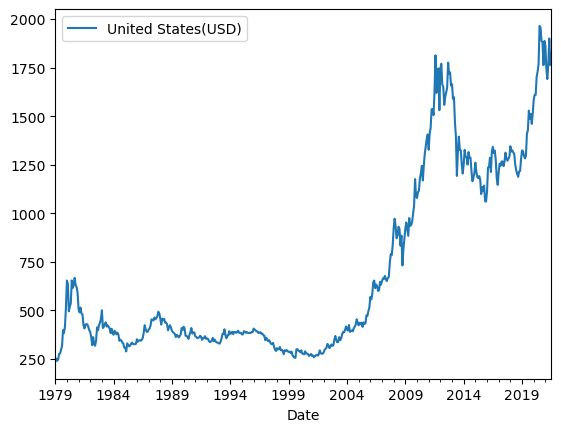

In [4]:
df.plot()

## Dataset spliting

In [5]:
ts_train, ts_test = train_test_split(df, test_size=0.2, shuffle=False, random_state=42)
ts_train.shape, ts_test.shape

((408, 1), (103, 1))

## Dataset and Data loader

In [6]:
from torch.utils.data import TensorDataset, DataLoader
from jcopdl.utils.dataloader import TimeSeriesDataset

In [7]:
seq_length = 5
bs = 16

train_set = TimeSeriesDataset(ts_train, 'United States(USD)', seq_length)
trainloader = DataLoader(train_set, batch_size=bs, shuffle=False)

test_set = TimeSeriesDataset(ts_test, 'United States(USD)', seq_length)
testloader = DataLoader(test_set, batch_size=bs, shuffle=False)

(N, S, F): (81, 5, 1)
Note: last 2 data excluded

(N, S, F): (20, 5, 1)
Note: last 2 data excluded



## Arsitektur and Configuration

In [8]:
from jcopdl.layers import linear_block

In [9]:
class RNN(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, num_layers, dropout):
        super().__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, dropout=dropout, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
        
    def forward(self, x, hidden):
        x, hidden = self.rnn(x, hidden)
        x = self.fc(x)
        return x, hidden        

In [10]:
config = set_config({
    'input_size' : train_set.n_feature,
    'output_size' : 1,
    'num_layers' : 2, 
    'dropout' : 0,
    'hidden_size' : 64 
})

## Training

In [11]:
model = RNN(config.input_size, config.output_size, config.hidden_size, config.num_layers, config.dropout).to(device)
criterion = nn.MSELoss(reduction='mean')
optimizer = optim.AdamW(model.parameters(), lr=0.001)
callback = Callback(model, config, outdir="model/rnn")

## Training loop

In [12]:
from tqdm.auto import tqdm

def loop_fn(mode, dataset, dataloader, model, criterion, optimizer, device):
    if mode == "train":
        model.train()
    elif mode == "test":
        model.eval()
    cost = 0
    for feature, target in tqdm(dataloader, desc=mode.title()):
        feature, target = feature.to(device), target.to(device)
        output, hidden = model(feature, None)
        loss = criterion(output, target)
        
        if mode == "train":
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
        cost += loss.item() * feature.shape[0]
    cost = cost / len(dataset)
    return cost

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     1
Train_cost  = 381099.8194 | Test_cost  = 1905998.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     2
Train_cost  = 379643.8611 | Test_cost  = 1902825.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     3
Train_cost  = 378556.5386 | Test_cost  = 1900279.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     4
Train_cost  = 377676.5540 | Test_cost  = 1898226.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     5
Train_cost  = 376976.0540 | Test_cost  = 1896614.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     6
Train_cost  = 376424.1728 | Test_cost  = 1895306.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     7
Train_cost  = 375960.5679 | Test_cost  = 1894150.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     8
Train_cost  = 375538.8627 | Test_cost  = 1893065.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch     9
Train_cost  = 375138.2917 | Test_cost  = 1892020.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    10
Train_cost  = 374750.5031 | Test_cost  = 1891002.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    11
Train_cost  = 374371.5725 | Test_cost  = 1890003.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    12
Train_cost  = 373999.3765 | Test_cost  = 1889020.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    13
Train_cost  = 373632.5864 | Test_cost  = 1888049.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    14
Train_cost  = 373270.2500 | Test_cost  = 1887088.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    15
Train_cost  = 372911.6512 | Test_cost  = 1886136.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    16
Train_cost  = 372556.2994 | Test_cost  = 1885192.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    17
Train_cost  = 372203.8364 | Test_cost  = 1884255.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    18
Train_cost  = 371853.8611 | Test_cost  = 1883323.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    19
Train_cost  = 371506.1312 | Test_cost  = 1882396.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    20
Train_cost  = 371160.4707 | Test_cost  = 1881475.1500 | 


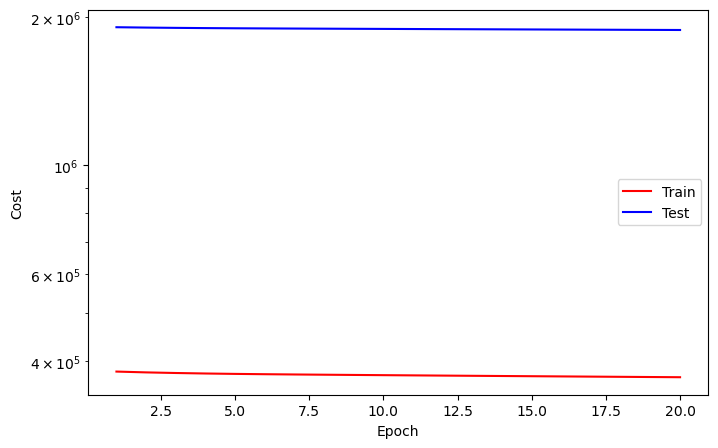

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    21
Train_cost  = 370816.6836 | Test_cost  = 1880557.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    22
Train_cost  = 370474.5941 | Test_cost  = 1879644.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    23
Train_cost  = 370134.1065 | Test_cost  = 1878735.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    24
Train_cost  = 369795.0417 | Test_cost  = 1877828.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    25
Train_cost  = 369457.3858 | Test_cost  = 1876925.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    26
Train_cost  = 369120.9537 | Test_cost  = 1876025.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    27
Train_cost  = 368785.7145 | Test_cost  = 1875128.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    28
Train_cost  = 368451.6651 | Test_cost  = 1874233.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    29
Train_cost  = 368118.6250 | Test_cost  = 1873340.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    30
Train_cost  = 367786.6312 | Test_cost  = 1872450.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    31
Train_cost  = 367455.5864 | Test_cost  = 1871562.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    32
Train_cost  = 367125.4491 | Test_cost  = 1870676.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    33
Train_cost  = 366796.1759 | Test_cost  = 1869792.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    34
Train_cost  = 366467.7901 | Test_cost  = 1868910.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    35
Train_cost  = 366140.2006 | Test_cost  = 1868029.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    36
Train_cost  = 365813.4352 | Test_cost  = 1867150.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    37
Train_cost  = 365487.3858 | Test_cost  = 1866273.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    38
Train_cost  = 365162.0170 | Test_cost  = 1865398.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    39
Train_cost  = 364837.4213 | Test_cost  = 1864524.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    40
Train_cost  = 364513.5000 | Test_cost  = 1863651.7500 | 


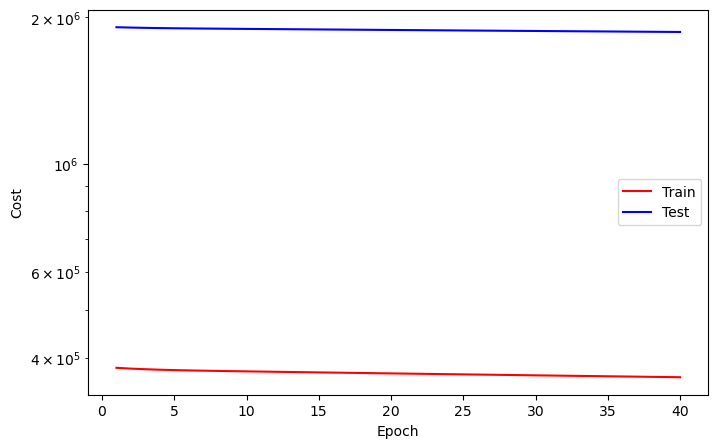

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    41
Train_cost  = 364190.2160 | Test_cost  = 1862780.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    42
Train_cost  = 363867.5941 | Test_cost  = 1861910.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    43
Train_cost  = 363545.5818 | Test_cost  = 1861042.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    44
Train_cost  = 363224.2191 | Test_cost  = 1860175.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    45
Train_cost  = 362903.4151 | Test_cost  = 1859309.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    46
Train_cost  = 362583.2130 | Test_cost  = 1858444.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    47
Train_cost  = 362263.5926 | Test_cost  = 1857580.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    48
Train_cost  = 361944.5262 | Test_cost  = 1856718.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    49
Train_cost  = 361625.9799 | Test_cost  = 1855857.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    50
Train_cost  = 361307.9969 | Test_cost  = 1854996.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    51
Train_cost  = 360990.5463 | Test_cost  = 1854137.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    52
Train_cost  = 360673.5725 | Test_cost  = 1853279.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    53
Train_cost  = 360357.1389 | Test_cost  = 1852422.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    54
Train_cost  = 360041.2006 | Test_cost  = 1851566.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    55
Train_cost  = 359725.7778 | Test_cost  = 1850711.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    56
Train_cost  = 359410.8333 | Test_cost  = 1849857.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    57
Train_cost  = 359096.3688 | Test_cost  = 1849003.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    58
Train_cost  = 358782.3441 | Test_cost  = 1848151.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    59
Train_cost  = 358468.8287 | Test_cost  = 1847300.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    60
Train_cost  = 358155.7454 | Test_cost  = 1846449.8000 | 


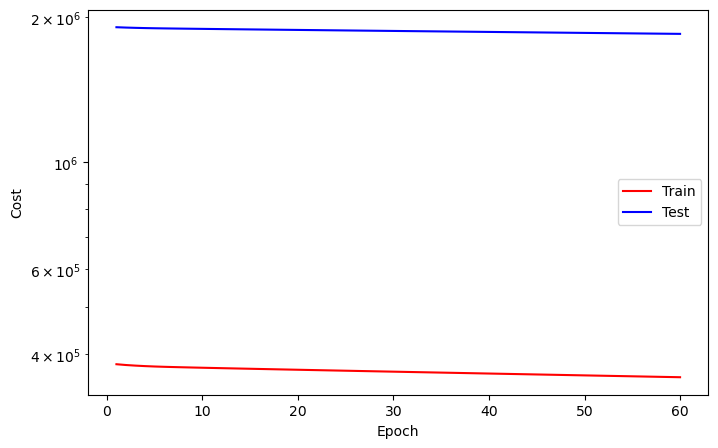

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    61
Train_cost  = 357843.1173 | Test_cost  = 1845600.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    62
Train_cost  = 357530.9568 | Test_cost  = 1844751.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    63
Train_cost  = 357219.1929 | Test_cost  = 1843903.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    64
Train_cost  = 356907.9105 | Test_cost  = 1843056.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    65
Train_cost  = 356597.0571 | Test_cost  = 1842210.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    66
Train_cost  = 356286.6451 | Test_cost  = 1841364.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    67
Train_cost  = 355976.6034 | Test_cost  = 1840520.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    68
Train_cost  = 355667.0478 | Test_cost  = 1839676.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    69
Train_cost  = 355357.8688 | Test_cost  = 1838833.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    70
Train_cost  = 355049.0833 | Test_cost  = 1837991.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    71
Train_cost  = 354740.7654 | Test_cost  = 1837149.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    72
Train_cost  = 354432.7870 | Test_cost  = 1836309.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    73
Train_cost  = 354125.2284 | Test_cost  = 1835469.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    74
Train_cost  = 353818.1003 | Test_cost  = 1834629.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    75
Train_cost  = 353511.3719 | Test_cost  = 1833791.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    76
Train_cost  = 353204.9954 | Test_cost  = 1832953.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    77
Train_cost  = 352899.0123 | Test_cost  = 1832116.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    78
Train_cost  = 352593.4290 | Test_cost  = 1831280.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    79
Train_cost  = 352288.2593 | Test_cost  = 1830444.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    80
Train_cost  = 351983.4599 | Test_cost  = 1829609.6500 | 


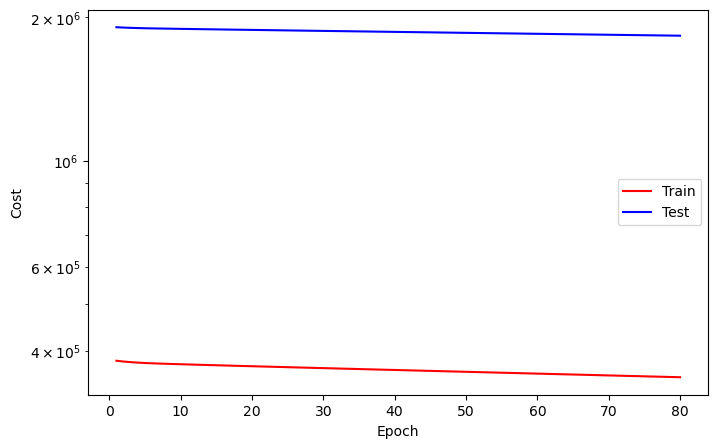

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    81
Train_cost  = 351678.9722 | Test_cost  = 1828775.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    82
Train_cost  = 351374.9228 | Test_cost  = 1827942.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    83
Train_cost  = 351071.2438 | Test_cost  = 1827109.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    84
Train_cost  = 350767.9398 | Test_cost  = 1826276.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    85
Train_cost  = 350464.9846 | Test_cost  = 1825445.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    86
Train_cost  = 350162.3765 | Test_cost  = 1824614.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    87
Train_cost  = 349860.1389 | Test_cost  = 1823784.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    88
Train_cost  = 349558.3102 | Test_cost  = 1822954.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    89
Train_cost  = 349256.8704 | Test_cost  = 1822126.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    90
Train_cost  = 348955.7083 | Test_cost  = 1821297.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    91
Train_cost  = 348654.9444 | Test_cost  = 1820470.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    92
Train_cost  = 348354.5170 | Test_cost  = 1819643.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    93
Train_cost  = 348054.4336 | Test_cost  = 1818817.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    94
Train_cost  = 347754.7731 | Test_cost  = 1817991.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    95
Train_cost  = 347455.3580 | Test_cost  = 1817166.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    96
Train_cost  = 347156.3750 | Test_cost  = 1816342.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    97
Train_cost  = 346857.7037 | Test_cost  = 1815518.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    98
Train_cost  = 346559.3719 | Test_cost  = 1814694.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch    99
Train_cost  = 346261.3951 | Test_cost  = 1813872.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   100
Train_cost  = 345963.7809 | Test_cost  = 1813050.4000 | 


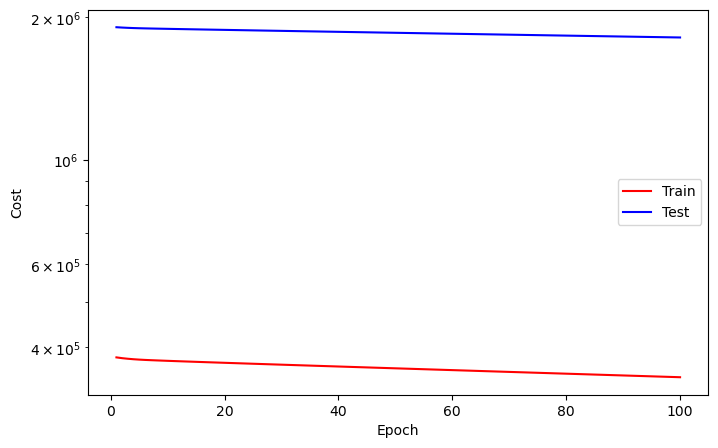

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   101
Train_cost  = 345666.4799 | Test_cost  = 1812229.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   102
Train_cost  = 345369.5247 | Test_cost  = 1811408.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   103
Train_cost  = 345072.9645 | Test_cost  = 1810588.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   104
Train_cost  = 344776.6312 | Test_cost  = 1809768.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   105
Train_cost  = 344480.7207 | Test_cost  = 1808949.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   106
Train_cost  = 344185.1235 | Test_cost  = 1808131.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   107
Train_cost  = 343889.8596 | Test_cost  = 1807313.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   108
Train_cost  = 343594.9120 | Test_cost  = 1806495.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   109
Train_cost  = 343300.3040 | Test_cost  = 1805679.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   110
Train_cost  = 343006.0401 | Test_cost  = 1804863.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   111
Train_cost  = 342712.0926 | Test_cost  = 1804047.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   112
Train_cost  = 342418.4568 | Test_cost  = 1803232.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   113
Train_cost  = 342125.2006 | Test_cost  = 1802418.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   114
Train_cost  = 341832.2207 | Test_cost  = 1801604.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   115
Train_cost  = 341539.6327 | Test_cost  = 1800791.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   116
Train_cost  = 341247.2716 | Test_cost  = 1799978.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   117
Train_cost  = 340955.2608 | Test_cost  = 1799166.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   118
Train_cost  = 340663.5833 | Test_cost  = 1798355.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   119
Train_cost  = 340372.2824 | Test_cost  = 1797544.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   120
Train_cost  = 340081.2654 | Test_cost  = 1796734.1500 | 


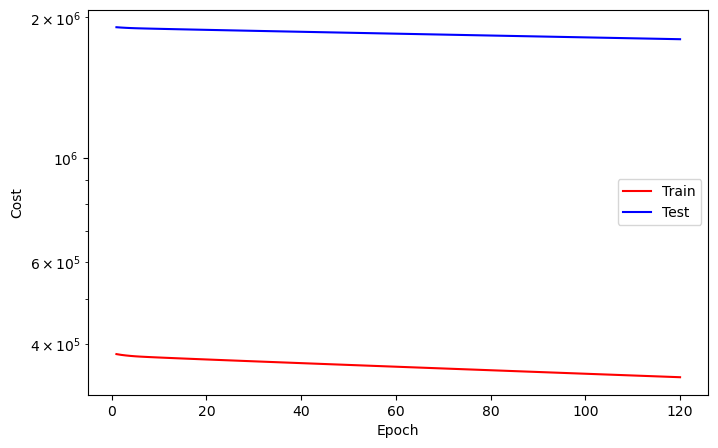

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   121
Train_cost  = 339790.5185 | Test_cost  = 1795924.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   122
Train_cost  = 339500.1543 | Test_cost  = 1795114.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   123
Train_cost  = 339210.0910 | Test_cost  = 1794305.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   124
Train_cost  = 338920.3164 | Test_cost  = 1793497.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   125
Train_cost  = 338630.8889 | Test_cost  = 1792690.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   126
Train_cost  = 338341.7423 | Test_cost  = 1791883.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   127
Train_cost  = 338052.9259 | Test_cost  = 1791076.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   128
Train_cost  = 337764.4352 | Test_cost  = 1790270.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   129
Train_cost  = 337476.2701 | Test_cost  = 1789464.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   130
Train_cost  = 337188.4028 | Test_cost  = 1788659.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   131
Train_cost  = 336900.8009 | Test_cost  = 1787855.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   132
Train_cost  = 336613.5679 | Test_cost  = 1787051.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   133
Train_cost  = 336326.6111 | Test_cost  = 1786248.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   134
Train_cost  = 336039.9799 | Test_cost  = 1785445.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   135
Train_cost  = 335753.6620 | Test_cost  = 1784643.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   136
Train_cost  = 335467.6142 | Test_cost  = 1783841.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   137
Train_cost  = 335181.8935 | Test_cost  = 1783039.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   138
Train_cost  = 334896.5386 | Test_cost  = 1782239.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   139
Train_cost  = 334611.4213 | Test_cost  = 1781438.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   140
Train_cost  = 334326.5972 | Test_cost  = 1780639.0500 | 


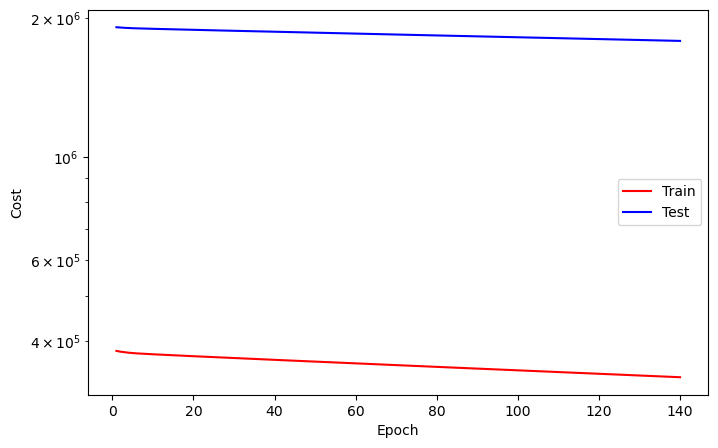

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   141
Train_cost  = 334042.1404 | Test_cost  = 1779840.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   142
Train_cost  = 333757.9506 | Test_cost  = 1779041.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   143
Train_cost  = 333474.0278 | Test_cost  = 1778243.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   144
Train_cost  = 333190.4506 | Test_cost  = 1777445.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   145
Train_cost  = 332907.1667 | Test_cost  = 1776648.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   146
Train_cost  = 332624.1836 | Test_cost  = 1775851.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   147
Train_cost  = 332341.5015 | Test_cost  = 1775055.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   148
Train_cost  = 332059.1034 | Test_cost  = 1774260.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   149
Train_cost  = 331776.9954 | Test_cost  = 1773465.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   150
Train_cost  = 331495.2346 | Test_cost  = 1772670.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   151
Train_cost  = 331213.7068 | Test_cost  = 1771876.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   152
Train_cost  = 330932.5154 | Test_cost  = 1771082.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   153
Train_cost  = 330651.6096 | Test_cost  = 1770289.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   154
Train_cost  = 330371.0000 | Test_cost  = 1769497.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   155
Train_cost  = 330090.7145 | Test_cost  = 1768705.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   156
Train_cost  = 329810.6914 | Test_cost  = 1767913.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   157
Train_cost  = 329530.9676 | Test_cost  = 1767122.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   158
Train_cost  = 329251.5725 | Test_cost  = 1766331.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   159
Train_cost  = 328972.4321 | Test_cost  = 1765542.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   160
Train_cost  = 328693.5540 | Test_cost  = 1764752.3000 | 


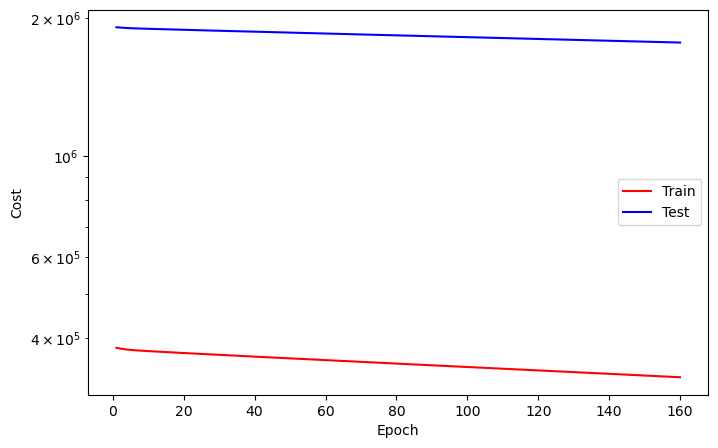

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   161
Train_cost  = 328415.0417 | Test_cost  = 1763963.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   162
Train_cost  = 328136.7562 | Test_cost  = 1763174.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   163
Train_cost  = 327858.7855 | Test_cost  = 1762386.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   164
Train_cost  = 327581.1451 | Test_cost  = 1761599.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   165
Train_cost  = 327303.7160 | Test_cost  = 1760811.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   166
Train_cost  = 327026.6389 | Test_cost  = 1760025.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   167
Train_cost  = 326749.8519 | Test_cost  = 1759238.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   168
Train_cost  = 326473.2886 | Test_cost  = 1758453.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   169
Train_cost  = 326197.0648 | Test_cost  = 1757668.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   170
Train_cost  = 325921.1651 | Test_cost  = 1756883.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   171
Train_cost  = 325645.4815 | Test_cost  = 1756099.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   172
Train_cost  = 325370.1173 | Test_cost  = 1755315.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   173
Train_cost  = 325095.0139 | Test_cost  = 1754532.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   174
Train_cost  = 324820.2330 | Test_cost  = 1753749.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   175
Train_cost  = 324545.7238 | Test_cost  = 1752967.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   176
Train_cost  = 324271.5108 | Test_cost  = 1752185.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   177
Train_cost  = 323997.5525 | Test_cost  = 1751404.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   178
Train_cost  = 323723.8966 | Test_cost  = 1750623.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   179
Train_cost  = 323450.5216 | Test_cost  = 1749842.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   180
Train_cost  = 323177.3951 | Test_cost  = 1749063.1000 | 


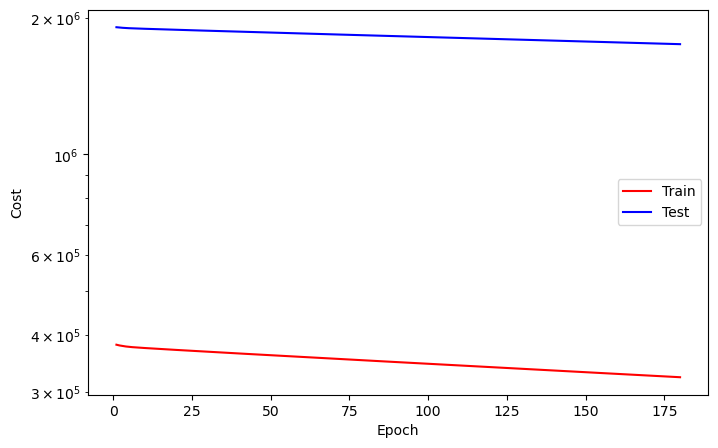

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   181
Train_cost  = 322904.6034 | Test_cost  = 1748283.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   182
Train_cost  = 322632.0602 | Test_cost  = 1747504.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   183
Train_cost  = 322359.8349 | Test_cost  = 1746726.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   184
Train_cost  = 322087.8364 | Test_cost  = 1745948.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   185
Train_cost  = 321816.1744 | Test_cost  = 1745170.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   186
Train_cost  = 321544.7685 | Test_cost  = 1744393.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   187
Train_cost  = 321273.6358 | Test_cost  = 1743617.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   188
Train_cost  = 321002.8056 | Test_cost  = 1742840.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   189
Train_cost  = 320732.1929 | Test_cost  = 1742065.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   190
Train_cost  = 320461.9429 | Test_cost  = 1741289.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   191
Train_cost  = 320191.9151 | Test_cost  = 1740515.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   192
Train_cost  = 319922.1836 | Test_cost  = 1739741.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   193
Train_cost  = 319652.7531 | Test_cost  = 1738967.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   194
Train_cost  = 319383.5494 | Test_cost  = 1738194.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   195
Train_cost  = 319114.6420 | Test_cost  = 1737421.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   196
Train_cost  = 318846.0401 | Test_cost  = 1736648.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   197
Train_cost  = 318577.6867 | Test_cost  = 1735876.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   198
Train_cost  = 318309.5941 | Test_cost  = 1735105.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   199
Train_cost  = 318041.8117 | Test_cost  = 1734334.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   200
Train_cost  = 317774.2932 | Test_cost  = 1733563.8500 | 


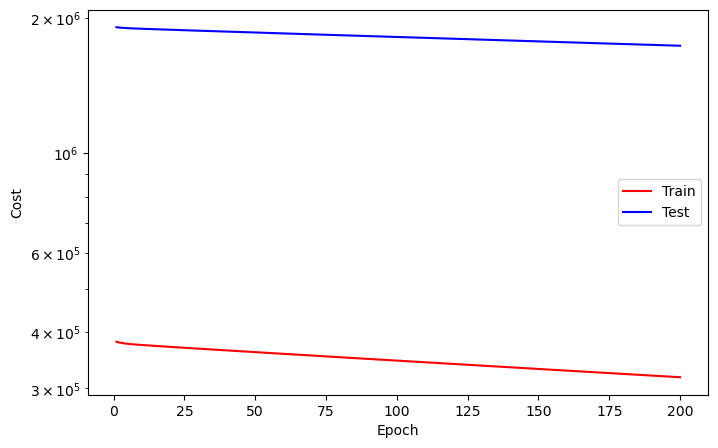

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   201
Train_cost  = 317507.0340 | Test_cost  = 1732793.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   202
Train_cost  = 317240.0664 | Test_cost  = 1732024.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   203
Train_cost  = 316973.3873 | Test_cost  = 1731255.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   204
Train_cost  = 316706.9275 | Test_cost  = 1730486.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   205
Train_cost  = 316440.8056 | Test_cost  = 1729718.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   206
Train_cost  = 316174.9059 | Test_cost  = 1728950.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   207
Train_cost  = 315909.2963 | Test_cost  = 1728182.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   208
Train_cost  = 315643.9552 | Test_cost  = 1727416.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   209
Train_cost  = 315378.9136 | Test_cost  = 1726649.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   210
Train_cost  = 315114.1142 | Test_cost  = 1725883.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   211
Train_cost  = 314849.6019 | Test_cost  = 1725117.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   212
Train_cost  = 314585.3148 | Test_cost  = 1724352.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   213
Train_cost  = 314321.3318 | Test_cost  = 1723588.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   214
Train_cost  = 314057.6389 | Test_cost  = 1722824.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   215
Train_cost  = 313794.1991 | Test_cost  = 1722060.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   216
Train_cost  = 313531.0201 | Test_cost  = 1721296.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   217
Train_cost  = 313268.1235 | Test_cost  = 1720534.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   218
Train_cost  = 313005.4614 | Test_cost  = 1719771.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   219
Train_cost  = 312743.0756 | Test_cost  = 1719010.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   220
Train_cost  = 312481.0015 | Test_cost  = 1718248.3000 | 


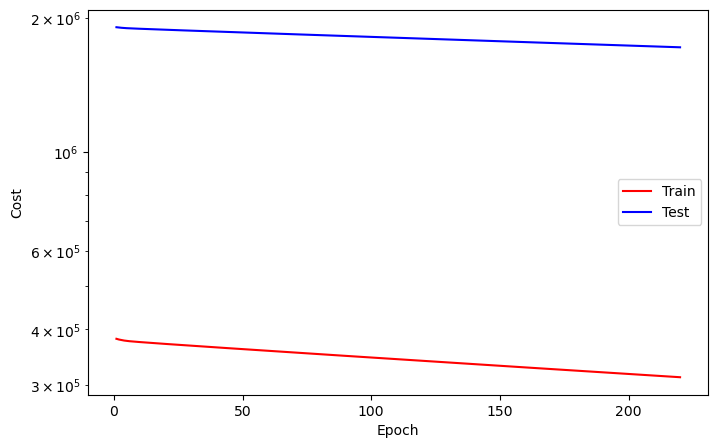

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   221
Train_cost  = 312219.1667 | Test_cost  = 1717487.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   222
Train_cost  = 311957.6003 | Test_cost  = 1716726.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   223
Train_cost  = 311696.3210 | Test_cost  = 1715966.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   224
Train_cost  = 311435.2793 | Test_cost  = 1715206.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   225
Train_cost  = 311174.5123 | Test_cost  = 1714447.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   226
Train_cost  = 310914.0046 | Test_cost  = 1713688.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   227
Train_cost  = 310653.7731 | Test_cost  = 1712930.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   228
Train_cost  = 310393.7809 | Test_cost  = 1712172.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   229
Train_cost  = 310134.0818 | Test_cost  = 1711415.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   230
Train_cost  = 309874.6682 | Test_cost  = 1710658.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   231
Train_cost  = 309615.5062 | Test_cost  = 1709901.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   232
Train_cost  = 309356.5880 | Test_cost  = 1709145.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   233
Train_cost  = 309097.9198 | Test_cost  = 1708389.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   234
Train_cost  = 308839.5556 | Test_cost  = 1707634.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   235
Train_cost  = 308581.4012 | Test_cost  = 1706879.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   236
Train_cost  = 308323.5633 | Test_cost  = 1706124.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   237
Train_cost  = 308065.9645 | Test_cost  = 1705370.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   238
Train_cost  = 307808.6034 | Test_cost  = 1704617.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   239
Train_cost  = 307551.5401 | Test_cost  = 1703864.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   240
Train_cost  = 307294.7438 | Test_cost  = 1703111.5000 | 


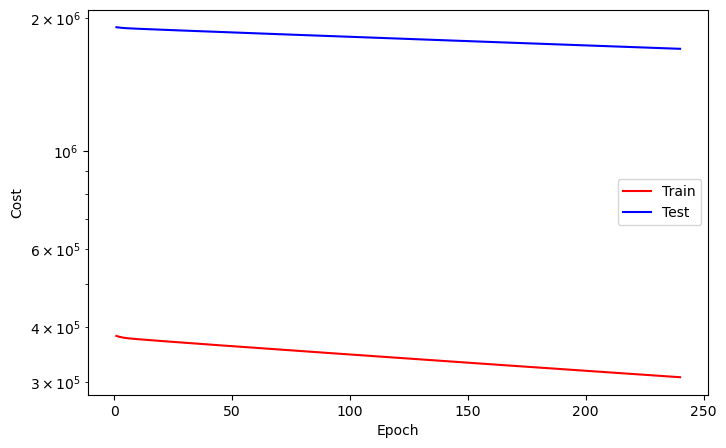

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   241
Train_cost  = 307038.1975 | Test_cost  = 1702359.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   242
Train_cost  = 306781.9167 | Test_cost  = 1701607.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   243
Train_cost  = 306525.8596 | Test_cost  = 1700856.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   244
Train_cost  = 306270.1204 | Test_cost  = 1700105.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   245
Train_cost  = 306014.6065 | Test_cost  = 1699354.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   246
Train_cost  = 305759.3472 | Test_cost  = 1698604.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   247
Train_cost  = 305504.3519 | Test_cost  = 1697855.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   248
Train_cost  = 305249.6296 | Test_cost  = 1697105.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   249
Train_cost  = 304995.1435 | Test_cost  = 1696356.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   250
Train_cost  = 304740.9398 | Test_cost  = 1695608.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   251
Train_cost  = 304486.9769 | Test_cost  = 1694860.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   252
Train_cost  = 304233.2731 | Test_cost  = 1694113.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   253
Train_cost  = 303979.8410 | Test_cost  = 1693366.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   254
Train_cost  = 303726.6620 | Test_cost  = 1692619.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   255
Train_cost  = 303473.7423 | Test_cost  = 1691873.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   256
Train_cost  = 303221.0633 | Test_cost  = 1691127.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   257
Train_cost  = 302968.6728 | Test_cost  = 1690382.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   258
Train_cost  = 302716.4954 | Test_cost  = 1689637.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   259
Train_cost  = 302464.6142 | Test_cost  = 1688892.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   260
Train_cost  = 302212.9568 | Test_cost  = 1688148.7500 | 


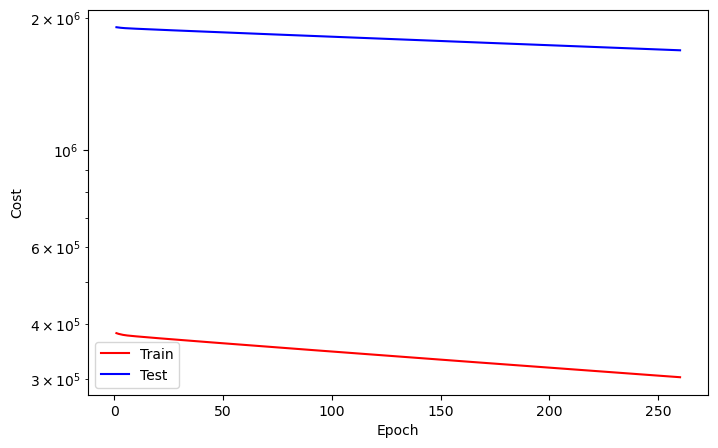

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   261
Train_cost  = 301961.6034 | Test_cost  = 1687404.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   262
Train_cost  = 301710.4583 | Test_cost  = 1686662.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   263
Train_cost  = 301459.5540 | Test_cost  = 1685919.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   264
Train_cost  = 301208.9769 | Test_cost  = 1685176.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   265
Train_cost  = 300958.5741 | Test_cost  = 1684434.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   266
Train_cost  = 300708.4606 | Test_cost  = 1683693.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   267
Train_cost  = 300458.5941 | Test_cost  = 1682952.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   268
Train_cost  = 300208.9730 | Test_cost  = 1682211.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   269
Train_cost  = 299959.6304 | Test_cost  = 1681471.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   270
Train_cost  = 299710.5394 | Test_cost  = 1680731.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   271
Train_cost  = 299461.6566 | Test_cost  = 1679991.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   272
Train_cost  = 299213.0826 | Test_cost  = 1679252.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   273
Train_cost  = 298964.7431 | Test_cost  = 1678514.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   274
Train_cost  = 298716.6466 | Test_cost  = 1677776.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   275
Train_cost  = 298468.8241 | Test_cost  = 1677038.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   276
Train_cost  = 298221.2076 | Test_cost  = 1676300.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   277
Train_cost  = 297973.9221 | Test_cost  = 1675563.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   278
Train_cost  = 297726.8063 | Test_cost  = 1674827.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   279
Train_cost  = 297479.9545 | Test_cost  = 1674091.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   280
Train_cost  = 297233.3619 | Test_cost  = 1673355.7000 | 


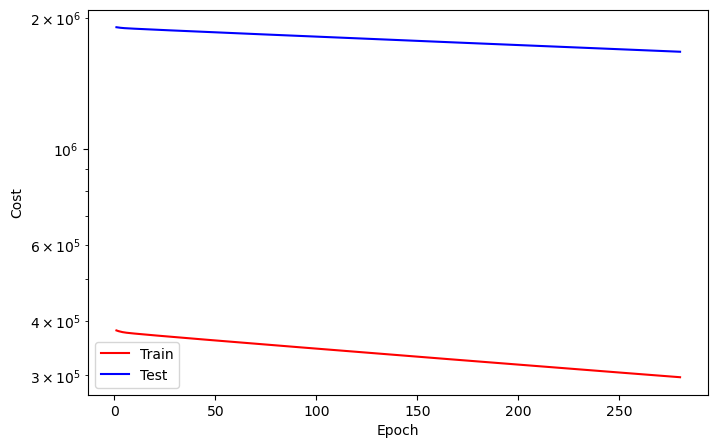

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   281
Train_cost  = 296987.0185 | Test_cost  = 1672620.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   282
Train_cost  = 296740.9491 | Test_cost  = 1671885.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   283
Train_cost  = 296495.1065 | Test_cost  = 1671151.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   284
Train_cost  = 296249.5409 | Test_cost  = 1670417.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   285
Train_cost  = 296004.1651 | Test_cost  = 1669683.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   286
Train_cost  = 295759.1065 | Test_cost  = 1668950.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   287
Train_cost  = 295514.2762 | Test_cost  = 1668217.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   288
Train_cost  = 295269.6597 | Test_cost  = 1667485.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   289
Train_cost  = 295025.3395 | Test_cost  = 1666753.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   290
Train_cost  = 294781.2461 | Test_cost  = 1666022.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   291
Train_cost  = 294537.4097 | Test_cost  = 1665290.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   292
Train_cost  = 294293.7878 | Test_cost  = 1664560.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   293
Train_cost  = 294050.4529 | Test_cost  = 1663830.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   294
Train_cost  = 293807.3264 | Test_cost  = 1663100.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   295
Train_cost  = 293564.4545 | Test_cost  = 1662370.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   296
Train_cost  = 293321.8441 | Test_cost  = 1661641.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   297
Train_cost  = 293079.5046 | Test_cost  = 1660912.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   298
Train_cost  = 292837.3819 | Test_cost  = 1660184.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   299
Train_cost  = 292595.4861 | Test_cost  = 1659456.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   300
Train_cost  = 292353.8511 | Test_cost  = 1658729.4000 | 


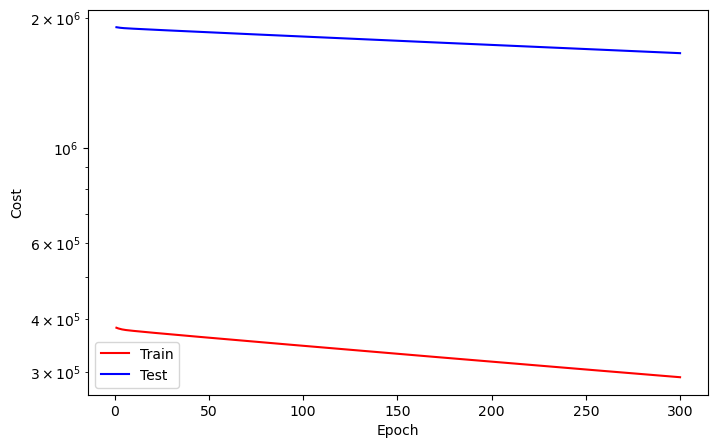

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   301
Train_cost  = 292112.4537 | Test_cost  = 1658002.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   302
Train_cost  = 291871.3465 | Test_cost  = 1657275.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   303
Train_cost  = 291630.4005 | Test_cost  = 1656549.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   304
Train_cost  = 291389.7917 | Test_cost  = 1655823.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   305
Train_cost  = 291149.3603 | Test_cost  = 1655098.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   306
Train_cost  = 290909.2215 | Test_cost  = 1654373.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   307
Train_cost  = 290669.3063 | Test_cost  = 1653648.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   308
Train_cost  = 290429.6127 | Test_cost  = 1652924.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   309
Train_cost  = 290190.1728 | Test_cost  = 1652200.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   310
Train_cost  = 289950.9738 | Test_cost  = 1651477.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   311
Train_cost  = 289712.0340 | Test_cost  = 1650754.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   312
Train_cost  = 289473.3287 | Test_cost  = 1650032.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   313
Train_cost  = 289234.8812 | Test_cost  = 1649309.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   314
Train_cost  = 288996.6512 | Test_cost  = 1648588.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   315
Train_cost  = 288758.6620 | Test_cost  = 1647867.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   316
Train_cost  = 288520.9390 | Test_cost  = 1647145.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   317
Train_cost  = 288283.4275 | Test_cost  = 1646425.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   318
Train_cost  = 288046.1875 | Test_cost  = 1645705.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   319
Train_cost  = 287809.1944 | Test_cost  = 1644985.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   320
Train_cost  = 287572.4182 | Test_cost  = 1644266.1500 | 


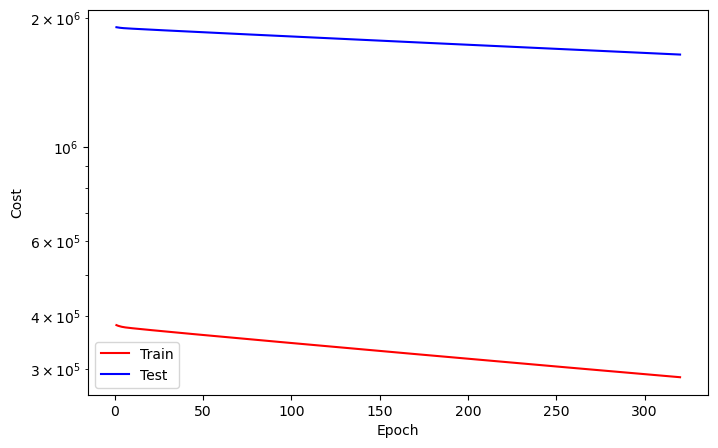

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   321
Train_cost  = 287335.8758 | Test_cost  = 1643547.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   322
Train_cost  = 287099.5972 | Test_cost  = 1642828.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   323
Train_cost  = 286863.5193 | Test_cost  = 1642110.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   324
Train_cost  = 286627.7207 | Test_cost  = 1641392.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   325
Train_cost  = 286392.1582 | Test_cost  = 1640675.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   326
Train_cost  = 286156.8264 | Test_cost  = 1639958.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   327
Train_cost  = 285921.7207 | Test_cost  = 1639242.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   328
Train_cost  = 285686.8866 | Test_cost  = 1638525.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   329
Train_cost  = 285452.2701 | Test_cost  = 1637810.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   330
Train_cost  = 285217.9167 | Test_cost  = 1637094.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   331
Train_cost  = 284983.7477 | Test_cost  = 1636379.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   332
Train_cost  = 284749.8565 | Test_cost  = 1635665.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   333
Train_cost  = 284516.2145 | Test_cost  = 1634951.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   334
Train_cost  = 284282.7994 | Test_cost  = 1634237.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   335
Train_cost  = 284049.5725 | Test_cost  = 1633524.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   336
Train_cost  = 283816.6350 | Test_cost  = 1632811.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   337
Train_cost  = 283583.8873 | Test_cost  = 1632098.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   338
Train_cost  = 283351.4406 | Test_cost  = 1631386.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   339
Train_cost  = 283119.1852 | Test_cost  = 1630674.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   340
Train_cost  = 282887.1998 | Test_cost  = 1629963.0000 | 


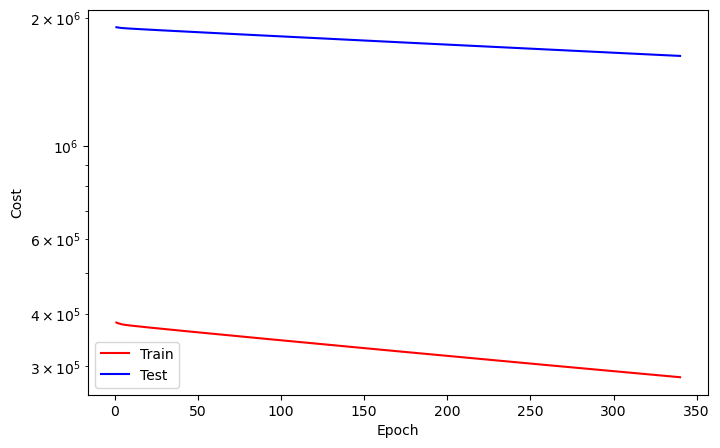

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   341
Train_cost  = 282655.4406 | Test_cost  = 1629252.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   342
Train_cost  = 282423.8781 | Test_cost  = 1628541.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   343
Train_cost  = 282192.6019 | Test_cost  = 1627831.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   344
Train_cost  = 281961.5154 | Test_cost  = 1627121.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   345
Train_cost  = 281730.7315 | Test_cost  = 1626411.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   346
Train_cost  = 281500.1435 | Test_cost  = 1625703.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   347
Train_cost  = 281269.7739 | Test_cost  = 1624994.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   348
Train_cost  = 281039.6420 | Test_cost  = 1624286.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   349
Train_cost  = 280809.7824 | Test_cost  = 1623578.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   350
Train_cost  = 280580.1119 | Test_cost  = 1622870.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   351
Train_cost  = 280350.7037 | Test_cost  = 1622163.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   352
Train_cost  = 280121.5031 | Test_cost  = 1621456.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   353
Train_cost  = 279892.5949 | Test_cost  = 1620750.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   354
Train_cost  = 279663.8372 | Test_cost  = 1620044.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   355
Train_cost  = 279435.3681 | Test_cost  = 1619339.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   356
Train_cost  = 279207.1211 | Test_cost  = 1618634.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   357
Train_cost  = 278979.0934 | Test_cost  = 1617929.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   358
Train_cost  = 278751.3264 | Test_cost  = 1617225.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   359
Train_cost  = 278523.7639 | Test_cost  = 1616521.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   360
Train_cost  = 278296.4360 | Test_cost  = 1615817.4000 | 


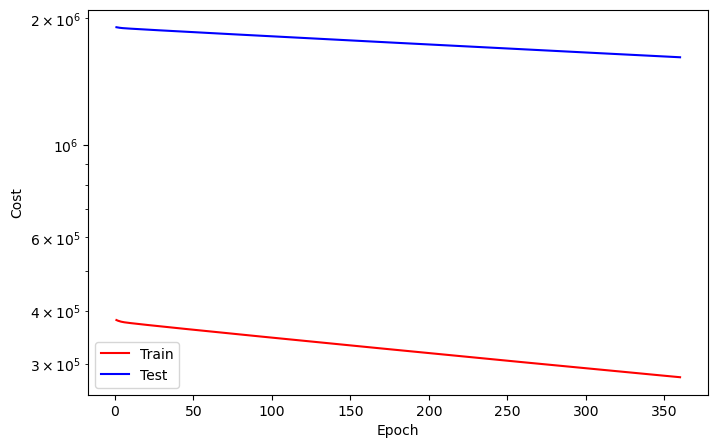

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   361
Train_cost  = 278069.3542 | Test_cost  = 1615114.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   362
Train_cost  = 277842.4992 | Test_cost  = 1614411.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   363
Train_cost  = 277615.8665 | Test_cost  = 1613709.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   364
Train_cost  = 277389.4738 | Test_cost  = 1613007.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   365
Train_cost  = 277163.3125 | Test_cost  = 1612305.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   366
Train_cost  = 276937.3881 | Test_cost  = 1611604.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   367
Train_cost  = 276711.6543 | Test_cost  = 1610903.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   368
Train_cost  = 276486.2060 | Test_cost  = 1610202.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   369
Train_cost  = 276260.9414 | Test_cost  = 1609502.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   370
Train_cost  = 276035.9506 | Test_cost  = 1608802.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   371
Train_cost  = 275811.1620 | Test_cost  = 1608103.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   372
Train_cost  = 275586.6227 | Test_cost  = 1607404.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   373
Train_cost  = 275362.2986 | Test_cost  = 1606706.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   374
Train_cost  = 275138.2176 | Test_cost  = 1606007.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   375
Train_cost  = 274914.3503 | Test_cost  = 1605310.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   376
Train_cost  = 274690.6952 | Test_cost  = 1604612.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   377
Train_cost  = 274467.3094 | Test_cost  = 1603915.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   378
Train_cost  = 274244.1435 | Test_cost  = 1603218.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   379
Train_cost  = 274021.1605 | Test_cost  = 1602522.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   380
Train_cost  = 273798.4738 | Test_cost  = 1601826.7000 | 


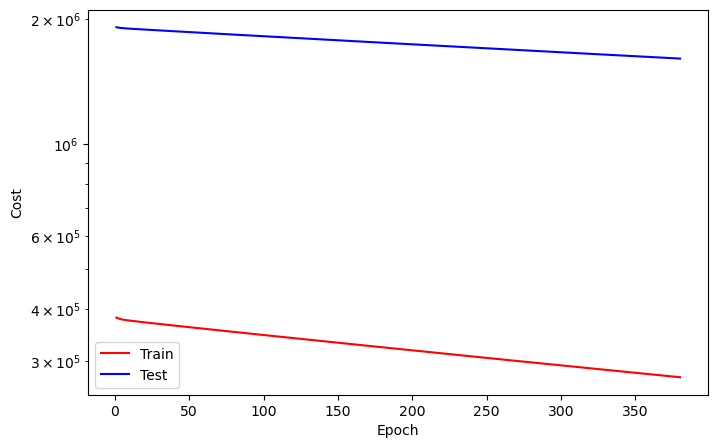

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   381
Train_cost  = 273575.9630 | Test_cost  = 1601131.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   382
Train_cost  = 273353.7168 | Test_cost  = 1600436.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   383
Train_cost  = 273131.6713 | Test_cost  = 1599741.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   384
Train_cost  = 272909.8742 | Test_cost  = 1599047.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   385
Train_cost  = 272688.2847 | Test_cost  = 1598353.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   386
Train_cost  = 272466.9205 | Test_cost  = 1597659.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   387
Train_cost  = 272245.7816 | Test_cost  = 1596966.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   388
Train_cost  = 272024.9059 | Test_cost  = 1596273.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   389
Train_cost  = 271804.2353 | Test_cost  = 1595580.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   390
Train_cost  = 271583.7647 | Test_cost  = 1594888.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   391
Train_cost  = 271363.5255 | Test_cost  = 1594197.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   392
Train_cost  = 271143.5424 | Test_cost  = 1593505.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   393
Train_cost  = 270923.8102 | Test_cost  = 1592814.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   394
Train_cost  = 270704.2539 | Test_cost  = 1592124.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   395
Train_cost  = 270484.9174 | Test_cost  = 1591434.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   396
Train_cost  = 270265.8171 | Test_cost  = 1590744.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   397
Train_cost  = 270046.9414 | Test_cost  = 1590054.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   398
Train_cost  = 269828.2894 | Test_cost  = 1589365.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   399
Train_cost  = 269609.8542 | Test_cost  = 1588676.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   400
Train_cost  = 269391.6867 | Test_cost  = 1587988.5500 | 


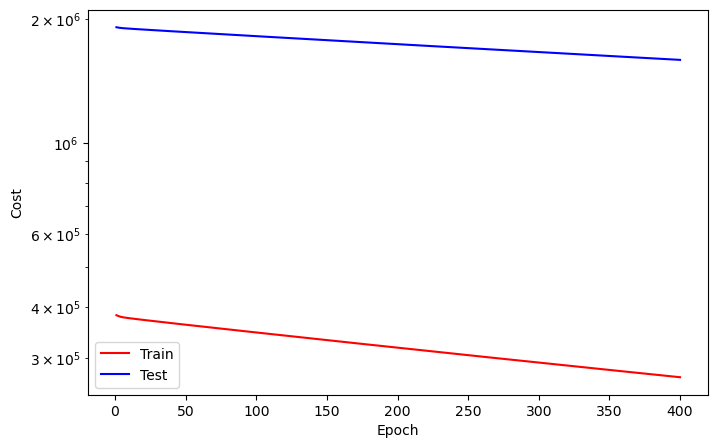

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   401
Train_cost  = 269173.7245 | Test_cost  = 1587300.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   402
Train_cost  = 268955.9707 | Test_cost  = 1586613.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   403
Train_cost  = 268738.4228 | Test_cost  = 1585926.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   404
Train_cost  = 268521.1451 | Test_cost  = 1585239.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   405
Train_cost  = 268304.0694 | Test_cost  = 1584552.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   406
Train_cost  = 268087.1975 | Test_cost  = 1583866.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   407
Train_cost  = 267870.5502 | Test_cost  = 1583180.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   408
Train_cost  = 267654.1698 | Test_cost  = 1582495.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   409
Train_cost  = 267437.9853 | Test_cost  = 1581810.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   410
Train_cost  = 267222.0054 | Test_cost  = 1581125.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   411
Train_cost  = 267006.2816 | Test_cost  = 1580441.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   412
Train_cost  = 266790.7330 | Test_cost  = 1579757.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   413
Train_cost  = 266575.4514 | Test_cost  = 1579074.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   414
Train_cost  = 266360.3750 | Test_cost  = 1578391.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   415
Train_cost  = 266145.5255 | Test_cost  = 1577708.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   416
Train_cost  = 265930.8735 | Test_cost  = 1577026.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   417
Train_cost  = 265716.4722 | Test_cost  = 1576344.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   418
Train_cost  = 265502.2870 | Test_cost  = 1575662.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   419
Train_cost  = 265288.2963 | Test_cost  = 1574981.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   420
Train_cost  = 265074.5594 | Test_cost  = 1574300.5500 | 


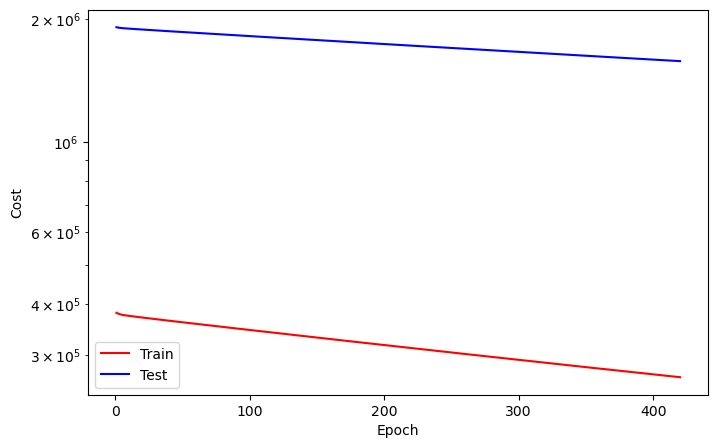

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   421
Train_cost  = 264861.0293 | Test_cost  = 1573620.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   422
Train_cost  = 264647.7184 | Test_cost  = 1572939.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   423
Train_cost  = 264434.6474 | Test_cost  = 1572260.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   424
Train_cost  = 264221.7531 | Test_cost  = 1571580.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   425
Train_cost  = 264009.1142 | Test_cost  = 1570901.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   426
Train_cost  = 263796.6867 | Test_cost  = 1570223.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   427
Train_cost  = 263584.4676 | Test_cost  = 1569544.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   428
Train_cost  = 263372.5031 | Test_cost  = 1568866.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   429
Train_cost  = 263160.7106 | Test_cost  = 1568189.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   430
Train_cost  = 262949.1636 | Test_cost  = 1567512.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   431
Train_cost  = 262737.8333 | Test_cost  = 1566835.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   432
Train_cost  = 262526.7215 | Test_cost  = 1566159.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   433
Train_cost  = 262315.8140 | Test_cost  = 1565483.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   434
Train_cost  = 262105.1312 | Test_cost  = 1564807.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   435
Train_cost  = 261894.6937 | Test_cost  = 1564131.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   436
Train_cost  = 261684.4252 | Test_cost  = 1563457.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   437
Train_cost  = 261474.3881 | Test_cost  = 1562782.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   438
Train_cost  = 261264.5934 | Test_cost  = 1562108.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   439
Train_cost  = 261055.0231 | Test_cost  = 1561434.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   440
Train_cost  = 260845.6543 | Test_cost  = 1560760.6000 | 


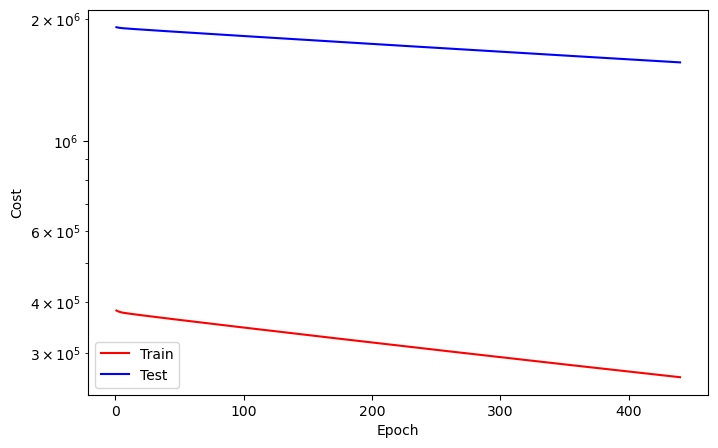

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   441
Train_cost  = 260636.4892 | Test_cost  = 1560087.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   442
Train_cost  = 260427.5255 | Test_cost  = 1559415.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   443
Train_cost  = 260218.8179 | Test_cost  = 1558742.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   444
Train_cost  = 260010.2963 | Test_cost  = 1558070.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   445
Train_cost  = 259802.0332 | Test_cost  = 1557398.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   446
Train_cost  = 259593.9313 | Test_cost  = 1556727.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   447
Train_cost  = 259386.1019 | Test_cost  = 1556056.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   448
Train_cost  = 259178.4691 | Test_cost  = 1555385.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   449
Train_cost  = 258971.0340 | Test_cost  = 1554715.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   450
Train_cost  = 258763.8025 | Test_cost  = 1554045.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   451
Train_cost  = 258556.8071 | Test_cost  = 1553376.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   452
Train_cost  = 258350.0247 | Test_cost  = 1552707.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   453
Train_cost  = 258143.4583 | Test_cost  = 1552038.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   454
Train_cost  = 257937.1150 | Test_cost  = 1551370.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   455
Train_cost  = 257730.9691 | Test_cost  = 1550702.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   456
Train_cost  = 257525.0594 | Test_cost  = 1550034.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   457
Train_cost  = 257319.3580 | Test_cost  = 1549367.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   458
Train_cost  = 257113.8279 | Test_cost  = 1548700.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   459
Train_cost  = 256908.5502 | Test_cost  = 1548033.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   460
Train_cost  = 256703.5046 | Test_cost  = 1547367.4000 | 


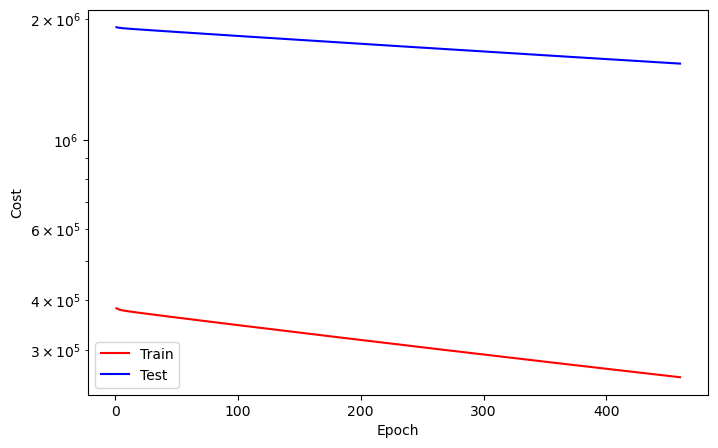

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   461
Train_cost  = 256498.6698 | Test_cost  = 1546701.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   462
Train_cost  = 256294.0193 | Test_cost  = 1546035.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   463
Train_cost  = 256089.5841 | Test_cost  = 1545370.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   464
Train_cost  = 255885.3688 | Test_cost  = 1544705.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   465
Train_cost  = 255681.3889 | Test_cost  = 1544041.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   466
Train_cost  = 255477.5926 | Test_cost  = 1543377.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   467
Train_cost  = 255274.0031 | Test_cost  = 1542713.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   468
Train_cost  = 255070.6474 | Test_cost  = 1542050.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   469
Train_cost  = 254867.4969 | Test_cost  = 1541387.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   470
Train_cost  = 254664.5478 | Test_cost  = 1540724.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   471
Train_cost  = 254461.8410 | Test_cost  = 1540062.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   472
Train_cost  = 254259.3272 | Test_cost  = 1539400.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   473
Train_cost  = 254057.0177 | Test_cost  = 1538739.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   474
Train_cost  = 253854.9182 | Test_cost  = 1538078.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   475
Train_cost  = 253653.0363 | Test_cost  = 1537417.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   476
Train_cost  = 253451.3727 | Test_cost  = 1536756.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   477
Train_cost  = 253249.9066 | Test_cost  = 1536096.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   478
Train_cost  = 253048.6937 | Test_cost  = 1535436.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   479
Train_cost  = 252847.6343 | Test_cost  = 1534777.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   480
Train_cost  = 252646.7909 | Test_cost  = 1534118.2500 | 


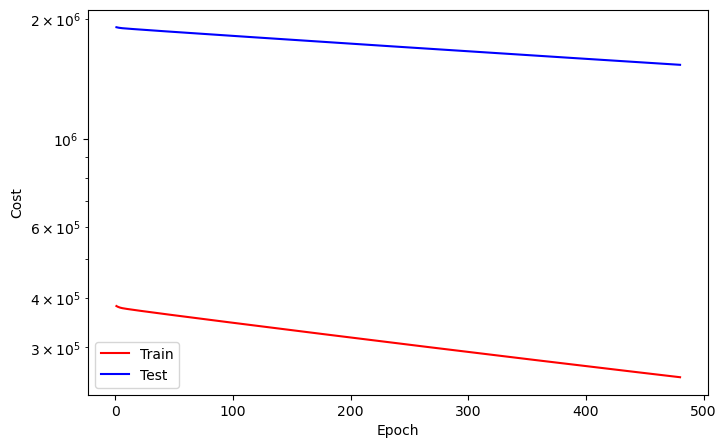

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   481
Train_cost  = 252446.2099 | Test_cost  = 1533459.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   482
Train_cost  = 252245.8025 | Test_cost  = 1532801.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   483
Train_cost  = 252045.5841 | Test_cost  = 1532143.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   484
Train_cost  = 251845.5826 | Test_cost  = 1531485.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   485
Train_cost  = 251645.8179 | Test_cost  = 1530828.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   486
Train_cost  = 251446.2562 | Test_cost  = 1530171.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   487
Train_cost  = 251246.8897 | Test_cost  = 1529514.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   488
Train_cost  = 251047.7569 | Test_cost  = 1528858.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   489
Train_cost  = 250848.7932 | Test_cost  = 1528202.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   490
Train_cost  = 250650.0887 | Test_cost  = 1527547.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   491
Train_cost  = 250451.5432 | Test_cost  = 1526892.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   492
Train_cost  = 250253.2361 | Test_cost  = 1526237.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   493
Train_cost  = 250055.1420 | Test_cost  = 1525583.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   494
Train_cost  = 249857.2346 | Test_cost  = 1524928.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   495
Train_cost  = 249659.5525 | Test_cost  = 1524275.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   496
Train_cost  = 249462.0972 | Test_cost  = 1523621.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   497
Train_cost  = 249264.7785 | Test_cost  = 1522968.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   498
Train_cost  = 249067.7176 | Test_cost  = 1522316.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   499
Train_cost  = 248870.8665 | Test_cost  = 1521663.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   500
Train_cost  = 248674.1937 | Test_cost  = 1521011.8000 | 


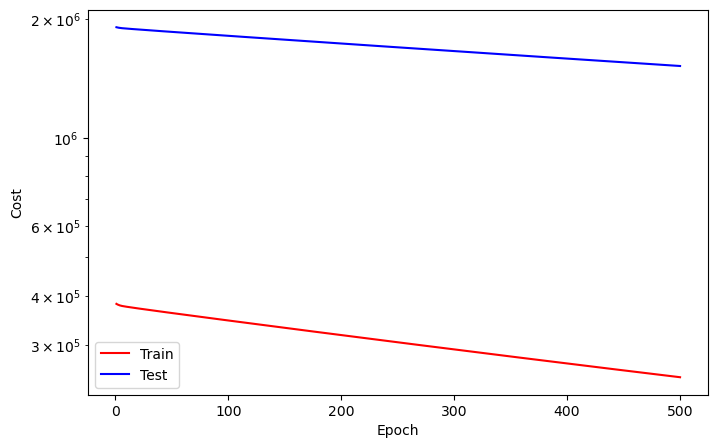

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   501
Train_cost  = 248477.7755 | Test_cost  = 1520360.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   502
Train_cost  = 248281.5355 | Test_cost  = 1519709.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   503
Train_cost  = 248085.5062 | Test_cost  = 1519058.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   504
Train_cost  = 247889.6713 | Test_cost  = 1518407.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   505
Train_cost  = 247694.0417 | Test_cost  = 1517757.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   506
Train_cost  = 247498.6698 | Test_cost  = 1517107.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   507
Train_cost  = 247303.4398 | Test_cost  = 1516458.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   508
Train_cost  = 247108.4352 | Test_cost  = 1515808.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   509
Train_cost  = 246913.6505 | Test_cost  = 1515160.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   510
Train_cost  = 246719.0478 | Test_cost  = 1514511.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   511
Train_cost  = 246524.6875 | Test_cost  = 1513863.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   512
Train_cost  = 246330.5015 | Test_cost  = 1513215.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   513
Train_cost  = 246136.5185 | Test_cost  = 1512568.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   514
Train_cost  = 245942.7677 | Test_cost  = 1511921.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   515
Train_cost  = 245749.1991 | Test_cost  = 1511274.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   516
Train_cost  = 245555.8519 | Test_cost  = 1510628.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   517
Train_cost  = 245362.7083 | Test_cost  = 1509982.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   518
Train_cost  = 245169.7492 | Test_cost  = 1509336.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   519
Train_cost  = 244976.9977 | Test_cost  = 1508691.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   520
Train_cost  = 244784.4583 | Test_cost  = 1508046.6000 | 


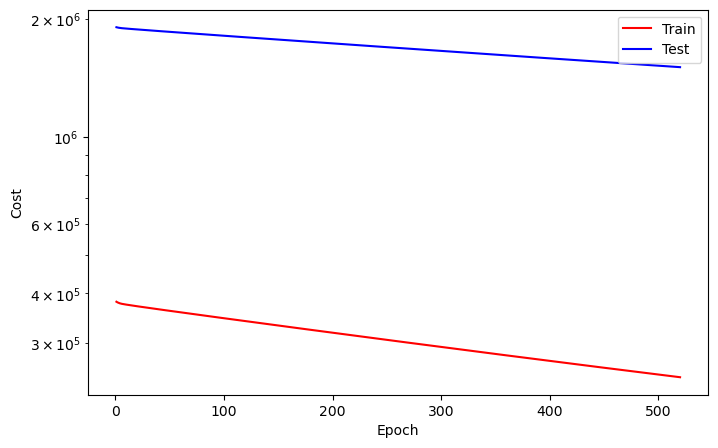

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   521
Train_cost  = 244592.1281 | Test_cost  = 1507401.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   522
Train_cost  = 244399.9838 | Test_cost  = 1506757.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   523
Train_cost  = 244208.0633 | Test_cost  = 1506113.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   524
Train_cost  = 244016.3673 | Test_cost  = 1505470.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   525
Train_cost  = 243824.8295 | Test_cost  = 1504827.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   526
Train_cost  = 243633.5093 | Test_cost  = 1504184.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   527
Train_cost  = 243442.3835 | Test_cost  = 1503541.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   528
Train_cost  = 243251.4761 | Test_cost  = 1502899.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   529
Train_cost  = 243060.7793 | Test_cost  = 1502257.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   530
Train_cost  = 242870.2639 | Test_cost  = 1501616.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   531
Train_cost  = 242679.9444 | Test_cost  = 1500974.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   532
Train_cost  = 242489.8657 | Test_cost  = 1500334.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   533
Train_cost  = 242299.9568 | Test_cost  = 1499693.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   534
Train_cost  = 242110.2631 | Test_cost  = 1499053.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   535
Train_cost  = 241920.7685 | Test_cost  = 1498414.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   536
Train_cost  = 241731.4977 | Test_cost  = 1497774.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   537
Train_cost  = 241542.3850 | Test_cost  = 1497135.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   538
Train_cost  = 241353.4784 | Test_cost  = 1496497.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   539
Train_cost  = 241164.7870 | Test_cost  = 1495858.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   540
Train_cost  = 240976.2986 | Test_cost  = 1495220.5000 | 


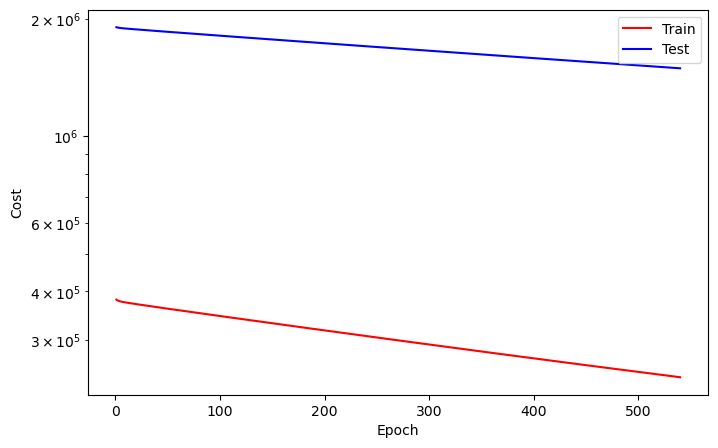

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   541
Train_cost  = 240788.0316 | Test_cost  = 1494582.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   542
Train_cost  = 240599.9475 | Test_cost  = 1493945.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   543
Train_cost  = 240412.0610 | Test_cost  = 1493308.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   544
Train_cost  = 240224.3850 | Test_cost  = 1492672.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   545
Train_cost  = 240036.8889 | Test_cost  = 1492035.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   546
Train_cost  = 239849.6196 | Test_cost  = 1491399.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   547
Train_cost  = 239662.5131 | Test_cost  = 1490764.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   548
Train_cost  = 239475.6227 | Test_cost  = 1490129.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   549
Train_cost  = 239288.9637 | Test_cost  = 1489494.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   550
Train_cost  = 239102.4637 | Test_cost  = 1488859.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   551
Train_cost  = 238916.1732 | Test_cost  = 1488225.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   552
Train_cost  = 238730.0891 | Test_cost  = 1487591.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   553
Train_cost  = 238544.2079 | Test_cost  = 1486958.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   554
Train_cost  = 238358.5231 | Test_cost  = 1486324.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   555
Train_cost  = 238173.0343 | Test_cost  = 1485691.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   556
Train_cost  = 237987.7488 | Test_cost  = 1485059.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   557
Train_cost  = 237802.6435 | Test_cost  = 1484427.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   558
Train_cost  = 237617.7724 | Test_cost  = 1483795.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   559
Train_cost  = 237433.0671 | Test_cost  = 1483164.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   560
Train_cost  = 237248.5540 | Test_cost  = 1482532.7500 | 


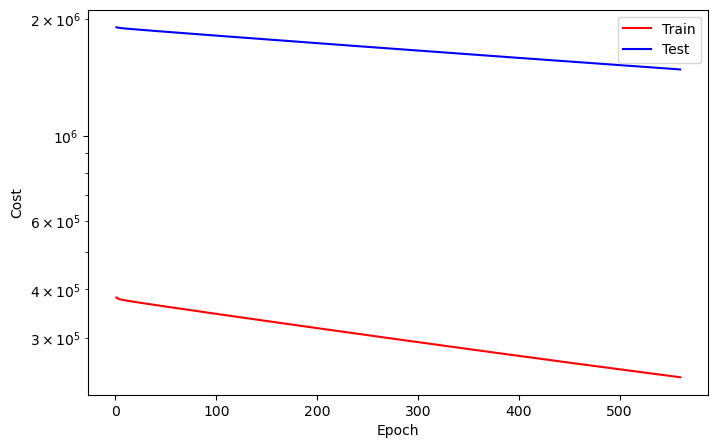

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   561
Train_cost  = 237064.2666 | Test_cost  = 1481902.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   562
Train_cost  = 236880.1609 | Test_cost  = 1481271.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   563
Train_cost  = 236696.2647 | Test_cost  = 1480641.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   564
Train_cost  = 236512.5733 | Test_cost  = 1480011.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   565
Train_cost  = 236329.0590 | Test_cost  = 1479382.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   566
Train_cost  = 236145.7373 | Test_cost  = 1478753.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   567
Train_cost  = 235962.6505 | Test_cost  = 1478124.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   568
Train_cost  = 235779.7068 | Test_cost  = 1477495.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   569
Train_cost  = 235596.9784 | Test_cost  = 1476868.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   570
Train_cost  = 235414.4715 | Test_cost  = 1476240.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   571
Train_cost  = 235232.1435 | Test_cost  = 1475612.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   572
Train_cost  = 235050.0127 | Test_cost  = 1474985.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   573
Train_cost  = 234868.1053 | Test_cost  = 1474358.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   574
Train_cost  = 234686.3252 | Test_cost  = 1473732.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   575
Train_cost  = 234504.8002 | Test_cost  = 1473106.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   576
Train_cost  = 234323.4479 | Test_cost  = 1472481.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   577
Train_cost  = 234142.3395 | Test_cost  = 1471855.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   578
Train_cost  = 233961.3650 | Test_cost  = 1471230.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   579
Train_cost  = 233780.6142 | Test_cost  = 1470605.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   580
Train_cost  = 233600.0185 | Test_cost  = 1469981.5000 | 


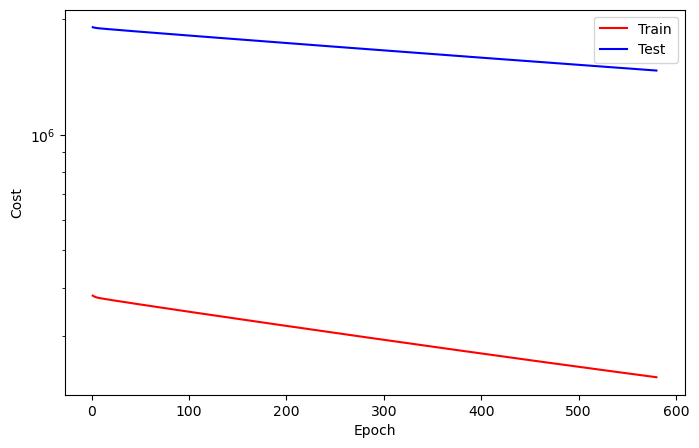

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   581
Train_cost  = 233419.6809 | Test_cost  = 1469357.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   582
Train_cost  = 233239.5174 | Test_cost  = 1468733.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   583
Train_cost  = 233059.5251 | Test_cost  = 1468110.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   584
Train_cost  = 232879.7562 | Test_cost  = 1467487.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   585
Train_cost  = 232700.1782 | Test_cost  = 1466865.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   586
Train_cost  = 232520.7724 | Test_cost  = 1466242.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   587
Train_cost  = 232341.5598 | Test_cost  = 1465620.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   588
Train_cost  = 232162.5509 | Test_cost  = 1464998.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   589
Train_cost  = 231983.7492 | Test_cost  = 1464377.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   590
Train_cost  = 231805.1408 | Test_cost  = 1463756.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   591
Train_cost  = 231626.7060 | Test_cost  = 1463136.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   592
Train_cost  = 231448.4834 | Test_cost  = 1462515.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   593
Train_cost  = 231270.4367 | Test_cost  = 1461895.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   594
Train_cost  = 231092.6123 | Test_cost  = 1461276.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   595
Train_cost  = 230914.9668 | Test_cost  = 1460656.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   596
Train_cost  = 230737.4988 | Test_cost  = 1460038.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   597
Train_cost  = 230560.2627 | Test_cost  = 1459419.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   598
Train_cost  = 230383.1763 | Test_cost  = 1458801.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   599
Train_cost  = 230206.2886 | Test_cost  = 1458183.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   600
Train_cost  = 230029.6115 | Test_cost  = 1457565.5500 | 


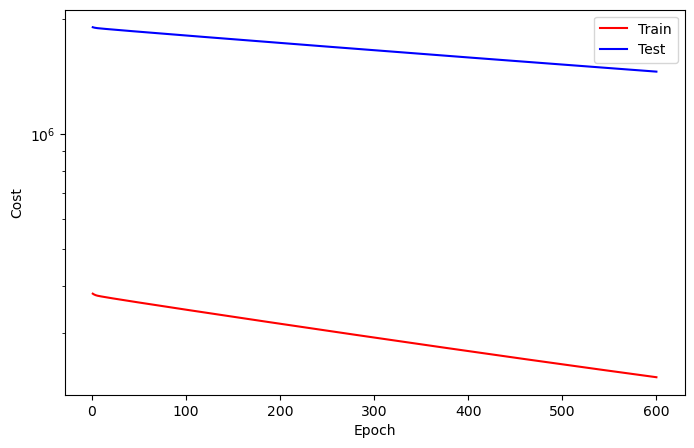

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   601
Train_cost  = 229853.1208 | Test_cost  = 1456948.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   602
Train_cost  = 229676.8071 | Test_cost  = 1456331.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   603
Train_cost  = 229500.7010 | Test_cost  = 1455714.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   604
Train_cost  = 229324.7755 | Test_cost  = 1455098.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   605
Train_cost  = 229149.0448 | Test_cost  = 1454482.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   606
Train_cost  = 228973.5143 | Test_cost  = 1453866.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   607
Train_cost  = 228798.1856 | Test_cost  = 1453251.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   608
Train_cost  = 228623.0598 | Test_cost  = 1452636.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   609
Train_cost  = 228448.0934 | Test_cost  = 1452022.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   610
Train_cost  = 228273.3229 | Test_cost  = 1451408.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   611
Train_cost  = 228098.7342 | Test_cost  = 1450794.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   612
Train_cost  = 227924.3546 | Test_cost  = 1450180.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   613
Train_cost  = 227750.1698 | Test_cost  = 1449567.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   614
Train_cost  = 227576.1674 | Test_cost  = 1448954.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   615
Train_cost  = 227402.3542 | Test_cost  = 1448341.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   616
Train_cost  = 227228.6998 | Test_cost  = 1447729.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   617
Train_cost  = 227055.3102 | Test_cost  = 1447117.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   618
Train_cost  = 226882.0440 | Test_cost  = 1446506.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   619
Train_cost  = 226709.0185 | Test_cost  = 1445894.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   620
Train_cost  = 226536.1505 | Test_cost  = 1445283.8000 | 


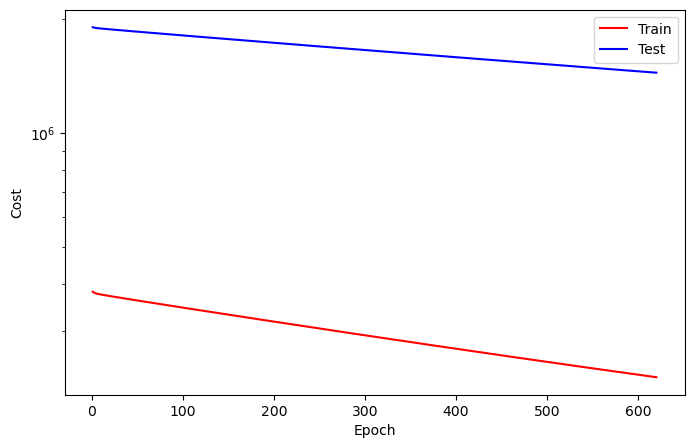

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   621
Train_cost  = 226363.4614 | Test_cost  = 1444673.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   622
Train_cost  = 226190.9842 | Test_cost  = 1444063.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   623
Train_cost  = 226018.7002 | Test_cost  = 1443453.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   624
Train_cost  = 225846.5718 | Test_cost  = 1442843.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   625
Train_cost  = 225674.6763 | Test_cost  = 1442234.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   626
Train_cost  = 225502.9483 | Test_cost  = 1441625.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   627
Train_cost  = 225331.4051 | Test_cost  = 1441016.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   628
Train_cost  = 225160.0486 | Test_cost  = 1440408.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   629
Train_cost  = 224988.9059 | Test_cost  = 1439800.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   630
Train_cost  = 224817.9468 | Test_cost  = 1439192.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   631
Train_cost  = 224647.1420 | Test_cost  = 1438585.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   632
Train_cost  = 224476.5563 | Test_cost  = 1437978.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   633
Train_cost  = 224306.1427 | Test_cost  = 1437371.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   634
Train_cost  = 224135.9279 | Test_cost  = 1436765.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   635
Train_cost  = 223965.9062 | Test_cost  = 1436159.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   636
Train_cost  = 223796.0602 | Test_cost  = 1435554.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   637
Train_cost  = 223626.3858 | Test_cost  = 1434948.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   638
Train_cost  = 223456.9252 | Test_cost  = 1434343.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   639
Train_cost  = 223287.6319 | Test_cost  = 1433738.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   640
Train_cost  = 223118.5405 | Test_cost  = 1433134.6000 | 


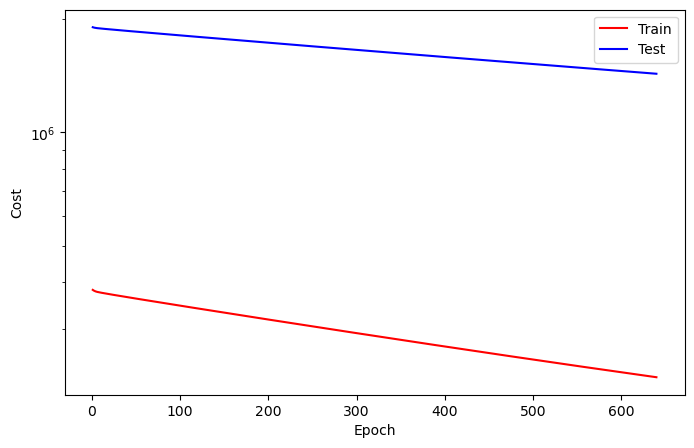

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   641
Train_cost  = 222949.6420 | Test_cost  = 1432530.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   642
Train_cost  = 222780.9194 | Test_cost  = 1431927.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   643
Train_cost  = 222612.3912 | Test_cost  = 1431323.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   644
Train_cost  = 222444.0459 | Test_cost  = 1430720.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   645
Train_cost  = 222275.8696 | Test_cost  = 1430118.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   646
Train_cost  = 222107.9062 | Test_cost  = 1429515.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   647
Train_cost  = 221940.1316 | Test_cost  = 1428913.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   648
Train_cost  = 221772.5185 | Test_cost  = 1428312.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   649
Train_cost  = 221605.1003 | Test_cost  = 1427710.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   650
Train_cost  = 221437.8665 | Test_cost  = 1427109.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   651
Train_cost  = 221270.8252 | Test_cost  = 1426508.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   652
Train_cost  = 221103.9668 | Test_cost  = 1425908.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   653
Train_cost  = 220937.2959 | Test_cost  = 1425308.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   654
Train_cost  = 220770.8067 | Test_cost  = 1424708.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   655
Train_cost  = 220604.5019 | Test_cost  = 1424109.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   656
Train_cost  = 220438.4043 | Test_cost  = 1423510.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   657
Train_cost  = 220272.4514 | Test_cost  = 1422911.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   658
Train_cost  = 220106.7118 | Test_cost  = 1422313.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   659
Train_cost  = 219941.1466 | Test_cost  = 1421715.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   660
Train_cost  = 219775.7650 | Test_cost  = 1421117.3000 | 


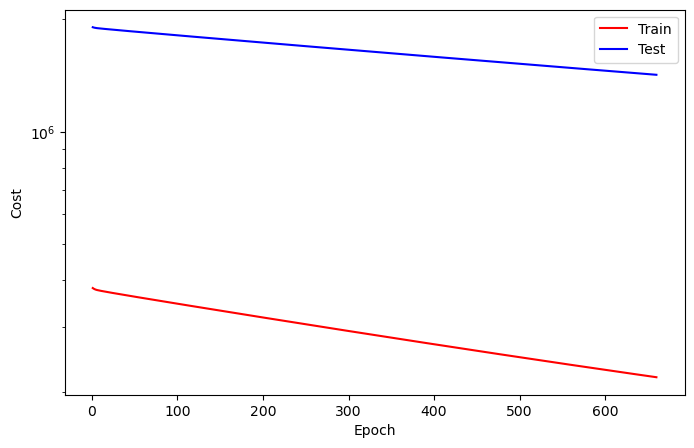

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   661
Train_cost  = 219610.5768 | Test_cost  = 1420519.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   662
Train_cost  = 219445.5802 | Test_cost  = 1419922.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   663
Train_cost  = 219280.7477 | Test_cost  = 1419325.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   664
Train_cost  = 219116.0965 | Test_cost  = 1418729.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   665
Train_cost  = 218951.6431 | Test_cost  = 1418133.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   666
Train_cost  = 218787.3546 | Test_cost  = 1417537.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   667
Train_cost  = 218623.2785 | Test_cost  = 1416942.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   668
Train_cost  = 218459.3553 | Test_cost  = 1416346.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   669
Train_cost  = 218295.6238 | Test_cost  = 1415752.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   670
Train_cost  = 218132.0999 | Test_cost  = 1415157.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   671
Train_cost  = 217968.7481 | Test_cost  = 1414563.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   672
Train_cost  = 217805.5656 | Test_cost  = 1413969.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   673
Train_cost  = 217642.5868 | Test_cost  = 1413376.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   674
Train_cost  = 217479.7755 | Test_cost  = 1412782.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   675
Train_cost  = 217317.1354 | Test_cost  = 1412189.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   676
Train_cost  = 217154.6817 | Test_cost  = 1411597.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   677
Train_cost  = 216992.4429 | Test_cost  = 1411005.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   678
Train_cost  = 216830.3588 | Test_cost  = 1410413.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   679
Train_cost  = 216668.4630 | Test_cost  = 1409821.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   680
Train_cost  = 216506.7404 | Test_cost  = 1409230.4000 | 


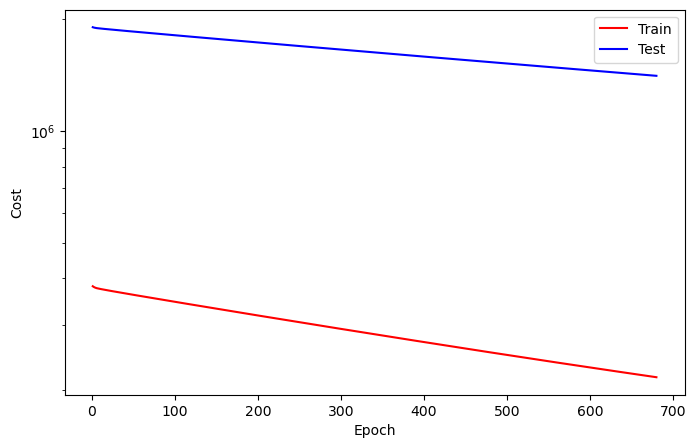

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   681
Train_cost  = 216345.2010 | Test_cost  = 1408639.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   682
Train_cost  = 216183.8492 | Test_cost  = 1408048.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   683
Train_cost  = 216022.6752 | Test_cost  = 1407458.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   684
Train_cost  = 215861.6763 | Test_cost  = 1406868.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   685
Train_cost  = 215700.8800 | Test_cost  = 1406278.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   686
Train_cost  = 215540.2585 | Test_cost  = 1405689.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   687
Train_cost  = 215379.8036 | Test_cost  = 1405100.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   688
Train_cost  = 215219.5413 | Test_cost  = 1404511.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   689
Train_cost  = 215059.4352 | Test_cost  = 1403923.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   690
Train_cost  = 214899.5559 | Test_cost  = 1403335.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   691
Train_cost  = 214739.8353 | Test_cost  = 1402747.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   692
Train_cost  = 214580.2874 | Test_cost  = 1402160.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   693
Train_cost  = 214420.9333 | Test_cost  = 1401573.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   694
Train_cost  = 214261.7373 | Test_cost  = 1400986.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   695
Train_cost  = 214102.7326 | Test_cost  = 1400400.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   696
Train_cost  = 213943.9267 | Test_cost  = 1399814.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   697
Train_cost  = 213785.2809 | Test_cost  = 1399228.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   698
Train_cost  = 213626.8052 | Test_cost  = 1398642.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   699
Train_cost  = 213468.5405 | Test_cost  = 1398057.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   700
Train_cost  = 213310.4383 | Test_cost  = 1397472.9500 | 


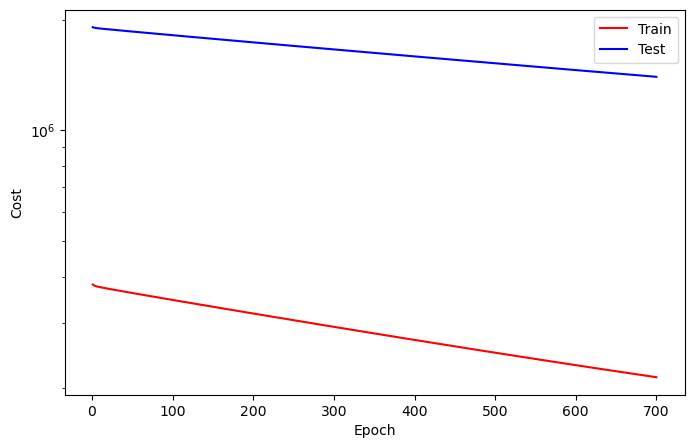

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   701
Train_cost  = 213152.4915 | Test_cost  = 1396888.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   702
Train_cost  = 212994.7535 | Test_cost  = 1396304.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   703
Train_cost  = 212837.1929 | Test_cost  = 1395720.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   704
Train_cost  = 212679.8029 | Test_cost  = 1395136.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   705
Train_cost  = 212522.5999 | Test_cost  = 1394553.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   706
Train_cost  = 212365.5440 | Test_cost  = 1393970.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   707
Train_cost  = 212208.7099 | Test_cost  = 1393388.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   708
Train_cost  = 212052.0328 | Test_cost  = 1392806.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   709
Train_cost  = 211895.5282 | Test_cost  = 1392223.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   710
Train_cost  = 211739.2141 | Test_cost  = 1391642.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   711
Train_cost  = 211583.0644 | Test_cost  = 1391061.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   712
Train_cost  = 211427.1096 | Test_cost  = 1390480.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   713
Train_cost  = 211271.3333 | Test_cost  = 1389899.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   714
Train_cost  = 211115.6960 | Test_cost  = 1389319.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   715
Train_cost  = 210960.2917 | Test_cost  = 1388739.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   716
Train_cost  = 210805.0355 | Test_cost  = 1388159.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   717
Train_cost  = 210649.9749 | Test_cost  = 1387580.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   718
Train_cost  = 210495.0721 | Test_cost  = 1387000.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   719
Train_cost  = 210340.3549 | Test_cost  = 1386422.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   720
Train_cost  = 210185.8083 | Test_cost  = 1385844.0000 | 


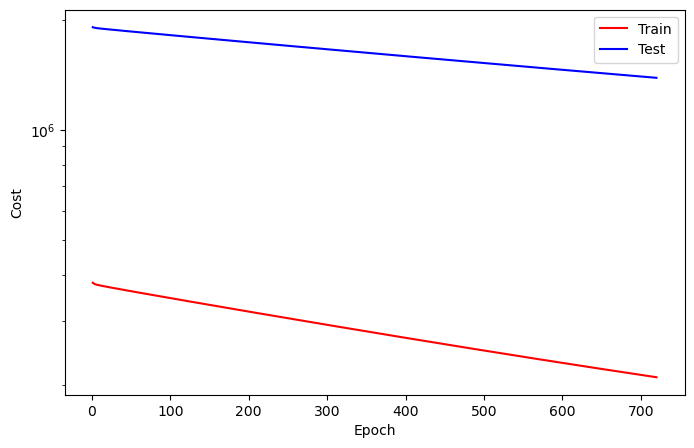

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   721
Train_cost  = 210031.4309 | Test_cost  = 1385266.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   722
Train_cost  = 209877.2419 | Test_cost  = 1384688.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   723
Train_cost  = 209723.2407 | Test_cost  = 1384110.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   724
Train_cost  = 209569.4097 | Test_cost  = 1383533.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   725
Train_cost  = 209415.7199 | Test_cost  = 1382956.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   726
Train_cost  = 209262.2496 | Test_cost  = 1382380.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   727
Train_cost  = 209108.9525 | Test_cost  = 1381804.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   728
Train_cost  = 208955.7994 | Test_cost  = 1381228.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   729
Train_cost  = 208802.8538 | Test_cost  = 1380652.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   730
Train_cost  = 208650.0660 | Test_cost  = 1380077.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   731
Train_cost  = 208497.4637 | Test_cost  = 1379502.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   732
Train_cost  = 208345.0421 | Test_cost  = 1378927.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   733
Train_cost  = 208192.7627 | Test_cost  = 1378353.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   734
Train_cost  = 208040.7091 | Test_cost  = 1377779.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   735
Train_cost  = 207888.8013 | Test_cost  = 1377206.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   736
Train_cost  = 207737.0656 | Test_cost  = 1376632.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   737
Train_cost  = 207585.5069 | Test_cost  = 1376059.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   738
Train_cost  = 207434.1181 | Test_cost  = 1375486.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   739
Train_cost  = 207282.9070 | Test_cost  = 1374914.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   740
Train_cost  = 207131.8735 | Test_cost  = 1374342.4500 | 


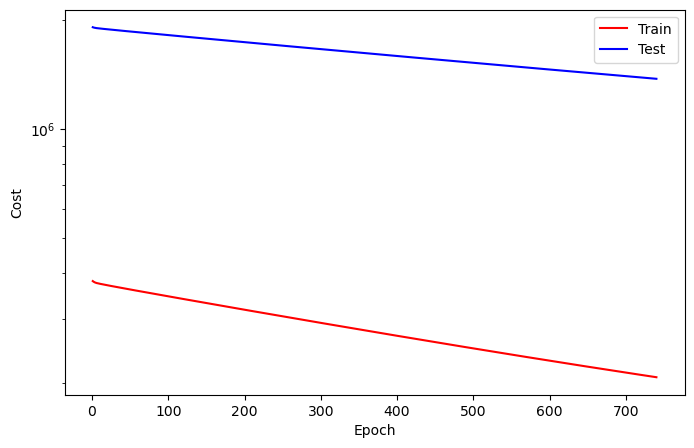

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   741
Train_cost  = 206981.0301 | Test_cost  = 1373770.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   742
Train_cost  = 206830.3457 | Test_cost  = 1373199.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   743
Train_cost  = 206679.8484 | Test_cost  = 1372628.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   744
Train_cost  = 206529.5062 | Test_cost  = 1372057.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   745
Train_cost  = 206379.3383 | Test_cost  = 1371486.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   746
Train_cost  = 206229.3445 | Test_cost  = 1370916.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   747
Train_cost  = 206079.5455 | Test_cost  = 1370346.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   748
Train_cost  = 205929.9066 | Test_cost  = 1369777.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   749
Train_cost  = 205780.4263 | Test_cost  = 1369208.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   750
Train_cost  = 205631.1400 | Test_cost  = 1368639.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   751
Train_cost  = 205482.0239 | Test_cost  = 1368070.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   752
Train_cost  = 205333.0606 | Test_cost  = 1367502.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   753
Train_cost  = 205184.2816 | Test_cost  = 1366934.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   754
Train_cost  = 205035.6952 | Test_cost  = 1366366.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   755
Train_cost  = 204887.2438 | Test_cost  = 1365799.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   756
Train_cost  = 204738.9915 | Test_cost  = 1365232.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   757
Train_cost  = 204590.9047 | Test_cost  = 1364665.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   758
Train_cost  = 204442.9730 | Test_cost  = 1364099.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   759
Train_cost  = 204295.2350 | Test_cost  = 1363533.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   760
Train_cost  = 204147.6767 | Test_cost  = 1362967.6000 | 


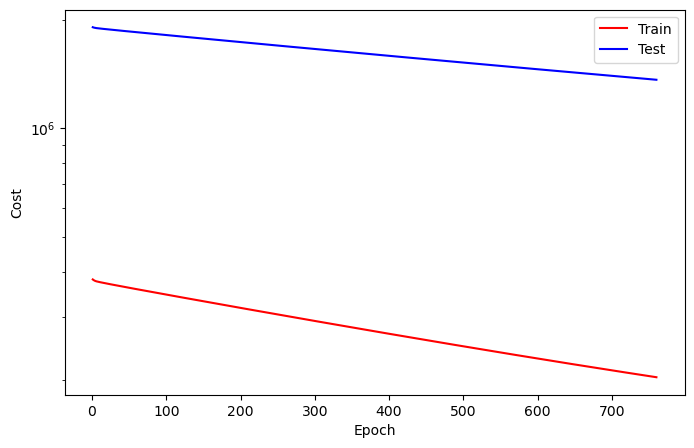

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   761
Train_cost  = 204000.2820 | Test_cost  = 1362402.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   762
Train_cost  = 203853.0409 | Test_cost  = 1361836.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   763
Train_cost  = 203705.9877 | Test_cost  = 1361272.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   764
Train_cost  = 203559.1254 | Test_cost  = 1360707.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   765
Train_cost  = 203412.4035 | Test_cost  = 1360143.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   766
Train_cost  = 203265.8638 | Test_cost  = 1359579.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   767
Train_cost  = 203119.4826 | Test_cost  = 1359015.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   768
Train_cost  = 202973.3125 | Test_cost  = 1358452.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   769
Train_cost  = 202827.2596 | Test_cost  = 1357889.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   770
Train_cost  = 202681.4398 | Test_cost  = 1357327.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   771
Train_cost  = 202535.7110 | Test_cost  = 1356764.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   772
Train_cost  = 202390.2172 | Test_cost  = 1356202.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   773
Train_cost  = 202244.8538 | Test_cost  = 1355641.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   774
Train_cost  = 202099.6848 | Test_cost  = 1355079.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   775
Train_cost  = 201954.6759 | Test_cost  = 1354518.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   776
Train_cost  = 201809.8468 | Test_cost  = 1353958.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   777
Train_cost  = 201665.1944 | Test_cost  = 1353397.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   778
Train_cost  = 201520.6796 | Test_cost  = 1352837.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   779
Train_cost  = 201376.3470 | Test_cost  = 1352277.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   780
Train_cost  = 201232.1863 | Test_cost  = 1351718.1500 | 


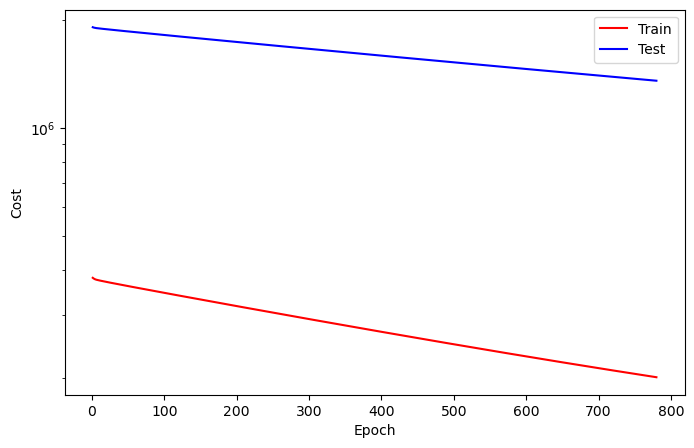

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   781
Train_cost  = 201088.2020 | Test_cost  = 1351158.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   782
Train_cost  = 200944.3978 | Test_cost  = 1350600.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   783
Train_cost  = 200800.7321 | Test_cost  = 1350041.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   784
Train_cost  = 200657.2670 | Test_cost  = 1349483.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   785
Train_cost  = 200513.9581 | Test_cost  = 1348925.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   786
Train_cost  = 200370.8129 | Test_cost  = 1348367.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   787
Train_cost  = 200227.8385 | Test_cost  = 1347810.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   788
Train_cost  = 200085.0345 | Test_cost  = 1347253.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   789
Train_cost  = 199942.3839 | Test_cost  = 1346696.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   790
Train_cost  = 199799.9491 | Test_cost  = 1346140.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   791
Train_cost  = 199657.6298 | Test_cost  = 1345584.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   792
Train_cost  = 199515.5081 | Test_cost  = 1345028.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   793
Train_cost  = 199373.5500 | Test_cost  = 1344473.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   794
Train_cost  = 199231.7315 | Test_cost  = 1343917.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   795
Train_cost  = 199090.1223 | Test_cost  = 1343363.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   796
Train_cost  = 198948.6514 | Test_cost  = 1342808.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   797
Train_cost  = 198807.3493 | Test_cost  = 1342254.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   798
Train_cost  = 198666.2438 | Test_cost  = 1341700.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   799
Train_cost  = 198525.2757 | Test_cost  = 1341146.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   800
Train_cost  = 198384.4994 | Test_cost  = 1340593.4000 | 


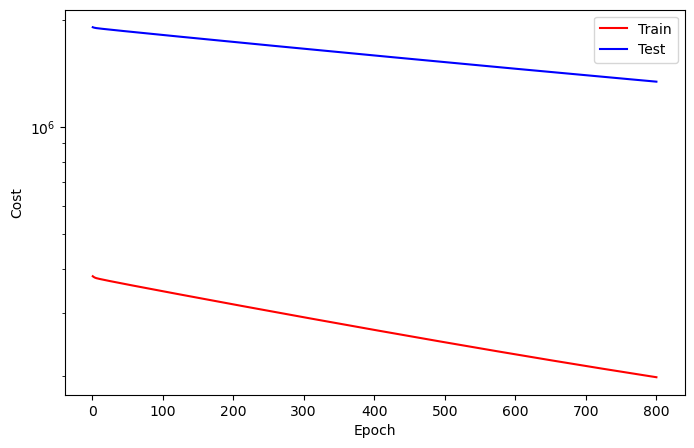

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   801
Train_cost  = 198243.8654 | Test_cost  = 1340040.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   802
Train_cost  = 198103.4084 | Test_cost  = 1339487.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   803
Train_cost  = 197963.1069 | Test_cost  = 1338935.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   804
Train_cost  = 197822.9983 | Test_cost  = 1338383.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   805
Train_cost  = 197683.0307 | Test_cost  = 1337831.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   806
Train_cost  = 197543.2432 | Test_cost  = 1337280.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   807
Train_cost  = 197403.6188 | Test_cost  = 1336729.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   808
Train_cost  = 197264.1707 | Test_cost  = 1336178.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   809
Train_cost  = 197124.8661 | Test_cost  = 1335627.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   810
Train_cost  = 196985.7481 | Test_cost  = 1335077.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   811
Train_cost  = 196846.8088 | Test_cost  = 1334527.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   812
Train_cost  = 196708.0041 | Test_cost  = 1333978.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   813
Train_cost  = 196569.3729 | Test_cost  = 1333428.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   814
Train_cost  = 196430.8846 | Test_cost  = 1332879.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   815
Train_cost  = 196292.6121 | Test_cost  = 1332331.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   816
Train_cost  = 196154.4510 | Test_cost  = 1331782.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   817
Train_cost  = 196016.4973 | Test_cost  = 1331234.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   818
Train_cost  = 195878.7105 | Test_cost  = 1330687.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   819
Train_cost  = 195741.0571 | Test_cost  = 1330139.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   820
Train_cost  = 195603.5731 | Test_cost  = 1329592.5000 | 


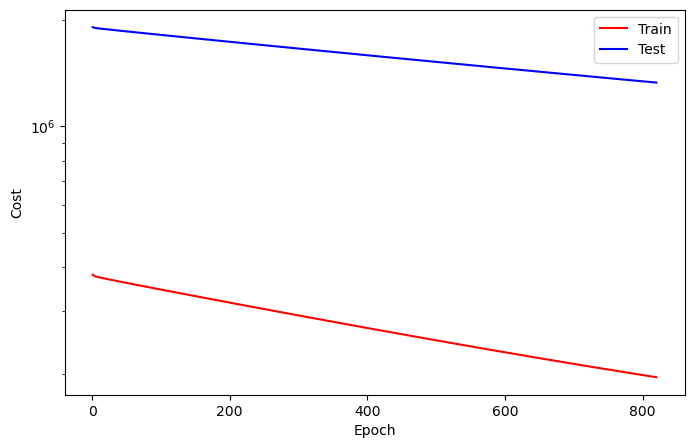

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   821
Train_cost  = 195466.2776 | Test_cost  = 1329045.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   822
Train_cost  = 195329.1184 | Test_cost  = 1328499.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   823
Train_cost  = 195192.1528 | Test_cost  = 1327953.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   824
Train_cost  = 195055.3627 | Test_cost  = 1327407.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   825
Train_cost  = 194918.7020 | Test_cost  = 1326861.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   826
Train_cost  = 194782.1879 | Test_cost  = 1326316.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   827
Train_cost  = 194645.8773 | Test_cost  = 1325771.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   828
Train_cost  = 194509.7249 | Test_cost  = 1325226.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   829
Train_cost  = 194373.7292 | Test_cost  = 1324682.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   830
Train_cost  = 194237.8897 | Test_cost  = 1324138.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   831
Train_cost  = 194102.2106 | Test_cost  = 1323594.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   832
Train_cost  = 193966.7018 | Test_cost  = 1323051.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   833
Train_cost  = 193831.3987 | Test_cost  = 1322508.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   834
Train_cost  = 193696.1919 | Test_cost  = 1321965.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   835
Train_cost  = 193561.1644 | Test_cost  = 1321422.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   836
Train_cost  = 193426.3056 | Test_cost  = 1320880.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   837
Train_cost  = 193291.6501 | Test_cost  = 1320338.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   838
Train_cost  = 193157.1260 | Test_cost  = 1319797.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   839
Train_cost  = 193022.7373 | Test_cost  = 1319255.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   840
Train_cost  = 192888.5409 | Test_cost  = 1318714.6500 | 


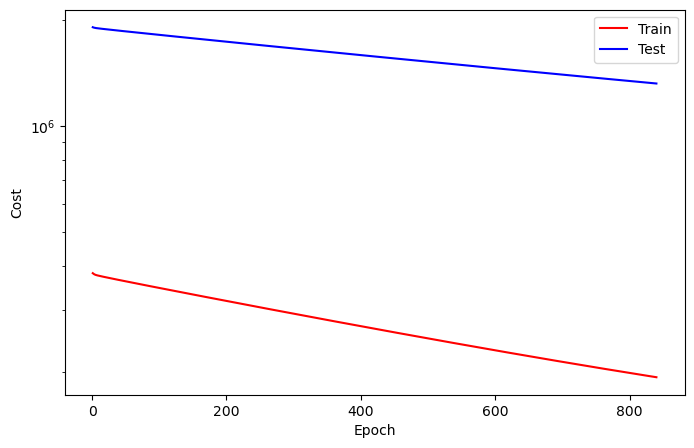

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   841
Train_cost  = 192754.4969 | Test_cost  = 1318174.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   842
Train_cost  = 192620.6260 | Test_cost  = 1317633.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   843
Train_cost  = 192486.9205 | Test_cost  = 1317093.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   844
Train_cost  = 192353.3628 | Test_cost  = 1316553.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   845
Train_cost  = 192219.9431 | Test_cost  = 1316014.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   846
Train_cost  = 192086.7560 | Test_cost  = 1315475.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   847
Train_cost  = 191953.6651 | Test_cost  = 1314936.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   848
Train_cost  = 191820.7544 | Test_cost  = 1314397.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   849
Train_cost  = 191688.0204 | Test_cost  = 1313859.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   850
Train_cost  = 191555.4352 | Test_cost  = 1313321.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   851
Train_cost  = 191423.0000 | Test_cost  = 1312784.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   852
Train_cost  = 191290.7168 | Test_cost  = 1312246.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   853
Train_cost  = 191158.6302 | Test_cost  = 1311709.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   854
Train_cost  = 191026.7029 | Test_cost  = 1311172.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   855
Train_cost  = 190894.9057 | Test_cost  = 1310636.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   856
Train_cost  = 190763.2882 | Test_cost  = 1310100.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   857
Train_cost  = 190631.8256 | Test_cost  = 1309564.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   858
Train_cost  = 190500.5316 | Test_cost  = 1309029.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   859
Train_cost  = 190369.3897 | Test_cost  = 1308493.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   860
Train_cost  = 190238.4147 | Test_cost  = 1307958.9000 | 


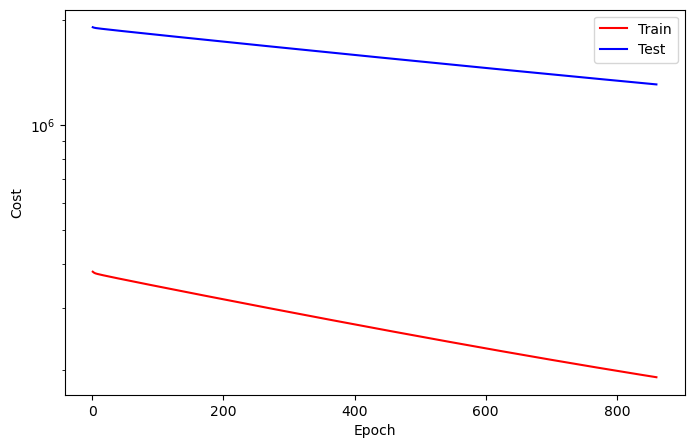

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   861
Train_cost  = 190107.5995 | Test_cost  = 1307424.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   862
Train_cost  = 189976.9568 | Test_cost  = 1306889.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   863
Train_cost  = 189846.4674 | Test_cost  = 1306356.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   864
Train_cost  = 189716.0999 | Test_cost  = 1305822.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   865
Train_cost  = 189585.9194 | Test_cost  = 1305288.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   866
Train_cost  = 189455.9007 | Test_cost  = 1304755.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   867
Train_cost  = 189326.0492 | Test_cost  = 1304223.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   868
Train_cost  = 189196.3474 | Test_cost  = 1303690.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   869
Train_cost  = 189066.7976 | Test_cost  = 1303158.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   870
Train_cost  = 188937.4236 | Test_cost  = 1302626.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   871
Train_cost  = 188808.1659 | Test_cost  = 1302094.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   872
Train_cost  = 188679.1096 | Test_cost  = 1301563.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   873
Train_cost  = 188550.2168 | Test_cost  = 1301032.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   874
Train_cost  = 188421.4645 | Test_cost  = 1300502.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   875
Train_cost  = 188292.8715 | Test_cost  = 1299971.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   876
Train_cost  = 188164.4387 | Test_cost  = 1299441.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   877
Train_cost  = 188036.1717 | Test_cost  = 1298911.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   878
Train_cost  = 187908.0434 | Test_cost  = 1298382.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   879
Train_cost  = 187780.0775 | Test_cost  = 1297853.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   880
Train_cost  = 187652.2876 | Test_cost  = 1297324.3000 | 


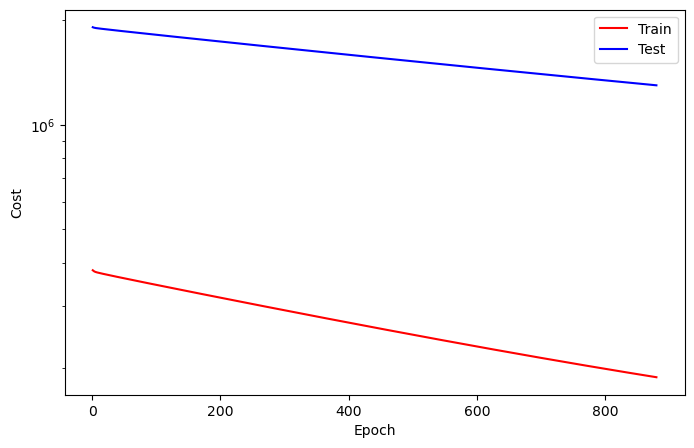

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   881
Train_cost  = 187524.6408 | Test_cost  = 1296795.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   882
Train_cost  = 187397.1570 | Test_cost  = 1296267.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   883
Train_cost  = 187269.8241 | Test_cost  = 1295739.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   884
Train_cost  = 187142.6657 | Test_cost  = 1295211.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   885
Train_cost  = 187015.6250 | Test_cost  = 1294684.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   886
Train_cost  = 186888.7650 | Test_cost  = 1294157.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   887
Train_cost  = 186762.0812 | Test_cost  = 1293631.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   888
Train_cost  = 186635.5500 | Test_cost  = 1293104.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   889
Train_cost  = 186509.1512 | Test_cost  = 1292578.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   890
Train_cost  = 186382.9205 | Test_cost  = 1292052.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   891
Train_cost  = 186256.8457 | Test_cost  = 1291527.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   892
Train_cost  = 186130.9190 | Test_cost  = 1291001.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   893
Train_cost  = 186005.1842 | Test_cost  = 1290476.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   894
Train_cost  = 185879.5469 | Test_cost  = 1289952.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   895
Train_cost  = 185754.1318 | Test_cost  = 1289427.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   896
Train_cost  = 185628.8206 | Test_cost  = 1288903.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   897
Train_cost  = 185503.6921 | Test_cost  = 1288380.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   898
Train_cost  = 185378.7120 | Test_cost  = 1287856.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   899
Train_cost  = 185253.8866 | Test_cost  = 1287333.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   900
Train_cost  = 185129.2133 | Test_cost  = 1286810.5500 | 


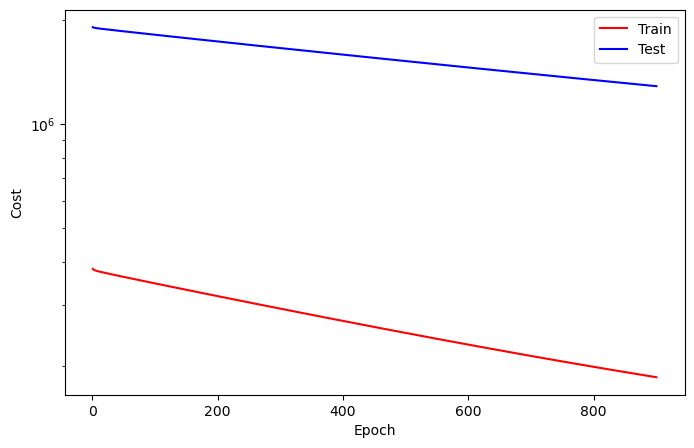

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   901
Train_cost  = 185004.6962 | Test_cost  = 1286287.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   902
Train_cost  = 184880.3380 | Test_cost  = 1285765.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   903
Train_cost  = 184756.1464 | Test_cost  = 1285243.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   904
Train_cost  = 184632.0822 | Test_cost  = 1284721.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   905
Train_cost  = 184508.1721 | Test_cost  = 1284200.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   906
Train_cost  = 184384.4695 | Test_cost  = 1283679.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   907
Train_cost  = 184260.8819 | Test_cost  = 1283158.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   908
Train_cost  = 184137.4514 | Test_cost  = 1282638.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   909
Train_cost  = 184014.1545 | Test_cost  = 1282118.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   910
Train_cost  = 183891.0299 | Test_cost  = 1281598.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   911
Train_cost  = 183768.0762 | Test_cost  = 1281079.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   912
Train_cost  = 183645.2664 | Test_cost  = 1280559.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   913
Train_cost  = 183522.6086 | Test_cost  = 1280040.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   914
Train_cost  = 183400.0953 | Test_cost  = 1279522.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   915
Train_cost  = 183277.7367 | Test_cost  = 1279003.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   916
Train_cost  = 183155.5407 | Test_cost  = 1278485.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   917
Train_cost  = 183033.5046 | Test_cost  = 1277967.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   918
Train_cost  = 182911.6221 | Test_cost  = 1277450.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   919
Train_cost  = 182789.8791 | Test_cost  = 1276933.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   920
Train_cost  = 182668.3125 | Test_cost  = 1276416.3000 | 


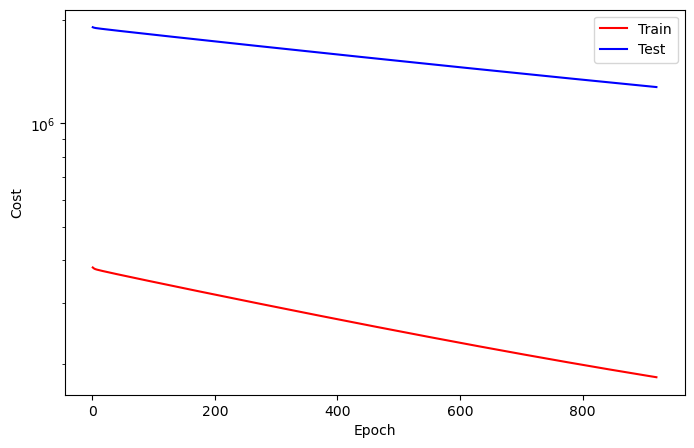

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   921
Train_cost  = 182546.8605 | Test_cost  = 1275899.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   922
Train_cost  = 182425.5916 | Test_cost  = 1275383.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   923
Train_cost  = 182304.4664 | Test_cost  = 1274867.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   924
Train_cost  = 182183.4927 | Test_cost  = 1274351.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   925
Train_cost  = 182062.6659 | Test_cost  = 1273836.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   926
Train_cost  = 181941.9915 | Test_cost  = 1273321.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   927
Train_cost  = 181821.4861 | Test_cost  = 1272806.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   928
Train_cost  = 181701.1190 | Test_cost  = 1272291.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   929
Train_cost  = 181580.8846 | Test_cost  = 1271777.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   930
Train_cost  = 181460.8262 | Test_cost  = 1271263.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   931
Train_cost  = 181340.9263 | Test_cost  = 1270750.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   932
Train_cost  = 181221.1705 | Test_cost  = 1270236.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   933
Train_cost  = 181101.5779 | Test_cost  = 1269723.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   934
Train_cost  = 180982.1238 | Test_cost  = 1269211.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   935
Train_cost  = 180862.8094 | Test_cost  = 1268698.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   936
Train_cost  = 180743.6628 | Test_cost  = 1268186.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   937
Train_cost  = 180624.6667 | Test_cost  = 1267674.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   938
Train_cost  = 180505.8084 | Test_cost  = 1267163.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   939
Train_cost  = 180387.1383 | Test_cost  = 1266651.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   940
Train_cost  = 180268.5721 | Test_cost  = 1266141.0000 | 


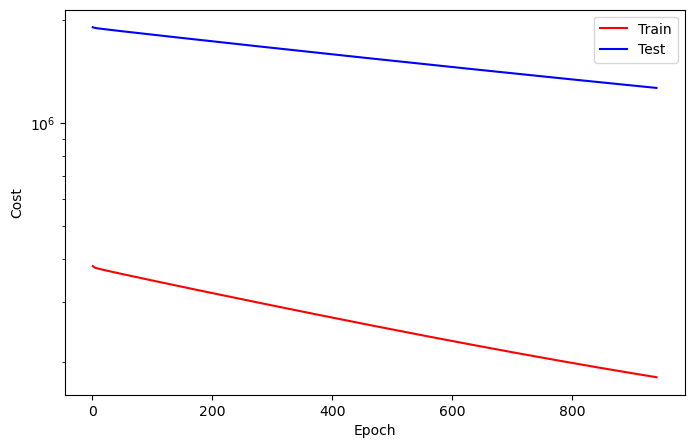

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   941
Train_cost  = 180150.1867 | Test_cost  = 1265630.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   942
Train_cost  = 180031.9398 | Test_cost  = 1265119.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   943
Train_cost  = 179913.8490 | Test_cost  = 1264609.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   944
Train_cost  = 179795.9061 | Test_cost  = 1264100.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   945
Train_cost  = 179678.1163 | Test_cost  = 1263590.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   946
Train_cost  = 179560.4601 | Test_cost  = 1263081.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   947
Train_cost  = 179442.9583 | Test_cost  = 1262572.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   948
Train_cost  = 179325.6356 | Test_cost  = 1262063.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   949
Train_cost  = 179208.4334 | Test_cost  = 1261555.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   950
Train_cost  = 179091.3746 | Test_cost  = 1261047.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   951
Train_cost  = 178974.5041 | Test_cost  = 1260539.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   952
Train_cost  = 178857.7490 | Test_cost  = 1260032.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   953
Train_cost  = 178741.1711 | Test_cost  = 1259525.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   954
Train_cost  = 178624.7132 | Test_cost  = 1259018.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   955
Train_cost  = 178508.4493 | Test_cost  = 1258512.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   956
Train_cost  = 178392.2876 | Test_cost  = 1258005.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   957
Train_cost  = 178276.2880 | Test_cost  = 1257500.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   958
Train_cost  = 178160.4821 | Test_cost  = 1256994.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   959
Train_cost  = 178044.7454 | Test_cost  = 1256488.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   960
Train_cost  = 177929.1863 | Test_cost  = 1255983.6000 | 


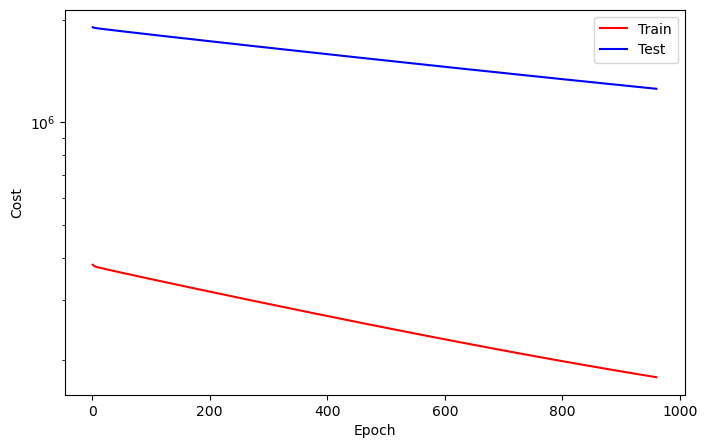

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   961
Train_cost  = 177813.7778 | Test_cost  = 1255478.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   962
Train_cost  = 177698.5120 | Test_cost  = 1254974.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   963
Train_cost  = 177583.4228 | Test_cost  = 1254470.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   964
Train_cost  = 177468.4674 | Test_cost  = 1253966.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   965
Train_cost  = 177353.6593 | Test_cost  = 1253462.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   966
Train_cost  = 177238.9938 | Test_cost  = 1252959.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   967
Train_cost  = 177124.4919 | Test_cost  = 1252456.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   968
Train_cost  = 177010.1352 | Test_cost  = 1251954.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   969
Train_cost  = 176895.9248 | Test_cost  = 1251451.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   970
Train_cost  = 176781.8636 | Test_cost  = 1250949.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   971
Train_cost  = 176667.9178 | Test_cost  = 1250447.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   972
Train_cost  = 176554.1427 | Test_cost  = 1249945.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   973
Train_cost  = 176440.5035 | Test_cost  = 1249444.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   974
Train_cost  = 176327.0278 | Test_cost  = 1248943.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   975
Train_cost  = 176213.7029 | Test_cost  = 1248442.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   976
Train_cost  = 176100.4898 | Test_cost  = 1247942.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   977
Train_cost  = 175987.4473 | Test_cost  = 1247442.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   978
Train_cost  = 175874.5778 | Test_cost  = 1246942.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   979
Train_cost  = 175761.8282 | Test_cost  = 1246443.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   980
Train_cost  = 175649.2355 | Test_cost  = 1245944.0000 | 


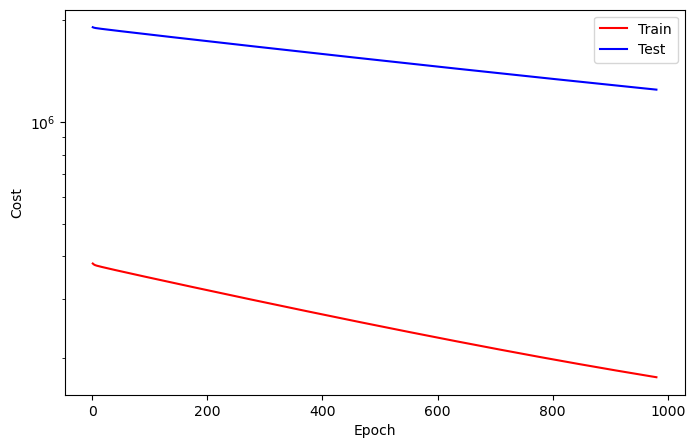

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   981
Train_cost  = 175536.7758 | Test_cost  = 1245445.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   982
Train_cost  = 175424.4723 | Test_cost  = 1244946.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   983
Train_cost  = 175312.2955 | Test_cost  = 1244448.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   984
Train_cost  = 175200.3119 | Test_cost  = 1243950.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   985
Train_cost  = 175088.4237 | Test_cost  = 1243452.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   986
Train_cost  = 174976.6973 | Test_cost  = 1242954.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   987
Train_cost  = 174865.1173 | Test_cost  = 1242457.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   988
Train_cost  = 174753.6678 | Test_cost  = 1241960.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   989
Train_cost  = 174642.4078 | Test_cost  = 1241464.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   990
Train_cost  = 174531.2668 | Test_cost  = 1240967.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   991
Train_cost  = 174420.2667 | Test_cost  = 1240471.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   992
Train_cost  = 174309.4150 | Test_cost  = 1239976.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   993
Train_cost  = 174198.7032 | Test_cost  = 1239480.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   994
Train_cost  = 174088.1600 | Test_cost  = 1238985.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   995
Train_cost  = 173977.7338 | Test_cost  = 1238490.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   996
Train_cost  = 173867.4786 | Test_cost  = 1237996.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   997
Train_cost  = 173757.3402 | Test_cost  = 1237502.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   998
Train_cost  = 173647.3558 | Test_cost  = 1237008.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch   999
Train_cost  = 173537.5252 | Test_cost  = 1236514.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1000
Train_cost  = 173427.8106 | Test_cost  = 1236021.0500 | 


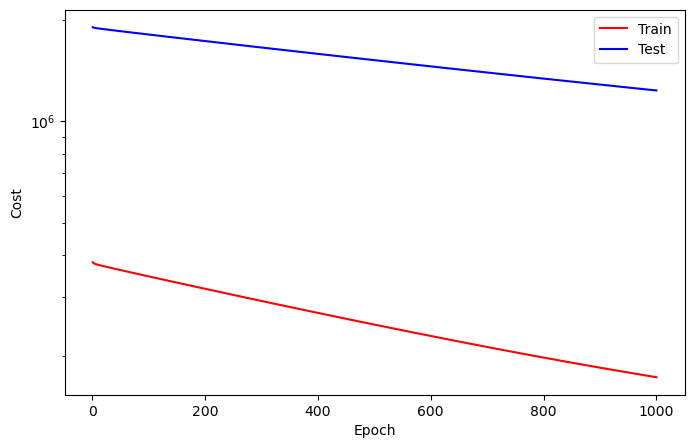

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1001
Train_cost  = 173318.2473 | Test_cost  = 1235527.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1002
Train_cost  = 173208.8500 | Test_cost  = 1235035.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1003
Train_cost  = 173099.5824 | Test_cost  = 1234542.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1004
Train_cost  = 172990.4498 | Test_cost  = 1234050.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1005
Train_cost  = 172881.4823 | Test_cost  = 1233558.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1006
Train_cost  = 172772.6664 | Test_cost  = 1233066.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1007
Train_cost  = 172663.9758 | Test_cost  = 1232575.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1008
Train_cost  = 172555.4248 | Test_cost  = 1232084.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1009
Train_cost  = 172447.0204 | Test_cost  = 1231593.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1010
Train_cost  = 172338.7749 | Test_cost  = 1231103.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1011
Train_cost  = 172230.6640 | Test_cost  = 1230612.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1012
Train_cost  = 172122.6759 | Test_cost  = 1230122.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1013
Train_cost  = 172014.8569 | Test_cost  = 1229633.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1014
Train_cost  = 171907.1533 | Test_cost  = 1229143.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1015
Train_cost  = 171799.6123 | Test_cost  = 1228654.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1016
Train_cost  = 171692.1921 | Test_cost  = 1228166.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1017
Train_cost  = 171584.9258 | Test_cost  = 1227677.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1018
Train_cost  = 171477.8298 | Test_cost  = 1227189.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1019
Train_cost  = 171370.8570 | Test_cost  = 1226701.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1020
Train_cost  = 171264.0154 | Test_cost  = 1226213.9500 | 


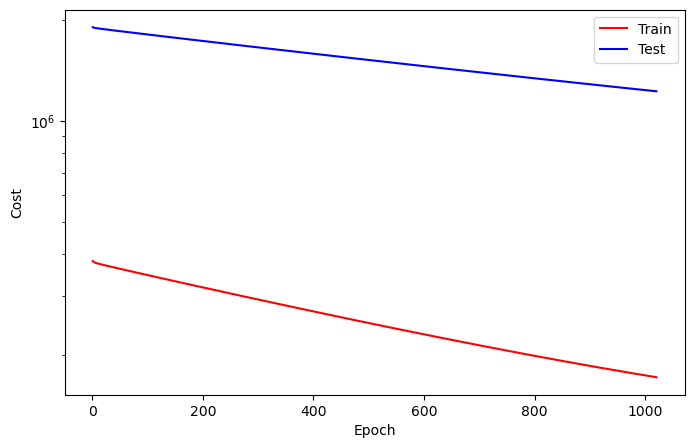

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1021
Train_cost  = 171157.3346 | Test_cost  = 1225726.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1022
Train_cost  = 171050.7544 | Test_cost  = 1225239.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1023
Train_cost  = 170944.3634 | Test_cost  = 1224752.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1024
Train_cost  = 170838.0867 | Test_cost  = 1224266.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1025
Train_cost  = 170731.9659 | Test_cost  = 1223780.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1026
Train_cost  = 170625.9949 | Test_cost  = 1223294.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1027
Train_cost  = 170520.1291 | Test_cost  = 1222808.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1028
Train_cost  = 170414.4435 | Test_cost  = 1222323.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1029
Train_cost  = 170308.8674 | Test_cost  = 1221838.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1030
Train_cost  = 170203.4334 | Test_cost  = 1221353.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1031
Train_cost  = 170098.1564 | Test_cost  = 1220868.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1032
Train_cost  = 169993.0031 | Test_cost  = 1220384.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1033
Train_cost  = 169888.0008 | Test_cost  = 1219900.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1034
Train_cost  = 169783.1481 | Test_cost  = 1219417.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1035
Train_cost  = 169678.4318 | Test_cost  = 1218934.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1036
Train_cost  = 169573.8660 | Test_cost  = 1218451.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1037
Train_cost  = 169469.4298 | Test_cost  = 1217968.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1038
Train_cost  = 169365.1290 | Test_cost  = 1217486.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1039
Train_cost  = 169260.9783 | Test_cost  = 1217003.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1040
Train_cost  = 169156.9414 | Test_cost  = 1216521.8500 | 


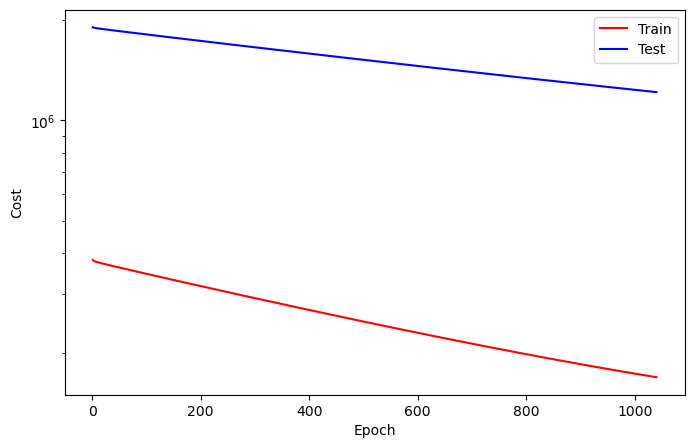

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1041
Train_cost  = 169053.0693 | Test_cost  = 1216040.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1042
Train_cost  = 168949.3236 | Test_cost  = 1215558.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1043
Train_cost  = 168845.7143 | Test_cost  = 1215077.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1044
Train_cost  = 168742.2554 | Test_cost  = 1214597.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1045
Train_cost  = 168638.9170 | Test_cost  = 1214116.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1046
Train_cost  = 168535.7498 | Test_cost  = 1213636.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1047
Train_cost  = 168432.7100 | Test_cost  = 1213156.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1048
Train_cost  = 168329.7976 | Test_cost  = 1212677.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1049
Train_cost  = 168227.0313 | Test_cost  = 1212197.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1050
Train_cost  = 168124.3986 | Test_cost  = 1211718.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1051
Train_cost  = 168021.9205 | Test_cost  = 1211240.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1052
Train_cost  = 167919.5473 | Test_cost  = 1210761.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1053
Train_cost  = 167817.3594 | Test_cost  = 1210283.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1054
Train_cost  = 167715.3032 | Test_cost  = 1209805.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1055
Train_cost  = 167613.3557 | Test_cost  = 1209328.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1056
Train_cost  = 167511.5487 | Test_cost  = 1208850.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1057
Train_cost  = 167409.8946 | Test_cost  = 1208373.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1058
Train_cost  = 167308.3670 | Test_cost  = 1207896.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1059
Train_cost  = 167206.9734 | Test_cost  = 1207420.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1060
Train_cost  = 167105.7495 | Test_cost  = 1206944.4000 | 


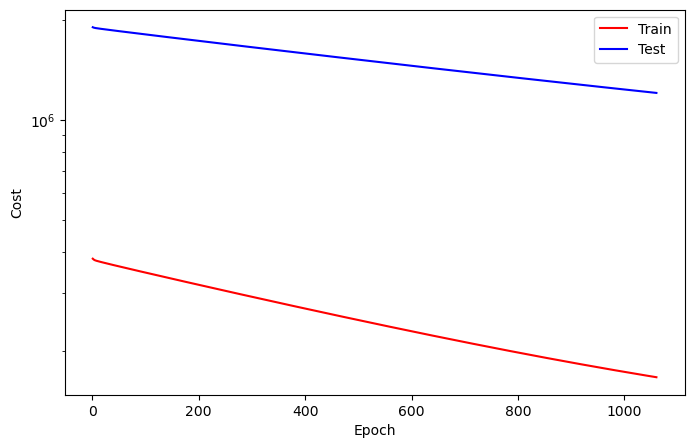

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1061
Train_cost  = 167004.6548 | Test_cost  = 1206468.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1062
Train_cost  = 166903.6740 | Test_cost  = 1205993.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1063
Train_cost  = 166802.8382 | Test_cost  = 1205517.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1064
Train_cost  = 166702.1302 | Test_cost  = 1205042.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1065
Train_cost  = 166601.5908 | Test_cost  = 1204567.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1066
Train_cost  = 166501.1594 | Test_cost  = 1204093.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1067
Train_cost  = 166400.8722 | Test_cost  = 1203619.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1068
Train_cost  = 166300.7259 | Test_cost  = 1203145.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1069
Train_cost  = 166200.7251 | Test_cost  = 1202671.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1070
Train_cost  = 166100.8416 | Test_cost  = 1202198.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1071
Train_cost  = 166001.0840 | Test_cost  = 1201725.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1072
Train_cost  = 165901.4850 | Test_cost  = 1201252.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1073
Train_cost  = 165802.0081 | Test_cost  = 1200780.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1074
Train_cost  = 165702.6800 | Test_cost  = 1200307.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1075
Train_cost  = 165603.4768 | Test_cost  = 1199835.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1076
Train_cost  = 165504.4174 | Test_cost  = 1199364.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1077
Train_cost  = 165405.5072 | Test_cost  = 1198893.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1078
Train_cost  = 165306.7043 | Test_cost  = 1198422.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1079
Train_cost  = 165208.0868 | Test_cost  = 1197951.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1080
Train_cost  = 165109.5471 | Test_cost  = 1197480.7500 | 


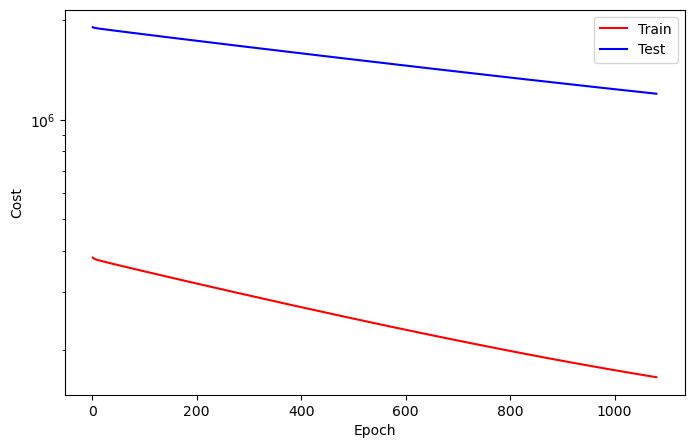

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1081
Train_cost  = 165011.1267 | Test_cost  = 1197010.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1082
Train_cost  = 164912.9102 | Test_cost  = 1196540.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1083
Train_cost  = 164814.7857 | Test_cost  = 1196070.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1084
Train_cost  = 164716.8230 | Test_cost  = 1195601.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1085
Train_cost  = 164618.9416 | Test_cost  = 1195132.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1086
Train_cost  = 164521.2585 | Test_cost  = 1194663.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1087
Train_cost  = 164423.6847 | Test_cost  = 1194195.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1088
Train_cost  = 164326.2229 | Test_cost  = 1193726.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1089
Train_cost  = 164228.9117 | Test_cost  = 1193258.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1090
Train_cost  = 164131.7438 | Test_cost  = 1192791.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1091
Train_cost  = 164034.7298 | Test_cost  = 1192323.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1092
Train_cost  = 163937.8017 | Test_cost  = 1191856.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1093
Train_cost  = 163841.0308 | Test_cost  = 1191389.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1094
Train_cost  = 163744.4142 | Test_cost  = 1190923.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1095
Train_cost  = 163647.9006 | Test_cost  = 1190456.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1096
Train_cost  = 163551.5227 | Test_cost  = 1189991.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1097
Train_cost  = 163455.3026 | Test_cost  = 1189525.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1098
Train_cost  = 163359.1725 | Test_cost  = 1189059.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1099
Train_cost  = 163263.2056 | Test_cost  = 1188594.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1100
Train_cost  = 163167.4061 | Test_cost  = 1188129.8500 | 


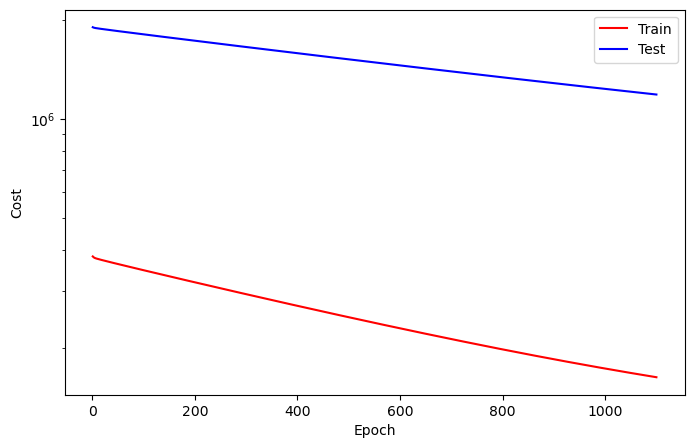

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1101
Train_cost  = 163071.6744 | Test_cost  = 1187665.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1102
Train_cost  = 162976.1250 | Test_cost  = 1187200.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1103
Train_cost  = 162880.6843 | Test_cost  = 1186736.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1104
Train_cost  = 162785.3890 | Test_cost  = 1186273.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1105
Train_cost  = 162690.2175 | Test_cost  = 1185809.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1106
Train_cost  = 162595.1744 | Test_cost  = 1185346.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1107
Train_cost  = 162500.2942 | Test_cost  = 1184883.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1108
Train_cost  = 162405.5122 | Test_cost  = 1184421.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1109
Train_cost  = 162310.8680 | Test_cost  = 1183958.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1110
Train_cost  = 162216.3522 | Test_cost  = 1183496.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1111
Train_cost  = 162121.9788 | Test_cost  = 1183034.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1112
Train_cost  = 162027.7481 | Test_cost  = 1182573.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1113
Train_cost  = 161933.6109 | Test_cost  = 1182112.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1114
Train_cost  = 161839.6487 | Test_cost  = 1181651.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1115
Train_cost  = 161745.7809 | Test_cost  = 1181190.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1116
Train_cost  = 161652.0784 | Test_cost  = 1180730.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1117
Train_cost  = 161558.4650 | Test_cost  = 1180269.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1118
Train_cost  = 161465.0133 | Test_cost  = 1179810.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1119
Train_cost  = 161371.6747 | Test_cost  = 1179350.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1120
Train_cost  = 161278.5000 | Test_cost  = 1178891.2500 | 


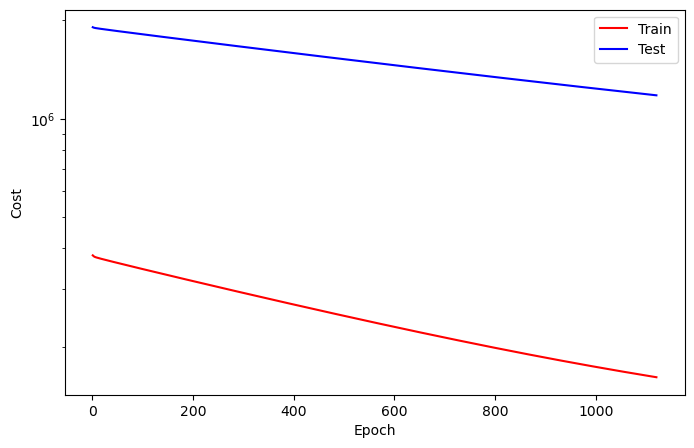

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1121
Train_cost  = 161185.4524 | Test_cost  = 1178432.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1122
Train_cost  = 161092.5235 | Test_cost  = 1177973.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1123
Train_cost  = 160999.7244 | Test_cost  = 1177515.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1124
Train_cost  = 160907.0299 | Test_cost  = 1177057.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1125
Train_cost  = 160814.4840 | Test_cost  = 1176599.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1126
Train_cost  = 160722.0814 | Test_cost  = 1176141.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1127
Train_cost  = 160629.7986 | Test_cost  = 1175684.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1128
Train_cost  = 160537.6153 | Test_cost  = 1175227.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1129
Train_cost  = 160445.6197 | Test_cost  = 1174770.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1130
Train_cost  = 160353.7292 | Test_cost  = 1174313.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1131
Train_cost  = 160261.9638 | Test_cost  = 1173857.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1132
Train_cost  = 160170.3562 | Test_cost  = 1173401.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1133
Train_cost  = 160078.8263 | Test_cost  = 1172946.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1134
Train_cost  = 159987.4558 | Test_cost  = 1172490.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1135
Train_cost  = 159896.2376 | Test_cost  = 1172035.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1136
Train_cost  = 159805.1140 | Test_cost  = 1171580.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1137
Train_cost  = 159714.1206 | Test_cost  = 1171126.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1138
Train_cost  = 159623.2772 | Test_cost  = 1170672.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1139
Train_cost  = 159532.5500 | Test_cost  = 1170218.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1140
Train_cost  = 159441.9490 | Test_cost  = 1169764.3750 | 


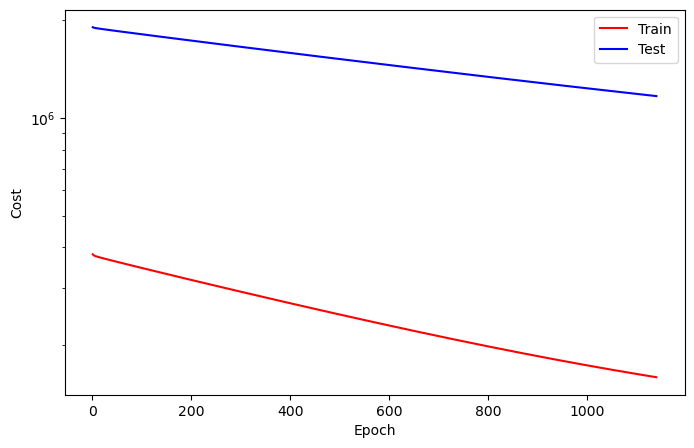

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1141
Train_cost  = 159351.4843 | Test_cost  = 1169310.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1142
Train_cost  = 159261.1231 | Test_cost  = 1168857.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1143
Train_cost  = 159170.8992 | Test_cost  = 1168404.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1144
Train_cost  = 159080.8143 | Test_cost  = 1167951.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1145
Train_cost  = 158990.8622 | Test_cost  = 1167499.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1146
Train_cost  = 158901.0527 | Test_cost  = 1167047.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1147
Train_cost  = 158811.3322 | Test_cost  = 1166595.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1148
Train_cost  = 158721.7618 | Test_cost  = 1166144.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1149
Train_cost  = 158632.3382 | Test_cost  = 1165693.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1150
Train_cost  = 158543.0066 | Test_cost  = 1165242.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1151
Train_cost  = 158453.8199 | Test_cost  = 1164791.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1152
Train_cost  = 158364.7573 | Test_cost  = 1164340.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1153
Train_cost  = 158275.8107 | Test_cost  = 1163890.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1154
Train_cost  = 158187.0091 | Test_cost  = 1163441.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1155
Train_cost  = 158098.3160 | Test_cost  = 1162991.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1156
Train_cost  = 158009.7715 | Test_cost  = 1162542.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1157
Train_cost  = 157921.3433 | Test_cost  = 1162093.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1158
Train_cost  = 157833.0413 | Test_cost  = 1161644.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1159
Train_cost  = 157744.8538 | Test_cost  = 1161196.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1160
Train_cost  = 157656.8352 | Test_cost  = 1160747.8750 | 


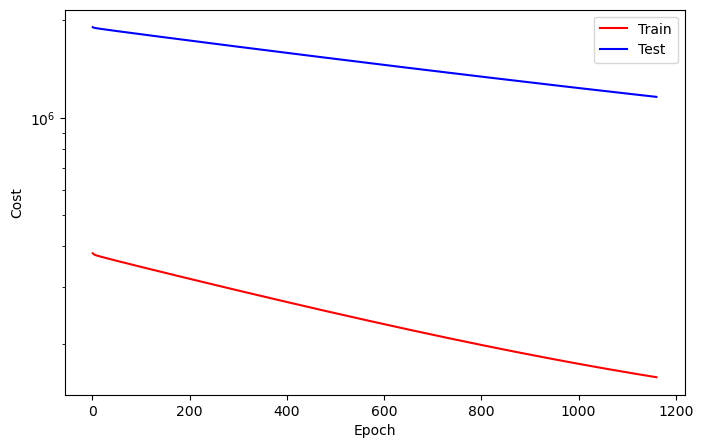

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1161
Train_cost  = 157568.9220 | Test_cost  = 1160299.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1162
Train_cost  = 157481.1140 | Test_cost  = 1159852.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1163
Train_cost  = 157393.4669 | Test_cost  = 1159404.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1164
Train_cost  = 157305.9035 | Test_cost  = 1158957.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1165
Train_cost  = 157218.4969 | Test_cost  = 1158511.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1166
Train_cost  = 157131.2235 | Test_cost  = 1158064.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1167
Train_cost  = 157044.0579 | Test_cost  = 1157618.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1168
Train_cost  = 156957.0231 | Test_cost  = 1157171.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1169
Train_cost  = 156870.1376 | Test_cost  = 1156726.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1170
Train_cost  = 156783.3206 | Test_cost  = 1156280.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1171
Train_cost  = 156696.6711 | Test_cost  = 1155835.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1172
Train_cost  = 156610.1149 | Test_cost  = 1155390.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1173
Train_cost  = 156523.6932 | Test_cost  = 1154945.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1174
Train_cost  = 156437.3952 | Test_cost  = 1154501.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1175
Train_cost  = 156351.2527 | Test_cost  = 1154057.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1176
Train_cost  = 156265.2333 | Test_cost  = 1153613.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1177
Train_cost  = 156179.2994 | Test_cost  = 1153170.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1178
Train_cost  = 156093.5403 | Test_cost  = 1152727.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1179
Train_cost  = 156007.8866 | Test_cost  = 1152284.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1180
Train_cost  = 155922.3334 | Test_cost  = 1151841.4000 | 


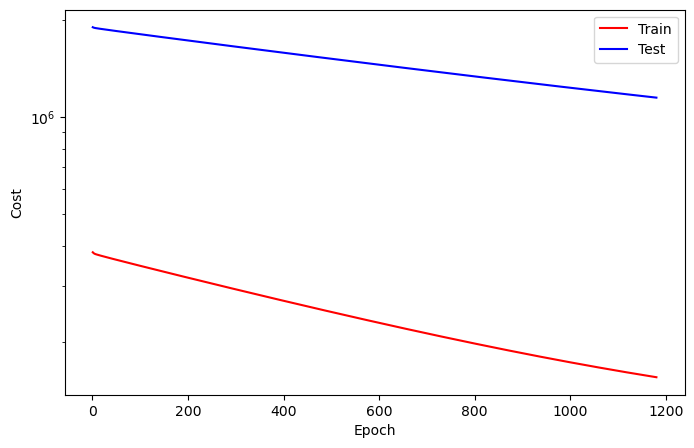

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1181
Train_cost  = 155836.9333 | Test_cost  = 1151398.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1182
Train_cost  = 155751.6386 | Test_cost  = 1150956.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1183
Train_cost  = 155666.4791 | Test_cost  = 1150514.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1184
Train_cost  = 155581.4226 | Test_cost  = 1150073.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1185
Train_cost  = 155496.5092 | Test_cost  = 1149631.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1186
Train_cost  = 155411.7183 | Test_cost  = 1149190.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1187
Train_cost  = 155327.0480 | Test_cost  = 1148749.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1188
Train_cost  = 155242.5051 | Test_cost  = 1148309.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1189
Train_cost  = 155158.0734 | Test_cost  = 1147869.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1190
Train_cost  = 155073.8054 | Test_cost  = 1147429.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1191
Train_cost  = 154989.6471 | Test_cost  = 1146989.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1192
Train_cost  = 154905.5778 | Test_cost  = 1146549.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1193
Train_cost  = 154821.6395 | Test_cost  = 1146110.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1194
Train_cost  = 154737.8353 | Test_cost  = 1145672.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1195
Train_cost  = 154654.1843 | Test_cost  = 1145233.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1196
Train_cost  = 154570.6079 | Test_cost  = 1144795.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1197
Train_cost  = 154487.1886 | Test_cost  = 1144356.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1198
Train_cost  = 154403.8667 | Test_cost  = 1143919.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1199
Train_cost  = 154320.6644 | Test_cost  = 1143481.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1200
Train_cost  = 154237.6126 | Test_cost  = 1143044.1750 | 


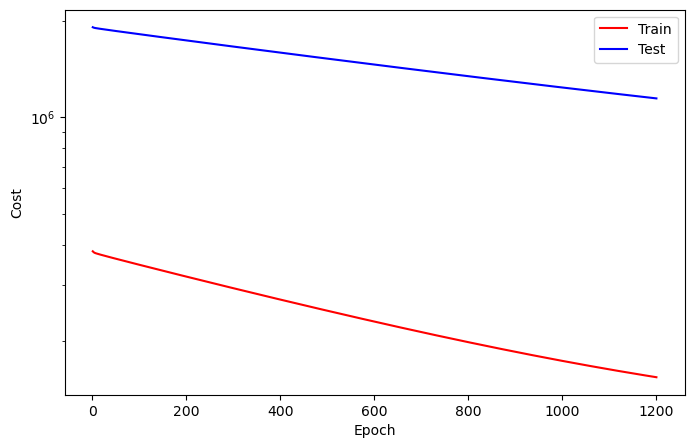

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1201
Train_cost  = 154154.6550 | Test_cost  = 1142607.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1202
Train_cost  = 154071.8307 | Test_cost  = 1142170.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1203
Train_cost  = 153989.1601 | Test_cost  = 1141734.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1204
Train_cost  = 153906.5529 | Test_cost  = 1141297.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1205
Train_cost  = 153824.0942 | Test_cost  = 1140861.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1206
Train_cost  = 153741.7633 | Test_cost  = 1140426.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1207
Train_cost  = 153659.5465 | Test_cost  = 1139990.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1208
Train_cost  = 153577.4603 | Test_cost  = 1139555.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1209
Train_cost  = 153495.5091 | Test_cost  = 1139121.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1210
Train_cost  = 153413.6562 | Test_cost  = 1138686.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1211
Train_cost  = 153331.9188 | Test_cost  = 1138252.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1212
Train_cost  = 153250.2877 | Test_cost  = 1137818.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1213
Train_cost  = 153168.7824 | Test_cost  = 1137384.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1214
Train_cost  = 153087.4348 | Test_cost  = 1136950.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1215
Train_cost  = 153006.2052 | Test_cost  = 1136517.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1216
Train_cost  = 152925.0518 | Test_cost  = 1136084.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1217
Train_cost  = 152844.0801 | Test_cost  = 1135652.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1218
Train_cost  = 152763.1965 | Test_cost  = 1135219.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1219
Train_cost  = 152682.4120 | Test_cost  = 1134787.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1220
Train_cost  = 152601.7781 | Test_cost  = 1134355.8000 | 


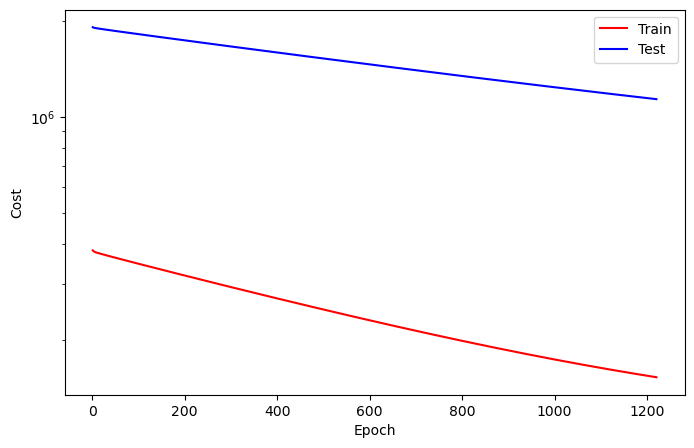

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1221
Train_cost  = 152521.2692 | Test_cost  = 1133924.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1222
Train_cost  = 152440.8488 | Test_cost  = 1133492.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1223
Train_cost  = 152360.5988 | Test_cost  = 1133061.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1224
Train_cost  = 152280.3918 | Test_cost  = 1132630.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1225
Train_cost  = 152200.3827 | Test_cost  = 1132200.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1226
Train_cost  = 152120.4370 | Test_cost  = 1131770.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1227
Train_cost  = 152040.6348 | Test_cost  = 1131340.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1228
Train_cost  = 151960.9522 | Test_cost  = 1130910.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1229
Train_cost  = 151881.3804 | Test_cost  = 1130481.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1230
Train_cost  = 151801.9332 | Test_cost  = 1130051.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1231
Train_cost  = 151722.6127 | Test_cost  = 1129623.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1232
Train_cost  = 151643.4106 | Test_cost  = 1129194.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1233
Train_cost  = 151564.3043 | Test_cost  = 1128765.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1234
Train_cost  = 151485.3165 | Test_cost  = 1128337.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1235
Train_cost  = 151406.4859 | Test_cost  = 1127910.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1236
Train_cost  = 151327.7794 | Test_cost  = 1127482.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1237
Train_cost  = 151249.1466 | Test_cost  = 1127055.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1238
Train_cost  = 151170.6415 | Test_cost  = 1126628.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1239
Train_cost  = 151092.2784 | Test_cost  = 1126201.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1240
Train_cost  = 151014.0132 | Test_cost  = 1125775.0000 | 


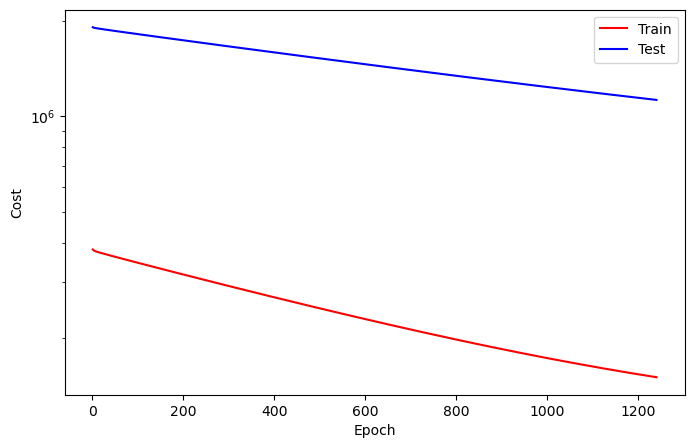

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1241
Train_cost  = 150935.8628 | Test_cost  = 1125348.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1242
Train_cost  = 150857.8421 | Test_cost  = 1124922.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1243
Train_cost  = 150779.9457 | Test_cost  = 1124497.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1244
Train_cost  = 150702.1488 | Test_cost  = 1124071.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1245
Train_cost  = 150624.4430 | Test_cost  = 1123646.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1246
Train_cost  = 150546.8963 | Test_cost  = 1123221.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1247
Train_cost  = 150469.4425 | Test_cost  = 1122797.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1248
Train_cost  = 150392.1536 | Test_cost  = 1122372.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1249
Train_cost  = 150314.9468 | Test_cost  = 1121948.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1250
Train_cost  = 150237.8608 | Test_cost  = 1121524.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1251
Train_cost  = 150160.9006 | Test_cost  = 1121101.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1252
Train_cost  = 150084.0534 | Test_cost  = 1120677.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1253
Train_cost  = 150007.2881 | Test_cost  = 1120254.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1254
Train_cost  = 149930.6797 | Test_cost  = 1119832.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1255
Train_cost  = 149854.1786 | Test_cost  = 1119409.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1256
Train_cost  = 149777.7888 | Test_cost  = 1118987.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1257
Train_cost  = 149701.5325 | Test_cost  = 1118565.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1258
Train_cost  = 149625.3853 | Test_cost  = 1118143.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1259
Train_cost  = 149549.3240 | Test_cost  = 1117722.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1260
Train_cost  = 149473.4151 | Test_cost  = 1117301.3500 | 


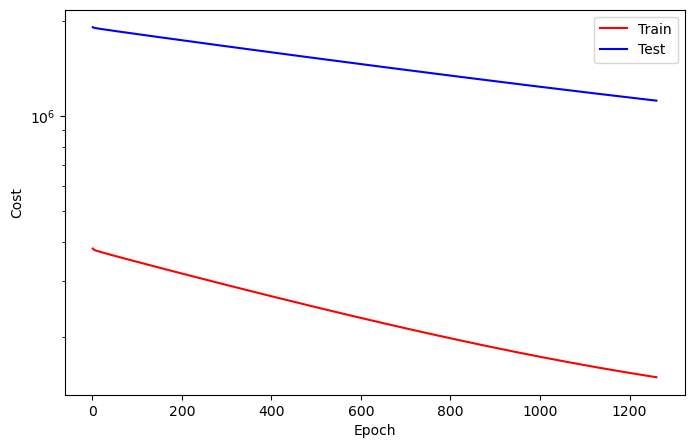

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1261
Train_cost  = 149397.5747 | Test_cost  = 1116880.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1262
Train_cost  = 149321.9170 | Test_cost  = 1116459.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1263
Train_cost  = 149246.3348 | Test_cost  = 1116039.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1264
Train_cost  = 149170.8822 | Test_cost  = 1115619.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1265
Train_cost  = 149095.5611 | Test_cost  = 1115199.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1266
Train_cost  = 149020.3127 | Test_cost  = 1114779.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1267
Train_cost  = 148945.1967 | Test_cost  = 1114360.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1268
Train_cost  = 148870.1996 | Test_cost  = 1113941.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1269
Train_cost  = 148795.3289 | Test_cost  = 1113522.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1270
Train_cost  = 148720.5500 | Test_cost  = 1113104.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1271
Train_cost  = 148645.8756 | Test_cost  = 1112686.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1272
Train_cost  = 148571.3577 | Test_cost  = 1112268.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1273
Train_cost  = 148496.9244 | Test_cost  = 1111850.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1274
Train_cost  = 148422.6166 | Test_cost  = 1111433.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1275
Train_cost  = 148348.3951 | Test_cost  = 1111015.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1276
Train_cost  = 148274.3332 | Test_cost  = 1110599.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1277
Train_cost  = 148200.3595 | Test_cost  = 1110182.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1278
Train_cost  = 148126.4984 | Test_cost  = 1109765.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1279
Train_cost  = 148052.7853 | Test_cost  = 1109349.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1280
Train_cost  = 147979.1690 | Test_cost  = 1108934.0000 | 


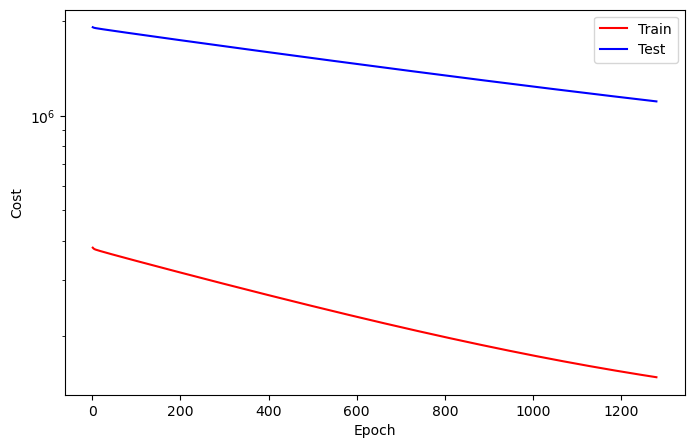

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1281
Train_cost  = 147905.6472 | Test_cost  = 1108518.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1282
Train_cost  = 147832.2406 | Test_cost  = 1108102.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1283
Train_cost  = 147758.9658 | Test_cost  = 1107687.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1284
Train_cost  = 147685.7935 | Test_cost  = 1107273.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1285
Train_cost  = 147612.7476 | Test_cost  = 1106858.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1286
Train_cost  = 147539.8003 | Test_cost  = 1106444.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1287
Train_cost  = 147466.9617 | Test_cost  = 1106030.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1288
Train_cost  = 147394.2377 | Test_cost  = 1105616.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1289
Train_cost  = 147321.5990 | Test_cost  = 1105202.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1290
Train_cost  = 147249.1351 | Test_cost  = 1104789.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1291
Train_cost  = 147176.7580 | Test_cost  = 1104376.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1292
Train_cost  = 147104.5005 | Test_cost  = 1103964.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1293
Train_cost  = 147032.3392 | Test_cost  = 1103551.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1294
Train_cost  = 146960.3063 | Test_cost  = 1103139.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1295
Train_cost  = 146888.3739 | Test_cost  = 1102727.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1296
Train_cost  = 146816.5693 | Test_cost  = 1102315.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1297
Train_cost  = 146744.8504 | Test_cost  = 1101904.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1298
Train_cost  = 146673.2623 | Test_cost  = 1101493.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1299
Train_cost  = 146601.7852 | Test_cost  = 1101082.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1300
Train_cost  = 146530.4019 | Test_cost  = 1100672.0500 | 


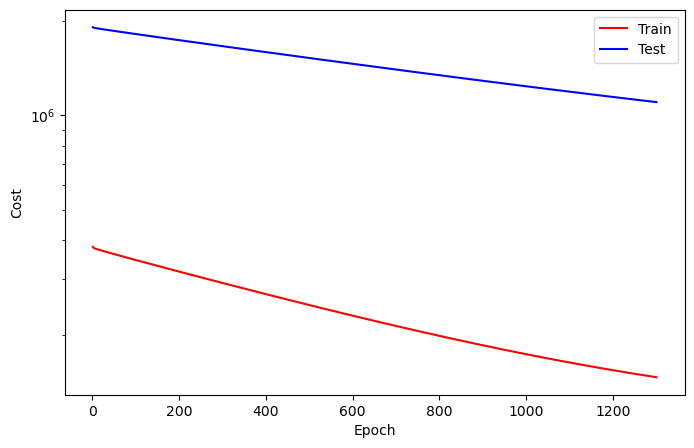

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1301
Train_cost  = 146459.1439 | Test_cost  = 1100261.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1302
Train_cost  = 146388.0274 | Test_cost  = 1099851.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1303
Train_cost  = 146316.9752 | Test_cost  = 1099441.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1304
Train_cost  = 146246.0540 | Test_cost  = 1099032.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1305
Train_cost  = 146175.2280 | Test_cost  = 1098623.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1306
Train_cost  = 146104.5504 | Test_cost  = 1098214.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1307
Train_cost  = 146033.9412 | Test_cost  = 1097805.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1308
Train_cost  = 145963.4625 | Test_cost  = 1097396.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1309
Train_cost  = 145893.0862 | Test_cost  = 1096988.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1310
Train_cost  = 145822.8227 | Test_cost  = 1096580.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1311
Train_cost  = 145752.6873 | Test_cost  = 1096172.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1312
Train_cost  = 145682.6598 | Test_cost  = 1095765.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1313
Train_cost  = 145612.7381 | Test_cost  = 1095358.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1314
Train_cost  = 145542.9102 | Test_cost  = 1094951.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1315
Train_cost  = 145473.1935 | Test_cost  = 1094544.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1316
Train_cost  = 145403.6225 | Test_cost  = 1094138.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1317
Train_cost  = 145334.1175 | Test_cost  = 1093731.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1318
Train_cost  = 145264.7719 | Test_cost  = 1093326.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1319
Train_cost  = 145195.4871 | Test_cost  = 1092920.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1320
Train_cost  = 145126.3540 | Test_cost  = 1092515.0500 | 


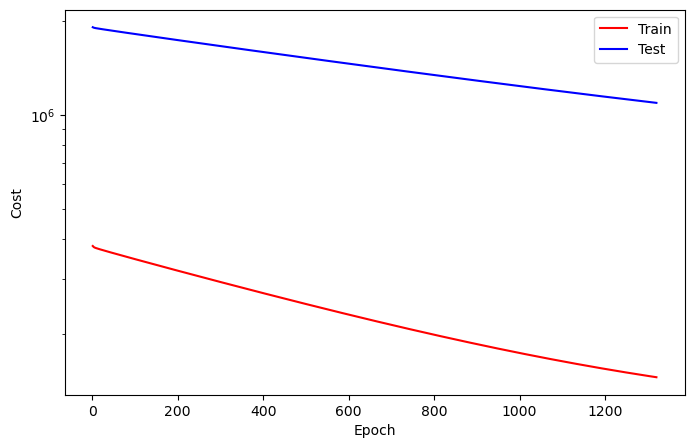

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1321
Train_cost  = 145057.2650 | Test_cost  = 1092109.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1322
Train_cost  = 144988.3225 | Test_cost  = 1091704.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1323
Train_cost  = 144919.4878 | Test_cost  = 1091300.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1324
Train_cost  = 144850.7876 | Test_cost  = 1090896.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1325
Train_cost  = 144782.1782 | Test_cost  = 1090491.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1326
Train_cost  = 144713.6878 | Test_cost  = 1090088.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1327
Train_cost  = 144645.2715 | Test_cost  = 1089684.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1328
Train_cost  = 144577.0068 | Test_cost  = 1089281.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1329
Train_cost  = 144508.8391 | Test_cost  = 1088878.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1330
Train_cost  = 144440.7951 | Test_cost  = 1088475.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1331
Train_cost  = 144372.8135 | Test_cost  = 1088073.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1332
Train_cost  = 144304.9806 | Test_cost  = 1087670.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1333
Train_cost  = 144237.2202 | Test_cost  = 1087268.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1334
Train_cost  = 144169.5852 | Test_cost  = 1086866.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1335
Train_cost  = 144102.0507 | Test_cost  = 1086465.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1336
Train_cost  = 144034.6387 | Test_cost  = 1086064.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1337
Train_cost  = 143967.3454 | Test_cost  = 1085663.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1338
Train_cost  = 143900.1214 | Test_cost  = 1085262.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1339
Train_cost  = 143833.0265 | Test_cost  = 1084861.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1340
Train_cost  = 143766.0500 | Test_cost  = 1084461.7750 | 


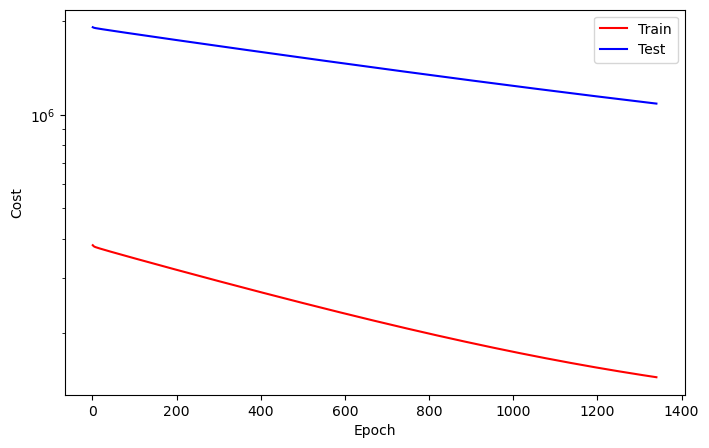

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1341
Train_cost  = 143699.1801 | Test_cost  = 1084061.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1342
Train_cost  = 143632.4008 | Test_cost  = 1083662.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1343
Train_cost  = 143565.7308 | Test_cost  = 1083262.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1344
Train_cost  = 143499.2010 | Test_cost  = 1082863.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1345
Train_cost  = 143432.7270 | Test_cost  = 1082464.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1346
Train_cost  = 143366.3925 | Test_cost  = 1082066.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1347
Train_cost  = 143300.1580 | Test_cost  = 1081667.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1348
Train_cost  = 143234.0606 | Test_cost  = 1081269.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1349
Train_cost  = 143168.0082 | Test_cost  = 1080871.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1350
Train_cost  = 143102.1055 | Test_cost  = 1080473.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1351
Train_cost  = 143036.3006 | Test_cost  = 1080076.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1352
Train_cost  = 142970.5973 | Test_cost  = 1079679.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1353
Train_cost  = 142904.9756 | Test_cost  = 1079282.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1354
Train_cost  = 142839.5100 | Test_cost  = 1078886.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1355
Train_cost  = 142774.1190 | Test_cost  = 1078489.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1356
Train_cost  = 142708.8357 | Test_cost  = 1078093.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1357
Train_cost  = 142643.6650 | Test_cost  = 1077697.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1358
Train_cost  = 142578.5809 | Test_cost  = 1077302.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1359
Train_cost  = 142513.6346 | Test_cost  = 1076906.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1360
Train_cost  = 142448.7780 | Test_cost  = 1076511.7500 | 


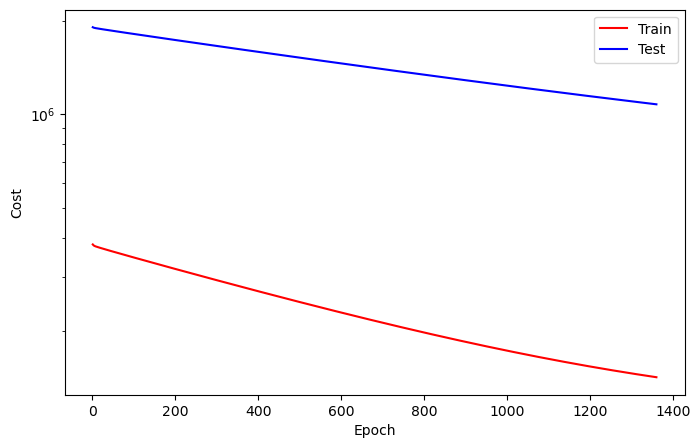

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1361
Train_cost  = 142384.0276 | Test_cost  = 1076116.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1362
Train_cost  = 142319.3926 | Test_cost  = 1075722.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1363
Train_cost  = 142254.8639 | Test_cost  = 1075328.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1364
Train_cost  = 142190.4114 | Test_cost  = 1074933.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1365
Train_cost  = 142126.0979 | Test_cost  = 1074540.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1366
Train_cost  = 142061.8813 | Test_cost  = 1074146.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1367
Train_cost  = 141997.7491 | Test_cost  = 1073753.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1368
Train_cost  = 141933.7274 | Test_cost  = 1073360.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1369
Train_cost  = 141869.8143 | Test_cost  = 1072967.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1370
Train_cost  = 141806.0090 | Test_cost  = 1072575.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1371
Train_cost  = 141742.3418 | Test_cost  = 1072182.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1372
Train_cost  = 141678.7135 | Test_cost  = 1071790.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1373
Train_cost  = 141615.2171 | Test_cost  = 1071399.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1374
Train_cost  = 141551.8389 | Test_cost  = 1071007.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1375
Train_cost  = 141488.5448 | Test_cost  = 1070616.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1376
Train_cost  = 141425.3716 | Test_cost  = 1070225.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1377
Train_cost  = 141362.2834 | Test_cost  = 1069834.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1378
Train_cost  = 141299.3383 | Test_cost  = 1069444.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1379
Train_cost  = 141236.4688 | Test_cost  = 1069054.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1380
Train_cost  = 141173.6909 | Test_cost  = 1068664.2500 | 


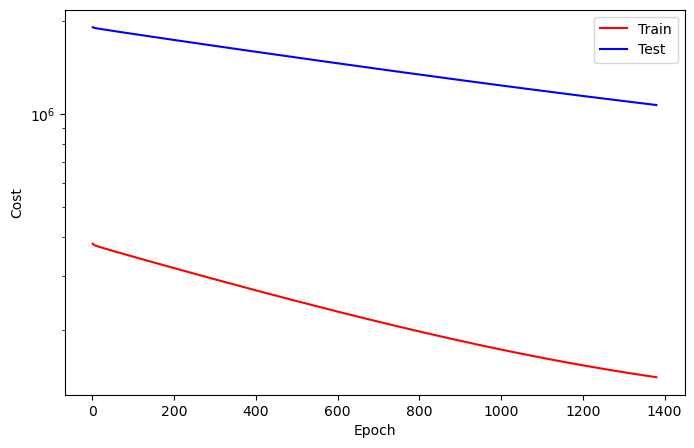

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1381
Train_cost  = 141111.0471 | Test_cost  = 1068274.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1382
Train_cost  = 141048.4771 | Test_cost  = 1067885.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1383
Train_cost  = 140986.0016 | Test_cost  = 1067495.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1384
Train_cost  = 140923.6687 | Test_cost  = 1067107.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1385
Train_cost  = 140861.4246 | Test_cost  = 1066718.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1386
Train_cost  = 140799.2725 | Test_cost  = 1066329.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1387
Train_cost  = 140737.2329 | Test_cost  = 1065941.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1388
Train_cost  = 140675.2658 | Test_cost  = 1065553.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1389
Train_cost  = 140613.4321 | Test_cost  = 1065166.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1390
Train_cost  = 140551.6984 | Test_cost  = 1064778.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1391
Train_cost  = 140490.0756 | Test_cost  = 1064391.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1392
Train_cost  = 140428.5453 | Test_cost  = 1064004.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1393
Train_cost  = 140367.1295 | Test_cost  = 1063618.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1394
Train_cost  = 140305.7978 | Test_cost  = 1063231.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1395
Train_cost  = 140244.5568 | Test_cost  = 1062845.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1396
Train_cost  = 140183.4548 | Test_cost  = 1062459.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1397
Train_cost  = 140122.4020 | Test_cost  = 1062073.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1398
Train_cost  = 140061.5121 | Test_cost  = 1061688.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1399
Train_cost  = 140000.6781 | Test_cost  = 1061303.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1400
Train_cost  = 139939.9540 | Test_cost  = 1060918.4250 | 


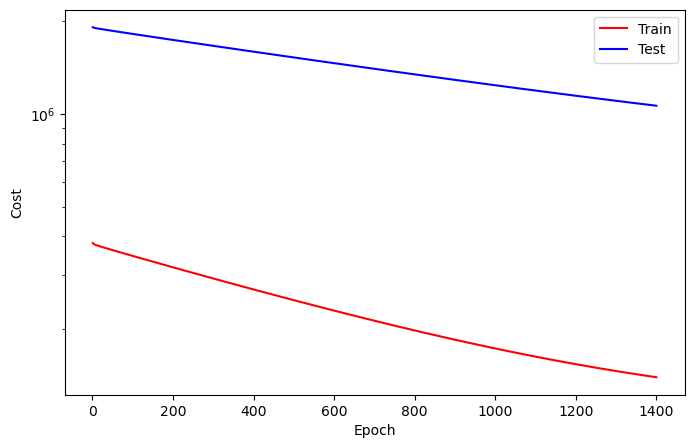

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1401
Train_cost  = 139879.3425 | Test_cost  = 1060533.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1402
Train_cost  = 139818.8443 | Test_cost  = 1060149.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1403
Train_cost  = 139758.4128 | Test_cost  = 1059765.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1404
Train_cost  = 139698.0906 | Test_cost  = 1059381.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1405
Train_cost  = 139637.9036 | Test_cost  = 1058997.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1406
Train_cost  = 139577.7824 | Test_cost  = 1058614.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1407
Train_cost  = 139517.7722 | Test_cost  = 1058231.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1408
Train_cost  = 139457.8675 | Test_cost  = 1057848.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1409
Train_cost  = 139398.0446 | Test_cost  = 1057465.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1410
Train_cost  = 139338.3262 | Test_cost  = 1057083.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1411
Train_cost  = 139278.7172 | Test_cost  = 1056701.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1412
Train_cost  = 139219.2070 | Test_cost  = 1056319.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1413
Train_cost  = 139159.8094 | Test_cost  = 1055937.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1414
Train_cost  = 139100.4908 | Test_cost  = 1055556.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1415
Train_cost  = 139041.3188 | Test_cost  = 1055175.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1416
Train_cost  = 138982.1886 | Test_cost  = 1054794.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1417
Train_cost  = 138923.1924 | Test_cost  = 1054413.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1418
Train_cost  = 138864.2907 | Test_cost  = 1054033.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1419
Train_cost  = 138805.4544 | Test_cost  = 1053653.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1420
Train_cost  = 138746.7545 | Test_cost  = 1053273.4500 | 


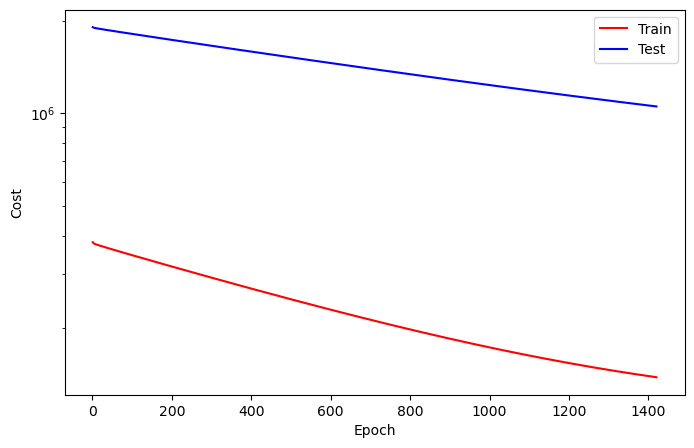

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1421
Train_cost  = 138688.1374 | Test_cost  = 1052893.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1422
Train_cost  = 138629.6237 | Test_cost  = 1052514.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1423
Train_cost  = 138571.2193 | Test_cost  = 1052135.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1424
Train_cost  = 138512.9136 | Test_cost  = 1051756.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1425
Train_cost  = 138454.6959 | Test_cost  = 1051377.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1426
Train_cost  = 138396.5992 | Test_cost  = 1050999.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1427
Train_cost  = 138338.5402 | Test_cost  = 1050621.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1428
Train_cost  = 138280.6559 | Test_cost  = 1050243.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1429
Train_cost  = 138222.8281 | Test_cost  = 1049865.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1430
Train_cost  = 138165.1002 | Test_cost  = 1049488.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1431
Train_cost  = 138107.4854 | Test_cost  = 1049111.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1432
Train_cost  = 138049.9529 | Test_cost  = 1048734.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1433
Train_cost  = 137992.5349 | Test_cost  = 1048357.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1434
Train_cost  = 137935.1828 | Test_cost  = 1047981.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1435
Train_cost  = 137877.9462 | Test_cost  = 1047605.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1436
Train_cost  = 137820.8190 | Test_cost  = 1047229.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1437
Train_cost  = 137763.8035 | Test_cost  = 1046853.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1438
Train_cost  = 137706.8348 | Test_cost  = 1046478.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1439
Train_cost  = 137650.0044 | Test_cost  = 1046103.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1440
Train_cost  = 137593.2803 | Test_cost  = 1045728.4750 | 


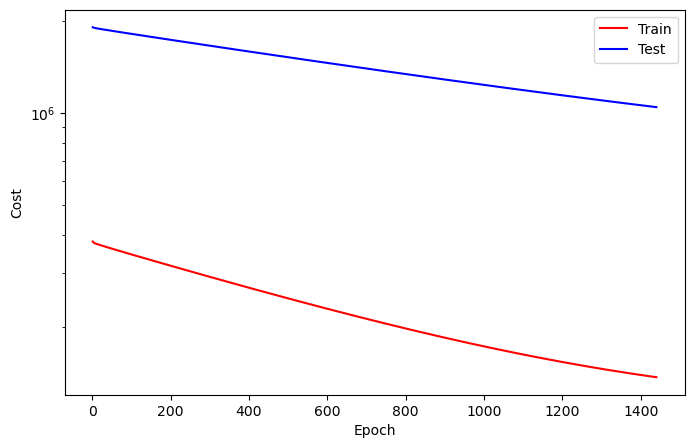

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1441
Train_cost  = 137536.6422 | Test_cost  = 1045353.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1442
Train_cost  = 137480.0900 | Test_cost  = 1044979.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1443
Train_cost  = 137423.6341 | Test_cost  = 1044605.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1444
Train_cost  = 137367.2873 | Test_cost  = 1044231.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1445
Train_cost  = 137311.0238 | Test_cost  = 1043857.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1446
Train_cost  = 137254.8751 | Test_cost  = 1043484.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1447
Train_cost  = 137198.8045 | Test_cost  = 1043111.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1448
Train_cost  = 137142.8313 | Test_cost  = 1042738.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1449
Train_cost  = 137086.9706 | Test_cost  = 1042365.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1450
Train_cost  = 137031.1801 | Test_cost  = 1041993.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1451
Train_cost  = 136975.4983 | Test_cost  = 1041621.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1452
Train_cost  = 136919.9366 | Test_cost  = 1041249.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1453
Train_cost  = 136864.4614 | Test_cost  = 1040877.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1454
Train_cost  = 136809.0707 | Test_cost  = 1040506.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1455
Train_cost  = 136753.7768 | Test_cost  = 1040134.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1456
Train_cost  = 136698.5896 | Test_cost  = 1039764.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1457
Train_cost  = 136643.4634 | Test_cost  = 1039393.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1458
Train_cost  = 136588.4558 | Test_cost  = 1039022.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1459
Train_cost  = 136533.5673 | Test_cost  = 1038652.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1460
Train_cost  = 136478.7522 | Test_cost  = 1038282.8500 | 


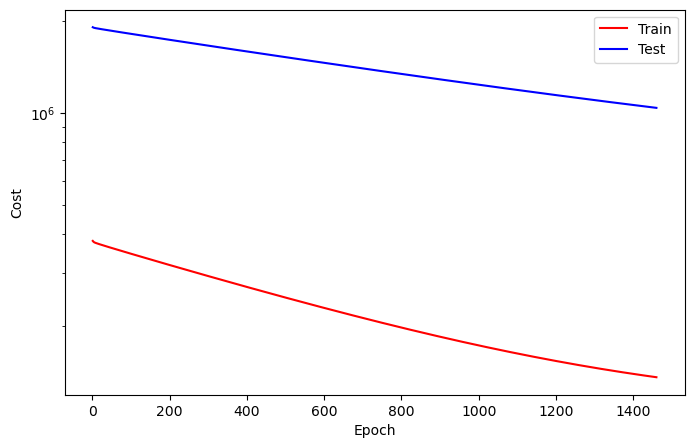

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1461
Train_cost  = 136424.0325 | Test_cost  = 1037913.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1462
Train_cost  = 136369.3959 | Test_cost  = 1037543.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1463
Train_cost  = 136314.8702 | Test_cost  = 1037174.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1464
Train_cost  = 136260.4234 | Test_cost  = 1036805.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1465
Train_cost  = 136206.0889 | Test_cost  = 1036436.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1466
Train_cost  = 136151.8469 | Test_cost  = 1036068.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1467
Train_cost  = 136097.6894 | Test_cost  = 1035700.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1468
Train_cost  = 136043.6472 | Test_cost  = 1035332.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1469
Train_cost  = 135989.6536 | Test_cost  = 1034964.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1470
Train_cost  = 135935.8086 | Test_cost  = 1034597.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1471
Train_cost  = 135882.0548 | Test_cost  = 1034229.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1472
Train_cost  = 135828.3720 | Test_cost  = 1033862.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1473
Train_cost  = 135774.7798 | Test_cost  = 1033496.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1474
Train_cost  = 135721.2805 | Test_cost  = 1033129.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1475
Train_cost  = 135667.8937 | Test_cost  = 1032763.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1476
Train_cost  = 135614.5998 | Test_cost  = 1032397.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1477
Train_cost  = 135561.3798 | Test_cost  = 1032031.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1478
Train_cost  = 135508.2773 | Test_cost  = 1031666.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1479
Train_cost  = 135455.2449 | Test_cost  = 1031300.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1480
Train_cost  = 135402.3532 | Test_cost  = 1030935.8000 | 


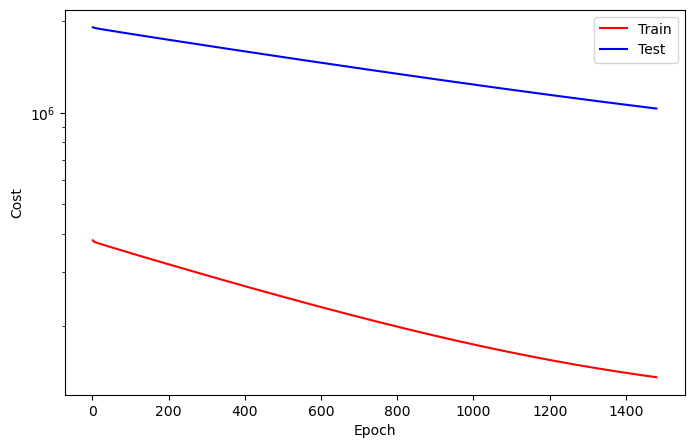

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1481
Train_cost  = 135349.5215 | Test_cost  = 1030571.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1482
Train_cost  = 135296.7462 | Test_cost  = 1030206.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1483
Train_cost  = 135244.1037 | Test_cost  = 1029842.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1484
Train_cost  = 135191.5397 | Test_cost  = 1029478.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1485
Train_cost  = 135139.0843 | Test_cost  = 1029114.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1486
Train_cost  = 135086.6983 | Test_cost  = 1028750.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1487
Train_cost  = 135034.4167 | Test_cost  = 1028387.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1488
Train_cost  = 134982.2432 | Test_cost  = 1028024.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1489
Train_cost  = 134930.1465 | Test_cost  = 1027661.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1490
Train_cost  = 134878.1613 | Test_cost  = 1027298.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1491
Train_cost  = 134826.2443 | Test_cost  = 1026936.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1492
Train_cost  = 134774.4433 | Test_cost  = 1026574.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1493
Train_cost  = 134722.7394 | Test_cost  = 1026212.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1494
Train_cost  = 134671.1096 | Test_cost  = 1025850.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1495
Train_cost  = 134619.5528 | Test_cost  = 1025489.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1496
Train_cost  = 134568.1340 | Test_cost  = 1025128.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1497
Train_cost  = 134516.7645 | Test_cost  = 1024767.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1498
Train_cost  = 134465.5241 | Test_cost  = 1024407.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1499
Train_cost  = 134414.3375 | Test_cost  = 1024046.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1500
Train_cost  = 134363.2520 | Test_cost  = 1023686.3000 | 


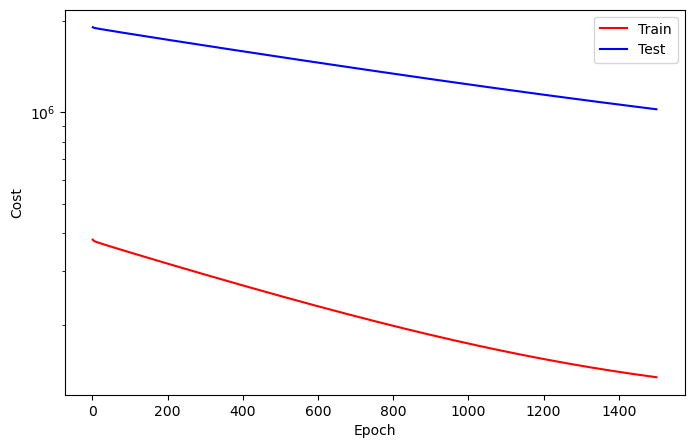

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1501
Train_cost  = 134312.2645 | Test_cost  = 1023326.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1502
Train_cost  = 134261.3452 | Test_cost  = 1022966.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1503
Train_cost  = 134210.5252 | Test_cost  = 1022607.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1504
Train_cost  = 134159.8445 | Test_cost  = 1022247.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1505
Train_cost  = 134109.2224 | Test_cost  = 1021889.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1506
Train_cost  = 134058.6714 | Test_cost  = 1021530.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1507
Train_cost  = 134008.2637 | Test_cost  = 1021171.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1508
Train_cost  = 133957.9102 | Test_cost  = 1020813.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1509
Train_cost  = 133907.6481 | Test_cost  = 1020455.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1510
Train_cost  = 133857.4740 | Test_cost  = 1020098.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1511
Train_cost  = 133807.3960 | Test_cost  = 1019740.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1512
Train_cost  = 133757.3941 | Test_cost  = 1019383.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1513
Train_cost  = 133707.4902 | Test_cost  = 1019026.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1514
Train_cost  = 133657.7264 | Test_cost  = 1018669.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1515
Train_cost  = 133607.9779 | Test_cost  = 1018312.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1516
Train_cost  = 133558.3402 | Test_cost  = 1017956.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1517
Train_cost  = 133508.8224 | Test_cost  = 1017600.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1518
Train_cost  = 133459.3516 | Test_cost  = 1017244.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1519
Train_cost  = 133410.0027 | Test_cost  = 1016889.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1520
Train_cost  = 133360.7146 | Test_cost  = 1016533.7000 | 


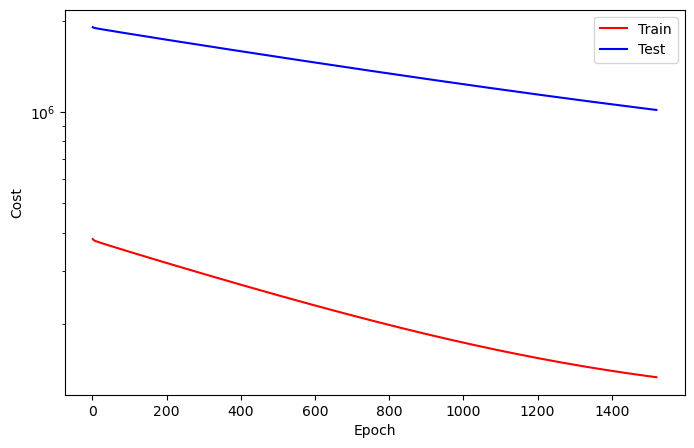

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1521
Train_cost  = 133311.5258 | Test_cost  = 1016178.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1522
Train_cost  = 133262.4521 | Test_cost  = 1015823.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1523
Train_cost  = 133213.4454 | Test_cost  = 1015469.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1524
Train_cost  = 133164.5535 | Test_cost  = 1015114.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1525
Train_cost  = 133115.6998 | Test_cost  = 1014760.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1526
Train_cost  = 133066.9909 | Test_cost  = 1014406.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1527
Train_cost  = 133018.3355 | Test_cost  = 1014053.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1528
Train_cost  = 132969.7714 | Test_cost  = 1013699.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1529
Train_cost  = 132921.3127 | Test_cost  = 1013346.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1530
Train_cost  = 132872.9251 | Test_cost  = 1012993.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1531
Train_cost  = 132824.6417 | Test_cost  = 1012640.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1532
Train_cost  = 132776.4266 | Test_cost  = 1012288.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1533
Train_cost  = 132728.3128 | Test_cost  = 1011936.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1534
Train_cost  = 132680.2886 | Test_cost  = 1011584.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1535
Train_cost  = 132632.3413 | Test_cost  = 1011232.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1536
Train_cost  = 132584.4735 | Test_cost  = 1010880.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1537
Train_cost  = 132536.7200 | Test_cost  = 1010529.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1538
Train_cost  = 132489.0445 | Test_cost  = 1010178.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1539
Train_cost  = 132441.4701 | Test_cost  = 1009827.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1540
Train_cost  = 132393.9705 | Test_cost  = 1009477.3750 | 


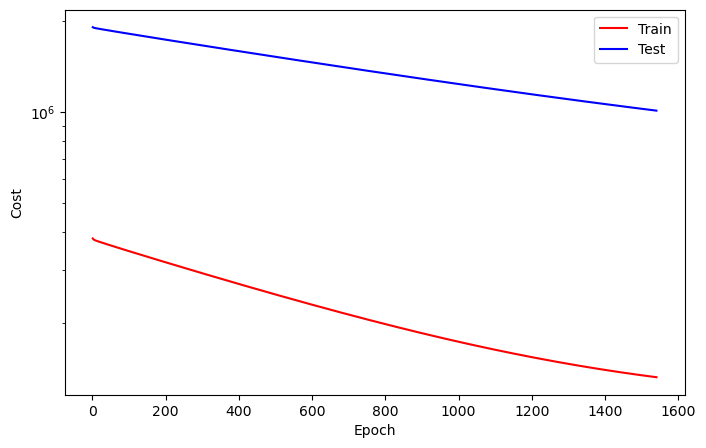

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1541
Train_cost  = 132346.5405 | Test_cost  = 1009127.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1542
Train_cost  = 132299.2345 | Test_cost  = 1008776.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1543
Train_cost  = 132251.9925 | Test_cost  = 1008427.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1544
Train_cost  = 132204.8550 | Test_cost  = 1008077.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1545
Train_cost  = 132157.7783 | Test_cost  = 1007728.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1546
Train_cost  = 132110.8087 | Test_cost  = 1007379.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1547
Train_cost  = 132063.9109 | Test_cost  = 1007030.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1548
Train_cost  = 132017.1169 | Test_cost  = 1006681.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1549
Train_cost  = 131970.4106 | Test_cost  = 1006333.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1550
Train_cost  = 131923.7787 | Test_cost  = 1005984.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1551
Train_cost  = 131877.2287 | Test_cost  = 1005637.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1552
Train_cost  = 131830.7752 | Test_cost  = 1005289.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1553
Train_cost  = 131784.3996 | Test_cost  = 1004941.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1554
Train_cost  = 131738.1228 | Test_cost  = 1004594.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1555
Train_cost  = 131691.9155 | Test_cost  = 1004247.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1556
Train_cost  = 131645.8152 | Test_cost  = 1003900.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1557
Train_cost  = 131599.7958 | Test_cost  = 1003554.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1558
Train_cost  = 131553.8339 | Test_cost  = 1003207.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1559
Train_cost  = 131507.9916 | Test_cost  = 1002861.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1560
Train_cost  = 131462.2200 | Test_cost  = 1002516.0500 | 


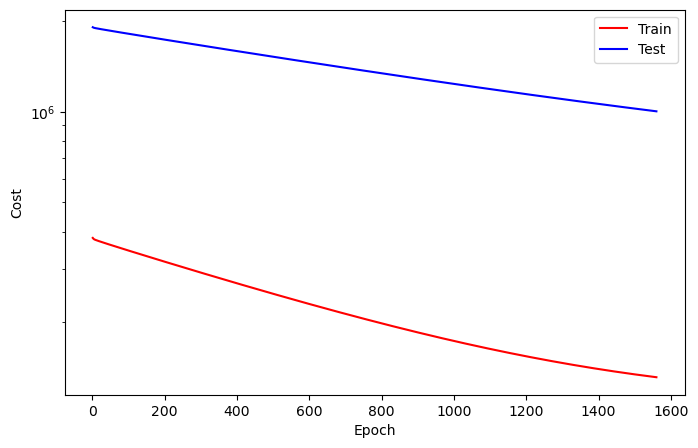

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1561
Train_cost  = 131416.5263 | Test_cost  = 1002170.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1562
Train_cost  = 131370.9185 | Test_cost  = 1001825.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1563
Train_cost  = 131325.4292 | Test_cost  = 1001480.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1564
Train_cost  = 131279.9987 | Test_cost  = 1001135.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1565
Train_cost  = 131234.6639 | Test_cost  = 1000790.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1566
Train_cost  = 131189.3867 | Test_cost  = 1000446.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1567
Train_cost  = 131144.2350 | Test_cost  = 1000102.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1568
Train_cost  = 131099.1415 | Test_cost  = 999758.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1569
Train_cost  = 131054.1355 | Test_cost  = 999414.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1570
Train_cost  = 131009.2210 | Test_cost  = 999070.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1571
Train_cost  = 130964.3884 | Test_cost  = 998727.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1572
Train_cost  = 130919.6448 | Test_cost  = 998384.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1573
Train_cost  = 130874.9769 | Test_cost  = 998042.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1574
Train_cost  = 130830.4244 | Test_cost  = 997699.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1575
Train_cost  = 130785.8912 | Test_cost  = 997357.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1576
Train_cost  = 130741.5075 | Test_cost  = 997015.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1577
Train_cost  = 130697.1793 | Test_cost  = 996673.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1578
Train_cost  = 130652.9205 | Test_cost  = 996331.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1579
Train_cost  = 130608.7810 | Test_cost  = 995990.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1580
Train_cost  = 130564.6994 | Test_cost  = 995649.4500 | 


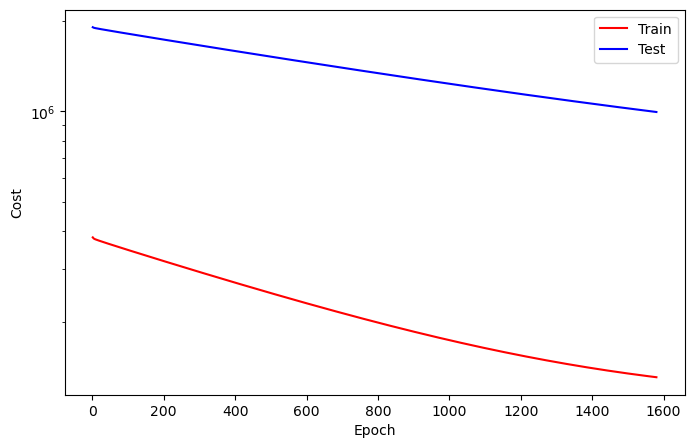

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1581
Train_cost  = 130520.7277 | Test_cost  = 995308.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1582
Train_cost  = 130476.8115 | Test_cost  = 994967.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1583
Train_cost  = 130432.9613 | Test_cost  = 994627.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1584
Train_cost  = 130389.2493 | Test_cost  = 994287.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1585
Train_cost  = 130345.5869 | Test_cost  = 993947.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1586
Train_cost  = 130302.0197 | Test_cost  = 993607.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1587
Train_cost  = 130258.5483 | Test_cost  = 993268.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1588
Train_cost  = 130215.1197 | Test_cost  = 992928.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1589
Train_cost  = 130171.7834 | Test_cost  = 992590.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1590
Train_cost  = 130128.5637 | Test_cost  = 992251.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1591
Train_cost  = 130085.3893 | Test_cost  = 991912.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1592
Train_cost  = 130042.3265 | Test_cost  = 991574.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1593
Train_cost  = 129999.3231 | Test_cost  = 991236.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1594
Train_cost  = 129956.4056 | Test_cost  = 990898.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1595
Train_cost  = 129913.5833 | Test_cost  = 990560.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1596
Train_cost  = 129870.8426 | Test_cost  = 990223.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1597
Train_cost  = 129828.1669 | Test_cost  = 989886.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1598
Train_cost  = 129785.5914 | Test_cost  = 989549.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1599
Train_cost  = 129743.0772 | Test_cost  = 989212.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1600
Train_cost  = 129700.6581 | Test_cost  = 988876.4500 | 


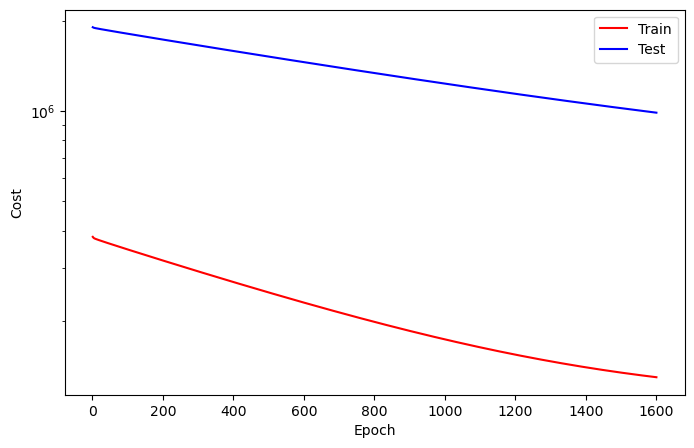

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1601
Train_cost  = 129658.3383 | Test_cost  = 988540.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1602
Train_cost  = 129616.0763 | Test_cost  = 988204.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1603
Train_cost  = 129573.8895 | Test_cost  = 987868.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1604
Train_cost  = 129531.8021 | Test_cost  = 987532.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1605
Train_cost  = 129489.7942 | Test_cost  = 987197.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1606
Train_cost  = 129447.8504 | Test_cost  = 986862.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1607
Train_cost  = 129406.0148 | Test_cost  = 986527.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1608
Train_cost  = 129364.2358 | Test_cost  = 986193.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1609
Train_cost  = 129322.5469 | Test_cost  = 985858.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1610
Train_cost  = 129280.9496 | Test_cost  = 985524.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1611
Train_cost  = 129239.4402 | Test_cost  = 985190.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1612
Train_cost  = 129197.9911 | Test_cost  = 984856.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1613
Train_cost  = 129156.6094 | Test_cost  = 984523.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1614
Train_cost  = 129115.3387 | Test_cost  = 984190.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1615
Train_cost  = 129074.1433 | Test_cost  = 983857.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1616
Train_cost  = 129033.0246 | Test_cost  = 983524.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1617
Train_cost  = 128991.9948 | Test_cost  = 983192.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1618
Train_cost  = 128951.0090 | Test_cost  = 982860.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1619
Train_cost  = 128910.1373 | Test_cost  = 982527.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1620
Train_cost  = 128869.3424 | Test_cost  = 982196.0000 | 


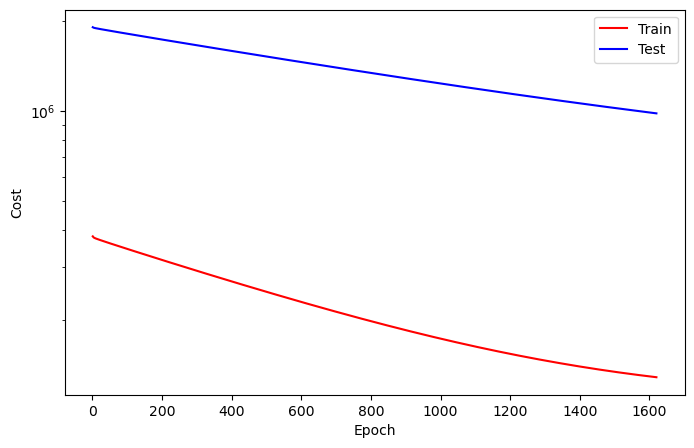

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1621
Train_cost  = 128828.5968 | Test_cost  = 981864.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1622
Train_cost  = 128787.9594 | Test_cost  = 981532.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1623
Train_cost  = 128747.4087 | Test_cost  = 981201.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1624
Train_cost  = 128706.9232 | Test_cost  = 980870.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1625
Train_cost  = 128666.5229 | Test_cost  = 980540.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1626
Train_cost  = 128626.1911 | Test_cost  = 980209.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1627
Train_cost  = 128585.9462 | Test_cost  = 979879.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1628
Train_cost  = 128545.7976 | Test_cost  = 979549.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1629
Train_cost  = 128505.7058 | Test_cost  = 979219.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1630
Train_cost  = 128465.6808 | Test_cost  = 978890.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1631
Train_cost  = 128425.7937 | Test_cost  = 978561.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1632
Train_cost  = 128385.9356 | Test_cost  = 978232.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1633
Train_cost  = 128346.1855 | Test_cost  = 977903.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1634
Train_cost  = 128306.4905 | Test_cost  = 977574.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1635
Train_cost  = 128266.8723 | Test_cost  = 977246.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1636
Train_cost  = 128227.3387 | Test_cost  = 976918.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1637
Train_cost  = 128187.9148 | Test_cost  = 976590.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1638
Train_cost  = 128148.5306 | Test_cost  = 976262.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1639
Train_cost  = 128109.2208 | Test_cost  = 975935.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1640
Train_cost  = 128070.0052 | Test_cost  = 975607.8250 | 


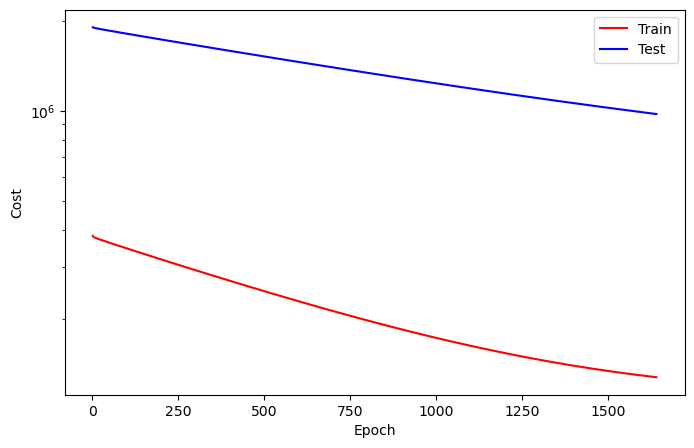

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1641
Train_cost  = 128030.8620 | Test_cost  = 975280.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1642
Train_cost  = 127991.7959 | Test_cost  = 974953.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1643
Train_cost  = 127952.8060 | Test_cost  = 974627.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1644
Train_cost  = 127913.8915 | Test_cost  = 974300.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1645
Train_cost  = 127875.0256 | Test_cost  = 973974.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1646
Train_cost  = 127836.3261 | Test_cost  = 973649.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1647
Train_cost  = 127797.6599 | Test_cost  = 973323.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1648
Train_cost  = 127759.0793 | Test_cost  = 972998.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1649
Train_cost  = 127720.5721 | Test_cost  = 972673.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1650
Train_cost  = 127682.0778 | Test_cost  = 972347.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1651
Train_cost  = 127643.7014 | Test_cost  = 972023.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1652
Train_cost  = 127605.4266 | Test_cost  = 971698.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1653
Train_cost  = 127567.2534 | Test_cost  = 971374.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1654
Train_cost  = 127529.1070 | Test_cost  = 971050.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1655
Train_cost  = 127491.0432 | Test_cost  = 970726.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1656
Train_cost  = 127453.0659 | Test_cost  = 970402.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1657
Train_cost  = 127415.1364 | Test_cost  = 970079.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1658
Train_cost  = 127377.3496 | Test_cost  = 969756.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1659
Train_cost  = 127339.5687 | Test_cost  = 969433.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1660
Train_cost  = 127301.8897 | Test_cost  = 969110.7500 | 


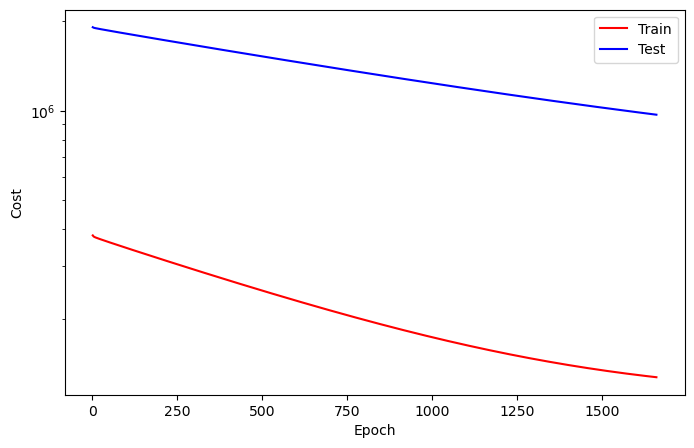

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1661
Train_cost  = 127264.2862 | Test_cost  = 968788.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1662
Train_cost  = 127226.7525 | Test_cost  = 968465.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1663
Train_cost  = 127189.3055 | Test_cost  = 968143.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1664
Train_cost  = 127151.9314 | Test_cost  = 967821.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1665
Train_cost  = 127114.6342 | Test_cost  = 967500.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1666
Train_cost  = 127077.4065 | Test_cost  = 967179.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1667
Train_cost  = 127040.2611 | Test_cost  = 966857.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1668
Train_cost  = 127003.2156 | Test_cost  = 966536.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1669
Train_cost  = 126966.2028 | Test_cost  = 966216.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1670
Train_cost  = 126929.2901 | Test_cost  = 965895.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1671
Train_cost  = 126892.4617 | Test_cost  = 965575.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1672
Train_cost  = 126855.6790 | Test_cost  = 965255.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1673
Train_cost  = 126818.9833 | Test_cost  = 964935.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1674
Train_cost  = 126782.3666 | Test_cost  = 964616.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1675
Train_cost  = 126745.8226 | Test_cost  = 964296.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1676
Train_cost  = 126709.3607 | Test_cost  = 963977.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1677
Train_cost  = 126672.9547 | Test_cost  = 963658.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1678
Train_cost  = 126636.6410 | Test_cost  = 963340.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1679
Train_cost  = 126600.4323 | Test_cost  = 963021.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1680
Train_cost  = 126564.2282 | Test_cost  = 962703.3750 | 


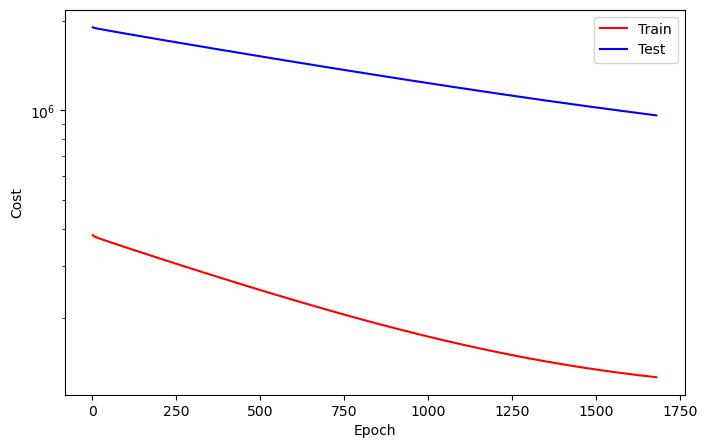

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1681
Train_cost  = 126528.1348 | Test_cost  = 962385.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1682
Train_cost  = 126492.1287 | Test_cost  = 962067.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1683
Train_cost  = 126456.1970 | Test_cost  = 961750.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1684
Train_cost  = 126420.3011 | Test_cost  = 961432.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1685
Train_cost  = 126384.5134 | Test_cost  = 961115.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1686
Train_cost  = 126348.8286 | Test_cost  = 960799.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1687
Train_cost  = 126313.1726 | Test_cost  = 960482.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1688
Train_cost  = 126277.6050 | Test_cost  = 960166.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1689
Train_cost  = 126242.0814 | Test_cost  = 959849.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1690
Train_cost  = 126206.6642 | Test_cost  = 959533.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1691
Train_cost  = 126171.3031 | Test_cost  = 959218.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1692
Train_cost  = 126136.0418 | Test_cost  = 958902.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1693
Train_cost  = 126100.8023 | Test_cost  = 958586.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1694
Train_cost  = 126065.6900 | Test_cost  = 958271.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1695
Train_cost  = 126030.6210 | Test_cost  = 957957.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1696
Train_cost  = 125995.6298 | Test_cost  = 957642.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1697
Train_cost  = 125960.7202 | Test_cost  = 957327.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1698
Train_cost  = 125925.8480 | Test_cost  = 957013.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1699
Train_cost  = 125891.0883 | Test_cost  = 956699.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1700
Train_cost  = 125856.4117 | Test_cost  = 956385.7750 | 


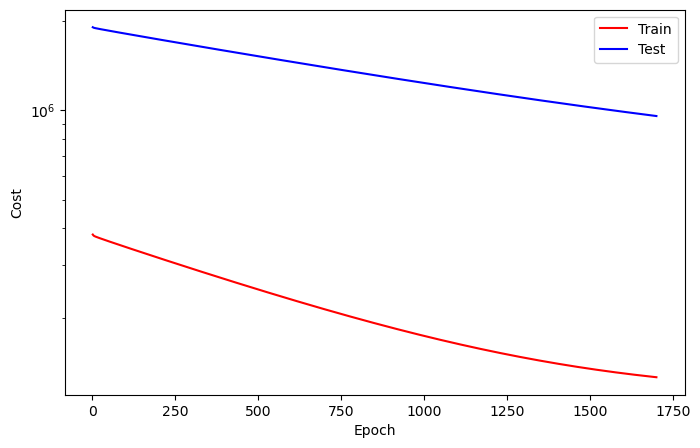

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1701
Train_cost  = 125821.7789 | Test_cost  = 956072.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1702
Train_cost  = 125787.2389 | Test_cost  = 955759.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1703
Train_cost  = 125752.7791 | Test_cost  = 955446.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1704
Train_cost  = 125718.3564 | Test_cost  = 955133.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1705
Train_cost  = 125684.0317 | Test_cost  = 954820.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1706
Train_cost  = 125649.7542 | Test_cost  = 954508.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1707
Train_cost  = 125615.5744 | Test_cost  = 954195.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1708
Train_cost  = 125581.4698 | Test_cost  = 953883.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1709
Train_cost  = 125547.3943 | Test_cost  = 953572.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1710
Train_cost  = 125513.4440 | Test_cost  = 953260.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1711
Train_cost  = 125479.5361 | Test_cost  = 952949.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1712
Train_cost  = 125445.7051 | Test_cost  = 952637.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1713
Train_cost  = 125411.9609 | Test_cost  = 952326.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1714
Train_cost  = 125378.2731 | Test_cost  = 952016.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1715
Train_cost  = 125344.6204 | Test_cost  = 951705.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1716
Train_cost  = 125311.0959 | Test_cost  = 951395.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1717
Train_cost  = 125277.6088 | Test_cost  = 951085.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1718
Train_cost  = 125244.2167 | Test_cost  = 950775.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1719
Train_cost  = 125210.8658 | Test_cost  = 950466.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1720
Train_cost  = 125177.6236 | Test_cost  = 950156.8250 | 


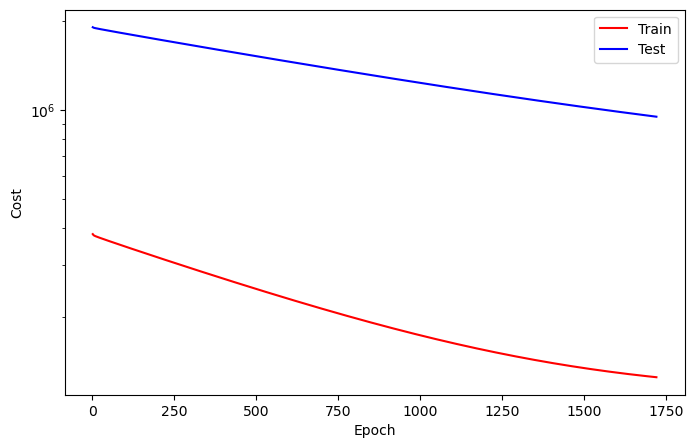

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1721
Train_cost  = 125144.4445 | Test_cost  = 949847.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1722
Train_cost  = 125111.3313 | Test_cost  = 949538.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1723
Train_cost  = 125078.2848 | Test_cost  = 949230.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1724
Train_cost  = 125045.3021 | Test_cost  = 948921.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1725
Train_cost  = 125012.4015 | Test_cost  = 948613.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1726
Train_cost  = 124979.5658 | Test_cost  = 948305.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1727
Train_cost  = 124946.8093 | Test_cost  = 947997.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1728
Train_cost  = 124914.1106 | Test_cost  = 947689.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1729
Train_cost  = 124881.4830 | Test_cost  = 947382.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1730
Train_cost  = 124848.9372 | Test_cost  = 947075.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1731
Train_cost  = 124816.4552 | Test_cost  = 946768.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1732
Train_cost  = 124784.0435 | Test_cost  = 946461.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1733
Train_cost  = 124751.6848 | Test_cost  = 946155.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1734
Train_cost  = 124719.4280 | Test_cost  = 945848.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1735
Train_cost  = 124687.2171 | Test_cost  = 945542.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1736
Train_cost  = 124655.0603 | Test_cost  = 945236.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1737
Train_cost  = 124623.0230 | Test_cost  = 944931.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1738
Train_cost  = 124591.0175 | Test_cost  = 944625.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1739
Train_cost  = 124559.0857 | Test_cost  = 944320.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1740
Train_cost  = 124527.2401 | Test_cost  = 944015.5750 | 


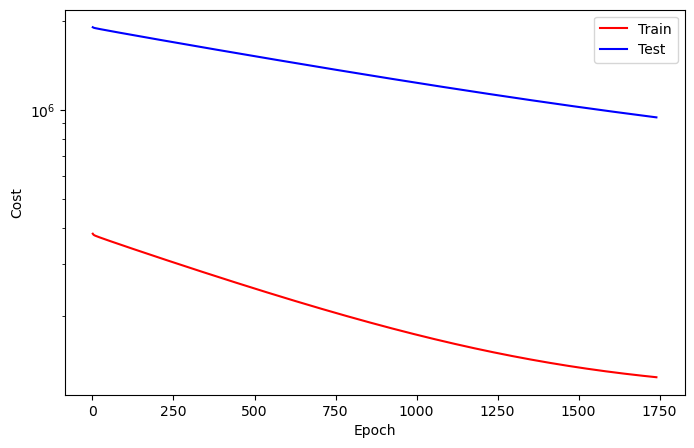

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1741
Train_cost  = 124495.4527 | Test_cost  = 943710.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1742
Train_cost  = 124463.7165 | Test_cost  = 943406.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1743
Train_cost  = 124432.0805 | Test_cost  = 943101.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1744
Train_cost  = 124400.4975 | Test_cost  = 942797.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1745
Train_cost  = 124368.9894 | Test_cost  = 942494.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1746
Train_cost  = 124337.5406 | Test_cost  = 942190.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1747
Train_cost  = 124306.1762 | Test_cost  = 941886.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1748
Train_cost  = 124274.8576 | Test_cost  = 941583.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1749
Train_cost  = 124243.6191 | Test_cost  = 941280.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1750
Train_cost  = 124212.4375 | Test_cost  = 940977.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1751
Train_cost  = 124181.3465 | Test_cost  = 940675.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1752
Train_cost  = 124150.2969 | Test_cost  = 940372.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1753
Train_cost  = 124119.3506 | Test_cost  = 940070.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1754
Train_cost  = 124088.4311 | Test_cost  = 939768.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1755
Train_cost  = 124057.6128 | Test_cost  = 939466.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1756
Train_cost  = 124026.8461 | Test_cost  = 939165.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1757
Train_cost  = 123996.1561 | Test_cost  = 938863.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1758
Train_cost  = 123965.5360 | Test_cost  = 938562.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1759
Train_cost  = 123934.9768 | Test_cost  = 938262.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1760
Train_cost  = 123904.4776 | Test_cost  = 937961.2500 | 


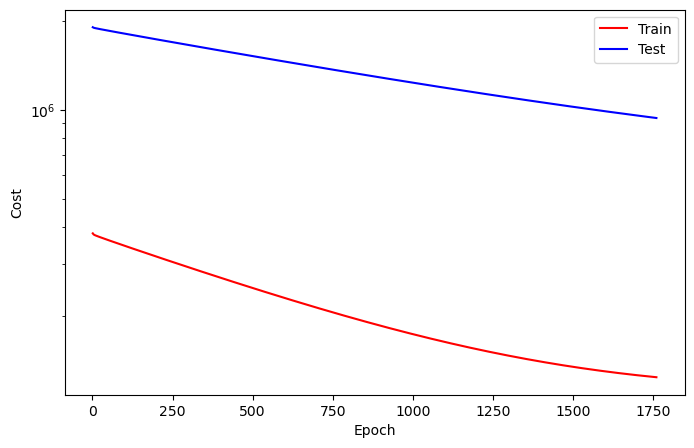

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1761
Train_cost  = 123874.0639 | Test_cost  = 937660.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1762
Train_cost  = 123843.7037 | Test_cost  = 937360.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1763
Train_cost  = 123813.3983 | Test_cost  = 937060.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1764
Train_cost  = 123783.1939 | Test_cost  = 936760.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1765
Train_cost  = 123753.0402 | Test_cost  = 936460.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1766
Train_cost  = 123722.9426 | Test_cost  = 936161.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1767
Train_cost  = 123692.9263 | Test_cost  = 935862.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1768
Train_cost  = 123662.9840 | Test_cost  = 935563.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1769
Train_cost  = 123633.0995 | Test_cost  = 935264.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1770
Train_cost  = 123603.2785 | Test_cost  = 934966.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1771
Train_cost  = 123573.5235 | Test_cost  = 934668.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1772
Train_cost  = 123543.8358 | Test_cost  = 934370.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1773
Train_cost  = 123514.1975 | Test_cost  = 934072.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1774
Train_cost  = 123484.6399 | Test_cost  = 933774.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1775
Train_cost  = 123455.1517 | Test_cost  = 933476.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1776
Train_cost  = 123425.7323 | Test_cost  = 933179.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1777
Train_cost  = 123396.3790 | Test_cost  = 932882.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1778
Train_cost  = 123367.1125 | Test_cost  = 932585.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1779
Train_cost  = 123337.8853 | Test_cost  = 932289.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1780
Train_cost  = 123308.7238 | Test_cost  = 931993.0000 | 


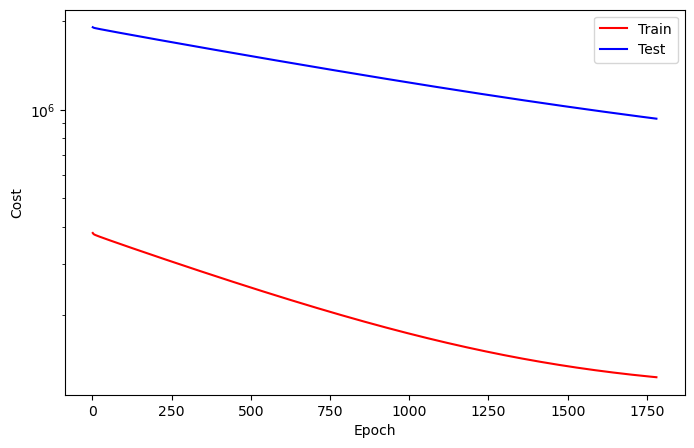

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1781
Train_cost  = 123279.6210 | Test_cost  = 931696.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1782
Train_cost  = 123250.5860 | Test_cost  = 931400.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1783
Train_cost  = 123221.6296 | Test_cost  = 931104.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1784
Train_cost  = 123192.7465 | Test_cost  = 930809.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1785
Train_cost  = 123163.9038 | Test_cost  = 930514.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1786
Train_cost  = 123135.1423 | Test_cost  = 930219.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1787
Train_cost  = 123106.4521 | Test_cost  = 929924.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1788
Train_cost  = 123077.8099 | Test_cost  = 929629.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1789
Train_cost  = 123049.2431 | Test_cost  = 929335.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1790
Train_cost  = 123020.7172 | Test_cost  = 929040.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1791
Train_cost  = 122992.2754 | Test_cost  = 928746.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1792
Train_cost  = 122963.8993 | Test_cost  = 928452.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1793
Train_cost  = 122935.5888 | Test_cost  = 928159.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1794
Train_cost  = 122907.3414 | Test_cost  = 927865.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1795
Train_cost  = 122879.1598 | Test_cost  = 927572.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1796
Train_cost  = 122851.0440 | Test_cost  = 927279.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1797
Train_cost  = 122823.0068 | Test_cost  = 926986.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1798
Train_cost  = 122795.0111 | Test_cost  = 926694.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1799
Train_cost  = 122767.0980 | Test_cost  = 926401.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1800
Train_cost  = 122739.2325 | Test_cost  = 926109.7750 | 


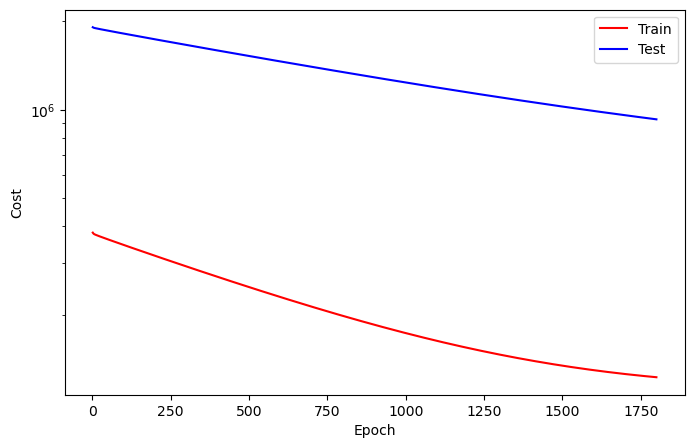

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1801
Train_cost  = 122711.4277 | Test_cost  = 925817.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1802
Train_cost  = 122683.7168 | Test_cost  = 925526.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1803
Train_cost  = 122656.0380 | Test_cost  = 925234.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1804
Train_cost  = 122628.4364 | Test_cost  = 924943.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1805
Train_cost  = 122600.9018 | Test_cost  = 924652.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1806
Train_cost  = 122573.4075 | Test_cost  = 924361.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1807
Train_cost  = 122546.0114 | Test_cost  = 924070.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1808
Train_cost  = 122518.6524 | Test_cost  = 923780.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1809
Train_cost  = 122491.3654 | Test_cost  = 923489.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1810
Train_cost  = 122464.1515 | Test_cost  = 923199.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1811
Train_cost  = 122436.9739 | Test_cost  = 922909.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1812
Train_cost  = 122409.8772 | Test_cost  = 922620.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1813
Train_cost  = 122382.8344 | Test_cost  = 922330.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1814
Train_cost  = 122355.8846 | Test_cost  = 922041.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1815
Train_cost  = 122328.9650 | Test_cost  = 921752.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1816
Train_cost  = 122302.0994 | Test_cost  = 921463.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1817
Train_cost  = 122275.3487 | Test_cost  = 921175.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1818
Train_cost  = 122248.6155 | Test_cost  = 920887.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1819
Train_cost  = 122221.9676 | Test_cost  = 920598.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1820
Train_cost  = 122195.3986 | Test_cost  = 920311.0250 | 


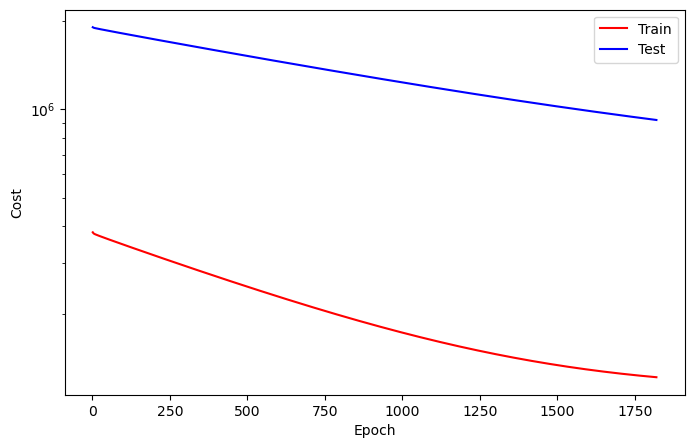

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1821
Train_cost  = 122168.8330 | Test_cost  = 920023.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1822
Train_cost  = 122142.3688 | Test_cost  = 919735.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1823
Train_cost  = 122115.9588 | Test_cost  = 919448.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1824
Train_cost  = 122089.6163 | Test_cost  = 919161.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1825
Train_cost  = 122063.3334 | Test_cost  = 918874.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1826
Train_cost  = 122037.1053 | Test_cost  = 918587.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1827
Train_cost  = 122010.9424 | Test_cost  = 918301.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1828
Train_cost  = 121984.8631 | Test_cost  = 918014.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1829
Train_cost  = 121958.8179 | Test_cost  = 917728.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1830
Train_cost  = 121932.8492 | Test_cost  = 917442.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1831
Train_cost  = 121906.9370 | Test_cost  = 917157.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1832
Train_cost  = 121881.0623 | Test_cost  = 916871.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1833
Train_cost  = 121855.2781 | Test_cost  = 916586.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1834
Train_cost  = 121829.5609 | Test_cost  = 916301.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1835
Train_cost  = 121803.9077 | Test_cost  = 916016.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1836
Train_cost  = 121778.2948 | Test_cost  = 915731.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1837
Train_cost  = 121752.7520 | Test_cost  = 915447.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1838
Train_cost  = 121727.2486 | Test_cost  = 915163.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1839
Train_cost  = 121701.8199 | Test_cost  = 914879.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1840
Train_cost  = 121676.4704 | Test_cost  = 914595.3750 | 


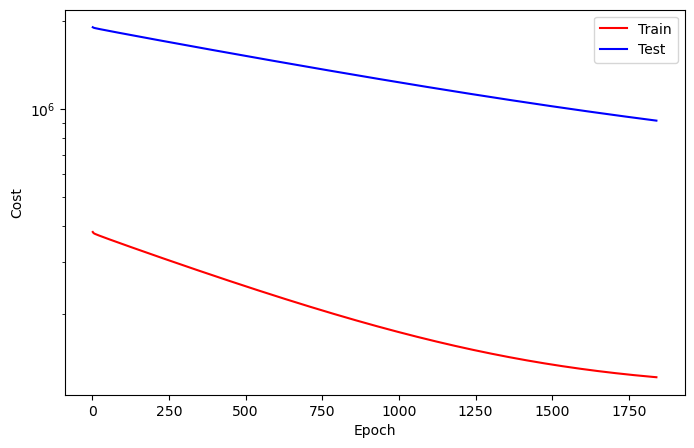

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1841
Train_cost  = 121651.1644 | Test_cost  = 914312.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1842
Train_cost  = 121625.9407 | Test_cost  = 914028.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1843
Train_cost  = 121600.7352 | Test_cost  = 913745.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1844
Train_cost  = 121575.6287 | Test_cost  = 913462.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1845
Train_cost  = 121550.5721 | Test_cost  = 913179.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1846
Train_cost  = 121525.5781 | Test_cost  = 912896.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1847
Train_cost  = 121500.6201 | Test_cost  = 912614.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1848
Train_cost  = 121475.7403 | Test_cost  = 912332.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1849
Train_cost  = 121450.9233 | Test_cost  = 912050.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1850
Train_cost  = 121426.1707 | Test_cost  = 911768.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1851
Train_cost  = 121401.4664 | Test_cost  = 911487.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1852
Train_cost  = 121376.8384 | Test_cost  = 911205.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1853
Train_cost  = 121352.2488 | Test_cost  = 910924.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1854
Train_cost  = 121327.7171 | Test_cost  = 910643.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1855
Train_cost  = 121303.2426 | Test_cost  = 910363.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1856
Train_cost  = 121278.8547 | Test_cost  = 910082.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1857
Train_cost  = 121254.5194 | Test_cost  = 909802.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1858
Train_cost  = 121230.2526 | Test_cost  = 909522.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1859
Train_cost  = 121206.0220 | Test_cost  = 909242.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1860
Train_cost  = 121181.8395 | Test_cost  = 908962.7000 | 


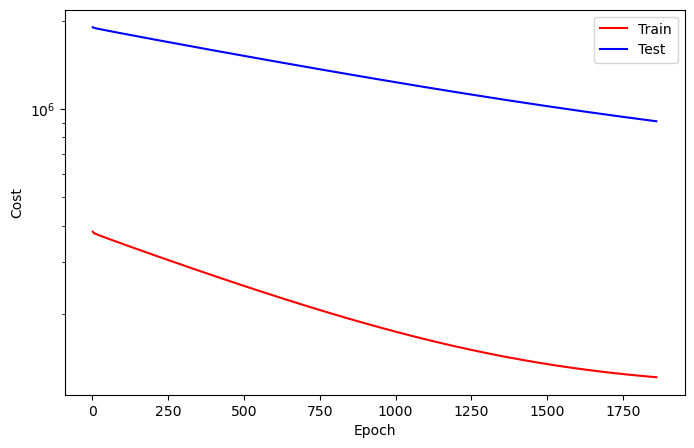

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1861
Train_cost  = 121157.7432 | Test_cost  = 908683.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1862
Train_cost  = 121133.7080 | Test_cost  = 908403.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1863
Train_cost  = 121109.7197 | Test_cost  = 908124.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1864
Train_cost  = 121085.8017 | Test_cost  = 907845.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1865
Train_cost  = 121063.8764 | Test_cost  = 907567.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1866
Train_cost  = 121038.0901 | Test_cost  = 907288.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1867
Train_cost  = 121014.3656 | Test_cost  = 907010.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1868
Train_cost  = 120990.6860 | Test_cost  = 906732.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1869
Train_cost  = 120967.0608 | Test_cost  = 906454.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1870
Train_cost  = 120943.4643 | Test_cost  = 906176.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1871
Train_cost  = 120919.9517 | Test_cost  = 905899.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1872
Train_cost  = 120896.4983 | Test_cost  = 905622.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1873
Train_cost  = 120873.1004 | Test_cost  = 905345.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1874
Train_cost  = 120849.7564 | Test_cost  = 905068.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1875
Train_cost  = 120826.4597 | Test_cost  = 904791.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1876
Train_cost  = 120803.2635 | Test_cost  = 904515.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1877
Train_cost  = 120780.0749 | Test_cost  = 904238.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1878
Train_cost  = 120756.9615 | Test_cost  = 903962.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1879
Train_cost  = 120733.9214 | Test_cost  = 903687.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1880
Train_cost  = 120710.9175 | Test_cost  = 903411.5000 | 


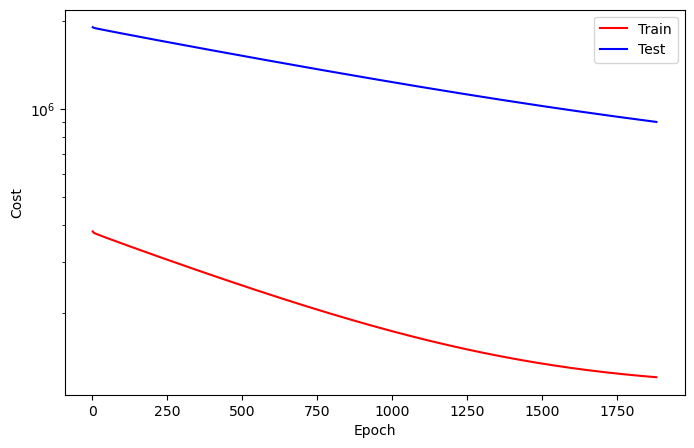

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1881
Train_cost  = 120687.9726 | Test_cost  = 903136.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1882
Train_cost  = 120665.1236 | Test_cost  = 902860.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1883
Train_cost  = 120642.2714 | Test_cost  = 902585.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1884
Train_cost  = 120619.5306 | Test_cost  = 902310.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1885
Train_cost  = 120596.8137 | Test_cost  = 902036.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1886
Train_cost  = 120574.1538 | Test_cost  = 901762.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1887
Train_cost  = 120551.5657 | Test_cost  = 901487.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1888
Train_cost  = 120529.0363 | Test_cost  = 901213.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1889
Train_cost  = 120506.5492 | Test_cost  = 900940.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1890
Train_cost  = 120484.1138 | Test_cost  = 900666.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1891
Train_cost  = 120461.7618 | Test_cost  = 900392.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1892
Train_cost  = 120439.4569 | Test_cost  = 900119.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1893
Train_cost  = 120417.2024 | Test_cost  = 899846.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1894
Train_cost  = 120394.9982 | Test_cost  = 899573.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1895
Train_cost  = 120372.8381 | Test_cost  = 899301.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1896
Train_cost  = 120350.7540 | Test_cost  = 899028.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1897
Train_cost  = 120328.7423 | Test_cost  = 898756.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1898
Train_cost  = 120306.7681 | Test_cost  = 898484.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1899
Train_cost  = 120284.8640 | Test_cost  = 898212.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1900
Train_cost  = 120262.9892 | Test_cost  = 897941.1500 | 


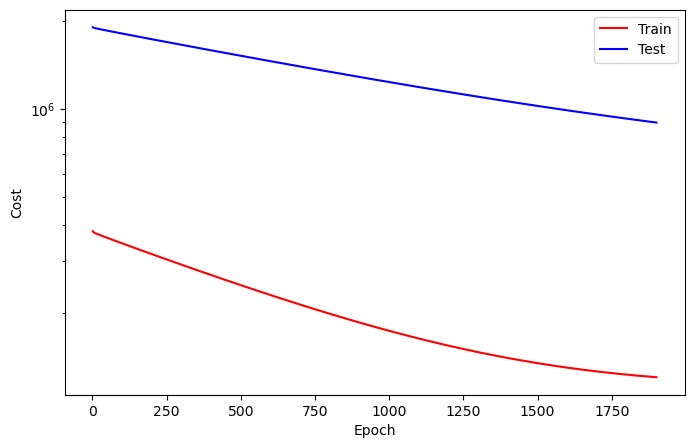

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1901
Train_cost  = 120241.1999 | Test_cost  = 897669.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1902
Train_cost  = 120219.4425 | Test_cost  = 897398.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1903
Train_cost  = 120197.7564 | Test_cost  = 897127.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1904
Train_cost  = 120176.0976 | Test_cost  = 896856.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1905
Train_cost  = 120154.5233 | Test_cost  = 896586.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1906
Train_cost  = 120133.0100 | Test_cost  = 896315.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1907
Train_cost  = 120111.5273 | Test_cost  = 896045.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1908
Train_cost  = 120090.1318 | Test_cost  = 895775.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1909
Train_cost  = 120068.7630 | Test_cost  = 895505.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1910
Train_cost  = 120047.4565 | Test_cost  = 895236.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1911
Train_cost  = 120026.2140 | Test_cost  = 894966.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1912
Train_cost  = 120005.0384 | Test_cost  = 894697.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1913
Train_cost  = 119983.8937 | Test_cost  = 894428.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1914
Train_cost  = 119962.7931 | Test_cost  = 894159.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1915
Train_cost  = 119941.7743 | Test_cost  = 893890.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1916
Train_cost  = 119920.8034 | Test_cost  = 893622.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1917
Train_cost  = 119899.8727 | Test_cost  = 893354.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1918
Train_cost  = 119879.0397 | Test_cost  = 893086.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1919
Train_cost  = 119858.2066 | Test_cost  = 892818.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1920
Train_cost  = 119837.4620 | Test_cost  = 892550.7000 | 


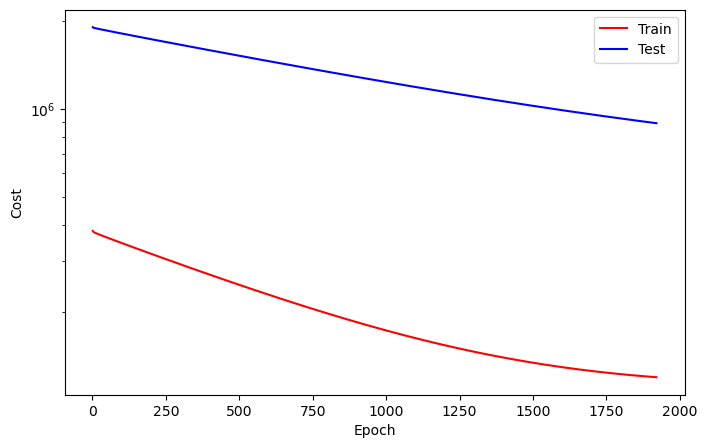

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1921
Train_cost  = 119816.7418 | Test_cost  = 892283.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1922
Train_cost  = 119796.1237 | Test_cost  = 892016.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1923
Train_cost  = 119775.5248 | Test_cost  = 891749.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1924
Train_cost  = 119754.9720 | Test_cost  = 891482.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1925
Train_cost  = 119734.5049 | Test_cost  = 891215.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1926
Train_cost  = 119714.0618 | Test_cost  = 890949.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1927
Train_cost  = 119693.6977 | Test_cost  = 890683.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1928
Train_cost  = 119673.3746 | Test_cost  = 890417.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1929
Train_cost  = 119653.1028 | Test_cost  = 890151.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1930
Train_cost  = 119632.9161 | Test_cost  = 889885.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1931
Train_cost  = 119612.7435 | Test_cost  = 889619.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1932
Train_cost  = 119592.6283 | Test_cost  = 889354.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1933
Train_cost  = 119572.5723 | Test_cost  = 889089.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1934
Train_cost  = 119552.5780 | Test_cost  = 888824.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1935
Train_cost  = 119532.6057 | Test_cost  = 888560.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1936
Train_cost  = 119512.7530 | Test_cost  = 888295.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1937
Train_cost  = 119492.8909 | Test_cost  = 888031.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1938
Train_cost  = 119473.1209 | Test_cost  = 887767.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1939
Train_cost  = 119453.3752 | Test_cost  = 887503.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1940
Train_cost  = 119433.6832 | Test_cost  = 887239.5750 | 


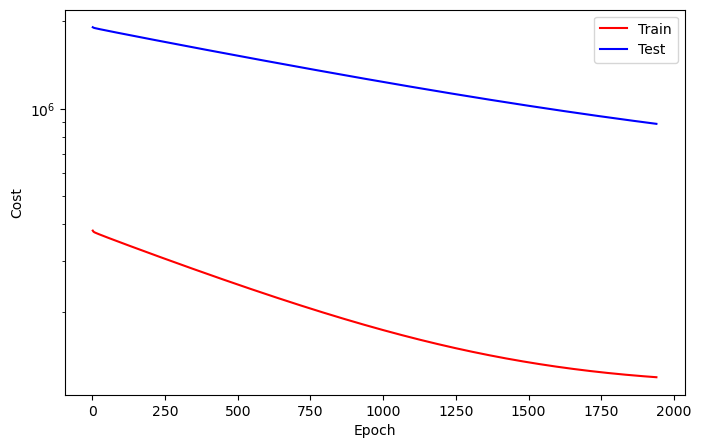

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1941
Train_cost  = 119414.0571 | Test_cost  = 886976.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1942
Train_cost  = 119394.5010 | Test_cost  = 886712.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1943
Train_cost  = 119374.9788 | Test_cost  = 886449.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1944
Train_cost  = 119355.5197 | Test_cost  = 886186.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1945
Train_cost  = 119336.0826 | Test_cost  = 885924.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1946
Train_cost  = 119316.7191 | Test_cost  = 885661.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1947
Train_cost  = 119297.4220 | Test_cost  = 885399.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1948
Train_cost  = 119278.1625 | Test_cost  = 885137.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1949
Train_cost  = 119258.9482 | Test_cost  = 884875.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1950
Train_cost  = 119239.8045 | Test_cost  = 884613.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1951
Train_cost  = 119220.6894 | Test_cost  = 884351.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1952
Train_cost  = 119201.6270 | Test_cost  = 884090.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1953
Train_cost  = 119182.6377 | Test_cost  = 883829.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1954
Train_cost  = 119163.6987 | Test_cost  = 883568.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1955
Train_cost  = 119144.7995 | Test_cost  = 883307.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1956
Train_cost  = 119125.9367 | Test_cost  = 883046.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1957
Train_cost  = 119107.1552 | Test_cost  = 882786.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1958
Train_cost  = 119088.4379 | Test_cost  = 882526.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1959
Train_cost  = 119069.7395 | Test_cost  = 882266.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1960
Train_cost  = 119051.0868 | Test_cost  = 882006.5000 | 


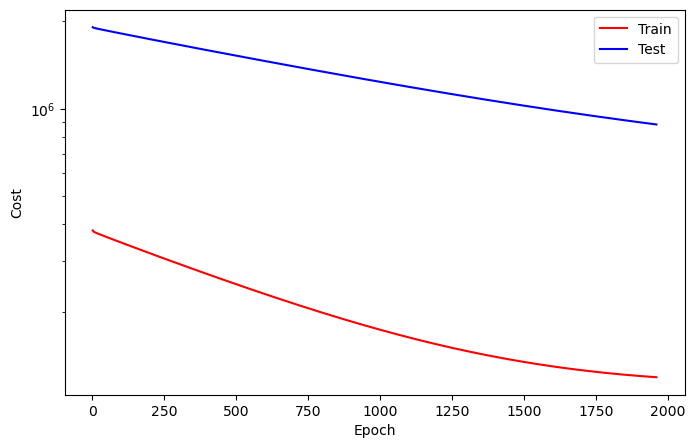

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1961
Train_cost  = 119032.4929 | Test_cost  = 881746.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1962
Train_cost  = 119013.9788 | Test_cost  = 881487.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1963
Train_cost  = 118995.5122 | Test_cost  = 881228.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1964
Train_cost  = 118977.0667 | Test_cost  = 880969.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1965
Train_cost  = 118958.6861 | Test_cost  = 880710.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1966
Train_cost  = 118940.3543 | Test_cost  = 880451.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1967
Train_cost  = 118922.0949 | Test_cost  = 880193.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1968
Train_cost  = 118903.8451 | Test_cost  = 879935.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1969
Train_cost  = 118885.6926 | Test_cost  = 879677.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1970
Train_cost  = 118867.5593 | Test_cost  = 879419.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1971
Train_cost  = 118849.4875 | Test_cost  = 879161.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1972
Train_cost  = 118831.4605 | Test_cost  = 878903.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1973
Train_cost  = 118813.4769 | Test_cost  = 878646.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1974
Train_cost  = 118795.5705 | Test_cost  = 878389.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1975
Train_cost  = 118777.6902 | Test_cost  = 878132.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1976
Train_cost  = 118759.8617 | Test_cost  = 877875.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1977
Train_cost  = 118742.0889 | Test_cost  = 877619.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1978
Train_cost  = 118724.3690 | Test_cost  = 877362.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1979
Train_cost  = 118706.6955 | Test_cost  = 877106.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1980
Train_cost  = 118689.0768 | Test_cost  = 876850.7750 | 


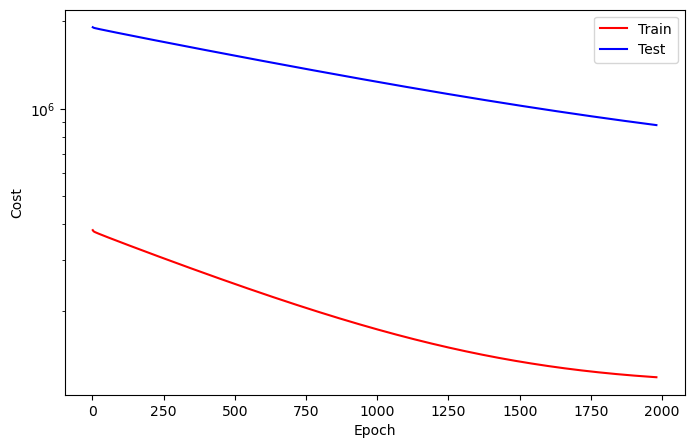

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1981
Train_cost  = 118671.4990 | Test_cost  = 876594.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1982
Train_cost  = 118653.9836 | Test_cost  = 876339.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1983
Train_cost  = 118636.4922 | Test_cost  = 876083.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1984
Train_cost  = 118619.0804 | Test_cost  = 875828.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1985
Train_cost  = 118601.7200 | Test_cost  = 875573.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1986
Train_cost  = 118584.3762 | Test_cost  = 875319.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1987
Train_cost  = 118567.1127 | Test_cost  = 875064.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1988
Train_cost  = 118549.8906 | Test_cost  = 874810.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1989
Train_cost  = 118532.7271 | Test_cost  = 874555.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1990
Train_cost  = 118515.5844 | Test_cost  = 874301.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1991
Train_cost  = 118498.5050 | Test_cost  = 874047.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1992
Train_cost  = 118481.4969 | Test_cost  = 873794.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1993
Train_cost  = 118464.5057 | Test_cost  = 873540.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1994
Train_cost  = 118447.5862 | Test_cost  = 873287.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1995
Train_cost  = 118430.6999 | Test_cost  = 873034.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1996
Train_cost  = 118413.8799 | Test_cost  = 872781.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1997
Train_cost  = 118397.0952 | Test_cost  = 872528.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1998
Train_cost  = 118380.3610 | Test_cost  = 872276.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  1999
Train_cost  = 118363.6604 | Test_cost  = 872023.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2000
Train_cost  = 118347.0365 | Test_cost  = 871771.5750 | 


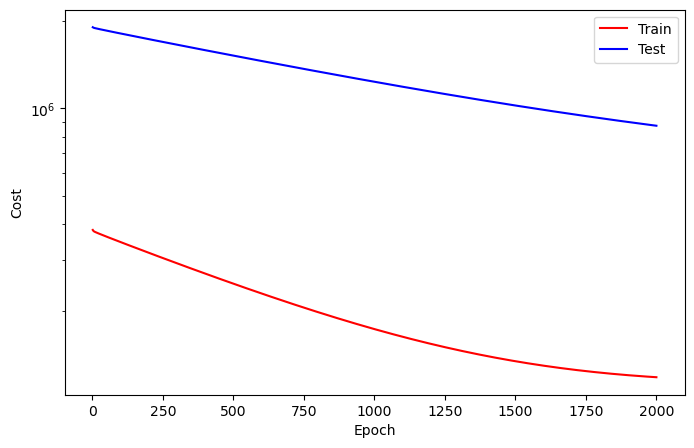

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2001
Train_cost  = 118330.4352 | Test_cost  = 871519.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2002
Train_cost  = 118313.9019 | Test_cost  = 871267.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2003
Train_cost  = 118297.4192 | Test_cost  = 871016.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2004
Train_cost  = 118280.9649 | Test_cost  = 870764.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2005
Train_cost  = 118264.5736 | Test_cost  = 870513.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2006
Train_cost  = 118248.2379 | Test_cost  = 870262.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2007
Train_cost  = 118231.9097 | Test_cost  = 870011.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2008
Train_cost  = 118215.6767 | Test_cost  = 869761.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2009
Train_cost  = 118199.4707 | Test_cost  = 869510.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2010
Train_cost  = 118183.3239 | Test_cost  = 869260.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2011
Train_cost  = 118167.2250 | Test_cost  = 869010.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2012
Train_cost  = 118151.1545 | Test_cost  = 868760.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2013
Train_cost  = 118135.1500 | Test_cost  = 868510.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2014
Train_cost  = 118119.1976 | Test_cost  = 868261.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2015
Train_cost  = 118103.2752 | Test_cost  = 868012.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2016
Train_cost  = 118087.3812 | Test_cost  = 867762.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2017
Train_cost  = 118071.5810 | Test_cost  = 867514.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2018
Train_cost  = 118055.8140 | Test_cost  = 867265.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2019
Train_cost  = 118040.0912 | Test_cost  = 867016.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2020
Train_cost  = 118024.4127 | Test_cost  = 866768.2500 | 


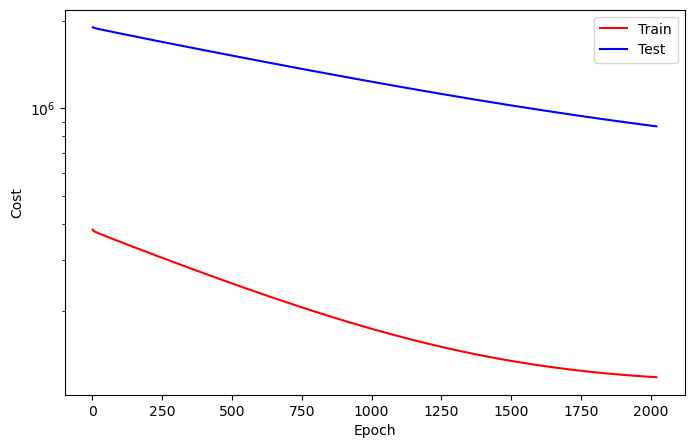

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2021
Train_cost  = 118008.7572 | Test_cost  = 866519.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2022
Train_cost  = 117993.1873 | Test_cost  = 866272.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2023
Train_cost  = 117977.6385 | Test_cost  = 866024.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2024
Train_cost  = 117962.1465 | Test_cost  = 865776.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2025
Train_cost  = 117946.7076 | Test_cost  = 865528.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2026
Train_cost  = 117931.3022 | Test_cost  = 865281.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2027
Train_cost  = 117915.9593 | Test_cost  = 865034.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2028
Train_cost  = 117900.6507 | Test_cost  = 864787.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2029
Train_cost  = 117885.3893 | Test_cost  = 864541.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2030
Train_cost  = 117870.1826 | Test_cost  = 864294.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2031
Train_cost  = 117855.0085 | Test_cost  = 864048.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2032
Train_cost  = 117839.9031 | Test_cost  = 863802.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2033
Train_cost  = 117824.8222 | Test_cost  = 863556.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2034
Train_cost  = 117809.7900 | Test_cost  = 863310.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2035
Train_cost  = 117794.8451 | Test_cost  = 863064.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2036
Train_cost  = 117779.8706 | Test_cost  = 862819.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2037
Train_cost  = 117764.9974 | Test_cost  = 862574.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2038
Train_cost  = 117750.1547 | Test_cost  = 862329.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2039
Train_cost  = 117735.3513 | Test_cost  = 862084.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2040
Train_cost  = 117720.6105 | Test_cost  = 861839.7500 | 


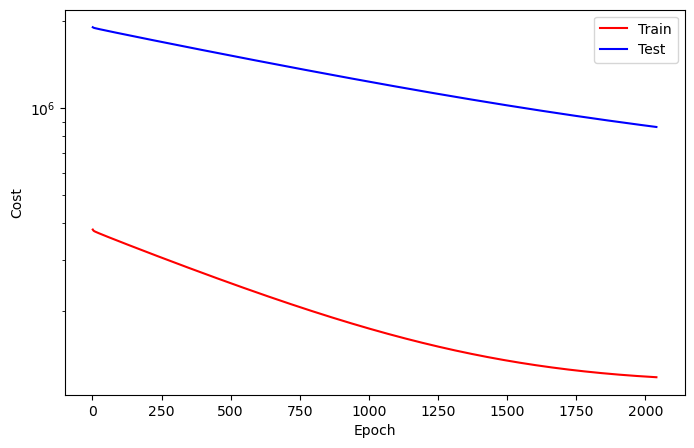

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2041
Train_cost  = 117705.8965 | Test_cost  = 861595.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2042
Train_cost  = 117691.2528 | Test_cost  = 861350.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2043
Train_cost  = 117676.6190 | Test_cost  = 861106.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2044
Train_cost  = 117662.0586 | Test_cost  = 860862.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2045
Train_cost  = 117647.5235 | Test_cost  = 860619.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2046
Train_cost  = 117633.0472 | Test_cost  = 860375.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2047
Train_cost  = 117618.6418 | Test_cost  = 860132.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2048
Train_cost  = 117604.2400 | Test_cost  = 859888.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2049
Train_cost  = 117589.8890 | Test_cost  = 859645.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2050
Train_cost  = 117575.5920 | Test_cost  = 859402.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2051
Train_cost  = 117561.3432 | Test_cost  = 859160.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2052
Train_cost  = 117547.1300 | Test_cost  = 858918.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2053
Train_cost  = 117532.9700 | Test_cost  = 858675.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2054
Train_cost  = 117518.8622 | Test_cost  = 858433.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2055
Train_cost  = 117504.7805 | Test_cost  = 858191.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2056
Train_cost  = 117490.7539 | Test_cost  = 857950.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2057
Train_cost  = 117476.7604 | Test_cost  = 857708.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2058
Train_cost  = 117462.8332 | Test_cost  = 857467.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2059
Train_cost  = 117448.9291 | Test_cost  = 857225.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2060
Train_cost  = 117435.0795 | Test_cost  = 856984.7500 | 


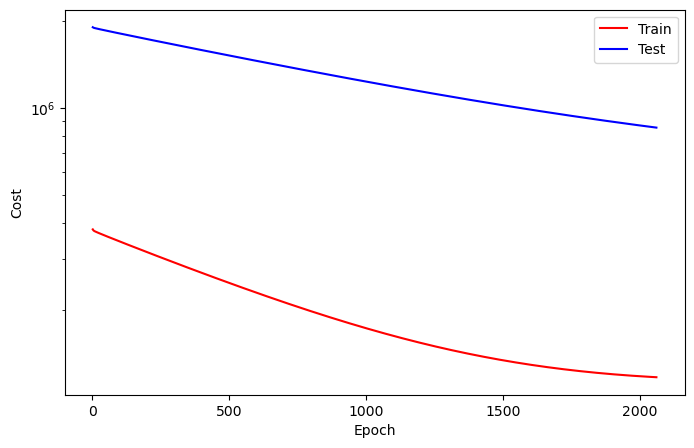

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2061
Train_cost  = 117421.2840 | Test_cost  = 856744.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2062
Train_cost  = 117407.5212 | Test_cost  = 856503.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2063
Train_cost  = 117393.7866 | Test_cost  = 856262.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2064
Train_cost  = 117380.1256 | Test_cost  = 856022.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2065
Train_cost  = 117366.5010 | Test_cost  = 855782.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2066
Train_cost  = 117352.9079 | Test_cost  = 855542.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2067
Train_cost  = 117339.3632 | Test_cost  = 855302.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2068
Train_cost  = 117325.8663 | Test_cost  = 855063.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2069
Train_cost  = 117312.4117 | Test_cost  = 854824.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2070
Train_cost  = 117298.9931 | Test_cost  = 854584.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2071
Train_cost  = 117285.6405 | Test_cost  = 854345.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2072
Train_cost  = 117272.3057 | Test_cost  = 854106.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2073
Train_cost  = 117259.0282 | Test_cost  = 853868.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2074
Train_cost  = 117245.7907 | Test_cost  = 853629.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2075
Train_cost  = 117232.5849 | Test_cost  = 853391.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2076
Train_cost  = 117219.4466 | Test_cost  = 853153.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2077
Train_cost  = 117206.3279 | Test_cost  = 852915.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2078
Train_cost  = 117193.2712 | Test_cost  = 852678.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2079
Train_cost  = 117180.2734 | Test_cost  = 852440.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2080
Train_cost  = 117167.2758 | Test_cost  = 852203.2250 | 


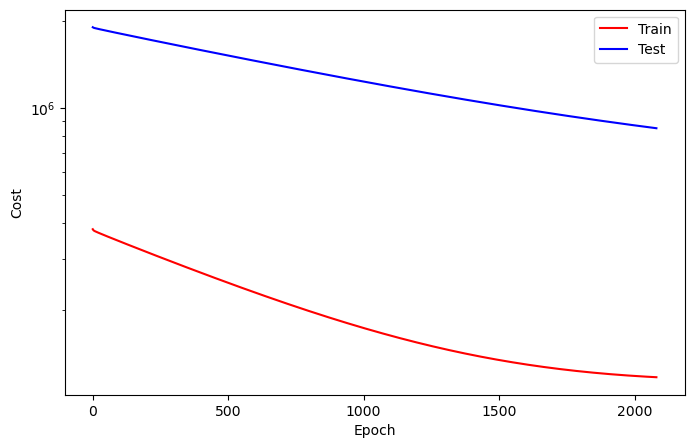

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2081
Train_cost  = 117154.3524 | Test_cost  = 851965.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2082
Train_cost  = 117141.4611 | Test_cost  = 851728.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2083
Train_cost  = 117128.6173 | Test_cost  = 851492.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2084
Train_cost  = 117115.7911 | Test_cost  = 851255.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2085
Train_cost  = 117103.0556 | Test_cost  = 851019.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2086
Train_cost  = 117090.3152 | Test_cost  = 850782.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2087
Train_cost  = 117077.6277 | Test_cost  = 850546.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2088
Train_cost  = 117065.0086 | Test_cost  = 850310.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2089
Train_cost  = 117052.4310 | Test_cost  = 850074.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2090
Train_cost  = 117039.8654 | Test_cost  = 849839.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2091
Train_cost  = 117027.3440 | Test_cost  = 849603.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2092
Train_cost  = 117014.8803 | Test_cost  = 849368.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2093
Train_cost  = 117002.4556 | Test_cost  = 849133.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2094
Train_cost  = 116990.0715 | Test_cost  = 848898.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2095
Train_cost  = 116977.7536 | Test_cost  = 848664.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2096
Train_cost  = 116965.4396 | Test_cost  = 848429.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2097
Train_cost  = 116953.1802 | Test_cost  = 848195.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2098
Train_cost  = 116940.9701 | Test_cost  = 847961.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2099
Train_cost  = 116928.8133 | Test_cost  = 847727.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2100
Train_cost  = 116916.6692 | Test_cost  = 847493.4500 | 


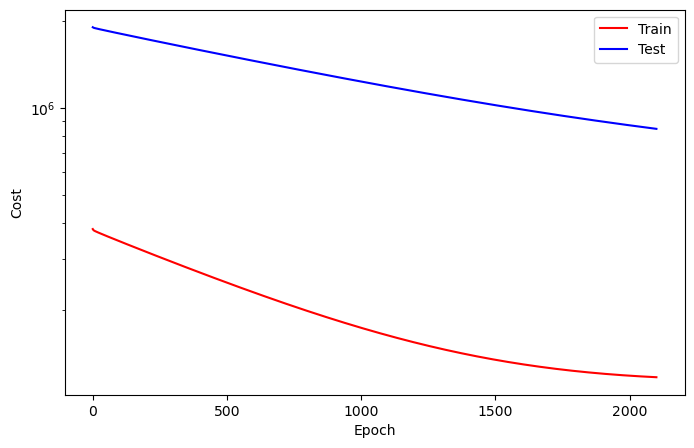

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2101
Train_cost  = 116904.5920 | Test_cost  = 847259.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2102
Train_cost  = 116892.5318 | Test_cost  = 847026.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2103
Train_cost  = 116880.5403 | Test_cost  = 846793.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2104
Train_cost  = 116868.5702 | Test_cost  = 846560.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2105
Train_cost  = 116856.6422 | Test_cost  = 846327.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2106
Train_cost  = 116844.7639 | Test_cost  = 846094.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2107
Train_cost  = 116832.9178 | Test_cost  = 845861.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2108
Train_cost  = 116821.1279 | Test_cost  = 845629.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2109
Train_cost  = 116809.3713 | Test_cost  = 845397.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2110
Train_cost  = 116797.6501 | Test_cost  = 845165.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2111
Train_cost  = 116785.9799 | Test_cost  = 844933.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2112
Train_cost  = 116774.3399 | Test_cost  = 844702.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2113
Train_cost  = 116762.7556 | Test_cost  = 844470.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2114
Train_cost  = 116751.1975 | Test_cost  = 844239.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2115
Train_cost  = 116739.6852 | Test_cost  = 844008.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2116
Train_cost  = 116728.2083 | Test_cost  = 843777.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2117
Train_cost  = 116716.7650 | Test_cost  = 843546.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2118
Train_cost  = 116705.3754 | Test_cost  = 843315.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2119
Train_cost  = 116694.0448 | Test_cost  = 843085.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2120
Train_cost  = 116682.7257 | Test_cost  = 842855.0750 | 


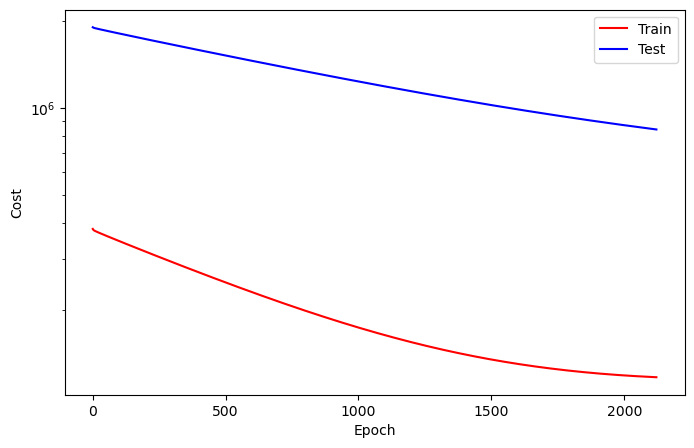

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2121
Train_cost  = 116671.4618 | Test_cost  = 842625.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2122
Train_cost  = 116660.2132 | Test_cost  = 842395.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2123
Train_cost  = 116649.0361 | Test_cost  = 842165.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2124
Train_cost  = 116637.8902 | Test_cost  = 841936.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2125
Train_cost  = 116626.7685 | Test_cost  = 841706.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2126
Train_cost  = 116615.7105 | Test_cost  = 841477.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2127
Train_cost  = 116604.6809 | Test_cost  = 841248.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2128
Train_cost  = 116593.6875 | Test_cost  = 841019.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2129
Train_cost  = 116582.7419 | Test_cost  = 840790.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2130
Train_cost  = 116571.8314 | Test_cost  = 840562.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2131
Train_cost  = 116560.9620 | Test_cost  = 840334.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2132
Train_cost  = 116550.1267 | Test_cost  = 840106.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2133
Train_cost  = 116539.3511 | Test_cost  = 839878.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2134
Train_cost  = 116528.6040 | Test_cost  = 839650.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2135
Train_cost  = 116517.8885 | Test_cost  = 839422.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2136
Train_cost  = 116507.1935 | Test_cost  = 839195.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2137
Train_cost  = 116496.5720 | Test_cost  = 838968.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2138
Train_cost  = 116485.9751 | Test_cost  = 838740.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2139
Train_cost  = 116475.4259 | Test_cost  = 838514.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2140
Train_cost  = 116464.9120 | Test_cost  = 838287.2000 | 


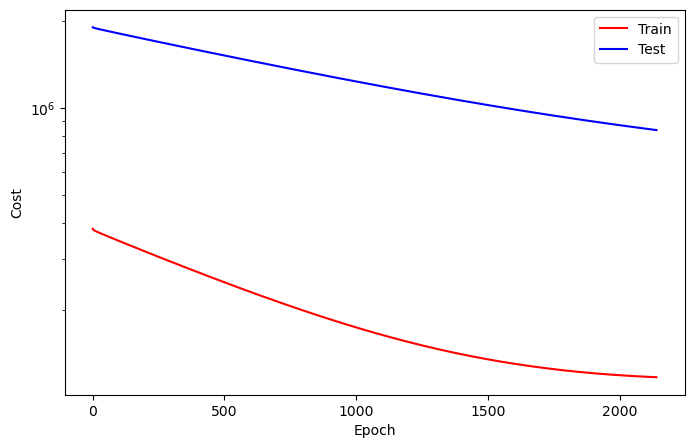

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2141
Train_cost  = 116454.4198 | Test_cost  = 838060.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2142
Train_cost  = 116443.9826 | Test_cost  = 837834.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2143
Train_cost  = 116433.5822 | Test_cost  = 837608.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2144
Train_cost  = 116423.2247 | Test_cost  = 837381.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2145
Train_cost  = 116412.9259 | Test_cost  = 837156.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2146
Train_cost  = 116402.6229 | Test_cost  = 836930.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2147
Train_cost  = 116392.4035 | Test_cost  = 836704.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2148
Train_cost  = 116382.1767 | Test_cost  = 836479.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2149
Train_cost  = 116372.0287 | Test_cost  = 836254.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2150
Train_cost  = 116361.8945 | Test_cost  = 836029.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2151
Train_cost  = 116351.7957 | Test_cost  = 835804.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2152
Train_cost  = 116341.7492 | Test_cost  = 835580.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2153
Train_cost  = 116331.7336 | Test_cost  = 835355.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2154
Train_cost  = 116321.7656 | Test_cost  = 835131.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2155
Train_cost  = 116311.8372 | Test_cost  = 834907.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2156
Train_cost  = 116301.9394 | Test_cost  = 834683.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2157
Train_cost  = 116292.0949 | Test_cost  = 834459.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2158
Train_cost  = 116282.2448 | Test_cost  = 834235.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2159
Train_cost  = 116272.4633 | Test_cost  = 834012.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2160
Train_cost  = 116262.7249 | Test_cost  = 833788.9750 | 


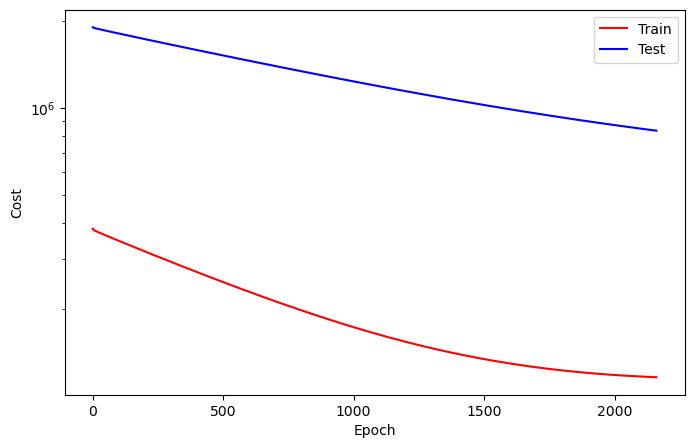

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2161
Train_cost  = 116253.0071 | Test_cost  = 833565.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2162
Train_cost  = 116243.3457 | Test_cost  = 833342.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2163
Train_cost  = 116233.7060 | Test_cost  = 833120.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2164
Train_cost  = 116224.1123 | Test_cost  = 832897.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2165
Train_cost  = 116214.5714 | Test_cost  = 832675.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2166
Train_cost  = 116205.0374 | Test_cost  = 832452.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2167
Train_cost  = 116195.5532 | Test_cost  = 832231.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2168
Train_cost  = 116186.1182 | Test_cost  = 832009.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2169
Train_cost  = 116176.7024 | Test_cost  = 831787.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2170
Train_cost  = 116167.3229 | Test_cost  = 831565.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2171
Train_cost  = 116157.9969 | Test_cost  = 831344.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2172
Train_cost  = 116148.7043 | Test_cost  = 831123.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2173
Train_cost  = 116139.4448 | Test_cost  = 830902.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2174
Train_cost  = 116130.2242 | Test_cost  = 830681.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2175
Train_cost  = 116121.0438 | Test_cost  = 830460.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2176
Train_cost  = 116111.8962 | Test_cost  = 830240.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2177
Train_cost  = 116102.7838 | Test_cost  = 830019.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2178
Train_cost  = 116093.7078 | Test_cost  = 829799.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2179
Train_cost  = 116084.6555 | Test_cost  = 829579.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2180
Train_cost  = 116075.6692 | Test_cost  = 829359.7500 | 


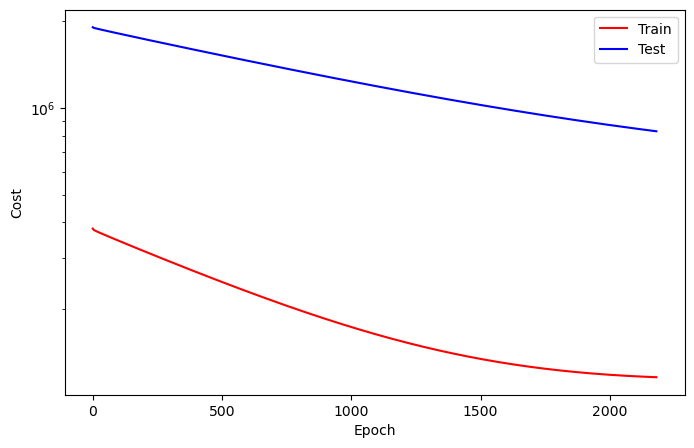

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2181
Train_cost  = 116066.7133 | Test_cost  = 829140.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2182
Train_cost  = 116057.7674 | Test_cost  = 828920.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2183
Train_cost  = 116048.8989 | Test_cost  = 828701.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2184
Train_cost  = 116040.0478 | Test_cost  = 828481.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2185
Train_cost  = 116031.2292 | Test_cost  = 828263.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2186
Train_cost  = 116022.4375 | Test_cost  = 828044.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2187
Train_cost  = 116013.6889 | Test_cost  = 827825.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2188
Train_cost  = 116004.9659 | Test_cost  = 827606.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2189
Train_cost  = 115996.3181 | Test_cost  = 827388.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2190
Train_cost  = 115987.6628 | Test_cost  = 827170.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2191
Train_cost  = 115979.0667 | Test_cost  = 826952.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2192
Train_cost  = 115970.5037 | Test_cost  = 826734.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2193
Train_cost  = 115961.9676 | Test_cost  = 826516.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2194
Train_cost  = 115953.4614 | Test_cost  = 826299.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2195
Train_cost  = 115945.0172 | Test_cost  = 826082.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2196
Train_cost  = 115936.6065 | Test_cost  = 825865.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2197
Train_cost  = 115928.2226 | Test_cost  = 825648.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2198
Train_cost  = 115919.8557 | Test_cost  = 825431.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2199
Train_cost  = 115911.5569 | Test_cost  = 825214.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2200
Train_cost  = 115903.2631 | Test_cost  = 824998.1500 | 


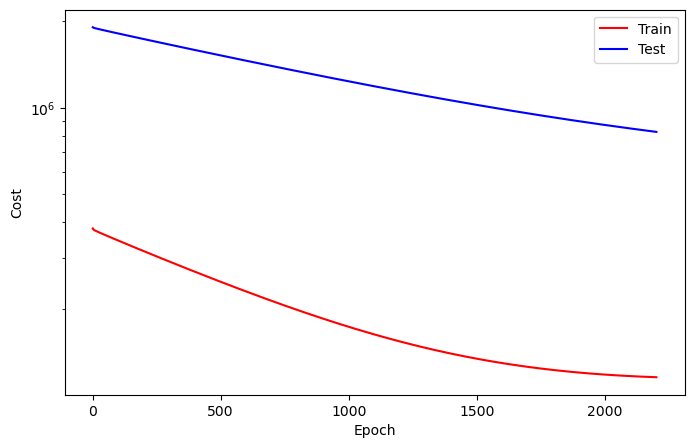

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2201
Train_cost  = 115895.0179 | Test_cost  = 824781.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2202
Train_cost  = 115886.8148 | Test_cost  = 824565.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2203
Train_cost  = 115878.6354 | Test_cost  = 824349.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2204
Train_cost  = 115870.4909 | Test_cost  = 824133.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2205
Train_cost  = 115862.3893 | Test_cost  = 823918.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2206
Train_cost  = 115854.3306 | Test_cost  = 823702.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2207
Train_cost  = 115846.2969 | Test_cost  = 823487.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2208
Train_cost  = 115838.2905 | Test_cost  = 823272.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2209
Train_cost  = 115830.3349 | Test_cost  = 823057.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2210
Train_cost  = 115822.3974 | Test_cost  = 822842.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2211
Train_cost  = 115814.5170 | Test_cost  = 822627.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2212
Train_cost  = 115806.6364 | Test_cost  = 822413.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2213
Train_cost  = 115798.8248 | Test_cost  = 822199.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2214
Train_cost  = 115791.0388 | Test_cost  = 821985.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2215
Train_cost  = 115783.2658 | Test_cost  = 821770.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2216
Train_cost  = 115775.5723 | Test_cost  = 821557.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2217
Train_cost  = 115767.8598 | Test_cost  = 821343.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2218
Train_cost  = 115760.2222 | Test_cost  = 821129.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2219
Train_cost  = 115752.6034 | Test_cost  = 820916.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2220
Train_cost  = 115745.0214 | Test_cost  = 820703.4500 | 


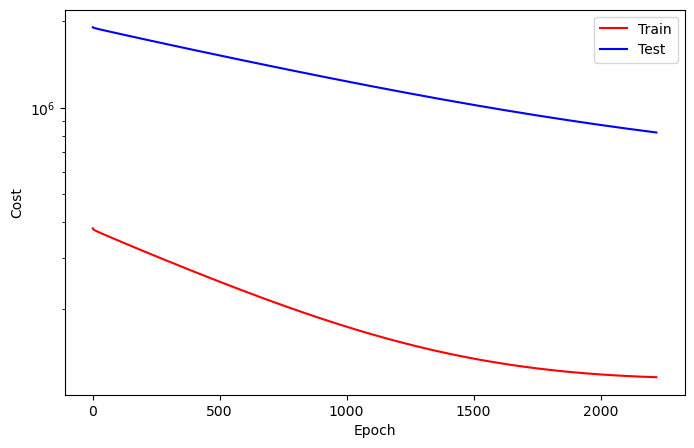

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2221
Train_cost  = 115737.4645 | Test_cost  = 820490.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2222
Train_cost  = 115729.9423 | Test_cost  = 820277.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2223
Train_cost  = 115722.4801 | Test_cost  = 820065.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2224
Train_cost  = 115715.0083 | Test_cost  = 819852.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2225
Train_cost  = 115707.5972 | Test_cost  = 819640.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2226
Train_cost  = 115700.2431 | Test_cost  = 819428.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2227
Train_cost  = 115692.8954 | Test_cost  = 819216.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2228
Train_cost  = 115685.5916 | Test_cost  = 819004.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2229
Train_cost  = 115678.3079 | Test_cost  = 818792.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2230
Train_cost  = 115671.0424 | Test_cost  = 818581.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2231
Train_cost  = 115663.8488 | Test_cost  = 818370.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2232
Train_cost  = 115656.6821 | Test_cost  = 818158.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2233
Train_cost  = 115649.5320 | Test_cost  = 817947.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2234
Train_cost  = 115642.4163 | Test_cost  = 817737.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2235
Train_cost  = 115635.3341 | Test_cost  = 817526.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2236
Train_cost  = 115628.2988 | Test_cost  = 817315.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2237
Train_cost  = 115621.2975 | Test_cost  = 817105.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2238
Train_cost  = 115614.3283 | Test_cost  = 816895.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2239
Train_cost  = 115607.3854 | Test_cost  = 816685.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2240
Train_cost  = 115600.4581 | Test_cost  = 816475.3500 | 


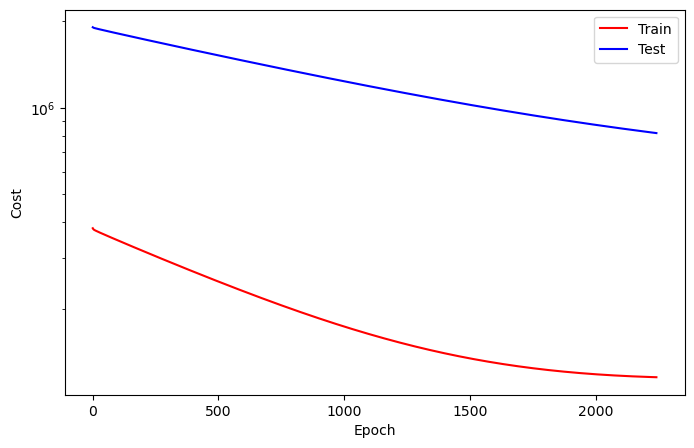

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2241
Train_cost  = 115593.5831 | Test_cost  = 816265.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2242
Train_cost  = 115586.7494 | Test_cost  = 816056.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2243
Train_cost  = 115579.9416 | Test_cost  = 815846.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2244
Train_cost  = 115573.1454 | Test_cost  = 815637.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2245
Train_cost  = 115566.4059 | Test_cost  = 815428.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2246
Train_cost  = 115559.6944 | Test_cost  = 815219.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2247
Train_cost  = 115553.0206 | Test_cost  = 815010.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2248
Train_cost  = 115546.3627 | Test_cost  = 814802.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2249
Train_cost  = 115539.7631 | Test_cost  = 814593.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2250
Train_cost  = 115533.1842 | Test_cost  = 814385.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2251
Train_cost  = 115526.6198 | Test_cost  = 814177.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2252
Train_cost  = 115520.0920 | Test_cost  = 813969.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2253
Train_cost  = 115513.6406 | Test_cost  = 813762.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2254
Train_cost  = 115507.1856 | Test_cost  = 813554.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2255
Train_cost  = 115500.7365 | Test_cost  = 813347.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2256
Train_cost  = 115494.3731 | Test_cost  = 813139.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2257
Train_cost  = 115488.0177 | Test_cost  = 812932.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2258
Train_cost  = 115481.6952 | Test_cost  = 812725.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2259
Train_cost  = 115475.3914 | Test_cost  = 812519.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2260
Train_cost  = 115469.1468 | Test_cost  = 812312.4500 | 


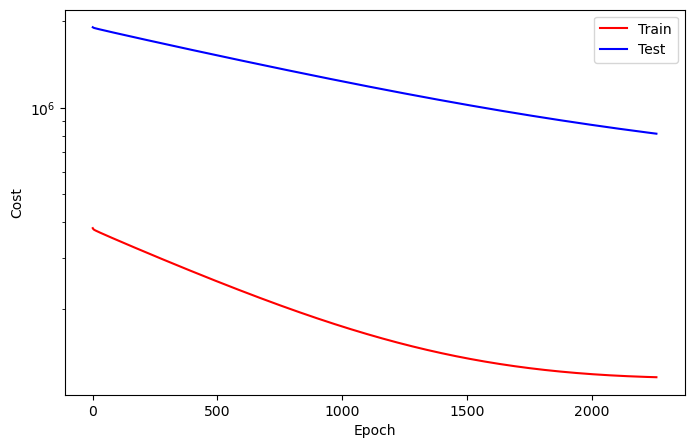

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2261
Train_cost  = 115462.9113 | Test_cost  = 812105.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2262
Train_cost  = 115456.7137 | Test_cost  = 811899.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2263
Train_cost  = 115450.5586 | Test_cost  = 811693.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2264
Train_cost  = 115444.4269 | Test_cost  = 811487.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2265
Train_cost  = 115438.3164 | Test_cost  = 811281.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2266
Train_cost  = 115432.2647 | Test_cost  = 811076.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2267
Train_cost  = 115426.2201 | Test_cost  = 810870.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2268
Train_cost  = 115420.2284 | Test_cost  = 810665.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2269
Train_cost  = 115414.2531 | Test_cost  = 810460.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2270
Train_cost  = 115408.3013 | Test_cost  = 810255.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2271
Train_cost  = 115402.4041 | Test_cost  = 810050.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2272
Train_cost  = 115396.5195 | Test_cost  = 809845.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2273
Train_cost  = 115390.6626 | Test_cost  = 809641.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2274
Train_cost  = 115384.8401 | Test_cost  = 809436.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2275
Train_cost  = 115379.0586 | Test_cost  = 809232.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2276
Train_cost  = 115373.3059 | Test_cost  = 809028.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2277
Train_cost  = 115367.5887 | Test_cost  = 808824.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2278
Train_cost  = 115361.8929 | Test_cost  = 808621.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2279
Train_cost  = 115356.2305 | Test_cost  = 808417.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2280
Train_cost  = 115350.6046 | Test_cost  = 808214.0500 | 


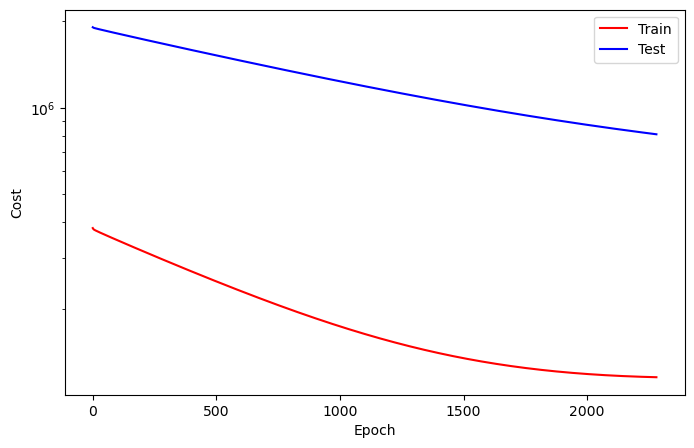

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2281
Train_cost  = 115345.0044 | Test_cost  = 808010.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2282
Train_cost  = 115339.4340 | Test_cost  = 807807.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2283
Train_cost  = 115333.9111 | Test_cost  = 807604.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2284
Train_cost  = 115328.3808 | Test_cost  = 807402.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2285
Train_cost  = 115322.9165 | Test_cost  = 807199.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2286
Train_cost  = 115317.4699 | Test_cost  = 806997.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2287
Train_cost  = 115312.0652 | Test_cost  = 806794.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2288
Train_cost  = 115306.6524 | Test_cost  = 806592.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2289
Train_cost  = 115301.3183 | Test_cost  = 806390.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2290
Train_cost  = 115295.9819 | Test_cost  = 806188.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2291
Train_cost  = 115290.6933 | Test_cost  = 805987.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2292
Train_cost  = 115285.4346 | Test_cost  = 805785.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2293
Train_cost  = 115280.1827 | Test_cost  = 805584.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2294
Train_cost  = 115275.0127 | Test_cost  = 805383.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2295
Train_cost  = 115269.8146 | Test_cost  = 805182.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2296
Train_cost  = 115264.6852 | Test_cost  = 804981.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2297
Train_cost  = 115259.5662 | Test_cost  = 804780.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2298
Train_cost  = 115254.4730 | Test_cost  = 804579.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2299
Train_cost  = 115249.4390 | Test_cost  = 804379.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2300
Train_cost  = 115244.4072 | Test_cost  = 804179.3000 | 


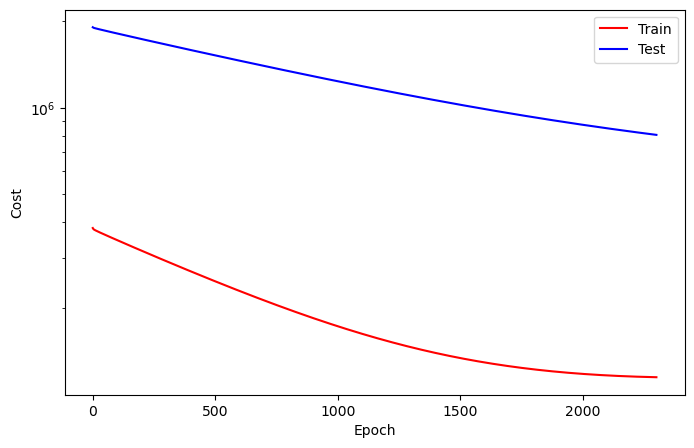

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2301
Train_cost  = 115239.4115 | Test_cost  = 803979.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2302
Train_cost  = 115234.4527 | Test_cost  = 803779.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2303
Train_cost  = 115229.5187 | Test_cost  = 803579.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2304
Train_cost  = 115224.6098 | Test_cost  = 803380.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2305
Train_cost  = 115219.7407 | Test_cost  = 803180.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2306
Train_cost  = 115214.8814 | Test_cost  = 802981.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2307
Train_cost  = 115210.0627 | Test_cost  = 802782.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2308
Train_cost  = 115205.2843 | Test_cost  = 802583.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2309
Train_cost  = 115200.5299 | Test_cost  = 802384.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2310
Train_cost  = 115195.8208 | Test_cost  = 802185.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2311
Train_cost  = 115191.1113 | Test_cost  = 801987.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2312
Train_cost  = 115186.4379 | Test_cost  = 801788.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2313
Train_cost  = 115181.7944 | Test_cost  = 801590.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2314
Train_cost  = 115177.1910 | Test_cost  = 801392.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2315
Train_cost  = 115172.5920 | Test_cost  = 801194.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2316
Train_cost  = 115168.0586 | Test_cost  = 800997.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2317
Train_cost  = 115163.5359 | Test_cost  = 800799.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2318
Train_cost  = 115159.0309 | Test_cost  = 800601.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2319
Train_cost  = 115154.5613 | Test_cost  = 800404.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2320
Train_cost  = 115150.1200 | Test_cost  = 800207.7000 | 


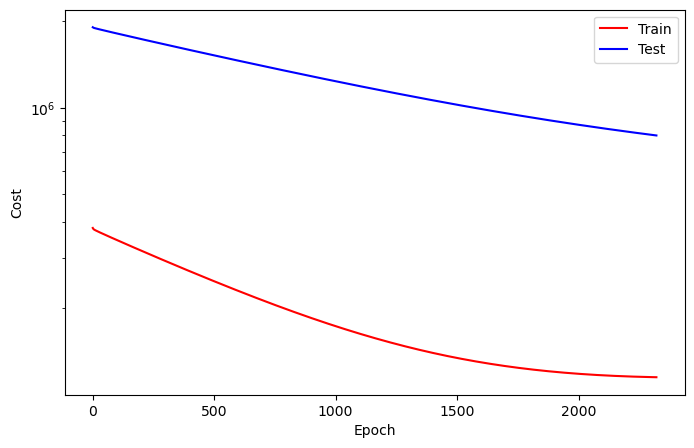

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2321
Train_cost  = 115145.7151 | Test_cost  = 800010.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2322
Train_cost  = 115141.3449 | Test_cost  = 799813.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2323
Train_cost  = 115136.9749 | Test_cost  = 799617.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2324
Train_cost  = 115132.6395 | Test_cost  = 799420.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2325
Train_cost  = 115128.3696 | Test_cost  = 799224.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2326
Train_cost  = 115124.1134 | Test_cost  = 799028.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2327
Train_cost  = 115119.8542 | Test_cost  = 798832.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2328
Train_cost  = 115115.6597 | Test_cost  = 798636.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2329
Train_cost  = 115111.4684 | Test_cost  = 798440.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2330
Train_cost  = 115107.3214 | Test_cost  = 798245.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2331
Train_cost  = 115103.1939 | Test_cost  = 798049.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2332
Train_cost  = 115099.1138 | Test_cost  = 797854.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2333
Train_cost  = 115095.0262 | Test_cost  = 797659.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2334
Train_cost  = 115090.9838 | Test_cost  = 797464.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2335
Train_cost  = 115086.9761 | Test_cost  = 797269.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2336
Train_cost  = 115083.0066 | Test_cost  = 797075.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2337
Train_cost  = 115079.0289 | Test_cost  = 796880.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2338
Train_cost  = 115075.1175 | Test_cost  = 796686.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2339
Train_cost  = 115071.2257 | Test_cost  = 796492.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2340
Train_cost  = 115067.3497 | Test_cost  = 796298.2000 | 


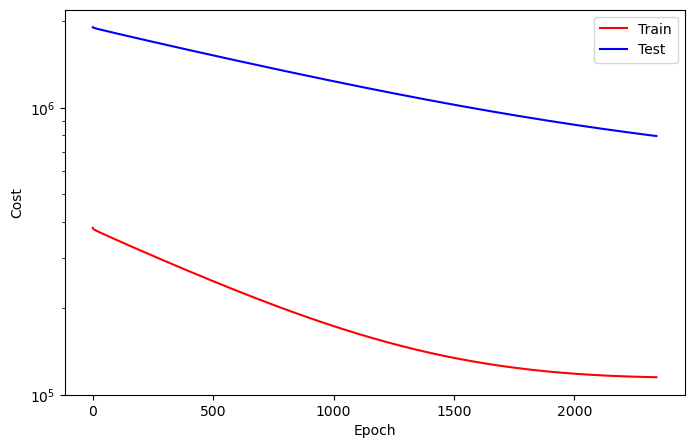

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2341
Train_cost  = 115063.4877 | Test_cost  = 796104.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2342
Train_cost  = 115059.6699 | Test_cost  = 795910.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2343
Train_cost  = 115055.8781 | Test_cost  = 795716.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2344
Train_cost  = 115052.1125 | Test_cost  = 795523.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2345
Train_cost  = 115048.3904 | Test_cost  = 795330.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2346
Train_cost  = 115044.6883 | Test_cost  = 795137.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2347
Train_cost  = 115040.9936 | Test_cost  = 794944.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2348
Train_cost  = 115037.3445 | Test_cost  = 794751.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2349
Train_cost  = 115033.7145 | Test_cost  = 794558.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2350
Train_cost  = 115030.1144 | Test_cost  = 794366.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2351
Train_cost  = 115026.5448 | Test_cost  = 794173.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2352
Train_cost  = 115022.9983 | Test_cost  = 793981.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2353
Train_cost  = 115019.4770 | Test_cost  = 793789.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2354
Train_cost  = 115016.0066 | Test_cost  = 793597.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2355
Train_cost  = 115012.5417 | Test_cost  = 793405.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2356
Train_cost  = 115009.1024 | Test_cost  = 793214.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2357
Train_cost  = 115005.6950 | Test_cost  = 793023.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2358
Train_cost  = 115002.3142 | Test_cost  = 792831.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2359
Train_cost  = 114998.9454 | Test_cost  = 792640.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2360
Train_cost  = 114995.6358 | Test_cost  = 792449.6750 | 


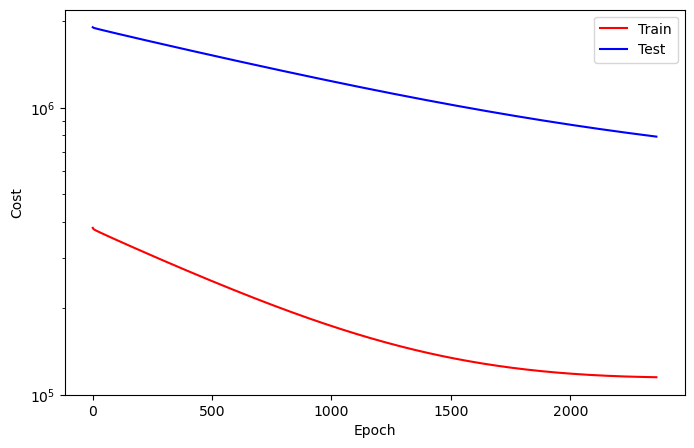

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2361
Train_cost  = 114992.3301 | Test_cost  = 792258.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2362
Train_cost  = 114989.0494 | Test_cost  = 792068.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2363
Train_cost  = 114985.8042 | Test_cost  = 791877.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2364
Train_cost  = 114982.5748 | Test_cost  = 791687.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2365
Train_cost  = 114979.3783 | Test_cost  = 791496.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2366
Train_cost  = 114976.2072 | Test_cost  = 791306.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2367
Train_cost  = 114973.0741 | Test_cost  = 791116.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2368
Train_cost  = 114969.9549 | Test_cost  = 790927.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2369
Train_cost  = 114966.8713 | Test_cost  = 790737.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2370
Train_cost  = 114963.7965 | Test_cost  = 790547.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2371
Train_cost  = 114960.7554 | Test_cost  = 790358.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2372
Train_cost  = 114957.7515 | Test_cost  = 790169.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2373
Train_cost  = 114954.7573 | Test_cost  = 789980.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2374
Train_cost  = 114951.8013 | Test_cost  = 789791.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2375
Train_cost  = 114948.8709 | Test_cost  = 789602.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2376
Train_cost  = 114945.9599 | Test_cost  = 789414.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2377
Train_cost  = 114943.0764 | Test_cost  = 789226.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2378
Train_cost  = 114940.2020 | Test_cost  = 789037.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2379
Train_cost  = 114937.3922 | Test_cost  = 788849.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2380
Train_cost  = 114934.5901 | Test_cost  = 788661.5250 | 


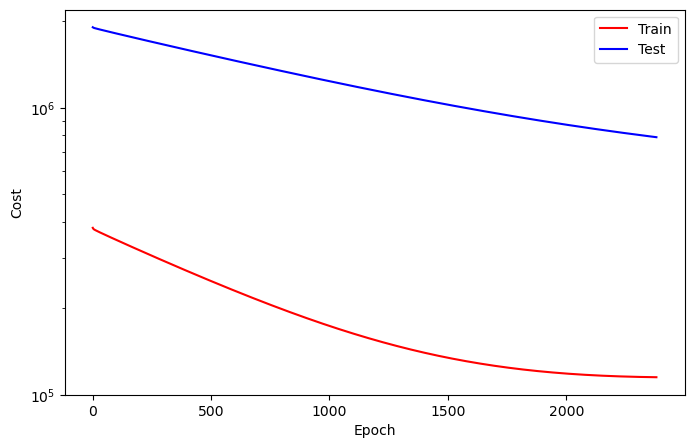

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2381
Train_cost  = 114931.8029 | Test_cost  = 788473.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2382
Train_cost  = 114929.0650 | Test_cost  = 788285.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2383
Train_cost  = 114926.3345 | Test_cost  = 788098.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2384
Train_cost  = 114923.6431 | Test_cost  = 787911.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2385
Train_cost  = 114920.9742 | Test_cost  = 787723.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2386
Train_cost  = 114918.3123 | Test_cost  = 787536.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2387
Train_cost  = 114915.6929 | Test_cost  = 787349.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2388
Train_cost  = 114913.0808 | Test_cost  = 787163.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2389
Train_cost  = 114910.5039 | Test_cost  = 786976.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2390
Train_cost  = 114907.9583 | Test_cost  = 786790.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2391
Train_cost  = 114905.4441 | Test_cost  = 786603.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2392
Train_cost  = 114902.9207 | Test_cost  = 786417.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2393
Train_cost  = 114900.4605 | Test_cost  = 786231.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2394
Train_cost  = 114898.0141 | Test_cost  = 786045.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2395
Train_cost  = 114895.5897 | Test_cost  = 785859.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2396
Train_cost  = 114893.1833 | Test_cost  = 785674.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2397
Train_cost  = 114890.8289 | Test_cost  = 785488.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2398
Train_cost  = 114888.4645 | Test_cost  = 785303.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2399
Train_cost  = 114886.1478 | Test_cost  = 785118.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2400
Train_cost  = 114883.8472 | Test_cost  = 784933.1500 | 


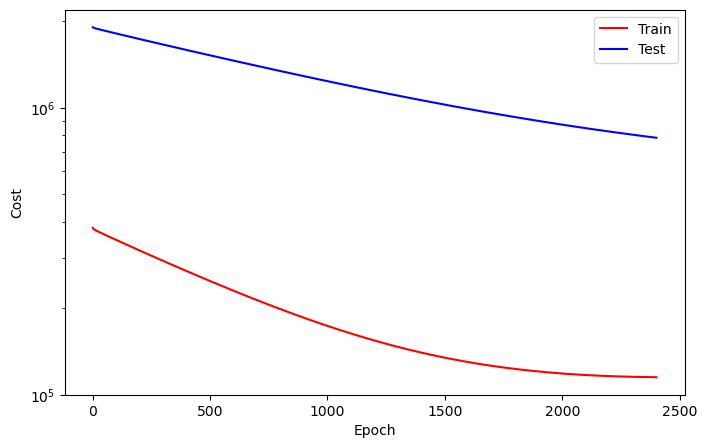

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2401
Train_cost  = 114881.5650 | Test_cost  = 784748.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2402
Train_cost  = 114879.3272 | Test_cost  = 784563.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2403
Train_cost  = 114877.0912 | Test_cost  = 784379.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2404
Train_cost  = 114874.8970 | Test_cost  = 784194.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2405
Train_cost  = 114872.7093 | Test_cost  = 784010.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2406
Train_cost  = 114870.5642 | Test_cost  = 783826.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2407
Train_cost  = 114868.4389 | Test_cost  = 783642.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2408
Train_cost  = 114866.3382 | Test_cost  = 783458.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2409
Train_cost  = 114864.2595 | Test_cost  = 783274.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2410
Train_cost  = 114862.2056 | Test_cost  = 783090.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2411
Train_cost  = 114860.1863 | Test_cost  = 782907.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2412
Train_cost  = 114858.1825 | Test_cost  = 782724.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2413
Train_cost  = 114856.1883 | Test_cost  = 782541.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2414
Train_cost  = 114854.2589 | Test_cost  = 782358.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2415
Train_cost  = 114852.2967 | Test_cost  = 782175.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2416
Train_cost  = 114850.3893 | Test_cost  = 781992.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2417
Train_cost  = 114848.5077 | Test_cost  = 781810.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2418
Train_cost  = 114846.6368 | Test_cost  = 781627.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2419
Train_cost  = 114844.8274 | Test_cost  = 781445.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2420
Train_cost  = 114843.0019 | Test_cost  = 781263.3500 | 


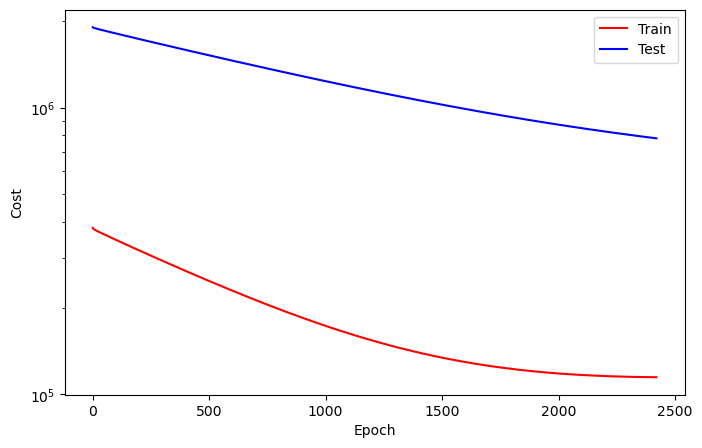

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2421
Train_cost  = 114841.2058 | Test_cost  = 781081.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2422
Train_cost  = 114839.4497 | Test_cost  = 780899.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2423
Train_cost  = 114837.6943 | Test_cost  = 780718.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2424
Train_cost  = 114835.9817 | Test_cost  = 780536.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2425
Train_cost  = 114834.3077 | Test_cost  = 780355.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2426
Train_cost  = 114832.6196 | Test_cost  = 780173.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2427
Train_cost  = 114830.9691 | Test_cost  = 779992.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2428
Train_cost  = 114829.3590 | Test_cost  = 779811.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2429
Train_cost  = 114827.7488 | Test_cost  = 779631.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2430
Train_cost  = 114826.1784 | Test_cost  = 779450.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2431
Train_cost  = 114824.6127 | Test_cost  = 779269.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2432
Train_cost  = 114823.0735 | Test_cost  = 779089.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2433
Train_cost  = 114821.5777 | Test_cost  = 778909.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2434
Train_cost  = 114820.0889 | Test_cost  = 778729.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2435
Train_cost  = 114818.6181 | Test_cost  = 778549.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2436
Train_cost  = 114817.1898 | Test_cost  = 778369.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2437
Train_cost  = 114815.7770 | Test_cost  = 778189.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2438
Train_cost  = 114814.4016 | Test_cost  = 778010.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2439
Train_cost  = 114813.0129 | Test_cost  = 777830.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2440
Train_cost  = 114811.6777 | Test_cost  = 777651.4500 | 


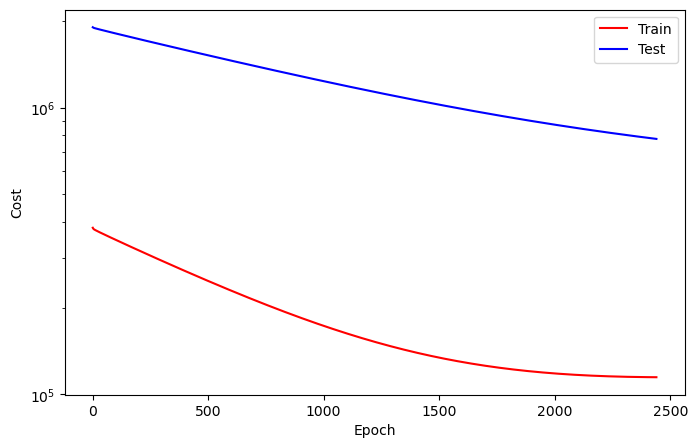

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2441
Train_cost  = 114810.3567 | Test_cost  = 777472.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2442
Train_cost  = 114809.0507 | Test_cost  = 777293.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2443
Train_cost  = 114807.7822 | Test_cost  = 777114.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2444
Train_cost  = 114806.5222 | Test_cost  = 776936.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2445
Train_cost  = 114805.2878 | Test_cost  = 776757.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2446
Train_cost  = 114804.1076 | Test_cost  = 776579.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2447
Train_cost  = 114802.8916 | Test_cost  = 776400.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2448
Train_cost  = 114801.7469 | Test_cost  = 776222.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2449
Train_cost  = 114800.6034 | Test_cost  = 776045.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2450
Train_cost  = 114799.4799 | Test_cost  = 775867.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2451
Train_cost  = 114798.3850 | Test_cost  = 775689.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2452
Train_cost  = 114797.3059 | Test_cost  = 775512.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2453
Train_cost  = 114796.2616 | Test_cost  = 775334.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2454
Train_cost  = 114795.2276 | Test_cost  = 775157.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2455
Train_cost  = 114794.2226 | Test_cost  = 774980.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2456
Train_cost  = 114793.2473 | Test_cost  = 774803.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2457
Train_cost  = 114792.2774 | Test_cost  = 774626.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2458
Train_cost  = 114791.3468 | Test_cost  = 774450.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2459
Train_cost  = 114790.4236 | Test_cost  = 774273.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2460
Train_cost  = 114789.5428 | Test_cost  = 774096.9500 | 


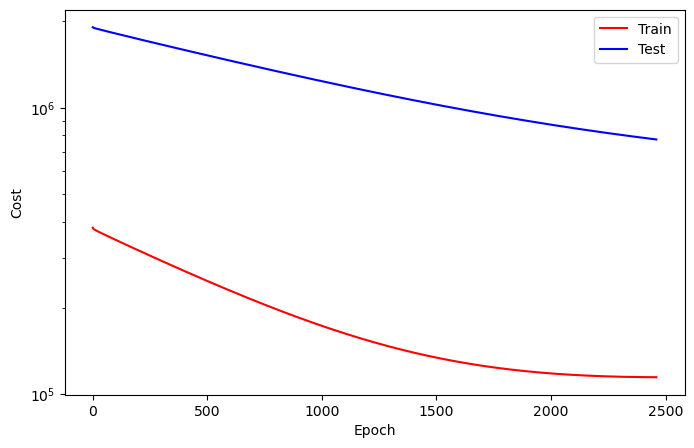

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2461
Train_cost  = 114788.6586 | Test_cost  = 773920.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2462
Train_cost  = 114787.8063 | Test_cost  = 773744.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2463
Train_cost  = 114786.9606 | Test_cost  = 773568.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2464
Train_cost  = 114786.1508 | Test_cost  = 773392.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2465
Train_cost  = 114785.3866 | Test_cost  = 773216.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2466
Train_cost  = 114784.6285 | Test_cost  = 773041.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2467
Train_cost  = 114783.8819 | Test_cost  = 772866.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2468
Train_cost  = 114783.1613 | Test_cost  = 772691.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2469
Train_cost  = 114782.4649 | Test_cost  = 772515.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2470
Train_cost  = 114781.7616 | Test_cost  = 772340.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2471
Train_cost  = 114781.1385 | Test_cost  = 772165.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2472
Train_cost  = 114780.5023 | Test_cost  = 771991.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2473
Train_cost  = 114779.8738 | Test_cost  = 771816.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2474
Train_cost  = 114779.3036 | Test_cost  = 771642.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2475
Train_cost  = 114778.7106 | Test_cost  = 771468.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2476
Train_cost  = 114778.1609 | Test_cost  = 771293.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2477
Train_cost  = 114777.6420 | Test_cost  = 771119.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2478
Train_cost  = 114777.1493 | Test_cost  = 770945.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2479
Train_cost  = 114776.6578 | Test_cost  = 770772.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2480
Train_cost  = 114776.1917 | Test_cost  = 770598.8000 | 


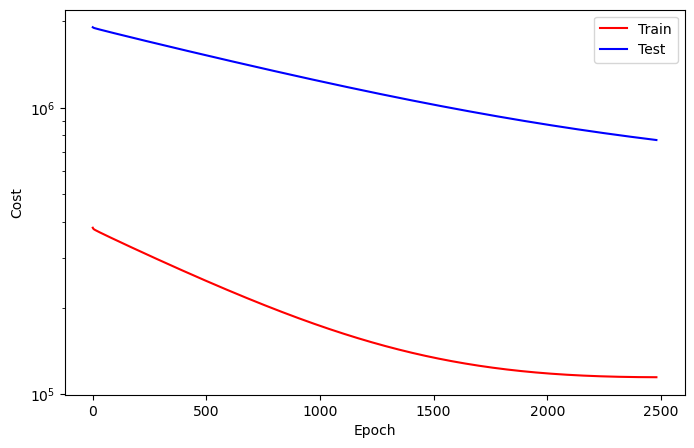

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2481
Train_cost  = 114775.7446 | Test_cost  = 770425.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2482
Train_cost  = 114775.3264 | Test_cost  = 770252.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2483
Train_cost  = 114774.9248 | Test_cost  = 770078.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2484
Train_cost  = 114774.5486 | Test_cost  = 769905.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2485
Train_cost  = 114774.1979 | Test_cost  = 769732.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2486
Train_cost  = 114773.8603 | Test_cost  = 769560.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2487
Train_cost  = 114773.5285 | Test_cost  = 769387.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2488
Train_cost  = 114773.2245 | Test_cost  = 769215.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2489
Train_cost  = 114772.9788 | Test_cost  = 769042.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2490
Train_cost  = 114772.7118 | Test_cost  = 768870.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2491
Train_cost  = 114772.4630 | Test_cost  = 768698.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2492
Train_cost  = 114772.2535 | Test_cost  = 768526.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2493
Train_cost  = 114772.0714 | Test_cost  = 768354.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2494
Train_cost  = 114771.9082 | Test_cost  = 768183.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2495
Train_cost  = 114771.7431 | Test_cost  = 768011.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2496
Train_cost  = 114771.6138 | Test_cost  = 767840.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2497
Train_cost  = 114771.5112 | Test_cost  = 767669.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2498
Train_cost  = 114771.4236 | Test_cost  = 767498.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2499
Train_cost  = 114771.3534 | Test_cost  = 767327.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2500
Train_cost  = 114771.3252 | Test_cost  = 767156.4500 | 


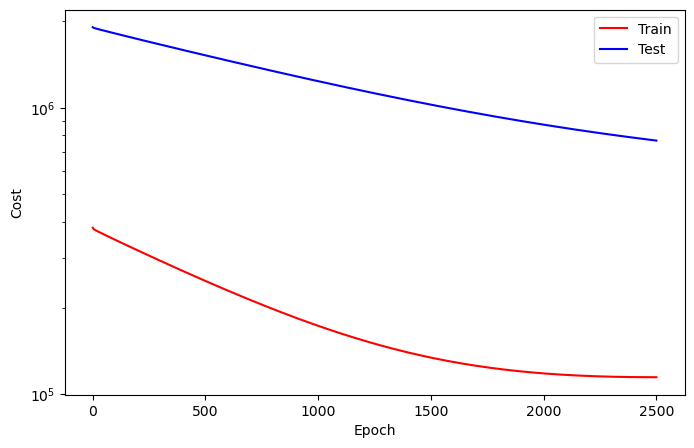

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2501
Train_cost  = 114771.2816 | Test_cost  = 766985.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2502
Train_cost  = 114771.2735 | Test_cost  = 766815.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2503
Train_cost  = 114771.2735 | Test_cost  = 766644.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2504
Train_cost  = 114771.3283 | Test_cost  = 766474.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2505
Train_cost  = 114771.3738 | Test_cost  = 766304.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2506
Train_cost  = 114771.4487 | Test_cost  = 766134.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2507
Train_cost  = 114771.5301 | Test_cost  = 765964.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2508
Train_cost  = 114771.6532 | Test_cost  = 765794.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2509
Train_cost  = 114771.7681 | Test_cost  = 765625.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2510
Train_cost  = 114771.9479 | Test_cost  = 765455.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2511
Train_cost  = 114772.1161 | Test_cost  = 765286.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2512
Train_cost  = 114772.2936 | Test_cost  = 765117.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2513
Train_cost  = 114772.5077 | Test_cost  = 764948.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2514
Train_cost  = 114772.7523 | Test_cost  = 764779.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2515
Train_cost  = 114773.0015 | Test_cost  = 764610.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2516
Train_cost  = 114773.2785 | Test_cost  = 764442.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2517
Train_cost  = 114773.5455 | Test_cost  = 764273.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2518
Train_cost  = 114773.8584 | Test_cost  = 764105.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2519
Train_cost  = 114774.1898 | Test_cost  = 763937.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2520
Train_cost  = 114774.5598 | Test_cost  = 763768.9500 | 


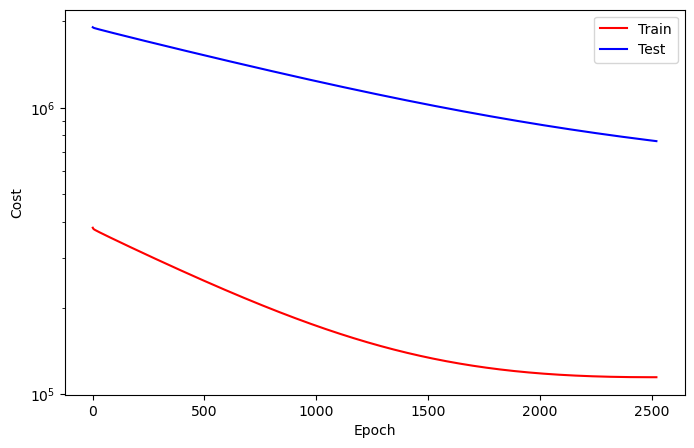

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2521
Train_cost  = 114774.9387 | Test_cost  = 763600.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2522
Train_cost  = 114775.3083 | Test_cost  = 763433.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2523
Train_cost  = 114775.7184 | Test_cost  = 763265.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2524
Train_cost  = 114776.1597 | Test_cost  = 763097.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2525
Train_cost  = 114776.6011 | Test_cost  = 762930.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2526
Train_cost  = 114777.0745 | Test_cost  = 762762.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2527
Train_cost  = 114777.5552 | Test_cost  = 762595.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2528
Train_cost  = 114778.0502 | Test_cost  = 762428.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2529
Train_cost  = 114778.5625 | Test_cost  = 762261.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2530
Train_cost  = 114779.1088 | Test_cost  = 762095.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2531
Train_cost  = 114779.6798 | Test_cost  = 761928.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2532
Train_cost  = 114780.2492 | Test_cost  = 761761.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2533
Train_cost  = 114780.8584 | Test_cost  = 761595.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2534
Train_cost  = 114781.4784 | Test_cost  = 761429.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2535
Train_cost  = 114782.1100 | Test_cost  = 761263.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2536
Train_cost  = 114782.7708 | Test_cost  = 761097.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2537
Train_cost  = 114783.4664 | Test_cost  = 760931.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2538
Train_cost  = 114784.1420 | Test_cost  = 760765.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2539
Train_cost  = 114784.8731 | Test_cost  = 760600.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2540
Train_cost  = 114785.5791 | Test_cost  = 760434.7000 | 


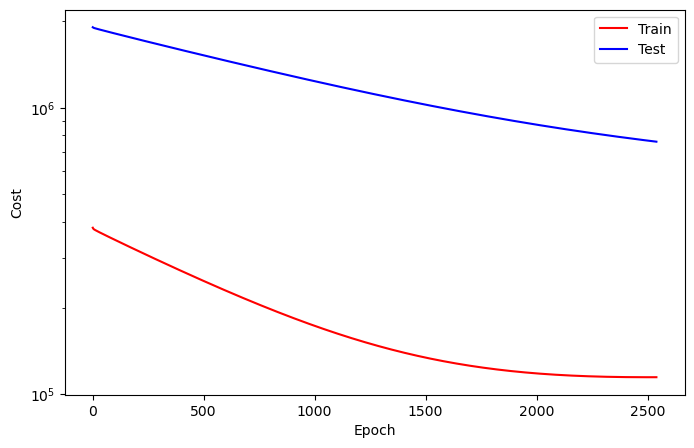

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2541
Train_cost  = 114786.3576 | Test_cost  = 760269.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2542
Train_cost  = 114787.1300 | Test_cost  = 760104.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2543
Train_cost  = 114787.9008 | Test_cost  = 759939.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2544
Train_cost  = 114788.6998 | Test_cost  = 759774.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2545
Train_cost  = 114789.5467 | Test_cost  = 759609.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2546
Train_cost  = 114790.3873 | Test_cost  = 759444.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2547
Train_cost  = 114791.2311 | Test_cost  = 759280.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2548
Train_cost  = 114792.1366 | Test_cost  = 759116.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2549
Train_cost  = 114793.0197 | Test_cost  = 758951.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2550
Train_cost  = 114793.9398 | Test_cost  = 758787.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2551
Train_cost  = 114794.8704 | Test_cost  = 758623.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2552
Train_cost  = 114795.8295 | Test_cost  = 758459.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2553
Train_cost  = 114796.7897 | Test_cost  = 758296.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2554
Train_cost  = 114797.7967 | Test_cost  = 758132.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2555
Train_cost  = 114798.7805 | Test_cost  = 757969.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2556
Train_cost  = 114799.8241 | Test_cost  = 757805.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2557
Train_cost  = 114800.8576 | Test_cost  = 757642.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2558
Train_cost  = 114801.9483 | Test_cost  = 757479.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2559
Train_cost  = 114803.0181 | Test_cost  = 757316.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2560
Train_cost  = 114804.1204 | Test_cost  = 757154.1000 | 


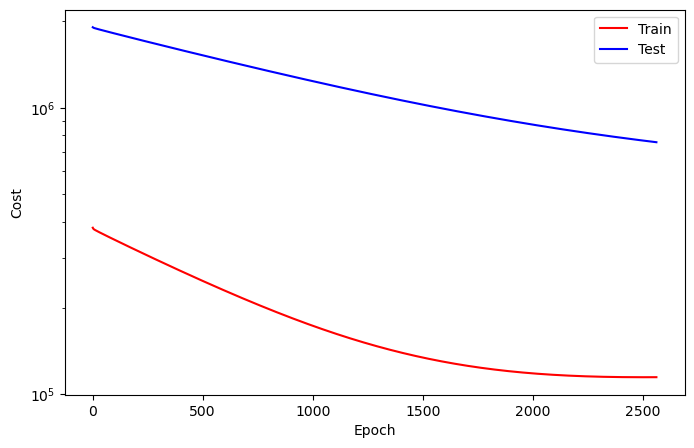

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2561
Train_cost  = 114805.2350 | Test_cost  = 756991.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2562
Train_cost  = 114806.3492 | Test_cost  = 756828.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2563
Train_cost  = 114807.5324 | Test_cost  = 756666.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2564
Train_cost  = 114808.7083 | Test_cost  = 756504.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2565
Train_cost  = 114809.8735 | Test_cost  = 756342.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2566
Train_cost  = 114811.0995 | Test_cost  = 756180.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2567
Train_cost  = 114812.3113 | Test_cost  = 756018.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2568
Train_cost  = 114813.5559 | Test_cost  = 755856.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2569
Train_cost  = 114814.8052 | Test_cost  = 755695.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2570
Train_cost  = 114816.0934 | Test_cost  = 755533.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2571
Train_cost  = 114817.3808 | Test_cost  = 755372.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2572
Train_cost  = 114818.6844 | Test_cost  = 755211.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2573
Train_cost  = 114820.0058 | Test_cost  = 755050.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2574
Train_cost  = 114821.3573 | Test_cost  = 754889.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2575
Train_cost  = 114822.7311 | Test_cost  = 754728.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2576
Train_cost  = 114824.1161 | Test_cost  = 754567.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2577
Train_cost  = 114825.5266 | Test_cost  = 754407.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2578
Train_cost  = 114826.9336 | Test_cost  = 754246.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2579
Train_cost  = 114828.3561 | Test_cost  = 754086.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2580
Train_cost  = 114829.8048 | Test_cost  = 753926.2000 | 


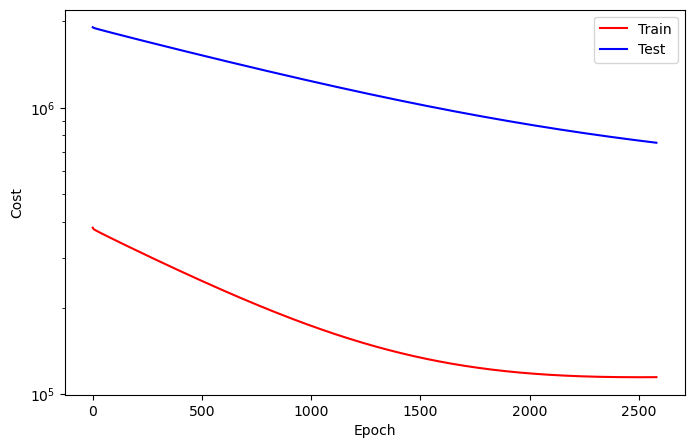

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2581
Train_cost  = 114831.2832 | Test_cost  = 753766.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2582
Train_cost  = 114832.7477 | Test_cost  = 753606.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2583
Train_cost  = 114834.2461 | Test_cost  = 753446.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2584
Train_cost  = 114835.7774 | Test_cost  = 753287.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2585
Train_cost  = 114837.3079 | Test_cost  = 753127.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2586
Train_cost  = 114838.8422 | Test_cost  = 752968.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2587
Train_cost  = 114840.4066 | Test_cost  = 752809.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2588
Train_cost  = 114841.9969 | Test_cost  = 752649.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2589
Train_cost  = 114843.6277 | Test_cost  = 752490.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2590
Train_cost  = 114845.2303 | Test_cost  = 752332.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2591
Train_cost  = 114846.8796 | Test_cost  = 752173.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2592
Train_cost  = 114848.5305 | Test_cost  = 752014.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2593
Train_cost  = 114850.1825 | Test_cost  = 751856.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2594
Train_cost  = 114851.9074 | Test_cost  = 751697.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2595
Train_cost  = 114853.6003 | Test_cost  = 751539.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2596
Train_cost  = 114855.3129 | Test_cost  = 751381.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2597
Train_cost  = 114857.0401 | Test_cost  = 751223.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2598
Train_cost  = 114858.7847 | Test_cost  = 751065.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2599
Train_cost  = 114860.5459 | Test_cost  = 750907.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2600
Train_cost  = 114862.3480 | Test_cost  = 750750.3000 | 


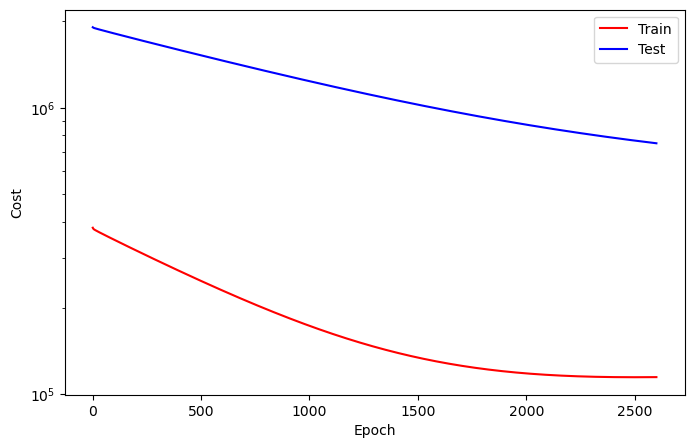

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2601
Train_cost  = 114864.1601 | Test_cost  = 750592.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2602
Train_cost  = 114865.9826 | Test_cost  = 750435.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2603
Train_cost  = 114867.7955 | Test_cost  = 750278.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2604
Train_cost  = 114869.6535 | Test_cost  = 750121.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2605
Train_cost  = 114871.5108 | Test_cost  = 749964.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2606
Train_cost  = 114873.4313 | Test_cost  = 749807.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2607
Train_cost  = 114875.3021 | Test_cost  = 749650.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2608
Train_cost  = 114877.2249 | Test_cost  = 749494.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2609
Train_cost  = 114879.1381 | Test_cost  = 749338.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2610
Train_cost  = 114881.0941 | Test_cost  = 749181.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2611
Train_cost  = 114883.0571 | Test_cost  = 749025.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2612
Train_cost  = 114885.0656 | Test_cost  = 748869.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2613
Train_cost  = 114887.0556 | Test_cost  = 748713.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2614
Train_cost  = 114889.0694 | Test_cost  = 748557.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2615
Train_cost  = 114891.0625 | Test_cost  = 748402.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2616
Train_cost  = 114893.1046 | Test_cost  = 748246.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2617
Train_cost  = 114895.1813 | Test_cost  = 748091.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2618
Train_cost  = 114897.2631 | Test_cost  = 747935.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2619
Train_cost  = 114899.3522 | Test_cost  = 747780.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2620
Train_cost  = 114901.4738 | Test_cost  = 747625.6750 | 


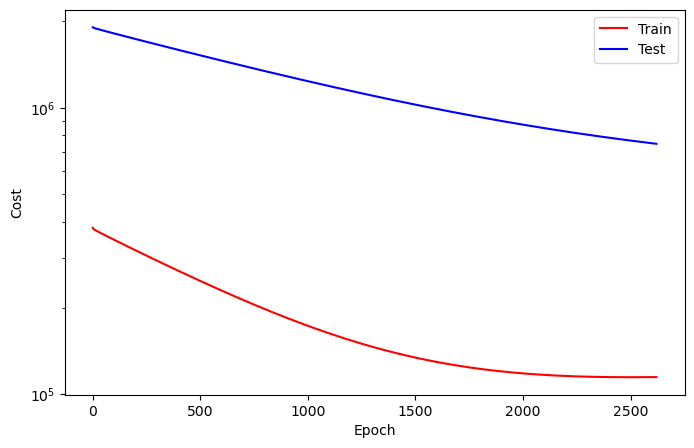

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2621
Train_cost  = 114903.5772 | Test_cost  = 747470.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2622
Train_cost  = 114905.7095 | Test_cost  = 747315.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2623
Train_cost  = 114907.8673 | Test_cost  = 747161.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2624
Train_cost  = 114910.0571 | Test_cost  = 747006.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2625
Train_cost  = 114912.2500 | Test_cost  = 746852.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2626
Train_cost  = 114914.4255 | Test_cost  = 746698.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2627
Train_cost  = 114916.6420 | Test_cost  = 746544.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2628
Train_cost  = 114918.8638 | Test_cost  = 746390.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2629
Train_cost  = 114921.1246 | Test_cost  = 746236.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2630
Train_cost  = 114923.3862 | Test_cost  = 746082.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2631
Train_cost  = 114925.6709 | Test_cost  = 745928.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2632
Train_cost  = 114927.9742 | Test_cost  = 745775.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2633
Train_cost  = 114930.2650 | Test_cost  = 745622.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2634
Train_cost  = 114932.5683 | Test_cost  = 745468.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2635
Train_cost  = 114934.9174 | Test_cost  = 745315.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2636
Train_cost  = 114937.2886 | Test_cost  = 745162.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2637
Train_cost  = 114939.6593 | Test_cost  = 745009.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2638
Train_cost  = 114942.0324 | Test_cost  = 744856.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2639
Train_cost  = 114944.4294 | Test_cost  = 744704.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2640
Train_cost  = 114946.8248 | Test_cost  = 744551.5500 | 


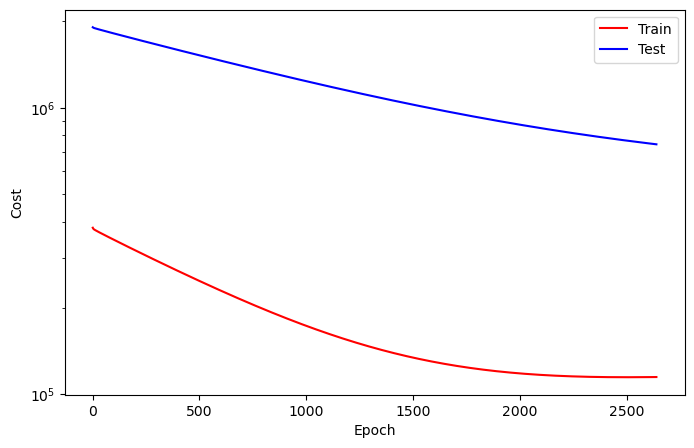

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2641
Train_cost  = 114949.2681 | Test_cost  = 744399.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2642
Train_cost  = 114951.7299 | Test_cost  = 744246.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2643
Train_cost  = 114954.1740 | Test_cost  = 744094.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2644
Train_cost  = 114956.6644 | Test_cost  = 743942.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2645
Train_cost  = 114959.1362 | Test_cost  = 743790.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2646
Train_cost  = 114961.6358 | Test_cost  = 743638.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2647
Train_cost  = 114964.1501 | Test_cost  = 743487.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2648
Train_cost  = 114966.7188 | Test_cost  = 743335.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2649
Train_cost  = 114969.2384 | Test_cost  = 743184.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2650
Train_cost  = 114971.8017 | Test_cost  = 743033.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2651
Train_cost  = 114974.3781 | Test_cost  = 742881.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2652
Train_cost  = 114976.9699 | Test_cost  = 742730.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2653
Train_cost  = 114979.5583 | Test_cost  = 742579.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2654
Train_cost  = 114982.2130 | Test_cost  = 742429.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2655
Train_cost  = 114984.8256 | Test_cost  = 742278.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2656
Train_cost  = 114987.4792 | Test_cost  = 742127.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2657
Train_cost  = 114990.1285 | Test_cost  = 741977.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2658
Train_cost  = 114992.8306 | Test_cost  = 741827.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2659
Train_cost  = 114995.5127 | Test_cost  = 741676.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2660
Train_cost  = 114998.2469 | Test_cost  = 741526.8500 | 


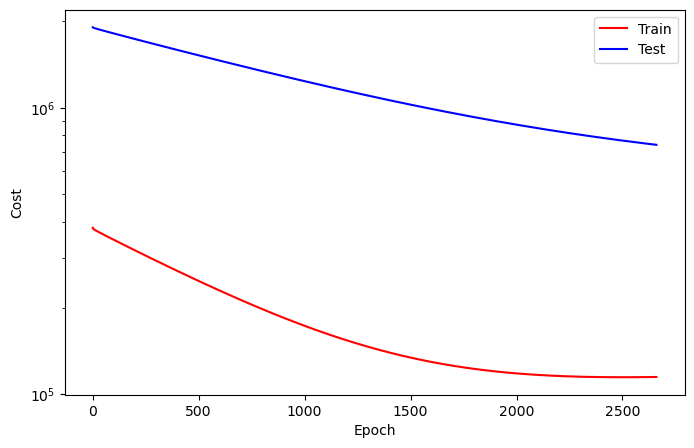

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2661
Train_cost  = 115000.9545 | Test_cost  = 741377.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2662
Train_cost  = 115003.6690 | Test_cost  = 741227.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2663
Train_cost  = 115006.4525 | Test_cost  = 741077.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2664
Train_cost  = 115009.2056 | Test_cost  = 740927.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2665
Train_cost  = 115011.9626 | Test_cost  = 740778.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2666
Train_cost  = 115014.7909 | Test_cost  = 740628.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2667
Train_cost  = 115017.5764 | Test_cost  = 740479.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2668
Train_cost  = 115020.3970 | Test_cost  = 740330.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2669
Train_cost  = 115023.2245 | Test_cost  = 740181.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2670
Train_cost  = 115026.0745 | Test_cost  = 740032.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2671
Train_cost  = 115028.9429 | Test_cost  = 739883.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2672
Train_cost  = 115031.8268 | Test_cost  = 739735.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2673
Train_cost  = 115034.7346 | Test_cost  = 739586.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2674
Train_cost  = 115037.6362 | Test_cost  = 739438.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2675
Train_cost  = 115040.5386 | Test_cost  = 739290.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2676
Train_cost  = 115043.4684 | Test_cost  = 739141.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2677
Train_cost  = 115046.4240 | Test_cost  = 738993.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2678
Train_cost  = 115049.3723 | Test_cost  = 738846.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2679
Train_cost  = 115052.3623 | Test_cost  = 738698.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2680
Train_cost  = 115055.3588 | Test_cost  = 738550.6500 | 


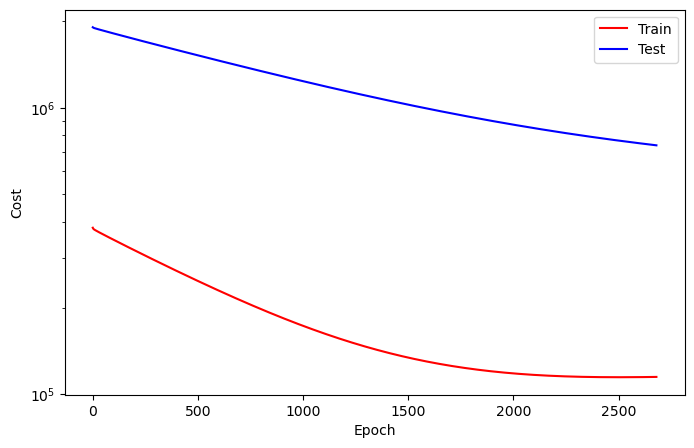

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2681
Train_cost  = 115058.3391 | Test_cost  = 738403.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2682
Train_cost  = 115061.3742 | Test_cost  = 738255.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2683
Train_cost  = 115064.3831 | Test_cost  = 738108.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2684
Train_cost  = 115067.4198 | Test_cost  = 737961.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2685
Train_cost  = 115070.5112 | Test_cost  = 737814.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2686
Train_cost  = 115073.5737 | Test_cost  = 737667.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2687
Train_cost  = 115076.6381 | Test_cost  = 737520.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2688
Train_cost  = 115079.7346 | Test_cost  = 737373.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2689
Train_cost  = 115082.8449 | Test_cost  = 737227.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2690
Train_cost  = 115085.9842 | Test_cost  = 737080.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2691
Train_cost  = 115089.1130 | Test_cost  = 736934.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2692
Train_cost  = 115092.2647 | Test_cost  = 736788.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2693
Train_cost  = 115095.4367 | Test_cost  = 736642.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2694
Train_cost  = 115098.5868 | Test_cost  = 736496.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2695
Train_cost  = 115101.7716 | Test_cost  = 736350.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2696
Train_cost  = 115104.9830 | Test_cost  = 736204.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2697
Train_cost  = 115108.2137 | Test_cost  = 736059.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2698
Train_cost  = 115111.4429 | Test_cost  = 735913.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2699
Train_cost  = 115114.6744 | Test_cost  = 735768.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2700
Train_cost  = 115117.9205 | Test_cost  = 735623.0500 | 


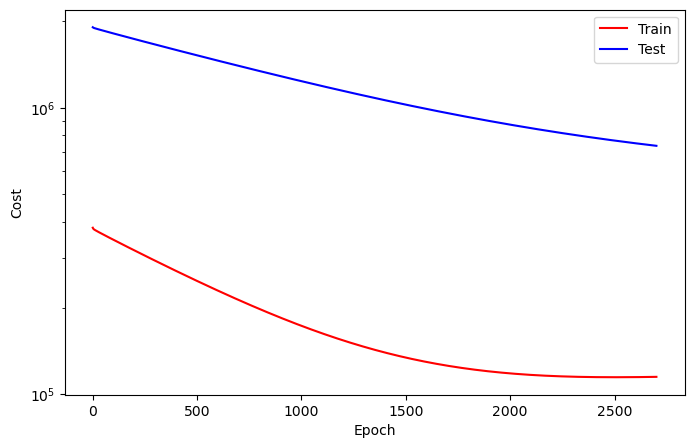

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2701
Train_cost  = 115121.1852 | Test_cost  = 735477.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2702
Train_cost  = 115124.4707 | Test_cost  = 735332.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2703
Train_cost  = 115127.7701 | Test_cost  = 735188.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2704
Train_cost  = 115131.0698 | Test_cost  = 735043.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2705
Train_cost  = 115134.3858 | Test_cost  = 734898.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2706
Train_cost  = 115137.7060 | Test_cost  = 734754.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2707
Train_cost  = 115141.0494 | Test_cost  = 734609.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2708
Train_cost  = 115144.4333 | Test_cost  = 734465.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2709
Train_cost  = 115147.7832 | Test_cost  = 734321.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2710
Train_cost  = 115151.1771 | Test_cost  = 734177.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2711
Train_cost  = 115154.5806 | Test_cost  = 734033.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2712
Train_cost  = 115157.9784 | Test_cost  = 733889.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2713
Train_cost  = 115161.4090 | Test_cost  = 733745.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2714
Train_cost  = 115164.8438 | Test_cost  = 733602.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2715
Train_cost  = 115168.2940 | Test_cost  = 733458.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2716
Train_cost  = 115171.7593 | Test_cost  = 733315.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2717
Train_cost  = 115175.2357 | Test_cost  = 733172.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2718
Train_cost  = 115178.7103 | Test_cost  = 733029.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2719
Train_cost  = 115182.1937 | Test_cost  = 732885.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2720
Train_cost  = 115185.7056 | Test_cost  = 732742.8250 | 


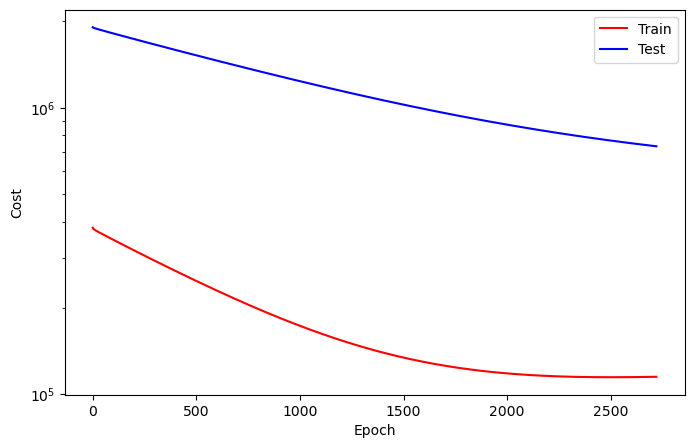

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2721
Train_cost  = 115189.2342 | Test_cost  = 732600.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2722
Train_cost  = 115192.7627 | Test_cost  = 732457.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2723
Train_cost  = 115196.3110 | Test_cost  = 732315.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2724
Train_cost  = 115199.8665 | Test_cost  = 732172.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2725
Train_cost  = 115203.4313 | Test_cost  = 732030.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2726
Train_cost  = 115207.0166 | Test_cost  = 731888.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2727
Train_cost  = 115210.6154 | Test_cost  = 731746.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2728
Train_cost  = 115214.2292 | Test_cost  = 731604.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2729
Train_cost  = 115217.8457 | Test_cost  = 731462.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2730
Train_cost  = 115221.4799 | Test_cost  = 731320.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2731
Train_cost  = 115225.1165 | Test_cost  = 731179.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2732
Train_cost  = 115228.7658 | Test_cost  = 731037.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2733
Train_cost  = 115232.4144 | Test_cost  = 730896.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2734
Train_cost  = 115236.1397 | Test_cost  = 730754.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2735
Train_cost  = 115239.8179 | Test_cost  = 730613.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2736
Train_cost  = 115243.5305 | Test_cost  = 730472.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2737
Train_cost  = 115247.2415 | Test_cost  = 730331.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2738
Train_cost  = 115250.9522 | Test_cost  = 730190.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2739
Train_cost  = 115254.6925 | Test_cost  = 730050.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2740
Train_cost  = 115258.4545 | Test_cost  = 729909.4500 | 


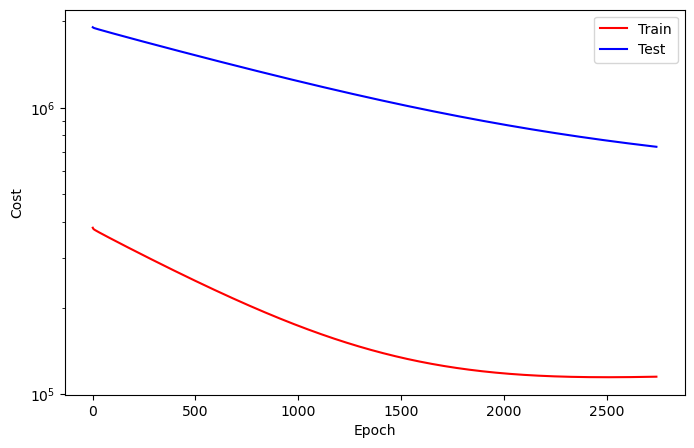

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2741
Train_cost  = 115262.2176 | Test_cost  = 729769.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2742
Train_cost  = 115265.9931 | Test_cost  = 729628.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2743
Train_cost  = 115269.7774 | Test_cost  = 729488.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2744
Train_cost  = 115273.5876 | Test_cost  = 729348.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2745
Train_cost  = 115277.3754 | Test_cost  = 729208.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2746
Train_cost  = 115281.2164 | Test_cost  = 729068.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2747
Train_cost  = 115285.0463 | Test_cost  = 728928.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2748
Train_cost  = 115288.8889 | Test_cost  = 728788.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2749
Train_cost  = 115292.7735 | Test_cost  = 728649.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2750
Train_cost  = 115296.6142 | Test_cost  = 728510.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2751
Train_cost  = 115300.4861 | Test_cost  = 728370.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2752
Train_cost  = 115304.3804 | Test_cost  = 728231.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2753
Train_cost  = 115308.3052 | Test_cost  = 728092.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2754
Train_cost  = 115312.2002 | Test_cost  = 727953.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2755
Train_cost  = 115316.1250 | Test_cost  = 727814.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2756
Train_cost  = 115320.0644 | Test_cost  = 727676.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2757
Train_cost  = 115324.0120 | Test_cost  = 727537.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2758
Train_cost  = 115327.9637 | Test_cost  = 727398.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2759
Train_cost  = 115331.9290 | Test_cost  = 727260.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2760
Train_cost  = 115335.9147 | Test_cost  = 727122.1250 | 


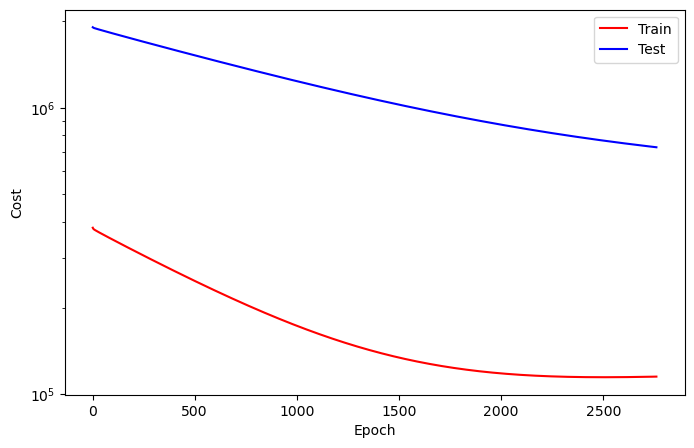

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2761
Train_cost  = 115339.9275 | Test_cost  = 726983.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2762
Train_cost  = 115343.9344 | Test_cost  = 726845.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2763
Train_cost  = 115347.9271 | Test_cost  = 726708.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2764
Train_cost  = 115351.9680 | Test_cost  = 726570.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2765
Train_cost  = 115355.9850 | Test_cost  = 726432.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2766
Train_cost  = 115360.0444 | Test_cost  = 726294.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2767
Train_cost  = 115364.1069 | Test_cost  = 726157.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2768
Train_cost  = 115368.1462 | Test_cost  = 726020.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2769
Train_cost  = 115372.2612 | Test_cost  = 725882.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2770
Train_cost  = 115376.3364 | Test_cost  = 725745.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2771
Train_cost  = 115380.4402 | Test_cost  = 725608.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2772
Train_cost  = 115384.5644 | Test_cost  = 725471.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2773
Train_cost  = 115388.6867 | Test_cost  = 725335.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2774
Train_cost  = 115392.8283 | Test_cost  = 725198.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2775
Train_cost  = 115396.9603 | Test_cost  = 725061.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2776
Train_cost  = 115401.1370 | Test_cost  = 724925.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2777
Train_cost  = 115405.2878 | Test_cost  = 724788.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2778
Train_cost  = 115409.4649 | Test_cost  = 724652.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2779
Train_cost  = 115413.6721 | Test_cost  = 724516.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2780
Train_cost  = 115417.8611 | Test_cost  = 724380.2000 | 


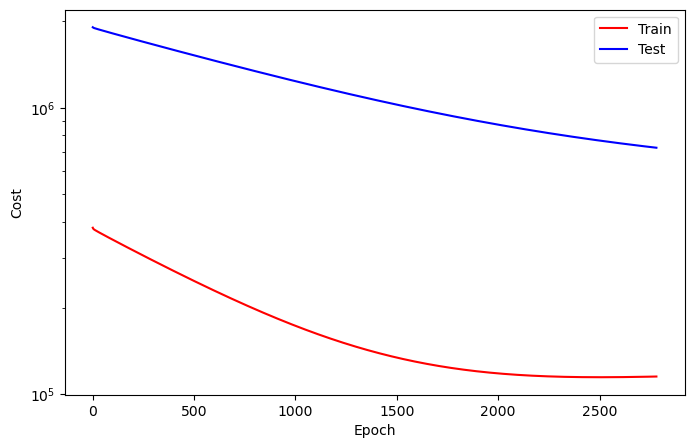

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2781
Train_cost  = 115422.0814 | Test_cost  = 724244.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2782
Train_cost  = 115426.3102 | Test_cost  = 724108.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2783
Train_cost  = 115430.5258 | Test_cost  = 723972.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2784
Train_cost  = 115434.7743 | Test_cost  = 723837.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2785
Train_cost  = 115439.0370 | Test_cost  = 723701.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2786
Train_cost  = 115443.2913 | Test_cost  = 723566.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2787
Train_cost  = 115447.5714 | Test_cost  = 723431.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2788
Train_cost  = 115451.8549 | Test_cost  = 723295.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2789
Train_cost  = 115456.1497 | Test_cost  = 723161.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2790
Train_cost  = 115460.4417 | Test_cost  = 723026.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2791
Train_cost  = 115464.7627 | Test_cost  = 722891.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2792
Train_cost  = 115469.0895 | Test_cost  = 722756.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2793
Train_cost  = 115473.4348 | Test_cost  = 722622.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2794
Train_cost  = 115477.7735 | Test_cost  = 722487.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2795
Train_cost  = 115482.1420 | Test_cost  = 722353.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2796
Train_cost  = 115486.4904 | Test_cost  = 722219.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2797
Train_cost  = 115490.8696 | Test_cost  = 722084.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2798
Train_cost  = 115495.2805 | Test_cost  = 721950.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2799
Train_cost  = 115499.6590 | Test_cost  = 721817.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2800
Train_cost  = 115504.0548 | Test_cost  = 721683.2250 | 


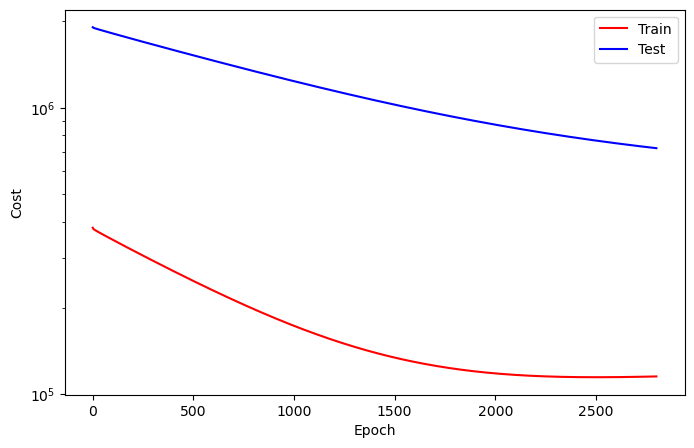

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2801
Train_cost  = 115508.4726 | Test_cost  = 721549.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2802
Train_cost  = 115512.9120 | Test_cost  = 721415.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2803
Train_cost  = 115517.3534 | Test_cost  = 721282.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2804
Train_cost  = 115521.7770 | Test_cost  = 721149.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2805
Train_cost  = 115526.2785 | Test_cost  = 721015.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2806
Train_cost  = 115530.7303 | Test_cost  = 720882.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2807
Train_cost  = 115535.2234 | Test_cost  = 720749.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2808
Train_cost  = 115539.6944 | Test_cost  = 720616.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2809
Train_cost  = 115544.2079 | Test_cost  = 720483.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2810
Train_cost  = 115548.6894 | Test_cost  = 720350.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2811
Train_cost  = 115553.2234 | Test_cost  = 720218.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2812
Train_cost  = 115557.7531 | Test_cost  = 720085.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2813
Train_cost  = 115562.2948 | Test_cost  = 719953.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2814
Train_cost  = 115566.8221 | Test_cost  = 719821.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2815
Train_cost  = 115571.3715 | Test_cost  = 719688.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2816
Train_cost  = 115575.9718 | Test_cost  = 719556.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2817
Train_cost  = 115580.5390 | Test_cost  = 719424.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2818
Train_cost  = 115585.1458 | Test_cost  = 719292.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2819
Train_cost  = 115589.7184 | Test_cost  = 719161.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2820
Train_cost  = 115594.3414 | Test_cost  = 719029.6500 | 


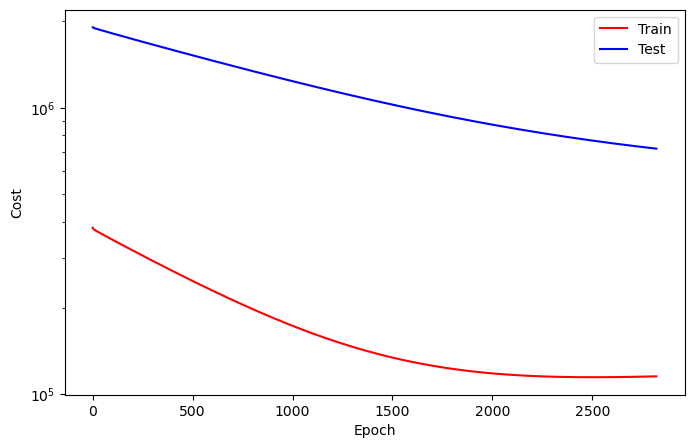

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2821
Train_cost  = 115598.9271 | Test_cost  = 718897.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2822
Train_cost  = 115603.5710 | Test_cost  = 718766.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2823
Train_cost  = 115608.1948 | Test_cost  = 718635.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2824
Train_cost  = 115612.8538 | Test_cost  = 718503.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2825
Train_cost  = 115617.5112 | Test_cost  = 718372.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2826
Train_cost  = 115622.1721 | Test_cost  = 718241.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2827
Train_cost  = 115626.8576 | Test_cost  = 718110.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2828
Train_cost  = 115631.5093 | Test_cost  = 717980.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2829
Train_cost  = 115636.2037 | Test_cost  = 717849.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2830
Train_cost  = 115640.9132 | Test_cost  = 717718.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2831
Train_cost  = 115645.6246 | Test_cost  = 717588.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2832
Train_cost  = 115650.3372 | Test_cost  = 717458.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2833
Train_cost  = 115655.0556 | Test_cost  = 717328.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2834
Train_cost  = 115659.8005 | Test_cost  = 717198.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2835
Train_cost  = 115664.5370 | Test_cost  = 717067.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2836
Train_cost  = 115669.2975 | Test_cost  = 716937.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2837
Train_cost  = 115674.0737 | Test_cost  = 716808.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2838
Train_cost  = 115678.8561 | Test_cost  = 716678.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2839
Train_cost  = 115683.6385 | Test_cost  = 716548.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2840
Train_cost  = 115688.4093 | Test_cost  = 716419.5750 | 


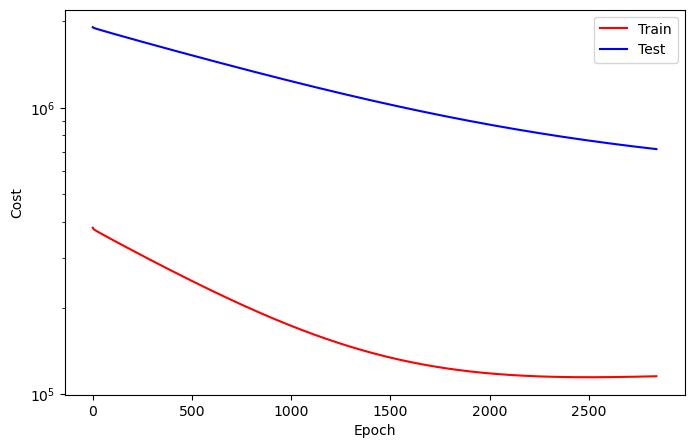

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2841
Train_cost  = 115693.2087 | Test_cost  = 716290.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2842
Train_cost  = 115698.0123 | Test_cost  = 716160.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2843
Train_cost  = 115702.8260 | Test_cost  = 716031.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2844
Train_cost  = 115707.6516 | Test_cost  = 715902.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2845
Train_cost  = 115712.4988 | Test_cost  = 715773.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2846
Train_cost  = 115717.3503 | Test_cost  = 715644.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2847
Train_cost  = 115722.2118 | Test_cost  = 715516.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2848
Train_cost  = 115727.0583 | Test_cost  = 715387.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2849
Train_cost  = 115731.9171 | Test_cost  = 715259.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2850
Train_cost  = 115736.8206 | Test_cost  = 715130.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2851
Train_cost  = 115741.7226 | Test_cost  = 715002.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2852
Train_cost  = 115746.6084 | Test_cost  = 714874.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2853
Train_cost  = 115751.5069 | Test_cost  = 714746.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2854
Train_cost  = 115756.4113 | Test_cost  = 714618.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2855
Train_cost  = 115761.3148 | Test_cost  = 714490.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2856
Train_cost  = 115766.2778 | Test_cost  = 714362.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2857
Train_cost  = 115771.2191 | Test_cost  = 714234.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2858
Train_cost  = 115776.1871 | Test_cost  = 714107.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2859
Train_cost  = 115781.1346 | Test_cost  = 713979.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2860
Train_cost  = 115786.1022 | Test_cost  = 713852.2750 | 


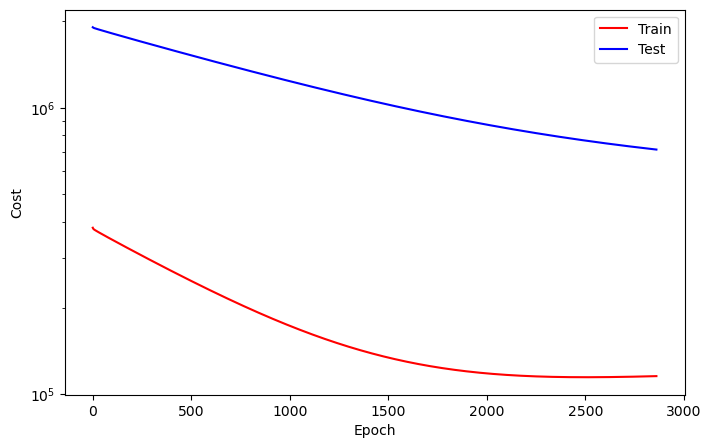

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2861
Train_cost  = 115791.0903 | Test_cost  = 713725.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2862
Train_cost  = 115796.0517 | Test_cost  = 713597.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2863
Train_cost  = 115801.0556 | Test_cost  = 713470.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2864
Train_cost  = 115806.0664 | Test_cost  = 713343.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2865
Train_cost  = 115811.0791 | Test_cost  = 713216.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2866
Train_cost  = 115816.0992 | Test_cost  = 713090.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2867
Train_cost  = 115821.1169 | Test_cost  = 712963.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2868
Train_cost  = 115826.1555 | Test_cost  = 712837.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2869
Train_cost  = 115831.1941 | Test_cost  = 712710.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2870
Train_cost  = 115836.2257 | Test_cost  = 712584.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2871
Train_cost  = 115841.2994 | Test_cost  = 712458.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2872
Train_cost  = 115846.3742 | Test_cost  = 712332.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2873
Train_cost  = 115851.4402 | Test_cost  = 712206.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2874
Train_cost  = 115856.5602 | Test_cost  = 712080.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2875
Train_cost  = 115861.6308 | Test_cost  = 711954.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2876
Train_cost  = 115866.7423 | Test_cost  = 711828.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2877
Train_cost  = 115871.8380 | Test_cost  = 711703.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2878
Train_cost  = 115876.9653 | Test_cost  = 711577.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2879
Train_cost  = 115882.0787 | Test_cost  = 711452.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2880
Train_cost  = 115887.2226 | Test_cost  = 711327.0500 | 


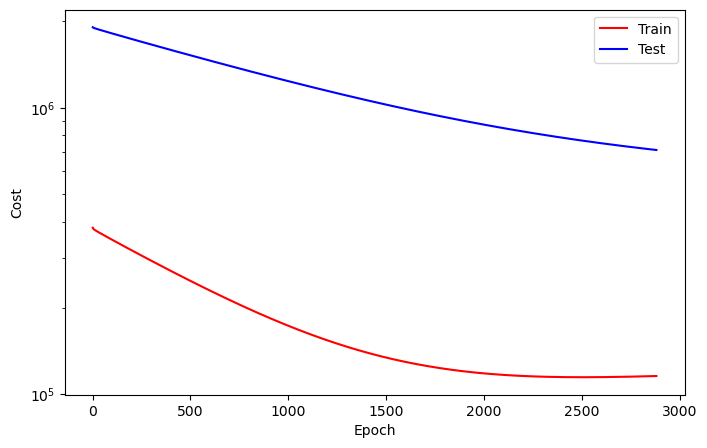

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2881
Train_cost  = 115892.3588 | Test_cost  = 711201.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2882
Train_cost  = 115897.4973 | Test_cost  = 711076.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2883
Train_cost  = 115902.6833 | Test_cost  = 710951.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2884
Train_cost  = 115907.8480 | Test_cost  = 710826.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2885
Train_cost  = 115913.0274 | Test_cost  = 710702.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2886
Train_cost  = 115918.1933 | Test_cost  = 710577.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2887
Train_cost  = 115923.3723 | Test_cost  = 710452.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2888
Train_cost  = 115928.6003 | Test_cost  = 710328.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2889
Train_cost  = 115933.7878 | Test_cost  = 710203.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2890
Train_cost  = 115938.9981 | Test_cost  = 710079.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2891
Train_cost  = 115944.2191 | Test_cost  = 709955.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2892
Train_cost  = 115949.4846 | Test_cost  = 709831.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2893
Train_cost  = 115954.7064 | Test_cost  = 709707.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2894
Train_cost  = 115959.9406 | Test_cost  = 709583.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2895
Train_cost  = 115965.1806 | Test_cost  = 709460.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2896
Train_cost  = 115970.4537 | Test_cost  = 709336.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2897
Train_cost  = 115975.7319 | Test_cost  = 709212.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2898
Train_cost  = 115981.0181 | Test_cost  = 709089.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2899
Train_cost  = 115986.3067 | Test_cost  = 708966.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2900
Train_cost  = 115991.5818 | Test_cost  = 708842.9750 | 


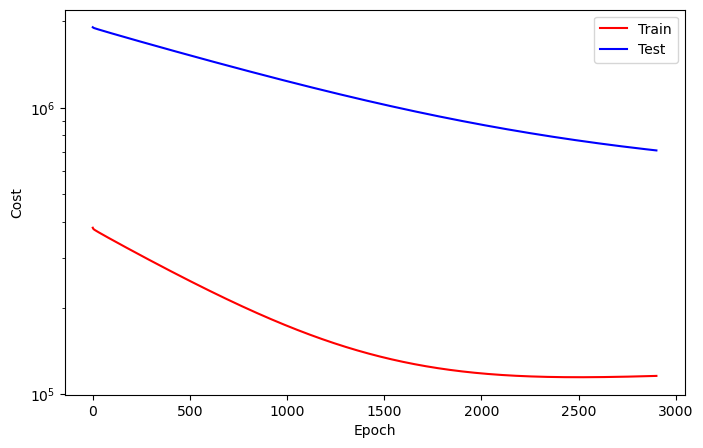

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2901
Train_cost  = 115996.8785 | Test_cost  = 708719.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2902
Train_cost  = 116002.1821 | Test_cost  = 708597.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2903
Train_cost  = 116007.4799 | Test_cost  = 708473.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2904
Train_cost  = 116012.8017 | Test_cost  = 708351.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2905
Train_cost  = 116018.1524 | Test_cost  = 708228.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2906
Train_cost  = 116023.5035 | Test_cost  = 708105.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2907
Train_cost  = 116028.8445 | Test_cost  = 707983.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2908
Train_cost  = 116034.1698 | Test_cost  = 707861.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2909
Train_cost  = 116039.5201 | Test_cost  = 707738.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2910
Train_cost  = 116044.8873 | Test_cost  = 707616.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2911
Train_cost  = 116050.2662 | Test_cost  = 707494.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2912
Train_cost  = 116055.6451 | Test_cost  = 707372.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2913
Train_cost  = 116061.0683 | Test_cost  = 707250.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2914
Train_cost  = 116066.4641 | Test_cost  = 707128.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2915
Train_cost  = 116071.8376 | Test_cost  = 707007.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2916
Train_cost  = 116077.2373 | Test_cost  = 706885.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2917
Train_cost  = 116082.6605 | Test_cost  = 706763.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2918
Train_cost  = 116088.0926 | Test_cost  = 706642.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2919
Train_cost  = 116093.5285 | Test_cost  = 706521.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2920
Train_cost  = 116098.9660 | Test_cost  = 706399.9250 | 


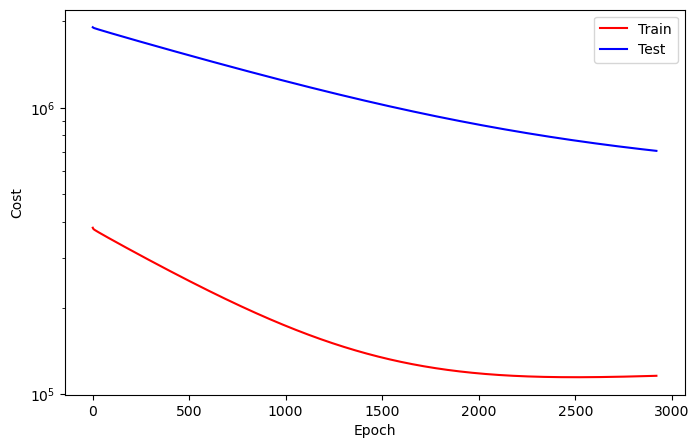

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2921
Train_cost  = 116104.4020 | Test_cost  = 706279.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2922
Train_cost  = 116109.8630 | Test_cost  = 706158.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2923
Train_cost  = 116115.3075 | Test_cost  = 706037.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2924
Train_cost  = 116120.7878 | Test_cost  = 705916.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2925
Train_cost  = 116126.2527 | Test_cost  = 705795.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2926
Train_cost  = 116131.7307 | Test_cost  = 705674.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2927
Train_cost  = 116137.2323 | Test_cost  = 705554.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2928
Train_cost  = 116142.7396 | Test_cost  = 705434.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2929
Train_cost  = 116148.2265 | Test_cost  = 705313.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2930
Train_cost  = 116153.7079 | Test_cost  = 705193.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2931
Train_cost  = 116159.2523 | Test_cost  = 705073.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2932
Train_cost  = 116164.7662 | Test_cost  = 704953.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2933
Train_cost  = 116170.2924 | Test_cost  = 704833.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2934
Train_cost  = 116175.8519 | Test_cost  = 704713.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2935
Train_cost  = 116181.3893 | Test_cost  = 704594.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2936
Train_cost  = 116186.9309 | Test_cost  = 704474.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2937
Train_cost  = 116192.4877 | Test_cost  = 704355.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2938
Train_cost  = 116198.0598 | Test_cost  = 704235.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2939
Train_cost  = 116203.6003 | Test_cost  = 704116.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2940
Train_cost  = 116209.1968 | Test_cost  = 703997.2500 | 


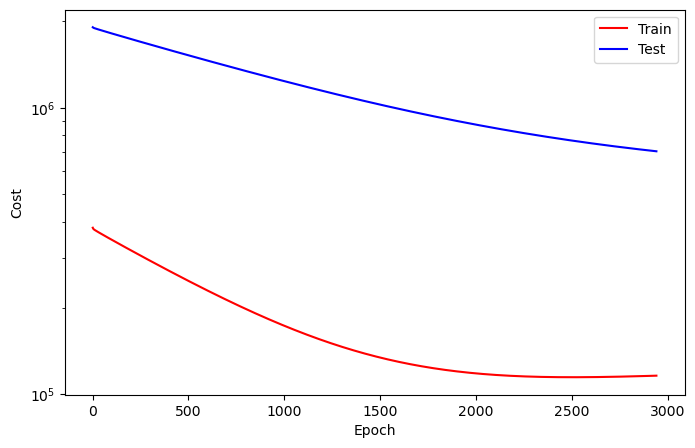

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2941
Train_cost  = 116214.7905 | Test_cost  = 703878.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2942
Train_cost  = 116220.3927 | Test_cost  = 703759.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2943
Train_cost  = 116225.9699 | Test_cost  = 703640.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2944
Train_cost  = 116231.5691 | Test_cost  = 703521.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2945
Train_cost  = 116237.1821 | Test_cost  = 703402.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2946
Train_cost  = 116242.7801 | Test_cost  = 703284.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2947
Train_cost  = 116248.4159 | Test_cost  = 703165.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2948
Train_cost  = 116254.0486 | Test_cost  = 703047.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2949
Train_cost  = 116259.6921 | Test_cost  = 702928.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2950
Train_cost  = 116265.3468 | Test_cost  = 702810.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2951
Train_cost  = 116270.9985 | Test_cost  = 702692.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2952
Train_cost  = 116276.6400 | Test_cost  = 702574.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2953
Train_cost  = 116282.3056 | Test_cost  = 702456.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2954
Train_cost  = 116287.9653 | Test_cost  = 702338.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2955
Train_cost  = 116293.6474 | Test_cost  = 702221.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2956
Train_cost  = 116299.3144 | Test_cost  = 702103.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2957
Train_cost  = 116305.0123 | Test_cost  = 701986.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2958
Train_cost  = 116310.7188 | Test_cost  = 701868.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2959
Train_cost  = 116316.4163 | Test_cost  = 701751.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2960
Train_cost  = 116322.0984 | Test_cost  = 701634.0750 | 


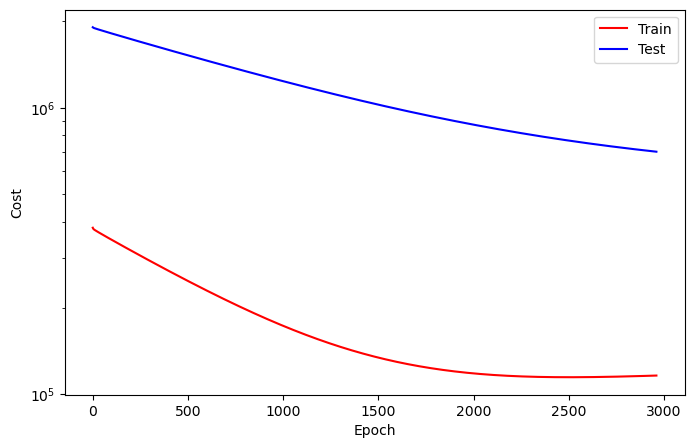

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2961
Train_cost  = 116327.8341 | Test_cost  = 701516.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2962
Train_cost  = 116333.5509 | Test_cost  = 701399.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2963
Train_cost  = 116339.2751 | Test_cost  = 701282.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2964
Train_cost  = 116345.0058 | Test_cost  = 701166.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2965
Train_cost  = 116350.7477 | Test_cost  = 701049.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2966
Train_cost  = 116356.4884 | Test_cost  = 700932.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2967
Train_cost  = 116362.2157 | Test_cost  = 700816.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2968
Train_cost  = 116367.9838 | Test_cost  = 700699.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2969
Train_cost  = 116373.7654 | Test_cost  = 700583.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2970
Train_cost  = 116379.5463 | Test_cost  = 700466.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2971
Train_cost  = 116385.3110 | Test_cost  = 700350.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2972
Train_cost  = 116391.0891 | Test_cost  = 700234.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2973
Train_cost  = 116396.8735 | Test_cost  = 700118.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2974
Train_cost  = 116402.6605 | Test_cost  = 700002.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2975
Train_cost  = 116408.4680 | Test_cost  = 699886.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2976
Train_cost  = 116414.2801 | Test_cost  = 699770.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2977
Train_cost  = 116420.1242 | Test_cost  = 699655.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2978
Train_cost  = 116425.9174 | Test_cost  = 699540.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2979
Train_cost  = 116431.7469 | Test_cost  = 699424.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2980
Train_cost  = 116437.5772 | Test_cost  = 699309.3750 | 


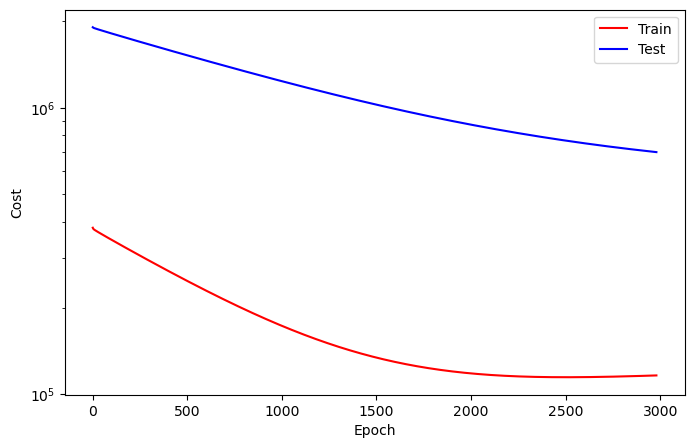

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2981
Train_cost  = 116443.4101 | Test_cost  = 699194.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2982
Train_cost  = 116449.2515 | Test_cost  = 699078.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2983
Train_cost  = 116455.1030 | Test_cost  = 698963.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2984
Train_cost  = 116460.9340 | Test_cost  = 698848.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2985
Train_cost  = 116466.8140 | Test_cost  = 698734.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2986
Train_cost  = 116472.6829 | Test_cost  = 698619.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2987
Train_cost  = 116478.5482 | Test_cost  = 698504.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2988
Train_cost  = 116484.4120 | Test_cost  = 698390.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2989
Train_cost  = 116490.3005 | Test_cost  = 698275.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2990
Train_cost  = 116496.1686 | Test_cost  = 698161.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2991
Train_cost  = 116502.0679 | Test_cost  = 698046.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2992
Train_cost  = 116507.9977 | Test_cost  = 697932.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2993
Train_cost  = 116513.9012 | Test_cost  = 697818.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2994
Train_cost  = 116519.8198 | Test_cost  = 697704.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2995
Train_cost  = 116525.7064 | Test_cost  = 697591.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2996
Train_cost  = 116531.6300 | Test_cost  = 697477.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2997
Train_cost  = 116537.5610 | Test_cost  = 697363.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2998
Train_cost  = 116543.4811 | Test_cost  = 697249.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  2999
Train_cost  = 116549.4340 | Test_cost  = 697136.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3000
Train_cost  = 116555.3777 | Test_cost  = 697022.8250 | 


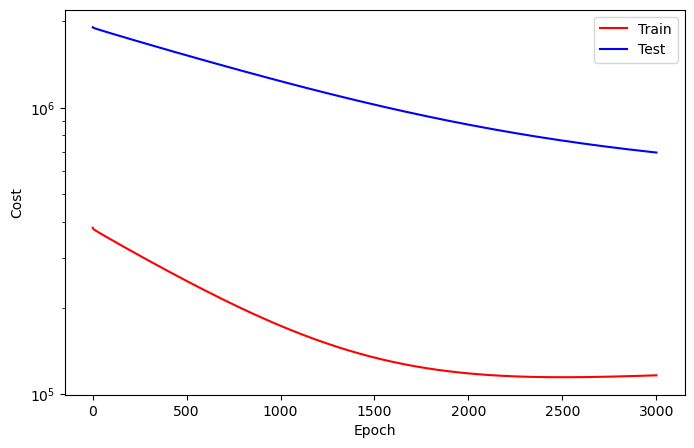

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3001
Train_cost  = 116561.3272 | Test_cost  = 696909.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3002
Train_cost  = 116567.2758 | Test_cost  = 696796.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3003
Train_cost  = 116573.2319 | Test_cost  = 696683.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3004
Train_cost  = 116579.1995 | Test_cost  = 696570.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3005
Train_cost  = 116585.1424 | Test_cost  = 696457.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3006
Train_cost  = 116591.1404 | Test_cost  = 696344.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3007
Train_cost  = 116597.1319 | Test_cost  = 696231.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3008
Train_cost  = 116603.1258 | Test_cost  = 696119.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3009
Train_cost  = 116609.1181 | Test_cost  = 696006.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3010
Train_cost  = 116615.1335 | Test_cost  = 695894.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3011
Train_cost  = 116621.1038 | Test_cost  = 695781.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3012
Train_cost  = 116627.1003 | Test_cost  = 695669.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3013
Train_cost  = 116633.1393 | Test_cost  = 695557.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3014
Train_cost  = 116639.1597 | Test_cost  = 695444.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3015
Train_cost  = 116645.1821 | Test_cost  = 695333.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3016
Train_cost  = 116651.1894 | Test_cost  = 695221.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3017
Train_cost  = 116657.2245 | Test_cost  = 695109.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3018
Train_cost  = 116663.2647 | Test_cost  = 694997.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3019
Train_cost  = 116669.3083 | Test_cost  = 694886.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3020
Train_cost  = 116675.3318 | Test_cost  = 694774.6750 | 


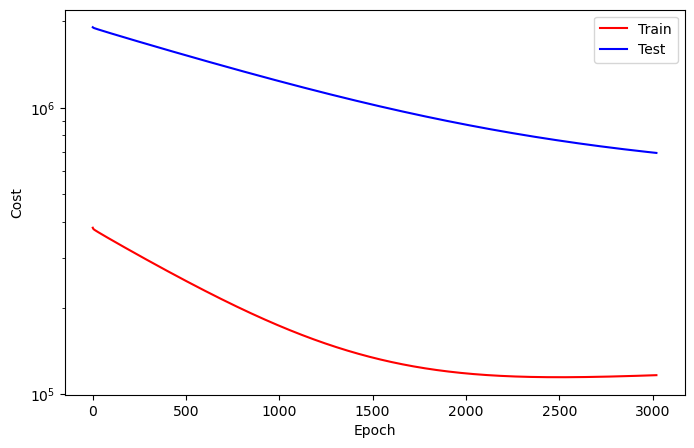

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3021
Train_cost  = 116681.3943 | Test_cost  = 694663.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3022
Train_cost  = 116687.4942 | Test_cost  = 694551.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3023
Train_cost  = 116693.5436 | Test_cost  = 694440.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3024
Train_cost  = 116699.6111 | Test_cost  = 694329.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3025
Train_cost  = 116705.6941 | Test_cost  = 694217.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3026
Train_cost  = 116711.7801 | Test_cost  = 694107.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3027
Train_cost  = 116717.8519 | Test_cost  = 693996.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3028
Train_cost  = 116723.9514 | Test_cost  = 693885.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3029
Train_cost  = 116730.0486 | Test_cost  = 693774.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3030
Train_cost  = 116736.1624 | Test_cost  = 693663.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3031
Train_cost  = 116742.2492 | Test_cost  = 693553.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3032
Train_cost  = 116748.3603 | Test_cost  = 693443.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3033
Train_cost  = 116754.4788 | Test_cost  = 693332.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3034
Train_cost  = 116760.6084 | Test_cost  = 693222.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3035
Train_cost  = 116766.6883 | Test_cost  = 693112.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3036
Train_cost  = 116772.8383 | Test_cost  = 693002.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3037
Train_cost  = 116778.9799 | Test_cost  = 692892.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3038
Train_cost  = 116785.1165 | Test_cost  = 692782.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3039
Train_cost  = 116791.2662 | Test_cost  = 692672.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3040
Train_cost  = 116797.4244 | Test_cost  = 692563.0750 | 


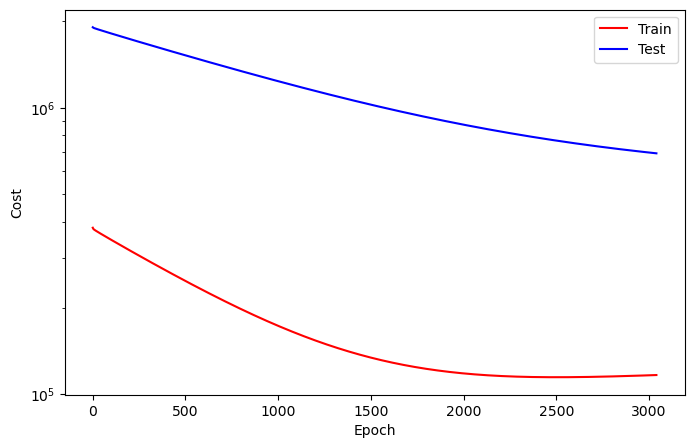

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3041
Train_cost  = 116803.5517 | Test_cost  = 692453.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3042
Train_cost  = 116809.7049 | Test_cost  = 692344.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3043
Train_cost  = 116815.8542 | Test_cost  = 692234.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3044
Train_cost  = 116822.0463 | Test_cost  = 692125.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3045
Train_cost  = 116828.1983 | Test_cost  = 692015.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3046
Train_cost  = 116834.3900 | Test_cost  = 691906.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3047
Train_cost  = 116840.5532 | Test_cost  = 691797.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3048
Train_cost  = 116846.7477 | Test_cost  = 691688.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3049
Train_cost  = 116852.9390 | Test_cost  = 691579.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3050
Train_cost  = 116859.1331 | Test_cost  = 691471.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3051
Train_cost  = 116865.3302 | Test_cost  = 691362.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3052
Train_cost  = 116871.5305 | Test_cost  = 691253.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3053
Train_cost  = 116877.7253 | Test_cost  = 691145.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3054
Train_cost  = 116883.9429 | Test_cost  = 691036.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3055
Train_cost  = 116890.1671 | Test_cost  = 690928.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3056
Train_cost  = 116896.4120 | Test_cost  = 690820.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3057
Train_cost  = 116902.6254 | Test_cost  = 690712.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3058
Train_cost  = 116908.8333 | Test_cost  = 690604.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3059
Train_cost  = 116915.0849 | Test_cost  = 690495.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3060
Train_cost  = 116921.3623 | Test_cost  = 690388.0500 | 


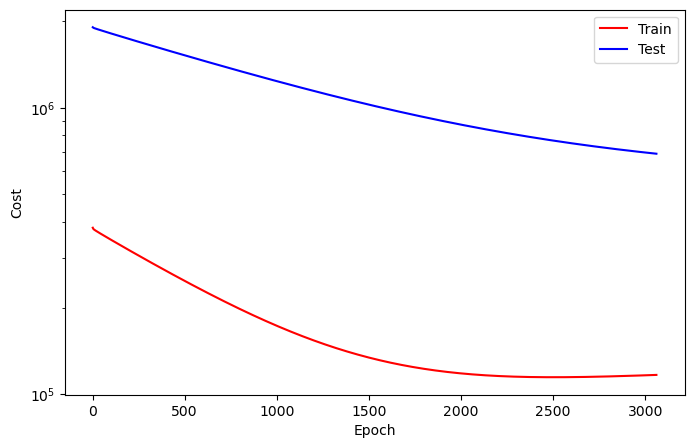

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3061
Train_cost  = 116927.5930 | Test_cost  = 690280.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3062
Train_cost  = 116933.8414 | Test_cost  = 690172.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3063
Train_cost  = 116940.0899 | Test_cost  = 690064.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3064
Train_cost  = 116946.3445 | Test_cost  = 689957.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3065
Train_cost  = 116952.5926 | Test_cost  = 689849.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3066
Train_cost  = 116958.8711 | Test_cost  = 689742.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3067
Train_cost  = 116965.1443 | Test_cost  = 689635.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3068
Train_cost  = 116971.4163 | Test_cost  = 689527.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3069
Train_cost  = 116977.6775 | Test_cost  = 689420.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3070
Train_cost  = 116984.0123 | Test_cost  = 689313.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3071
Train_cost  = 116990.2735 | Test_cost  = 689206.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3072
Train_cost  = 116996.5478 | Test_cost  = 689100.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3073
Train_cost  = 117002.8534 | Test_cost  = 688993.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3074
Train_cost  = 117009.1474 | Test_cost  = 688886.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3075
Train_cost  = 117015.4749 | Test_cost  = 688780.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3076
Train_cost  = 117021.7766 | Test_cost  = 688673.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3077
Train_cost  = 117028.0706 | Test_cost  = 688567.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3078
Train_cost  = 117034.3796 | Test_cost  = 688460.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3079
Train_cost  = 117040.7369 | Test_cost  = 688354.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3080
Train_cost  = 117047.0478 | Test_cost  = 688248.7000 | 


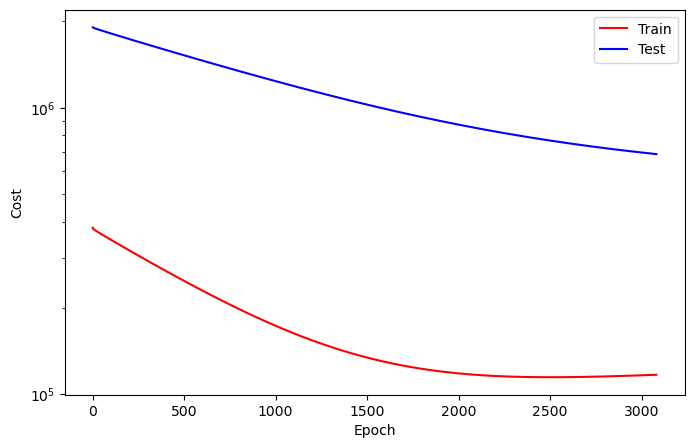

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3081
Train_cost  = 117053.3665 | Test_cost  = 688142.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3082
Train_cost  = 117059.7052 | Test_cost  = 688036.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3083
Train_cost  = 117066.0610 | Test_cost  = 687930.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3084
Train_cost  = 117072.3792 | Test_cost  = 687825.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3085
Train_cost  = 117078.7133 | Test_cost  = 687719.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3086
Train_cost  = 117085.0895 | Test_cost  = 687613.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3087
Train_cost  = 117091.4344 | Test_cost  = 687508.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3088
Train_cost  = 117097.7863 | Test_cost  = 687402.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3089
Train_cost  = 117104.1443 | Test_cost  = 687297.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3090
Train_cost  = 117110.4826 | Test_cost  = 687192.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3091
Train_cost  = 117116.8781 | Test_cost  = 687087.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3092
Train_cost  = 117123.2431 | Test_cost  = 686982.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3093
Train_cost  = 117129.6061 | Test_cost  = 686877.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3094
Train_cost  = 117135.9961 | Test_cost  = 686772.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3095
Train_cost  = 117142.3846 | Test_cost  = 686667.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3096
Train_cost  = 117148.7782 | Test_cost  = 686562.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3097
Train_cost  = 117155.1377 | Test_cost  = 686458.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3098
Train_cost  = 117161.5494 | Test_cost  = 686353.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3099
Train_cost  = 117167.9441 | Test_cost  = 686249.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3100
Train_cost  = 117174.3611 | Test_cost  = 686144.9000 | 


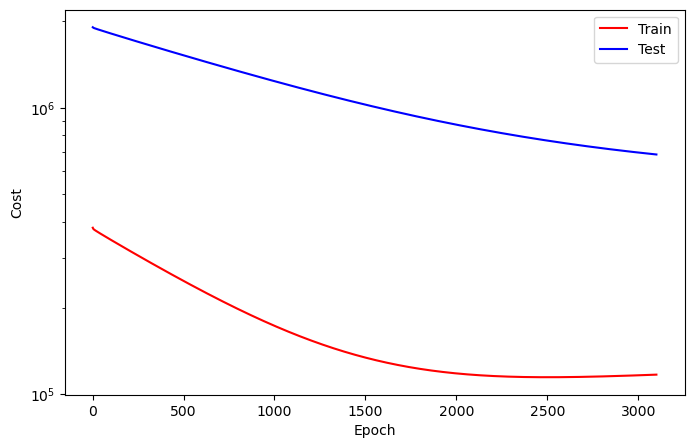

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3101
Train_cost  = 117180.7593 | Test_cost  = 686040.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3102
Train_cost  = 117187.1713 | Test_cost  = 685936.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3103
Train_cost  = 117193.5660 | Test_cost  = 685832.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3104
Train_cost  = 117200.0019 | Test_cost  = 685728.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3105
Train_cost  = 117206.3858 | Test_cost  = 685624.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3106
Train_cost  = 117212.8542 | Test_cost  = 685520.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3107
Train_cost  = 117219.2639 | Test_cost  = 685417.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3108
Train_cost  = 117225.6636 | Test_cost  = 685313.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3109
Train_cost  = 117232.1073 | Test_cost  = 685209.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3110
Train_cost  = 117238.5347 | Test_cost  = 685106.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3111
Train_cost  = 117245.0147 | Test_cost  = 685003.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3112
Train_cost  = 117251.4444 | Test_cost  = 684899.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3113
Train_cost  = 117257.8727 | Test_cost  = 684796.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3114
Train_cost  = 117264.3511 | Test_cost  = 684693.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3115
Train_cost  = 117270.7971 | Test_cost  = 684590.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3116
Train_cost  = 117277.2438 | Test_cost  = 684487.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3117
Train_cost  = 117283.7091 | Test_cost  = 684384.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3118
Train_cost  = 117290.1860 | Test_cost  = 684281.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3119
Train_cost  = 117296.6505 | Test_cost  = 684178.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3120
Train_cost  = 117303.1204 | Test_cost  = 684076.1000 | 


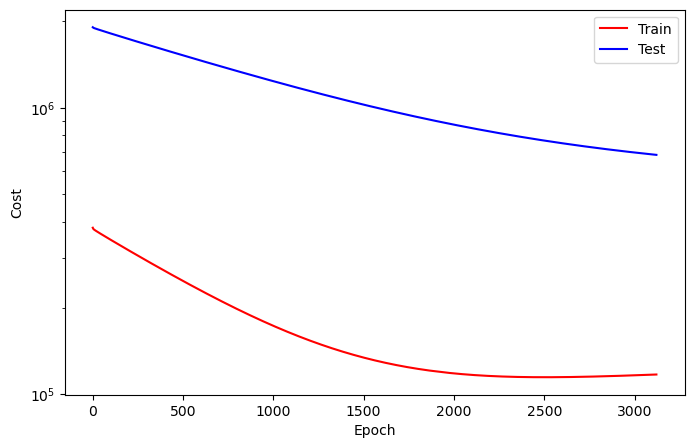

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3121
Train_cost  = 117309.6019 | Test_cost  = 683973.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3122
Train_cost  = 117316.0895 | Test_cost  = 683871.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3123
Train_cost  = 117322.5571 | Test_cost  = 683769.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3124
Train_cost  = 117329.0424 | Test_cost  = 683666.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3125
Train_cost  = 117335.5270 | Test_cost  = 683564.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3126
Train_cost  = 117342.0347 | Test_cost  = 683462.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3127
Train_cost  = 117348.5309 | Test_cost  = 683360.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3128
Train_cost  = 117355.0185 | Test_cost  = 683258.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3129
Train_cost  = 117361.5301 | Test_cost  = 683156.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3130
Train_cost  = 117368.0455 | Test_cost  = 683054.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3131
Train_cost  = 117374.5316 | Test_cost  = 682953.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3132
Train_cost  = 117381.0471 | Test_cost  = 682851.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3133
Train_cost  = 117387.5548 | Test_cost  = 682750.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3134
Train_cost  = 117394.0818 | Test_cost  = 682648.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3135
Train_cost  = 117400.5965 | Test_cost  = 682547.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3136
Train_cost  = 117407.1188 | Test_cost  = 682446.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3137
Train_cost  = 117413.6535 | Test_cost  = 682344.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3138
Train_cost  = 117420.1929 | Test_cost  = 682243.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3139
Train_cost  = 117426.7230 | Test_cost  = 682143.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3140
Train_cost  = 117433.2353 | Test_cost  = 682042.1500 | 


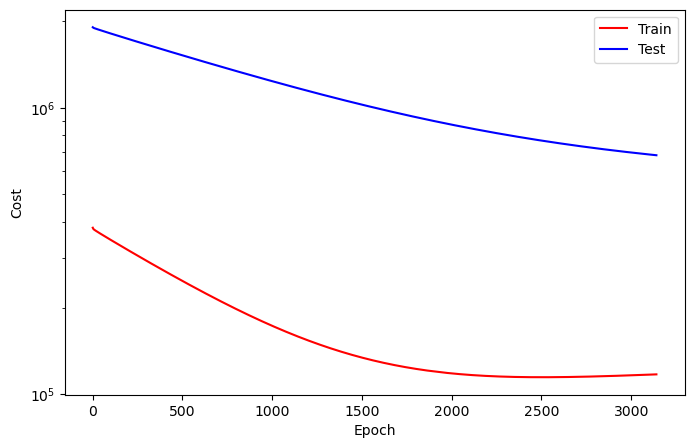

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3141
Train_cost  = 117439.7809 | Test_cost  = 681941.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3142
Train_cost  = 117446.3040 | Test_cost  = 681840.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3143
Train_cost  = 117452.8773 | Test_cost  = 681739.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3144
Train_cost  = 117459.4313 | Test_cost  = 681639.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3145
Train_cost  = 117465.9853 | Test_cost  = 681538.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3146
Train_cost  = 117472.5540 | Test_cost  = 681438.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3147
Train_cost  = 117479.1026 | Test_cost  = 681338.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3148
Train_cost  = 117485.6366 | Test_cost  = 681237.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3149
Train_cost  = 117492.2091 | Test_cost  = 681137.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3150
Train_cost  = 117498.7546 | Test_cost  = 681037.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3151
Train_cost  = 117505.3310 | Test_cost  = 680937.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3152
Train_cost  = 117511.9236 | Test_cost  = 680837.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3153
Train_cost  = 117518.4992 | Test_cost  = 680738.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3154
Train_cost  = 117525.0748 | Test_cost  = 680638.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3155
Train_cost  = 117531.6852 | Test_cost  = 680538.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3156
Train_cost  = 117538.2454 | Test_cost  = 680438.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3157
Train_cost  = 117544.8356 | Test_cost  = 680339.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3158
Train_cost  = 117551.4259 | Test_cost  = 680240.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3159
Train_cost  = 117558.0147 | Test_cost  = 680140.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3160
Train_cost  = 117564.5949 | Test_cost  = 680041.4000 | 


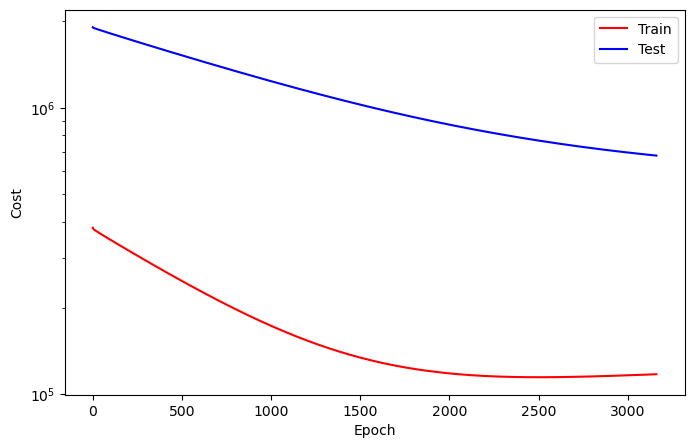

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3161
Train_cost  = 117571.2014 | Test_cost  = 679942.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3162
Train_cost  = 117577.8272 | Test_cost  = 679843.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3163
Train_cost  = 117584.4591 | Test_cost  = 679743.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3164
Train_cost  = 117591.0548 | Test_cost  = 679645.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3165
Train_cost  = 117597.6512 | Test_cost  = 679546.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3166
Train_cost  = 117604.2662 | Test_cost  = 679447.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3167
Train_cost  = 117610.8735 | Test_cost  = 679348.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3168
Train_cost  = 117617.4931 | Test_cost  = 679250.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3169
Train_cost  = 117624.1319 | Test_cost  = 679151.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3170
Train_cost  = 117630.7508 | Test_cost  = 679053.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3171
Train_cost  = 117637.3881 | Test_cost  = 678954.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3172
Train_cost  = 117644.0123 | Test_cost  = 678856.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3173
Train_cost  = 117650.6505 | Test_cost  = 678758.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3174
Train_cost  = 117657.2824 | Test_cost  = 678660.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3175
Train_cost  = 117663.9306 | Test_cost  = 678562.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3176
Train_cost  = 117670.5093 | Test_cost  = 678464.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3177
Train_cost  = 117677.1806 | Test_cost  = 678366.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3178
Train_cost  = 117683.8318 | Test_cost  = 678268.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3179
Train_cost  = 117690.5000 | Test_cost  = 678171.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3180
Train_cost  = 117697.1235 | Test_cost  = 678073.6250 | 


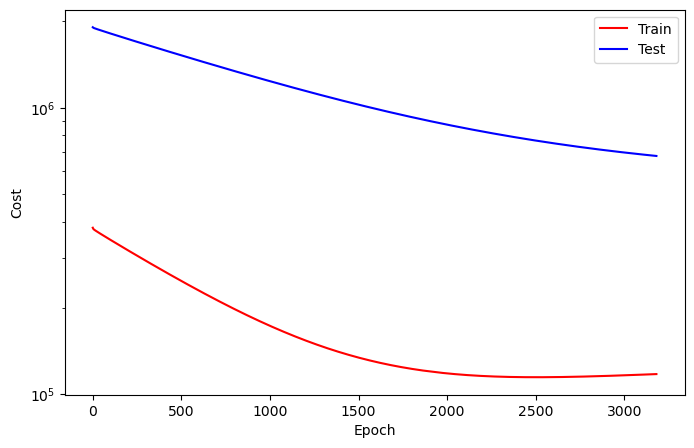

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3181
Train_cost  = 117703.8025 | Test_cost  = 677976.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3182
Train_cost  = 117710.4375 | Test_cost  = 677878.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3183
Train_cost  = 117717.1088 | Test_cost  = 677781.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3184
Train_cost  = 117723.7346 | Test_cost  = 677683.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3185
Train_cost  = 117730.4228 | Test_cost  = 677586.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3186
Train_cost  = 117737.0772 | Test_cost  = 677489.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3187
Train_cost  = 117743.7608 | Test_cost  = 677392.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3188
Train_cost  = 117750.4352 | Test_cost  = 677295.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3189
Train_cost  = 117757.0926 | Test_cost  = 677198.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3190
Train_cost  = 117763.7755 | Test_cost  = 677102.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3191
Train_cost  = 117770.4336 | Test_cost  = 677005.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3192
Train_cost  = 117777.1435 | Test_cost  = 676908.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3193
Train_cost  = 117783.8079 | Test_cost  = 676812.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3194
Train_cost  = 117790.4738 | Test_cost  = 676715.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3195
Train_cost  = 117797.1813 | Test_cost  = 676619.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3196
Train_cost  = 117803.8642 | Test_cost  = 676523.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3197
Train_cost  = 117810.5586 | Test_cost  = 676426.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3198
Train_cost  = 117817.2500 | Test_cost  = 676330.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3199
Train_cost  = 117823.9390 | Test_cost  = 676234.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3200
Train_cost  = 117830.6250 | Test_cost  = 676138.4750 | 


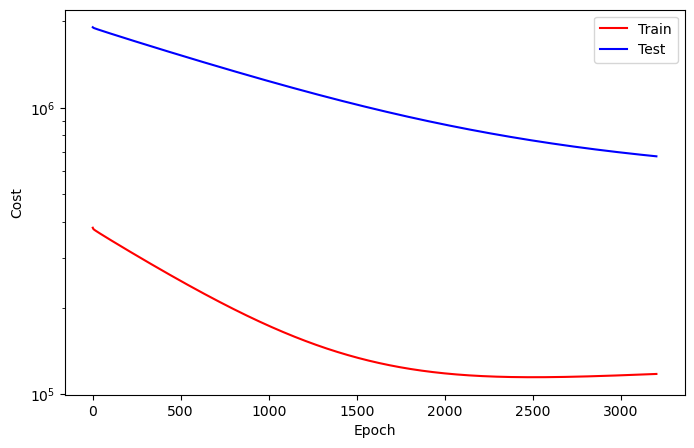

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3201
Train_cost  = 117837.3310 | Test_cost  = 676042.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3202
Train_cost  = 117844.0247 | Test_cost  = 675946.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3203
Train_cost  = 117850.7315 | Test_cost  = 675851.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3204
Train_cost  = 117857.4491 | Test_cost  = 675755.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3205
Train_cost  = 117864.1605 | Test_cost  = 675660.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3206
Train_cost  = 117870.8395 | Test_cost  = 675564.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3207
Train_cost  = 117877.5671 | Test_cost  = 675469.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3208
Train_cost  = 117884.2685 | Test_cost  = 675373.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3209
Train_cost  = 117890.9900 | Test_cost  = 675278.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3210
Train_cost  = 117897.7245 | Test_cost  = 675183.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3211
Train_cost  = 117904.4213 | Test_cost  = 675088.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3212
Train_cost  = 117911.1412 | Test_cost  = 674993.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3213
Train_cost  = 117917.8742 | Test_cost  = 674898.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3214
Train_cost  = 117924.5910 | Test_cost  = 674803.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3215
Train_cost  = 117931.3218 | Test_cost  = 674708.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3216
Train_cost  = 117938.0733 | Test_cost  = 674614.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3217
Train_cost  = 117944.7909 | Test_cost  = 674519.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3218
Train_cost  = 117951.5270 | Test_cost  = 674424.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3219
Train_cost  = 117958.2670 | Test_cost  = 674330.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3220
Train_cost  = 117965.0023 | Test_cost  = 674235.8750 | 


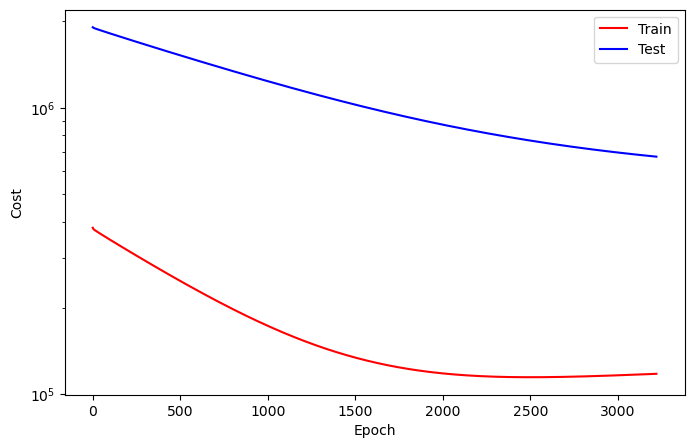

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3221
Train_cost  = 117971.7654 | Test_cost  = 674141.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3222
Train_cost  = 117978.4946 | Test_cost  = 674047.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3223
Train_cost  = 117985.2384 | Test_cost  = 673953.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3224
Train_cost  = 117991.9784 | Test_cost  = 673859.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3225
Train_cost  = 117998.7307 | Test_cost  = 673765.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3226
Train_cost  = 118005.4715 | Test_cost  = 673671.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3227
Train_cost  = 118012.2353 | Test_cost  = 673577.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3228
Train_cost  = 118019.0077 | Test_cost  = 673483.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3229
Train_cost  = 118025.7654 | Test_cost  = 673389.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3230
Train_cost  = 118032.5216 | Test_cost  = 673296.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3231
Train_cost  = 118039.2762 | Test_cost  = 673203.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3232
Train_cost  = 118046.0177 | Test_cost  = 673109.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3233
Train_cost  = 118052.7847 | Test_cost  = 673016.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3234
Train_cost  = 118059.5370 | Test_cost  = 672923.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3235
Train_cost  = 118066.3063 | Test_cost  = 672829.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3236
Train_cost  = 118073.0995 | Test_cost  = 672736.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3237
Train_cost  = 118079.8588 | Test_cost  = 672643.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3238
Train_cost  = 118086.6397 | Test_cost  = 672550.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3239
Train_cost  = 118093.4360 | Test_cost  = 672457.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3240
Train_cost  = 118100.1813 | Test_cost  = 672365.0250 | 


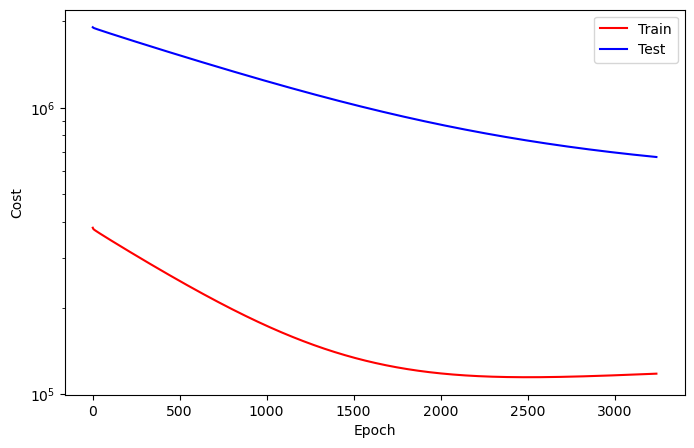

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3241
Train_cost  = 118106.9606 | Test_cost  = 672272.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3242
Train_cost  = 118113.7330 | Test_cost  = 672179.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3243
Train_cost  = 118120.5162 | Test_cost  = 672086.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3244
Train_cost  = 118127.2924 | Test_cost  = 671994.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3245
Train_cost  = 118134.0833 | Test_cost  = 671901.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3246
Train_cost  = 118140.8981 | Test_cost  = 671809.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3247
Train_cost  = 118147.6998 | Test_cost  = 671717.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3248
Train_cost  = 118154.4815 | Test_cost  = 671625.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3249
Train_cost  = 118161.2407 | Test_cost  = 671533.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3250
Train_cost  = 118168.0378 | Test_cost  = 671441.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3251
Train_cost  = 118174.8248 | Test_cost  = 671349.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3252
Train_cost  = 118181.6273 | Test_cost  = 671257.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3253
Train_cost  = 118188.4182 | Test_cost  = 671165.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3254
Train_cost  = 118195.2307 | Test_cost  = 671073.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3255
Train_cost  = 118202.0262 | Test_cost  = 670981.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3256
Train_cost  = 118208.8526 | Test_cost  = 670890.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3257
Train_cost  = 118215.6574 | Test_cost  = 670798.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3258
Train_cost  = 118222.4414 | Test_cost  = 670707.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3259
Train_cost  = 118229.2577 | Test_cost  = 670616.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3260
Train_cost  = 118236.0448 | Test_cost  = 670524.8250 | 


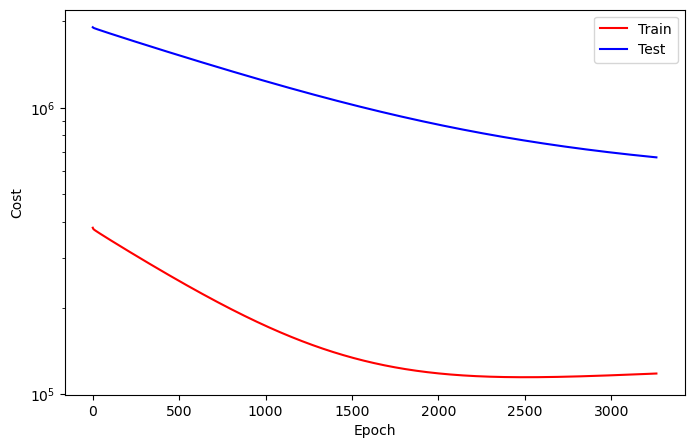

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3261
Train_cost  = 118242.8688 | Test_cost  = 670433.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3262
Train_cost  = 118249.6721 | Test_cost  = 670342.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3263
Train_cost  = 118256.5000 | Test_cost  = 670251.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3264
Train_cost  = 118263.3218 | Test_cost  = 670160.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3265
Train_cost  = 118270.1590 | Test_cost  = 670069.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3266
Train_cost  = 118276.9954 | Test_cost  = 669978.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3267
Train_cost  = 118283.7948 | Test_cost  = 669887.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3268
Train_cost  = 118290.6173 | Test_cost  = 669797.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3269
Train_cost  = 118297.4259 | Test_cost  = 669706.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3270
Train_cost  = 118304.2569 | Test_cost  = 669615.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3271
Train_cost  = 118311.0671 | Test_cost  = 669525.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3272
Train_cost  = 118317.9043 | Test_cost  = 669434.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3273
Train_cost  = 118324.7253 | Test_cost  = 669344.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3274
Train_cost  = 118331.6019 | Test_cost  = 669254.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3275
Train_cost  = 118338.4298 | Test_cost  = 669164.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3276
Train_cost  = 118345.2546 | Test_cost  = 669074.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3277
Train_cost  = 118352.0687 | Test_cost  = 668984.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3278
Train_cost  = 118358.8873 | Test_cost  = 668894.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3279
Train_cost  = 118365.7323 | Test_cost  = 668804.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3280
Train_cost  = 118372.5625 | Test_cost  = 668714.7250 | 


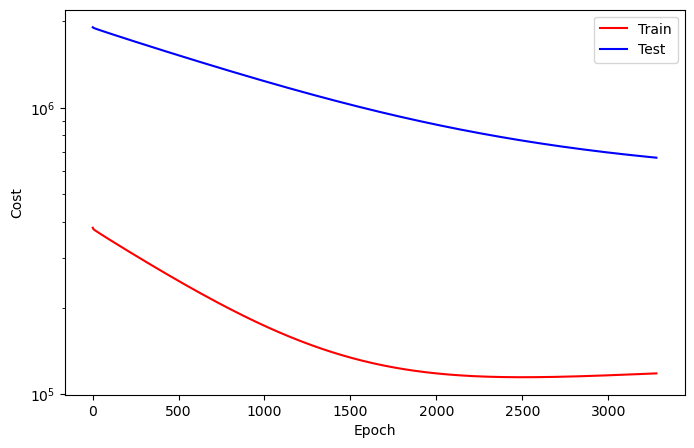

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3281
Train_cost  = 118379.4051 | Test_cost  = 668624.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3282
Train_cost  = 118386.2716 | Test_cost  = 668535.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3283
Train_cost  = 118393.1096 | Test_cost  = 668445.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3284
Train_cost  = 118399.9352 | Test_cost  = 668356.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3285
Train_cost  = 118406.7755 | Test_cost  = 668267.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3286
Train_cost  = 118413.6211 | Test_cost  = 668177.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3287
Train_cost  = 118420.4560 | Test_cost  = 668088.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3288
Train_cost  = 118427.2971 | Test_cost  = 667999.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3289
Train_cost  = 118434.1520 | Test_cost  = 667910.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3290
Train_cost  = 118440.9869 | Test_cost  = 667821.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3291
Train_cost  = 118447.8596 | Test_cost  = 667732.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3292
Train_cost  = 118454.7022 | Test_cost  = 667643.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3293
Train_cost  = 118461.5594 | Test_cost  = 667554.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3294
Train_cost  = 118468.4105 | Test_cost  = 667466.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3295
Train_cost  = 118475.2492 | Test_cost  = 667377.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3296
Train_cost  = 118482.1088 | Test_cost  = 667288.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3297
Train_cost  = 118488.9761 | Test_cost  = 667200.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3298
Train_cost  = 118495.8341 | Test_cost  = 667111.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3299
Train_cost  = 118502.6929 | Test_cost  = 667023.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3300
Train_cost  = 118509.5525 | Test_cost  = 666935.2000 | 


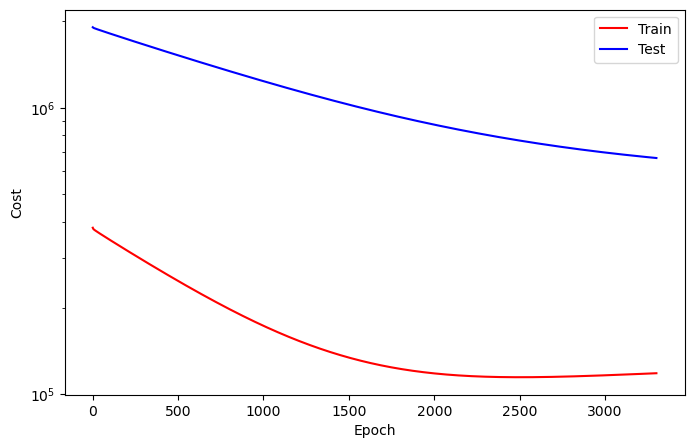

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3301
Train_cost  = 118516.4228 | Test_cost  = 666847.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3302
Train_cost  = 118523.2631 | Test_cost  = 666759.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3303
Train_cost  = 118530.1312 | Test_cost  = 666671.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3304
Train_cost  = 118536.9954 | Test_cost  = 666582.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3305
Train_cost  = 118543.8356 | Test_cost  = 666494.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3306
Train_cost  = 118550.7276 | Test_cost  = 666407.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3307
Train_cost  = 118557.5910 | Test_cost  = 666319.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3308
Train_cost  = 118564.4414 | Test_cost  = 666231.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3309
Train_cost  = 118571.3441 | Test_cost  = 666144.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3310
Train_cost  = 118578.1867 | Test_cost  = 666056.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3311
Train_cost  = 118585.0424 | Test_cost  = 665969.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3312
Train_cost  = 118591.8981 | Test_cost  = 665882.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3313
Train_cost  = 118598.7616 | Test_cost  = 665794.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3314
Train_cost  = 118605.6397 | Test_cost  = 665707.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3315
Train_cost  = 118612.5116 | Test_cost  = 665620.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3316
Train_cost  = 118619.3989 | Test_cost  = 665533.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3317
Train_cost  = 118626.2639 | Test_cost  = 665446.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3318
Train_cost  = 118633.1605 | Test_cost  = 665359.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3319
Train_cost  = 118640.0239 | Test_cost  = 665272.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3320
Train_cost  = 118646.9066 | Test_cost  = 665185.8500 | 


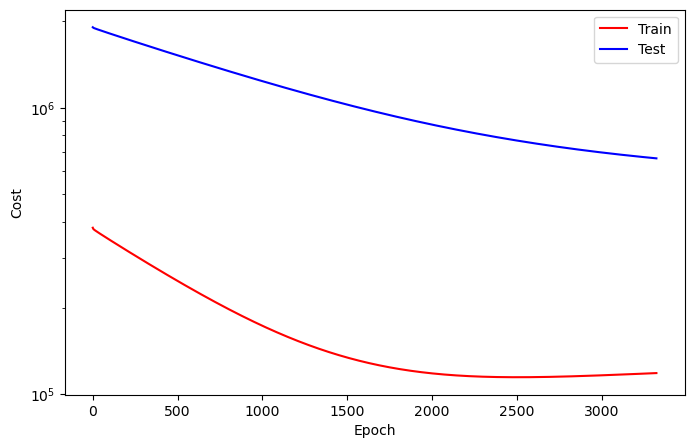

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3321
Train_cost  = 118653.7608 | Test_cost  = 665099.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3322
Train_cost  = 118660.6505 | Test_cost  = 665012.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3323
Train_cost  = 118667.5231 | Test_cost  = 664925.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3324
Train_cost  = 118674.4035 | Test_cost  = 664839.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3325
Train_cost  = 118681.2940 | Test_cost  = 664752.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3326
Train_cost  = 118688.1759 | Test_cost  = 664666.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3327
Train_cost  = 118695.0779 | Test_cost  = 664579.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3328
Train_cost  = 118701.9707 | Test_cost  = 664493.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3329
Train_cost  = 118708.8426 | Test_cost  = 664407.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3330
Train_cost  = 118715.7153 | Test_cost  = 664321.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3331
Train_cost  = 118722.6165 | Test_cost  = 664235.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3332
Train_cost  = 118729.4707 | Test_cost  = 664149.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3333
Train_cost  = 118736.3704 | Test_cost  = 664063.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3334
Train_cost  = 118743.2840 | Test_cost  = 663977.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3335
Train_cost  = 118750.1844 | Test_cost  = 663892.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3336
Train_cost  = 118757.0787 | Test_cost  = 663806.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3337
Train_cost  = 118763.9576 | Test_cost  = 663721.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3338
Train_cost  = 118770.8519 | Test_cost  = 663635.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3339
Train_cost  = 118777.7269 | Test_cost  = 663550.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3340
Train_cost  = 118784.6096 | Test_cost  = 663465.2250 | 


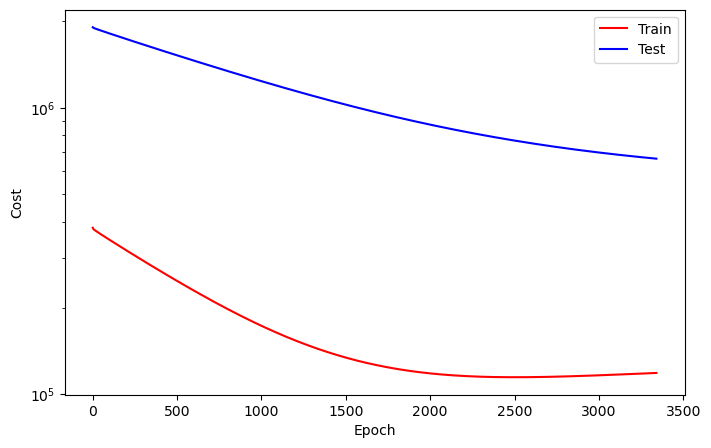

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3341
Train_cost  = 118791.4915 | Test_cost  = 663379.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3342
Train_cost  = 118798.3750 | Test_cost  = 663294.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3343
Train_cost  = 118805.2801 | Test_cost  = 663209.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3344
Train_cost  = 118812.1806 | Test_cost  = 663124.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3345
Train_cost  = 118819.0772 | Test_cost  = 663039.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3346
Train_cost  = 118825.9583 | Test_cost  = 662954.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3347
Train_cost  = 118832.8742 | Test_cost  = 662869.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3348
Train_cost  = 118839.7708 | Test_cost  = 662785.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3349
Train_cost  = 118846.6505 | Test_cost  = 662700.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3350
Train_cost  = 118853.5262 | Test_cost  = 662615.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3351
Train_cost  = 118860.4221 | Test_cost  = 662531.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3352
Train_cost  = 118867.3156 | Test_cost  = 662446.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3353
Train_cost  = 118874.2238 | Test_cost  = 662362.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3354
Train_cost  = 118881.1211 | Test_cost  = 662277.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3355
Train_cost  = 118888.0432 | Test_cost  = 662193.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3356
Train_cost  = 118894.9583 | Test_cost  = 662109.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3357
Train_cost  = 118901.8187 | Test_cost  = 662025.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3358
Train_cost  = 118908.7307 | Test_cost  = 661941.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3359
Train_cost  = 118915.6042 | Test_cost  = 661857.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3360
Train_cost  = 118922.4869 | Test_cost  = 661773.7500 | 


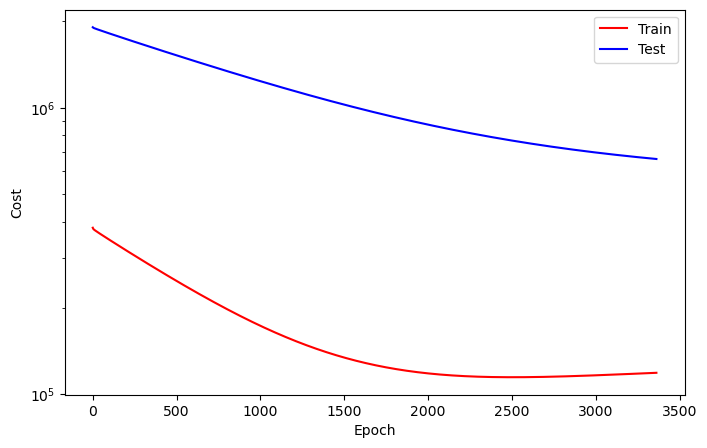

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3361
Train_cost  = 118929.4066 | Test_cost  = 661689.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3362
Train_cost  = 118936.3140 | Test_cost  = 661605.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3363
Train_cost  = 118943.2230 | Test_cost  = 661522.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3364
Train_cost  = 118950.1296 | Test_cost  = 661438.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3365
Train_cost  = 118957.0540 | Test_cost  = 661354.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3366
Train_cost  = 118963.9614 | Test_cost  = 661271.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3367
Train_cost  = 118970.8588 | Test_cost  = 661187.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3368
Train_cost  = 118977.7523 | Test_cost  = 661104.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3369
Train_cost  = 118984.6296 | Test_cost  = 661021.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3370
Train_cost  = 118991.5401 | Test_cost  = 660938.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3371
Train_cost  = 118998.4637 | Test_cost  = 660854.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3372
Train_cost  = 119005.3719 | Test_cost  = 660771.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3373
Train_cost  = 119012.2577 | Test_cost  = 660688.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3374
Train_cost  = 119019.2238 | Test_cost  = 660605.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3375
Train_cost  = 119026.1281 | Test_cost  = 660522.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3376
Train_cost  = 119033.0270 | Test_cost  = 660439.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3377
Train_cost  = 119039.9684 | Test_cost  = 660357.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3378
Train_cost  = 119046.8519 | Test_cost  = 660274.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3379
Train_cost  = 119053.7523 | Test_cost  = 660191.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3380
Train_cost  = 119060.6674 | Test_cost  = 660109.3000 | 


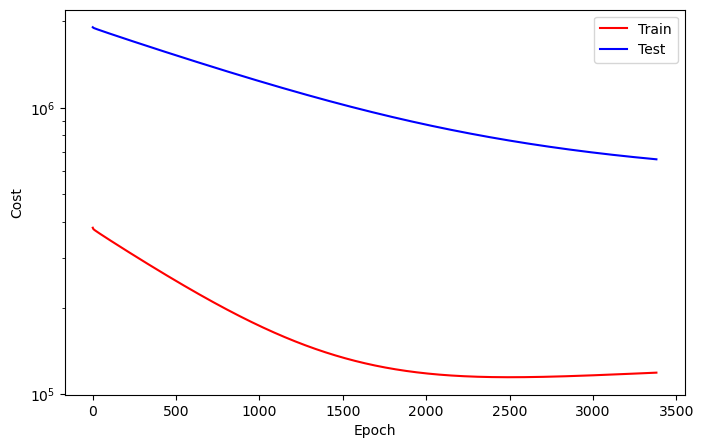

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3381
Train_cost  = 119067.5602 | Test_cost  = 660026.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3382
Train_cost  = 119074.4722 | Test_cost  = 659944.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3383
Train_cost  = 119081.4182 | Test_cost  = 659861.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3384
Train_cost  = 119088.3233 | Test_cost  = 659779.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3385
Train_cost  = 119095.2577 | Test_cost  = 659697.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3386
Train_cost  = 119102.1458 | Test_cost  = 659615.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3387
Train_cost  = 119109.0710 | Test_cost  = 659533.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3388
Train_cost  = 119115.9468 | Test_cost  = 659451.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3389
Train_cost  = 119122.8465 | Test_cost  = 659369.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3390
Train_cost  = 119129.7685 | Test_cost  = 659287.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3391
Train_cost  = 119136.6427 | Test_cost  = 659205.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3392
Train_cost  = 119143.6057 | Test_cost  = 659124.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3393
Train_cost  = 119150.5309 | Test_cost  = 659042.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3394
Train_cost  = 119157.4336 | Test_cost  = 658960.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3395
Train_cost  = 119164.3611 | Test_cost  = 658879.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3396
Train_cost  = 119171.2623 | Test_cost  = 658797.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3397
Train_cost  = 119178.1590 | Test_cost  = 658716.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3398
Train_cost  = 119185.0309 | Test_cost  = 658635.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3399
Train_cost  = 119191.9522 | Test_cost  = 658554.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3400
Train_cost  = 119198.8650 | Test_cost  = 658473.1500 | 


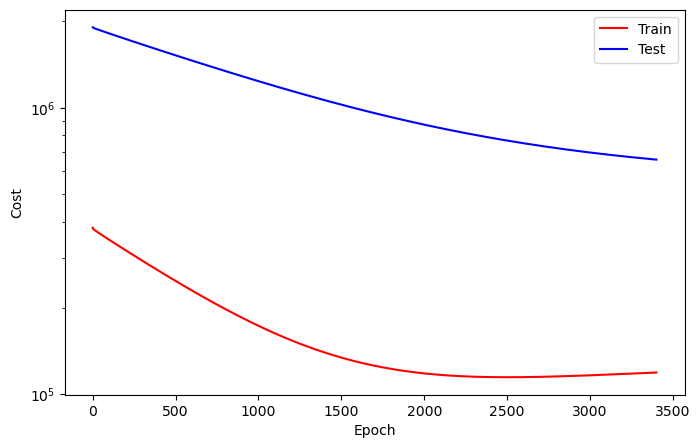

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3401
Train_cost  = 119205.7816 | Test_cost  = 658392.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3402
Train_cost  = 119212.6898 | Test_cost  = 658310.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3403
Train_cost  = 119219.6258 | Test_cost  = 658229.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3404
Train_cost  = 119226.5340 | Test_cost  = 658148.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3405
Train_cost  = 119233.4630 | Test_cost  = 658068.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3406
Train_cost  = 119240.3711 | Test_cost  = 657987.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3407
Train_cost  = 119247.2647 | Test_cost  = 657907.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3408
Train_cost  = 119254.1651 | Test_cost  = 657826.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3409
Train_cost  = 119261.0718 | Test_cost  = 657745.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3410
Train_cost  = 119267.9699 | Test_cost  = 657665.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3411
Train_cost  = 119274.8866 | Test_cost  = 657584.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3412
Train_cost  = 119281.8048 | Test_cost  = 657504.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3413
Train_cost  = 119288.7307 | Test_cost  = 657424.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3414
Train_cost  = 119295.6481 | Test_cost  = 657343.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3415
Train_cost  = 119302.5725 | Test_cost  = 657263.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3416
Train_cost  = 119309.4730 | Test_cost  = 657183.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3417
Train_cost  = 119316.3989 | Test_cost  = 657103.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3418
Train_cost  = 119323.2878 | Test_cost  = 657023.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3419
Train_cost  = 119330.1721 | Test_cost  = 656944.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3420
Train_cost  = 119337.0841 | Test_cost  = 656864.3500 | 


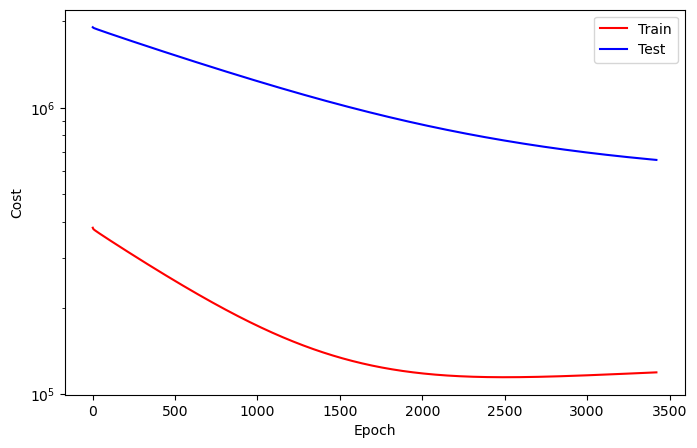

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3421
Train_cost  = 119343.9853 | Test_cost  = 656784.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3422
Train_cost  = 119350.9421 | Test_cost  = 656704.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3423
Train_cost  = 119357.8218 | Test_cost  = 656625.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3424
Train_cost  = 119364.7253 | Test_cost  = 656545.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3425
Train_cost  = 119371.6458 | Test_cost  = 656466.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3426
Train_cost  = 119378.5571 | Test_cost  = 656386.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3427
Train_cost  = 119385.4653 | Test_cost  = 656307.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3428
Train_cost  = 119392.3557 | Test_cost  = 656228.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3429
Train_cost  = 119399.2770 | Test_cost  = 656149.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3430
Train_cost  = 119406.1644 | Test_cost  = 656070.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3431
Train_cost  = 119413.0625 | Test_cost  = 655991.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3432
Train_cost  = 119419.9915 | Test_cost  = 655912.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3433
Train_cost  = 119426.8951 | Test_cost  = 655832.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3434
Train_cost  = 119433.8086 | Test_cost  = 655754.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3435
Train_cost  = 119440.7307 | Test_cost  = 655675.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3436
Train_cost  = 119447.6196 | Test_cost  = 655596.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3437
Train_cost  = 119454.5262 | Test_cost  = 655518.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3438
Train_cost  = 119461.3912 | Test_cost  = 655439.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3439
Train_cost  = 119468.3094 | Test_cost  = 655361.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3440
Train_cost  = 119475.2045 | Test_cost  = 655282.7000 | 


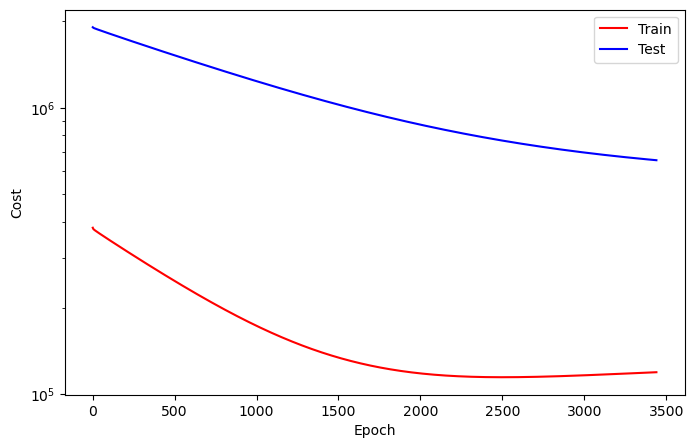

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3441
Train_cost  = 119482.1196 | Test_cost  = 655204.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3442
Train_cost  = 119489.0610 | Test_cost  = 655125.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3443
Train_cost  = 119495.9606 | Test_cost  = 655047.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3444
Train_cost  = 119502.8696 | Test_cost  = 654969.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3445
Train_cost  = 119509.7778 | Test_cost  = 654890.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3446
Train_cost  = 119516.6921 | Test_cost  = 654812.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3447
Train_cost  = 119523.5756 | Test_cost  = 654735.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3448
Train_cost  = 119530.4776 | Test_cost  = 654657.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3449
Train_cost  = 119537.3727 | Test_cost  = 654579.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3450
Train_cost  = 119544.3017 | Test_cost  = 654501.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3451
Train_cost  = 119551.1636 | Test_cost  = 654423.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3452
Train_cost  = 119558.1034 | Test_cost  = 654346.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3453
Train_cost  = 119564.9807 | Test_cost  = 654268.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3454
Train_cost  = 119571.9051 | Test_cost  = 654190.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3455
Train_cost  = 119578.7870 | Test_cost  = 654113.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3456
Train_cost  = 119585.7076 | Test_cost  = 654036.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3457
Train_cost  = 119592.5764 | Test_cost  = 653958.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3458
Train_cost  = 119599.4653 | Test_cost  = 653881.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3459
Train_cost  = 119606.3642 | Test_cost  = 653804.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3460
Train_cost  = 119613.2554 | Test_cost  = 653727.2250 | 


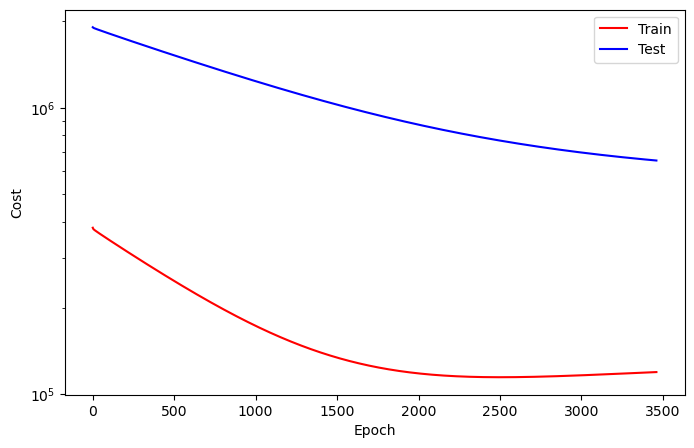

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3461
Train_cost  = 119620.1605 | Test_cost  = 653650.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3462
Train_cost  = 119627.0818 | Test_cost  = 653573.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3463
Train_cost  = 119633.9630 | Test_cost  = 653496.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3464
Train_cost  = 119640.8387 | Test_cost  = 653419.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3465
Train_cost  = 119647.7523 | Test_cost  = 653342.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3466
Train_cost  = 119654.6265 | Test_cost  = 653265.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3467
Train_cost  = 119661.5324 | Test_cost  = 653189.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3468
Train_cost  = 119668.4290 | Test_cost  = 653112.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3469
Train_cost  = 119675.3071 | Test_cost  = 653035.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3470
Train_cost  = 119682.1952 | Test_cost  = 652959.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3471
Train_cost  = 119689.0810 | Test_cost  = 652883.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3472
Train_cost  = 119695.9907 | Test_cost  = 652806.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3473
Train_cost  = 119702.8789 | Test_cost  = 652730.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3474
Train_cost  = 119709.7701 | Test_cost  = 652654.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3475
Train_cost  = 119716.6644 | Test_cost  = 652577.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3476
Train_cost  = 119723.5633 | Test_cost  = 652501.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3477
Train_cost  = 119730.4421 | Test_cost  = 652425.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3478
Train_cost  = 119737.3387 | Test_cost  = 652349.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3479
Train_cost  = 119744.2076 | Test_cost  = 652274.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3480
Train_cost  = 119751.0725 | Test_cost  = 652198.2500 | 


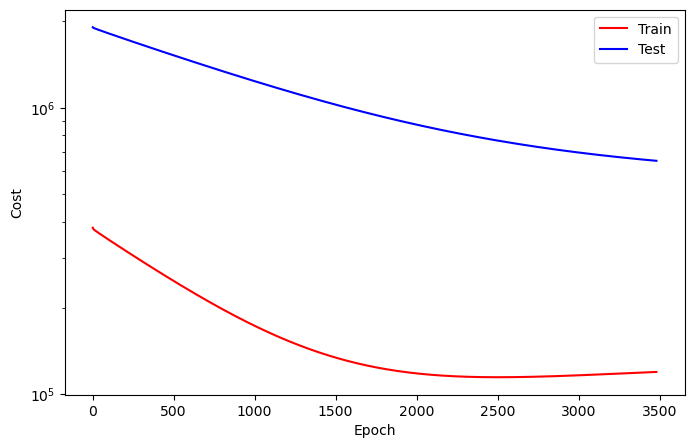

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3481
Train_cost  = 119757.9591 | Test_cost  = 652122.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3482
Train_cost  = 119764.8503 | Test_cost  = 652046.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3483
Train_cost  = 119771.7654 | Test_cost  = 651970.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3484
Train_cost  = 119778.6512 | Test_cost  = 651895.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3485
Train_cost  = 119785.5262 | Test_cost  = 651819.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3486
Train_cost  = 119792.4190 | Test_cost  = 651743.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3487
Train_cost  = 119799.3148 | Test_cost  = 651668.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3488
Train_cost  = 119806.2045 | Test_cost  = 651593.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3489
Train_cost  = 119813.0741 | Test_cost  = 651518.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3490
Train_cost  = 119819.9437 | Test_cost  = 651442.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3491
Train_cost  = 119826.8102 | Test_cost  = 651367.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3492
Train_cost  = 119833.6844 | Test_cost  = 651292.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3493
Train_cost  = 119840.6026 | Test_cost  = 651217.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3494
Train_cost  = 119847.4815 | Test_cost  = 651142.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3495
Train_cost  = 119854.3542 | Test_cost  = 651067.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3496
Train_cost  = 119861.2492 | Test_cost  = 650992.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3497
Train_cost  = 119868.1366 | Test_cost  = 650917.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3498
Train_cost  = 119875.0293 | Test_cost  = 650842.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3499
Train_cost  = 119881.8765 | Test_cost  = 650768.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3500
Train_cost  = 119888.7438 | Test_cost  = 650693.7000 | 


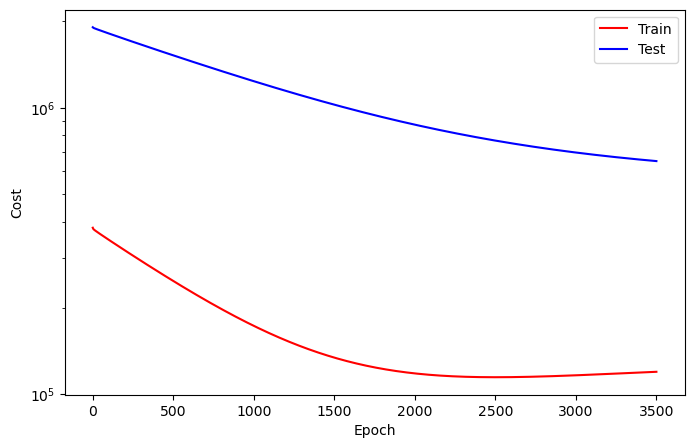

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3501
Train_cost  = 119895.6142 | Test_cost  = 650618.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3502
Train_cost  = 119902.5046 | Test_cost  = 650544.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3503
Train_cost  = 119909.3866 | Test_cost  = 650470.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3504
Train_cost  = 119916.2384 | Test_cost  = 650395.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3505
Train_cost  = 119923.1265 | Test_cost  = 650321.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3506
Train_cost  = 119929.9961 | Test_cost  = 650247.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3507
Train_cost  = 119936.8619 | Test_cost  = 650172.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3508
Train_cost  = 119943.7639 | Test_cost  = 650098.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3509
Train_cost  = 119950.6289 | Test_cost  = 650024.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3510
Train_cost  = 119957.4838 | Test_cost  = 649950.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3511
Train_cost  = 119964.3364 | Test_cost  = 649877.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3512
Train_cost  = 119971.1906 | Test_cost  = 649803.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3513
Train_cost  = 119978.0602 | Test_cost  = 649729.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3514
Train_cost  = 119984.9228 | Test_cost  = 649655.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3515
Train_cost  = 119991.7917 | Test_cost  = 649581.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3516
Train_cost  = 119998.6659 | Test_cost  = 649508.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3517
Train_cost  = 120005.5201 | Test_cost  = 649434.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3518
Train_cost  = 120012.3827 | Test_cost  = 649361.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3519
Train_cost  = 120019.2608 | Test_cost  = 649287.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3520
Train_cost  = 120026.1080 | Test_cost  = 649214.4250 | 


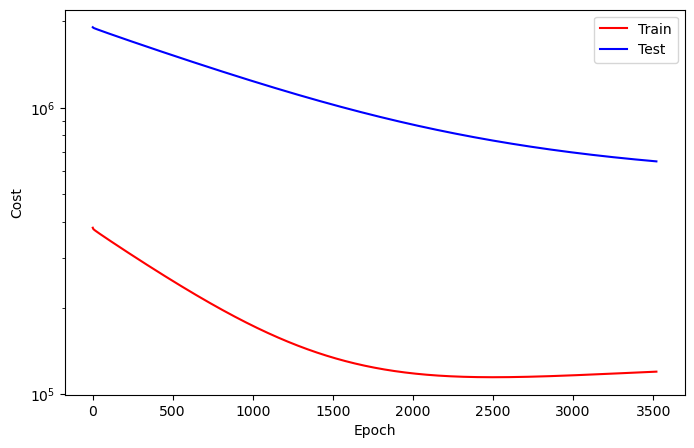

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3521
Train_cost  = 120032.9437 | Test_cost  = 649141.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3522
Train_cost  = 120039.8025 | Test_cost  = 649068.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3523
Train_cost  = 120046.6451 | Test_cost  = 648995.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3524
Train_cost  = 120053.4977 | Test_cost  = 648921.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3525
Train_cost  = 120060.3503 | Test_cost  = 648848.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3526
Train_cost  = 120067.2029 | Test_cost  = 648775.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3527
Train_cost  = 120074.0671 | Test_cost  = 648702.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3528
Train_cost  = 120080.9313 | Test_cost  = 648629.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3529
Train_cost  = 120087.7901 | Test_cost  = 648557.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3530
Train_cost  = 120094.6505 | Test_cost  = 648484.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3531
Train_cost  = 120101.4838 | Test_cost  = 648411.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3532
Train_cost  = 120108.3194 | Test_cost  = 648339.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3533
Train_cost  = 120115.1528 | Test_cost  = 648266.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3534
Train_cost  = 120122.0077 | Test_cost  = 648194.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3535
Train_cost  = 120128.8681 | Test_cost  = 648121.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3536
Train_cost  = 120135.6759 | Test_cost  = 648049.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3537
Train_cost  = 120142.5347 | Test_cost  = 647976.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3538
Train_cost  = 120149.3650 | Test_cost  = 647904.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3539
Train_cost  = 120156.2261 | Test_cost  = 647832.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3540
Train_cost  = 120163.0818 | Test_cost  = 647760.1250 | 


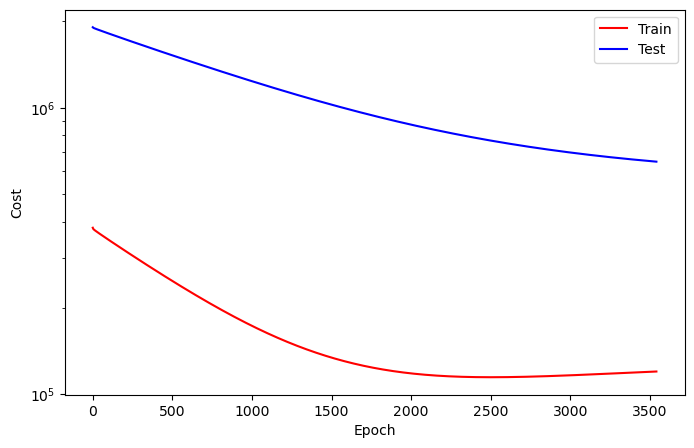

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3541
Train_cost  = 120169.9190 | Test_cost  = 647688.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3542
Train_cost  = 120176.7446 | Test_cost  = 647616.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3543
Train_cost  = 120183.5702 | Test_cost  = 647544.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3544
Train_cost  = 120190.3935 | Test_cost  = 647472.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3545
Train_cost  = 120197.2469 | Test_cost  = 647400.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3546
Train_cost  = 120204.0694 | Test_cost  = 647329.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3547
Train_cost  = 120210.9051 | Test_cost  = 647257.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3548
Train_cost  = 120217.7215 | Test_cost  = 647185.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3549
Train_cost  = 120224.5409 | Test_cost  = 647114.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3550
Train_cost  = 120231.3827 | Test_cost  = 647042.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3551
Train_cost  = 120238.2292 | Test_cost  = 646970.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3552
Train_cost  = 120245.0671 | Test_cost  = 646899.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3553
Train_cost  = 120251.8819 | Test_cost  = 646828.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3554
Train_cost  = 120258.7022 | Test_cost  = 646756.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3555
Train_cost  = 120265.5062 | Test_cost  = 646685.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3556
Train_cost  = 120272.3526 | Test_cost  = 646614.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3557
Train_cost  = 120279.1559 | Test_cost  = 646543.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3558
Train_cost  = 120285.9830 | Test_cost  = 646472.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3559
Train_cost  = 120292.7863 | Test_cost  = 646401.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3560
Train_cost  = 120299.5926 | Test_cost  = 646330.7750 | 


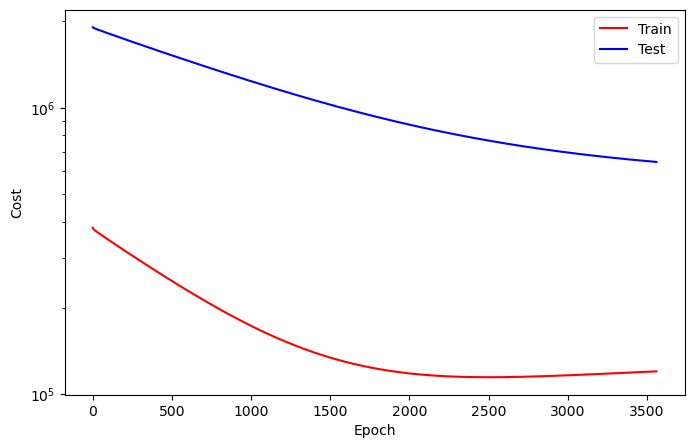

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3561
Train_cost  = 120306.4174 | Test_cost  = 646259.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3562
Train_cost  = 120313.2477 | Test_cost  = 646188.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3563
Train_cost  = 120320.0810 | Test_cost  = 646117.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3564
Train_cost  = 120326.8827 | Test_cost  = 646047.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3565
Train_cost  = 120333.6944 | Test_cost  = 645976.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3566
Train_cost  = 120340.4823 | Test_cost  = 645906.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3567
Train_cost  = 120347.3164 | Test_cost  = 645835.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3568
Train_cost  = 120354.1134 | Test_cost  = 645765.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3569
Train_cost  = 120360.9035 | Test_cost  = 645695.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3570
Train_cost  = 120367.7160 | Test_cost  = 645624.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3571
Train_cost  = 120374.4877 | Test_cost  = 645554.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3572
Train_cost  = 120381.3403 | Test_cost  = 645484.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3573
Train_cost  = 120388.1458 | Test_cost  = 645413.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3574
Train_cost  = 120394.9745 | Test_cost  = 645343.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3575
Train_cost  = 120401.7662 | Test_cost  = 645273.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3576
Train_cost  = 120408.5756 | Test_cost  = 645203.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3577
Train_cost  = 120415.3627 | Test_cost  = 645134.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3578
Train_cost  = 120422.1543 | Test_cost  = 645064.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3579
Train_cost  = 120428.9475 | Test_cost  = 644994.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3580
Train_cost  = 120435.7122 | Test_cost  = 644924.6500 | 


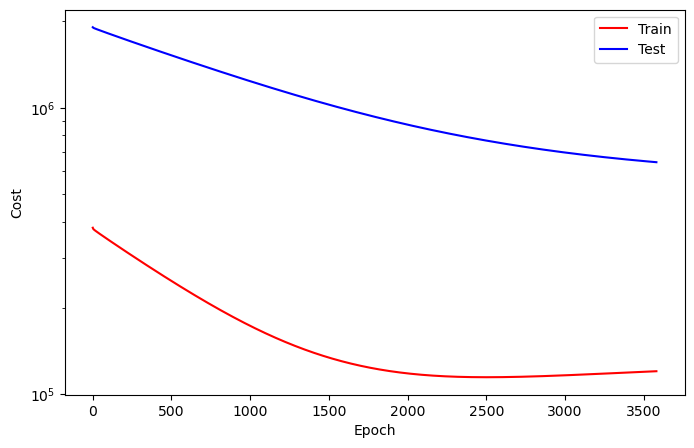

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3581
Train_cost  = 120442.4992 | Test_cost  = 644854.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3582
Train_cost  = 120449.2924 | Test_cost  = 644785.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3583
Train_cost  = 120456.1219 | Test_cost  = 644715.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3584
Train_cost  = 120462.8881 | Test_cost  = 644646.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3585
Train_cost  = 120469.6867 | Test_cost  = 644576.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3586
Train_cost  = 120476.4799 | Test_cost  = 644507.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3587
Train_cost  = 120483.2569 | Test_cost  = 644438.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3588
Train_cost  = 120490.0525 | Test_cost  = 644368.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3589
Train_cost  = 120496.8403 | Test_cost  = 644299.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3590
Train_cost  = 120503.6019 | Test_cost  = 644230.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3591
Train_cost  = 120510.3804 | Test_cost  = 644161.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3592
Train_cost  = 120517.1227 | Test_cost  = 644092.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3593
Train_cost  = 120523.8866 | Test_cost  = 644023.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3594
Train_cost  = 120530.6705 | Test_cost  = 643954.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3595
Train_cost  = 120537.4414 | Test_cost  = 643885.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3596
Train_cost  = 120544.2299 | Test_cost  = 643817.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3597
Train_cost  = 120551.0000 | Test_cost  = 643748.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3598
Train_cost  = 120557.7716 | Test_cost  = 643679.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3599
Train_cost  = 120564.5571 | Test_cost  = 643610.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3600
Train_cost  = 120571.3187 | Test_cost  = 643542.5250 | 


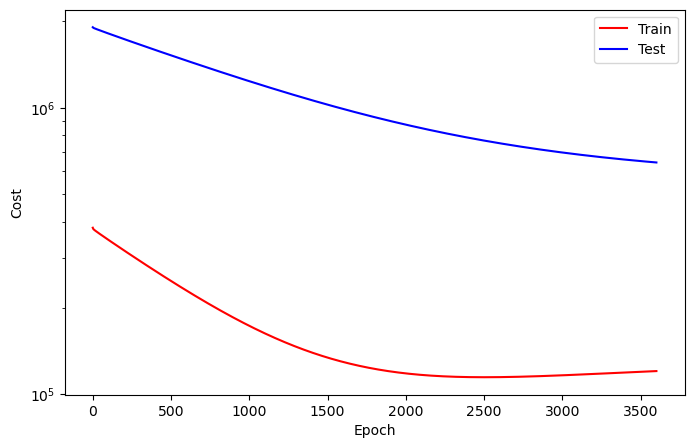

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3601
Train_cost  = 120578.0656 | Test_cost  = 643474.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3602
Train_cost  = 120584.8117 | Test_cost  = 643405.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3603
Train_cost  = 120591.5463 | Test_cost  = 643337.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3604
Train_cost  = 120598.3179 | Test_cost  = 643269.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3605
Train_cost  = 120605.0779 | Test_cost  = 643200.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3606
Train_cost  = 120611.8573 | Test_cost  = 643132.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3607
Train_cost  = 120618.6042 | Test_cost  = 643064.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3608
Train_cost  = 120625.3681 | Test_cost  = 642996.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3609
Train_cost  = 120632.1142 | Test_cost  = 642928.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3610
Train_cost  = 120638.8997 | Test_cost  = 642860.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3611
Train_cost  = 120645.6620 | Test_cost  = 642792.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3612
Train_cost  = 120652.3696 | Test_cost  = 642724.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3613
Train_cost  = 120659.1119 | Test_cost  = 642656.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3614
Train_cost  = 120665.8248 | Test_cost  = 642589.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3615
Train_cost  = 120672.5895 | Test_cost  = 642521.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3616
Train_cost  = 120679.3295 | Test_cost  = 642453.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3617
Train_cost  = 120686.0748 | Test_cost  = 642386.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3618
Train_cost  = 120692.8387 | Test_cost  = 642318.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3619
Train_cost  = 120699.5772 | Test_cost  = 642251.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3620
Train_cost  = 120706.2994 | Test_cost  = 642183.5750 | 


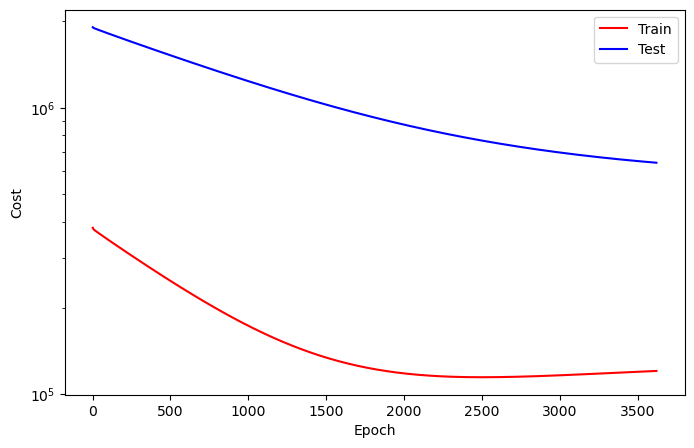

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3621
Train_cost  = 120713.0332 | Test_cost  = 642116.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3622
Train_cost  = 120719.7894 | Test_cost  = 642048.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3623
Train_cost  = 120726.5340 | Test_cost  = 641981.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3624
Train_cost  = 120733.2554 | Test_cost  = 641914.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3625
Train_cost  = 120739.9676 | Test_cost  = 641847.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3626
Train_cost  = 120746.6883 | Test_cost  = 641780.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3627
Train_cost  = 120753.4298 | Test_cost  = 641713.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3628
Train_cost  = 120760.1574 | Test_cost  = 641646.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3629
Train_cost  = 120766.8804 | Test_cost  = 641579.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3630
Train_cost  = 120773.6350 | Test_cost  = 641512.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3631
Train_cost  = 120780.3657 | Test_cost  = 641445.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3632
Train_cost  = 120787.0918 | Test_cost  = 641378.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3633
Train_cost  = 120793.8179 | Test_cost  = 641311.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3634
Train_cost  = 120800.5563 | Test_cost  = 641245.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3635
Train_cost  = 120807.2477 | Test_cost  = 641178.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3636
Train_cost  = 120813.9761 | Test_cost  = 641112.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3637
Train_cost  = 120820.6937 | Test_cost  = 641045.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3638
Train_cost  = 120827.4012 | Test_cost  = 640979.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3639
Train_cost  = 120834.1296 | Test_cost  = 640912.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3640
Train_cost  = 120840.8318 | Test_cost  = 640846.5000 | 


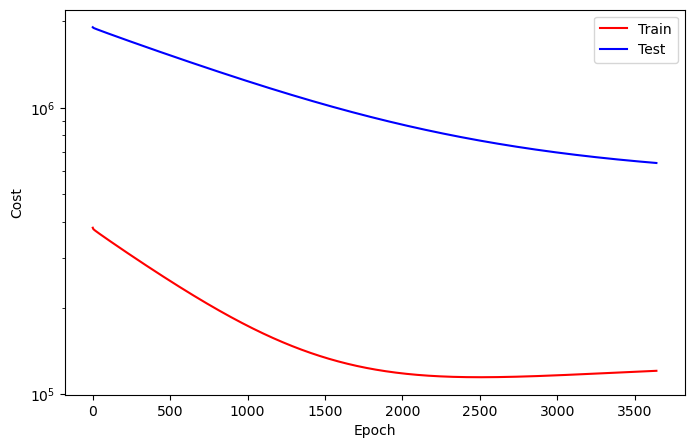

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3641
Train_cost  = 120847.5278 | Test_cost  = 640780.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3642
Train_cost  = 120854.2461 | Test_cost  = 640714.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3643
Train_cost  = 120860.9568 | Test_cost  = 640647.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3644
Train_cost  = 120867.6466 | Test_cost  = 640581.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3645
Train_cost  = 120874.3819 | Test_cost  = 640515.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3646
Train_cost  = 120881.0818 | Test_cost  = 640449.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3647
Train_cost  = 120887.7515 | Test_cost  = 640383.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3648
Train_cost  = 120894.4676 | Test_cost  = 640318.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3649
Train_cost  = 120901.1397 | Test_cost  = 640252.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3650
Train_cost  = 120907.8488 | Test_cost  = 640186.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3651
Train_cost  = 120914.5278 | Test_cost  = 640120.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3652
Train_cost  = 120921.2029 | Test_cost  = 640055.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3653
Train_cost  = 120927.9151 | Test_cost  = 639989.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3654
Train_cost  = 120934.6127 | Test_cost  = 639924.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3655
Train_cost  = 120941.2762 | Test_cost  = 639858.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3656
Train_cost  = 120947.9614 | Test_cost  = 639793.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3657
Train_cost  = 120954.6312 | Test_cost  = 639727.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3658
Train_cost  = 120961.3465 | Test_cost  = 639662.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3659
Train_cost  = 120968.0069 | Test_cost  = 639597.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3660
Train_cost  = 120974.6813 | Test_cost  = 639532.1000 | 


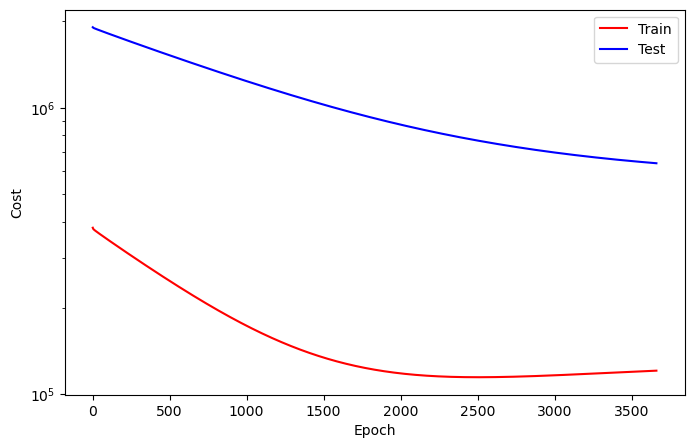

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3661
Train_cost  = 120981.3465 | Test_cost  = 639467.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3662
Train_cost  = 120988.0177 | Test_cost  = 639402.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3663
Train_cost  = 120994.6821 | Test_cost  = 639337.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3664
Train_cost  = 121001.3457 | Test_cost  = 639271.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3665
Train_cost  = 121008.0332 | Test_cost  = 639207.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3666
Train_cost  = 121014.6921 | Test_cost  = 639142.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3667
Train_cost  = 121021.3711 | Test_cost  = 639077.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3668
Train_cost  = 121028.0077 | Test_cost  = 639012.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3669
Train_cost  = 121034.6937 | Test_cost  = 638947.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3670
Train_cost  = 121041.3380 | Test_cost  = 638883.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3671
Train_cost  = 121047.9931 | Test_cost  = 638818.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3672
Train_cost  = 121054.6505 | Test_cost  = 638754.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3673
Train_cost  = 121061.3202 | Test_cost  = 638689.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3674
Train_cost  = 121067.9668 | Test_cost  = 638625.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3675
Train_cost  = 121074.6073 | Test_cost  = 638560.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3676
Train_cost  = 121081.2577 | Test_cost  = 638496.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3677
Train_cost  = 121087.9198 | Test_cost  = 638432.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3678
Train_cost  = 121094.5563 | Test_cost  = 638368.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3679
Train_cost  = 121101.2022 | Test_cost  = 638303.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3680
Train_cost  = 121107.8634 | Test_cost  = 638239.8500 | 


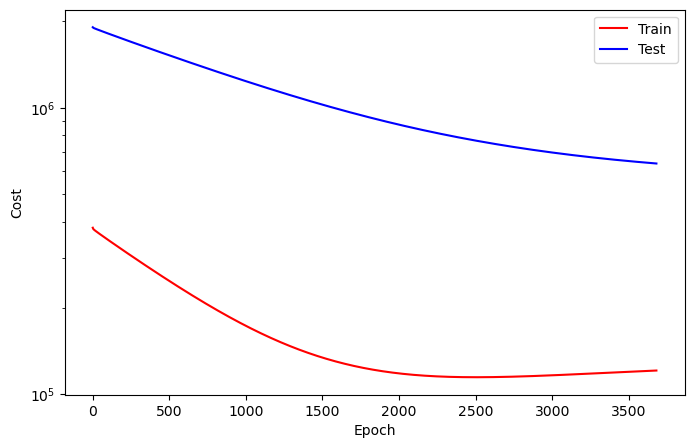

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3681
Train_cost  = 121114.4784 | Test_cost  = 638175.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3682
Train_cost  = 121121.1358 | Test_cost  = 638111.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3683
Train_cost  = 121127.7469 | Test_cost  = 638047.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3684
Train_cost  = 121134.3927 | Test_cost  = 637984.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3685
Train_cost  = 121141.0131 | Test_cost  = 637920.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3686
Train_cost  = 121147.6752 | Test_cost  = 637856.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3687
Train_cost  = 121154.2901 | Test_cost  = 637792.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3688
Train_cost  = 121160.9113 | Test_cost  = 637728.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3689
Train_cost  = 121167.5455 | Test_cost  = 637665.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3690
Train_cost  = 121174.1759 | Test_cost  = 637601.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3691
Train_cost  = 121180.8086 | Test_cost  = 637538.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3692
Train_cost  = 121187.4113 | Test_cost  = 637475.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3693
Train_cost  = 121194.0417 | Test_cost  = 637411.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3694
Train_cost  = 121200.6188 | Test_cost  = 637348.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3695
Train_cost  = 121207.2346 | Test_cost  = 637285.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3696
Train_cost  = 121213.8480 | Test_cost  = 637221.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3697
Train_cost  = 121220.4707 | Test_cost  = 637158.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3698
Train_cost  = 121227.0810 | Test_cost  = 637095.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3699
Train_cost  = 121233.6952 | Test_cost  = 637032.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3700
Train_cost  = 121240.3009 | Test_cost  = 636969.4250 | 


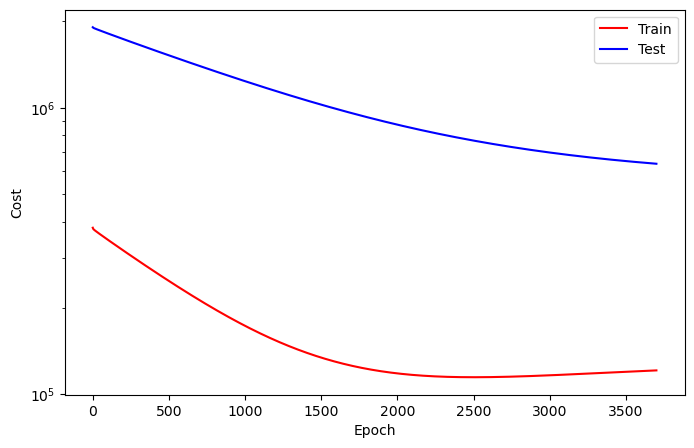

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3701
Train_cost  = 121246.8827 | Test_cost  = 636906.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3702
Train_cost  = 121253.5131 | Test_cost  = 636843.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3703
Train_cost  = 121260.1211 | Test_cost  = 636780.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3704
Train_cost  = 121266.6968 | Test_cost  = 636717.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3705
Train_cost  = 121273.3110 | Test_cost  = 636655.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3706
Train_cost  = 121279.8920 | Test_cost  = 636592.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3707
Train_cost  = 121286.4522 | Test_cost  = 636529.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3708
Train_cost  = 121293.0594 | Test_cost  = 636467.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3709
Train_cost  = 121299.6481 | Test_cost  = 636404.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3710
Train_cost  = 121306.2346 | Test_cost  = 636342.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3711
Train_cost  = 121312.8233 | Test_cost  = 636279.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3712
Train_cost  = 121319.4336 | Test_cost  = 636217.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3713
Train_cost  = 121326.0054 | Test_cost  = 636154.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3714
Train_cost  = 121332.5856 | Test_cost  = 636092.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3715
Train_cost  = 121339.1551 | Test_cost  = 636030.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3716
Train_cost  = 121345.7677 | Test_cost  = 635968.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3717
Train_cost  = 121352.2978 | Test_cost  = 635906.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3718
Train_cost  = 121358.8935 | Test_cost  = 635844.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3719
Train_cost  = 121365.4406 | Test_cost  = 635782.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3720
Train_cost  = 121372.0270 | Test_cost  = 635720.1500 | 


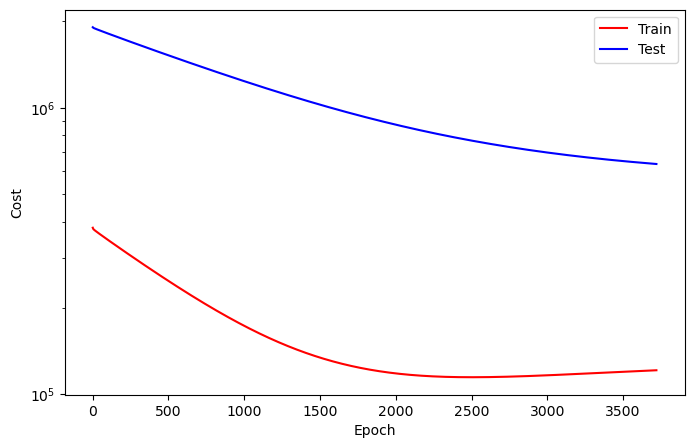

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3721
Train_cost  = 121378.5733 | Test_cost  = 635658.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3722
Train_cost  = 121385.1427 | Test_cost  = 635596.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3723
Train_cost  = 121391.7099 | Test_cost  = 635534.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3724
Train_cost  = 121398.2940 | Test_cost  = 635472.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3725
Train_cost  = 121404.8326 | Test_cost  = 635410.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3726
Train_cost  = 121411.3827 | Test_cost  = 635348.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3727
Train_cost  = 121417.9730 | Test_cost  = 635287.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3728
Train_cost  = 121424.5170 | Test_cost  = 635225.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3729
Train_cost  = 121431.0926 | Test_cost  = 635164.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3730
Train_cost  = 121437.6142 | Test_cost  = 635103.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3731
Train_cost  = 121444.1497 | Test_cost  = 635041.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3732
Train_cost  = 121450.6605 | Test_cost  = 634980.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3733
Train_cost  = 121457.2145 | Test_cost  = 634919.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3734
Train_cost  = 121463.7647 | Test_cost  = 634858.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3735
Train_cost  = 121470.2801 | Test_cost  = 634796.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3736
Train_cost  = 121476.8511 | Test_cost  = 634735.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3737
Train_cost  = 121483.3719 | Test_cost  = 634674.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3738
Train_cost  = 121489.9244 | Test_cost  = 634613.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3739
Train_cost  = 121496.4483 | Test_cost  = 634552.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3740
Train_cost  = 121502.9676 | Test_cost  = 634491.6000 | 


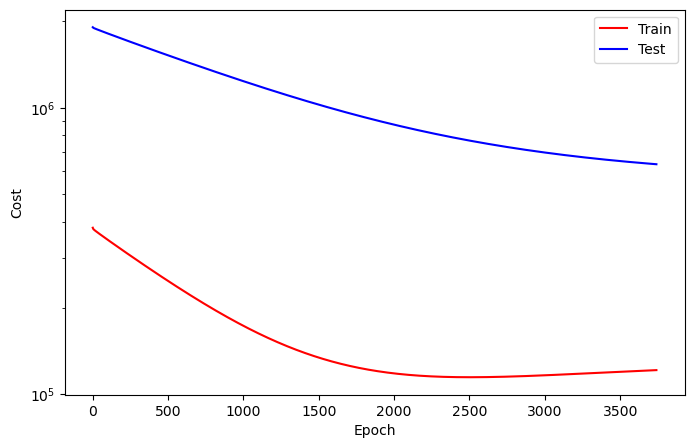

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3741
Train_cost  = 121509.4861 | Test_cost  = 634430.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3742
Train_cost  = 121516.0046 | Test_cost  = 634370.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3743
Train_cost  = 121522.5231 | Test_cost  = 634309.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3744
Train_cost  = 121529.0394 | Test_cost  = 634248.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3745
Train_cost  = 121535.5332 | Test_cost  = 634188.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3746
Train_cost  = 121542.0424 | Test_cost  = 634127.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3747
Train_cost  = 121548.5610 | Test_cost  = 634067.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3748
Train_cost  = 121555.0764 | Test_cost  = 634006.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3749
Train_cost  = 121561.5910 | Test_cost  = 633945.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3750
Train_cost  = 121568.0995 | Test_cost  = 633885.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3751
Train_cost  = 121574.6227 | Test_cost  = 633824.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3752
Train_cost  = 121581.1373 | Test_cost  = 633764.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3753
Train_cost  = 121587.6188 | Test_cost  = 633704.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3754
Train_cost  = 121594.1165 | Test_cost  = 633644.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3755
Train_cost  = 121600.5895 | Test_cost  = 633584.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3756
Train_cost  = 121607.0710 | Test_cost  = 633524.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3757
Train_cost  = 121613.5702 | Test_cost  = 633464.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3758
Train_cost  = 121620.0571 | Test_cost  = 633404.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3759
Train_cost  = 121626.5594 | Test_cost  = 633344.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3760
Train_cost  = 121633.0324 | Test_cost  = 633284.5000 | 


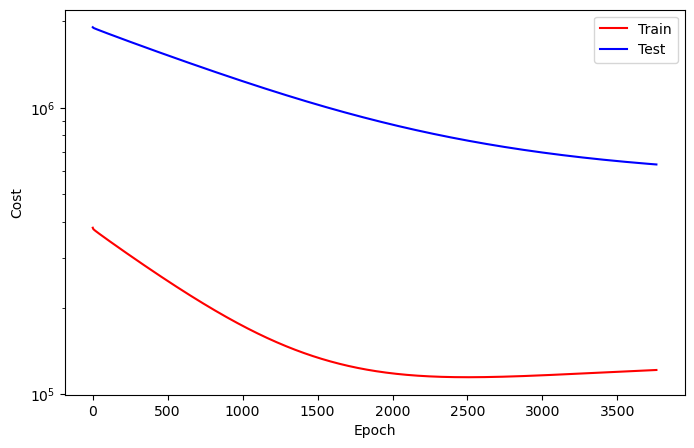

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3761
Train_cost  = 121639.5332 | Test_cost  = 633224.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3762
Train_cost  = 121646.0154 | Test_cost  = 633164.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3763
Train_cost  = 121652.5039 | Test_cost  = 633104.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3764
Train_cost  = 121658.9884 | Test_cost  = 633045.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3765
Train_cost  = 121665.4900 | Test_cost  = 632985.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3766
Train_cost  = 121671.9537 | Test_cost  = 632925.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3767
Train_cost  = 121678.4159 | Test_cost  = 632866.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3768
Train_cost  = 121684.8819 | Test_cost  = 632807.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3769
Train_cost  = 121691.3364 | Test_cost  = 632747.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3770
Train_cost  = 121697.7832 | Test_cost  = 632688.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3771
Train_cost  = 121704.2677 | Test_cost  = 632628.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3772
Train_cost  = 121710.7222 | Test_cost  = 632569.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3773
Train_cost  = 121717.1890 | Test_cost  = 632510.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3774
Train_cost  = 121723.6312 | Test_cost  = 632450.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3775
Train_cost  = 121730.1242 | Test_cost  = 632391.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3776
Train_cost  = 121736.5779 | Test_cost  = 632332.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3777
Train_cost  = 121743.0664 | Test_cost  = 632273.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3778
Train_cost  = 121749.5039 | Test_cost  = 632214.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3779
Train_cost  = 121755.9414 | Test_cost  = 632155.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3780
Train_cost  = 121762.4005 | Test_cost  = 632096.5250 | 


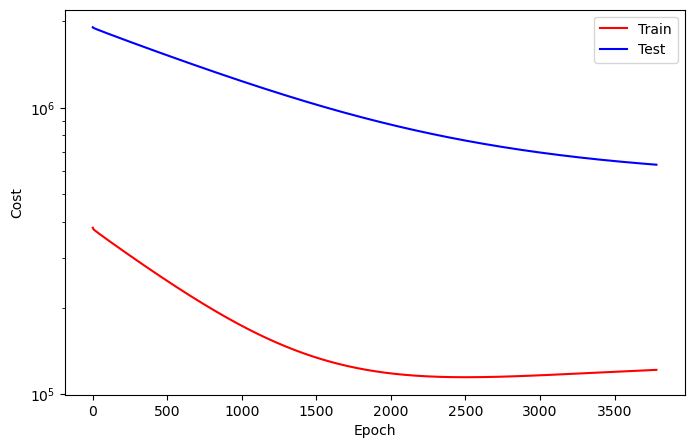

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3781
Train_cost  = 121768.8302 | Test_cost  = 632037.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3782
Train_cost  = 121775.2623 | Test_cost  = 631978.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3783
Train_cost  = 121781.7130 | Test_cost  = 631920.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3784
Train_cost  = 121788.1551 | Test_cost  = 631861.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3785
Train_cost  = 121794.5625 | Test_cost  = 631802.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3786
Train_cost  = 121801.0262 | Test_cost  = 631744.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3787
Train_cost  = 121807.4552 | Test_cost  = 631685.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3788
Train_cost  = 121813.8943 | Test_cost  = 631626.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3789
Train_cost  = 121820.3403 | Test_cost  = 631567.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3790
Train_cost  = 121826.8002 | Test_cost  = 631509.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3791
Train_cost  = 121833.2238 | Test_cost  = 631451.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3792
Train_cost  = 121839.6520 | Test_cost  = 631393.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3793
Train_cost  = 121846.0409 | Test_cost  = 631334.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3794
Train_cost  = 121852.4275 | Test_cost  = 631276.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3795
Train_cost  = 121858.8480 | Test_cost  = 631218.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3796
Train_cost  = 121865.2477 | Test_cost  = 631160.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3797
Train_cost  = 121871.6435 | Test_cost  = 631102.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3798
Train_cost  = 121878.0563 | Test_cost  = 631044.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3799
Train_cost  = 121884.4614 | Test_cost  = 630986.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3800
Train_cost  = 121890.8681 | Test_cost  = 630928.3250 | 


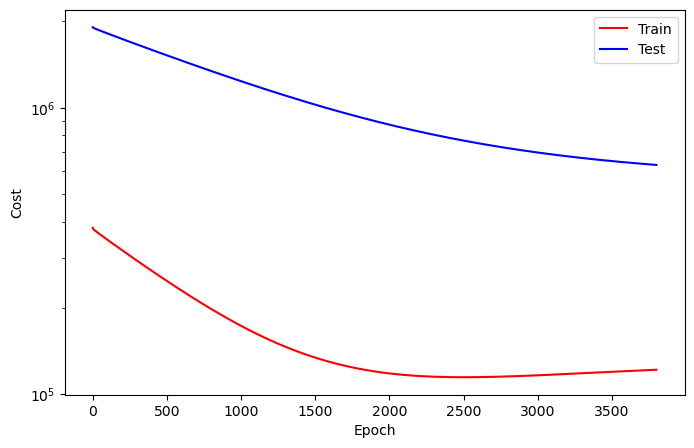

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3801
Train_cost  = 121897.2824 | Test_cost  = 630870.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3802
Train_cost  = 121903.6975 | Test_cost  = 630812.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3803
Train_cost  = 121910.0934 | Test_cost  = 630754.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3804
Train_cost  = 121916.5193 | Test_cost  = 630696.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3805
Train_cost  = 121922.8781 | Test_cost  = 630639.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3806
Train_cost  = 121929.2739 | Test_cost  = 630581.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3807
Train_cost  = 121935.6258 | Test_cost  = 630524.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3808
Train_cost  = 121942.0177 | Test_cost  = 630466.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3809
Train_cost  = 121948.3796 | Test_cost  = 630409.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3810
Train_cost  = 121954.7616 | Test_cost  = 630352.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3811
Train_cost  = 121961.1319 | Test_cost  = 630294.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3812
Train_cost  = 121967.5162 | Test_cost  = 630237.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3813
Train_cost  = 121973.8781 | Test_cost  = 630179.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3814
Train_cost  = 121980.2909 | Test_cost  = 630122.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3815
Train_cost  = 121986.6435 | Test_cost  = 630065.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3816
Train_cost  = 121993.0231 | Test_cost  = 630007.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3817
Train_cost  = 121999.4275 | Test_cost  = 629950.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3818
Train_cost  = 122005.7724 | Test_cost  = 629893.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3819
Train_cost  = 122012.1165 | Test_cost  = 629837.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3820
Train_cost  = 122018.4784 | Test_cost  = 629780.2500 | 


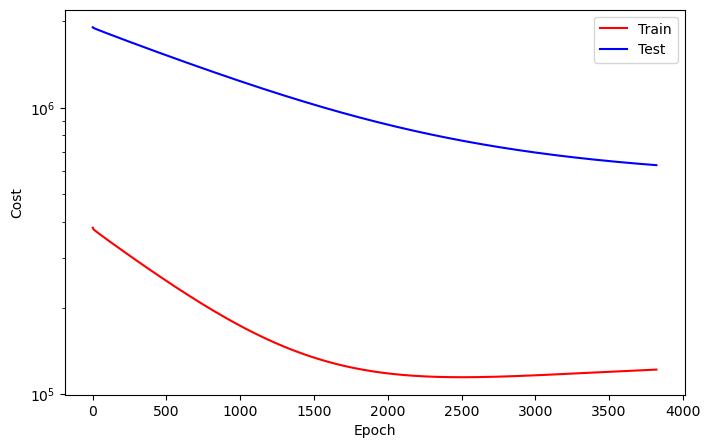

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3821
Train_cost  = 122024.8241 | Test_cost  = 629723.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3822
Train_cost  = 122031.1628 | Test_cost  = 629666.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3823
Train_cost  = 122037.5000 | Test_cost  = 629609.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3824
Train_cost  = 122043.8657 | Test_cost  = 629552.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3825
Train_cost  = 122050.2060 | Test_cost  = 629496.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3826
Train_cost  = 122056.5517 | Test_cost  = 629439.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3827
Train_cost  = 122062.8873 | Test_cost  = 629382.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3828
Train_cost  = 122069.2438 | Test_cost  = 629326.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3829
Train_cost  = 122075.5772 | Test_cost  = 629269.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3830
Train_cost  = 122081.9475 | Test_cost  = 629213.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3831
Train_cost  = 122088.2909 | Test_cost  = 629156.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3832
Train_cost  = 122094.6057 | Test_cost  = 629100.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3833
Train_cost  = 122100.9336 | Test_cost  = 629044.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3834
Train_cost  = 122107.2539 | Test_cost  = 628987.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3835
Train_cost  = 122113.5656 | Test_cost  = 628931.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3836
Train_cost  = 122119.8873 | Test_cost  = 628875.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3837
Train_cost  = 122126.2106 | Test_cost  = 628819.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3838
Train_cost  = 122132.5100 | Test_cost  = 628763.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3839
Train_cost  = 122138.8194 | Test_cost  = 628707.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3840
Train_cost  = 122145.1566 | Test_cost  = 628651.0500 | 


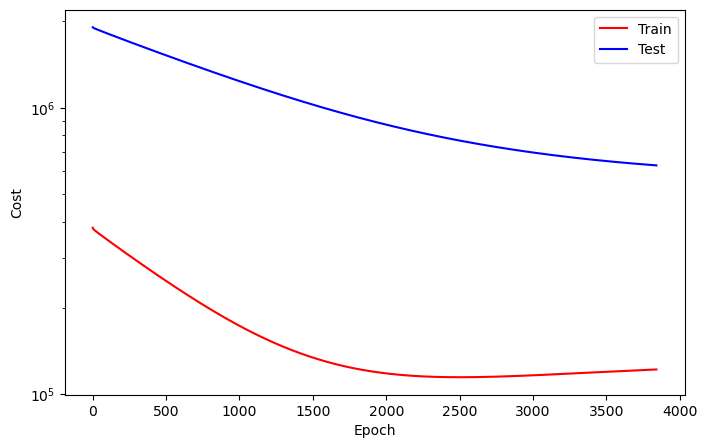

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3841
Train_cost  = 122151.4676 | Test_cost  = 628594.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3842
Train_cost  = 122157.7847 | Test_cost  = 628539.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3843
Train_cost  = 122164.0818 | Test_cost  = 628482.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3844
Train_cost  = 122170.4429 | Test_cost  = 628427.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3845
Train_cost  = 122176.7137 | Test_cost  = 628371.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3846
Train_cost  = 122183.0100 | Test_cost  = 628315.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3847
Train_cost  = 122189.2909 | Test_cost  = 628260.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3848
Train_cost  = 122195.5656 | Test_cost  = 628204.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3849
Train_cost  = 122201.8866 | Test_cost  = 628148.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3850
Train_cost  = 122208.1543 | Test_cost  = 628093.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3851
Train_cost  = 122214.4444 | Test_cost  = 628037.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3852
Train_cost  = 122220.7253 | Test_cost  = 627982.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3853
Train_cost  = 122227.0062 | Test_cost  = 627927.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3854
Train_cost  = 122233.2816 | Test_cost  = 627871.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3855
Train_cost  = 122239.5640 | Test_cost  = 627816.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3856
Train_cost  = 122245.8356 | Test_cost  = 627761.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3857
Train_cost  = 122252.1404 | Test_cost  = 627706.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3858
Train_cost  = 122258.4051 | Test_cost  = 627650.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3859
Train_cost  = 122264.6752 | Test_cost  = 627595.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3860
Train_cost  = 122270.8897 | Test_cost  = 627540.9000 | 


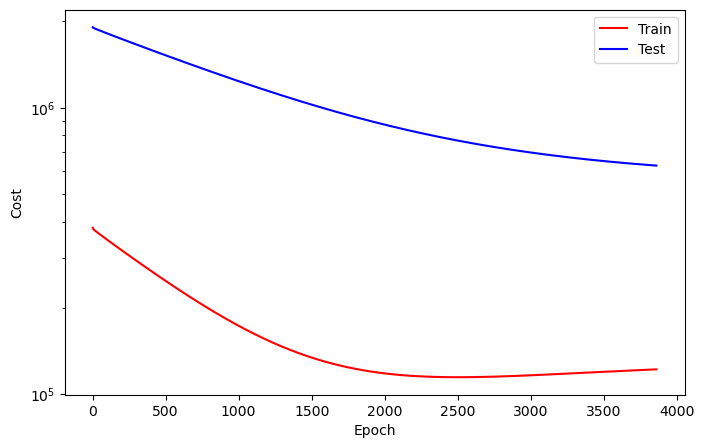

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3861
Train_cost  = 122277.1667 | Test_cost  = 627485.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3862
Train_cost  = 122283.4198 | Test_cost  = 627430.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3863
Train_cost  = 122289.6690 | Test_cost  = 627375.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3864
Train_cost  = 122295.9244 | Test_cost  = 627321.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3865
Train_cost  = 122302.1775 | Test_cost  = 627266.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3866
Train_cost  = 122308.4506 | Test_cost  = 627211.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3867
Train_cost  = 122314.6744 | Test_cost  = 627156.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3868
Train_cost  = 122320.9113 | Test_cost  = 627102.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3869
Train_cost  = 122327.1574 | Test_cost  = 627047.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3870
Train_cost  = 122333.4298 | Test_cost  = 626992.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3871
Train_cost  = 122339.6875 | Test_cost  = 626938.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3872
Train_cost  = 122345.9159 | Test_cost  = 626883.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3873
Train_cost  = 122352.1489 | Test_cost  = 626829.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3874
Train_cost  = 122358.3735 | Test_cost  = 626774.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3875
Train_cost  = 122364.5980 | Test_cost  = 626720.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3876
Train_cost  = 122370.8017 | Test_cost  = 626666.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3877
Train_cost  = 122377.0324 | Test_cost  = 626611.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3878
Train_cost  = 122383.2654 | Test_cost  = 626557.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3879
Train_cost  = 122389.4892 | Test_cost  = 626503.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3880
Train_cost  = 122395.7191 | Test_cost  = 626449.0750 | 


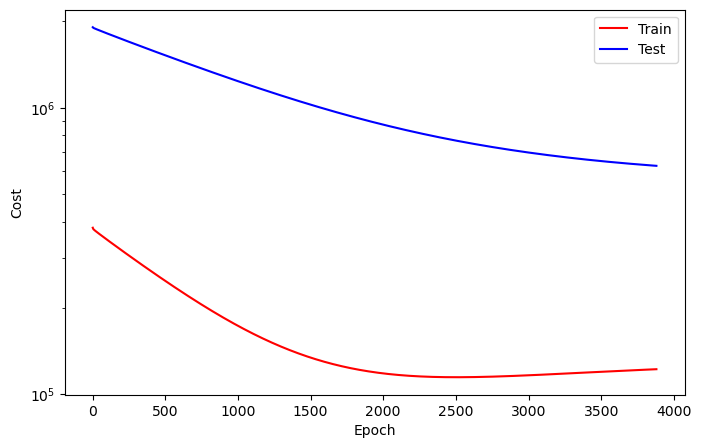

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3881
Train_cost  = 122401.8943 | Test_cost  = 626395.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3882
Train_cost  = 122408.1474 | Test_cost  = 626340.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3883
Train_cost  = 122414.3688 | Test_cost  = 626286.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3884
Train_cost  = 122420.5648 | Test_cost  = 626232.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3885
Train_cost  = 122426.8071 | Test_cost  = 626178.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3886
Train_cost  = 122433.0100 | Test_cost  = 626125.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3887
Train_cost  = 122439.1937 | Test_cost  = 626071.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3888
Train_cost  = 122445.3750 | Test_cost  = 626017.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3889
Train_cost  = 122451.5586 | Test_cost  = 625963.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3890
Train_cost  = 122457.7485 | Test_cost  = 625910.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3891
Train_cost  = 122463.9514 | Test_cost  = 625856.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3892
Train_cost  = 122470.1358 | Test_cost  = 625802.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3893
Train_cost  = 122476.3086 | Test_cost  = 625749.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3894
Train_cost  = 122482.4823 | Test_cost  = 625695.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3895
Train_cost  = 122488.6644 | Test_cost  = 625642.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3896
Train_cost  = 122494.8488 | Test_cost  = 625589.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3897
Train_cost  = 122501.0162 | Test_cost  = 625535.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3898
Train_cost  = 122507.2160 | Test_cost  = 625482.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3899
Train_cost  = 122513.3989 | Test_cost  = 625429.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3900
Train_cost  = 122519.5409 | Test_cost  = 625375.9000 | 


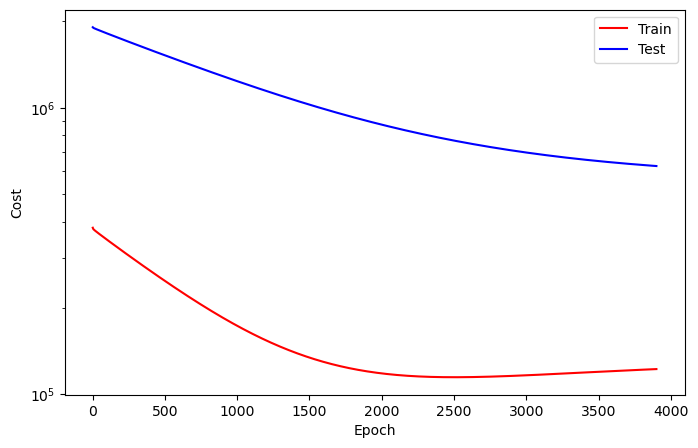

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3901
Train_cost  = 122525.6968 | Test_cost  = 625322.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3902
Train_cost  = 122531.8519 | Test_cost  = 625269.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3903
Train_cost  = 122538.0039 | Test_cost  = 625216.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3904
Train_cost  = 122544.1636 | Test_cost  = 625163.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3905
Train_cost  = 122550.2747 | Test_cost  = 625110.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3906
Train_cost  = 122556.4583 | Test_cost  = 625057.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3907
Train_cost  = 122562.6049 | Test_cost  = 625004.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3908
Train_cost  = 122568.7400 | Test_cost  = 624952.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3909
Train_cost  = 122574.8673 | Test_cost  = 624899.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3910
Train_cost  = 122581.0069 | Test_cost  = 624846.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3911
Train_cost  = 122587.1312 | Test_cost  = 624793.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3912
Train_cost  = 122593.3171 | Test_cost  = 624741.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3913
Train_cost  = 122599.4460 | Test_cost  = 624688.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3914
Train_cost  = 122605.5764 | Test_cost  = 624636.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3915
Train_cost  = 122611.6721 | Test_cost  = 624583.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3916
Train_cost  = 122617.7701 | Test_cost  = 624531.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3917
Train_cost  = 122623.9174 | Test_cost  = 624478.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3918
Train_cost  = 122630.0401 | Test_cost  = 624426.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3919
Train_cost  = 122636.1073 | Test_cost  = 624374.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3920
Train_cost  = 122642.2469 | Test_cost  = 624321.6500 | 


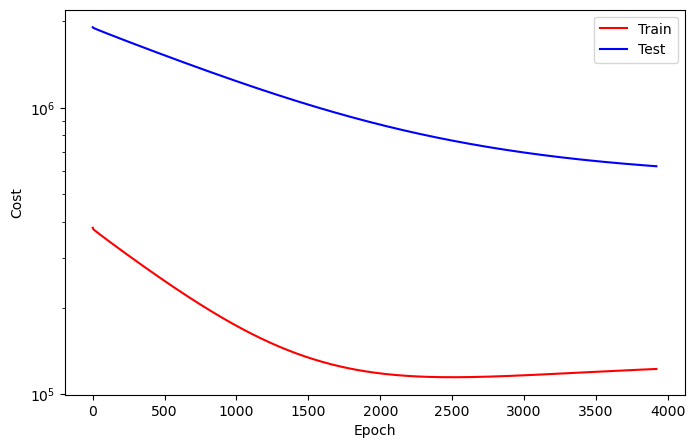

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3921
Train_cost  = 122648.3773 | Test_cost  = 624269.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3922
Train_cost  = 122654.5093 | Test_cost  = 624217.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3923
Train_cost  = 122660.6219 | Test_cost  = 624164.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3924
Train_cost  = 122666.6875 | Test_cost  = 624112.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3925
Train_cost  = 122672.7994 | Test_cost  = 624060.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3926
Train_cost  = 122678.9267 | Test_cost  = 624008.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3927
Train_cost  = 122685.0077 | Test_cost  = 623956.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3928
Train_cost  = 122691.1281 | Test_cost  = 623904.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3929
Train_cost  = 122697.2052 | Test_cost  = 623852.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3930
Train_cost  = 122703.3025 | Test_cost  = 623800.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3931
Train_cost  = 122709.3704 | Test_cost  = 623749.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3932
Train_cost  = 122715.4475 | Test_cost  = 623697.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3933
Train_cost  = 122721.5386 | Test_cost  = 623645.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3934
Train_cost  = 122727.6080 | Test_cost  = 623593.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3935
Train_cost  = 122733.6906 | Test_cost  = 623541.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3936
Train_cost  = 122739.7770 | Test_cost  = 623490.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3937
Train_cost  = 122745.8704 | Test_cost  = 623438.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3938
Train_cost  = 122751.9298 | Test_cost  = 623387.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3939
Train_cost  = 122758.0023 | Test_cost  = 623335.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3940
Train_cost  = 122764.0625 | Test_cost  = 623283.9000 | 


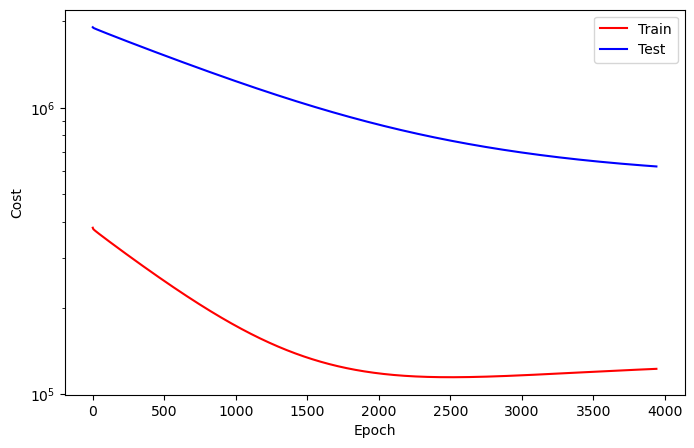

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3941
Train_cost  = 122770.1659 | Test_cost  = 623232.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3942
Train_cost  = 122776.2361 | Test_cost  = 623181.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3943
Train_cost  = 122782.2647 | Test_cost  = 623130.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3944
Train_cost  = 122788.3187 | Test_cost  = 623078.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3945
Train_cost  = 122794.3603 | Test_cost  = 623027.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3946
Train_cost  = 122800.3958 | Test_cost  = 622976.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3947
Train_cost  = 122806.4630 | Test_cost  = 622925.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3948
Train_cost  = 122812.4923 | Test_cost  = 622873.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3949
Train_cost  = 122818.5602 | Test_cost  = 622822.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3950
Train_cost  = 122824.5764 | Test_cost  = 622771.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3951
Train_cost  = 122830.6520 | Test_cost  = 622720.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3952
Train_cost  = 122836.6682 | Test_cost  = 622669.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3953
Train_cost  = 122842.7269 | Test_cost  = 622618.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3954
Train_cost  = 122848.7855 | Test_cost  = 622567.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3955
Train_cost  = 122854.8364 | Test_cost  = 622517.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3956
Train_cost  = 122860.8580 | Test_cost  = 622466.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3957
Train_cost  = 122866.8696 | Test_cost  = 622415.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3958
Train_cost  = 122872.8958 | Test_cost  = 622364.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3959
Train_cost  = 122878.8904 | Test_cost  = 622314.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3960
Train_cost  = 122884.9252 | Test_cost  = 622263.7750 | 


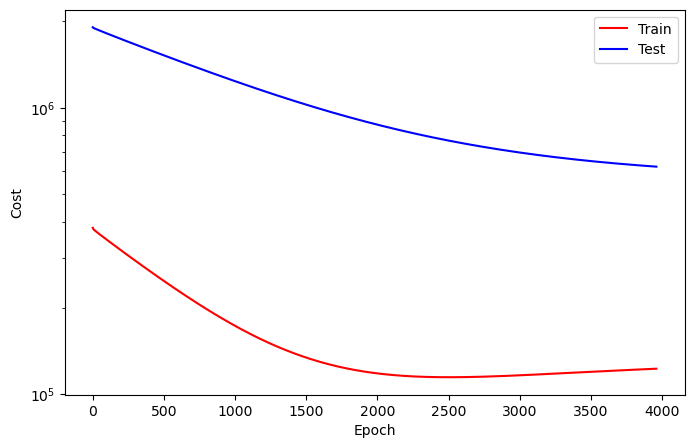

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3961
Train_cost  = 122890.9491 | Test_cost  = 622213.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3962
Train_cost  = 122896.9552 | Test_cost  = 622162.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3963
Train_cost  = 122902.9390 | Test_cost  = 622111.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3964
Train_cost  = 122908.9460 | Test_cost  = 622061.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3965
Train_cost  = 122914.9792 | Test_cost  = 622011.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3966
Train_cost  = 122921.0069 | Test_cost  = 621960.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3967
Train_cost  = 122926.9684 | Test_cost  = 621910.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3968
Train_cost  = 122932.9961 | Test_cost  = 621859.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3969
Train_cost  = 122938.9954 | Test_cost  = 621809.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3970
Train_cost  = 122945.0262 | Test_cost  = 621759.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3971
Train_cost  = 122951.0000 | Test_cost  = 621709.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3972
Train_cost  = 122956.9707 | Test_cost  = 621659.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3973
Train_cost  = 122962.9637 | Test_cost  = 621609.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3974
Train_cost  = 122968.9144 | Test_cost  = 621559.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3975
Train_cost  = 122974.8951 | Test_cost  = 621509.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3976
Train_cost  = 122980.8603 | Test_cost  = 621459.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3977
Train_cost  = 122986.8395 | Test_cost  = 621409.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3978
Train_cost  = 122992.8248 | Test_cost  = 621359.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3979
Train_cost  = 122998.7654 | Test_cost  = 621309.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3980
Train_cost  = 123004.7577 | Test_cost  = 621260.0750 | 


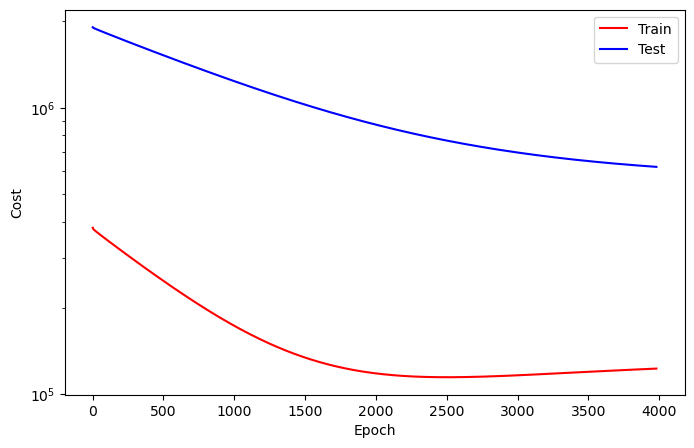

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3981
Train_cost  = 123010.7191 | Test_cost  = 621210.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3982
Train_cost  = 123016.6736 | Test_cost  = 621160.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3983
Train_cost  = 123022.6682 | Test_cost  = 621110.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3984
Train_cost  = 123028.6088 | Test_cost  = 621060.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3985
Train_cost  = 123034.6057 | Test_cost  = 621011.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3986
Train_cost  = 123040.5062 | Test_cost  = 620962.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3987
Train_cost  = 123046.4784 | Test_cost  = 620912.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3988
Train_cost  = 123052.3951 | Test_cost  = 620863.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3989
Train_cost  = 123058.3248 | Test_cost  = 620814.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3990
Train_cost  = 123064.2346 | Test_cost  = 620764.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3991
Train_cost  = 123070.1628 | Test_cost  = 620715.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3992
Train_cost  = 123076.1003 | Test_cost  = 620666.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3993
Train_cost  = 123082.0409 | Test_cost  = 620617.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3994
Train_cost  = 123087.9684 | Test_cost  = 620567.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3995
Train_cost  = 123093.8650 | Test_cost  = 620518.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3996
Train_cost  = 123099.8287 | Test_cost  = 620469.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3997
Train_cost  = 123105.7191 | Test_cost  = 620420.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3998
Train_cost  = 123111.6721 | Test_cost  = 620371.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  3999
Train_cost  = 123117.6111 | Test_cost  = 620322.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4000
Train_cost  = 123123.5085 | Test_cost  = 620273.4750 | 


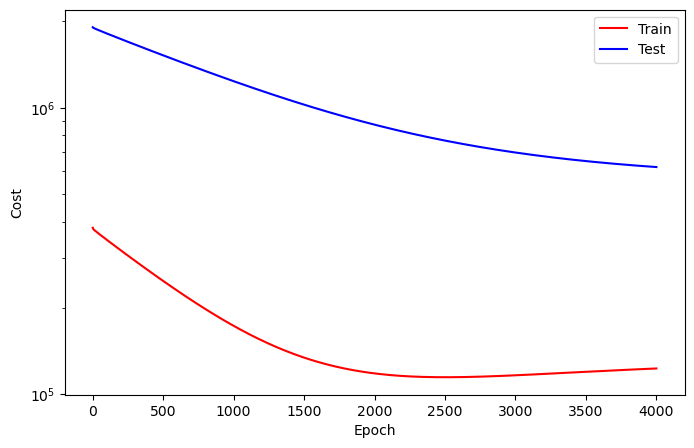

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4001
Train_cost  = 123129.4182 | Test_cost  = 620224.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4002
Train_cost  = 123135.3372 | Test_cost  = 620175.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4003
Train_cost  = 123141.2091 | Test_cost  = 620127.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4004
Train_cost  = 123147.0995 | Test_cost  = 620078.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4005
Train_cost  = 123153.0046 | Test_cost  = 620029.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4006
Train_cost  = 123158.8719 | Test_cost  = 619981.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4007
Train_cost  = 123164.7423 | Test_cost  = 619932.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4008
Train_cost  = 123170.6481 | Test_cost  = 619884.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4009
Train_cost  = 123176.5471 | Test_cost  = 619835.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4010
Train_cost  = 123182.4468 | Test_cost  = 619786.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4011
Train_cost  = 123188.3256 | Test_cost  = 619738.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4012
Train_cost  = 123194.2022 | Test_cost  = 619689.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4013
Train_cost  = 123200.1227 | Test_cost  = 619641.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4014
Train_cost  = 123205.9992 | Test_cost  = 619592.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4015
Train_cost  = 123211.8804 | Test_cost  = 619544.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4016
Train_cost  = 123217.7670 | Test_cost  = 619496.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4017
Train_cost  = 123223.6127 | Test_cost  = 619447.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4018
Train_cost  = 123229.4745 | Test_cost  = 619399.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4019
Train_cost  = 123235.3279 | Test_cost  = 619351.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4020
Train_cost  = 123241.1728 | Test_cost  = 619303.8250 | 


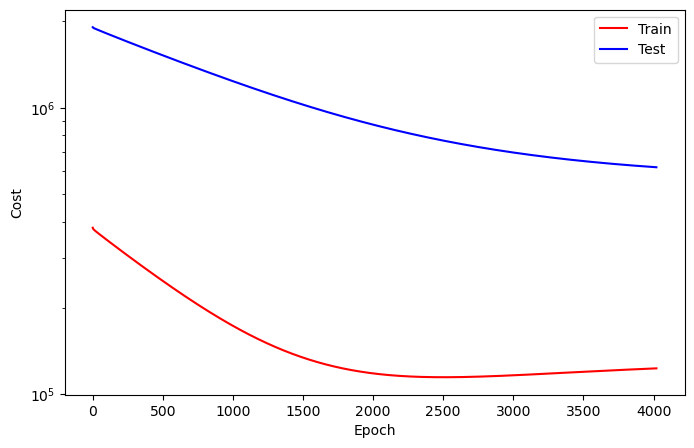

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4021
Train_cost  = 123247.0201 | Test_cost  = 619255.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4022
Train_cost  = 123252.8711 | Test_cost  = 619207.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4023
Train_cost  = 123258.7160 | Test_cost  = 619159.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4024
Train_cost  = 123264.5648 | Test_cost  = 619111.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4025
Train_cost  = 123270.4306 | Test_cost  = 619063.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4026
Train_cost  = 123276.2832 | Test_cost  = 619015.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4027
Train_cost  = 123282.1111 | Test_cost  = 618967.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4028
Train_cost  = 123287.9738 | Test_cost  = 618920.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4029
Train_cost  = 123293.8156 | Test_cost  = 618872.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4030
Train_cost  = 123299.6829 | Test_cost  = 618824.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4031
Train_cost  = 123305.4900 | Test_cost  = 618776.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4032
Train_cost  = 123311.3094 | Test_cost  = 618729.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4033
Train_cost  = 123317.1566 | Test_cost  = 618681.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4034
Train_cost  = 123322.9784 | Test_cost  = 618634.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4035
Train_cost  = 123328.7515 | Test_cost  = 618587.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4036
Train_cost  = 123334.5347 | Test_cost  = 618539.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4037
Train_cost  = 123340.3372 | Test_cost  = 618492.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4038
Train_cost  = 123346.1505 | Test_cost  = 618444.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4039
Train_cost  = 123351.9660 | Test_cost  = 618397.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4040
Train_cost  = 123357.7523 | Test_cost  = 618350.3000 | 


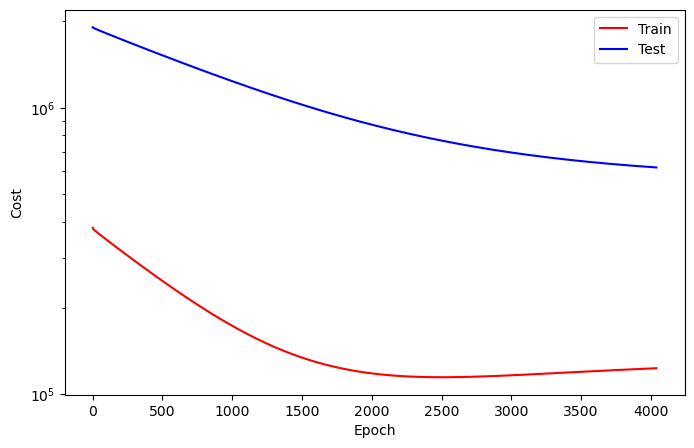

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4041
Train_cost  = 123363.5718 | Test_cost  = 618302.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4042
Train_cost  = 123369.3873 | Test_cost  = 618255.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4043
Train_cost  = 123375.1690 | Test_cost  = 618208.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4044
Train_cost  = 123380.9375 | Test_cost  = 618161.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4045
Train_cost  = 123386.7539 | Test_cost  = 618114.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4046
Train_cost  = 123392.5941 | Test_cost  = 618066.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4047
Train_cost  = 123398.3650 | Test_cost  = 618020.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4048
Train_cost  = 123404.1397 | Test_cost  = 617972.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4049
Train_cost  = 123409.9252 | Test_cost  = 617926.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4050
Train_cost  = 123415.7037 | Test_cost  = 617879.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4051
Train_cost  = 123421.4560 | Test_cost  = 617832.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4052
Train_cost  = 123427.2315 | Test_cost  = 617785.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4053
Train_cost  = 123432.9622 | Test_cost  = 617739.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4054
Train_cost  = 123438.7230 | Test_cost  = 617692.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4055
Train_cost  = 123444.4907 | Test_cost  = 617645.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4056
Train_cost  = 123450.2515 | Test_cost  = 617599.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4057
Train_cost  = 123456.0116 | Test_cost  = 617552.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4058
Train_cost  = 123461.7785 | Test_cost  = 617505.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4059
Train_cost  = 123467.5247 | Test_cost  = 617459.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4060
Train_cost  = 123473.2901 | Test_cost  = 617412.4500 | 


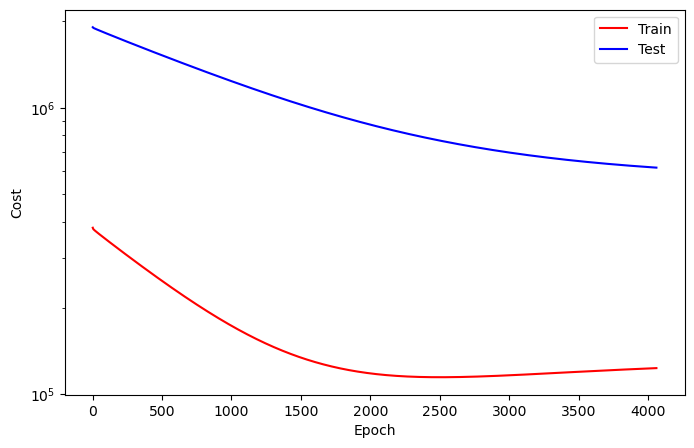

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4061
Train_cost  = 123479.0478 | Test_cost  = 617365.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4062
Train_cost  = 123484.8302 | Test_cost  = 617319.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4063
Train_cost  = 123490.5910 | Test_cost  = 617273.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4064
Train_cost  = 123496.3071 | Test_cost  = 617226.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4065
Train_cost  = 123502.0579 | Test_cost  = 617180.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4066
Train_cost  = 123507.7654 | Test_cost  = 617134.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4067
Train_cost  = 123513.4923 | Test_cost  = 617088.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4068
Train_cost  = 123519.1960 | Test_cost  = 617042.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4069
Train_cost  = 123524.9074 | Test_cost  = 616995.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4070
Train_cost  = 123530.6281 | Test_cost  = 616949.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4071
Train_cost  = 123536.3526 | Test_cost  = 616903.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4072
Train_cost  = 123542.0864 | Test_cost  = 616857.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4073
Train_cost  = 123547.8002 | Test_cost  = 616811.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4074
Train_cost  = 123553.5085 | Test_cost  = 616765.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4075
Train_cost  = 123559.2423 | Test_cost  = 616719.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4076
Train_cost  = 123564.9483 | Test_cost  = 616673.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4077
Train_cost  = 123570.6852 | Test_cost  = 616627.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4078
Train_cost  = 123576.3873 | Test_cost  = 616581.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4079
Train_cost  = 123582.0710 | Test_cost  = 616536.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4080
Train_cost  = 123587.7840 | Test_cost  = 616490.3500 | 


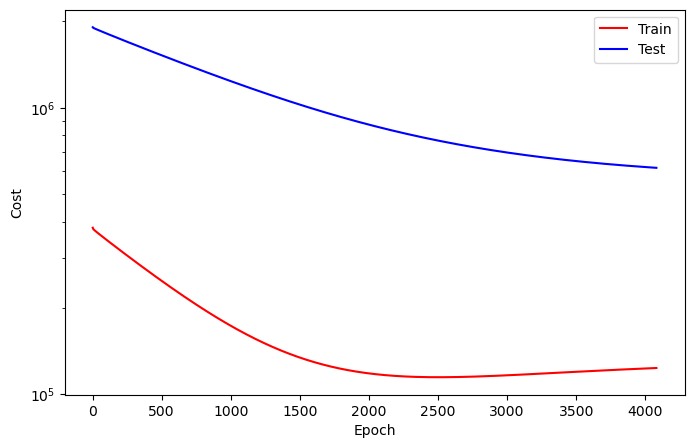

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4081
Train_cost  = 123593.4568 | Test_cost  = 616444.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4082
Train_cost  = 123599.1659 | Test_cost  = 616399.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4083
Train_cost  = 123604.8218 | Test_cost  = 616353.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4084
Train_cost  = 123610.4900 | Test_cost  = 616308.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4085
Train_cost  = 123616.1659 | Test_cost  = 616262.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4086
Train_cost  = 123621.8318 | Test_cost  = 616217.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4087
Train_cost  = 123627.4846 | Test_cost  = 616171.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4088
Train_cost  = 123633.1767 | Test_cost  = 616126.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4089
Train_cost  = 123638.8441 | Test_cost  = 616081.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4090
Train_cost  = 123644.5069 | Test_cost  = 616035.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4091
Train_cost  = 123650.1829 | Test_cost  = 615990.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4092
Train_cost  = 123655.8565 | Test_cost  = 615944.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4093
Train_cost  = 123661.5355 | Test_cost  = 615899.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4094
Train_cost  = 123667.1952 | Test_cost  = 615854.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4095
Train_cost  = 123672.8434 | Test_cost  = 615809.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4096
Train_cost  = 123678.5077 | Test_cost  = 615764.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4097
Train_cost  = 123684.1620 | Test_cost  = 615719.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4098
Train_cost  = 123689.7739 | Test_cost  = 615674.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4099
Train_cost  = 123695.3974 | Test_cost  = 615629.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4100
Train_cost  = 123701.0185 | Test_cost  = 615584.6750 | 


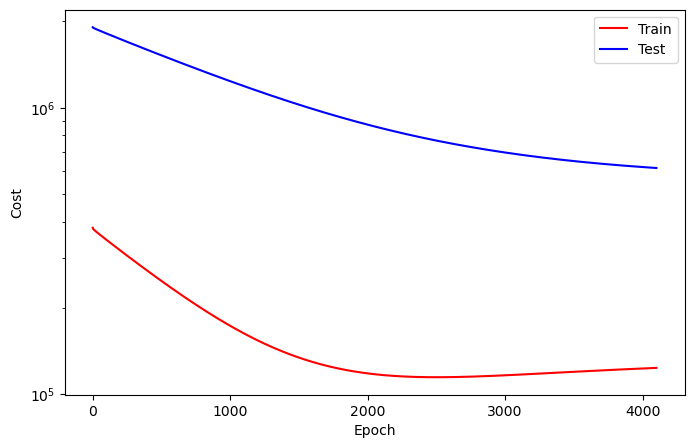

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4101
Train_cost  = 123706.6651 | Test_cost  = 615539.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4102
Train_cost  = 123712.2647 | Test_cost  = 615495.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4103
Train_cost  = 123717.9059 | Test_cost  = 615450.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4104
Train_cost  = 123723.5100 | Test_cost  = 615405.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4105
Train_cost  = 123729.1489 | Test_cost  = 615360.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4106
Train_cost  = 123734.7623 | Test_cost  = 615316.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4107
Train_cost  = 123740.3657 | Test_cost  = 615271.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4108
Train_cost  = 123746.0193 | Test_cost  = 615226.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4109
Train_cost  = 123751.6211 | Test_cost  = 615181.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4110
Train_cost  = 123757.2693 | Test_cost  = 615137.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4111
Train_cost  = 123762.8742 | Test_cost  = 615092.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4112
Train_cost  = 123768.4830 | Test_cost  = 615048.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4113
Train_cost  = 123774.0779 | Test_cost  = 615003.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4114
Train_cost  = 123779.6836 | Test_cost  = 614959.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4115
Train_cost  = 123785.2978 | Test_cost  = 614915.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4116
Train_cost  = 123790.8634 | Test_cost  = 614870.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4117
Train_cost  = 123796.4460 | Test_cost  = 614826.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4118
Train_cost  = 123802.0370 | Test_cost  = 614782.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4119
Train_cost  = 123807.5980 | Test_cost  = 614738.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4120
Train_cost  = 123813.1844 | Test_cost  = 614693.9750 | 


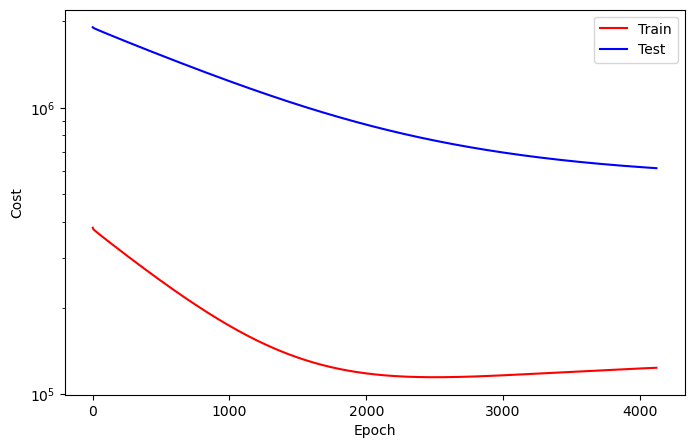

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4121
Train_cost  = 123818.7477 | Test_cost  = 614649.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4122
Train_cost  = 123824.3287 | Test_cost  = 614605.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4123
Train_cost  = 123829.8904 | Test_cost  = 614561.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4124
Train_cost  = 123835.4931 | Test_cost  = 614517.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4125
Train_cost  = 123841.0540 | Test_cost  = 614473.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4126
Train_cost  = 123846.6651 | Test_cost  = 614429.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4127
Train_cost  = 123852.2076 | Test_cost  = 614385.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4128
Train_cost  = 123857.7816 | Test_cost  = 614341.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4129
Train_cost  = 123863.3302 | Test_cost  = 614297.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4130
Train_cost  = 123868.8843 | Test_cost  = 614253.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4131
Train_cost  = 123874.4637 | Test_cost  = 614210.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4132
Train_cost  = 123879.9931 | Test_cost  = 614166.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4133
Train_cost  = 123885.5471 | Test_cost  = 614122.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4134
Train_cost  = 123891.0725 | Test_cost  = 614079.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4135
Train_cost  = 123896.6127 | Test_cost  = 614035.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4136
Train_cost  = 123902.1512 | Test_cost  = 613991.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4137
Train_cost  = 123907.6867 | Test_cost  = 613948.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4138
Train_cost  = 123913.2052 | Test_cost  = 613904.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4139
Train_cost  = 123918.7469 | Test_cost  = 613861.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4140
Train_cost  = 123924.2816 | Test_cost  = 613817.7000 | 


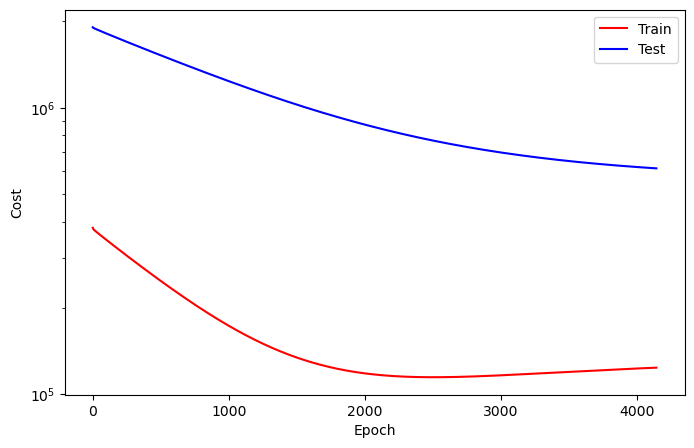

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4141
Train_cost  = 123929.8009 | Test_cost  = 613774.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4142
Train_cost  = 123935.3410 | Test_cost  = 613730.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4143
Train_cost  = 123940.8889 | Test_cost  = 613687.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4144
Train_cost  = 123946.4205 | Test_cost  = 613643.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4145
Train_cost  = 123951.9352 | Test_cost  = 613600.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4146
Train_cost  = 123957.4529 | Test_cost  = 613557.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4147
Train_cost  = 123962.9799 | Test_cost  = 613514.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4148
Train_cost  = 123968.4799 | Test_cost  = 613470.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4149
Train_cost  = 123973.9830 | Test_cost  = 613427.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4150
Train_cost  = 123979.4846 | Test_cost  = 613384.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4151
Train_cost  = 123984.9622 | Test_cost  = 613341.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4152
Train_cost  = 123990.4560 | Test_cost  = 613298.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4153
Train_cost  = 123995.9591 | Test_cost  = 613255.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4154
Train_cost  = 124001.4406 | Test_cost  = 613212.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4155
Train_cost  = 124006.9329 | Test_cost  = 613169.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4156
Train_cost  = 124012.4198 | Test_cost  = 613126.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4157
Train_cost  = 124017.8997 | Test_cost  = 613083.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4158
Train_cost  = 124023.4275 | Test_cost  = 613040.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4159
Train_cost  = 124028.9051 | Test_cost  = 612998.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4160
Train_cost  = 124034.3927 | Test_cost  = 612955.1750 | 


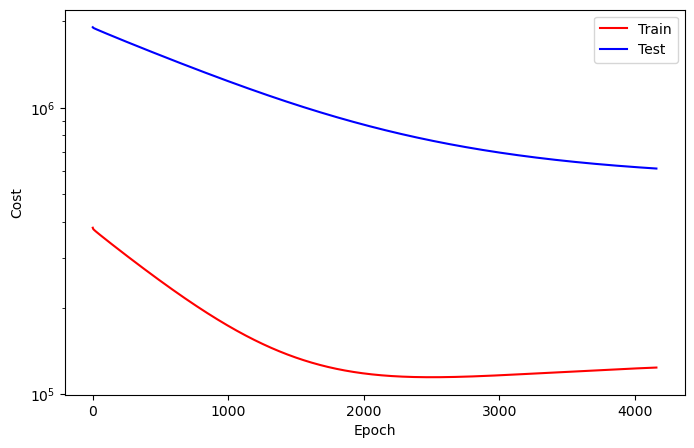

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4161
Train_cost  = 124039.8696 | Test_cost  = 612912.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4162
Train_cost  = 124045.3688 | Test_cost  = 612869.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4163
Train_cost  = 124050.8395 | Test_cost  = 612826.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4164
Train_cost  = 124056.3233 | Test_cost  = 612784.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4165
Train_cost  = 124061.7932 | Test_cost  = 612741.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4166
Train_cost  = 124067.2500 | Test_cost  = 612699.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4167
Train_cost  = 124072.6505 | Test_cost  = 612656.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4168
Train_cost  = 124078.1327 | Test_cost  = 612614.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4169
Train_cost  = 124083.5625 | Test_cost  = 612571.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4170
Train_cost  = 124089.0316 | Test_cost  = 612529.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4171
Train_cost  = 124094.4583 | Test_cost  = 612487.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4172
Train_cost  = 124099.9005 | Test_cost  = 612444.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4173
Train_cost  = 124105.3495 | Test_cost  = 612402.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4174
Train_cost  = 124110.7623 | Test_cost  = 612360.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4175
Train_cost  = 124116.2346 | Test_cost  = 612318.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4176
Train_cost  = 124121.6443 | Test_cost  = 612275.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4177
Train_cost  = 124127.0826 | Test_cost  = 612233.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4178
Train_cost  = 124132.5370 | Test_cost  = 612191.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4179
Train_cost  = 124137.9630 | Test_cost  = 612149.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4180
Train_cost  = 124143.3719 | Test_cost  = 612107.3500 | 


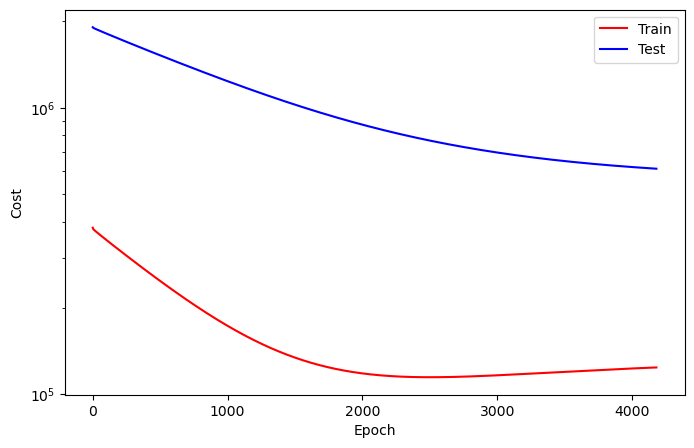

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4181
Train_cost  = 124148.7677 | Test_cost  = 612065.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4182
Train_cost  = 124154.2091 | Test_cost  = 612023.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4183
Train_cost  = 124159.6312 | Test_cost  = 611981.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4184
Train_cost  = 124165.0216 | Test_cost  = 611939.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4185
Train_cost  = 124170.4113 | Test_cost  = 611897.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4186
Train_cost  = 124175.7948 | Test_cost  = 611856.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4187
Train_cost  = 124181.1806 | Test_cost  = 611814.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4188
Train_cost  = 124186.5517 | Test_cost  = 611772.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4189
Train_cost  = 124191.9390 | Test_cost  = 611731.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4190
Train_cost  = 124197.3580 | Test_cost  = 611689.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4191
Train_cost  = 124202.7346 | Test_cost  = 611647.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4192
Train_cost  = 124208.1173 | Test_cost  = 611606.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4193
Train_cost  = 124213.5008 | Test_cost  = 611564.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4194
Train_cost  = 124218.8889 | Test_cost  = 611522.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4195
Train_cost  = 124224.2770 | Test_cost  = 611481.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4196
Train_cost  = 124229.6613 | Test_cost  = 611439.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4197
Train_cost  = 124235.0394 | Test_cost  = 611398.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4198
Train_cost  = 124240.4167 | Test_cost  = 611357.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4199
Train_cost  = 124245.7793 | Test_cost  = 611315.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4200
Train_cost  = 124251.1366 | Test_cost  = 611274.4000 | 


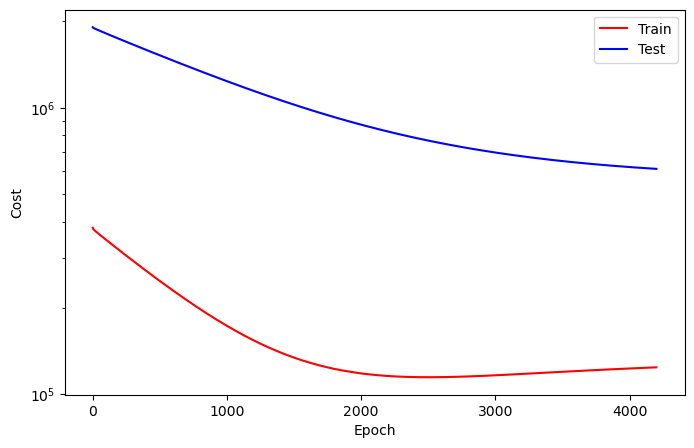

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4201
Train_cost  = 124256.5039 | Test_cost  = 611233.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4202
Train_cost  = 124261.8218 | Test_cost  = 611192.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4203
Train_cost  = 124267.1427 | Test_cost  = 611150.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4204
Train_cost  = 124272.4992 | Test_cost  = 611109.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4205
Train_cost  = 124277.8233 | Test_cost  = 611068.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4206
Train_cost  = 124283.2014 | Test_cost  = 611027.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4207
Train_cost  = 124288.5340 | Test_cost  = 610986.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4208
Train_cost  = 124293.8642 | Test_cost  = 610945.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4209
Train_cost  = 124299.2176 | Test_cost  = 610904.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4210
Train_cost  = 124304.5694 | Test_cost  = 610863.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4211
Train_cost  = 124309.8873 | Test_cost  = 610822.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4212
Train_cost  = 124315.2307 | Test_cost  = 610781.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4213
Train_cost  = 124320.5610 | Test_cost  = 610740.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4214
Train_cost  = 124325.8858 | Test_cost  = 610699.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4215
Train_cost  = 124331.2106 | Test_cost  = 610658.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4216
Train_cost  = 124336.5370 | Test_cost  = 610617.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4217
Train_cost  = 124341.8650 | Test_cost  = 610577.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4218
Train_cost  = 124347.1790 | Test_cost  = 610536.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4219
Train_cost  = 124352.4545 | Test_cost  = 610496.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4220
Train_cost  = 124357.7554 | Test_cost  = 610455.5750 | 


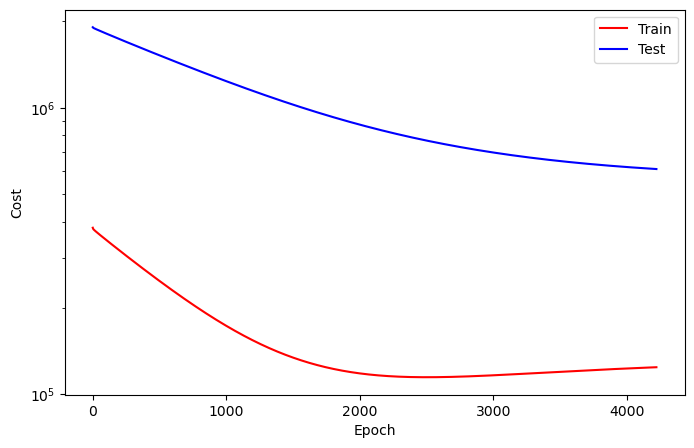

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4221
Train_cost  = 124363.0540 | Test_cost  = 610414.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4222
Train_cost  = 124368.3264 | Test_cost  = 610374.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4223
Train_cost  = 124373.6165 | Test_cost  = 610334.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4224
Train_cost  = 124378.9298 | Test_cost  = 610293.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4225
Train_cost  = 124384.2191 | Test_cost  = 610252.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4226
Train_cost  = 124389.4907 | Test_cost  = 610212.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4227
Train_cost  = 124394.7816 | Test_cost  = 610172.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4228
Train_cost  = 124400.1049 | Test_cost  = 610131.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4229
Train_cost  = 124405.3750 | Test_cost  = 610091.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4230
Train_cost  = 124410.6829 | Test_cost  = 610051.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4231
Train_cost  = 124415.9452 | Test_cost  = 610010.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4232
Train_cost  = 124421.2199 | Test_cost  = 609970.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4233
Train_cost  = 124426.4915 | Test_cost  = 609930.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4234
Train_cost  = 124431.7855 | Test_cost  = 609889.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4235
Train_cost  = 124437.0355 | Test_cost  = 609849.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4236
Train_cost  = 124442.3194 | Test_cost  = 609809.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4237
Train_cost  = 124447.5818 | Test_cost  = 609769.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4238
Train_cost  = 124452.8210 | Test_cost  = 609729.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4239
Train_cost  = 124458.0556 | Test_cost  = 609689.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4240
Train_cost  = 124463.2693 | Test_cost  = 609650.0000 | 


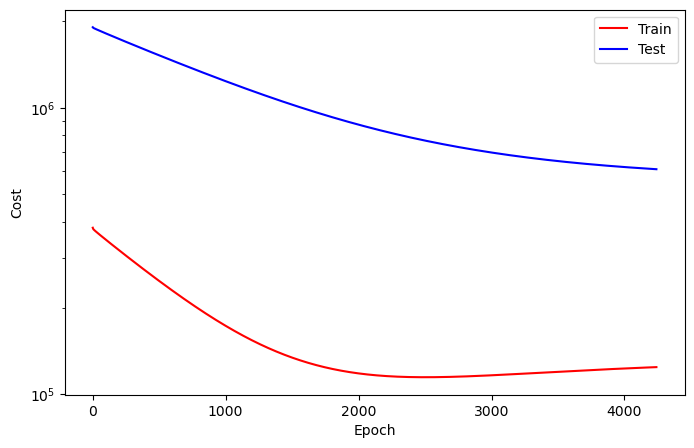

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4241
Train_cost  = 124468.5154 | Test_cost  = 609610.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4242
Train_cost  = 124473.7500 | Test_cost  = 609570.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4243
Train_cost  = 124478.9853 | Test_cost  = 609530.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4244
Train_cost  = 124484.2099 | Test_cost  = 609490.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4245
Train_cost  = 124489.4753 | Test_cost  = 609450.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4246
Train_cost  = 124494.7006 | Test_cost  = 609410.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4247
Train_cost  = 124499.9421 | Test_cost  = 609371.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4248
Train_cost  = 124505.1944 | Test_cost  = 609331.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4249
Train_cost  = 124510.4252 | Test_cost  = 609291.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4250
Train_cost  = 124515.6458 | Test_cost  = 609252.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4251
Train_cost  = 124520.8410 | Test_cost  = 609212.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4252
Train_cost  = 124526.0694 | Test_cost  = 609172.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4253
Train_cost  = 124531.3025 | Test_cost  = 609133.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4254
Train_cost  = 124536.5355 | Test_cost  = 609093.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4255
Train_cost  = 124541.7292 | Test_cost  = 609054.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4256
Train_cost  = 124546.9290 | Test_cost  = 609015.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4257
Train_cost  = 124552.0957 | Test_cost  = 608975.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4258
Train_cost  = 124557.2724 | Test_cost  = 608936.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4259
Train_cost  = 124562.4715 | Test_cost  = 608897.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4260
Train_cost  = 124567.6335 | Test_cost  = 608858.4000 | 


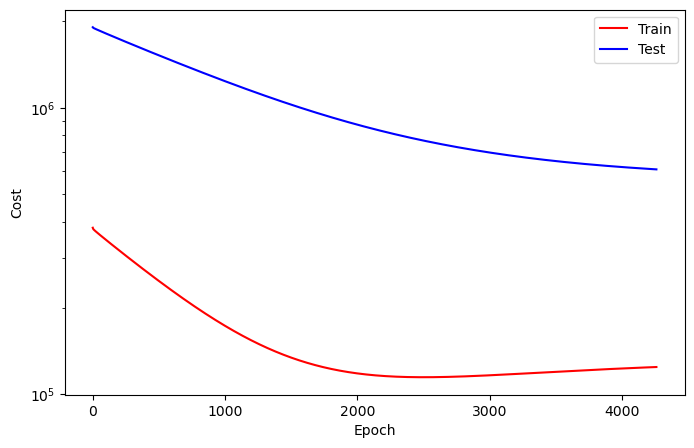

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4261
Train_cost  = 124572.8140 | Test_cost  = 608819.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4262
Train_cost  = 124577.9985 | Test_cost  = 608779.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4263
Train_cost  = 124583.1636 | Test_cost  = 608740.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4264
Train_cost  = 124588.3843 | Test_cost  = 608701.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4265
Train_cost  = 124593.5401 | Test_cost  = 608662.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4266
Train_cost  = 124598.7369 | Test_cost  = 608623.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4267
Train_cost  = 124603.9429 | Test_cost  = 608584.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4268
Train_cost  = 124609.1150 | Test_cost  = 608545.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4269
Train_cost  = 124614.2894 | Test_cost  = 608506.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4270
Train_cost  = 124619.4583 | Test_cost  = 608466.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4271
Train_cost  = 124624.6057 | Test_cost  = 608427.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4272
Train_cost  = 124629.7955 | Test_cost  = 608388.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4273
Train_cost  = 124634.9522 | Test_cost  = 608349.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4274
Train_cost  = 124640.1080 | Test_cost  = 608311.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4275
Train_cost  = 124645.2469 | Test_cost  = 608272.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4276
Train_cost  = 124650.3781 | Test_cost  = 608234.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4277
Train_cost  = 124655.5015 | Test_cost  = 608195.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4278
Train_cost  = 124660.6281 | Test_cost  = 608156.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4279
Train_cost  = 124665.7546 | Test_cost  = 608118.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4280
Train_cost  = 124670.8873 | Test_cost  = 608079.6250 | 


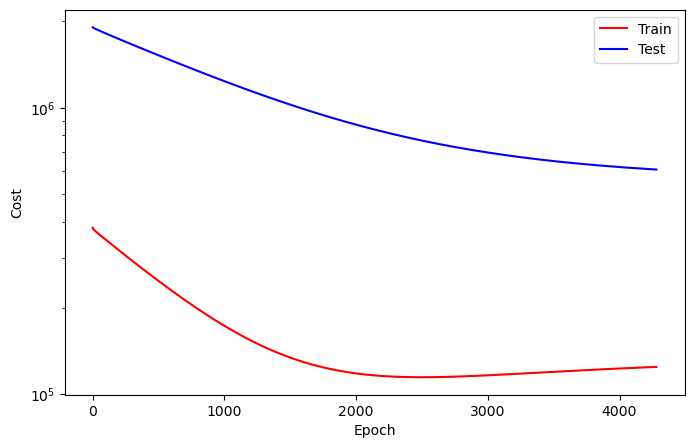

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4281
Train_cost  = 124676.0239 | Test_cost  = 608041.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4282
Train_cost  = 124681.1543 | Test_cost  = 608002.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4283
Train_cost  = 124686.3017 | Test_cost  = 607963.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4284
Train_cost  = 124691.4221 | Test_cost  = 607925.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4285
Train_cost  = 124696.5679 | Test_cost  = 607886.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4286
Train_cost  = 124701.6890 | Test_cost  = 607848.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4287
Train_cost  = 124706.8194 | Test_cost  = 607809.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4288
Train_cost  = 124711.9514 | Test_cost  = 607771.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4289
Train_cost  = 124717.0579 | Test_cost  = 607733.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4290
Train_cost  = 124722.1898 | Test_cost  = 607694.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4291
Train_cost  = 124727.3025 | Test_cost  = 607656.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4292
Train_cost  = 124732.4252 | Test_cost  = 607617.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4293
Train_cost  = 124737.5270 | Test_cost  = 607579.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4294
Train_cost  = 124742.6211 | Test_cost  = 607541.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4295
Train_cost  = 124747.6782 | Test_cost  = 607503.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4296
Train_cost  = 124752.7639 | Test_cost  = 607465.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4297
Train_cost  = 124757.8410 | Test_cost  = 607427.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4298
Train_cost  = 124762.9082 | Test_cost  = 607389.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4299
Train_cost  = 124768.0000 | Test_cost  = 607351.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4300
Train_cost  = 124773.0718 | Test_cost  = 607313.7250 | 


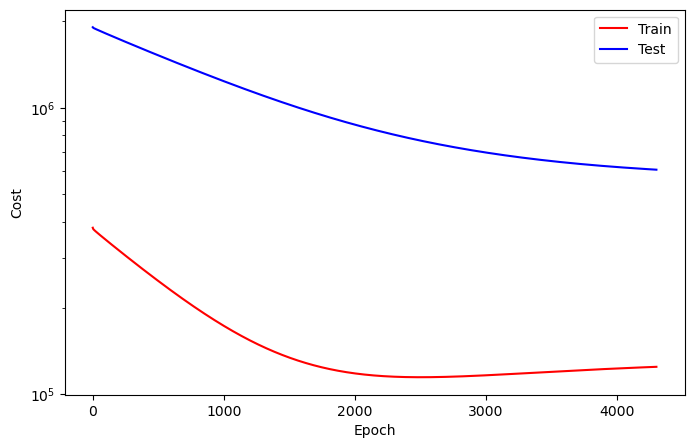

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4301
Train_cost  = 124778.1404 | Test_cost  = 607275.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4302
Train_cost  = 124783.2184 | Test_cost  = 607237.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4303
Train_cost  = 124788.2917 | Test_cost  = 607199.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4304
Train_cost  = 124793.3711 | Test_cost  = 607161.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4305
Train_cost  = 124798.4622 | Test_cost  = 607123.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4306
Train_cost  = 124803.5262 | Test_cost  = 607086.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4307
Train_cost  = 124808.5702 | Test_cost  = 607048.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4308
Train_cost  = 124813.6489 | Test_cost  = 607010.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4309
Train_cost  = 124818.7160 | Test_cost  = 606972.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4310
Train_cost  = 124823.7701 | Test_cost  = 606935.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4311
Train_cost  = 124828.8140 | Test_cost  = 606897.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4312
Train_cost  = 124833.8951 | Test_cost  = 606859.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4313
Train_cost  = 124838.9336 | Test_cost  = 606822.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4314
Train_cost  = 124843.9352 | Test_cost  = 606785.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4315
Train_cost  = 124848.9576 | Test_cost  = 606747.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4316
Train_cost  = 124853.9529 | Test_cost  = 606710.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4317
Train_cost  = 124858.9807 | Test_cost  = 606673.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4318
Train_cost  = 124863.9792 | Test_cost  = 606635.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4319
Train_cost  = 124869.0054 | Test_cost  = 606598.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4320
Train_cost  = 124874.0285 | Test_cost  = 606561.1250 | 


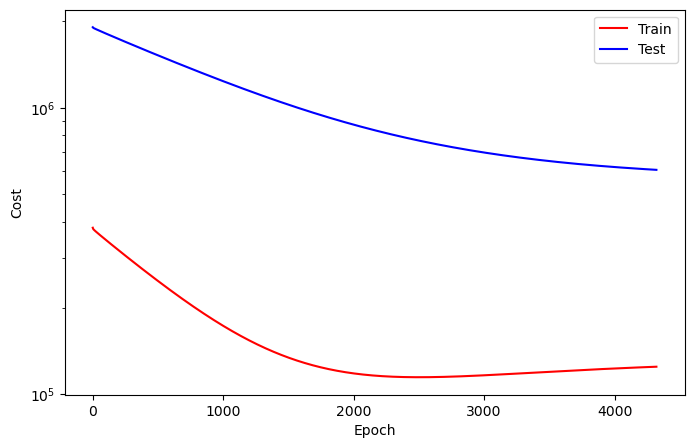

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4321
Train_cost  = 124879.0347 | Test_cost  = 606523.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4322
Train_cost  = 124884.0563 | Test_cost  = 606486.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4323
Train_cost  = 124889.0980 | Test_cost  = 606449.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4324
Train_cost  = 124894.0949 | Test_cost  = 606412.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4325
Train_cost  = 124899.0941 | Test_cost  = 606374.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4326
Train_cost  = 124904.1150 | Test_cost  = 606337.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4327
Train_cost  = 124909.1404 | Test_cost  = 606300.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4328
Train_cost  = 124914.1042 | Test_cost  = 606263.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4329
Train_cost  = 124919.1103 | Test_cost  = 606226.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4330
Train_cost  = 124924.1196 | Test_cost  = 606189.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4331
Train_cost  = 124929.1034 | Test_cost  = 606152.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4332
Train_cost  = 124934.1173 | Test_cost  = 606115.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4333
Train_cost  = 124939.0849 | Test_cost  = 606078.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4334
Train_cost  = 124944.0463 | Test_cost  = 606041.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4335
Train_cost  = 124949.0085 | Test_cost  = 606005.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4336
Train_cost  = 124953.9637 | Test_cost  = 605968.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4337
Train_cost  = 124958.9329 | Test_cost  = 605931.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4338
Train_cost  = 124963.8881 | Test_cost  = 605895.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4339
Train_cost  = 124968.8426 | Test_cost  = 605858.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4340
Train_cost  = 124973.8156 | Test_cost  = 605821.5750 | 


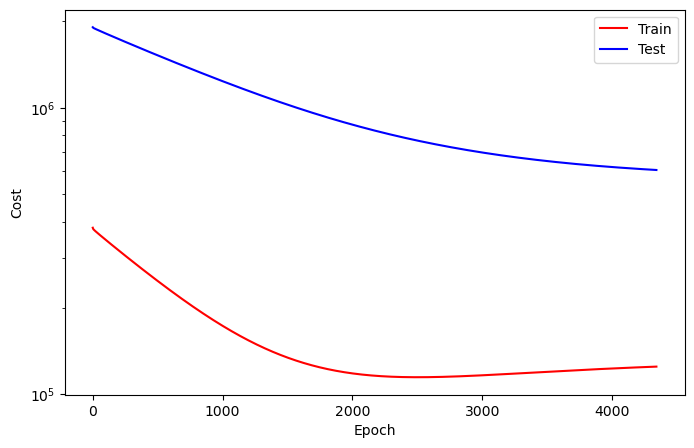

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4341
Train_cost  = 124978.7685 | Test_cost  = 605784.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4342
Train_cost  = 124983.7222 | Test_cost  = 605748.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4343
Train_cost  = 124988.7114 | Test_cost  = 605711.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4344
Train_cost  = 124993.6497 | Test_cost  = 605674.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4345
Train_cost  = 124998.6219 | Test_cost  = 605638.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4346
Train_cost  = 125003.5664 | Test_cost  = 605601.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4347
Train_cost  = 125008.5170 | Test_cost  = 605565.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4348
Train_cost  = 125013.4761 | Test_cost  = 605528.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4349
Train_cost  = 125018.4120 | Test_cost  = 605492.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4350
Train_cost  = 125023.3835 | Test_cost  = 605455.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4351
Train_cost  = 125028.3248 | Test_cost  = 605419.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4352
Train_cost  = 125033.2693 | Test_cost  = 605382.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4353
Train_cost  = 125038.1898 | Test_cost  = 605346.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4354
Train_cost  = 125043.1042 | Test_cost  = 605310.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4355
Train_cost  = 125047.9877 | Test_cost  = 605274.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4356
Train_cost  = 125052.8989 | Test_cost  = 605238.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4357
Train_cost  = 125057.8017 | Test_cost  = 605202.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4358
Train_cost  = 125062.7052 | Test_cost  = 605166.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4359
Train_cost  = 125067.5988 | Test_cost  = 605130.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4360
Train_cost  = 125072.5216 | Test_cost  = 605094.0750 | 


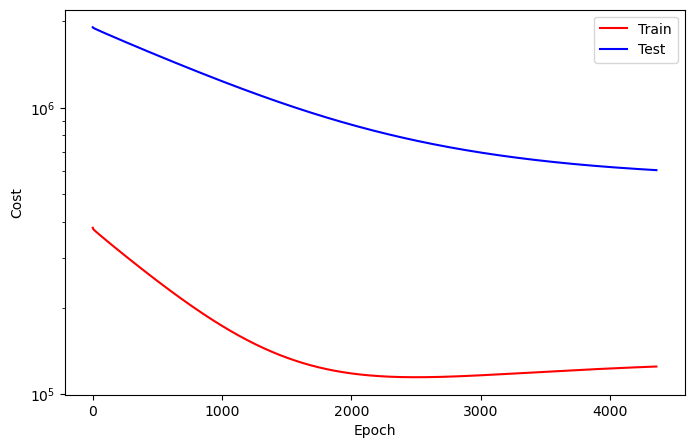

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4361
Train_cost  = 125077.4090 | Test_cost  = 605057.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4362
Train_cost  = 125082.3202 | Test_cost  = 605021.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4363
Train_cost  = 125087.2353 | Test_cost  = 604986.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4364
Train_cost  = 125092.1265 | Test_cost  = 604949.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4365
Train_cost  = 125097.0386 | Test_cost  = 604913.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4366
Train_cost  = 125101.9105 | Test_cost  = 604877.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4367
Train_cost  = 125106.8403 | Test_cost  = 604841.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4368
Train_cost  = 125111.7230 | Test_cost  = 604806.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4369
Train_cost  = 125116.6188 | Test_cost  = 604770.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4370
Train_cost  = 125121.5170 | Test_cost  = 604734.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4371
Train_cost  = 125126.4020 | Test_cost  = 604698.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4372
Train_cost  = 125131.3094 | Test_cost  = 604662.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4373
Train_cost  = 125136.1752 | Test_cost  = 604626.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4374
Train_cost  = 125141.0108 | Test_cost  = 604591.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4375
Train_cost  = 125145.8627 | Test_cost  = 604556.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4376
Train_cost  = 125150.7022 | Test_cost  = 604520.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4377
Train_cost  = 125155.5409 | Test_cost  = 604485.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4378
Train_cost  = 125160.3866 | Test_cost  = 604449.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4379
Train_cost  = 125165.2361 | Test_cost  = 604414.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4380
Train_cost  = 125170.0941 | Test_cost  = 604378.6250 | 


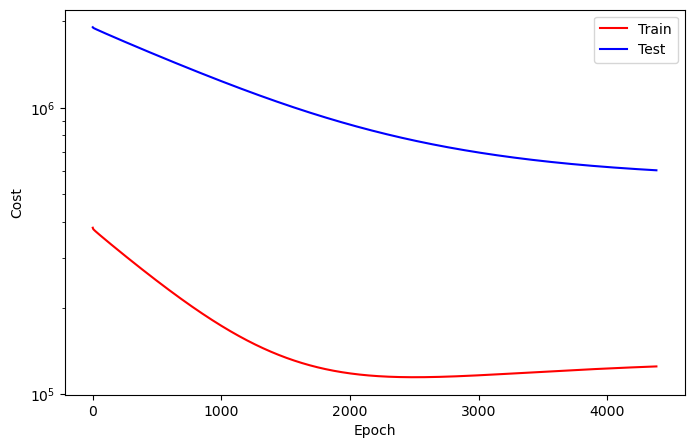

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4381
Train_cost  = 125174.9468 | Test_cost  = 604343.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4382
Train_cost  = 125179.8056 | Test_cost  = 604307.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4383
Train_cost  = 125184.6651 | Test_cost  = 604272.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4384
Train_cost  = 125189.5008 | Test_cost  = 604236.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4385
Train_cost  = 125194.3549 | Test_cost  = 604201.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4386
Train_cost  = 125199.2068 | Test_cost  = 604165.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4387
Train_cost  = 125204.0478 | Test_cost  = 604130.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4388
Train_cost  = 125208.8897 | Test_cost  = 604095.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4389
Train_cost  = 125213.7184 | Test_cost  = 604059.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4390
Train_cost  = 125218.5841 | Test_cost  = 604024.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4391
Train_cost  = 125223.4298 | Test_cost  = 603989.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4392
Train_cost  = 125228.2731 | Test_cost  = 603953.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4393
Train_cost  = 125233.1219 | Test_cost  = 603918.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4394
Train_cost  = 125237.9259 | Test_cost  = 603883.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4395
Train_cost  = 125242.7546 | Test_cost  = 603848.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4396
Train_cost  = 125247.5432 | Test_cost  = 603813.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4397
Train_cost  = 125252.3272 | Test_cost  = 603778.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4398
Train_cost  = 125257.1435 | Test_cost  = 603743.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4399
Train_cost  = 125261.9144 | Test_cost  = 603709.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4400
Train_cost  = 125266.7029 | Test_cost  = 603673.9500 | 


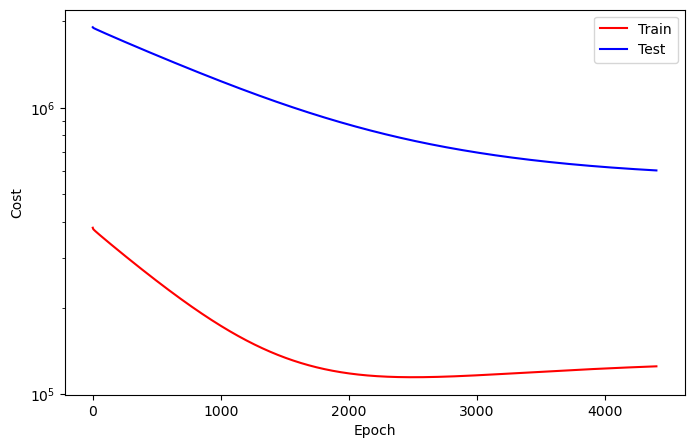

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4401
Train_cost  = 125271.4931 | Test_cost  = 603639.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4402
Train_cost  = 125276.2955 | Test_cost  = 603604.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4403
Train_cost  = 125281.0957 | Test_cost  = 603569.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4404
Train_cost  = 125285.8897 | Test_cost  = 603534.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4405
Train_cost  = 125290.6860 | Test_cost  = 603499.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4406
Train_cost  = 125295.4630 | Test_cost  = 603465.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4407
Train_cost  = 125300.2377 | Test_cost  = 603430.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4408
Train_cost  = 125305.0394 | Test_cost  = 603395.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4409
Train_cost  = 125309.8295 | Test_cost  = 603360.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4410
Train_cost  = 125314.6451 | Test_cost  = 603325.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4411
Train_cost  = 125319.4136 | Test_cost  = 603291.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4412
Train_cost  = 125324.2006 | Test_cost  = 603256.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4413
Train_cost  = 125328.9823 | Test_cost  = 603221.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4414
Train_cost  = 125333.7477 | Test_cost  = 603187.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4415
Train_cost  = 125338.5100 | Test_cost  = 603152.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4416
Train_cost  = 125343.2546 | Test_cost  = 603118.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4417
Train_cost  = 125347.9784 | Test_cost  = 603084.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4418
Train_cost  = 125352.7137 | Test_cost  = 603050.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4419
Train_cost  = 125357.4444 | Test_cost  = 603015.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4420
Train_cost  = 125362.1636 | Test_cost  = 602981.6000 | 


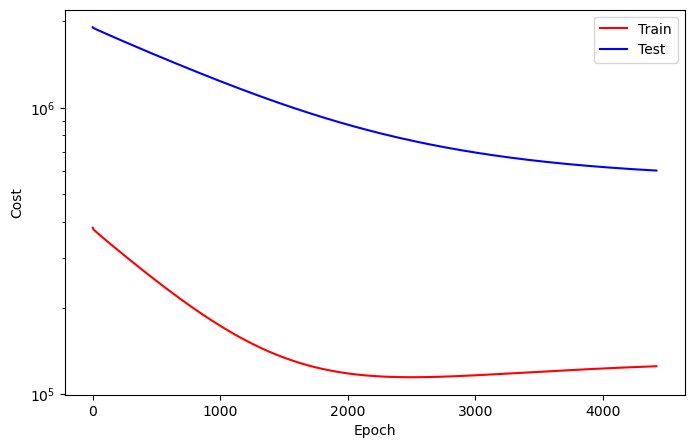

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4421
Train_cost  = 125366.8935 | Test_cost  = 602947.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4422
Train_cost  = 125371.6373 | Test_cost  = 602913.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4423
Train_cost  = 125376.3665 | Test_cost  = 602878.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4424
Train_cost  = 125381.1227 | Test_cost  = 602844.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4425
Train_cost  = 125385.8341 | Test_cost  = 602810.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4426
Train_cost  = 125390.5617 | Test_cost  = 602776.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4427
Train_cost  = 125395.2847 | Test_cost  = 602742.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4428
Train_cost  = 125399.9900 | Test_cost  = 602707.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4429
Train_cost  = 125404.7307 | Test_cost  = 602674.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4430
Train_cost  = 125409.4552 | Test_cost  = 602639.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4431
Train_cost  = 125414.1574 | Test_cost  = 602605.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4432
Train_cost  = 125418.9020 | Test_cost  = 602571.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4433
Train_cost  = 125423.6211 | Test_cost  = 602537.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4434
Train_cost  = 125428.3380 | Test_cost  = 602503.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4435
Train_cost  = 125433.0594 | Test_cost  = 602469.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4436
Train_cost  = 125437.7492 | Test_cost  = 602435.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4437
Train_cost  = 125442.4599 | Test_cost  = 602402.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4438
Train_cost  = 125447.1211 | Test_cost  = 602368.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4439
Train_cost  = 125451.7901 | Test_cost  = 602334.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4440
Train_cost  = 125456.4591 | Test_cost  = 602301.1250 | 


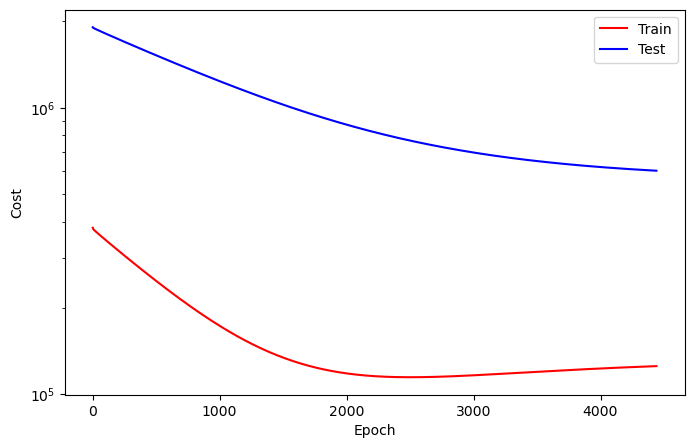

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4441
Train_cost  = 125461.1157 | Test_cost  = 602267.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4442
Train_cost  = 125465.7855 | Test_cost  = 602233.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4443
Train_cost  = 125470.4668 | Test_cost  = 602200.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4444
Train_cost  = 125475.1343 | Test_cost  = 602166.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4445
Train_cost  = 125479.7863 | Test_cost  = 602133.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4446
Train_cost  = 125484.4460 | Test_cost  = 602099.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4447
Train_cost  = 125489.1451 | Test_cost  = 602066.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4448
Train_cost  = 125493.7739 | Test_cost  = 602032.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4449
Train_cost  = 125498.4437 | Test_cost  = 601999.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4450
Train_cost  = 125503.1057 | Test_cost  = 601965.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4451
Train_cost  = 125507.7685 | Test_cost  = 601932.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4452
Train_cost  = 125512.4329 | Test_cost  = 601898.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4453
Train_cost  = 125517.1049 | Test_cost  = 601865.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4454
Train_cost  = 125521.7469 | Test_cost  = 601831.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4455
Train_cost  = 125526.4267 | Test_cost  = 601798.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4456
Train_cost  = 125531.0965 | Test_cost  = 601764.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4457
Train_cost  = 125535.7431 | Test_cost  = 601731.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4458
Train_cost  = 125540.4113 | Test_cost  = 601698.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4459
Train_cost  = 125545.0154 | Test_cost  = 601664.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4460
Train_cost  = 125549.6404 | Test_cost  = 601631.8750 | 


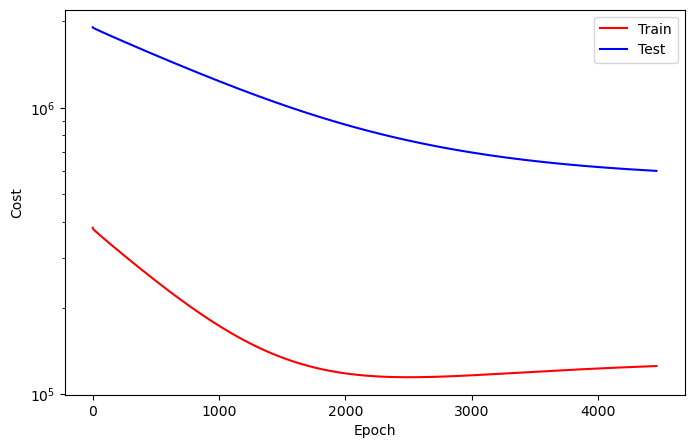

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4461
Train_cost  = 125554.2384 | Test_cost  = 601598.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4462
Train_cost  = 125558.8603 | Test_cost  = 601565.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4463
Train_cost  = 125563.4606 | Test_cost  = 601532.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4464
Train_cost  = 125568.0633 | Test_cost  = 601499.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4465
Train_cost  = 125572.6713 | Test_cost  = 601466.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4466
Train_cost  = 125577.2716 | Test_cost  = 601433.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4467
Train_cost  = 125581.8789 | Test_cost  = 601400.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4468
Train_cost  = 125586.5139 | Test_cost  = 601368.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4469
Train_cost  = 125591.1011 | Test_cost  = 601335.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4470
Train_cost  = 125595.6991 | Test_cost  = 601302.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4471
Train_cost  = 125600.3063 | Test_cost  = 601269.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4472
Train_cost  = 125604.9028 | Test_cost  = 601236.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4473
Train_cost  = 125609.5154 | Test_cost  = 601203.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4474
Train_cost  = 125614.1142 | Test_cost  = 601170.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4475
Train_cost  = 125618.6998 | Test_cost  = 601137.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4476
Train_cost  = 125623.3148 | Test_cost  = 601104.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4477
Train_cost  = 125627.9522 | Test_cost  = 601071.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4478
Train_cost  = 125632.5448 | Test_cost  = 601039.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4479
Train_cost  = 125637.1427 | Test_cost  = 601006.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4480
Train_cost  = 125641.7515 | Test_cost  = 600973.6750 | 


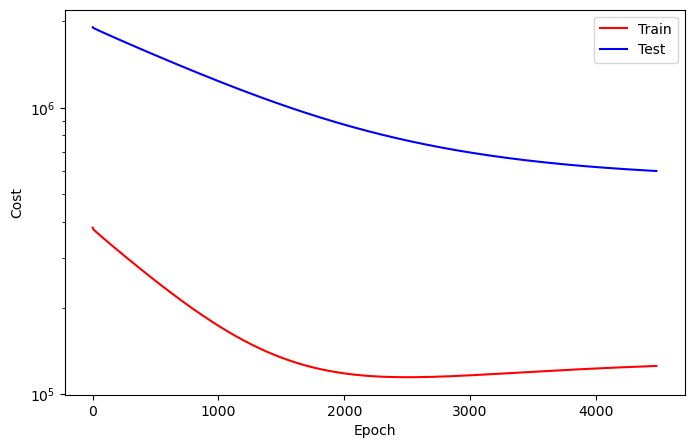

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4481
Train_cost  = 125646.2924 | Test_cost  = 600941.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4482
Train_cost  = 125650.8611 | Test_cost  = 600908.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4483
Train_cost  = 125655.4028 | Test_cost  = 600876.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4484
Train_cost  = 125659.9552 | Test_cost  = 600843.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4485
Train_cost  = 125664.5085 | Test_cost  = 600811.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4486
Train_cost  = 125669.0386 | Test_cost  = 600778.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4487
Train_cost  = 125673.5949 | Test_cost  = 600746.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4488
Train_cost  = 125678.1559 | Test_cost  = 600714.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4489
Train_cost  = 125682.7022 | Test_cost  = 600681.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4490
Train_cost  = 125687.2431 | Test_cost  = 600649.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4491
Train_cost  = 125691.7600 | Test_cost  = 600617.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4492
Train_cost  = 125696.3164 | Test_cost  = 600585.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4493
Train_cost  = 125700.8349 | Test_cost  = 600552.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4494
Train_cost  = 125705.3796 | Test_cost  = 600520.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4495
Train_cost  = 125709.9321 | Test_cost  = 600488.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4496
Train_cost  = 125714.4753 | Test_cost  = 600456.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4497
Train_cost  = 125719.0224 | Test_cost  = 600423.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4498
Train_cost  = 125723.5517 | Test_cost  = 600391.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4499
Train_cost  = 125728.0895 | Test_cost  = 600359.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4500
Train_cost  = 125732.6281 | Test_cost  = 600326.9000 | 


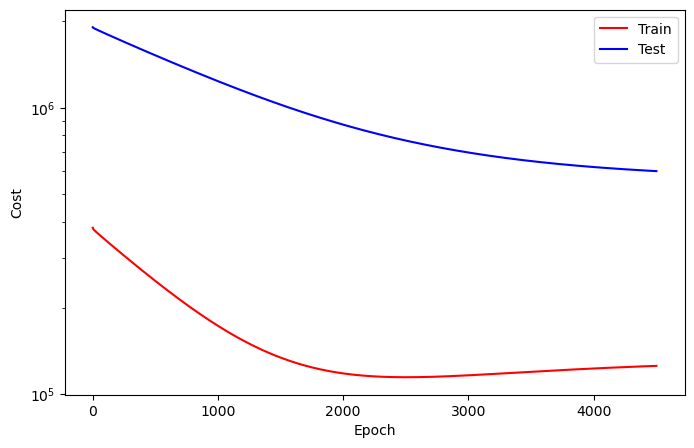

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4501
Train_cost  = 125737.2045 | Test_cost  = 600294.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4502
Train_cost  = 125741.7045 | Test_cost  = 600262.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4503
Train_cost  = 125746.2076 | Test_cost  = 600230.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4504
Train_cost  = 125750.7415 | Test_cost  = 600198.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4505
Train_cost  = 125755.2261 | Test_cost  = 600166.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4506
Train_cost  = 125759.7261 | Test_cost  = 600135.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4507
Train_cost  = 125764.1906 | Test_cost  = 600103.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4508
Train_cost  = 125768.6944 | Test_cost  = 600071.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4509
Train_cost  = 125773.1636 | Test_cost  = 600039.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4510
Train_cost  = 125777.6543 | Test_cost  = 600008.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4511
Train_cost  = 125782.1397 | Test_cost  = 599976.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4512
Train_cost  = 125786.6003 | Test_cost  = 599944.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4513
Train_cost  = 125791.0872 | Test_cost  = 599913.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4514
Train_cost  = 125795.5540 | Test_cost  = 599881.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4515
Train_cost  = 125800.0347 | Test_cost  = 599849.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4516
Train_cost  = 125804.5046 | Test_cost  = 599818.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4517
Train_cost  = 125808.9861 | Test_cost  = 599786.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4518
Train_cost  = 125813.4622 | Test_cost  = 599754.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4519
Train_cost  = 125817.9159 | Test_cost  = 599723.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4520
Train_cost  = 125822.3719 | Test_cost  = 599691.6500 | 


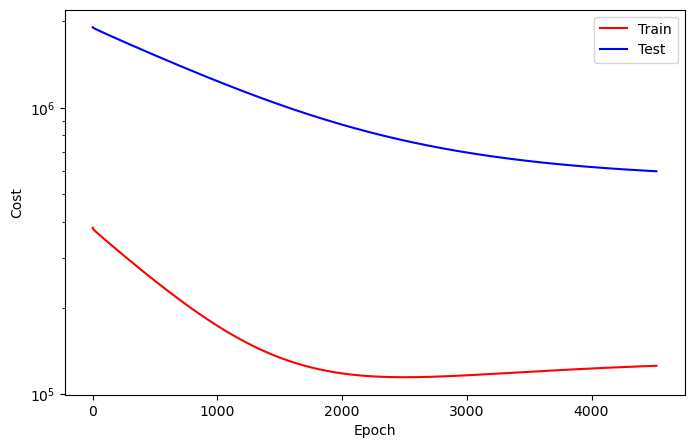

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4521
Train_cost  = 125826.8611 | Test_cost  = 599660.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4522
Train_cost  = 125831.3457 | Test_cost  = 599628.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4523
Train_cost  = 125835.8472 | Test_cost  = 599596.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4524
Train_cost  = 125840.2940 | Test_cost  = 599565.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4525
Train_cost  = 125844.7608 | Test_cost  = 599533.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4526
Train_cost  = 125849.2230 | Test_cost  = 599502.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4527
Train_cost  = 125853.6620 | Test_cost  = 599471.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4528
Train_cost  = 125858.0988 | Test_cost  = 599439.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4529
Train_cost  = 125862.5301 | Test_cost  = 599408.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4530
Train_cost  = 125866.9583 | Test_cost  = 599377.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4531
Train_cost  = 125871.3835 | Test_cost  = 599346.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4532
Train_cost  = 125875.7909 | Test_cost  = 599315.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4533
Train_cost  = 125880.2106 | Test_cost  = 599283.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4534
Train_cost  = 125884.6620 | Test_cost  = 599252.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4535
Train_cost  = 125889.0625 | Test_cost  = 599221.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4536
Train_cost  = 125893.4552 | Test_cost  = 599190.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4537
Train_cost  = 125897.8634 | Test_cost  = 599159.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4538
Train_cost  = 125902.2701 | Test_cost  = 599128.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4539
Train_cost  = 125906.6705 | Test_cost  = 599097.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4540
Train_cost  = 125911.0818 | Test_cost  = 599066.7000 | 


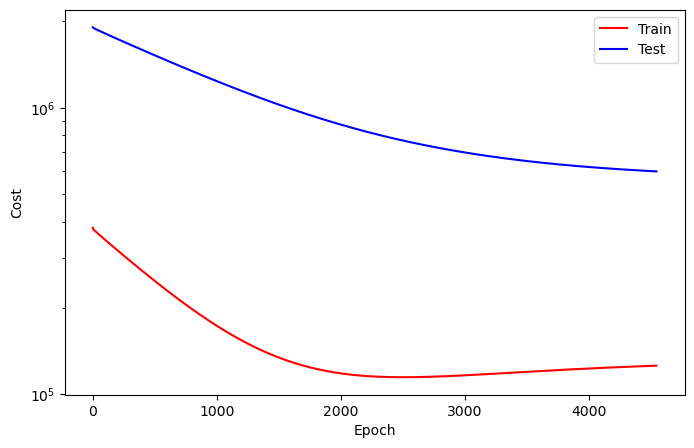

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4541
Train_cost  = 125915.5046 | Test_cost  = 599035.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4542
Train_cost  = 125919.9298 | Test_cost  = 599004.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4543
Train_cost  = 125924.3256 | Test_cost  = 598973.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4544
Train_cost  = 125928.7608 | Test_cost  = 598942.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4545
Train_cost  = 125933.1590 | Test_cost  = 598911.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4546
Train_cost  = 125937.5671 | Test_cost  = 598880.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4547
Train_cost  = 125941.9985 | Test_cost  = 598849.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4548
Train_cost  = 125946.3819 | Test_cost  = 598818.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4549
Train_cost  = 125950.7901 | Test_cost  = 598787.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4550
Train_cost  = 125955.1991 | Test_cost  = 598756.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4551
Train_cost  = 125959.5926 | Test_cost  = 598726.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4552
Train_cost  = 125963.9591 | Test_cost  = 598695.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4553
Train_cost  = 125968.3395 | Test_cost  = 598664.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4554
Train_cost  = 125972.7022 | Test_cost  = 598634.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4555
Train_cost  = 125977.0779 | Test_cost  = 598603.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4556
Train_cost  = 125981.4236 | Test_cost  = 598573.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4557
Train_cost  = 125985.7886 | Test_cost  = 598542.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4558
Train_cost  = 125990.1335 | Test_cost  = 598512.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4559
Train_cost  = 125994.5000 | Test_cost  = 598481.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4560
Train_cost  = 125998.8056 | Test_cost  = 598451.3250 | 


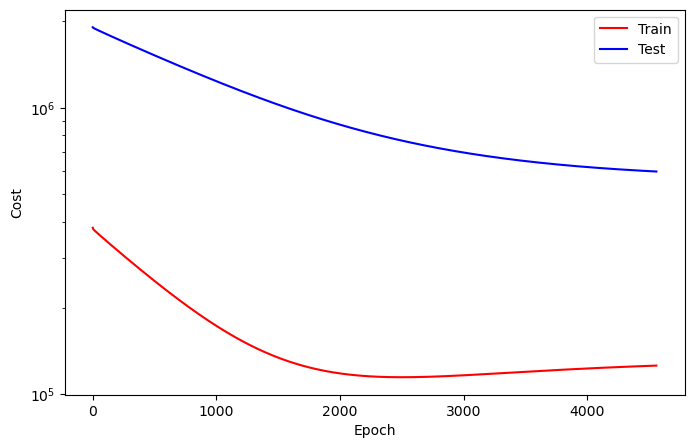

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4561
Train_cost  = 126003.1551 | Test_cost  = 598420.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4562
Train_cost  = 126007.5123 | Test_cost  = 598390.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4563
Train_cost  = 126011.8634 | Test_cost  = 598360.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4564
Train_cost  = 126016.2176 | Test_cost  = 598329.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4565
Train_cost  = 126020.5455 | Test_cost  = 598299.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4566
Train_cost  = 126024.9151 | Test_cost  = 598268.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4567
Train_cost  = 126029.2338 | Test_cost  = 598238.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4568
Train_cost  = 126033.6119 | Test_cost  = 598207.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4569
Train_cost  = 126037.9483 | Test_cost  = 598177.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4570
Train_cost  = 126042.3140 | Test_cost  = 598147.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4571
Train_cost  = 126046.6381 | Test_cost  = 598116.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4572
Train_cost  = 126050.9985 | Test_cost  = 598086.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4573
Train_cost  = 126055.3326 | Test_cost  = 598056.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4574
Train_cost  = 126059.6574 | Test_cost  = 598026.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4575
Train_cost  = 126063.9622 | Test_cost  = 597996.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4576
Train_cost  = 126068.2708 | Test_cost  = 597966.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4577
Train_cost  = 126072.5764 | Test_cost  = 597936.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4578
Train_cost  = 126076.8850 | Test_cost  = 597906.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4579
Train_cost  = 126081.1736 | Test_cost  = 597876.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4580
Train_cost  = 126085.4414 | Test_cost  = 597846.3750 | 


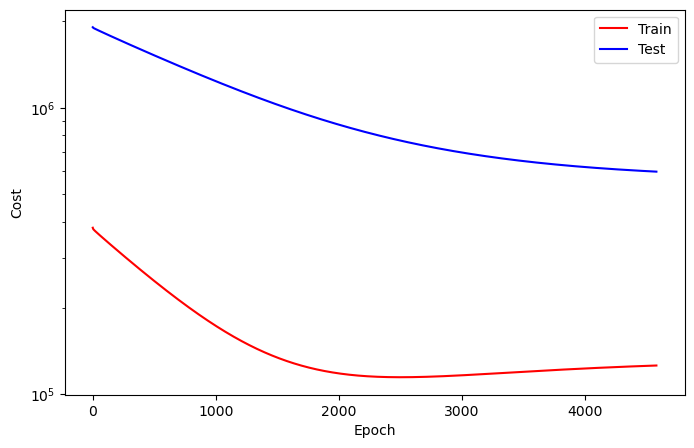

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4581
Train_cost  = 126089.7631 | Test_cost  = 597816.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4582
Train_cost  = 126094.0077 | Test_cost  = 597786.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4583
Train_cost  = 126098.3048 | Test_cost  = 597757.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4584
Train_cost  = 126102.5656 | Test_cost  = 597727.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4585
Train_cost  = 126106.8557 | Test_cost  = 597697.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4586
Train_cost  = 126111.1343 | Test_cost  = 597667.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4587
Train_cost  = 126115.4066 | Test_cost  = 597637.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4588
Train_cost  = 126119.6867 | Test_cost  = 597608.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4589
Train_cost  = 126123.9421 | Test_cost  = 597578.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4590
Train_cost  = 126128.2353 | Test_cost  = 597548.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4591
Train_cost  = 126132.5231 | Test_cost  = 597518.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4592
Train_cost  = 126136.7778 | Test_cost  = 597488.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4593
Train_cost  = 126141.0725 | Test_cost  = 597459.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4594
Train_cost  = 126145.3372 | Test_cost  = 597429.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4595
Train_cost  = 126149.6590 | Test_cost  = 597399.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4596
Train_cost  = 126153.9182 | Test_cost  = 597370.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4597
Train_cost  = 126158.1535 | Test_cost  = 597340.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4598
Train_cost  = 126162.3974 | Test_cost  = 597310.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4599
Train_cost  = 126166.6651 | Test_cost  = 597281.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4600
Train_cost  = 126170.8997 | Test_cost  = 597252.2000 | 


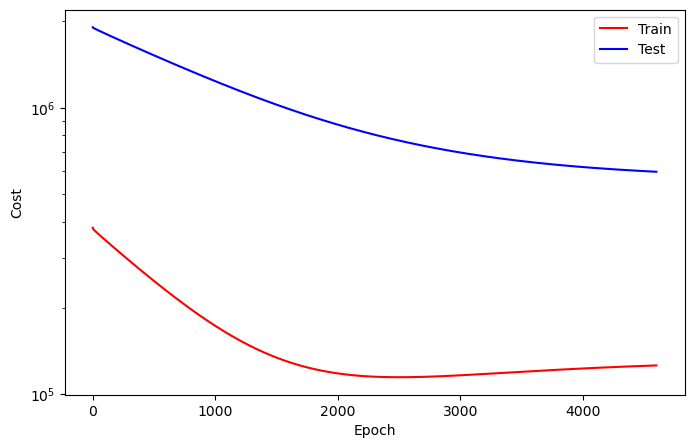

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4601
Train_cost  = 126175.1227 | Test_cost  = 597222.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4602
Train_cost  = 126179.3873 | Test_cost  = 597193.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4603
Train_cost  = 126183.5980 | Test_cost  = 597164.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4604
Train_cost  = 126187.8287 | Test_cost  = 597134.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4605
Train_cost  = 126192.0625 | Test_cost  = 597105.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4606
Train_cost  = 126196.2724 | Test_cost  = 597076.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4607
Train_cost  = 126200.4846 | Test_cost  = 597047.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4608
Train_cost  = 126204.6944 | Test_cost  = 597018.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4609
Train_cost  = 126208.8812 | Test_cost  = 596988.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4610
Train_cost  = 126213.0988 | Test_cost  = 596959.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4611
Train_cost  = 126217.3133 | Test_cost  = 596930.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4612
Train_cost  = 126221.5255 | Test_cost  = 596901.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4613
Train_cost  = 126225.7323 | Test_cost  = 596872.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4614
Train_cost  = 126229.9398 | Test_cost  = 596843.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4615
Train_cost  = 126234.1559 | Test_cost  = 596813.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4616
Train_cost  = 126238.3665 | Test_cost  = 596784.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4617
Train_cost  = 126242.5795 | Test_cost  = 596755.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4618
Train_cost  = 126246.7701 | Test_cost  = 596726.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4619
Train_cost  = 126250.9869 | Test_cost  = 596697.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4620
Train_cost  = 126255.1929 | Test_cost  = 596668.3750 | 


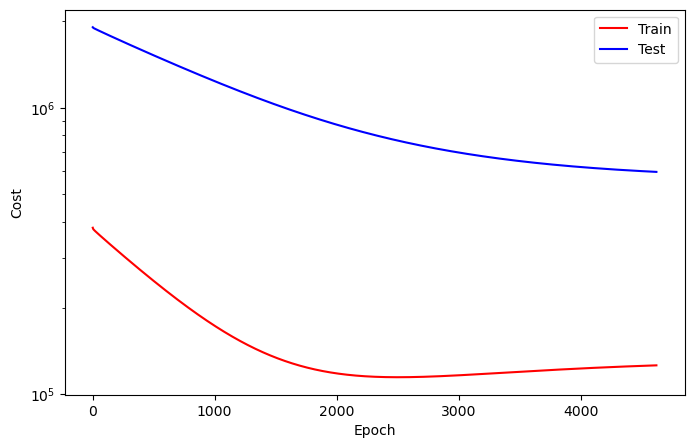

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4621
Train_cost  = 126259.3935 | Test_cost  = 596639.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4622
Train_cost  = 126263.6096 | Test_cost  = 596610.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4623
Train_cost  = 126267.7801 | Test_cost  = 596581.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4624
Train_cost  = 126271.9676 | Test_cost  = 596552.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4625
Train_cost  = 126276.1489 | Test_cost  = 596523.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4626
Train_cost  = 126280.3194 | Test_cost  = 596494.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4627
Train_cost  = 126284.5085 | Test_cost  = 596466.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4628
Train_cost  = 126288.6644 | Test_cost  = 596437.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4629
Train_cost  = 126292.8619 | Test_cost  = 596408.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4630
Train_cost  = 126297.0054 | Test_cost  = 596380.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4631
Train_cost  = 126301.1335 | Test_cost  = 596351.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4632
Train_cost  = 126305.2623 | Test_cost  = 596322.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4633
Train_cost  = 126309.4259 | Test_cost  = 596294.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4634
Train_cost  = 126313.5617 | Test_cost  = 596265.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4635
Train_cost  = 126317.6937 | Test_cost  = 596237.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4636
Train_cost  = 126321.8395 | Test_cost  = 596208.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4637
Train_cost  = 126325.9823 | Test_cost  = 596180.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4638
Train_cost  = 126330.1188 | Test_cost  = 596151.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4639
Train_cost  = 126334.2662 | Test_cost  = 596123.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4640
Train_cost  = 126338.4012 | Test_cost  = 596094.7000 | 


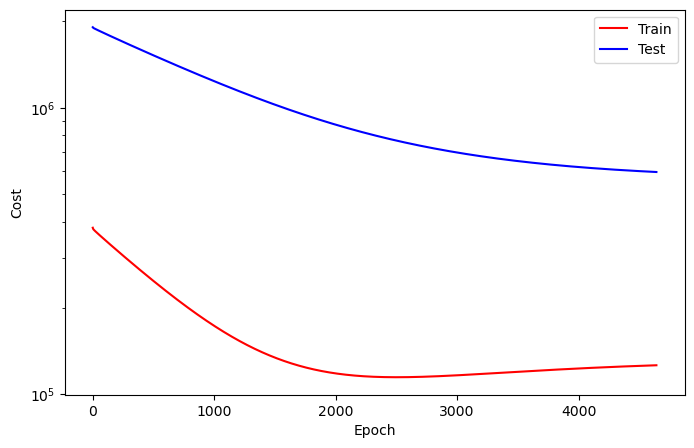

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4641
Train_cost  = 126342.5556 | Test_cost  = 596066.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4642
Train_cost  = 126346.6975 | Test_cost  = 596037.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4643
Train_cost  = 126350.8503 | Test_cost  = 596009.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4644
Train_cost  = 126355.0023 | Test_cost  = 595980.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4645
Train_cost  = 126359.1435 | Test_cost  = 595952.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4646
Train_cost  = 126363.2762 | Test_cost  = 595923.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4647
Train_cost  = 126367.4066 | Test_cost  = 595895.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4648
Train_cost  = 126371.5332 | Test_cost  = 595867.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4649
Train_cost  = 126375.6196 | Test_cost  = 595838.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4650
Train_cost  = 126379.7577 | Test_cost  = 595810.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4651
Train_cost  = 126383.8750 | Test_cost  = 595782.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4652
Train_cost  = 126387.9753 | Test_cost  = 595754.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4653
Train_cost  = 126392.0741 | Test_cost  = 595725.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4654
Train_cost  = 126396.2137 | Test_cost  = 595697.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4655
Train_cost  = 126400.3125 | Test_cost  = 595669.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4656
Train_cost  = 126404.3958 | Test_cost  = 595641.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4657
Train_cost  = 126408.4599 | Test_cost  = 595613.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4658
Train_cost  = 126412.5332 | Test_cost  = 595585.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4659
Train_cost  = 126416.5972 | Test_cost  = 595557.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4660
Train_cost  = 126420.6975 | Test_cost  = 595529.8000 | 


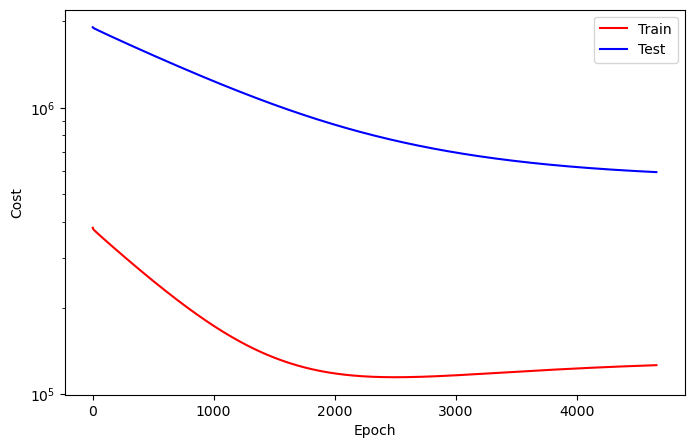

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4661
Train_cost  = 126424.7716 | Test_cost  = 595501.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4662
Train_cost  = 126428.8233 | Test_cost  = 595473.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4663
Train_cost  = 126432.9437 | Test_cost  = 595445.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4664
Train_cost  = 126437.0077 | Test_cost  = 595418.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4665
Train_cost  = 126441.0748 | Test_cost  = 595390.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4666
Train_cost  = 126445.1620 | Test_cost  = 595362.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4667
Train_cost  = 126449.2330 | Test_cost  = 595334.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4668
Train_cost  = 126453.3457 | Test_cost  = 595306.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4669
Train_cost  = 126457.4167 | Test_cost  = 595278.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4670
Train_cost  = 126461.4938 | Test_cost  = 595250.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4671
Train_cost  = 126465.5448 | Test_cost  = 595222.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4672
Train_cost  = 126469.6343 | Test_cost  = 595194.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4673
Train_cost  = 126473.6937 | Test_cost  = 595166.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4674
Train_cost  = 126477.7670 | Test_cost  = 595139.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4675
Train_cost  = 126481.8086 | Test_cost  = 595111.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4676
Train_cost  = 126485.8796 | Test_cost  = 595083.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4677
Train_cost  = 126489.9051 | Test_cost  = 595056.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4678
Train_cost  = 126493.9637 | Test_cost  = 595028.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4679
Train_cost  = 126498.0116 | Test_cost  = 595000.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4680
Train_cost  = 126502.0926 | Test_cost  = 594973.1500 | 


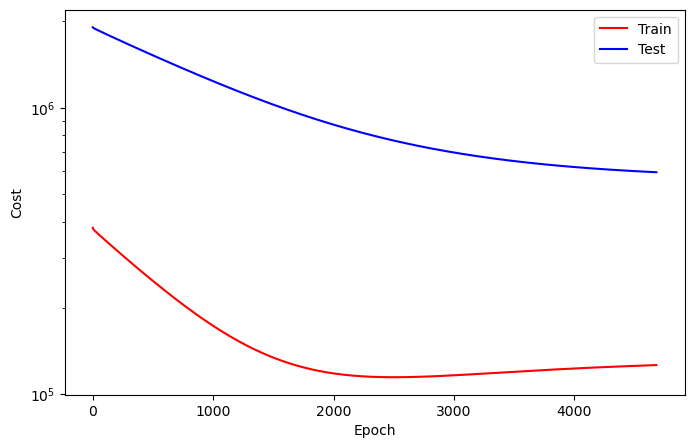

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4681
Train_cost  = 126506.1165 | Test_cost  = 594945.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4682
Train_cost  = 126510.1559 | Test_cost  = 594918.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4683
Train_cost  = 126514.1350 | Test_cost  = 594890.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4684
Train_cost  = 126518.1535 | Test_cost  = 594863.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4685
Train_cost  = 126522.1790 | Test_cost  = 594836.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4686
Train_cost  = 126526.1752 | Test_cost  = 594808.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4687
Train_cost  = 126530.1921 | Test_cost  = 594781.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4688
Train_cost  = 126534.2431 | Test_cost  = 594754.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4689
Train_cost  = 126538.2168 | Test_cost  = 594726.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4690
Train_cost  = 126542.2361 | Test_cost  = 594699.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4691
Train_cost  = 126546.2778 | Test_cost  = 594671.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4692
Train_cost  = 126550.2701 | Test_cost  = 594644.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4693
Train_cost  = 126554.2978 | Test_cost  = 594616.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4694
Train_cost  = 126558.3287 | Test_cost  = 594589.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4695
Train_cost  = 126562.3179 | Test_cost  = 594562.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4696
Train_cost  = 126566.3665 | Test_cost  = 594534.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4697
Train_cost  = 126570.3765 | Test_cost  = 594507.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4698
Train_cost  = 126574.3812 | Test_cost  = 594480.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4699
Train_cost  = 126578.3873 | Test_cost  = 594453.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4700
Train_cost  = 126582.3927 | Test_cost  = 594426.0500 | 


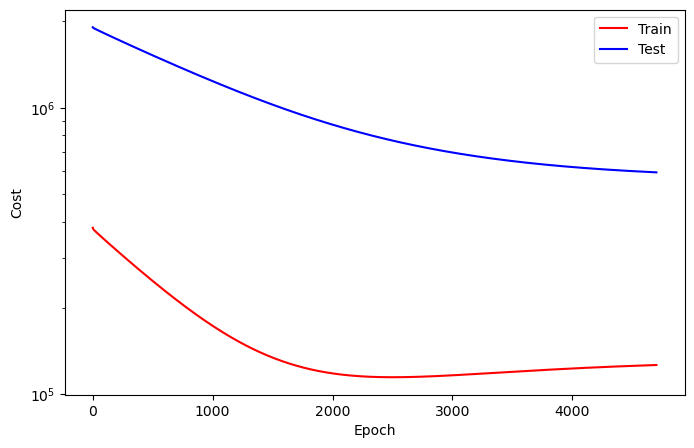

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4701
Train_cost  = 126586.3488 | Test_cost  = 594398.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4702
Train_cost  = 126590.3603 | Test_cost  = 594371.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4703
Train_cost  = 126594.3596 | Test_cost  = 594344.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4704
Train_cost  = 126598.3326 | Test_cost  = 594317.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4705
Train_cost  = 126602.3102 | Test_cost  = 594290.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4706
Train_cost  = 126606.2963 | Test_cost  = 594263.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4707
Train_cost  = 126610.2662 | Test_cost  = 594236.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4708
Train_cost  = 126614.2338 | Test_cost  = 594209.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4709
Train_cost  = 126618.2029 | Test_cost  = 594182.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4710
Train_cost  = 126622.1211 | Test_cost  = 594156.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4711
Train_cost  = 126626.0648 | Test_cost  = 594129.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4712
Train_cost  = 126630.0316 | Test_cost  = 594102.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4713
Train_cost  = 126633.9792 | Test_cost  = 594075.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4714
Train_cost  = 126637.9144 | Test_cost  = 594049.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4715
Train_cost  = 126641.8434 | Test_cost  = 594022.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4716
Train_cost  = 126645.8179 | Test_cost  = 593995.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4717
Train_cost  = 126649.7431 | Test_cost  = 593968.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4718
Train_cost  = 126653.6960 | Test_cost  = 593942.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4719
Train_cost  = 126657.6412 | Test_cost  = 593915.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4720
Train_cost  = 126661.5725 | Test_cost  = 593888.4250 | 


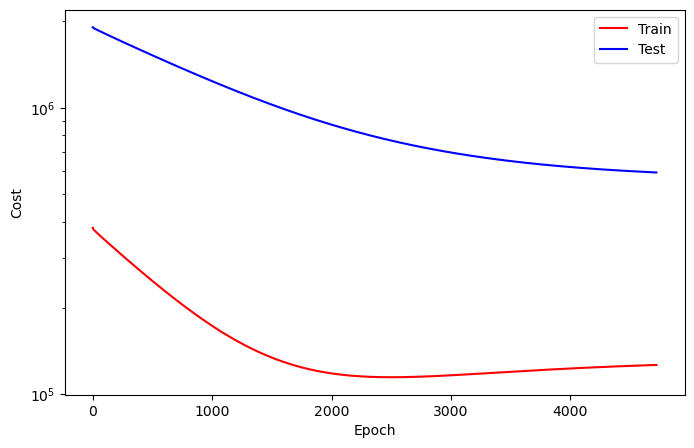

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4721
Train_cost  = 126665.5262 | Test_cost  = 593861.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4722
Train_cost  = 126669.4753 | Test_cost  = 593834.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4723
Train_cost  = 126673.4421 | Test_cost  = 593808.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4724
Train_cost  = 126677.3534 | Test_cost  = 593781.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4725
Train_cost  = 126681.2971 | Test_cost  = 593755.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4726
Train_cost  = 126685.2269 | Test_cost  = 593728.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4727
Train_cost  = 126689.1543 | Test_cost  = 593702.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4728
Train_cost  = 126693.0571 | Test_cost  = 593675.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4729
Train_cost  = 126696.9853 | Test_cost  = 593648.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4730
Train_cost  = 126700.9082 | Test_cost  = 593622.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4731
Train_cost  = 126704.8310 | Test_cost  = 593596.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4732
Train_cost  = 126708.7230 | Test_cost  = 593569.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4733
Train_cost  = 126712.6127 | Test_cost  = 593543.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4734
Train_cost  = 126716.5255 | Test_cost  = 593517.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4735
Train_cost  = 126720.4236 | Test_cost  = 593490.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4736
Train_cost  = 126724.3225 | Test_cost  = 593464.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4737
Train_cost  = 126728.1644 | Test_cost  = 593438.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4738
Train_cost  = 126732.0610 | Test_cost  = 593412.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4739
Train_cost  = 126735.9390 | Test_cost  = 593386.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4740
Train_cost  = 126739.8110 | Test_cost  = 593360.0250 | 


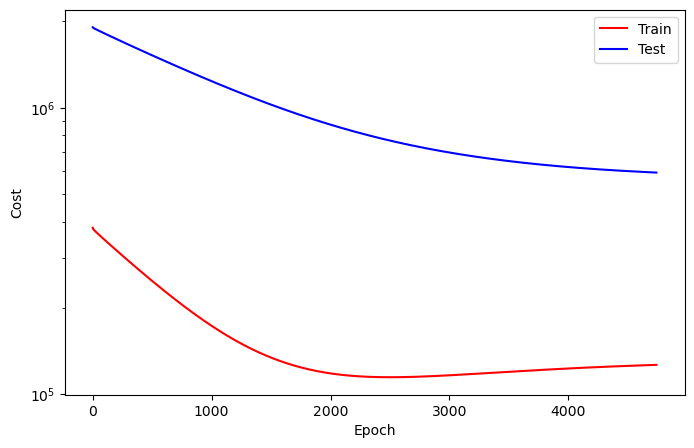

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4741
Train_cost  = 126743.6667 | Test_cost  = 593333.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4742
Train_cost  = 126747.5201 | Test_cost  = 593307.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4743
Train_cost  = 126751.3796 | Test_cost  = 593281.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4744
Train_cost  = 126755.2654 | Test_cost  = 593255.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4745
Train_cost  = 126759.1574 | Test_cost  = 593229.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4746
Train_cost  = 126763.0054 | Test_cost  = 593203.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4747
Train_cost  = 126766.8912 | Test_cost  = 593177.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4748
Train_cost  = 126770.7454 | Test_cost  = 593151.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4749
Train_cost  = 126774.6296 | Test_cost  = 593124.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4750
Train_cost  = 126778.4923 | Test_cost  = 593098.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4751
Train_cost  = 126782.3642 | Test_cost  = 593072.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4752
Train_cost  = 126786.2261 | Test_cost  = 593047.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4753
Train_cost  = 126790.0772 | Test_cost  = 593021.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4754
Train_cost  = 126793.9144 | Test_cost  = 592995.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4755
Train_cost  = 126797.7384 | Test_cost  = 592969.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4756
Train_cost  = 126801.6065 | Test_cost  = 592943.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4757
Train_cost  = 126805.4491 | Test_cost  = 592917.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4758
Train_cost  = 126809.3125 | Test_cost  = 592891.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4759
Train_cost  = 126813.1566 | Test_cost  = 592866.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4760
Train_cost  = 126816.9776 | Test_cost  = 592840.2250 | 


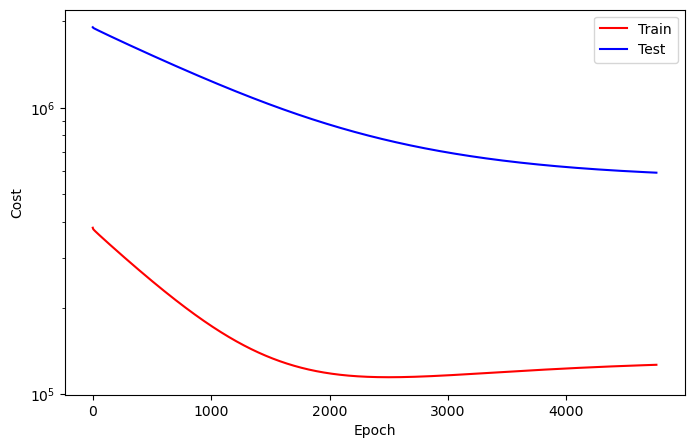

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4761
Train_cost  = 126820.7832 | Test_cost  = 592814.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4762
Train_cost  = 126824.5926 | Test_cost  = 592788.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4763
Train_cost  = 126828.4722 | Test_cost  = 592763.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4764
Train_cost  = 126832.2731 | Test_cost  = 592737.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4765
Train_cost  = 126836.1011 | Test_cost  = 592711.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4766
Train_cost  = 126839.9120 | Test_cost  = 592686.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4767
Train_cost  = 126843.6898 | Test_cost  = 592660.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4768
Train_cost  = 126847.4977 | Test_cost  = 592635.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4769
Train_cost  = 126851.2932 | Test_cost  = 592609.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4770
Train_cost  = 126855.0918 | Test_cost  = 592584.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4771
Train_cost  = 126858.8912 | Test_cost  = 592558.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4772
Train_cost  = 126862.6975 | Test_cost  = 592533.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4773
Train_cost  = 126866.4961 | Test_cost  = 592507.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4774
Train_cost  = 126870.3002 | Test_cost  = 592482.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4775
Train_cost  = 126874.0995 | Test_cost  = 592456.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4776
Train_cost  = 126877.9012 | Test_cost  = 592431.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4777
Train_cost  = 126881.7222 | Test_cost  = 592405.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4778
Train_cost  = 126885.4954 | Test_cost  = 592380.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4779
Train_cost  = 126889.2855 | Test_cost  = 592354.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4780
Train_cost  = 126893.0957 | Test_cost  = 592329.2500 | 


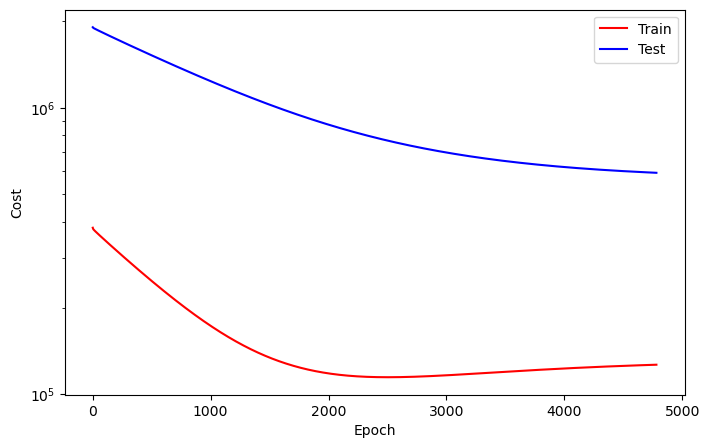

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4781
Train_cost  = 126896.8619 | Test_cost  = 592304.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4782
Train_cost  = 126900.6397 | Test_cost  = 592278.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4783
Train_cost  = 126904.4259 | Test_cost  = 592253.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4784
Train_cost  = 126908.2076 | Test_cost  = 592228.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4785
Train_cost  = 126911.9807 | Test_cost  = 592202.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4786
Train_cost  = 126915.7438 | Test_cost  = 592177.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4787
Train_cost  = 126919.5417 | Test_cost  = 592152.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4788
Train_cost  = 126923.2940 | Test_cost  = 592127.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4789
Train_cost  = 126927.0525 | Test_cost  = 592102.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4790
Train_cost  = 126930.7809 | Test_cost  = 592077.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4791
Train_cost  = 126934.5633 | Test_cost  = 592051.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4792
Train_cost  = 126938.3117 | Test_cost  = 592026.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4793
Train_cost  = 126942.0517 | Test_cost  = 592001.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4794
Train_cost  = 126945.8133 | Test_cost  = 591976.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4795
Train_cost  = 126949.5324 | Test_cost  = 591951.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4796
Train_cost  = 126953.2662 | Test_cost  = 591926.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4797
Train_cost  = 126957.0054 | Test_cost  = 591901.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4798
Train_cost  = 126960.7562 | Test_cost  = 591876.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4799
Train_cost  = 126964.4900 | Test_cost  = 591851.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4800
Train_cost  = 126968.2052 | Test_cost  = 591827.0500 | 


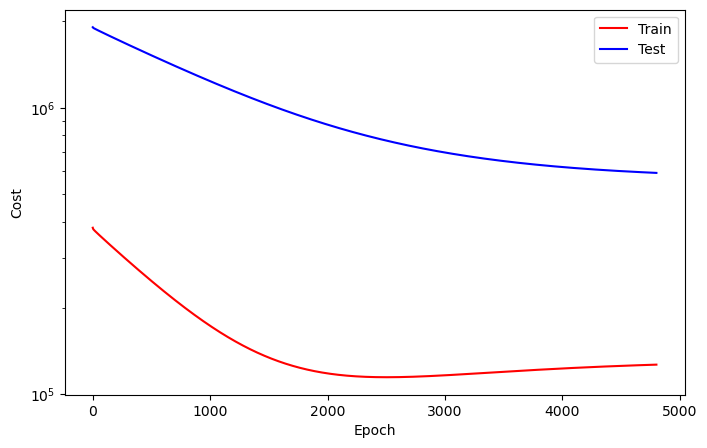

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4801
Train_cost  = 126971.9375 | Test_cost  = 591802.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4802
Train_cost  = 126975.6813 | Test_cost  = 591777.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4803
Train_cost  = 126979.4005 | Test_cost  = 591752.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4804
Train_cost  = 126983.1350 | Test_cost  = 591727.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4805
Train_cost  = 126986.8843 | Test_cost  = 591702.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4806
Train_cost  = 126990.6304 | Test_cost  = 591677.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4807
Train_cost  = 126994.3241 | Test_cost  = 591652.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4808
Train_cost  = 126998.0478 | Test_cost  = 591628.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4809
Train_cost  = 127001.7693 | Test_cost  = 591603.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4810
Train_cost  = 127005.4884 | Test_cost  = 591578.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4811
Train_cost  = 127009.1698 | Test_cost  = 591553.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4812
Train_cost  = 127012.8966 | Test_cost  = 591529.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4813
Train_cost  = 127016.6358 | Test_cost  = 591504.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4814
Train_cost  = 127020.3133 | Test_cost  = 591479.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4815
Train_cost  = 127024.0363 | Test_cost  = 591455.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4816
Train_cost  = 127027.7083 | Test_cost  = 591430.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4817
Train_cost  = 127031.4005 | Test_cost  = 591406.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4818
Train_cost  = 127035.0579 | Test_cost  = 591381.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4819
Train_cost  = 127038.7523 | Test_cost  = 591357.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4820
Train_cost  = 127042.4329 | Test_cost  = 591332.4250 | 


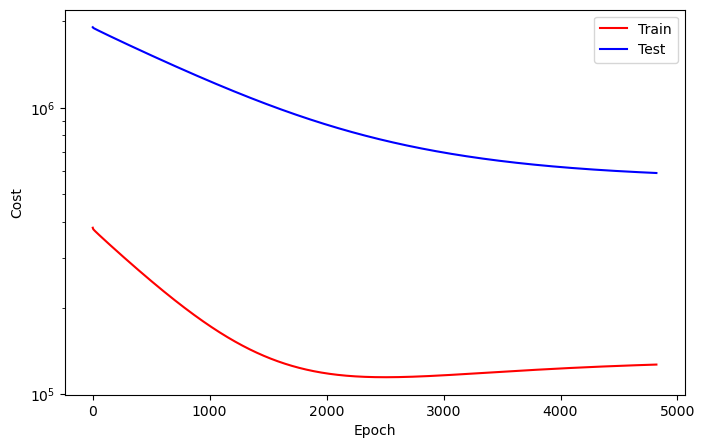

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4821
Train_cost  = 127046.1273 | Test_cost  = 591308.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4822
Train_cost  = 127049.7978 | Test_cost  = 591283.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4823
Train_cost  = 127053.4846 | Test_cost  = 591258.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4824
Train_cost  = 127057.1574 | Test_cost  = 591234.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4825
Train_cost  = 127060.8194 | Test_cost  = 591210.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4826
Train_cost  = 127064.4537 | Test_cost  = 591186.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4827
Train_cost  = 127068.1273 | Test_cost  = 591161.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4828
Train_cost  = 127071.7917 | Test_cost  = 591137.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4829
Train_cost  = 127075.4306 | Test_cost  = 591113.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4830
Train_cost  = 127079.0880 | Test_cost  = 591088.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4831
Train_cost  = 127082.7593 | Test_cost  = 591064.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4832
Train_cost  = 127086.4066 | Test_cost  = 591040.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4833
Train_cost  = 127090.0880 | Test_cost  = 591016.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4834
Train_cost  = 127093.7122 | Test_cost  = 590991.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4835
Train_cost  = 127097.3897 | Test_cost  = 590967.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4836
Train_cost  = 127101.0208 | Test_cost  = 590943.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4837
Train_cost  = 127104.6682 | Test_cost  = 590918.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4838
Train_cost  = 127108.3310 | Test_cost  = 590894.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4839
Train_cost  = 127111.9691 | Test_cost  = 590870.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4840
Train_cost  = 127115.5802 | Test_cost  = 590846.8000 | 


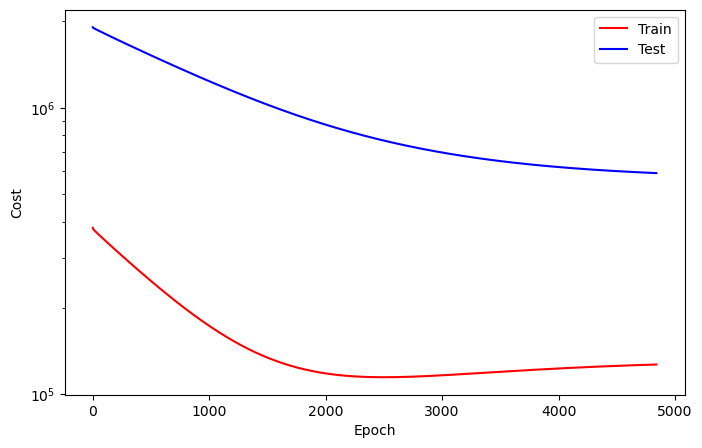

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4841
Train_cost  = 127119.2299 | Test_cost  = 590822.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4842
Train_cost  = 127122.8495 | Test_cost  = 590798.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4843
Train_cost  = 127126.4946 | Test_cost  = 590774.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4844
Train_cost  = 127130.1258 | Test_cost  = 590750.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4845
Train_cost  = 127133.7647 | Test_cost  = 590726.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4846
Train_cost  = 127137.3750 | Test_cost  = 590702.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4847
Train_cost  = 127140.9769 | Test_cost  = 590678.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4848
Train_cost  = 127144.5617 | Test_cost  = 590654.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4849
Train_cost  = 127148.1806 | Test_cost  = 590630.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4850
Train_cost  = 127151.8071 | Test_cost  = 590607.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4851
Train_cost  = 127155.3858 | Test_cost  = 590583.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4852
Train_cost  = 127158.9977 | Test_cost  = 590559.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4853
Train_cost  = 127162.6073 | Test_cost  = 590535.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4854
Train_cost  = 127166.2045 | Test_cost  = 590511.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4855
Train_cost  = 127169.8032 | Test_cost  = 590488.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4856
Train_cost  = 127173.3596 | Test_cost  = 590464.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4857
Train_cost  = 127176.9568 | Test_cost  = 590440.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4858
Train_cost  = 127180.5316 | Test_cost  = 590416.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4859
Train_cost  = 127184.1343 | Test_cost  = 590393.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4860
Train_cost  = 127187.7022 | Test_cost  = 590369.5750 | 


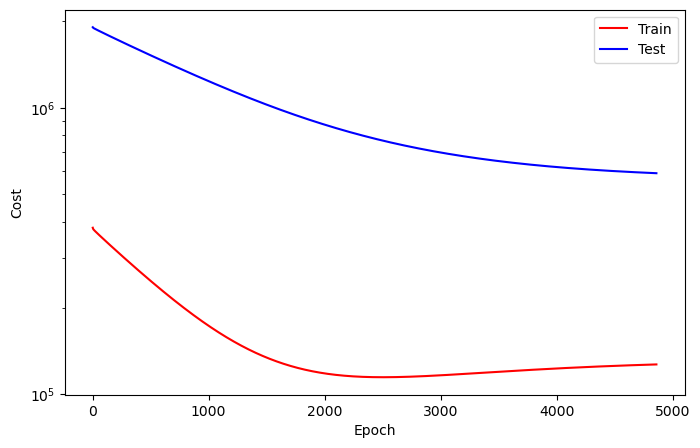

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4861
Train_cost  = 127191.2809 | Test_cost  = 590345.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4862
Train_cost  = 127194.8565 | Test_cost  = 590322.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4863
Train_cost  = 127198.4390 | Test_cost  = 590298.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4864
Train_cost  = 127202.0301 | Test_cost  = 590274.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4865
Train_cost  = 127205.6134 | Test_cost  = 590251.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4866
Train_cost  = 127209.2145 | Test_cost  = 590227.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4867
Train_cost  = 127212.7600 | Test_cost  = 590204.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4868
Train_cost  = 127216.3318 | Test_cost  = 590180.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4869
Train_cost  = 127219.8897 | Test_cost  = 590157.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4870
Train_cost  = 127223.4506 | Test_cost  = 590133.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4871
Train_cost  = 127227.0046 | Test_cost  = 590110.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4872
Train_cost  = 127230.5440 | Test_cost  = 590086.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4873
Train_cost  = 127234.1196 | Test_cost  = 590063.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4874
Train_cost  = 127237.7052 | Test_cost  = 590039.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4875
Train_cost  = 127241.2407 | Test_cost  = 590016.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4876
Train_cost  = 127244.7639 | Test_cost  = 589993.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4877
Train_cost  = 127248.3032 | Test_cost  = 589969.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4878
Train_cost  = 127251.8333 | Test_cost  = 589946.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4879
Train_cost  = 127255.3573 | Test_cost  = 589923.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4880
Train_cost  = 127258.9120 | Test_cost  = 589900.0750 | 


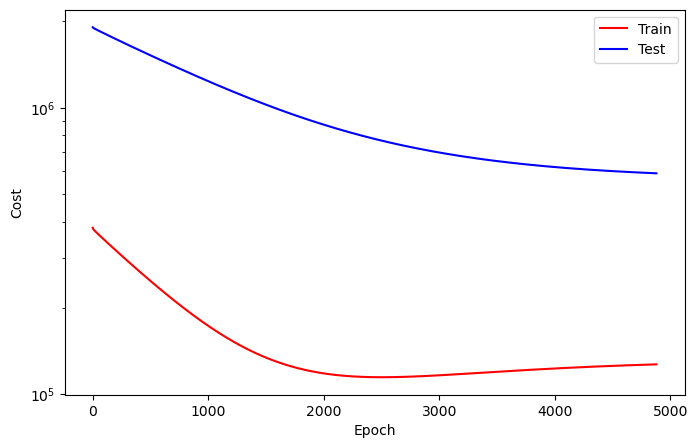

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4881
Train_cost  = 127262.4275 | Test_cost  = 589876.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4882
Train_cost  = 127265.9738 | Test_cost  = 589853.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4883
Train_cost  = 127269.5309 | Test_cost  = 589830.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4884
Train_cost  = 127273.0502 | Test_cost  = 589806.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4885
Train_cost  = 127276.5856 | Test_cost  = 589783.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4886
Train_cost  = 127280.0795 | Test_cost  = 589760.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4887
Train_cost  = 127283.6034 | Test_cost  = 589737.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4888
Train_cost  = 127287.1096 | Test_cost  = 589714.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4889
Train_cost  = 127290.6242 | Test_cost  = 589691.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4890
Train_cost  = 127294.1597 | Test_cost  = 589668.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4891
Train_cost  = 127297.6327 | Test_cost  = 589645.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4892
Train_cost  = 127301.1636 | Test_cost  = 589621.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4893
Train_cost  = 127304.6613 | Test_cost  = 589598.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4894
Train_cost  = 127308.1821 | Test_cost  = 589575.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4895
Train_cost  = 127311.7099 | Test_cost  = 589552.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4896
Train_cost  = 127315.1952 | Test_cost  = 589529.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4897
Train_cost  = 127318.7052 | Test_cost  = 589506.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4898
Train_cost  = 127322.2068 | Test_cost  = 589483.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4899
Train_cost  = 127325.7145 | Test_cost  = 589460.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4900
Train_cost  = 127329.1752 | Test_cost  = 589437.7000 | 


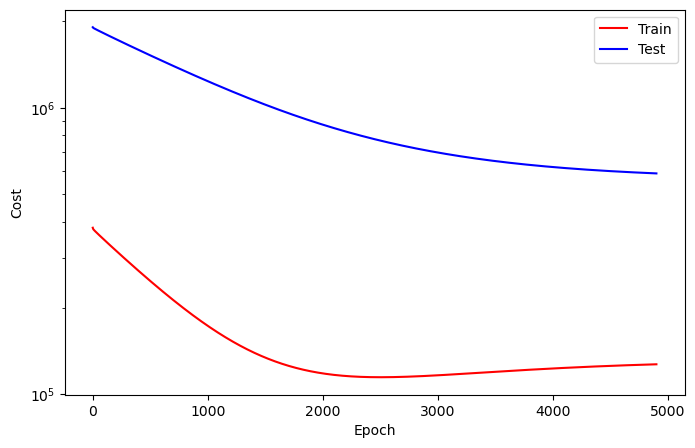

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4901
Train_cost  = 127332.6898 | Test_cost  = 589415.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4902
Train_cost  = 127336.1728 | Test_cost  = 589392.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4903
Train_cost  = 127339.6582 | Test_cost  = 589369.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4904
Train_cost  = 127343.1404 | Test_cost  = 589346.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4905
Train_cost  = 127346.6335 | Test_cost  = 589323.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4906
Train_cost  = 127350.1196 | Test_cost  = 589300.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4907
Train_cost  = 127353.5787 | Test_cost  = 589278.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4908
Train_cost  = 127357.0316 | Test_cost  = 589255.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4909
Train_cost  = 127360.5116 | Test_cost  = 589232.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4910
Train_cost  = 127363.9506 | Test_cost  = 589209.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4911
Train_cost  = 127367.4097 | Test_cost  = 589187.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4912
Train_cost  = 127370.8565 | Test_cost  = 589164.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4913
Train_cost  = 127374.3218 | Test_cost  = 589141.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4914
Train_cost  = 127377.7986 | Test_cost  = 589119.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4915
Train_cost  = 127381.2623 | Test_cost  = 589096.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4916
Train_cost  = 127384.7176 | Test_cost  = 589073.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4917
Train_cost  = 127388.1713 | Test_cost  = 589051.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4918
Train_cost  = 127391.6173 | Test_cost  = 589028.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4919
Train_cost  = 127395.0810 | Test_cost  = 589006.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4920
Train_cost  = 127398.5123 | Test_cost  = 588983.5500 | 


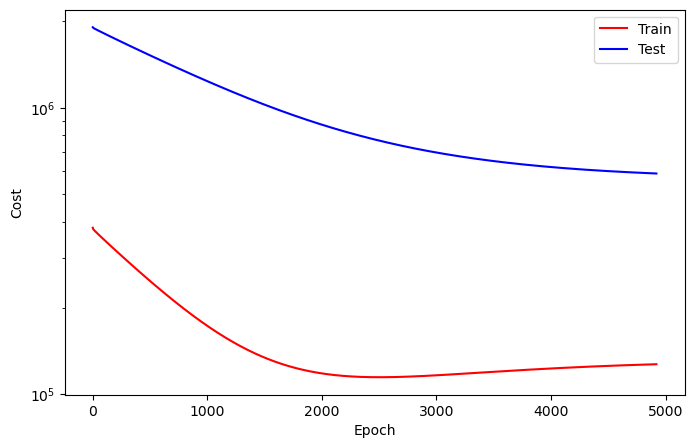

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4921
Train_cost  = 127401.9591 | Test_cost  = 588961.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4922
Train_cost  = 127405.3873 | Test_cost  = 588938.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4923
Train_cost  = 127408.8040 | Test_cost  = 588916.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4924
Train_cost  = 127412.2461 | Test_cost  = 588893.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4925
Train_cost  = 127415.6713 | Test_cost  = 588871.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4926
Train_cost  = 127419.1335 | Test_cost  = 588848.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4927
Train_cost  = 127422.5579 | Test_cost  = 588826.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4928
Train_cost  = 127425.9583 | Test_cost  = 588804.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4929
Train_cost  = 127429.4097 | Test_cost  = 588781.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4930
Train_cost  = 127432.7986 | Test_cost  = 588759.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4931
Train_cost  = 127436.2168 | Test_cost  = 588737.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4932
Train_cost  = 127439.6281 | Test_cost  = 588714.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4933
Train_cost  = 127443.0309 | Test_cost  = 588692.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4934
Train_cost  = 127446.4344 | Test_cost  = 588670.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4935
Train_cost  = 127449.8380 | Test_cost  = 588648.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4936
Train_cost  = 127453.2824 | Test_cost  = 588625.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4937
Train_cost  = 127456.6559 | Test_cost  = 588603.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4938
Train_cost  = 127460.0579 | Test_cost  = 588581.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4939
Train_cost  = 127463.4444 | Test_cost  = 588559.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4940
Train_cost  = 127466.8179 | Test_cost  = 588537.4500 | 


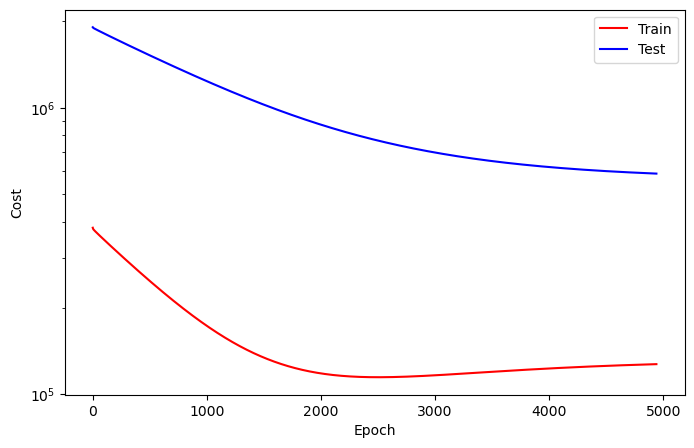

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4941
Train_cost  = 127470.2199 | Test_cost  = 588515.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4942
Train_cost  = 127473.5679 | Test_cost  = 588493.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4943
Train_cost  = 127476.9514 | Test_cost  = 588471.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4944
Train_cost  = 127480.3534 | Test_cost  = 588449.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4945
Train_cost  = 127483.7114 | Test_cost  = 588427.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4946
Train_cost  = 127487.0880 | Test_cost  = 588405.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4947
Train_cost  = 127490.4938 | Test_cost  = 588383.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4948
Train_cost  = 127493.8472 | Test_cost  = 588361.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4949
Train_cost  = 127497.2477 | Test_cost  = 588339.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4950
Train_cost  = 127500.5972 | Test_cost  = 588317.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4951
Train_cost  = 127503.9552 | Test_cost  = 588295.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4952
Train_cost  = 127507.3241 | Test_cost  = 588273.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4953
Train_cost  = 127510.6860 | Test_cost  = 588251.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4954
Train_cost  = 127514.0494 | Test_cost  = 588229.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4955
Train_cost  = 127517.4005 | Test_cost  = 588207.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4956
Train_cost  = 127520.7353 | Test_cost  = 588186.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4957
Train_cost  = 127524.1103 | Test_cost  = 588164.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4958
Train_cost  = 127527.4560 | Test_cost  = 588142.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4959
Train_cost  = 127530.8148 | Test_cost  = 588120.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4960
Train_cost  = 127534.1597 | Test_cost  = 588098.8000 | 


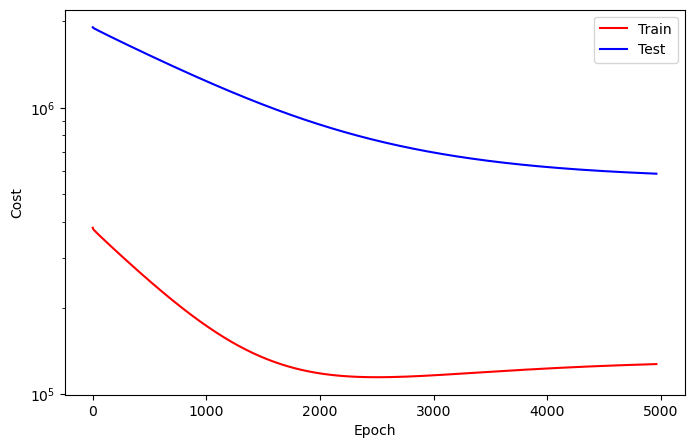

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4961
Train_cost  = 127537.4915 | Test_cost  = 588077.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4962
Train_cost  = 127540.8341 | Test_cost  = 588055.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4963
Train_cost  = 127544.1806 | Test_cost  = 588033.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4964
Train_cost  = 127547.4969 | Test_cost  = 588012.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4965
Train_cost  = 127550.8449 | Test_cost  = 587990.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4966
Train_cost  = 127554.1613 | Test_cost  = 587968.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4967
Train_cost  = 127557.4907 | Test_cost  = 587947.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4968
Train_cost  = 127560.8241 | Test_cost  = 587925.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4969
Train_cost  = 127564.1389 | Test_cost  = 587904.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4970
Train_cost  = 127567.4429 | Test_cost  = 587882.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4971
Train_cost  = 127570.7693 | Test_cost  = 587861.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4972
Train_cost  = 127574.0741 | Test_cost  = 587839.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4973
Train_cost  = 127577.3349 | Test_cost  = 587818.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4974
Train_cost  = 127580.6628 | Test_cost  = 587796.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4975
Train_cost  = 127583.9668 | Test_cost  = 587775.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4976
Train_cost  = 127587.2755 | Test_cost  = 587754.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4977
Train_cost  = 127590.5702 | Test_cost  = 587732.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4978
Train_cost  = 127593.8927 | Test_cost  = 587711.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4979
Train_cost  = 127597.1767 | Test_cost  = 587689.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4980
Train_cost  = 127600.4792 | Test_cost  = 587668.2000 | 


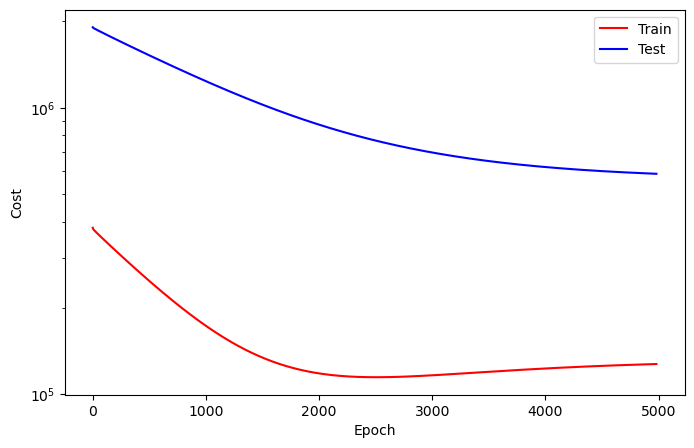

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4981
Train_cost  = 127603.8002 | Test_cost  = 587646.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4982
Train_cost  = 127607.0872 | Test_cost  = 587625.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4983
Train_cost  = 127610.3812 | Test_cost  = 587603.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4984
Train_cost  = 127613.7076 | Test_cost  = 587582.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4985
Train_cost  = 127616.9684 | Test_cost  = 587561.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4986
Train_cost  = 127620.2554 | Test_cost  = 587540.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4987
Train_cost  = 127623.5417 | Test_cost  = 587518.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4988
Train_cost  = 127626.8287 | Test_cost  = 587497.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4989
Train_cost  = 127630.1080 | Test_cost  = 587476.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4990
Train_cost  = 127633.3704 | Test_cost  = 587455.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4991
Train_cost  = 127636.6551 | Test_cost  = 587433.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4992
Train_cost  = 127639.9421 | Test_cost  = 587412.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4993
Train_cost  = 127643.2160 | Test_cost  = 587391.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4994
Train_cost  = 127646.4869 | Test_cost  = 587370.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4995
Train_cost  = 127649.7523 | Test_cost  = 587349.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4996
Train_cost  = 127653.0316 | Test_cost  = 587328.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4997
Train_cost  = 127656.2770 | Test_cost  = 587306.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4998
Train_cost  = 127659.5278 | Test_cost  = 587285.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  4999
Train_cost  = 127662.7847 | Test_cost  = 587264.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5000
Train_cost  = 127666.0216 | Test_cost  = 587243.8500 | 


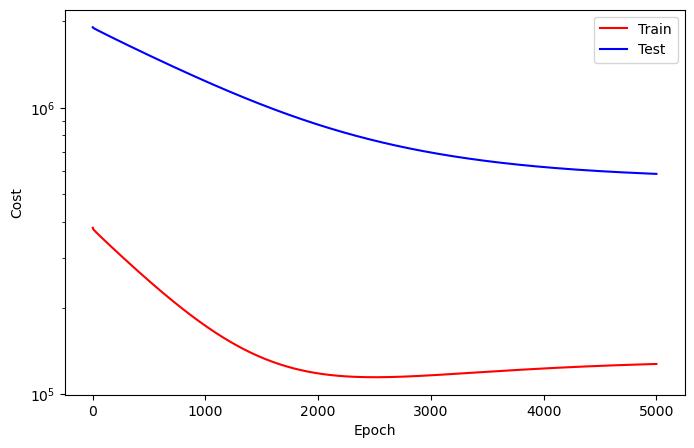

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5001
Train_cost  = 127669.2901 | Test_cost  = 587222.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5002
Train_cost  = 127672.5409 | Test_cost  = 587202.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5003
Train_cost  = 127675.7762 | Test_cost  = 587180.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5004
Train_cost  = 127679.0154 | Test_cost  = 587160.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5005
Train_cost  = 127682.2500 | Test_cost  = 587139.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5006
Train_cost  = 127685.4483 | Test_cost  = 587118.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5007
Train_cost  = 127688.6806 | Test_cost  = 587097.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5008
Train_cost  = 127691.9236 | Test_cost  = 587076.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5009
Train_cost  = 127695.1512 | Test_cost  = 587055.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5010
Train_cost  = 127698.3742 | Test_cost  = 587035.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5011
Train_cost  = 127701.5934 | Test_cost  = 587014.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5012
Train_cost  = 127704.8133 | Test_cost  = 586993.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5013
Train_cost  = 127708.0563 | Test_cost  = 586972.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5014
Train_cost  = 127711.2824 | Test_cost  = 586951.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5015
Train_cost  = 127714.4823 | Test_cost  = 586930.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5016
Train_cost  = 127717.7500 | Test_cost  = 586910.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5017
Train_cost  = 127720.9838 | Test_cost  = 586889.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5018
Train_cost  = 127724.1890 | Test_cost  = 586868.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5019
Train_cost  = 127727.4020 | Test_cost  = 586847.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5020
Train_cost  = 127730.6211 | Test_cost  = 586826.8250 | 


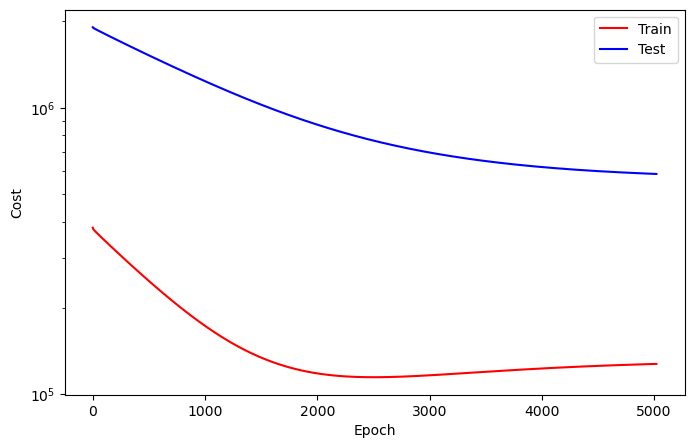

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5021
Train_cost  = 127733.8310 | Test_cost  = 586806.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5022
Train_cost  = 127737.0239 | Test_cost  = 586785.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5023
Train_cost  = 127740.2261 | Test_cost  = 586764.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5024
Train_cost  = 127743.4390 | Test_cost  = 586744.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5025
Train_cost  = 127746.6343 | Test_cost  = 586723.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5026
Train_cost  = 127749.8202 | Test_cost  = 586703.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5027
Train_cost  = 127753.0239 | Test_cost  = 586682.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5028
Train_cost  = 127756.2106 | Test_cost  = 586662.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5029
Train_cost  = 127759.4244 | Test_cost  = 586641.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5030
Train_cost  = 127762.5965 | Test_cost  = 586621.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5031
Train_cost  = 127765.7901 | Test_cost  = 586600.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5032
Train_cost  = 127768.9645 | Test_cost  = 586580.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5033
Train_cost  = 127772.1235 | Test_cost  = 586559.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5034
Train_cost  = 127775.3194 | Test_cost  = 586539.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5035
Train_cost  = 127778.4992 | Test_cost  = 586518.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5036
Train_cost  = 127781.6520 | Test_cost  = 586498.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5037
Train_cost  = 127784.8056 | Test_cost  = 586478.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5038
Train_cost  = 127787.9992 | Test_cost  = 586457.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5039
Train_cost  = 127791.1505 | Test_cost  = 586437.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5040
Train_cost  = 127794.3272 | Test_cost  = 586417.0000 | 


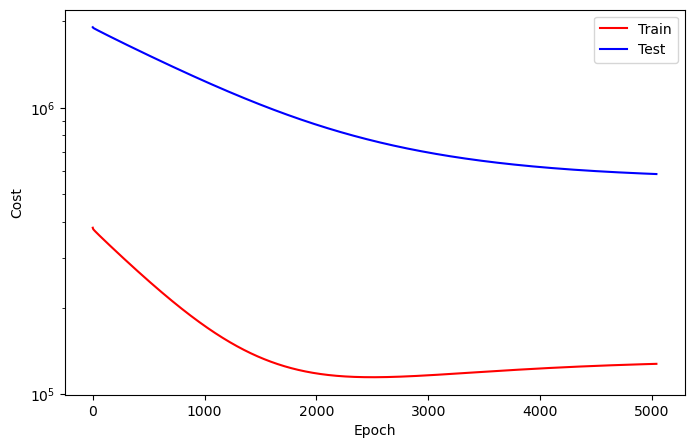

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5041
Train_cost  = 127797.4498 | Test_cost  = 586396.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5042
Train_cost  = 127800.6265 | Test_cost  = 586376.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5043
Train_cost  = 127803.7840 | Test_cost  = 586356.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5044
Train_cost  = 127806.9252 | Test_cost  = 586335.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5045
Train_cost  = 127810.0849 | Test_cost  = 586315.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5046
Train_cost  = 127813.2106 | Test_cost  = 586295.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5047
Train_cost  = 127816.3735 | Test_cost  = 586275.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5048
Train_cost  = 127819.5532 | Test_cost  = 586254.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5049
Train_cost  = 127822.6721 | Test_cost  = 586234.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5050
Train_cost  = 127825.8387 | Test_cost  = 586214.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5051
Train_cost  = 127829.0093 | Test_cost  = 586194.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5052
Train_cost  = 127832.1443 | Test_cost  = 586173.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5053
Train_cost  = 127835.3048 | Test_cost  = 586153.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5054
Train_cost  = 127838.4352 | Test_cost  = 586133.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5055
Train_cost  = 127841.5941 | Test_cost  = 586113.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5056
Train_cost  = 127844.7207 | Test_cost  = 586093.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5057
Train_cost  = 127847.8858 | Test_cost  = 586073.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5058
Train_cost  = 127851.0069 | Test_cost  = 586052.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5059
Train_cost  = 127854.1373 | Test_cost  = 586032.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5060
Train_cost  = 127857.2585 | Test_cost  = 586012.9500 | 


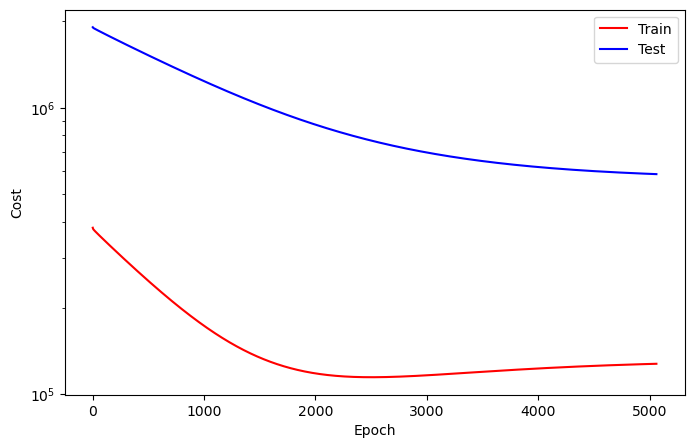

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5061
Train_cost  = 127860.3958 | Test_cost  = 585992.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5062
Train_cost  = 127863.5262 | Test_cost  = 585972.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5063
Train_cost  = 127866.6474 | Test_cost  = 585952.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5064
Train_cost  = 127869.7801 | Test_cost  = 585932.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5065
Train_cost  = 127872.9074 | Test_cost  = 585912.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5066
Train_cost  = 127875.9992 | Test_cost  = 585893.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5067
Train_cost  = 127879.0887 | Test_cost  = 585873.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5068
Train_cost  = 127882.1852 | Test_cost  = 585853.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5069
Train_cost  = 127885.2940 | Test_cost  = 585833.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5070
Train_cost  = 127888.4128 | Test_cost  = 585813.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5071
Train_cost  = 127891.4923 | Test_cost  = 585793.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5072
Train_cost  = 127894.6181 | Test_cost  = 585773.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5073
Train_cost  = 127897.7022 | Test_cost  = 585754.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5074
Train_cost  = 127900.7878 | Test_cost  = 585734.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5075
Train_cost  = 127903.8781 | Test_cost  = 585714.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5076
Train_cost  = 127906.9529 | Test_cost  = 585694.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5077
Train_cost  = 127910.0579 | Test_cost  = 585675.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5078
Train_cost  = 127913.1235 | Test_cost  = 585655.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5079
Train_cost  = 127916.1852 | Test_cost  = 585635.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5080
Train_cost  = 127919.2793 | Test_cost  = 585616.0750 | 


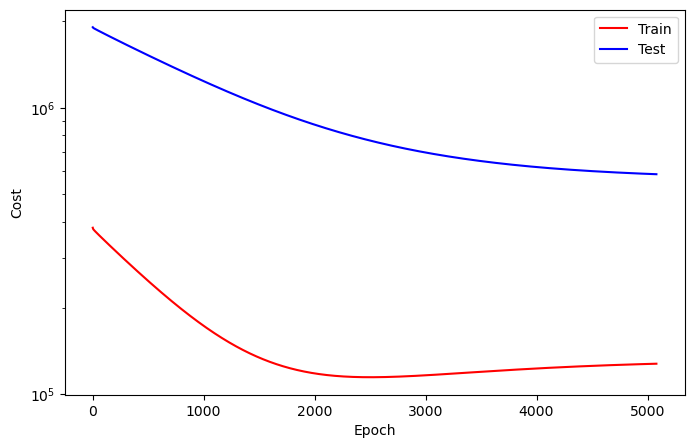

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5081
Train_cost  = 127922.3611 | Test_cost  = 585596.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5082
Train_cost  = 127925.4375 | Test_cost  = 585576.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5083
Train_cost  = 127928.5239 | Test_cost  = 585556.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5084
Train_cost  = 127931.6173 | Test_cost  = 585537.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5085
Train_cost  = 127934.6829 | Test_cost  = 585517.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5086
Train_cost  = 127937.7554 | Test_cost  = 585497.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5087
Train_cost  = 127940.8503 | Test_cost  = 585478.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5088
Train_cost  = 127943.9144 | Test_cost  = 585458.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5089
Train_cost  = 127947.0131 | Test_cost  = 585438.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5090
Train_cost  = 127950.0795 | Test_cost  = 585419.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5091
Train_cost  = 127953.1366 | Test_cost  = 585399.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5092
Train_cost  = 127956.2052 | Test_cost  = 585380.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5093
Train_cost  = 127959.2793 | Test_cost  = 585360.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5094
Train_cost  = 127962.3387 | Test_cost  = 585340.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5095
Train_cost  = 127965.4066 | Test_cost  = 585321.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5096
Train_cost  = 127968.4576 | Test_cost  = 585301.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5097
Train_cost  = 127971.5208 | Test_cost  = 585282.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5098
Train_cost  = 127974.5648 | Test_cost  = 585263.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5099
Train_cost  = 127977.6157 | Test_cost  = 585243.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5100
Train_cost  = 127980.6620 | Test_cost  = 585224.2500 | 


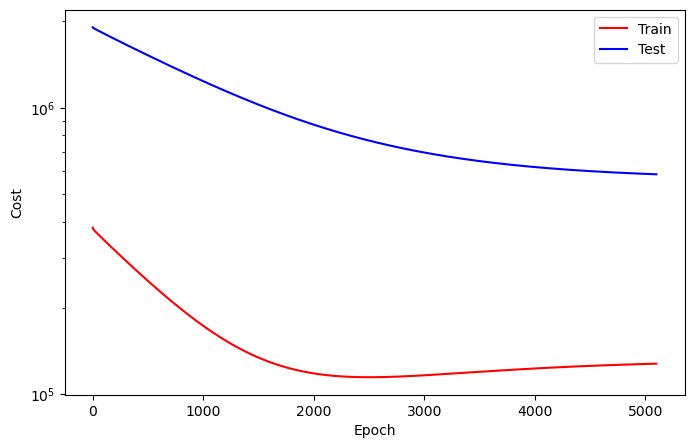

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5101
Train_cost  = 127983.6929 | Test_cost  = 585204.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5102
Train_cost  = 127986.7307 | Test_cost  = 585185.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5103
Train_cost  = 127989.7500 | Test_cost  = 585166.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5104
Train_cost  = 127992.7886 | Test_cost  = 585147.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5105
Train_cost  = 127995.8063 | Test_cost  = 585127.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5106
Train_cost  = 127998.8349 | Test_cost  = 585108.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5107
Train_cost  = 128001.8426 | Test_cost  = 585089.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5108
Train_cost  = 128004.8588 | Test_cost  = 585070.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5109
Train_cost  = 128007.8804 | Test_cost  = 585051.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5110
Train_cost  = 128010.8627 | Test_cost  = 585031.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5111
Train_cost  = 128013.8881 | Test_cost  = 585012.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5112
Train_cost  = 128016.9120 | Test_cost  = 584993.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5113
Train_cost  = 128019.9144 | Test_cost  = 584974.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5114
Train_cost  = 128022.9198 | Test_cost  = 584955.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5115
Train_cost  = 128025.9190 | Test_cost  = 584935.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5116
Train_cost  = 128028.9252 | Test_cost  = 584917.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5117
Train_cost  = 128031.9090 | Test_cost  = 584897.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5118
Train_cost  = 128034.9313 | Test_cost  = 584878.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5119
Train_cost  = 128037.9120 | Test_cost  = 584859.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5120
Train_cost  = 128040.9159 | Test_cost  = 584840.6000 | 


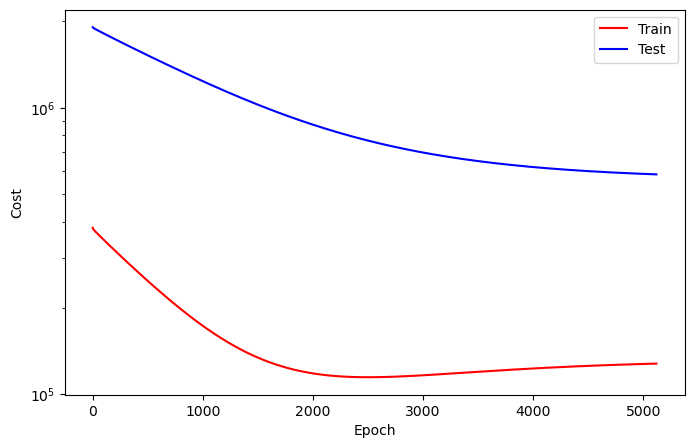

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5121
Train_cost  = 128043.9020 | Test_cost  = 584821.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5122
Train_cost  = 128046.9244 | Test_cost  = 584802.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5123
Train_cost  = 128049.9360 | Test_cost  = 584783.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5124
Train_cost  = 128052.9244 | Test_cost  = 584764.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5125
Train_cost  = 128055.9228 | Test_cost  = 584745.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5126
Train_cost  = 128058.9406 | Test_cost  = 584726.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5127
Train_cost  = 128061.9228 | Test_cost  = 584706.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5128
Train_cost  = 128064.9090 | Test_cost  = 584687.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5129
Train_cost  = 128067.9113 | Test_cost  = 584669.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5130
Train_cost  = 128070.8889 | Test_cost  = 584650.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5131
Train_cost  = 128073.8665 | Test_cost  = 584631.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5132
Train_cost  = 128076.8410 | Test_cost  = 584612.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5133
Train_cost  = 128079.8364 | Test_cost  = 584593.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5134
Train_cost  = 128082.8403 | Test_cost  = 584574.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5135
Train_cost  = 128085.7654 | Test_cost  = 584555.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5136
Train_cost  = 128088.7153 | Test_cost  = 584536.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5137
Train_cost  = 128091.6821 | Test_cost  = 584518.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5138
Train_cost  = 128094.6458 | Test_cost  = 584499.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5139
Train_cost  = 128097.5957 | Test_cost  = 584480.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5140
Train_cost  = 128100.5201 | Test_cost  = 584461.9750 | 


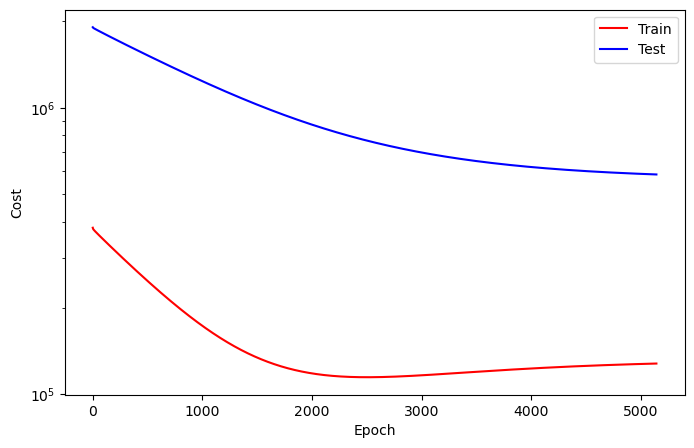

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5141
Train_cost  = 128103.4776 | Test_cost  = 584443.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5142
Train_cost  = 128106.4306 | Test_cost  = 584424.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5143
Train_cost  = 128109.3549 | Test_cost  = 584406.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5144
Train_cost  = 128112.2832 | Test_cost  = 584387.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5145
Train_cost  = 128115.1998 | Test_cost  = 584369.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5146
Train_cost  = 128118.1574 | Test_cost  = 584350.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5147
Train_cost  = 128121.0656 | Test_cost  = 584331.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5148
Train_cost  = 128123.9884 | Test_cost  = 584313.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5149
Train_cost  = 128126.9282 | Test_cost  = 584294.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5150
Train_cost  = 128129.8495 | Test_cost  = 584276.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5151
Train_cost  = 128132.7701 | Test_cost  = 584257.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5152
Train_cost  = 128135.6883 | Test_cost  = 584239.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5153
Train_cost  = 128138.5995 | Test_cost  = 584221.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5154
Train_cost  = 128141.5008 | Test_cost  = 584202.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5155
Train_cost  = 128144.4128 | Test_cost  = 584184.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5156
Train_cost  = 128147.3349 | Test_cost  = 584165.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5157
Train_cost  = 128150.2477 | Test_cost  = 584147.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5158
Train_cost  = 128153.1667 | Test_cost  = 584128.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5159
Train_cost  = 128156.0895 | Test_cost  = 584110.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5160
Train_cost  = 128158.9707 | Test_cost  = 584091.6750 | 


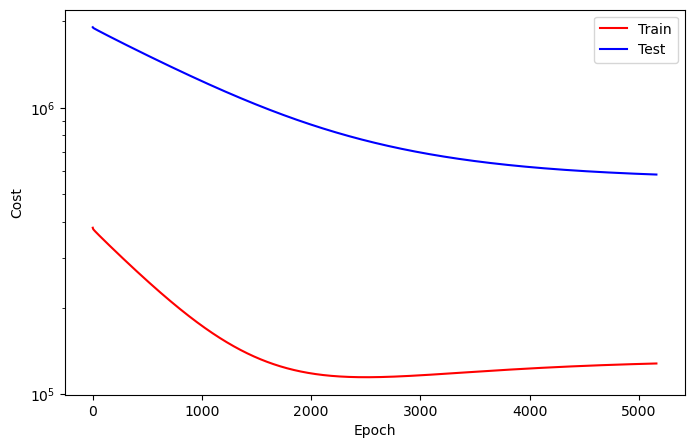

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5161
Train_cost  = 128161.9159 | Test_cost  = 584073.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5162
Train_cost  = 128164.8117 | Test_cost  = 584054.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5163
Train_cost  = 128167.7384 | Test_cost  = 584036.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5164
Train_cost  = 128170.6582 | Test_cost  = 584018.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5165
Train_cost  = 128173.5509 | Test_cost  = 583999.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5166
Train_cost  = 128176.4684 | Test_cost  = 583981.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5167
Train_cost  = 128179.3696 | Test_cost  = 583962.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5168
Train_cost  = 128182.2747 | Test_cost  = 583944.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5169
Train_cost  = 128185.1883 | Test_cost  = 583926.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5170
Train_cost  = 128188.0733 | Test_cost  = 583907.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5171
Train_cost  = 128190.9653 | Test_cost  = 583889.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5172
Train_cost  = 128193.8665 | Test_cost  = 583871.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5173
Train_cost  = 128196.7755 | Test_cost  = 583853.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5174
Train_cost  = 128199.6551 | Test_cost  = 583835.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5175
Train_cost  = 128202.5147 | Test_cost  = 583816.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5176
Train_cost  = 128205.3974 | Test_cost  = 583798.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5177
Train_cost  = 128208.2577 | Test_cost  = 583780.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5178
Train_cost  = 128211.1188 | Test_cost  = 583762.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5179
Train_cost  = 128213.9784 | Test_cost  = 583744.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5180
Train_cost  = 128216.8465 | Test_cost  = 583726.4000 | 


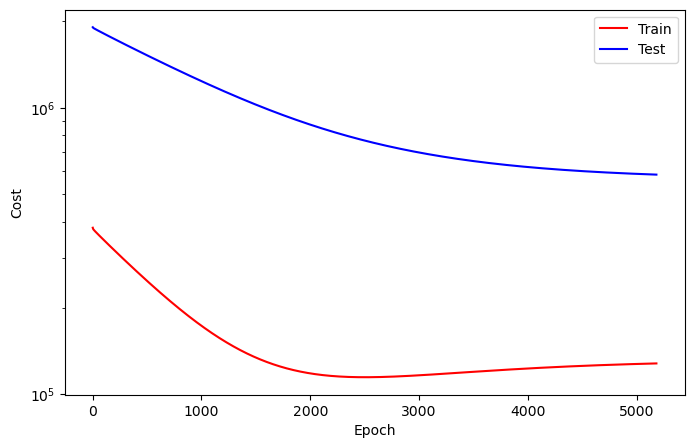

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5181
Train_cost  = 128219.7006 | Test_cost  = 583708.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5182
Train_cost  = 128222.5548 | Test_cost  = 583690.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5183
Train_cost  = 128225.3773 | Test_cost  = 583672.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5184
Train_cost  = 128228.2485 | Test_cost  = 583654.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5185
Train_cost  = 128231.1173 | Test_cost  = 583636.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5186
Train_cost  = 128233.9329 | Test_cost  = 583618.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5187
Train_cost  = 128236.7755 | Test_cost  = 583600.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5188
Train_cost  = 128239.6373 | Test_cost  = 583582.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5189
Train_cost  = 128242.4722 | Test_cost  = 583564.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5190
Train_cost  = 128245.3318 | Test_cost  = 583546.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5191
Train_cost  = 128248.2076 | Test_cost  = 583528.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5192
Train_cost  = 128250.9969 | Test_cost  = 583511.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5193
Train_cost  = 128253.8472 | Test_cost  = 583493.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5194
Train_cost  = 128256.7006 | Test_cost  = 583475.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5195
Train_cost  = 128259.5193 | Test_cost  = 583457.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5196
Train_cost  = 128262.3410 | Test_cost  = 583439.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5197
Train_cost  = 128265.1690 | Test_cost  = 583421.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5198
Train_cost  = 128268.0154 | Test_cost  = 583403.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5199
Train_cost  = 128270.8573 | Test_cost  = 583385.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5200
Train_cost  = 128273.6813 | Test_cost  = 583367.9750 | 


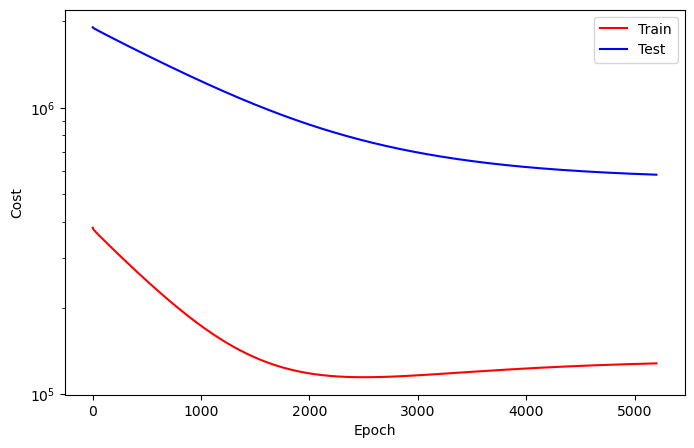

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5201
Train_cost  = 128276.5363 | Test_cost  = 583350.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5202
Train_cost  = 128279.3858 | Test_cost  = 583332.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5203
Train_cost  = 128282.1875 | Test_cost  = 583314.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5204
Train_cost  = 128285.0509 | Test_cost  = 583296.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5205
Train_cost  = 128287.8935 | Test_cost  = 583278.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5206
Train_cost  = 128290.7060 | Test_cost  = 583260.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5207
Train_cost  = 128293.5471 | Test_cost  = 583243.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5208
Train_cost  = 128296.3542 | Test_cost  = 583225.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5209
Train_cost  = 128299.1674 | Test_cost  = 583207.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5210
Train_cost  = 128301.9954 | Test_cost  = 583189.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5211
Train_cost  = 128304.8364 | Test_cost  = 583172.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5212
Train_cost  = 128307.6512 | Test_cost  = 583154.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5213
Train_cost  = 128310.4761 | Test_cost  = 583136.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5214
Train_cost  = 128313.2708 | Test_cost  = 583119.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5215
Train_cost  = 128316.0702 | Test_cost  = 583101.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5216
Train_cost  = 128318.8542 | Test_cost  = 583084.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5217
Train_cost  = 128321.6481 | Test_cost  = 583066.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5218
Train_cost  = 128324.4491 | Test_cost  = 583049.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5219
Train_cost  = 128327.2091 | Test_cost  = 583031.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5220
Train_cost  = 128330.0201 | Test_cost  = 583014.1250 | 


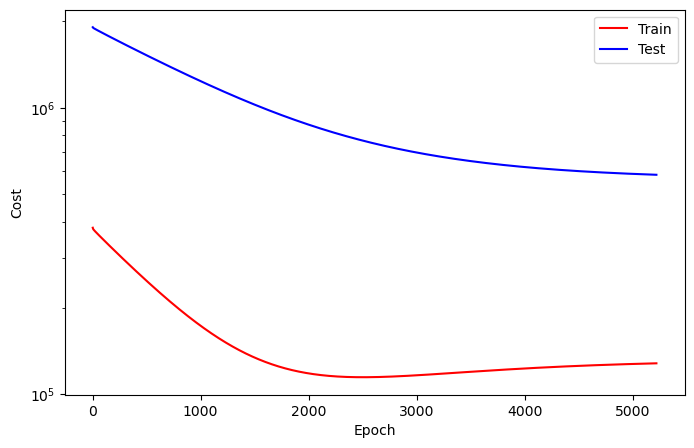

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5221
Train_cost  = 128332.7940 | Test_cost  = 582996.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5222
Train_cost  = 128335.5594 | Test_cost  = 582979.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5223
Train_cost  = 128338.3418 | Test_cost  = 582962.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5224
Train_cost  = 128341.0910 | Test_cost  = 582944.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5225
Train_cost  = 128343.8619 | Test_cost  = 582927.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5226
Train_cost  = 128346.6312 | Test_cost  = 582909.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5227
Train_cost  = 128349.4051 | Test_cost  = 582892.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5228
Train_cost  = 128352.1566 | Test_cost  = 582874.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5229
Train_cost  = 128354.9213 | Test_cost  = 582857.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5230
Train_cost  = 128357.7060 | Test_cost  = 582840.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5231
Train_cost  = 128360.4606 | Test_cost  = 582823.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5232
Train_cost  = 128363.2191 | Test_cost  = 582805.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5233
Train_cost  = 128365.9514 | Test_cost  = 582788.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5234
Train_cost  = 128368.7176 | Test_cost  = 582771.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5235
Train_cost  = 128371.4606 | Test_cost  = 582753.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5236
Train_cost  = 128374.2261 | Test_cost  = 582736.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5237
Train_cost  = 128377.0039 | Test_cost  = 582719.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5238
Train_cost  = 128379.7616 | Test_cost  = 582701.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5239
Train_cost  = 128382.5216 | Test_cost  = 582684.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5240
Train_cost  = 128385.2685 | Test_cost  = 582667.4250 | 


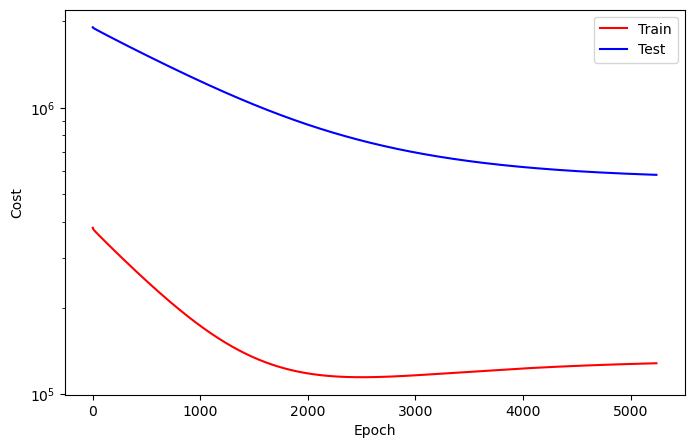

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5241
Train_cost  = 128388.0231 | Test_cost  = 582650.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5242
Train_cost  = 128390.7716 | Test_cost  = 582632.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5243
Train_cost  = 128393.5370 | Test_cost  = 582615.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5244
Train_cost  = 128396.2809 | Test_cost  = 582598.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5245
Train_cost  = 128399.0440 | Test_cost  = 582581.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5246
Train_cost  = 128401.8102 | Test_cost  = 582563.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5247
Train_cost  = 128404.5733 | Test_cost  = 582546.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5248
Train_cost  = 128407.3133 | Test_cost  = 582529.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5249
Train_cost  = 128410.0718 | Test_cost  = 582512.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5250
Train_cost  = 128412.8056 | Test_cost  = 582495.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5251
Train_cost  = 128415.5285 | Test_cost  = 582477.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5252
Train_cost  = 128418.2824 | Test_cost  = 582460.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5253
Train_cost  = 128421.0347 | Test_cost  = 582443.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5254
Train_cost  = 128423.7662 | Test_cost  = 582426.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5255
Train_cost  = 128426.4784 | Test_cost  = 582409.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5256
Train_cost  = 128429.1944 | Test_cost  = 582392.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5257
Train_cost  = 128431.9213 | Test_cost  = 582375.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5258
Train_cost  = 128434.6273 | Test_cost  = 582358.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5259
Train_cost  = 128437.3179 | Test_cost  = 582341.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5260
Train_cost  = 128440.0340 | Test_cost  = 582324.9500 | 


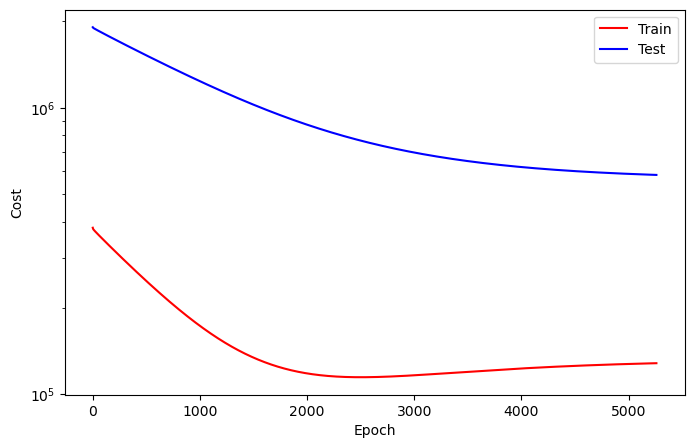

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5261
Train_cost  = 128442.7168 | Test_cost  = 582308.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5262
Train_cost  = 128445.3920 | Test_cost  = 582291.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5263
Train_cost  = 128448.0764 | Test_cost  = 582274.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5264
Train_cost  = 128450.7454 | Test_cost  = 582257.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5265
Train_cost  = 128453.4606 | Test_cost  = 582241.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5266
Train_cost  = 128456.1435 | Test_cost  = 582224.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5267
Train_cost  = 128458.8310 | Test_cost  = 582207.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5268
Train_cost  = 128461.5170 | Test_cost  = 582190.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5269
Train_cost  = 128464.1937 | Test_cost  = 582174.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5270
Train_cost  = 128466.8873 | Test_cost  = 582157.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5271
Train_cost  = 128469.5702 | Test_cost  = 582140.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5272
Train_cost  = 128472.2431 | Test_cost  = 582123.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5273
Train_cost  = 128474.9244 | Test_cost  = 582107.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5274
Train_cost  = 128477.5764 | Test_cost  = 582090.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5275
Train_cost  = 128480.2485 | Test_cost  = 582073.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5276
Train_cost  = 128482.9344 | Test_cost  = 582057.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5277
Train_cost  = 128485.5965 | Test_cost  = 582040.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5278
Train_cost  = 128488.2778 | Test_cost  = 582023.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5279
Train_cost  = 128490.9421 | Test_cost  = 582006.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5280
Train_cost  = 128493.6134 | Test_cost  = 581990.4000 | 


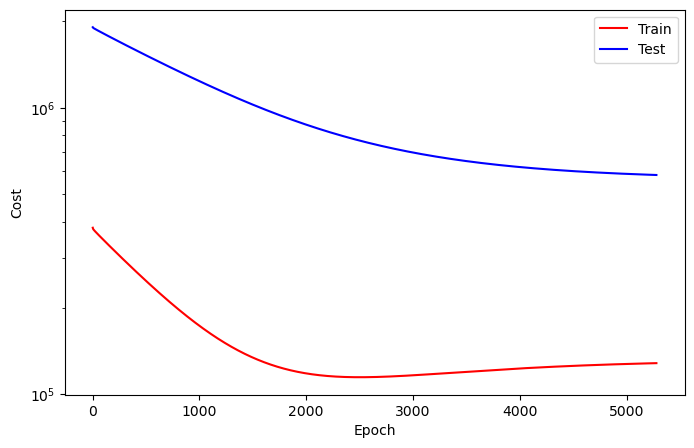

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5281
Train_cost  = 128496.3017 | Test_cost  = 581973.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5282
Train_cost  = 128498.9552 | Test_cost  = 581957.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5283
Train_cost  = 128501.6250 | Test_cost  = 581940.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5284
Train_cost  = 128504.2940 | Test_cost  = 581923.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5285
Train_cost  = 128506.9799 | Test_cost  = 581906.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5286
Train_cost  = 128509.6404 | Test_cost  = 581890.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5287
Train_cost  = 128512.3110 | Test_cost  = 581873.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5288
Train_cost  = 128514.9784 | Test_cost  = 581857.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5289
Train_cost  = 128517.6597 | Test_cost  = 581840.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5290
Train_cost  = 128520.3256 | Test_cost  = 581823.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5291
Train_cost  = 128523.0031 | Test_cost  = 581807.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5292
Train_cost  = 128525.6458 | Test_cost  = 581790.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5293
Train_cost  = 128528.3086 | Test_cost  = 581774.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5294
Train_cost  = 128530.9560 | Test_cost  = 581757.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5295
Train_cost  = 128533.6088 | Test_cost  = 581740.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5296
Train_cost  = 128536.2731 | Test_cost  = 581724.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5297
Train_cost  = 128538.8981 | Test_cost  = 581708.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5298
Train_cost  = 128541.5471 | Test_cost  = 581691.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5299
Train_cost  = 128544.1998 | Test_cost  = 581675.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5300
Train_cost  = 128546.8225 | Test_cost  = 581659.0000 | 


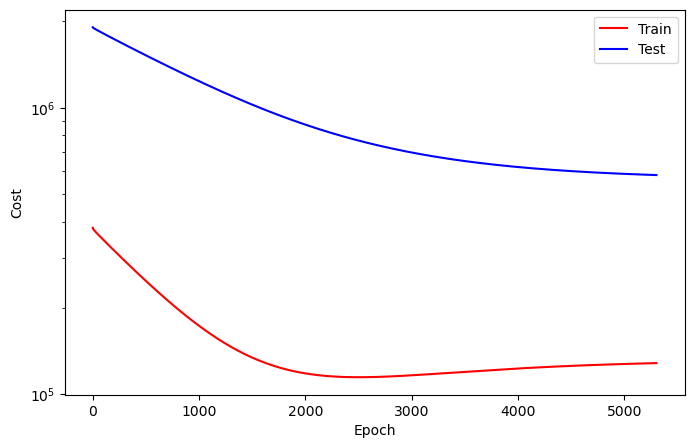

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5301
Train_cost  = 128549.4275 | Test_cost  = 581642.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5302
Train_cost  = 128552.0556 | Test_cost  = 581626.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5303
Train_cost  = 128554.6366 | Test_cost  = 581610.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5304
Train_cost  = 128557.2608 | Test_cost  = 581594.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5305
Train_cost  = 128559.8688 | Test_cost  = 581578.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5306
Train_cost  = 128562.4691 | Test_cost  = 581561.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5307
Train_cost  = 128565.0517 | Test_cost  = 581545.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5308
Train_cost  = 128567.6335 | Test_cost  = 581529.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5309
Train_cost  = 128570.2400 | Test_cost  = 581513.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5310
Train_cost  = 128572.8557 | Test_cost  = 581497.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5311
Train_cost  = 128575.4552 | Test_cost  = 581481.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5312
Train_cost  = 128578.0440 | Test_cost  = 581464.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5313
Train_cost  = 128580.6412 | Test_cost  = 581448.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5314
Train_cost  = 128583.2531 | Test_cost  = 581432.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5315
Train_cost  = 128585.8318 | Test_cost  = 581416.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5316
Train_cost  = 128588.4329 | Test_cost  = 581400.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5317
Train_cost  = 128591.0177 | Test_cost  = 581384.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5318
Train_cost  = 128593.6080 | Test_cost  = 581368.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5319
Train_cost  = 128596.1883 | Test_cost  = 581352.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5320
Train_cost  = 128598.7539 | Test_cost  = 581336.1500 | 


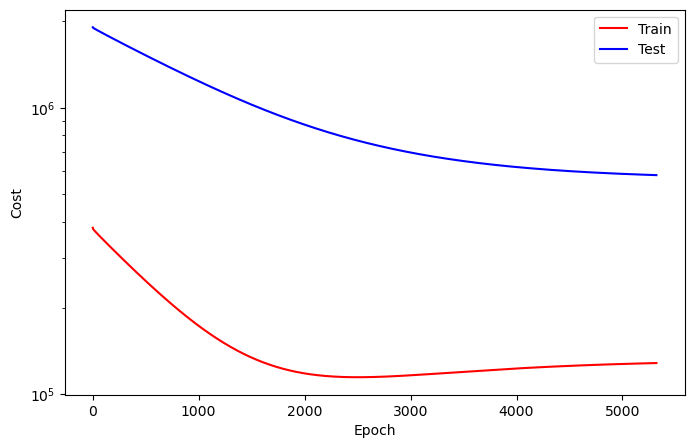

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5321
Train_cost  = 128601.3449 | Test_cost  = 581320.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5322
Train_cost  = 128603.9375 | Test_cost  = 581304.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5323
Train_cost  = 128606.5100 | Test_cost  = 581287.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5324
Train_cost  = 128609.0934 | Test_cost  = 581272.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5325
Train_cost  = 128611.6690 | Test_cost  = 581255.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5326
Train_cost  = 128614.2847 | Test_cost  = 581239.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5327
Train_cost  = 128616.8758 | Test_cost  = 581223.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5328
Train_cost  = 128619.4329 | Test_cost  = 581207.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5329
Train_cost  = 128622.0509 | Test_cost  = 581191.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5330
Train_cost  = 128624.6088 | Test_cost  = 581175.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5331
Train_cost  = 128627.1813 | Test_cost  = 581159.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5332
Train_cost  = 128629.8048 | Test_cost  = 581143.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5333
Train_cost  = 128632.3819 | Test_cost  = 581127.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5334
Train_cost  = 128634.9676 | Test_cost  = 581111.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5335
Train_cost  = 128637.5548 | Test_cost  = 581095.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5336
Train_cost  = 128640.1273 | Test_cost  = 581079.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5337
Train_cost  = 128642.7068 | Test_cost  = 581063.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5338
Train_cost  = 128645.2801 | Test_cost  = 581047.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5339
Train_cost  = 128647.8310 | Test_cost  = 581031.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5340
Train_cost  = 128650.3904 | Test_cost  = 581015.9750 | 


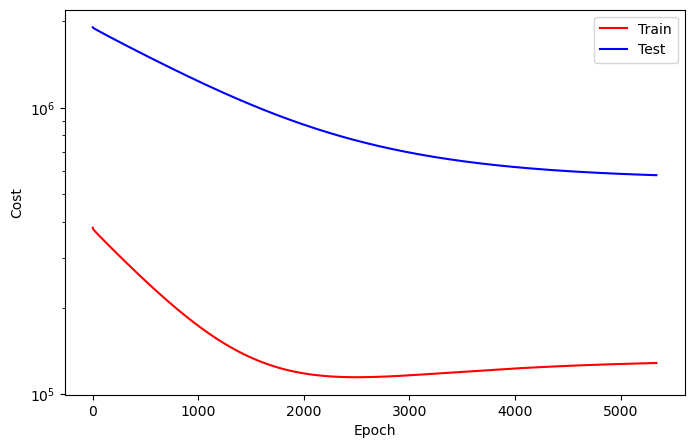

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5341
Train_cost  = 128652.9444 | Test_cost  = 580999.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5342
Train_cost  = 128655.5170 | Test_cost  = 580984.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5343
Train_cost  = 128658.0748 | Test_cost  = 580968.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5344
Train_cost  = 128660.6373 | Test_cost  = 580952.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5345
Train_cost  = 128663.1667 | Test_cost  = 580936.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5346
Train_cost  = 128665.7068 | Test_cost  = 580921.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5347
Train_cost  = 128668.2106 | Test_cost  = 580905.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5348
Train_cost  = 128670.7454 | Test_cost  = 580890.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5349
Train_cost  = 128673.2323 | Test_cost  = 580874.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5350
Train_cost  = 128675.7677 | Test_cost  = 580859.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5351
Train_cost  = 128678.2901 | Test_cost  = 580843.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5352
Train_cost  = 128680.7863 | Test_cost  = 580827.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5353
Train_cost  = 128683.3071 | Test_cost  = 580812.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5354
Train_cost  = 128685.8210 | Test_cost  = 580796.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5355
Train_cost  = 128688.3542 | Test_cost  = 580781.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5356
Train_cost  = 128690.8364 | Test_cost  = 580765.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5357
Train_cost  = 128693.3742 | Test_cost  = 580750.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5358
Train_cost  = 128695.8943 | Test_cost  = 580734.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5359
Train_cost  = 128698.4182 | Test_cost  = 580718.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5360
Train_cost  = 128700.9236 | Test_cost  = 580703.3000 | 


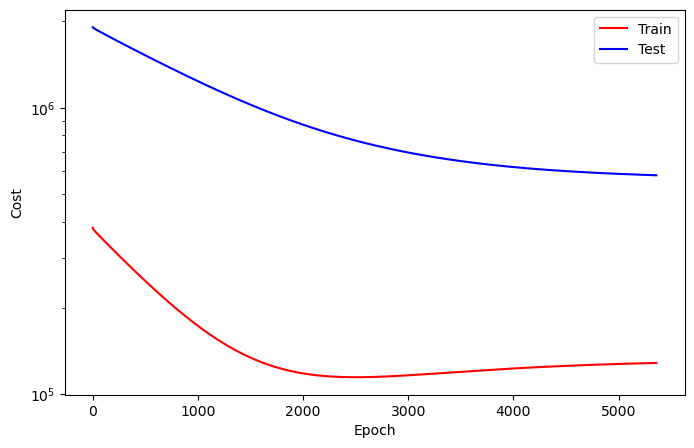

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5361
Train_cost  = 128703.4298 | Test_cost  = 580687.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5362
Train_cost  = 128705.9552 | Test_cost  = 580672.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5363
Train_cost  = 128708.4174 | Test_cost  = 580656.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5364
Train_cost  = 128710.9414 | Test_cost  = 580641.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5365
Train_cost  = 128713.4514 | Test_cost  = 580625.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5366
Train_cost  = 128715.9514 | Test_cost  = 580610.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5367
Train_cost  = 128718.4282 | Test_cost  = 580595.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5368
Train_cost  = 128720.9660 | Test_cost  = 580579.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5369
Train_cost  = 128723.4707 | Test_cost  = 580563.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5370
Train_cost  = 128725.9699 | Test_cost  = 580548.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5371
Train_cost  = 128728.4792 | Test_cost  = 580532.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5372
Train_cost  = 128730.9892 | Test_cost  = 580517.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5373
Train_cost  = 128733.4838 | Test_cost  = 580502.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5374
Train_cost  = 128735.9900 | Test_cost  = 580486.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5375
Train_cost  = 128738.5177 | Test_cost  = 580471.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5376
Train_cost  = 128740.9938 | Test_cost  = 580455.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5377
Train_cost  = 128743.5154 | Test_cost  = 580440.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5378
Train_cost  = 128746.0039 | Test_cost  = 580424.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5379
Train_cost  = 128748.5332 | Test_cost  = 580409.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5380
Train_cost  = 128751.0293 | Test_cost  = 580393.7000 | 


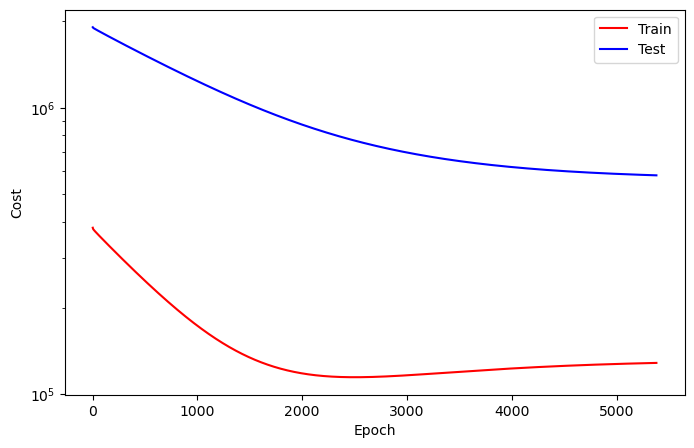

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5381
Train_cost  = 128753.5285 | Test_cost  = 580378.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5382
Train_cost  = 128756.0409 | Test_cost  = 580362.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5383
Train_cost  = 128758.5247 | Test_cost  = 580347.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5384
Train_cost  = 128761.0309 | Test_cost  = 580332.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5385
Train_cost  = 128763.4877 | Test_cost  = 580316.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5386
Train_cost  = 128765.9645 | Test_cost  = 580301.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5387
Train_cost  = 128768.4668 | Test_cost  = 580286.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5388
Train_cost  = 128770.9336 | Test_cost  = 580271.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5389
Train_cost  = 128773.4144 | Test_cost  = 580255.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5390
Train_cost  = 128775.8804 | Test_cost  = 580240.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5391
Train_cost  = 128778.3218 | Test_cost  = 580225.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5392
Train_cost  = 128780.7608 | Test_cost  = 580210.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5393
Train_cost  = 128783.2145 | Test_cost  = 580195.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5394
Train_cost  = 128785.6435 | Test_cost  = 580180.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5395
Train_cost  = 128788.0540 | Test_cost  = 580165.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5396
Train_cost  = 128790.5123 | Test_cost  = 580150.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5397
Train_cost  = 128792.9653 | Test_cost  = 580135.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5398
Train_cost  = 128795.3681 | Test_cost  = 580120.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5399
Train_cost  = 128797.8025 | Test_cost  = 580105.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5400
Train_cost  = 128800.2577 | Test_cost  = 580090.6750 | 


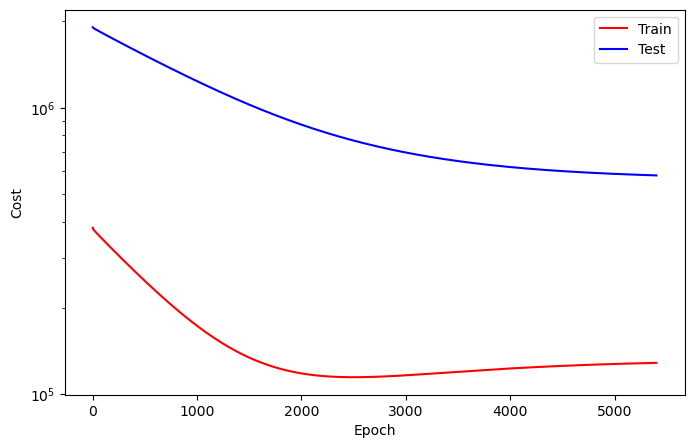

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5401
Train_cost  = 128802.6914 | Test_cost  = 580075.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5402
Train_cost  = 128805.0856 | Test_cost  = 580060.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5403
Train_cost  = 128807.5648 | Test_cost  = 580045.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5404
Train_cost  = 128809.9938 | Test_cost  = 580030.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5405
Train_cost  = 128812.3920 | Test_cost  = 580015.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5406
Train_cost  = 128814.8310 | Test_cost  = 580000.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5407
Train_cost  = 128817.2569 | Test_cost  = 579986.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5408
Train_cost  = 128819.7045 | Test_cost  = 579971.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5409
Train_cost  = 128822.0887 | Test_cost  = 579956.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5410
Train_cost  = 128824.5162 | Test_cost  = 579941.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5411
Train_cost  = 128826.9452 | Test_cost  = 579926.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5412
Train_cost  = 128829.3688 | Test_cost  = 579911.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5413
Train_cost  = 128831.7948 | Test_cost  = 579896.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5414
Train_cost  = 128834.2037 | Test_cost  = 579881.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5415
Train_cost  = 128836.5864 | Test_cost  = 579866.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5416
Train_cost  = 128839.0394 | Test_cost  = 579852.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5417
Train_cost  = 128841.4429 | Test_cost  = 579837.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5418
Train_cost  = 128843.8364 | Test_cost  = 579822.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5419
Train_cost  = 128846.2600 | Test_cost  = 579807.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5420
Train_cost  = 128848.6890 | Test_cost  = 579792.5750 | 


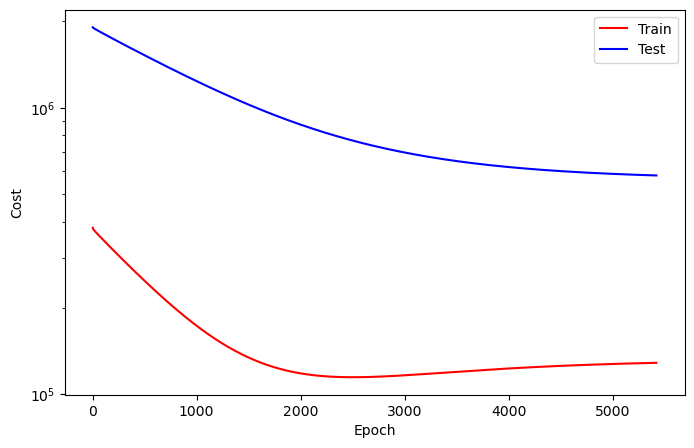

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5421
Train_cost  = 128851.1296 | Test_cost  = 579777.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5422
Train_cost  = 128853.5424 | Test_cost  = 579762.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5423
Train_cost  = 128855.9606 | Test_cost  = 579748.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5424
Train_cost  = 128858.3488 | Test_cost  = 579733.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5425
Train_cost  = 128860.7901 | Test_cost  = 579718.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5426
Train_cost  = 128863.1860 | Test_cost  = 579703.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5427
Train_cost  = 128865.6088 | Test_cost  = 579688.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5428
Train_cost  = 128868.0015 | Test_cost  = 579673.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5429
Train_cost  = 128870.4213 | Test_cost  = 579659.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5430
Train_cost  = 128872.8225 | Test_cost  = 579644.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5431
Train_cost  = 128875.2153 | Test_cost  = 579629.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5432
Train_cost  = 128877.6235 | Test_cost  = 579615.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5433
Train_cost  = 128880.0046 | Test_cost  = 579600.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5434
Train_cost  = 128882.4213 | Test_cost  = 579585.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5435
Train_cost  = 128884.7909 | Test_cost  = 579571.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5436
Train_cost  = 128887.1644 | Test_cost  = 579556.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5437
Train_cost  = 128889.5486 | Test_cost  = 579542.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5438
Train_cost  = 128891.9035 | Test_cost  = 579527.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5439
Train_cost  = 128894.2585 | Test_cost  = 579513.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5440
Train_cost  = 128896.6235 | Test_cost  = 579498.6000 | 


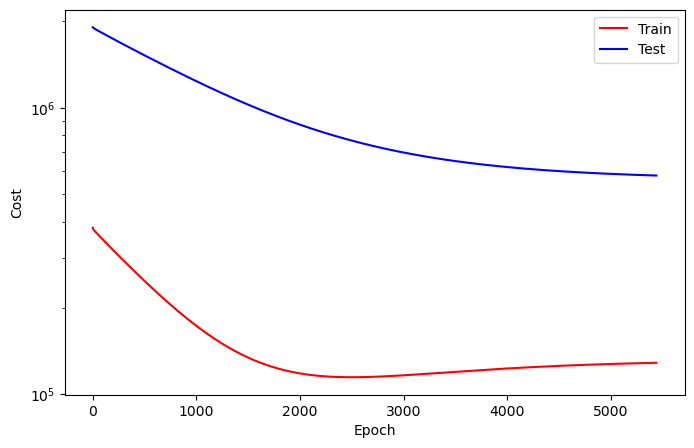

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5441
Train_cost  = 128898.9637 | Test_cost  = 579484.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5442
Train_cost  = 128901.2994 | Test_cost  = 579469.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5443
Train_cost  = 128903.6559 | Test_cost  = 579455.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5444
Train_cost  = 128906.0015 | Test_cost  = 579441.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5445
Train_cost  = 128908.3333 | Test_cost  = 579426.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5446
Train_cost  = 128910.6829 | Test_cost  = 579412.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5447
Train_cost  = 128913.0108 | Test_cost  = 579398.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5448
Train_cost  = 128915.3580 | Test_cost  = 579383.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5449
Train_cost  = 128917.6790 | Test_cost  = 579369.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5450
Train_cost  = 128920.0231 | Test_cost  = 579355.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5451
Train_cost  = 128922.3673 | Test_cost  = 579340.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5452
Train_cost  = 128924.7330 | Test_cost  = 579326.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5453
Train_cost  = 128927.0486 | Test_cost  = 579311.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5454
Train_cost  = 128929.3981 | Test_cost  = 579297.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5455
Train_cost  = 128931.7454 | Test_cost  = 579283.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5456
Train_cost  = 128934.0679 | Test_cost  = 579269.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5457
Train_cost  = 128936.3989 | Test_cost  = 579254.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5458
Train_cost  = 128938.7315 | Test_cost  = 579240.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5459
Train_cost  = 128941.0579 | Test_cost  = 579226.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5460
Train_cost  = 128943.3611 | Test_cost  = 579212.1750 | 


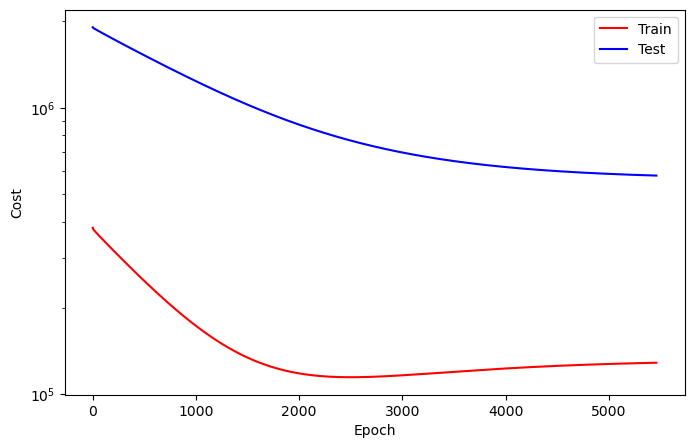

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5461
Train_cost  = 128945.6998 | Test_cost  = 579197.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5462
Train_cost  = 128948.0239 | Test_cost  = 579183.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5463
Train_cost  = 128950.3704 | Test_cost  = 579169.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5464
Train_cost  = 128952.6798 | Test_cost  = 579155.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5465
Train_cost  = 128955.0093 | Test_cost  = 579140.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5466
Train_cost  = 128957.3395 | Test_cost  = 579126.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5467
Train_cost  = 128959.6636 | Test_cost  = 579112.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5468
Train_cost  = 128961.9807 | Test_cost  = 579098.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5469
Train_cost  = 128964.2832 | Test_cost  = 579084.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5470
Train_cost  = 128966.5972 | Test_cost  = 579069.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5471
Train_cost  = 128968.9306 | Test_cost  = 579055.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5472
Train_cost  = 128971.2685 | Test_cost  = 579041.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5473
Train_cost  = 128973.5972 | Test_cost  = 579027.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5474
Train_cost  = 128975.9298 | Test_cost  = 579012.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5475
Train_cost  = 128978.2531 | Test_cost  = 578998.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5476
Train_cost  = 128980.5625 | Test_cost  = 578984.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5477
Train_cost  = 128982.8619 | Test_cost  = 578970.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5478
Train_cost  = 128985.2222 | Test_cost  = 578956.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5479
Train_cost  = 128987.5502 | Test_cost  = 578941.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5480
Train_cost  = 128989.8727 | Test_cost  = 578927.8750 | 


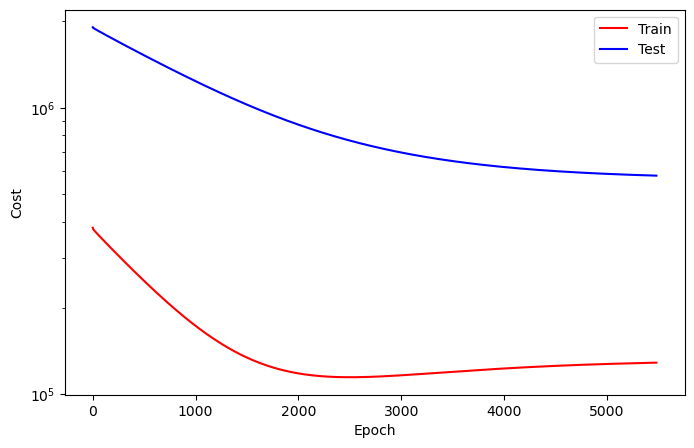

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5481
Train_cost  = 128992.1574 | Test_cost  = 578913.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5482
Train_cost  = 128994.4414 | Test_cost  = 578899.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5483
Train_cost  = 128996.7469 | Test_cost  = 578885.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5484
Train_cost  = 128999.0285 | Test_cost  = 578871.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5485
Train_cost  = 129001.3511 | Test_cost  = 578857.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5486
Train_cost  = 129003.6582 | Test_cost  = 578843.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5487
Train_cost  = 129005.9005 | Test_cost  = 578830.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5488
Train_cost  = 129008.1728 | Test_cost  = 578816.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5489
Train_cost  = 129010.4383 | Test_cost  = 578802.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5490
Train_cost  = 129012.7284 | Test_cost  = 578788.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5491
Train_cost  = 129014.9807 | Test_cost  = 578774.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5492
Train_cost  = 129017.2469 | Test_cost  = 578760.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5493
Train_cost  = 129019.5008 | Test_cost  = 578747.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5494
Train_cost  = 129021.7639 | Test_cost  = 578733.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5495
Train_cost  = 129024.0216 | Test_cost  = 578719.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5496
Train_cost  = 129026.2816 | Test_cost  = 578705.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5497
Train_cost  = 129028.5355 | Test_cost  = 578691.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5498
Train_cost  = 129030.7894 | Test_cost  = 578678.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5499
Train_cost  = 129033.0347 | Test_cost  = 578664.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5500
Train_cost  = 129035.2932 | Test_cost  = 578650.6250 | 


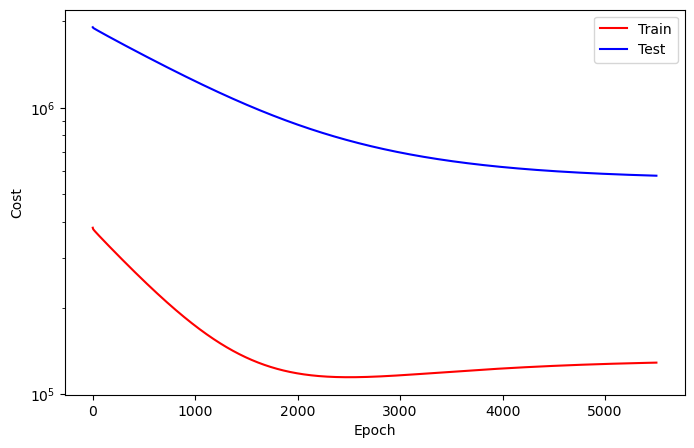

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5501
Train_cost  = 129037.5502 | Test_cost  = 578636.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5502
Train_cost  = 129039.8125 | Test_cost  = 578623.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5503
Train_cost  = 129042.0525 | Test_cost  = 578609.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5504
Train_cost  = 129044.3117 | Test_cost  = 578595.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5505
Train_cost  = 129046.5802 | Test_cost  = 578582.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5506
Train_cost  = 129048.8210 | Test_cost  = 578568.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5507
Train_cost  = 129051.0525 | Test_cost  = 578554.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5508
Train_cost  = 129053.3002 | Test_cost  = 578540.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5509
Train_cost  = 129055.5309 | Test_cost  = 578527.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5510
Train_cost  = 129057.7832 | Test_cost  = 578513.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5511
Train_cost  = 129060.0093 | Test_cost  = 578500.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5512
Train_cost  = 129062.2438 | Test_cost  = 578486.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5513
Train_cost  = 129064.4923 | Test_cost  = 578472.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5514
Train_cost  = 129066.7299 | Test_cost  = 578459.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5515
Train_cost  = 129068.9676 | Test_cost  = 578445.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5516
Train_cost  = 129071.2315 | Test_cost  = 578431.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5517
Train_cost  = 129073.4776 | Test_cost  = 578417.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5518
Train_cost  = 129075.6968 | Test_cost  = 578404.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5519
Train_cost  = 129077.9414 | Test_cost  = 578390.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5520
Train_cost  = 129080.1836 | Test_cost  = 578377.2000 | 


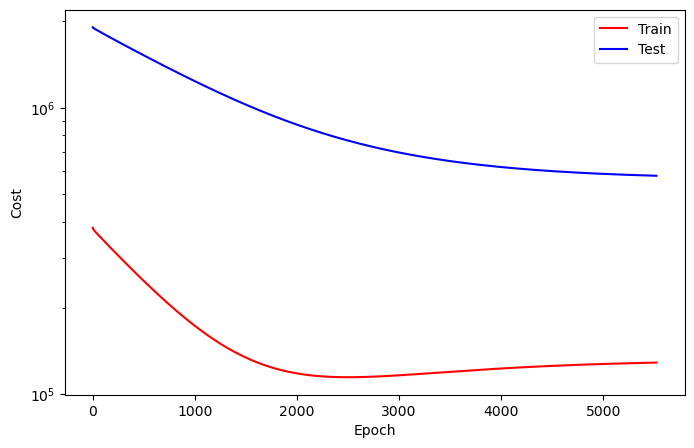

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5521
Train_cost  = 129082.4398 | Test_cost  = 578363.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5522
Train_cost  = 129084.6605 | Test_cost  = 578349.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5523
Train_cost  = 129086.9205 | Test_cost  = 578336.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5524
Train_cost  = 129089.1543 | Test_cost  = 578322.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5525
Train_cost  = 129091.3727 | Test_cost  = 578308.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5526
Train_cost  = 129093.6366 | Test_cost  = 578295.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5527
Train_cost  = 129095.8719 | Test_cost  = 578281.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5528
Train_cost  = 129098.1127 | Test_cost  = 578267.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5529
Train_cost  = 129100.3688 | Test_cost  = 578254.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5530
Train_cost  = 129102.6011 | Test_cost  = 578240.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5531
Train_cost  = 129104.8403 | Test_cost  = 578227.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5532
Train_cost  = 129107.0409 | Test_cost  = 578213.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5533
Train_cost  = 129109.2701 | Test_cost  = 578200.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5534
Train_cost  = 129111.4668 | Test_cost  = 578186.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5535
Train_cost  = 129113.7029 | Test_cost  = 578173.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5536
Train_cost  = 129115.8904 | Test_cost  = 578159.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5537
Train_cost  = 129118.1181 | Test_cost  = 578146.6000 | 


Train:   0%|          | 0/6 [00:01<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5538
Train_cost  = 129120.3032 | Test_cost  = 578133.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5539
Train_cost  = 129122.4699 | Test_cost  = 578120.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5540
Train_cost  = 129124.6613 | Test_cost  = 578106.9500 | 


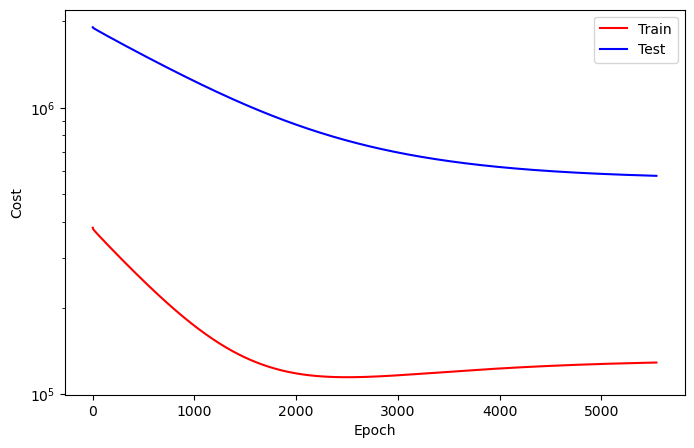

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5541
Train_cost  = 129126.8511 | Test_cost  = 578093.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5542
Train_cost  = 129129.0147 | Test_cost  = 578080.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5543
Train_cost  = 129131.2022 | Test_cost  = 578067.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5544
Train_cost  = 129133.3850 | Test_cost  = 578053.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5545
Train_cost  = 129135.5679 | Test_cost  = 578040.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5546
Train_cost  = 129137.7500 | Test_cost  = 578027.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5547
Train_cost  = 129139.9174 | Test_cost  = 578014.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5548
Train_cost  = 129142.0880 | Test_cost  = 578001.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5549
Train_cost  = 129144.2469 | Test_cost  = 577987.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5550
Train_cost  = 129146.3958 | Test_cost  = 577974.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5551
Train_cost  = 129148.5926 | Test_cost  = 577961.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5552
Train_cost  = 129150.7431 | Test_cost  = 577948.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5553
Train_cost  = 129152.9236 | Test_cost  = 577935.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5554
Train_cost  = 129155.0787 | Test_cost  = 577922.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5555
Train_cost  = 129157.2508 | Test_cost  = 577908.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5556
Train_cost  = 129159.4198 | Test_cost  = 577895.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5557
Train_cost  = 129161.6088 | Test_cost  = 577882.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5558
Train_cost  = 129163.7585 | Test_cost  = 577869.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5559
Train_cost  = 129165.9020 | Test_cost  = 577856.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5560
Train_cost  = 129168.0741 | Test_cost  = 577843.3250 | 


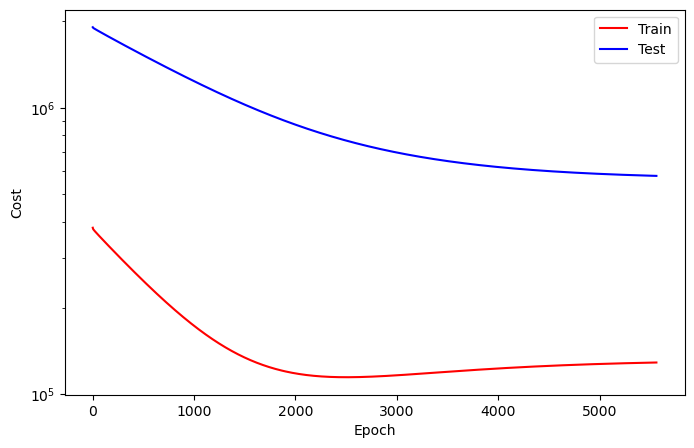

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5561
Train_cost  = 129170.2307 | Test_cost  = 577830.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5562
Train_cost  = 129172.3688 | Test_cost  = 577817.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5563
Train_cost  = 129174.5370 | Test_cost  = 577804.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5564
Train_cost  = 129176.6852 | Test_cost  = 577791.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5565
Train_cost  = 129178.8472 | Test_cost  = 577778.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5566
Train_cost  = 129180.9660 | Test_cost  = 577764.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5567
Train_cost  = 129183.1466 | Test_cost  = 577751.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5568
Train_cost  = 129185.3040 | Test_cost  = 577738.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5569
Train_cost  = 129187.4614 | Test_cost  = 577725.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5570
Train_cost  = 129189.6219 | Test_cost  = 577712.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5571
Train_cost  = 129191.7971 | Test_cost  = 577699.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5572
Train_cost  = 129193.9213 | Test_cost  = 577686.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5573
Train_cost  = 129196.0826 | Test_cost  = 577673.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5574
Train_cost  = 129198.2400 | Test_cost  = 577660.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5575
Train_cost  = 129200.3951 | Test_cost  = 577647.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5576
Train_cost  = 129202.5471 | Test_cost  = 577634.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5577
Train_cost  = 129204.7099 | Test_cost  = 577621.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5578
Train_cost  = 129206.8634 | Test_cost  = 577608.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5579
Train_cost  = 129209.0185 | Test_cost  = 577595.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5580
Train_cost  = 129211.1728 | Test_cost  = 577581.9750 | 


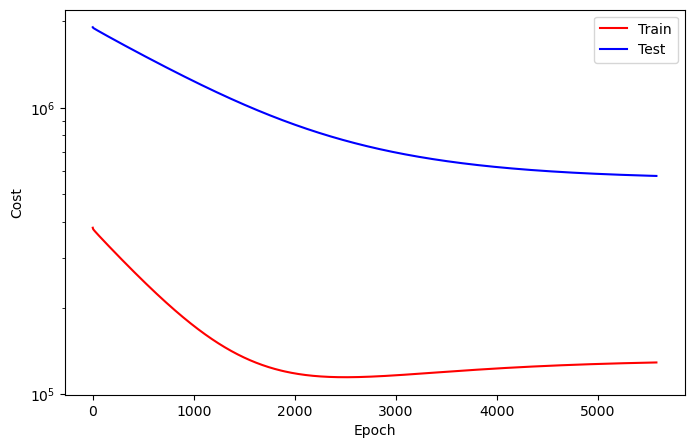

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5581
Train_cost  = 129213.3410 | Test_cost  = 577568.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5582
Train_cost  = 129215.4877 | Test_cost  = 577555.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5583
Train_cost  = 129217.6566 | Test_cost  = 577542.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5584
Train_cost  = 129219.7847 | Test_cost  = 577529.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5585
Train_cost  = 129221.9406 | Test_cost  = 577516.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5586
Train_cost  = 129224.0671 | Test_cost  = 577504.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5587
Train_cost  = 129226.2068 | Test_cost  = 577491.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5588
Train_cost  = 129228.3102 | Test_cost  = 577478.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5589
Train_cost  = 129230.4552 | Test_cost  = 577465.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5590
Train_cost  = 129232.6080 | Test_cost  = 577452.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5591
Train_cost  = 129234.6914 | Test_cost  = 577439.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5592
Train_cost  = 129236.8140 | Test_cost  = 577427.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5593
Train_cost  = 129238.8935 | Test_cost  = 577414.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5594
Train_cost  = 129240.9900 | Test_cost  = 577402.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5595
Train_cost  = 129243.0756 | Test_cost  = 577389.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5596
Train_cost  = 129245.1852 | Test_cost  = 577376.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5597
Train_cost  = 129247.3040 | Test_cost  = 577363.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5598
Train_cost  = 129249.3812 | Test_cost  = 577351.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5599
Train_cost  = 129251.4699 | Test_cost  = 577338.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5600
Train_cost  = 129253.6034 | Test_cost  = 577325.7500 | 


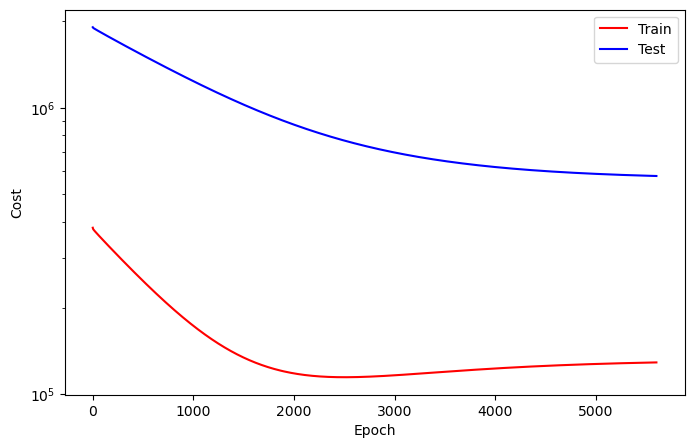

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5601
Train_cost  = 129255.6713 | Test_cost  = 577313.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5602
Train_cost  = 129257.7616 | Test_cost  = 577300.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5603
Train_cost  = 129259.8681 | Test_cost  = 577287.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5604
Train_cost  = 129261.9151 | Test_cost  = 577275.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5605
Train_cost  = 129264.0224 | Test_cost  = 577262.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5606
Train_cost  = 129266.0988 | Test_cost  = 577250.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5607
Train_cost  = 129268.1860 | Test_cost  = 577237.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5608
Train_cost  = 129270.2546 | Test_cost  = 577224.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5609
Train_cost  = 129272.3796 | Test_cost  = 577212.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5610
Train_cost  = 129274.4290 | Test_cost  = 577199.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5611
Train_cost  = 129276.5255 | Test_cost  = 577187.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5612
Train_cost  = 129278.6227 | Test_cost  = 577174.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5613
Train_cost  = 129280.6914 | Test_cost  = 577161.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5614
Train_cost  = 129282.7716 | Test_cost  = 577149.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5615
Train_cost  = 129284.8557 | Test_cost  = 577136.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5616
Train_cost  = 129286.9051 | Test_cost  = 577124.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5617
Train_cost  = 129288.9861 | Test_cost  = 577111.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5618
Train_cost  = 129291.0502 | Test_cost  = 577099.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5619
Train_cost  = 129293.1304 | Test_cost  = 577086.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5620
Train_cost  = 129295.1968 | Test_cost  = 577074.3000 | 


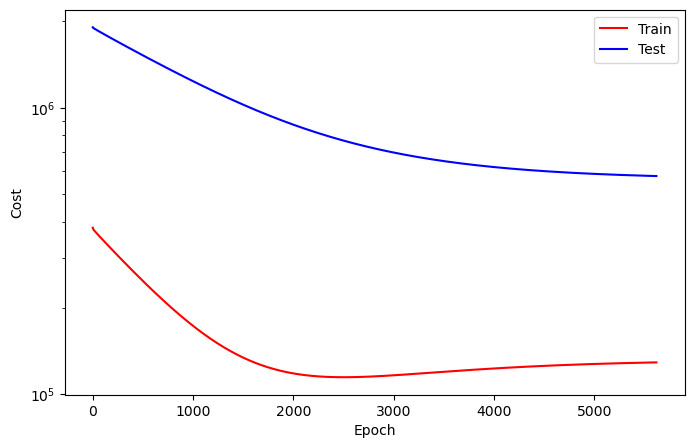

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5621
Train_cost  = 129297.2793 | Test_cost  = 577061.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5622
Train_cost  = 129299.3349 | Test_cost  = 577049.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5623
Train_cost  = 129301.4151 | Test_cost  = 577036.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5624
Train_cost  = 129303.5008 | Test_cost  = 577024.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5625
Train_cost  = 129305.5648 | Test_cost  = 577011.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5626
Train_cost  = 129307.6281 | Test_cost  = 576999.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5627
Train_cost  = 129309.7137 | Test_cost  = 576986.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5628
Train_cost  = 129311.7870 | Test_cost  = 576974.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5629
Train_cost  = 129313.8480 | Test_cost  = 576961.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5630
Train_cost  = 129315.9406 | Test_cost  = 576949.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5631
Train_cost  = 129318.0062 | Test_cost  = 576936.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5632
Train_cost  = 129320.0694 | Test_cost  = 576924.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5633
Train_cost  = 129322.1620 | Test_cost  = 576911.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5634
Train_cost  = 129324.2361 | Test_cost  = 576899.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5635
Train_cost  = 129326.3056 | Test_cost  = 576886.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5636
Train_cost  = 129328.3711 | Test_cost  = 576874.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5637
Train_cost  = 129330.4630 | Test_cost  = 576861.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5638
Train_cost  = 129332.5309 | Test_cost  = 576849.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5639
Train_cost  = 129334.5810 | Test_cost  = 576836.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5640
Train_cost  = 129336.6759 | Test_cost  = 576824.2000 | 


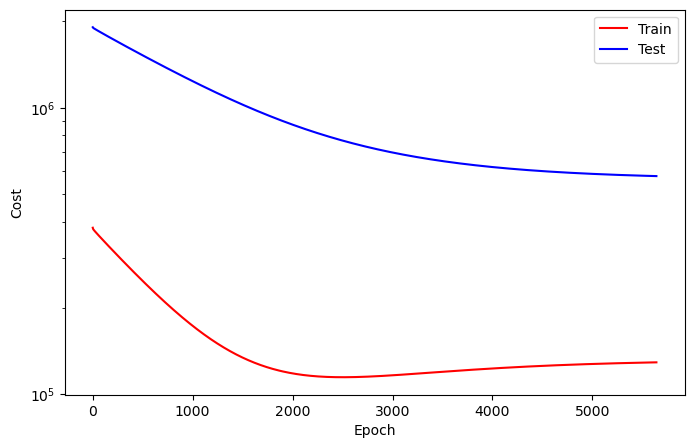

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5641
Train_cost  = 129338.7338 | Test_cost  = 576811.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5642
Train_cost  = 129340.7654 | Test_cost  = 576799.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5643
Train_cost  = 129342.8511 | Test_cost  = 576787.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5644
Train_cost  = 129344.8912 | Test_cost  = 576774.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5645
Train_cost  = 129346.9429 | Test_cost  = 576762.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5646
Train_cost  = 129348.9637 | Test_cost  = 576750.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5647
Train_cost  = 129350.9769 | Test_cost  = 576738.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5648
Train_cost  = 129353.0000 | Test_cost  = 576725.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5649
Train_cost  = 129355.0370 | Test_cost  = 576713.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5650
Train_cost  = 129357.0355 | Test_cost  = 576701.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5651
Train_cost  = 129359.0594 | Test_cost  = 576689.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5652
Train_cost  = 129361.0633 | Test_cost  = 576677.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5653
Train_cost  = 129363.0949 | Test_cost  = 576665.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5654
Train_cost  = 129365.0988 | Test_cost  = 576653.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5655
Train_cost  = 129367.1304 | Test_cost  = 576641.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5656
Train_cost  = 129369.1427 | Test_cost  = 576628.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5657
Train_cost  = 129371.1605 | Test_cost  = 576616.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5658
Train_cost  = 129373.1590 | Test_cost  = 576604.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5659
Train_cost  = 129375.1813 | Test_cost  = 576592.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5660
Train_cost  = 129377.2006 | Test_cost  = 576580.6250 | 


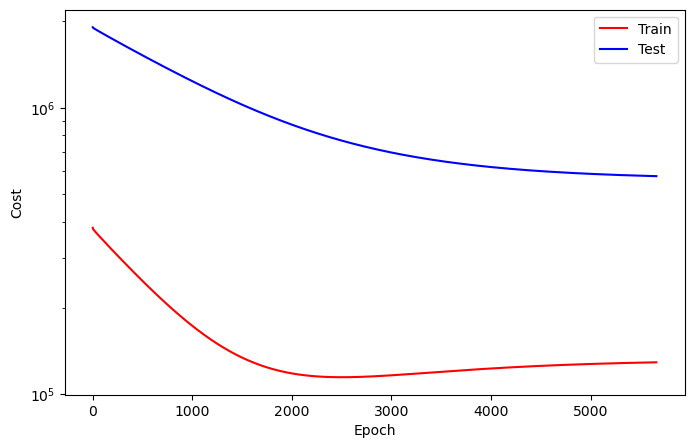

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5661
Train_cost  = 129379.1721 | Test_cost  = 576568.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5662
Train_cost  = 129381.1829 | Test_cost  = 576556.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5663
Train_cost  = 129383.1798 | Test_cost  = 576544.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5664
Train_cost  = 129385.1497 | Test_cost  = 576532.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5665
Train_cost  = 129387.1721 | Test_cost  = 576520.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5666
Train_cost  = 129389.1890 | Test_cost  = 576508.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5667
Train_cost  = 129391.1960 | Test_cost  = 576496.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5668
Train_cost  = 129393.1890 | Test_cost  = 576484.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5669
Train_cost  = 129395.1705 | Test_cost  = 576472.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5670
Train_cost  = 129397.1937 | Test_cost  = 576460.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5671
Train_cost  = 129399.1620 | Test_cost  = 576448.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5672
Train_cost  = 129401.1543 | Test_cost  = 576436.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5673
Train_cost  = 129403.1420 | Test_cost  = 576424.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5674
Train_cost  = 129405.1312 | Test_cost  = 576412.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5675
Train_cost  = 129407.1065 | Test_cost  = 576400.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5676
Train_cost  = 129409.0903 | Test_cost  = 576388.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5677
Train_cost  = 129411.0787 | Test_cost  = 576376.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5678
Train_cost  = 129413.0625 | Test_cost  = 576364.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5679
Train_cost  = 129415.0648 | Test_cost  = 576352.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5680
Train_cost  = 129417.0471 | Test_cost  = 576341.0250 | 


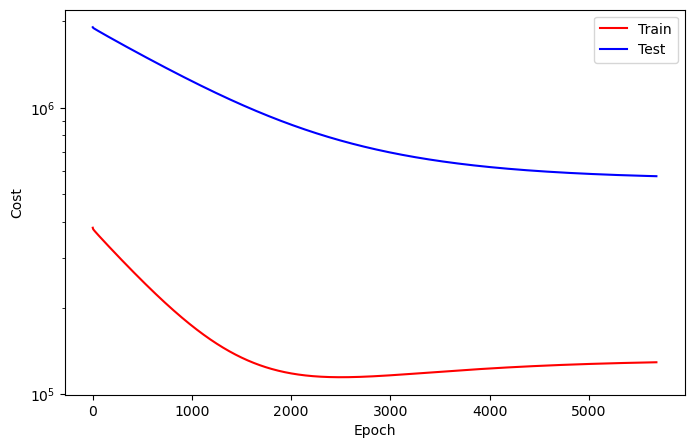

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5681
Train_cost  = 129419.0463 | Test_cost  = 576329.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5682
Train_cost  = 129421.0185 | Test_cost  = 576317.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5683
Train_cost  = 129423.0046 | Test_cost  = 576305.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5684
Train_cost  = 129424.9907 | Test_cost  = 576293.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5685
Train_cost  = 129426.9699 | Test_cost  = 576281.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5686
Train_cost  = 129428.9491 | Test_cost  = 576269.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5687
Train_cost  = 129430.9414 | Test_cost  = 576257.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5688
Train_cost  = 129432.9336 | Test_cost  = 576245.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5689
Train_cost  = 129434.9375 | Test_cost  = 576233.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5690
Train_cost  = 129436.9213 | Test_cost  = 576221.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5691
Train_cost  = 129438.8889 | Test_cost  = 576209.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5692
Train_cost  = 129440.8765 | Test_cost  = 576197.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5693
Train_cost  = 129442.8596 | Test_cost  = 576185.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5694
Train_cost  = 129444.8534 | Test_cost  = 576173.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5695
Train_cost  = 129446.8356 | Test_cost  = 576162.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5696
Train_cost  = 129448.8349 | Test_cost  = 576150.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5697
Train_cost  = 129450.8164 | Test_cost  = 576138.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5698
Train_cost  = 129452.8071 | Test_cost  = 576126.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5699
Train_cost  = 129454.7747 | Test_cost  = 576114.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5700
Train_cost  = 129456.7346 | Test_cost  = 576102.7000 | 


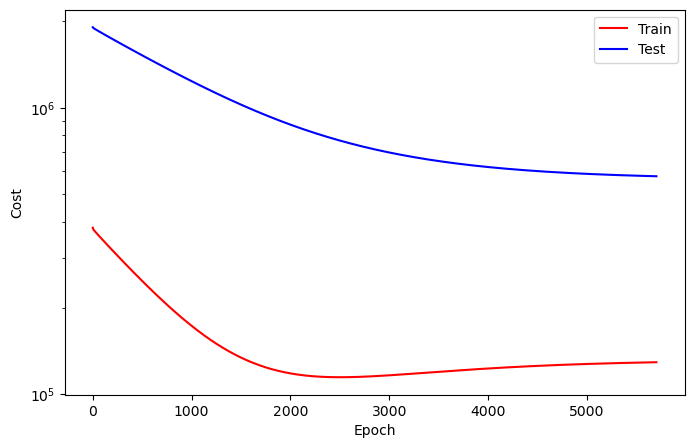

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5701
Train_cost  = 129458.7060 | Test_cost  = 576090.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5702
Train_cost  = 129460.6644 | Test_cost  = 576079.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5703
Train_cost  = 129462.6427 | Test_cost  = 576067.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5704
Train_cost  = 129464.5849 | Test_cost  = 576055.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5705
Train_cost  = 129466.5332 | Test_cost  = 576044.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5706
Train_cost  = 129468.4637 | Test_cost  = 576032.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5707
Train_cost  = 129470.3804 | Test_cost  = 576021.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5708
Train_cost  = 129472.3079 | Test_cost  = 576009.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5709
Train_cost  = 129474.2415 | Test_cost  = 575998.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5710
Train_cost  = 129476.1667 | Test_cost  = 575986.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5711
Train_cost  = 129478.0903 | Test_cost  = 575975.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5712
Train_cost  = 129480.0316 | Test_cost  = 575963.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5713
Train_cost  = 129481.9599 | Test_cost  = 575952.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5714
Train_cost  = 129483.8765 | Test_cost  = 575940.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5715
Train_cost  = 129485.8194 | Test_cost  = 575928.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5716
Train_cost  = 129487.7353 | Test_cost  = 575917.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5717
Train_cost  = 129489.6605 | Test_cost  = 575905.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5718
Train_cost  = 129491.6011 | Test_cost  = 575894.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5719
Train_cost  = 129493.5309 | Test_cost  = 575882.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5720
Train_cost  = 129495.4475 | Test_cost  = 575871.1000 | 


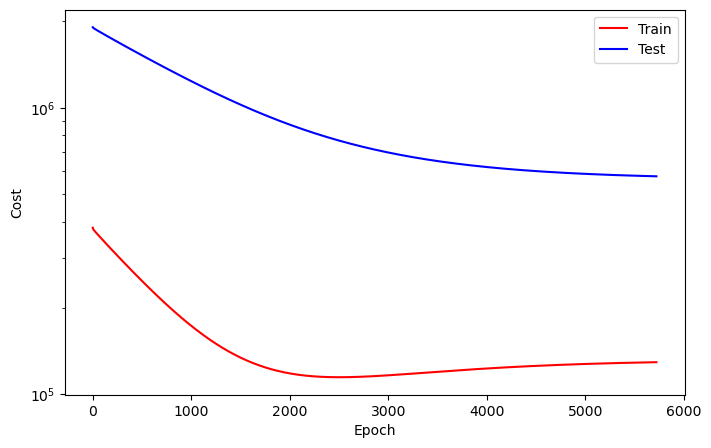

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5721
Train_cost  = 129497.3627 | Test_cost  = 575859.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5722
Train_cost  = 129499.2654 | Test_cost  = 575848.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5723
Train_cost  = 129501.1867 | Test_cost  = 575836.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5724
Train_cost  = 129503.0880 | Test_cost  = 575825.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5725
Train_cost  = 129505.0116 | Test_cost  = 575813.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5726
Train_cost  = 129506.9367 | Test_cost  = 575802.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5727
Train_cost  = 129508.8549 | Test_cost  = 575790.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5728
Train_cost  = 129510.7546 | Test_cost  = 575779.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5729
Train_cost  = 129512.6806 | Test_cost  = 575768.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5730
Train_cost  = 129514.5818 | Test_cost  = 575756.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5731
Train_cost  = 129516.4938 | Test_cost  = 575745.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5732
Train_cost  = 129518.3850 | Test_cost  = 575733.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5733
Train_cost  = 129520.2901 | Test_cost  = 575722.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5734
Train_cost  = 129522.1682 | Test_cost  = 575711.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5735
Train_cost  = 129524.0656 | Test_cost  = 575699.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5736
Train_cost  = 129525.9676 | Test_cost  = 575688.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5737
Train_cost  = 129527.8472 | Test_cost  = 575677.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5738
Train_cost  = 129529.7523 | Test_cost  = 575665.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5739
Train_cost  = 129531.6451 | Test_cost  = 575654.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5740
Train_cost  = 129533.5455 | Test_cost  = 575643.2250 | 


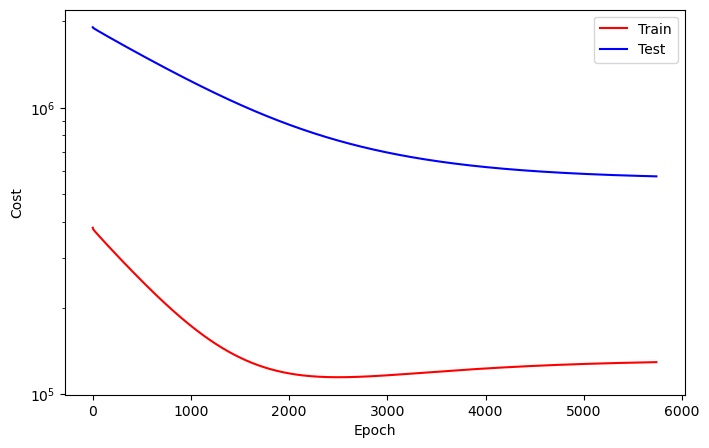

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5741
Train_cost  = 129535.4267 | Test_cost  = 575631.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5742
Train_cost  = 129537.3318 | Test_cost  = 575620.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5743
Train_cost  = 129539.2369 | Test_cost  = 575609.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5744
Train_cost  = 129541.1227 | Test_cost  = 575597.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5745
Train_cost  = 129543.0201 | Test_cost  = 575586.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5746
Train_cost  = 129544.9290 | Test_cost  = 575575.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5747
Train_cost  = 129546.8264 | Test_cost  = 575563.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5748
Train_cost  = 129548.7076 | Test_cost  = 575552.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5749
Train_cost  = 129550.6204 | Test_cost  = 575541.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5750
Train_cost  = 129552.5108 | Test_cost  = 575529.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5751
Train_cost  = 129554.3927 | Test_cost  = 575518.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5752
Train_cost  = 129556.2971 | Test_cost  = 575507.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5753
Train_cost  = 129558.1767 | Test_cost  = 575495.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5754
Train_cost  = 129560.0741 | Test_cost  = 575484.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5755
Train_cost  = 129561.9437 | Test_cost  = 575473.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5756
Train_cost  = 129563.8657 | Test_cost  = 575462.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5757
Train_cost  = 129565.7431 | Test_cost  = 575450.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5758
Train_cost  = 129567.6528 | Test_cost  = 575439.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5759
Train_cost  = 129569.5347 | Test_cost  = 575428.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5760
Train_cost  = 129571.4151 | Test_cost  = 575416.9250 | 


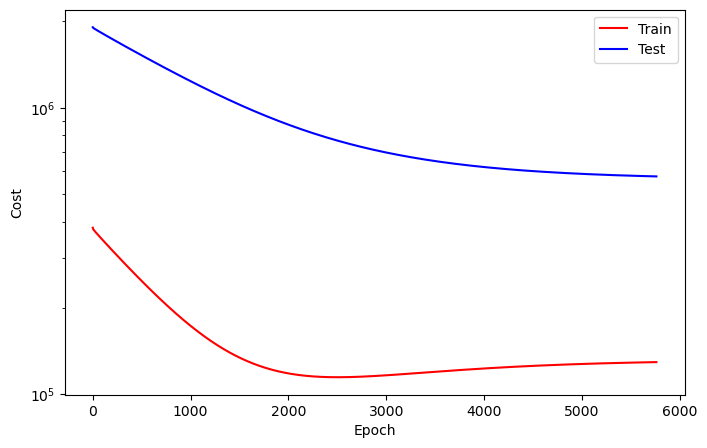

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5761
Train_cost  = 129573.2963 | Test_cost  = 575405.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5762
Train_cost  = 129575.1698 | Test_cost  = 575394.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5763
Train_cost  = 129577.0702 | Test_cost  = 575383.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5764
Train_cost  = 129578.9259 | Test_cost  = 575372.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5765
Train_cost  = 129580.7677 | Test_cost  = 575361.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5766
Train_cost  = 129582.6111 | Test_cost  = 575350.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5767
Train_cost  = 129584.4491 | Test_cost  = 575339.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5768
Train_cost  = 129586.2978 | Test_cost  = 575328.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5769
Train_cost  = 129588.1335 | Test_cost  = 575317.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5770
Train_cost  = 129589.9753 | Test_cost  = 575306.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5771
Train_cost  = 129591.8002 | Test_cost  = 575295.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5772
Train_cost  = 129593.6219 | Test_cost  = 575284.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5773
Train_cost  = 129595.4568 | Test_cost  = 575273.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5774
Train_cost  = 129597.2963 | Test_cost  = 575262.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5775
Train_cost  = 129599.1327 | Test_cost  = 575251.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5776
Train_cost  = 129600.9460 | Test_cost  = 575240.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5777
Train_cost  = 129602.7755 | Test_cost  = 575230.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5778
Train_cost  = 129604.6057 | Test_cost  = 575219.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5779
Train_cost  = 129606.4606 | Test_cost  = 575208.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5780
Train_cost  = 129608.2955 | Test_cost  = 575197.2500 | 


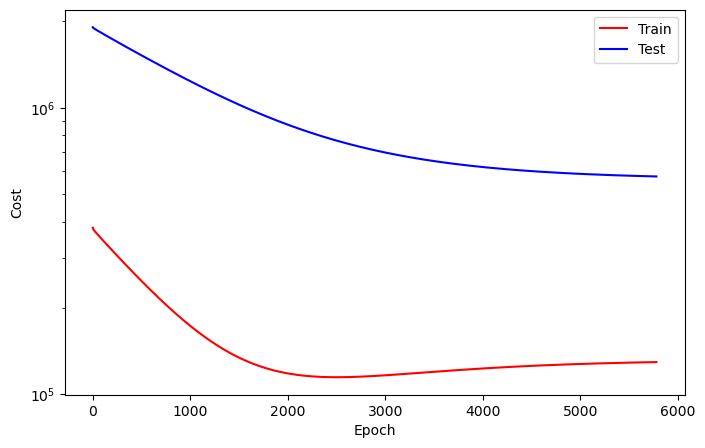

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5781
Train_cost  = 129610.1250 | Test_cost  = 575186.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5782
Train_cost  = 129611.9591 | Test_cost  = 575175.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5783
Train_cost  = 129613.7863 | Test_cost  = 575164.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5784
Train_cost  = 129615.6150 | Test_cost  = 575153.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5785
Train_cost  = 129617.4306 | Test_cost  = 575142.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5786
Train_cost  = 129619.2446 | Test_cost  = 575131.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5787
Train_cost  = 129621.0648 | Test_cost  = 575121.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5788
Train_cost  = 129622.9066 | Test_cost  = 575110.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5789
Train_cost  = 129624.7253 | Test_cost  = 575099.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5790
Train_cost  = 129626.5502 | Test_cost  = 575088.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5791
Train_cost  = 129628.3410 | Test_cost  = 575077.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5792
Train_cost  = 129630.1566 | Test_cost  = 575066.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5793
Train_cost  = 129631.9853 | Test_cost  = 575056.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5794
Train_cost  = 129633.8102 | Test_cost  = 575045.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5795
Train_cost  = 129635.5980 | Test_cost  = 575034.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5796
Train_cost  = 129637.3966 | Test_cost  = 575023.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5797
Train_cost  = 129639.2037 | Test_cost  = 575013.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5798
Train_cost  = 129641.0085 | Test_cost  = 575002.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5799
Train_cost  = 129642.8133 | Test_cost  = 574991.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5800
Train_cost  = 129644.6150 | Test_cost  = 574981.0000 | 


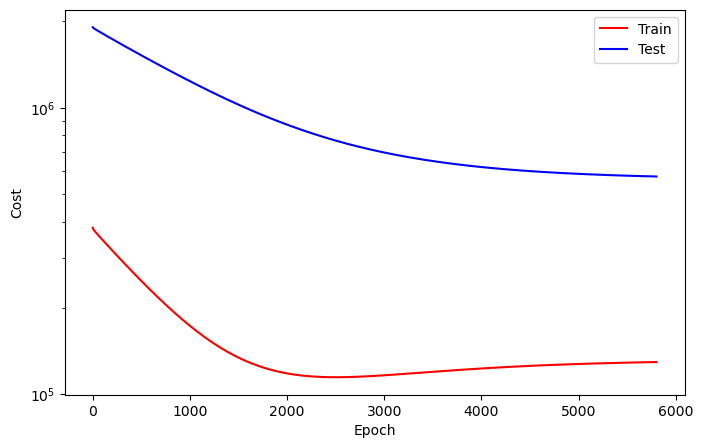

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5801
Train_cost  = 129646.4105 | Test_cost  = 574970.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5802
Train_cost  = 129648.2184 | Test_cost  = 574959.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5803
Train_cost  = 129650.0177 | Test_cost  = 574948.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5804
Train_cost  = 129651.8295 | Test_cost  = 574938.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5805
Train_cost  = 129653.6335 | Test_cost  = 574927.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5806
Train_cost  = 129655.4244 | Test_cost  = 574916.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5807
Train_cost  = 129657.2392 | Test_cost  = 574905.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5808
Train_cost  = 129659.0301 | Test_cost  = 574895.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5809
Train_cost  = 129660.8441 | Test_cost  = 574884.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5810
Train_cost  = 129662.6427 | Test_cost  = 574873.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5811
Train_cost  = 129664.4190 | Test_cost  = 574863.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5812
Train_cost  = 129666.2292 | Test_cost  = 574852.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5813
Train_cost  = 129668.0370 | Test_cost  = 574841.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5814
Train_cost  = 129669.8410 | Test_cost  = 574830.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5815
Train_cost  = 129671.6443 | Test_cost  = 574820.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5816
Train_cost  = 129673.4414 | Test_cost  = 574809.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5817
Train_cost  = 129675.2438 | Test_cost  = 574798.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5818
Train_cost  = 129677.0440 | Test_cost  = 574788.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5819
Train_cost  = 129678.8380 | Test_cost  = 574777.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5820
Train_cost  = 129680.6543 | Test_cost  = 574766.5000 | 


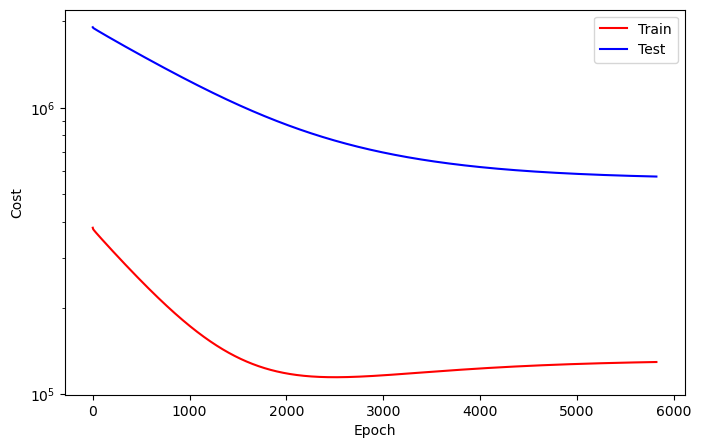

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5821
Train_cost  = 129682.4444 | Test_cost  = 574755.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5822
Train_cost  = 129684.2724 | Test_cost  = 574745.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5823
Train_cost  = 129686.0548 | Test_cost  = 574734.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5824
Train_cost  = 129687.8349 | Test_cost  = 574723.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5825
Train_cost  = 129689.6373 | Test_cost  = 574713.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5826
Train_cost  = 129691.4244 | Test_cost  = 574702.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5827
Train_cost  = 129693.2130 | Test_cost  = 574692.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5828
Train_cost  = 129695.0015 | Test_cost  = 574681.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5829
Train_cost  = 129696.7670 | Test_cost  = 574670.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5830
Train_cost  = 129698.5378 | Test_cost  = 574660.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5831
Train_cost  = 129700.2948 | Test_cost  = 574650.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5832
Train_cost  = 129702.0525 | Test_cost  = 574639.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5833
Train_cost  = 129703.7847 | Test_cost  = 574629.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5834
Train_cost  = 129705.5262 | Test_cost  = 574619.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5835
Train_cost  = 129707.2847 | Test_cost  = 574608.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5836
Train_cost  = 129709.0062 | Test_cost  = 574598.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5837
Train_cost  = 129710.7585 | Test_cost  = 574587.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5838
Train_cost  = 129712.4892 | Test_cost  = 574577.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5839
Train_cost  = 129714.2577 | Test_cost  = 574567.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5840
Train_cost  = 129715.9861 | Test_cost  = 574556.8500 | 


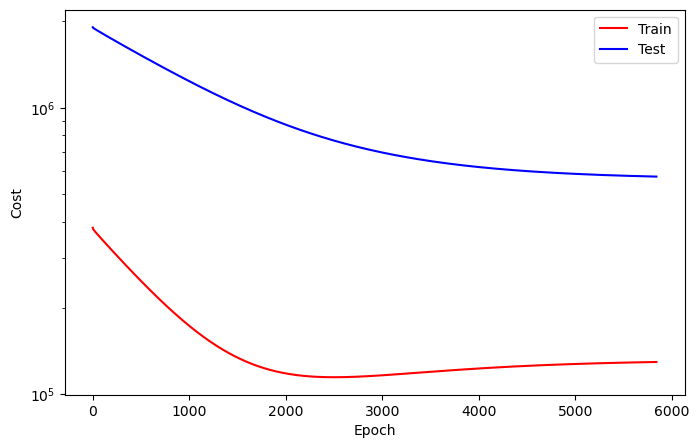

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5841
Train_cost  = 129717.7276 | Test_cost  = 574546.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5842
Train_cost  = 129719.4877 | Test_cost  = 574536.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5843
Train_cost  = 129721.2207 | Test_cost  = 574525.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5844
Train_cost  = 129722.9761 | Test_cost  = 574515.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5845
Train_cost  = 129724.7114 | Test_cost  = 574505.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5846
Train_cost  = 129726.4576 | Test_cost  = 574494.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5847
Train_cost  = 129728.1975 | Test_cost  = 574484.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5848
Train_cost  = 129729.9344 | Test_cost  = 574474.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5849
Train_cost  = 129731.6975 | Test_cost  = 574463.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5850
Train_cost  = 129733.4151 | Test_cost  = 574453.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5851
Train_cost  = 129735.1798 | Test_cost  = 574443.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5852
Train_cost  = 129736.9090 | Test_cost  = 574432.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5853
Train_cost  = 129738.6427 | Test_cost  = 574422.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5854
Train_cost  = 129740.3819 | Test_cost  = 574412.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5855
Train_cost  = 129742.1119 | Test_cost  = 574401.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5856
Train_cost  = 129743.8341 | Test_cost  = 574391.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5857
Train_cost  = 129745.5502 | Test_cost  = 574381.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5858
Train_cost  = 129747.2878 | Test_cost  = 574371.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5859
Train_cost  = 129749.0131 | Test_cost  = 574360.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5860
Train_cost  = 129750.7724 | Test_cost  = 574350.5750 | 


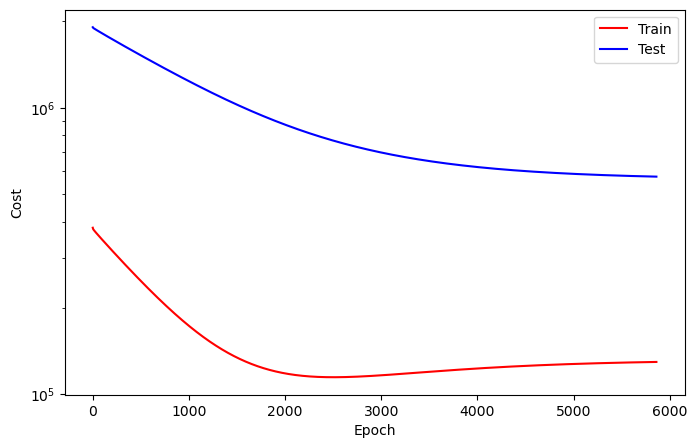

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5861
Train_cost  = 129752.4861 | Test_cost  = 574340.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5862
Train_cost  = 129754.1998 | Test_cost  = 574330.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5863
Train_cost  = 129755.9097 | Test_cost  = 574320.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5864
Train_cost  = 129757.6173 | Test_cost  = 574310.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5865
Train_cost  = 129759.3465 | Test_cost  = 574299.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5866
Train_cost  = 129761.0586 | Test_cost  = 574289.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5867
Train_cost  = 129762.7562 | Test_cost  = 574279.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5868
Train_cost  = 129764.4568 | Test_cost  = 574269.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5869
Train_cost  = 129766.2068 | Test_cost  = 574259.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5870
Train_cost  = 129767.8889 | Test_cost  = 574249.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5871
Train_cost  = 129769.6250 | Test_cost  = 574238.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5872
Train_cost  = 129771.3349 | Test_cost  = 574228.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5873
Train_cost  = 129773.0556 | Test_cost  = 574218.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5874
Train_cost  = 129774.7801 | Test_cost  = 574208.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5875
Train_cost  = 129776.4630 | Test_cost  = 574198.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5876
Train_cost  = 129778.1960 | Test_cost  = 574188.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5877
Train_cost  = 129779.9082 | Test_cost  = 574177.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5878
Train_cost  = 129781.6142 | Test_cost  = 574167.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5879
Train_cost  = 129783.3519 | Test_cost  = 574157.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5880
Train_cost  = 129785.0525 | Test_cost  = 574147.5250 | 


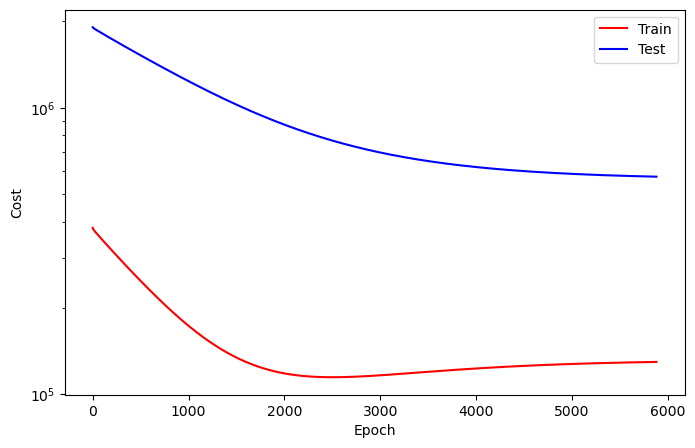

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5881
Train_cost  = 129786.7639 | Test_cost  = 574137.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5882
Train_cost  = 129788.4815 | Test_cost  = 574127.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5883
Train_cost  = 129790.2022 | Test_cost  = 574117.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5884
Train_cost  = 129791.9159 | Test_cost  = 574107.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5885
Train_cost  = 129793.6327 | Test_cost  = 574096.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5886
Train_cost  = 129795.3264 | Test_cost  = 574086.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5887
Train_cost  = 129797.0640 | Test_cost  = 574076.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5888
Train_cost  = 129798.7662 | Test_cost  = 574066.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5889
Train_cost  = 129800.4715 | Test_cost  = 574056.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5890
Train_cost  = 129802.1960 | Test_cost  = 574046.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5891
Train_cost  = 129803.8843 | Test_cost  = 574036.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5892
Train_cost  = 129805.5949 | Test_cost  = 574026.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5893
Train_cost  = 129807.2855 | Test_cost  = 574015.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5894
Train_cost  = 129809.0085 | Test_cost  = 574006.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5895
Train_cost  = 129810.6813 | Test_cost  = 573996.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5896
Train_cost  = 129812.3557 | Test_cost  = 573986.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5897
Train_cost  = 129814.0332 | Test_cost  = 573976.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5898
Train_cost  = 129815.7299 | Test_cost  = 573966.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5899
Train_cost  = 129817.4028 | Test_cost  = 573956.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5900
Train_cost  = 129819.0926 | Test_cost  = 573946.6500 | 


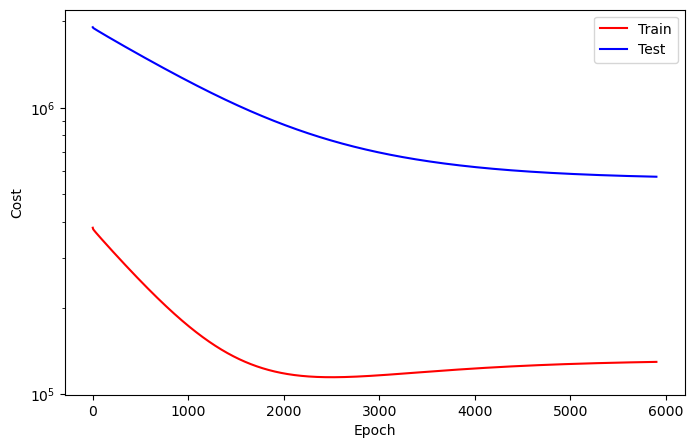

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5901
Train_cost  = 129820.7215 | Test_cost  = 573936.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5902
Train_cost  = 129822.3696 | Test_cost  = 573926.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5903
Train_cost  = 129824.0293 | Test_cost  = 573917.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5904
Train_cost  = 129825.6775 | Test_cost  = 573907.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5905
Train_cost  = 129827.3465 | Test_cost  = 573897.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5906
Train_cost  = 129829.0100 | Test_cost  = 573887.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5907
Train_cost  = 129830.6597 | Test_cost  = 573877.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5908
Train_cost  = 129832.3125 | Test_cost  = 573868.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5909
Train_cost  = 129833.9745 | Test_cost  = 573858.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5910
Train_cost  = 129835.6296 | Test_cost  = 573848.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5911
Train_cost  = 129837.2963 | Test_cost  = 573838.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5912
Train_cost  = 129838.9367 | Test_cost  = 573829.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5913
Train_cost  = 129840.5872 | Test_cost  = 573819.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5914
Train_cost  = 129842.2485 | Test_cost  = 573809.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5915
Train_cost  = 129843.9128 | Test_cost  = 573799.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5916
Train_cost  = 129845.5548 | Test_cost  = 573790.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5917
Train_cost  = 129847.2083 | Test_cost  = 573780.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5918
Train_cost  = 129848.8627 | Test_cost  = 573770.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5919
Train_cost  = 129850.5231 | Test_cost  = 573760.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5920
Train_cost  = 129852.1813 | Test_cost  = 573750.8750 | 


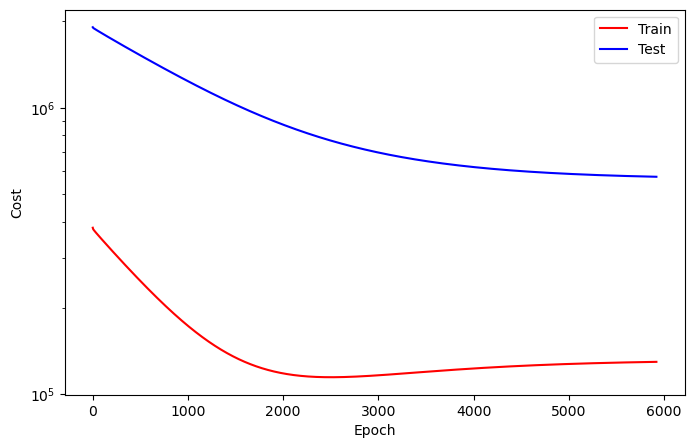

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5921
Train_cost  = 129853.8225 | Test_cost  = 573741.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5922
Train_cost  = 129855.4853 | Test_cost  = 573731.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5923
Train_cost  = 129857.1566 | Test_cost  = 573721.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5924
Train_cost  = 129858.8225 | Test_cost  = 573711.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5925
Train_cost  = 129860.4367 | Test_cost  = 573702.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5926
Train_cost  = 129862.0833 | Test_cost  = 573692.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5927
Train_cost  = 129863.7284 | Test_cost  = 573682.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5928
Train_cost  = 129865.3449 | Test_cost  = 573673.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5929
Train_cost  = 129866.9846 | Test_cost  = 573663.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5930
Train_cost  = 129868.6420 | Test_cost  = 573653.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5931
Train_cost  = 129870.3009 | Test_cost  = 573643.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5932
Train_cost  = 129871.9398 | Test_cost  = 573634.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5933
Train_cost  = 129873.5463 | Test_cost  = 573624.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5934
Train_cost  = 129875.1883 | Test_cost  = 573615.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5935
Train_cost  = 129876.7986 | Test_cost  = 573605.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5936
Train_cost  = 129878.4113 | Test_cost  = 573596.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5937
Train_cost  = 129880.0471 | Test_cost  = 573586.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5938
Train_cost  = 129881.6767 | Test_cost  = 573576.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5939
Train_cost  = 129883.3009 | Test_cost  = 573567.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5940
Train_cost  = 129884.9113 | Test_cost  = 573557.7750 | 


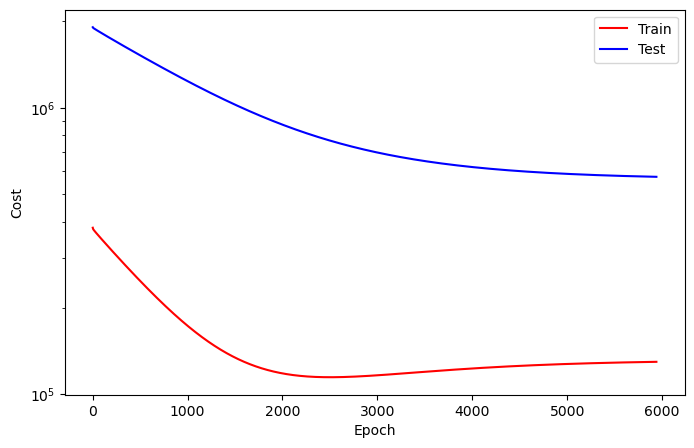

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5941
Train_cost  = 129886.5494 | Test_cost  = 573548.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5942
Train_cost  = 129888.1752 | Test_cost  = 573538.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5943
Train_cost  = 129889.7770 | Test_cost  = 573529.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5944
Train_cost  = 129891.4313 | Test_cost  = 573519.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5945
Train_cost  = 129893.0463 | Test_cost  = 573509.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5946
Train_cost  = 129894.6644 | Test_cost  = 573500.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5947
Train_cost  = 129896.2909 | Test_cost  = 573490.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5948
Train_cost  = 129897.9020 | Test_cost  = 573481.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5949
Train_cost  = 129899.5448 | Test_cost  = 573471.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5950
Train_cost  = 129901.1520 | Test_cost  = 573461.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5951
Train_cost  = 129902.7855 | Test_cost  = 573452.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5952
Train_cost  = 129904.4066 | Test_cost  = 573442.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5953
Train_cost  = 129906.0301 | Test_cost  = 573433.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5954
Train_cost  = 129907.6412 | Test_cost  = 573423.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5955
Train_cost  = 129909.2801 | Test_cost  = 573414.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5956
Train_cost  = 129910.8958 | Test_cost  = 573404.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5957
Train_cost  = 129912.5154 | Test_cost  = 573394.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5958
Train_cost  = 129914.1289 | Test_cost  = 573385.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5959
Train_cost  = 129915.7577 | Test_cost  = 573375.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5960
Train_cost  = 129917.4097 | Test_cost  = 573366.3250 | 


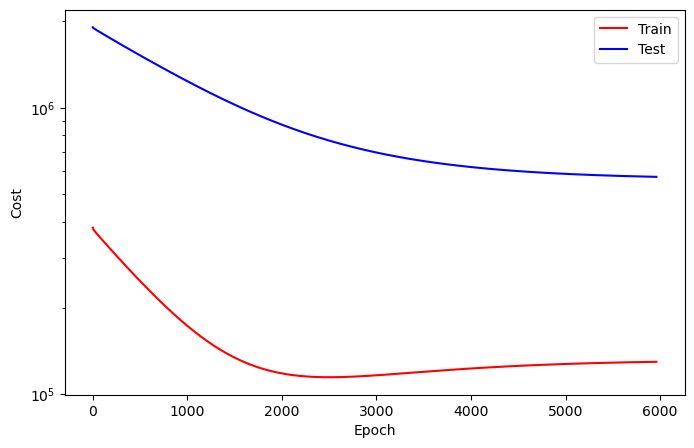

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5961
Train_cost  = 129919.0031 | Test_cost  = 573356.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5962
Train_cost  = 129920.6304 | Test_cost  = 573347.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5963
Train_cost  = 129922.2716 | Test_cost  = 573337.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5964
Train_cost  = 129923.8426 | Test_cost  = 573328.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5965
Train_cost  = 129925.4630 | Test_cost  = 573318.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5966
Train_cost  = 129927.0826 | Test_cost  = 573309.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5967
Train_cost  = 129928.6821 | Test_cost  = 573300.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5968
Train_cost  = 129930.2608 | Test_cost  = 573290.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5969
Train_cost  = 129931.8519 | Test_cost  = 573281.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5970
Train_cost  = 129933.4668 | Test_cost  = 573272.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5971
Train_cost  = 129935.0208 | Test_cost  = 573262.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5972
Train_cost  = 129936.6404 | Test_cost  = 573253.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5973
Train_cost  = 129938.2184 | Test_cost  = 573244.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5974
Train_cost  = 129939.7677 | Test_cost  = 573234.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5975
Train_cost  = 129941.3225 | Test_cost  = 573225.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5976
Train_cost  = 129942.8858 | Test_cost  = 573216.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5977
Train_cost  = 129944.4691 | Test_cost  = 573207.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5978
Train_cost  = 129946.0185 | Test_cost  = 573198.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5979
Train_cost  = 129947.5802 | Test_cost  = 573189.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5980
Train_cost  = 129949.1427 | Test_cost  = 573179.7750 | 


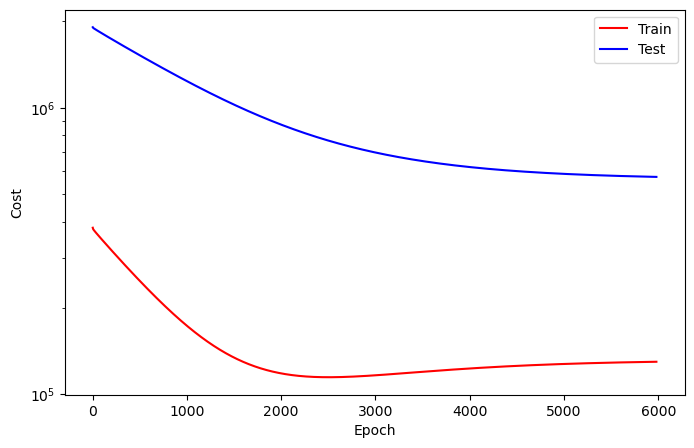

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5981
Train_cost  = 129950.7029 | Test_cost  = 573170.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5982
Train_cost  = 129952.2569 | Test_cost  = 573161.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5983
Train_cost  = 129953.8233 | Test_cost  = 573152.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5984
Train_cost  = 129955.3704 | Test_cost  = 573143.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5985
Train_cost  = 129956.9259 | Test_cost  = 573133.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5986
Train_cost  = 129958.4907 | Test_cost  = 573124.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5987
Train_cost  = 129960.0802 | Test_cost  = 573115.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5988
Train_cost  = 129961.6242 | Test_cost  = 573106.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5989
Train_cost  = 129963.1813 | Test_cost  = 573097.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5990
Train_cost  = 129964.7477 | Test_cost  = 573088.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5991
Train_cost  = 129966.2894 | Test_cost  = 573078.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5992
Train_cost  = 129967.8627 | Test_cost  = 573069.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5993
Train_cost  = 129969.4352 | Test_cost  = 573060.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5994
Train_cost  = 129971.0093 | Test_cost  = 573051.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5995
Train_cost  = 129972.5370 | Test_cost  = 573042.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5996
Train_cost  = 129974.1073 | Test_cost  = 573032.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5997
Train_cost  = 129975.6705 | Test_cost  = 573023.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5998
Train_cost  = 129977.2137 | Test_cost  = 573014.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  5999
Train_cost  = 129978.7870 | Test_cost  = 573005.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6000
Train_cost  = 129980.3248 | Test_cost  = 572996.4500 | 


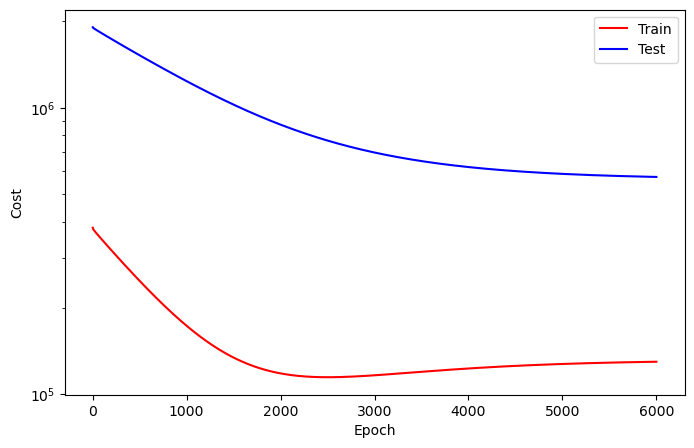

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6001
Train_cost  = 129981.8989 | Test_cost  = 572987.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6002
Train_cost  = 129983.4552 | Test_cost  = 572978.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6003
Train_cost  = 129984.9614 | Test_cost  = 572969.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6004
Train_cost  = 129986.5077 | Test_cost  = 572960.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6005
Train_cost  = 129988.0586 | Test_cost  = 572951.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6006
Train_cost  = 129989.5988 | Test_cost  = 572941.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6007
Train_cost  = 129991.1512 | Test_cost  = 572932.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6008
Train_cost  = 129992.6674 | Test_cost  = 572923.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6009
Train_cost  = 129994.2037 | Test_cost  = 572915.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6010
Train_cost  = 129995.7384 | Test_cost  = 572906.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6011
Train_cost  = 129997.2747 | Test_cost  = 572897.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6012
Train_cost  = 129998.8187 | Test_cost  = 572888.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6013
Train_cost  = 130000.3202 | Test_cost  = 572879.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6014
Train_cost  = 130001.8472 | Test_cost  = 572870.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6015
Train_cost  = 130003.3704 | Test_cost  = 572861.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6016
Train_cost  = 130004.9035 | Test_cost  = 572852.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6017
Train_cost  = 130006.4167 | Test_cost  = 572843.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6018
Train_cost  = 130007.9599 | Test_cost  = 572834.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6019
Train_cost  = 130009.4938 | Test_cost  = 572825.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6020
Train_cost  = 130011.0031 | Test_cost  = 572816.3000 | 


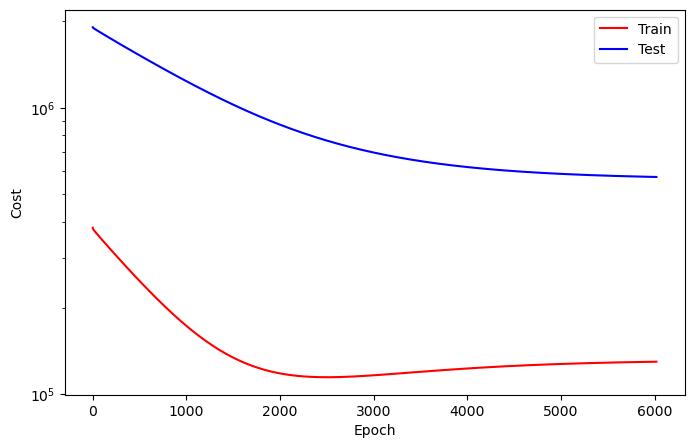

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6021
Train_cost  = 130012.5494 | Test_cost  = 572807.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6022
Train_cost  = 130014.0849 | Test_cost  = 572798.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6023
Train_cost  = 130015.6088 | Test_cost  = 572789.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6024
Train_cost  = 130017.1350 | Test_cost  = 572780.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6025
Train_cost  = 130018.6597 | Test_cost  = 572771.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6026
Train_cost  = 130020.1782 | Test_cost  = 572762.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6027
Train_cost  = 130021.7238 | Test_cost  = 572753.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6028
Train_cost  = 130023.2423 | Test_cost  = 572744.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6029
Train_cost  = 130024.7654 | Test_cost  = 572735.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6030
Train_cost  = 130026.2901 | Test_cost  = 572726.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6031
Train_cost  = 130027.8264 | Test_cost  = 572717.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6032
Train_cost  = 130029.3457 | Test_cost  = 572708.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6033
Train_cost  = 130030.8542 | Test_cost  = 572699.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6034
Train_cost  = 130032.4090 | Test_cost  = 572690.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6035
Train_cost  = 130033.9190 | Test_cost  = 572681.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6036
Train_cost  = 130035.4437 | Test_cost  = 572673.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6037
Train_cost  = 130036.9660 | Test_cost  = 572663.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6038
Train_cost  = 130038.5123 | Test_cost  = 572655.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6039
Train_cost  = 130040.0108 | Test_cost  = 572646.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6040
Train_cost  = 130041.5123 | Test_cost  = 572637.3000 | 


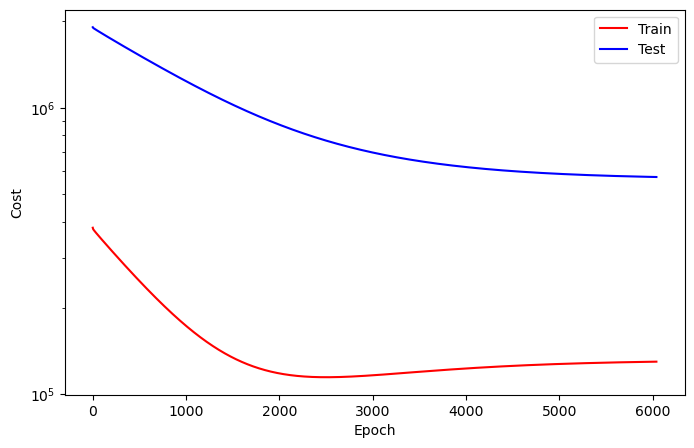

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6041
Train_cost  = 130043.0432 | Test_cost  = 572628.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6042
Train_cost  = 130044.5733 | Test_cost  = 572619.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6043
Train_cost  = 130046.0556 | Test_cost  = 572610.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6044
Train_cost  = 130047.5486 | Test_cost  = 572602.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6045
Train_cost  = 130049.0563 | Test_cost  = 572593.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6046
Train_cost  = 130050.5463 | Test_cost  = 572584.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6047
Train_cost  = 130052.0324 | Test_cost  = 572575.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6048
Train_cost  = 130053.5170 | Test_cost  = 572567.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6049
Train_cost  = 130055.0224 | Test_cost  = 572558.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6050
Train_cost  = 130056.5162 | Test_cost  = 572549.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6051
Train_cost  = 130057.9992 | Test_cost  = 572541.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6052
Train_cost  = 130059.4931 | Test_cost  = 572532.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6053
Train_cost  = 130060.9583 | Test_cost  = 572523.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6054
Train_cost  = 130062.4035 | Test_cost  = 572515.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6055
Train_cost  = 130063.8843 | Test_cost  = 572506.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6056
Train_cost  = 130065.3449 | Test_cost  = 572498.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6057
Train_cost  = 130066.8025 | Test_cost  = 572489.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6058
Train_cost  = 130068.2539 | Test_cost  = 572481.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6059
Train_cost  = 130069.7284 | Test_cost  = 572472.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6060
Train_cost  = 130071.1674 | Test_cost  = 572463.9000 | 


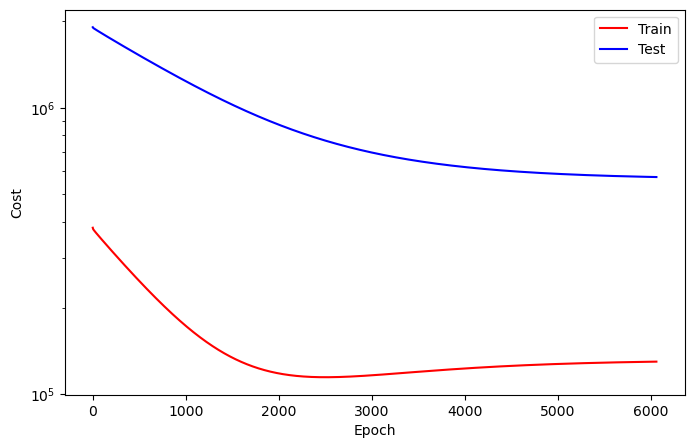

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6061
Train_cost  = 130072.6481 | Test_cost  = 572455.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6062
Train_cost  = 130074.1011 | Test_cost  = 572446.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6063
Train_cost  = 130075.5633 | Test_cost  = 572438.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6064
Train_cost  = 130077.0185 | Test_cost  = 572429.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6065
Train_cost  = 130078.5224 | Test_cost  = 572420.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6066
Train_cost  = 130079.9676 | Test_cost  = 572412.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6067
Train_cost  = 130081.4360 | Test_cost  = 572403.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6068
Train_cost  = 130082.8873 | Test_cost  = 572395.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6069
Train_cost  = 130084.3657 | Test_cost  = 572386.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6070
Train_cost  = 130085.7986 | Test_cost  = 572378.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6071
Train_cost  = 130087.2840 | Test_cost  = 572369.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6072
Train_cost  = 130088.7369 | Test_cost  = 572361.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6073
Train_cost  = 130090.1991 | Test_cost  = 572352.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6074
Train_cost  = 130091.6728 | Test_cost  = 572343.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6075
Train_cost  = 130093.1404 | Test_cost  = 572335.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6076
Train_cost  = 130094.5841 | Test_cost  = 572326.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6077
Train_cost  = 130096.0633 | Test_cost  = 572318.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6078
Train_cost  = 130097.5293 | Test_cost  = 572309.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6079
Train_cost  = 130098.9715 | Test_cost  = 572301.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6080
Train_cost  = 130100.4390 | Test_cost  = 572292.6250 | 


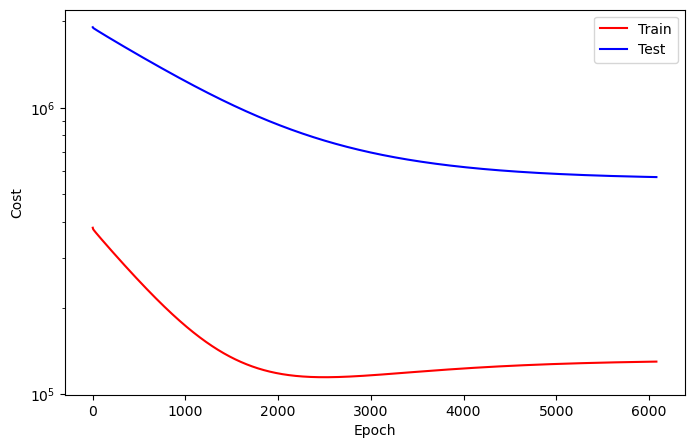

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6081
Train_cost  = 130101.9051 | Test_cost  = 572283.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6082
Train_cost  = 130103.3588 | Test_cost  = 572275.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6083
Train_cost  = 130104.8140 | Test_cost  = 572267.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6084
Train_cost  = 130106.2654 | Test_cost  = 572258.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6085
Train_cost  = 130107.7106 | Test_cost  = 572250.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6086
Train_cost  = 130109.1551 | Test_cost  = 572241.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6087
Train_cost  = 130110.5849 | Test_cost  = 572233.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6088
Train_cost  = 130112.0270 | Test_cost  = 572225.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6089
Train_cost  = 130113.4722 | Test_cost  = 572216.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6090
Train_cost  = 130114.8997 | Test_cost  = 572208.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6091
Train_cost  = 130116.3171 | Test_cost  = 572199.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6092
Train_cost  = 130117.7677 | Test_cost  = 572191.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6093
Train_cost  = 130119.1844 | Test_cost  = 572183.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6094
Train_cost  = 130120.6235 | Test_cost  = 572174.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6095
Train_cost  = 130122.0363 | Test_cost  = 572166.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6096
Train_cost  = 130123.5039 | Test_cost  = 572158.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6097
Train_cost  = 130124.9282 | Test_cost  = 572149.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6098
Train_cost  = 130126.3596 | Test_cost  = 572141.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6099
Train_cost  = 130127.7832 | Test_cost  = 572132.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6100
Train_cost  = 130129.2353 | Test_cost  = 572124.5750 | 


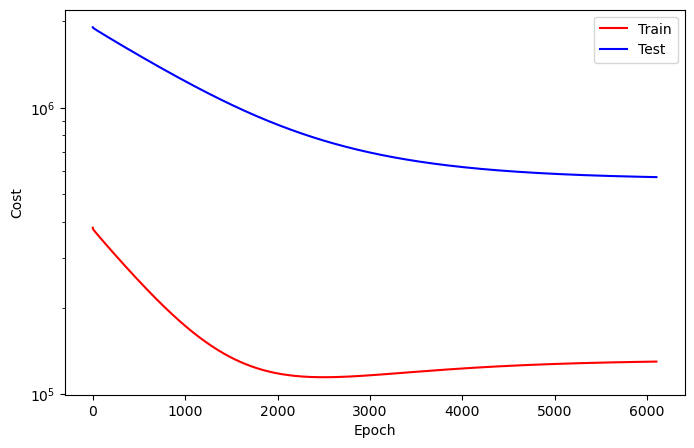

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6101
Train_cost  = 130130.6543 | Test_cost  = 572115.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6102
Train_cost  = 130132.1088 | Test_cost  = 572107.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6103
Train_cost  = 130133.5201 | Test_cost  = 572099.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6104
Train_cost  = 130134.9614 | Test_cost  = 572091.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6105
Train_cost  = 130136.3951 | Test_cost  = 572082.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6106
Train_cost  = 130137.8387 | Test_cost  = 572074.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6107
Train_cost  = 130139.2531 | Test_cost  = 572065.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6108
Train_cost  = 130140.6968 | Test_cost  = 572057.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6109
Train_cost  = 130142.1173 | Test_cost  = 572049.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6110
Train_cost  = 130143.5864 | Test_cost  = 572040.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6111
Train_cost  = 130144.9846 | Test_cost  = 572032.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6112
Train_cost  = 130146.4390 | Test_cost  = 572023.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6113
Train_cost  = 130147.8750 | Test_cost  = 572015.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6114
Train_cost  = 130149.2870 | Test_cost  = 572007.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6115
Train_cost  = 130150.7384 | Test_cost  = 571998.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6116
Train_cost  = 130152.1759 | Test_cost  = 571990.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6117
Train_cost  = 130153.5887 | Test_cost  = 571982.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6118
Train_cost  = 130155.0285 | Test_cost  = 571973.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6119
Train_cost  = 130156.4676 | Test_cost  = 571965.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6120
Train_cost  = 130157.9012 | Test_cost  = 571957.1000 | 


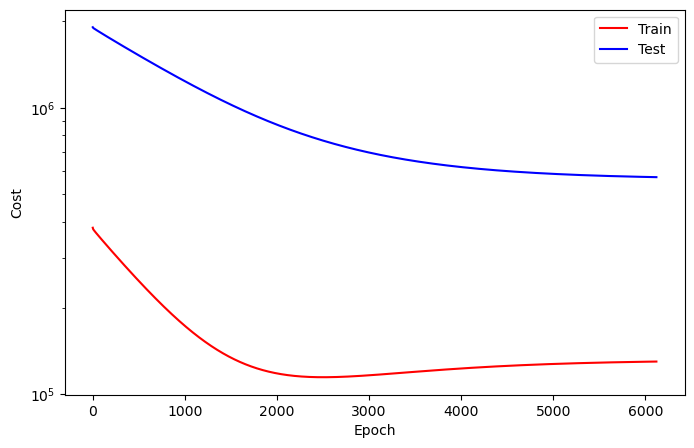

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6121
Train_cost  = 130159.3272 | Test_cost  = 571948.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6122
Train_cost  = 130160.7446 | Test_cost  = 571940.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6123
Train_cost  = 130162.1466 | Test_cost  = 571932.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6124
Train_cost  = 130163.5702 | Test_cost  = 571924.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6125
Train_cost  = 130164.9460 | Test_cost  = 571916.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6126
Train_cost  = 130166.3596 | Test_cost  = 571907.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6127
Train_cost  = 130167.7616 | Test_cost  = 571899.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6128
Train_cost  = 130169.1644 | Test_cost  = 571891.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6129
Train_cost  = 130170.5633 | Test_cost  = 571883.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6130
Train_cost  = 130171.9738 | Test_cost  = 571875.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6131
Train_cost  = 130173.3549 | Test_cost  = 571867.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6132
Train_cost  = 130174.7600 | Test_cost  = 571858.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6133
Train_cost  = 130176.1543 | Test_cost  = 571850.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6134
Train_cost  = 130177.5185 | Test_cost  = 571842.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6135
Train_cost  = 130178.9167 | Test_cost  = 571834.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6136
Train_cost  = 130180.3086 | Test_cost  = 571826.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6137
Train_cost  = 130181.6875 | Test_cost  = 571818.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6138
Train_cost  = 130183.0532 | Test_cost  = 571810.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6139
Train_cost  = 130184.4282 | Test_cost  = 571802.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6140
Train_cost  = 130185.7886 | Test_cost  = 571794.5250 | 


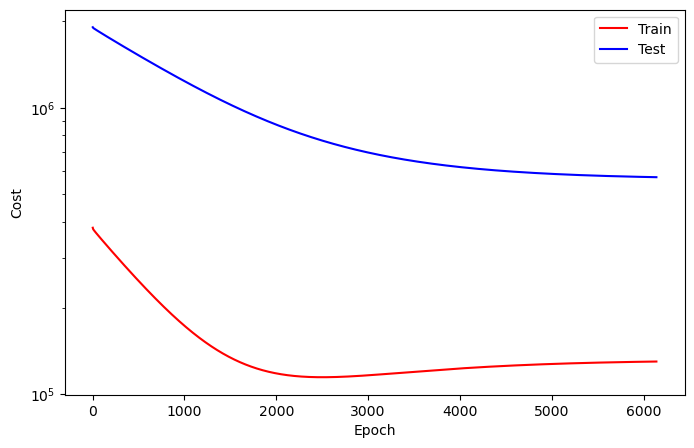

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6141
Train_cost  = 130187.1752 | Test_cost  = 571786.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6142
Train_cost  = 130188.5494 | Test_cost  = 571778.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6143
Train_cost  = 130189.9151 | Test_cost  = 571770.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6144
Train_cost  = 130191.2747 | Test_cost  = 571762.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6145
Train_cost  = 130192.6451 | Test_cost  = 571754.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6146
Train_cost  = 130194.0340 | Test_cost  = 571746.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6147
Train_cost  = 130195.3920 | Test_cost  = 571738.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6148
Train_cost  = 130196.7716 | Test_cost  = 571730.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6149
Train_cost  = 130198.1489 | Test_cost  = 571722.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6150
Train_cost  = 130199.5278 | Test_cost  = 571714.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6151
Train_cost  = 130200.9028 | Test_cost  = 571706.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6152
Train_cost  = 130202.2693 | Test_cost  = 571698.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6153
Train_cost  = 130203.6373 | Test_cost  = 571690.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6154
Train_cost  = 130205.0100 | Test_cost  = 571682.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6155
Train_cost  = 130206.3835 | Test_cost  = 571674.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6156
Train_cost  = 130207.7477 | Test_cost  = 571666.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6157
Train_cost  = 130209.1227 | Test_cost  = 571658.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6158
Train_cost  = 130210.5131 | Test_cost  = 571650.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6159
Train_cost  = 130211.8789 | Test_cost  = 571642.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6160
Train_cost  = 130213.2515 | Test_cost  = 571634.7250 | 


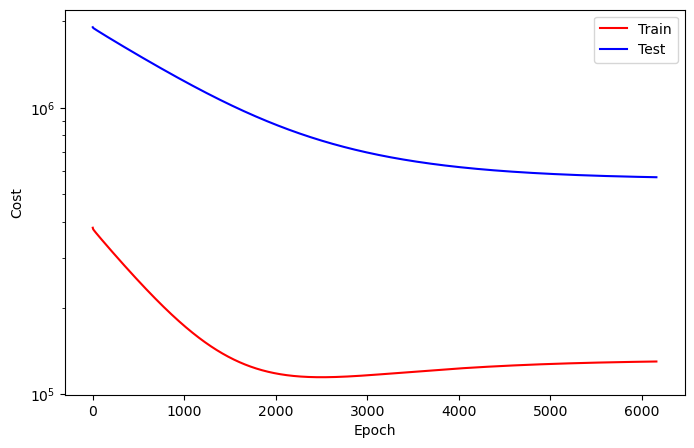

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6161
Train_cost  = 130214.6011 | Test_cost  = 571626.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6162
Train_cost  = 130215.9931 | Test_cost  = 571618.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6163
Train_cost  = 130217.3580 | Test_cost  = 571610.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6164
Train_cost  = 130218.7369 | Test_cost  = 571602.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6165
Train_cost  = 130220.0957 | Test_cost  = 571594.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6166
Train_cost  = 130221.4915 | Test_cost  = 571586.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6167
Train_cost  = 130222.8557 | Test_cost  = 571578.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6168
Train_cost  = 130224.2346 | Test_cost  = 571570.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6169
Train_cost  = 130225.6057 | Test_cost  = 571562.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6170
Train_cost  = 130226.9437 | Test_cost  = 571554.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6171
Train_cost  = 130228.3171 | Test_cost  = 571546.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6172
Train_cost  = 130229.6867 | Test_cost  = 571538.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6173
Train_cost  = 130231.0301 | Test_cost  = 571531.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6174
Train_cost  = 130232.3866 | Test_cost  = 571523.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6175
Train_cost  = 130233.7037 | Test_cost  = 571515.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6176
Train_cost  = 130235.0502 | Test_cost  = 571507.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6177
Train_cost  = 130236.3804 | Test_cost  = 571499.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6178
Train_cost  = 130237.7539 | Test_cost  = 571492.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6179
Train_cost  = 130239.1065 | Test_cost  = 571484.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6180
Train_cost  = 130240.4205 | Test_cost  = 571476.4500 | 


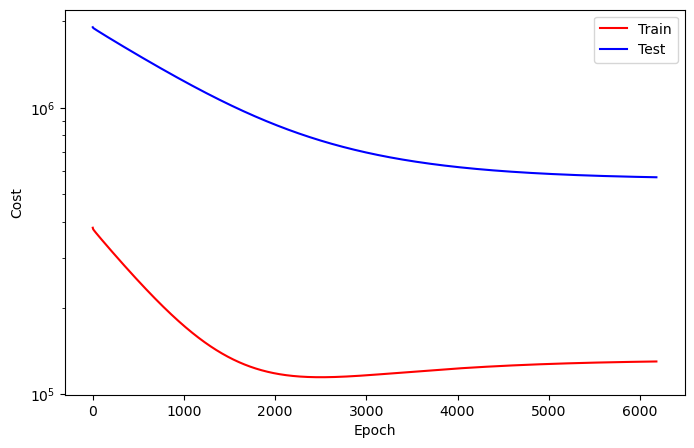

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6181
Train_cost  = 130241.7654 | Test_cost  = 571468.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6182
Train_cost  = 130243.1042 | Test_cost  = 571460.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6183
Train_cost  = 130244.4545 | Test_cost  = 571453.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6184
Train_cost  = 130245.7955 | Test_cost  = 571445.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6185
Train_cost  = 130247.1389 | Test_cost  = 571437.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6186
Train_cost  = 130248.4745 | Test_cost  = 571429.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6187
Train_cost  = 130249.8079 | Test_cost  = 571421.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6188
Train_cost  = 130251.1713 | Test_cost  = 571413.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6189
Train_cost  = 130252.5224 | Test_cost  = 571406.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6190
Train_cost  = 130253.8611 | Test_cost  = 571398.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6191
Train_cost  = 130255.1698 | Test_cost  = 571390.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6192
Train_cost  = 130256.5309 | Test_cost  = 571382.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6193
Train_cost  = 130257.9043 | Test_cost  = 571375.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6194
Train_cost  = 130259.2076 | Test_cost  = 571367.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6195
Train_cost  = 130260.5556 | Test_cost  = 571359.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6196
Train_cost  = 130261.8796 | Test_cost  = 571351.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6197
Train_cost  = 130263.2199 | Test_cost  = 571343.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6198
Train_cost  = 130264.5787 | Test_cost  = 571336.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6199
Train_cost  = 130265.9105 | Test_cost  = 571328.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6200
Train_cost  = 130267.2662 | Test_cost  = 571320.4500 | 


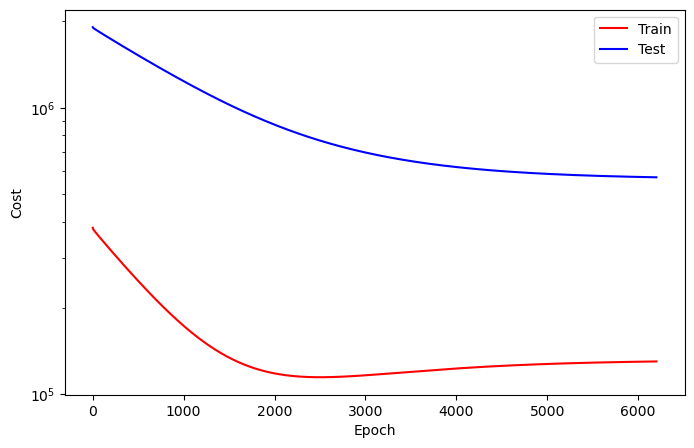

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6201
Train_cost  = 130268.5849 | Test_cost  = 571312.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6202
Train_cost  = 130269.9236 | Test_cost  = 571304.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6203
Train_cost  = 130271.2739 | Test_cost  = 571297.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6204
Train_cost  = 130272.6196 | Test_cost  = 571289.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6205
Train_cost  = 130273.9576 | Test_cost  = 571281.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6206
Train_cost  = 130275.3179 | Test_cost  = 571273.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6207
Train_cost  = 130276.6289 | Test_cost  = 571265.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6208
Train_cost  = 130277.9506 | Test_cost  = 571258.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6209
Train_cost  = 130279.3063 | Test_cost  = 571250.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6210
Train_cost  = 130280.6227 | Test_cost  = 571243.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6211
Train_cost  = 130281.9174 | Test_cost  = 571235.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6212
Train_cost  = 130283.2315 | Test_cost  = 571227.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6213
Train_cost  = 130284.5494 | Test_cost  = 571220.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6214
Train_cost  = 130285.8611 | Test_cost  = 571212.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6215
Train_cost  = 130287.1590 | Test_cost  = 571205.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6216
Train_cost  = 130288.4707 | Test_cost  = 571197.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6217
Train_cost  = 130289.7847 | Test_cost  = 571189.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6218
Train_cost  = 130291.1011 | Test_cost  = 571182.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6219
Train_cost  = 130292.3966 | Test_cost  = 571174.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6220
Train_cost  = 130293.7045 | Test_cost  = 571167.0750 | 


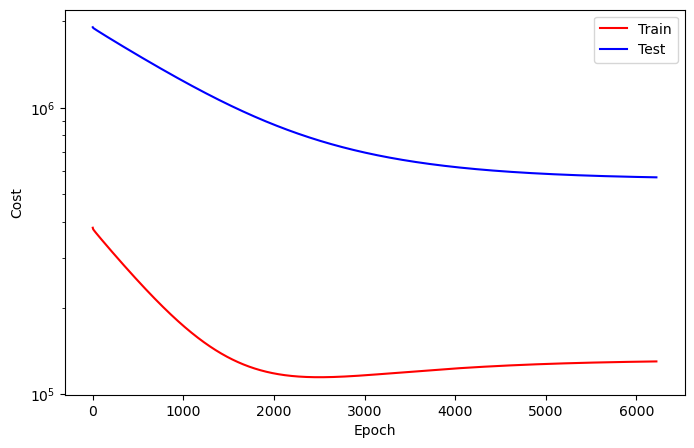

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6221
Train_cost  = 130294.9931 | Test_cost  = 571159.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6222
Train_cost  = 130296.2940 | Test_cost  = 571152.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6223
Train_cost  = 130297.5633 | Test_cost  = 571144.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6224
Train_cost  = 130298.8843 | Test_cost  = 571137.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6225
Train_cost  = 130300.1736 | Test_cost  = 571129.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6226
Train_cost  = 130301.4522 | Test_cost  = 571122.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6227
Train_cost  = 130302.7508 | Test_cost  = 571114.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6228
Train_cost  = 130304.0185 | Test_cost  = 571107.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6229
Train_cost  = 130305.2963 | Test_cost  = 571099.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6230
Train_cost  = 130306.5679 | Test_cost  = 571092.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6231
Train_cost  = 130307.8465 | Test_cost  = 571084.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6232
Train_cost  = 130309.1397 | Test_cost  = 571077.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6233
Train_cost  = 130310.4059 | Test_cost  = 571070.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6234
Train_cost  = 130311.7014 | Test_cost  = 571062.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6235
Train_cost  = 130312.9738 | Test_cost  = 571055.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6236
Train_cost  = 130314.2377 | Test_cost  = 571047.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6237
Train_cost  = 130315.5247 | Test_cost  = 571040.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6238
Train_cost  = 130316.8102 | Test_cost  = 571033.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6239
Train_cost  = 130318.0818 | Test_cost  = 571025.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6240
Train_cost  = 130319.3380 | Test_cost  = 571018.1500 | 


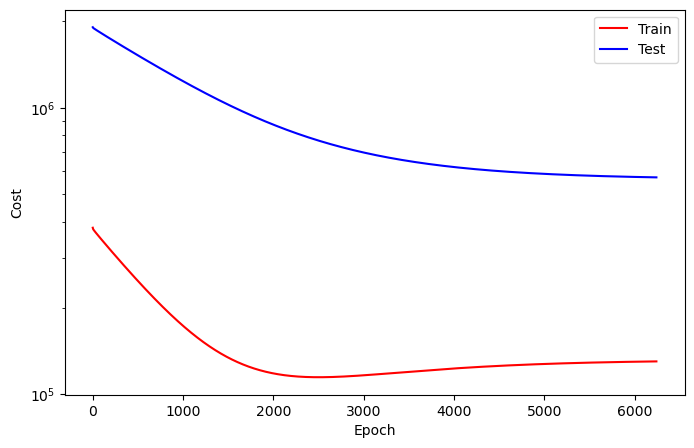

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6241
Train_cost  = 130320.6327 | Test_cost  = 571010.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6242
Train_cost  = 130321.9043 | Test_cost  = 571003.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6243
Train_cost  = 130323.1713 | Test_cost  = 570996.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6244
Train_cost  = 130324.4691 | Test_cost  = 570988.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6245
Train_cost  = 130325.7508 | Test_cost  = 570981.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6246
Train_cost  = 130327.0108 | Test_cost  = 570973.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6247
Train_cost  = 130328.3017 | Test_cost  = 570966.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6248
Train_cost  = 130329.5772 | Test_cost  = 570959.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6249
Train_cost  = 130330.8248 | Test_cost  = 570951.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6250
Train_cost  = 130332.1242 | Test_cost  = 570944.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6251
Train_cost  = 130333.3804 | Test_cost  = 570936.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6252
Train_cost  = 130334.6497 | Test_cost  = 570929.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6253
Train_cost  = 130335.9390 | Test_cost  = 570922.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6254
Train_cost  = 130337.2083 | Test_cost  = 570914.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6255
Train_cost  = 130338.4830 | Test_cost  = 570907.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6256
Train_cost  = 130339.7693 | Test_cost  = 570900.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6257
Train_cost  = 130341.0394 | Test_cost  = 570892.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6258
Train_cost  = 130342.2978 | Test_cost  = 570885.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6259
Train_cost  = 130343.6003 | Test_cost  = 570877.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6260
Train_cost  = 130344.8735 | Test_cost  = 570870.4750 | 


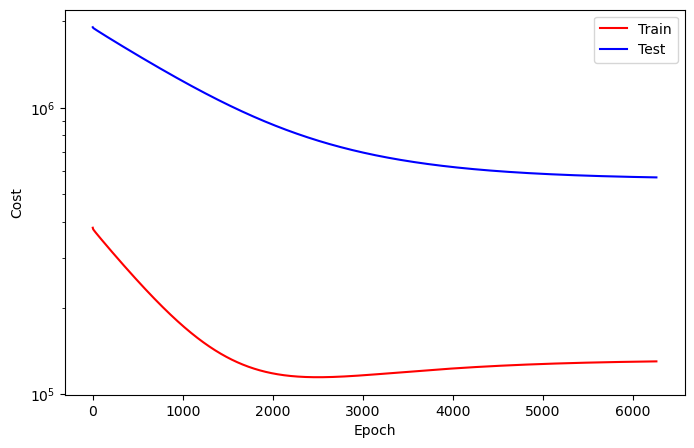

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6261
Train_cost  = 130346.1242 | Test_cost  = 570862.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6262
Train_cost  = 130347.4020 | Test_cost  = 570855.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6263
Train_cost  = 130348.6821 | Test_cost  = 570848.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6264
Train_cost  = 130349.9244 | Test_cost  = 570840.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6265
Train_cost  = 130351.1821 | Test_cost  = 570833.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6266
Train_cost  = 130352.4383 | Test_cost  = 570826.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6267
Train_cost  = 130353.6373 | Test_cost  = 570819.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6268
Train_cost  = 130354.9035 | Test_cost  = 570812.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6269
Train_cost  = 130356.1420 | Test_cost  = 570805.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6270
Train_cost  = 130357.3650 | Test_cost  = 570797.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6271
Train_cost  = 130358.6412 | Test_cost  = 570790.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6272
Train_cost  = 130359.8765 | Test_cost  = 570783.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6273
Train_cost  = 130361.1073 | Test_cost  = 570776.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6274
Train_cost  = 130362.3650 | Test_cost  = 570769.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6275
Train_cost  = 130363.5872 | Test_cost  = 570761.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6276
Train_cost  = 130364.8372 | Test_cost  = 570754.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6277
Train_cost  = 130366.0671 | Test_cost  = 570747.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6278
Train_cost  = 130367.3117 | Test_cost  = 570740.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6279
Train_cost  = 130368.5679 | Test_cost  = 570733.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6280
Train_cost  = 130369.8125 | Test_cost  = 570726.2000 | 


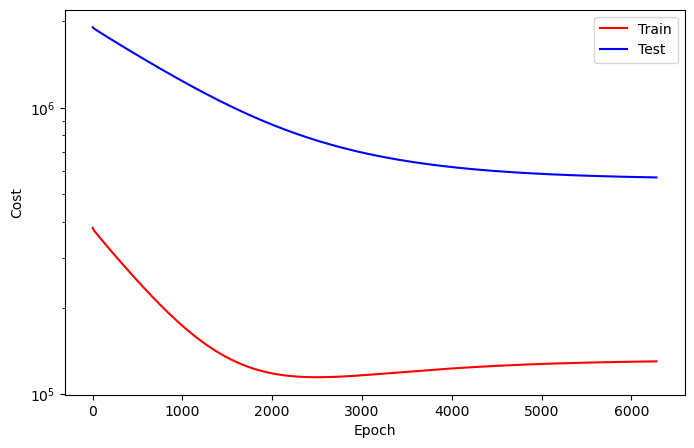

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6281
Train_cost  = 130371.0324 | Test_cost  = 570718.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6282
Train_cost  = 130372.2901 | Test_cost  = 570711.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6283
Train_cost  = 130373.4985 | Test_cost  = 570704.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6284
Train_cost  = 130374.7515 | Test_cost  = 570697.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6285
Train_cost  = 130375.9869 | Test_cost  = 570690.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6286
Train_cost  = 130377.2269 | Test_cost  = 570682.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6287
Train_cost  = 130378.4877 | Test_cost  = 570675.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6288
Train_cost  = 130379.7168 | Test_cost  = 570668.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6289
Train_cost  = 130380.9614 | Test_cost  = 570661.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6290
Train_cost  = 130382.1875 | Test_cost  = 570654.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6291
Train_cost  = 130383.4313 | Test_cost  = 570647.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6292
Train_cost  = 130384.6605 | Test_cost  = 570639.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6293
Train_cost  = 130385.9151 | Test_cost  = 570632.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6294
Train_cost  = 130387.1366 | Test_cost  = 570625.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6295
Train_cost  = 130388.3858 | Test_cost  = 570618.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6296
Train_cost  = 130389.6296 | Test_cost  = 570611.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6297
Train_cost  = 130390.8611 | Test_cost  = 570604.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6298
Train_cost  = 130392.1196 | Test_cost  = 570596.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6299
Train_cost  = 130393.3194 | Test_cost  = 570589.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6300
Train_cost  = 130394.5818 | Test_cost  = 570582.5750 | 


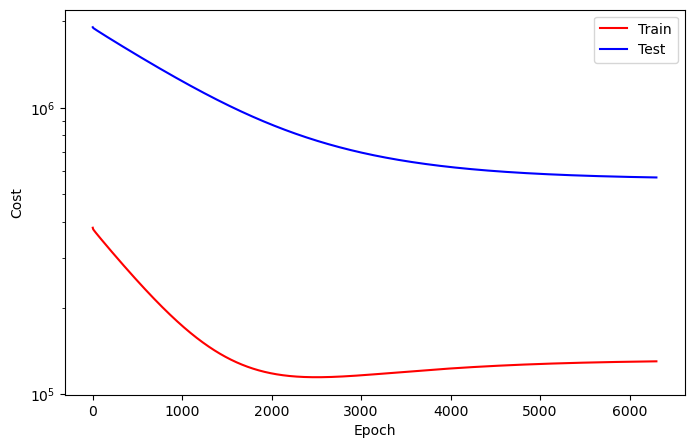

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6301
Train_cost  = 130395.8272 | Test_cost  = 570575.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6302
Train_cost  = 130397.0332 | Test_cost  = 570568.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6303
Train_cost  = 130398.2932 | Test_cost  = 570561.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6304
Train_cost  = 130399.4954 | Test_cost  = 570554.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6305
Train_cost  = 130400.7068 | Test_cost  = 570547.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6306
Train_cost  = 130401.8981 | Test_cost  = 570540.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6307
Train_cost  = 130403.1235 | Test_cost  = 570533.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6308
Train_cost  = 130404.3287 | Test_cost  = 570526.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6309
Train_cost  = 130405.5131 | Test_cost  = 570519.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6310
Train_cost  = 130406.7562 | Test_cost  = 570512.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6311
Train_cost  = 130407.9290 | Test_cost  = 570505.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6312
Train_cost  = 130409.1674 | Test_cost  = 570498.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6313
Train_cost  = 130410.3380 | Test_cost  = 570491.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6314
Train_cost  = 130411.5640 | Test_cost  = 570484.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6315
Train_cost  = 130412.7801 | Test_cost  = 570477.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6316
Train_cost  = 130413.9552 | Test_cost  = 570470.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6317
Train_cost  = 130415.1489 | Test_cost  = 570463.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6318
Train_cost  = 130416.3480 | Test_cost  = 570457.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6319
Train_cost  = 130417.5046 | Test_cost  = 570450.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6320
Train_cost  = 130418.7160 | Test_cost  = 570443.3500 | 


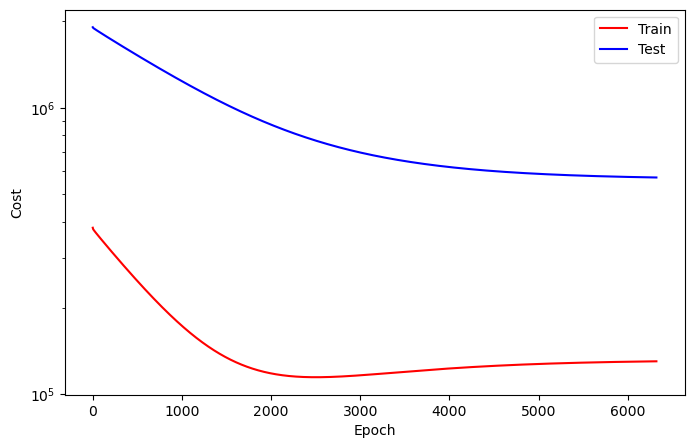

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6321
Train_cost  = 130419.9267 | Test_cost  = 570436.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6322
Train_cost  = 130421.1034 | Test_cost  = 570429.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6323
Train_cost  = 130422.2670 | Test_cost  = 570422.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6324
Train_cost  = 130423.4630 | Test_cost  = 570415.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6325
Train_cost  = 130424.6767 | Test_cost  = 570408.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6326
Train_cost  = 130425.8318 | Test_cost  = 570402.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6327
Train_cost  = 130427.0309 | Test_cost  = 570395.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6328
Train_cost  = 130428.2076 | Test_cost  = 570388.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6329
Train_cost  = 130429.3966 | Test_cost  = 570381.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6330
Train_cost  = 130430.5370 | Test_cost  = 570375.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6331
Train_cost  = 130431.7392 | Test_cost  = 570368.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6332
Train_cost  = 130432.8812 | Test_cost  = 570361.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6333
Train_cost  = 130434.0802 | Test_cost  = 570354.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6334
Train_cost  = 130435.2207 | Test_cost  = 570348.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6335
Train_cost  = 130436.4398 | Test_cost  = 570341.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6336
Train_cost  = 130437.5718 | Test_cost  = 570334.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6337
Train_cost  = 130438.7739 | Test_cost  = 570327.6750 | 


Train:   0%|          | 0/6 [00:01<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6338
Train_cost  = 130439.9159 | Test_cost  = 570320.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6339
Train_cost  = 130441.1211 | Test_cost  = 570314.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6340
Train_cost  = 130442.2816 | Test_cost  = 570307.2500 | 


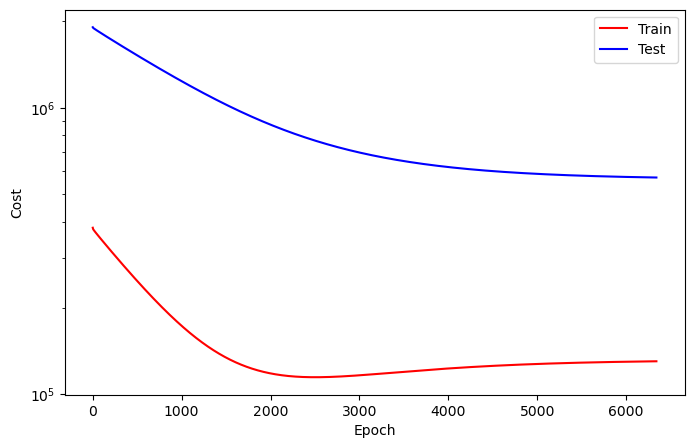

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6341
Train_cost  = 130443.4560 | Test_cost  = 570300.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6342
Train_cost  = 130444.6134 | Test_cost  = 570293.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6343
Train_cost  = 130445.8272 | Test_cost  = 570287.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6344
Train_cost  = 130446.9776 | Test_cost  = 570280.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6345
Train_cost  = 130448.1250 | Test_cost  = 570273.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6346
Train_cost  = 130449.3256 | Test_cost  = 570266.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6347
Train_cost  = 130450.5100 | Test_cost  = 570259.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6348
Train_cost  = 130451.6451 | Test_cost  = 570253.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6349
Train_cost  = 130452.8418 | Test_cost  = 570246.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6350
Train_cost  = 130454.0162 | Test_cost  = 570239.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6351
Train_cost  = 130455.1782 | Test_cost  = 570232.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6352
Train_cost  = 130456.3387 | Test_cost  = 570226.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6353
Train_cost  = 130457.5239 | Test_cost  = 570219.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6354
Train_cost  = 130458.6998 | Test_cost  = 570212.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6355
Train_cost  = 130459.8488 | Test_cost  = 570205.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6356
Train_cost  = 130461.0316 | Test_cost  = 570199.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6357
Train_cost  = 130462.1998 | Test_cost  = 570192.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6358
Train_cost  = 130463.3519 | Test_cost  = 570185.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6359
Train_cost  = 130464.5502 | Test_cost  = 570178.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6360
Train_cost  = 130465.7338 | Test_cost  = 570172.0500 | 


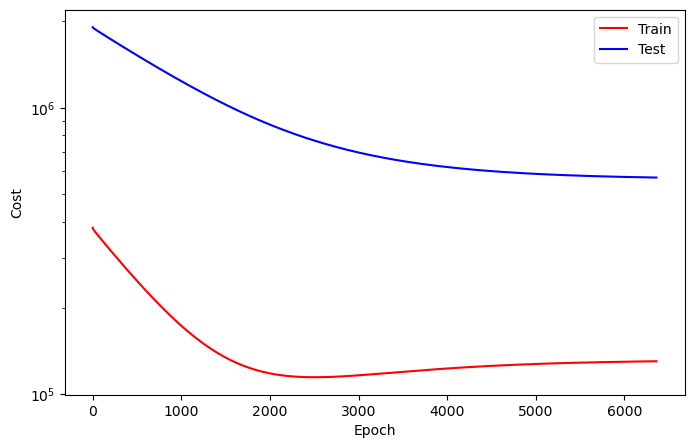

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6361
Train_cost  = 130466.8850 | Test_cost  = 570165.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6362
Train_cost  = 130468.0486 | Test_cost  = 570158.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6363
Train_cost  = 130469.2184 | Test_cost  = 570151.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6364
Train_cost  = 130470.3804 | Test_cost  = 570145.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6365
Train_cost  = 130471.5725 | Test_cost  = 570138.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6366
Train_cost  = 130472.7006 | Test_cost  = 570131.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6367
Train_cost  = 130473.8611 | Test_cost  = 570125.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6368
Train_cost  = 130474.9676 | Test_cost  = 570118.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6369
Train_cost  = 130476.1389 | Test_cost  = 570112.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6370
Train_cost  = 130477.2793 | Test_cost  = 570105.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6371
Train_cost  = 130478.4144 | Test_cost  = 570098.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6372
Train_cost  = 130479.5556 | Test_cost  = 570092.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6373
Train_cost  = 130480.6798 | Test_cost  = 570085.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6374
Train_cost  = 130481.8418 | Test_cost  = 570079.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6375
Train_cost  = 130482.9892 | Test_cost  = 570072.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6376
Train_cost  = 130484.0818 | Test_cost  = 570066.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6377
Train_cost  = 130485.2469 | Test_cost  = 570059.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6378
Train_cost  = 130486.3881 | Test_cost  = 570052.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6379
Train_cost  = 130487.5478 | Test_cost  = 570046.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6380
Train_cost  = 130488.6597 | Test_cost  = 570039.7500 | 


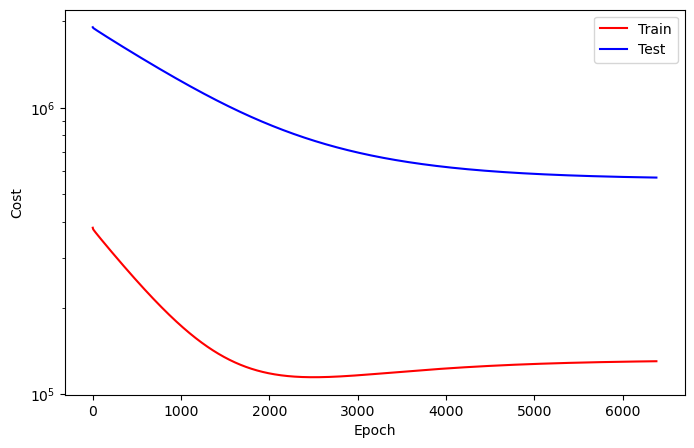

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6381
Train_cost  = 130489.8218 | Test_cost  = 570033.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6382
Train_cost  = 130490.9614 | Test_cost  = 570026.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6383
Train_cost  = 130492.1042 | Test_cost  = 570019.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6384
Train_cost  = 130493.2369 | Test_cost  = 570013.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6385
Train_cost  = 130494.3819 | Test_cost  = 570006.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6386
Train_cost  = 130495.4869 | Test_cost  = 570000.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6387
Train_cost  = 130496.6659 | Test_cost  = 569993.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6388
Train_cost  = 130497.7801 | Test_cost  = 569987.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6389
Train_cost  = 130498.9591 | Test_cost  = 569980.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6390
Train_cost  = 130500.0725 | Test_cost  = 569974.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6391
Train_cost  = 130501.2153 | Test_cost  = 569967.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6392
Train_cost  = 130502.3542 | Test_cost  = 569960.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6393
Train_cost  = 130503.4815 | Test_cost  = 569954.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6394
Train_cost  = 130504.6597 | Test_cost  = 569947.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6395
Train_cost  = 130505.7708 | Test_cost  = 569941.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6396
Train_cost  = 130506.9097 | Test_cost  = 569934.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6397
Train_cost  = 130508.0957 | Test_cost  = 569928.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6398
Train_cost  = 130509.1968 | Test_cost  = 569921.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6399
Train_cost  = 130510.3603 | Test_cost  = 569914.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6400
Train_cost  = 130511.4653 | Test_cost  = 569908.2500 | 


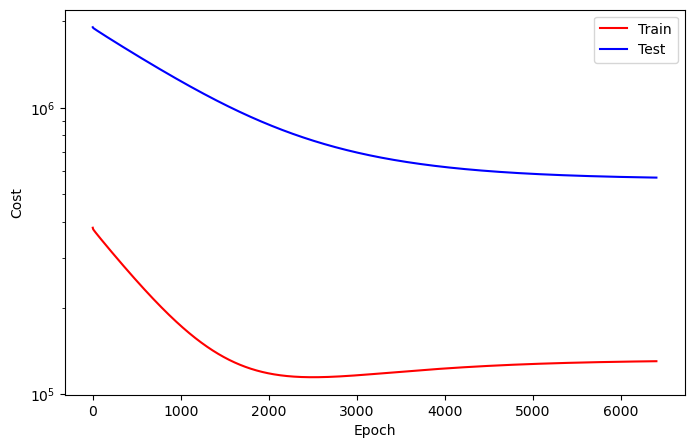

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6401
Train_cost  = 130512.6366 | Test_cost  = 569901.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6402
Train_cost  = 130513.7801 | Test_cost  = 569895.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6403
Train_cost  = 130514.9120 | Test_cost  = 569888.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6404
Train_cost  = 130516.0571 | Test_cost  = 569881.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6405
Train_cost  = 130517.2045 | Test_cost  = 569875.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6406
Train_cost  = 130518.3310 | Test_cost  = 569869.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6407
Train_cost  = 130519.4290 | Test_cost  = 569862.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6408
Train_cost  = 130520.5625 | Test_cost  = 569856.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6409
Train_cost  = 130521.6474 | Test_cost  = 569849.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6410
Train_cost  = 130522.7593 | Test_cost  = 569843.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6411
Train_cost  = 130523.8642 | Test_cost  = 569837.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6412
Train_cost  = 130524.9645 | Test_cost  = 569830.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6413
Train_cost  = 130526.0965 | Test_cost  = 569824.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6414
Train_cost  = 130527.2022 | Test_cost  = 569818.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6415
Train_cost  = 130528.2963 | Test_cost  = 569811.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6416
Train_cost  = 130529.4221 | Test_cost  = 569805.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6417
Train_cost  = 130530.5355 | Test_cost  = 569798.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6418
Train_cost  = 130531.6343 | Test_cost  = 569792.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6419
Train_cost  = 130532.7446 | Test_cost  = 569786.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6420
Train_cost  = 130533.8395 | Test_cost  = 569779.8000 | 


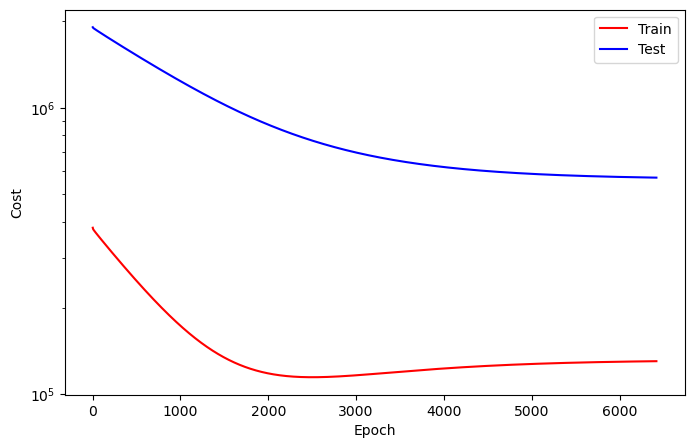

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6421
Train_cost  = 130534.9275 | Test_cost  = 569773.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6422
Train_cost  = 130536.0471 | Test_cost  = 569767.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6423
Train_cost  = 130537.1250 | Test_cost  = 569760.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6424
Train_cost  = 130538.2269 | Test_cost  = 569754.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6425
Train_cost  = 130539.3272 | Test_cost  = 569748.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6426
Train_cost  = 130540.4190 | Test_cost  = 569742.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6427
Train_cost  = 130541.4938 | Test_cost  = 569735.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6428
Train_cost  = 130542.6304 | Test_cost  = 569729.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6429
Train_cost  = 130543.6921 | Test_cost  = 569723.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6430
Train_cost  = 130544.7924 | Test_cost  = 569716.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6431
Train_cost  = 130545.8920 | Test_cost  = 569710.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6432
Train_cost  = 130546.9606 | Test_cost  = 569704.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6433
Train_cost  = 130548.0571 | Test_cost  = 569698.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6434
Train_cost  = 130549.1512 | Test_cost  = 569691.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6435
Train_cost  = 130550.2253 | Test_cost  = 569685.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6436
Train_cost  = 130551.3002 | Test_cost  = 569679.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6437
Train_cost  = 130552.3935 | Test_cost  = 569673.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6438
Train_cost  = 130553.4529 | Test_cost  = 569667.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6439
Train_cost  = 130554.5502 | Test_cost  = 569660.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6440
Train_cost  = 130555.6088 | Test_cost  = 569654.7000 | 


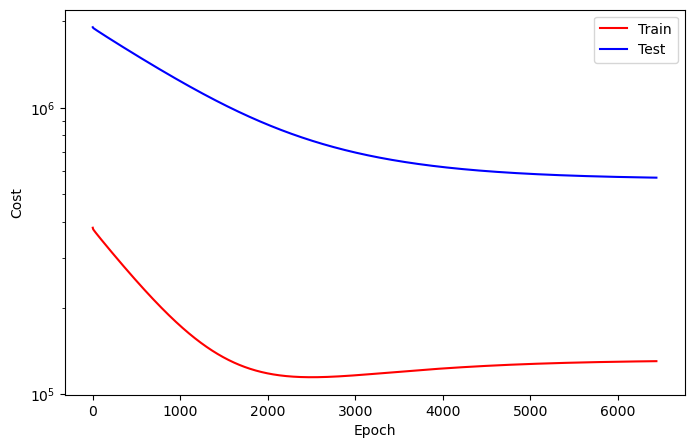

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6441
Train_cost  = 130556.6852 | Test_cost  = 569648.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6442
Train_cost  = 130557.7677 | Test_cost  = 569642.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6443
Train_cost  = 130558.8503 | Test_cost  = 569636.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6444
Train_cost  = 130559.9190 | Test_cost  = 569629.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6445
Train_cost  = 130561.0069 | Test_cost  = 569623.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6446
Train_cost  = 130562.1096 | Test_cost  = 569617.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6447
Train_cost  = 130563.1574 | Test_cost  = 569611.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6448
Train_cost  = 130564.2616 | Test_cost  = 569605.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6449
Train_cost  = 130565.2955 | Test_cost  = 569598.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6450
Train_cost  = 130566.3835 | Test_cost  = 569592.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6451
Train_cost  = 130567.4846 | Test_cost  = 569586.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6452
Train_cost  = 130568.5594 | Test_cost  = 569580.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6453
Train_cost  = 130569.6204 | Test_cost  = 569574.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6454
Train_cost  = 130570.7137 | Test_cost  = 569567.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6455
Train_cost  = 130571.8048 | Test_cost  = 569561.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6456
Train_cost  = 130572.8557 | Test_cost  = 569555.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6457
Train_cost  = 130573.9375 | Test_cost  = 569549.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6458
Train_cost  = 130575.0100 | Test_cost  = 569542.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6459
Train_cost  = 130576.1057 | Test_cost  = 569536.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6460
Train_cost  = 130577.1759 | Test_cost  = 569530.7000 | 


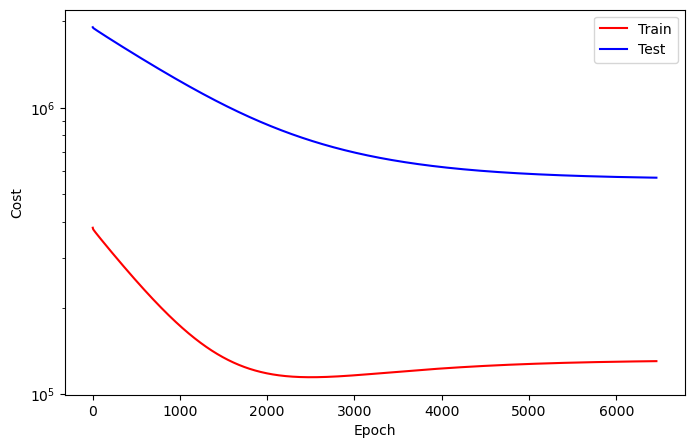

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6461
Train_cost  = 130578.2546 | Test_cost  = 569524.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6462
Train_cost  = 130579.3302 | Test_cost  = 569518.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6463
Train_cost  = 130580.4120 | Test_cost  = 569512.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6464
Train_cost  = 130581.4707 | Test_cost  = 569505.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6465
Train_cost  = 130582.5718 | Test_cost  = 569499.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6466
Train_cost  = 130583.6613 | Test_cost  = 569493.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6467
Train_cost  = 130584.7215 | Test_cost  = 569487.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6468
Train_cost  = 130585.7940 | Test_cost  = 569481.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6469
Train_cost  = 130586.8912 | Test_cost  = 569475.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6470
Train_cost  = 130587.9514 | Test_cost  = 569468.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6471
Train_cost  = 130589.0455 | Test_cost  = 569462.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6472
Train_cost  = 130590.1204 | Test_cost  = 569456.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6473
Train_cost  = 130591.1690 | Test_cost  = 569450.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6474
Train_cost  = 130592.2654 | Test_cost  = 569443.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6475
Train_cost  = 130593.3472 | Test_cost  = 569438.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6476
Train_cost  = 130594.4028 | Test_cost  = 569431.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6477
Train_cost  = 130595.4660 | Test_cost  = 569425.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6478
Train_cost  = 130596.5031 | Test_cost  = 569419.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6479
Train_cost  = 130597.5509 | Test_cost  = 569413.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6480
Train_cost  = 130598.5748 | Test_cost  = 569407.9250 | 


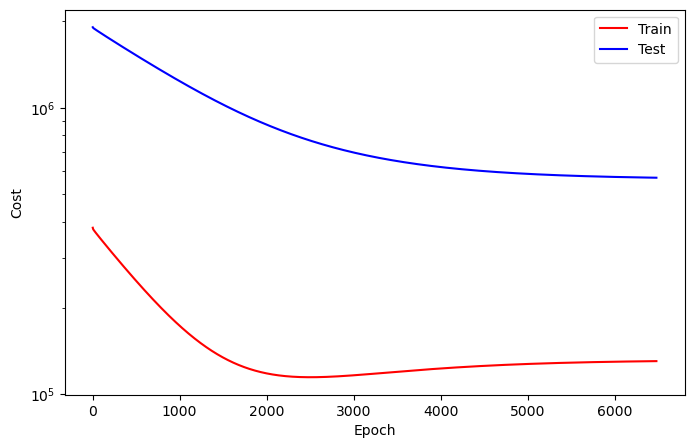

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6481
Train_cost  = 130599.6366 | Test_cost  = 569401.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6482
Train_cost  = 130600.6883 | Test_cost  = 569395.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6483
Train_cost  = 130601.7531 | Test_cost  = 569389.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6484
Train_cost  = 130602.7855 | Test_cost  = 569384.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6485
Train_cost  = 130603.7940 | Test_cost  = 569377.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6486
Train_cost  = 130604.8434 | Test_cost  = 569371.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6487
Train_cost  = 130605.8989 | Test_cost  = 569365.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6488
Train_cost  = 130606.9252 | Test_cost  = 569359.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6489
Train_cost  = 130607.9807 | Test_cost  = 569353.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6490
Train_cost  = 130609.0386 | Test_cost  = 569347.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6491
Train_cost  = 130610.0926 | Test_cost  = 569341.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6492
Train_cost  = 130611.1250 | Test_cost  = 569335.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6493
Train_cost  = 130612.1659 | Test_cost  = 569329.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6494
Train_cost  = 130613.1998 | Test_cost  = 569323.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6495
Train_cost  = 130614.2608 | Test_cost  = 569318.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6496
Train_cost  = 130615.3117 | Test_cost  = 569312.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6497
Train_cost  = 130616.3488 | Test_cost  = 569306.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6498
Train_cost  = 130617.3897 | Test_cost  = 569300.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6499
Train_cost  = 130618.4406 | Test_cost  = 569294.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6500
Train_cost  = 130619.4776 | Test_cost  = 569288.1000 | 


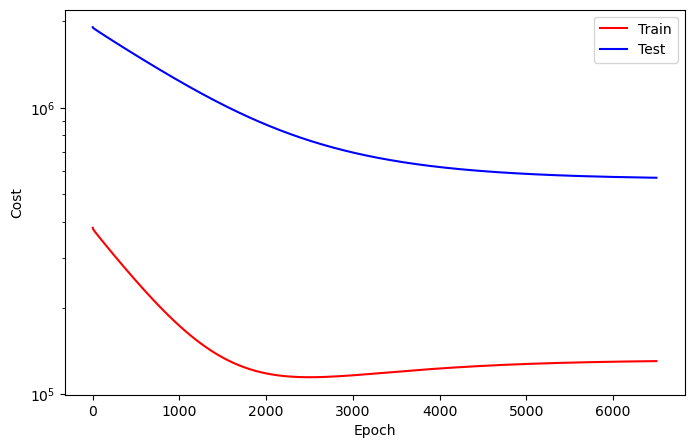

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6501
Train_cost  = 130620.5170 | Test_cost  = 569282.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6502
Train_cost  = 130621.5556 | Test_cost  = 569276.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6503
Train_cost  = 130622.5795 | Test_cost  = 569270.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6504
Train_cost  = 130623.6335 | Test_cost  = 569263.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6505
Train_cost  = 130624.7122 | Test_cost  = 569257.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6506
Train_cost  = 130625.7523 | Test_cost  = 569252.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6507
Train_cost  = 130626.7963 | Test_cost  = 569246.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6508
Train_cost  = 130627.8179 | Test_cost  = 569240.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6509
Train_cost  = 130628.8642 | Test_cost  = 569234.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6510
Train_cost  = 130629.9205 | Test_cost  = 569227.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6511
Train_cost  = 130630.9668 | Test_cost  = 569222.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6512
Train_cost  = 130632.0108 | Test_cost  = 569216.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6513
Train_cost  = 130633.0648 | Test_cost  = 569210.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6514
Train_cost  = 130634.1127 | Test_cost  = 569204.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6515
Train_cost  = 130635.1605 | Test_cost  = 569198.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6516
Train_cost  = 130636.1937 | Test_cost  = 569192.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6517
Train_cost  = 130637.2238 | Test_cost  = 569186.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6518
Train_cost  = 130638.2323 | Test_cost  = 569180.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6519
Train_cost  = 130639.2508 | Test_cost  = 569174.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6520
Train_cost  = 130640.2623 | Test_cost  = 569168.9250 | 


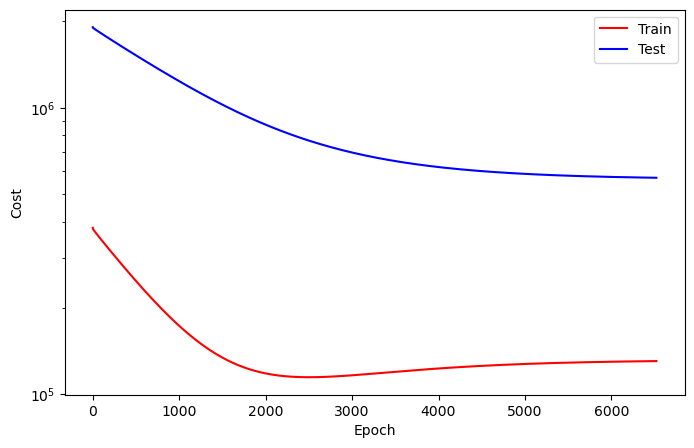

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6521
Train_cost  = 130641.2801 | Test_cost  = 569163.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6522
Train_cost  = 130642.3071 | Test_cost  = 569157.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6523
Train_cost  = 130643.3102 | Test_cost  = 569151.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6524
Train_cost  = 130644.3264 | Test_cost  = 569145.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6525
Train_cost  = 130645.3549 | Test_cost  = 569140.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6526
Train_cost  = 130646.3465 | Test_cost  = 569134.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6527
Train_cost  = 130647.3627 | Test_cost  = 569128.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6528
Train_cost  = 130648.3711 | Test_cost  = 569122.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6529
Train_cost  = 130649.3627 | Test_cost  = 569116.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6530
Train_cost  = 130650.3951 | Test_cost  = 569110.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6531
Train_cost  = 130651.4236 | Test_cost  = 569105.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6532
Train_cost  = 130652.4352 | Test_cost  = 569099.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6533
Train_cost  = 130653.4498 | Test_cost  = 569093.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6534
Train_cost  = 130654.4367 | Test_cost  = 569087.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6535
Train_cost  = 130655.4468 | Test_cost  = 569082.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6536
Train_cost  = 130656.4506 | Test_cost  = 569076.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6537
Train_cost  = 130657.4313 | Test_cost  = 569070.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6538
Train_cost  = 130658.4414 | Test_cost  = 569065.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6539
Train_cost  = 130659.4329 | Test_cost  = 569059.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6540
Train_cost  = 130660.4213 | Test_cost  = 569053.6000 | 


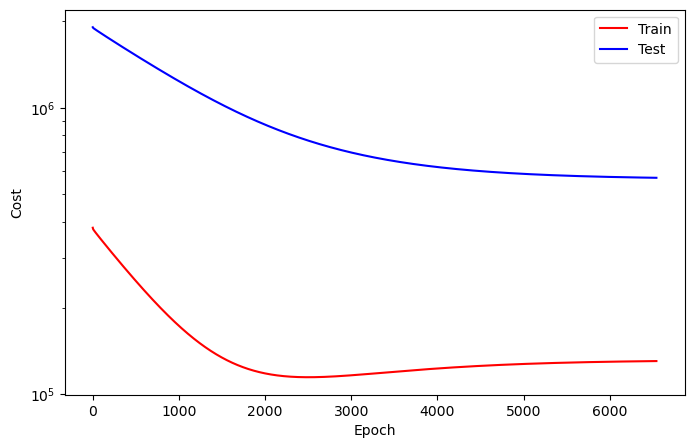

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6541
Train_cost  = 130661.4221 | Test_cost  = 569047.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6542
Train_cost  = 130662.4259 | Test_cost  = 569042.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6543
Train_cost  = 130663.4128 | Test_cost  = 569036.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6544
Train_cost  = 130664.4228 | Test_cost  = 569030.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6545
Train_cost  = 130665.4066 | Test_cost  = 569025.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6546
Train_cost  = 130666.4082 | Test_cost  = 569019.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6547
Train_cost  = 130667.4167 | Test_cost  = 569013.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6548
Train_cost  = 130668.4005 | Test_cost  = 569007.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6549
Train_cost  = 130669.4090 | Test_cost  = 569002.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6550
Train_cost  = 130670.4005 | Test_cost  = 568996.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6551
Train_cost  = 130671.3765 | Test_cost  = 568991.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6552
Train_cost  = 130672.3472 | Test_cost  = 568985.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6553
Train_cost  = 130673.3272 | Test_cost  = 568979.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6554
Train_cost  = 130674.2994 | Test_cost  = 568974.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6555
Train_cost  = 130675.2878 | Test_cost  = 568968.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6556
Train_cost  = 130676.2816 | Test_cost  = 568962.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6557
Train_cost  = 130677.2639 | Test_cost  = 568957.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6558
Train_cost  = 130678.2631 | Test_cost  = 568951.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6559
Train_cost  = 130679.2284 | Test_cost  = 568946.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6560
Train_cost  = 130680.2191 | Test_cost  = 568940.3750 | 


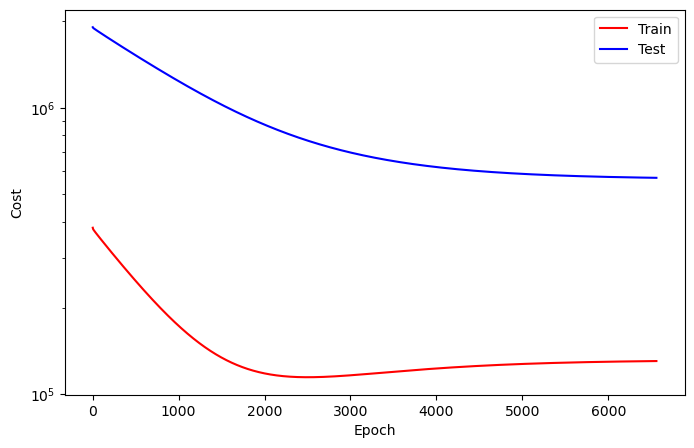

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6561
Train_cost  = 130681.1983 | Test_cost  = 568934.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6562
Train_cost  = 130682.1852 | Test_cost  = 568929.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6563
Train_cost  = 130683.1605 | Test_cost  = 568923.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6564
Train_cost  = 130684.1427 | Test_cost  = 568917.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6565
Train_cost  = 130685.1358 | Test_cost  = 568912.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6566
Train_cost  = 130686.1235 | Test_cost  = 568906.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6567
Train_cost  = 130687.1103 | Test_cost  = 568900.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6568
Train_cost  = 130688.0617 | Test_cost  = 568895.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6569
Train_cost  = 130689.0293 | Test_cost  = 568889.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6570
Train_cost  = 130690.0208 | Test_cost  = 568884.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6571
Train_cost  = 130690.9969 | Test_cost  = 568878.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6572
Train_cost  = 130691.9938 | Test_cost  = 568872.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6573
Train_cost  = 130692.9853 | Test_cost  = 568867.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6574
Train_cost  = 130693.9614 | Test_cost  = 568861.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6575
Train_cost  = 130694.9390 | Test_cost  = 568856.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6576
Train_cost  = 130695.9298 | Test_cost  = 568850.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6577
Train_cost  = 130696.8920 | Test_cost  = 568844.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6578
Train_cost  = 130697.8765 | Test_cost  = 568839.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6579
Train_cost  = 130698.8565 | Test_cost  = 568833.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6580
Train_cost  = 130699.8364 | Test_cost  = 568827.9000 | 


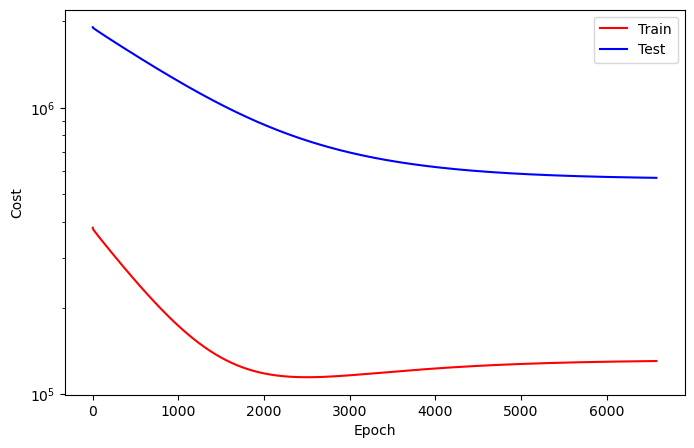

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6581
Train_cost  = 130700.8380 | Test_cost  = 568822.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6582
Train_cost  = 130701.8264 | Test_cost  = 568816.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6583
Train_cost  = 130702.8040 | Test_cost  = 568811.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6584
Train_cost  = 130703.7870 | Test_cost  = 568805.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6585
Train_cost  = 130704.7400 | Test_cost  = 568799.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6586
Train_cost  = 130705.7330 | Test_cost  = 568794.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6587
Train_cost  = 130706.7176 | Test_cost  = 568788.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6588
Train_cost  = 130707.7060 | Test_cost  = 568783.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6589
Train_cost  = 130708.6898 | Test_cost  = 568777.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6590
Train_cost  = 130709.6790 | Test_cost  = 568771.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6591
Train_cost  = 130710.6458 | Test_cost  = 568766.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6592
Train_cost  = 130711.6335 | Test_cost  = 568760.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6593
Train_cost  = 130712.6034 | Test_cost  = 568754.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6594
Train_cost  = 130713.6019 | Test_cost  = 568749.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6595
Train_cost  = 130714.5826 | Test_cost  = 568743.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6596
Train_cost  = 130715.5617 | Test_cost  = 568738.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6597
Train_cost  = 130716.5332 | Test_cost  = 568732.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6598
Train_cost  = 130717.4915 | Test_cost  = 568727.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6599
Train_cost  = 130718.4352 | Test_cost  = 568721.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6600
Train_cost  = 130719.3997 | Test_cost  = 568716.1750 | 


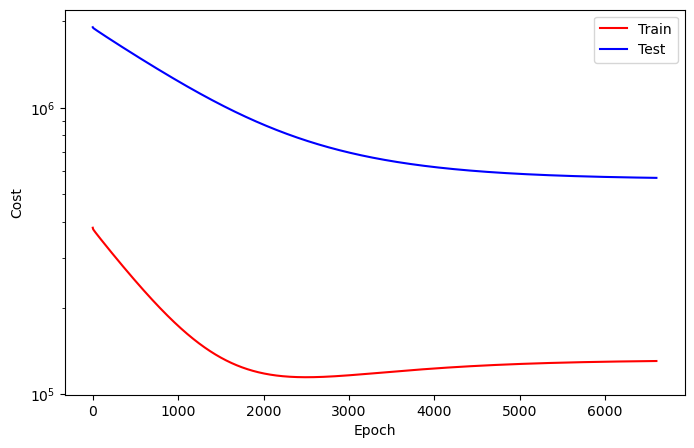

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6601
Train_cost  = 130720.3796 | Test_cost  = 568710.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6602
Train_cost  = 130721.3302 | Test_cost  = 568705.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6603
Train_cost  = 130722.2824 | Test_cost  = 568699.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6604
Train_cost  = 130723.2477 | Test_cost  = 568694.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6605
Train_cost  = 130724.1790 | Test_cost  = 568688.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6606
Train_cost  = 130725.1312 | Test_cost  = 568683.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6607
Train_cost  = 130726.0856 | Test_cost  = 568678.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6608
Train_cost  = 130727.0332 | Test_cost  = 568672.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6609
Train_cost  = 130727.9838 | Test_cost  = 568667.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6610
Train_cost  = 130728.9691 | Test_cost  = 568661.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6611
Train_cost  = 130729.9059 | Test_cost  = 568656.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6612
Train_cost  = 130730.8488 | Test_cost  = 568650.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6613
Train_cost  = 130731.7901 | Test_cost  = 568645.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6614
Train_cost  = 130732.7577 | Test_cost  = 568640.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6615
Train_cost  = 130733.6975 | Test_cost  = 568634.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6616
Train_cost  = 130734.6458 | Test_cost  = 568629.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6617
Train_cost  = 130735.6003 | Test_cost  = 568623.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6618
Train_cost  = 130736.5455 | Test_cost  = 568618.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6619
Train_cost  = 130737.5023 | Test_cost  = 568612.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6620
Train_cost  = 130738.4267 | Test_cost  = 568607.4500 | 


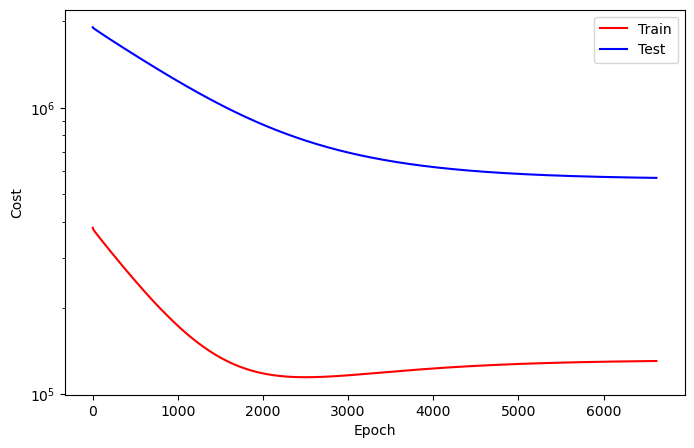

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6621
Train_cost  = 130739.4020 | Test_cost  = 568602.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6622
Train_cost  = 130740.3665 | Test_cost  = 568596.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6623
Train_cost  = 130741.3025 | Test_cost  = 568591.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6624
Train_cost  = 130742.2531 | Test_cost  = 568585.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6625
Train_cost  = 130743.2022 | Test_cost  = 568580.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6626
Train_cost  = 130744.1543 | Test_cost  = 568574.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6627
Train_cost  = 130745.1219 | Test_cost  = 568569.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6628
Train_cost  = 130746.0741 | Test_cost  = 568563.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6629
Train_cost  = 130747.0154 | Test_cost  = 568558.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6630
Train_cost  = 130747.9923 | Test_cost  = 568553.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6631
Train_cost  = 130748.9221 | Test_cost  = 568547.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6632
Train_cost  = 130749.8542 | Test_cost  = 568542.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6633
Train_cost  = 130750.8218 | Test_cost  = 568536.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6634
Train_cost  = 130751.7816 | Test_cost  = 568531.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6635
Train_cost  = 130752.7222 | Test_cost  = 568525.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6636
Train_cost  = 130753.6852 | Test_cost  = 568520.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6637
Train_cost  = 130754.6343 | Test_cost  = 568515.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6638
Train_cost  = 130755.5802 | Test_cost  = 568509.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6639
Train_cost  = 130756.5525 | Test_cost  = 568504.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6640
Train_cost  = 130757.4799 | Test_cost  = 568498.9750 | 


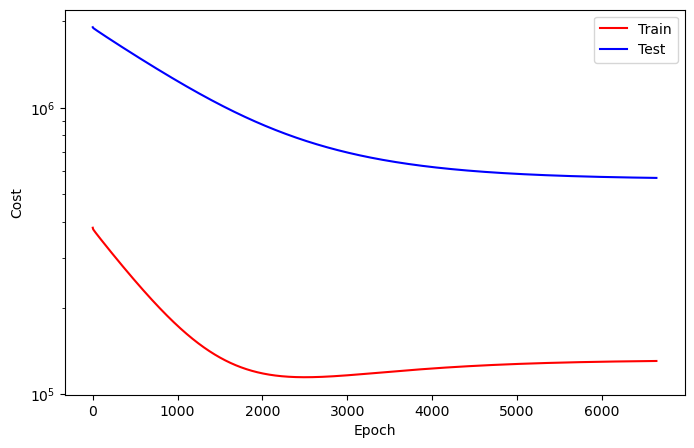

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6641
Train_cost  = 130758.4398 | Test_cost  = 568493.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6642
Train_cost  = 130759.3318 | Test_cost  = 568488.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6643
Train_cost  = 130760.2747 | Test_cost  = 568483.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6644
Train_cost  = 130761.1713 | Test_cost  = 568477.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6645
Train_cost  = 130762.1026 | Test_cost  = 568472.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6646
Train_cost  = 130763.0147 | Test_cost  = 568467.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6647
Train_cost  = 130763.9398 | Test_cost  = 568462.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6648
Train_cost  = 130764.8735 | Test_cost  = 568456.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6649
Train_cost  = 130765.7670 | Test_cost  = 568451.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6650
Train_cost  = 130766.6914 | Test_cost  = 568446.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6651
Train_cost  = 130767.6258 | Test_cost  = 568441.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6652
Train_cost  = 130768.5702 | Test_cost  = 568435.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6653
Train_cost  = 130769.4583 | Test_cost  = 568430.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6654
Train_cost  = 130770.3858 | Test_cost  = 568425.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6655
Train_cost  = 130771.3117 | Test_cost  = 568420.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6656
Train_cost  = 130772.2269 | Test_cost  = 568414.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6657
Train_cost  = 130773.1489 | Test_cost  = 568409.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6658
Train_cost  = 130774.0509 | Test_cost  = 568404.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6659
Train_cost  = 130775.0000 | Test_cost  = 568399.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6660
Train_cost  = 130775.8951 | Test_cost  = 568394.0750 | 


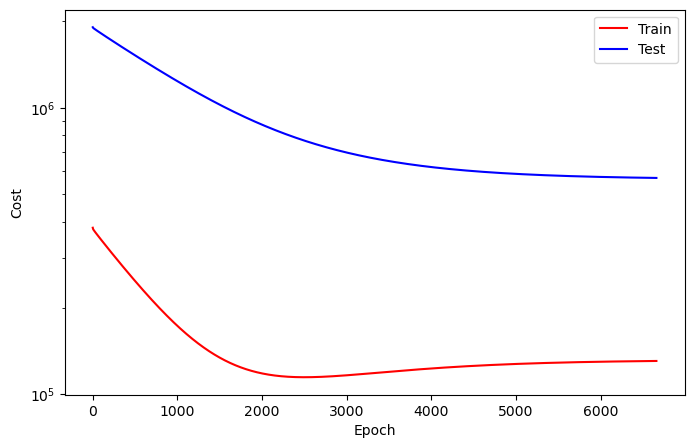

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6661
Train_cost  = 130776.7994 | Test_cost  = 568388.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6662
Train_cost  = 130777.7353 | Test_cost  = 568383.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6663
Train_cost  = 130778.6258 | Test_cost  = 568378.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6664
Train_cost  = 130779.5324 | Test_cost  = 568373.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6665
Train_cost  = 130780.4352 | Test_cost  = 568368.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6666
Train_cost  = 130781.3318 | Test_cost  = 568363.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6667
Train_cost  = 130782.2230 | Test_cost  = 568357.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6668
Train_cost  = 130783.1466 | Test_cost  = 568352.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6669
Train_cost  = 130784.0386 | Test_cost  = 568347.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6670
Train_cost  = 130784.9514 | Test_cost  = 568342.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6671
Train_cost  = 130785.8642 | Test_cost  = 568337.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6672
Train_cost  = 130786.7577 | Test_cost  = 568332.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6673
Train_cost  = 130787.6821 | Test_cost  = 568326.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6674
Train_cost  = 130788.5864 | Test_cost  = 568321.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6675
Train_cost  = 130789.4769 | Test_cost  = 568316.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6676
Train_cost  = 130790.3781 | Test_cost  = 568311.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6677
Train_cost  = 130791.3032 | Test_cost  = 568306.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6678
Train_cost  = 130792.1998 | Test_cost  = 568301.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6679
Train_cost  = 130793.1049 | Test_cost  = 568295.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6680
Train_cost  = 130793.9985 | Test_cost  = 568290.8750 | 


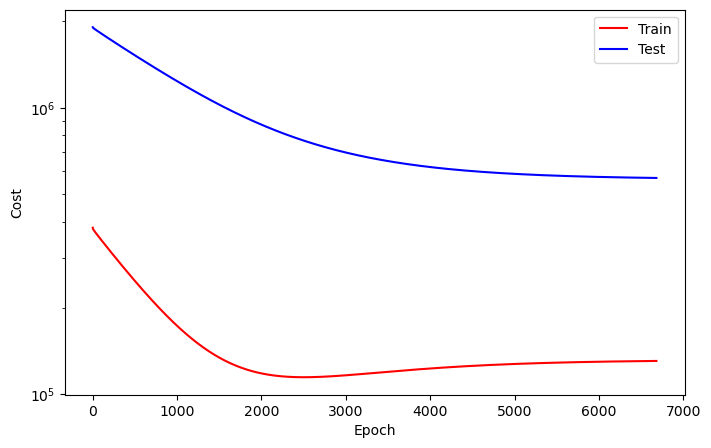

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6681
Train_cost  = 130794.9066 | Test_cost  = 568285.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6682
Train_cost  = 130795.7832 | Test_cost  = 568280.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6683
Train_cost  = 130796.6728 | Test_cost  = 568275.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6684
Train_cost  = 130797.5733 | Test_cost  = 568270.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6685
Train_cost  = 130798.4552 | Test_cost  = 568265.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6686
Train_cost  = 130799.3557 | Test_cost  = 568260.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6687
Train_cost  = 130800.2307 | Test_cost  = 568255.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6688
Train_cost  = 130801.1142 | Test_cost  = 568250.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6689
Train_cost  = 130802.0177 | Test_cost  = 568245.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6690
Train_cost  = 130802.9213 | Test_cost  = 568240.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6691
Train_cost  = 130803.8009 | Test_cost  = 568235.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6692
Train_cost  = 130804.6767 | Test_cost  = 568230.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6693
Train_cost  = 130805.5710 | Test_cost  = 568224.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6694
Train_cost  = 130806.4753 | Test_cost  = 568219.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6695
Train_cost  = 130807.3681 | Test_cost  = 568214.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6696
Train_cost  = 130808.2407 | Test_cost  = 568209.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6697
Train_cost  = 130809.1350 | Test_cost  = 568204.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6698
Train_cost  = 130810.0293 | Test_cost  = 568199.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6699
Train_cost  = 130810.9429 | Test_cost  = 568194.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6700
Train_cost  = 130811.8187 | Test_cost  = 568189.2750 | 


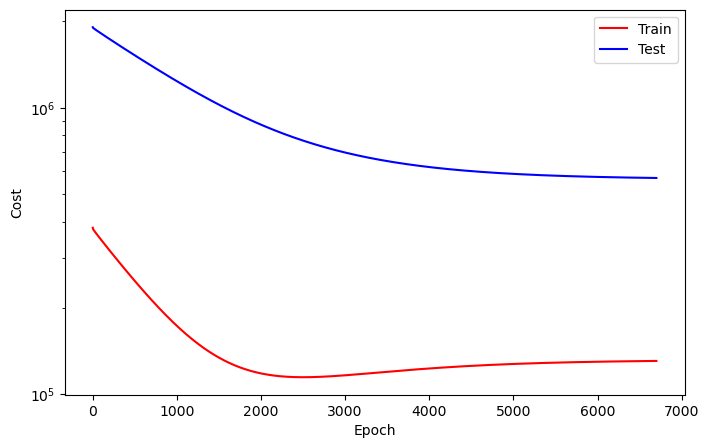

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6701
Train_cost  = 130812.7083 | Test_cost  = 568184.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6702
Train_cost  = 130813.5826 | Test_cost  = 568179.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6703
Train_cost  = 130814.4660 | Test_cost  = 568174.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6704
Train_cost  = 130815.3796 | Test_cost  = 568169.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6705
Train_cost  = 130816.2539 | Test_cost  = 568163.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6706
Train_cost  = 130817.1559 | Test_cost  = 568158.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6707
Train_cost  = 130818.0448 | Test_cost  = 568153.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6708
Train_cost  = 130818.9414 | Test_cost  = 568148.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6709
Train_cost  = 130819.8410 | Test_cost  = 568143.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6710
Train_cost  = 130820.7199 | Test_cost  = 568138.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6711
Train_cost  = 130821.6073 | Test_cost  = 568133.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6712
Train_cost  = 130822.5031 | Test_cost  = 568128.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6713
Train_cost  = 130823.4066 | Test_cost  = 568123.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6714
Train_cost  = 130824.3056 | Test_cost  = 568118.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6715
Train_cost  = 130825.1636 | Test_cost  = 568113.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6716
Train_cost  = 130826.0710 | Test_cost  = 568108.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6717
Train_cost  = 130826.9614 | Test_cost  = 568103.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6718
Train_cost  = 130827.8557 | Test_cost  = 568098.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6719
Train_cost  = 130828.7145 | Test_cost  = 568093.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6720
Train_cost  = 130829.6150 | Test_cost  = 568087.8250 | 


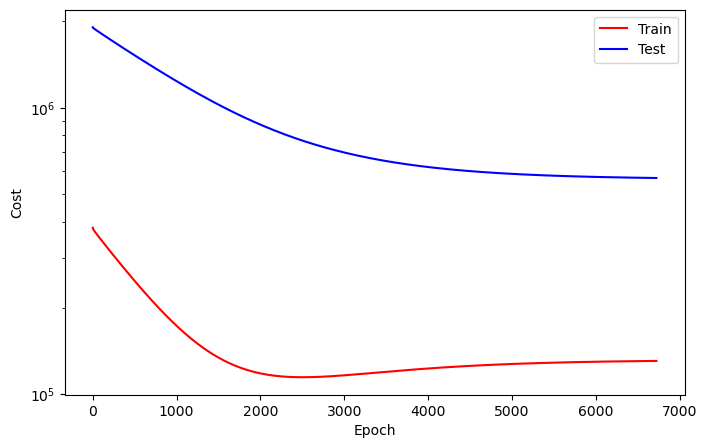

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6721
Train_cost  = 130830.5262 | Test_cost  = 568082.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6722
Train_cost  = 130831.4352 | Test_cost  = 568077.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6723
Train_cost  = 130832.3125 | Test_cost  = 568072.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6724
Train_cost  = 130833.1790 | Test_cost  = 568067.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6725
Train_cost  = 130834.0856 | Test_cost  = 568062.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6726
Train_cost  = 130834.9815 | Test_cost  = 568057.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6727
Train_cost  = 130835.8719 | Test_cost  = 568052.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6728
Train_cost  = 130836.7585 | Test_cost  = 568047.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6729
Train_cost  = 130837.6559 | Test_cost  = 568042.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6730
Train_cost  = 130838.5069 | Test_cost  = 568037.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6731
Train_cost  = 130839.3858 | Test_cost  = 568032.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6732
Train_cost  = 130840.2407 | Test_cost  = 568027.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6733
Train_cost  = 130841.1296 | Test_cost  = 568022.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6734
Train_cost  = 130842.0170 | Test_cost  = 568017.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6735
Train_cost  = 130842.9012 | Test_cost  = 568012.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6736
Train_cost  = 130843.7785 | Test_cost  = 568007.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6737
Train_cost  = 130844.6528 | Test_cost  = 568002.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6738
Train_cost  = 130845.5062 | Test_cost  = 567997.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6739
Train_cost  = 130846.3418 | Test_cost  = 567992.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6740
Train_cost  = 130847.2114 | Test_cost  = 567987.8500 | 


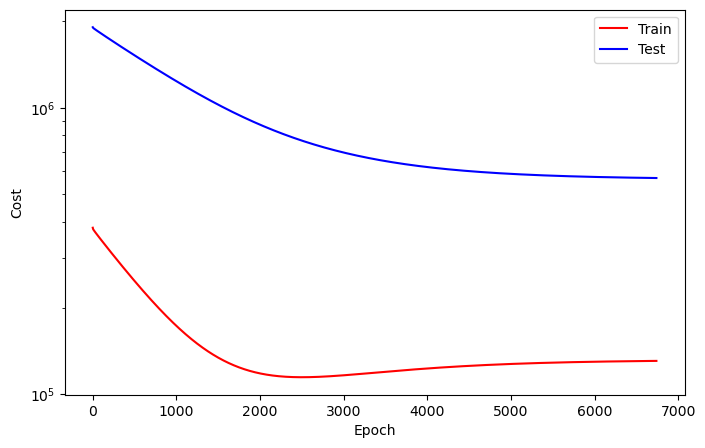

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6741
Train_cost  = 130848.0640 | Test_cost  = 567983.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6742
Train_cost  = 130848.9252 | Test_cost  = 567978.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6743
Train_cost  = 130849.7855 | Test_cost  = 567973.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6744
Train_cost  = 130850.6613 | Test_cost  = 567968.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6745
Train_cost  = 130851.5262 | Test_cost  = 567963.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6746
Train_cost  = 130852.3843 | Test_cost  = 567958.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6747
Train_cost  = 130853.2415 | Test_cost  = 567953.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6748
Train_cost  = 130854.0941 | Test_cost  = 567948.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6749
Train_cost  = 130854.9344 | Test_cost  = 567943.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6750
Train_cost  = 130855.7948 | Test_cost  = 567938.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6751
Train_cost  = 130856.6559 | Test_cost  = 567934.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6752
Train_cost  = 130857.5162 | Test_cost  = 567929.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6753
Train_cost  = 130858.3719 | Test_cost  = 567924.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6754
Train_cost  = 130859.2407 | Test_cost  = 567919.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6755
Train_cost  = 130860.1026 | Test_cost  = 567914.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6756
Train_cost  = 130860.9568 | Test_cost  = 567909.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6757
Train_cost  = 130861.8140 | Test_cost  = 567904.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6758
Train_cost  = 130862.6489 | Test_cost  = 567900.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6759
Train_cost  = 130863.5062 | Test_cost  = 567895.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6760
Train_cost  = 130864.3758 | Test_cost  = 567890.4000 | 


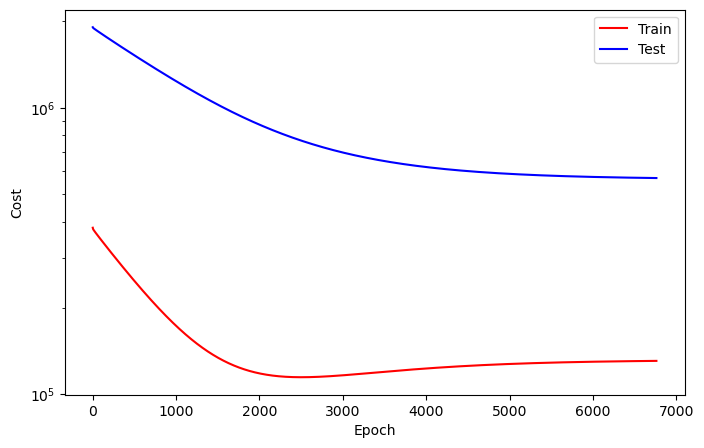

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6761
Train_cost  = 130865.2245 | Test_cost  = 567885.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6762
Train_cost  = 130866.0818 | Test_cost  = 567880.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6763
Train_cost  = 130866.9599 | Test_cost  = 567875.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6764
Train_cost  = 130867.8032 | Test_cost  = 567870.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6765
Train_cost  = 130868.6682 | Test_cost  = 567865.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6766
Train_cost  = 130869.5394 | Test_cost  = 567861.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6767
Train_cost  = 130870.3904 | Test_cost  = 567856.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6768
Train_cost  = 130871.2469 | Test_cost  = 567851.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6769
Train_cost  = 130872.0965 | Test_cost  = 567846.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6770
Train_cost  = 130872.9298 | Test_cost  = 567841.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6771
Train_cost  = 130873.7870 | Test_cost  = 567836.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6772
Train_cost  = 130874.6404 | Test_cost  = 567831.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6773
Train_cost  = 130875.4923 | Test_cost  = 567827.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6774
Train_cost  = 130876.3781 | Test_cost  = 567822.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6775
Train_cost  = 130877.2230 | Test_cost  = 567817.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6776
Train_cost  = 130878.0718 | Test_cost  = 567812.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6777
Train_cost  = 130878.8981 | Test_cost  = 567808.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6778
Train_cost  = 130879.7222 | Test_cost  = 567803.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6779
Train_cost  = 130880.5648 | Test_cost  = 567798.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6780
Train_cost  = 130881.3796 | Test_cost  = 567793.9250 | 


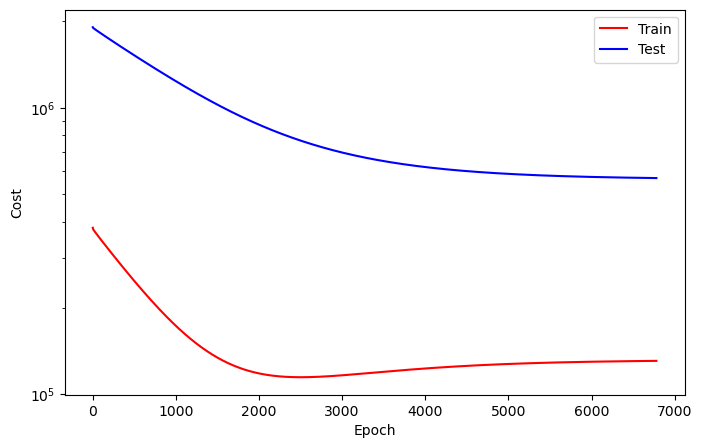

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6781
Train_cost  = 130882.2052 | Test_cost  = 567789.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6782
Train_cost  = 130883.0193 | Test_cost  = 567784.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6783
Train_cost  = 130883.8588 | Test_cost  = 567779.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6784
Train_cost  = 130884.6929 | Test_cost  = 567775.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6785
Train_cost  = 130885.5162 | Test_cost  = 567770.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6786
Train_cost  = 130886.3472 | Test_cost  = 567765.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6787
Train_cost  = 130887.1543 | Test_cost  = 567761.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6788
Train_cost  = 130887.9846 | Test_cost  = 567756.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6789
Train_cost  = 130888.8295 | Test_cost  = 567751.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6790
Train_cost  = 130889.6196 | Test_cost  = 567747.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6791
Train_cost  = 130890.4606 | Test_cost  = 567742.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6792
Train_cost  = 130891.3025 | Test_cost  = 567737.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6793
Train_cost  = 130892.0910 | Test_cost  = 567732.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6794
Train_cost  = 130892.9275 | Test_cost  = 567728.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6795
Train_cost  = 130893.7824 | Test_cost  = 567723.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6796
Train_cost  = 130894.5972 | Test_cost  = 567718.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6797
Train_cost  = 130895.4035 | Test_cost  = 567714.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6798
Train_cost  = 130896.2276 | Test_cost  = 567709.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6799
Train_cost  = 130897.0440 | Test_cost  = 567705.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6800
Train_cost  = 130897.8542 | Test_cost  = 567700.3750 | 


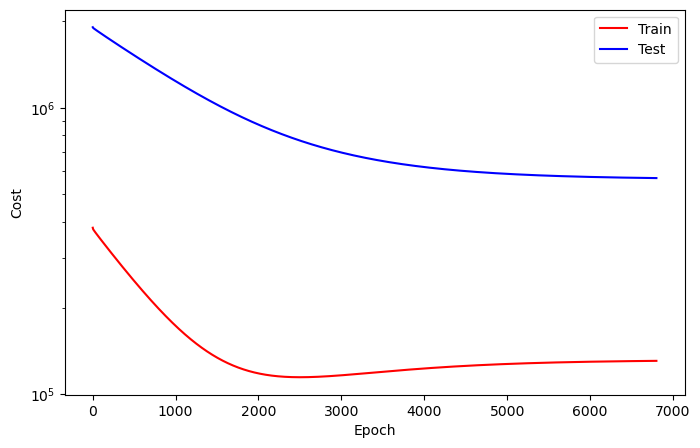

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6801
Train_cost  = 130898.6628 | Test_cost  = 567695.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6802
Train_cost  = 130899.4776 | Test_cost  = 567691.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6803
Train_cost  = 130900.2840 | Test_cost  = 567686.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6804
Train_cost  = 130901.0895 | Test_cost  = 567681.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6805
Train_cost  = 130901.9097 | Test_cost  = 567677.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6806
Train_cost  = 130902.6991 | Test_cost  = 567672.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6807
Train_cost  = 130903.5285 | Test_cost  = 567668.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6808
Train_cost  = 130904.3426 | Test_cost  = 567663.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6809
Train_cost  = 130905.1350 | Test_cost  = 567659.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6810
Train_cost  = 130905.9591 | Test_cost  = 567654.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6811
Train_cost  = 130906.7670 | Test_cost  = 567649.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6812
Train_cost  = 130907.5772 | Test_cost  = 567645.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6813
Train_cost  = 130908.3750 | Test_cost  = 567640.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6814
Train_cost  = 130909.1898 | Test_cost  = 567636.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6815
Train_cost  = 130910.0046 | Test_cost  = 567631.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6816
Train_cost  = 130910.7948 | Test_cost  = 567626.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6817
Train_cost  = 130911.6373 | Test_cost  = 567622.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6818
Train_cost  = 130912.4074 | Test_cost  = 567617.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6819
Train_cost  = 130913.2346 | Test_cost  = 567613.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6820
Train_cost  = 130914.0386 | Test_cost  = 567608.6000 | 


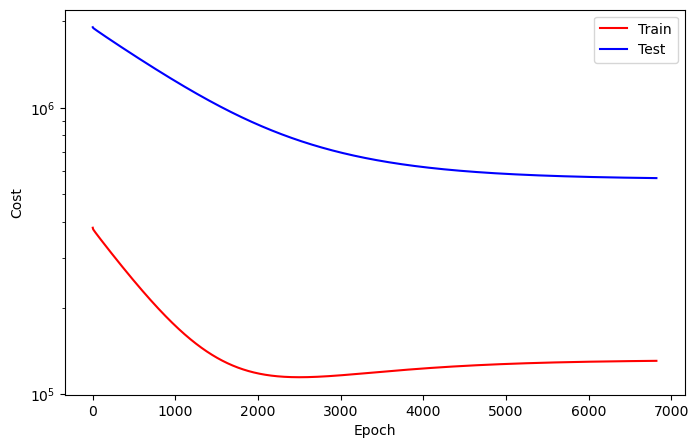

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6821
Train_cost  = 130914.8364 | Test_cost  = 567603.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6822
Train_cost  = 130915.6775 | Test_cost  = 567599.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6823
Train_cost  = 130916.4722 | Test_cost  = 567594.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6824
Train_cost  = 130917.2701 | Test_cost  = 567590.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6825
Train_cost  = 130918.0532 | Test_cost  = 567585.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6826
Train_cost  = 130918.8735 | Test_cost  = 567581.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6827
Train_cost  = 130919.6489 | Test_cost  = 567576.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6828
Train_cost  = 130920.4653 | Test_cost  = 567572.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6829
Train_cost  = 130921.2431 | Test_cost  = 567567.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6830
Train_cost  = 130922.0625 | Test_cost  = 567563.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6831
Train_cost  = 130922.8225 | Test_cost  = 567558.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6832
Train_cost  = 130923.6404 | Test_cost  = 567554.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6833
Train_cost  = 130924.4182 | Test_cost  = 567549.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6834
Train_cost  = 130925.2330 | Test_cost  = 567545.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6835
Train_cost  = 130926.0170 | Test_cost  = 567540.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6836
Train_cost  = 130926.8056 | Test_cost  = 567536.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6837
Train_cost  = 130927.6042 | Test_cost  = 567531.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6838
Train_cost  = 130928.3773 | Test_cost  = 567527.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6839
Train_cost  = 130929.2014 | Test_cost  = 567522.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6840
Train_cost  = 130929.9722 | Test_cost  = 567518.1750 | 


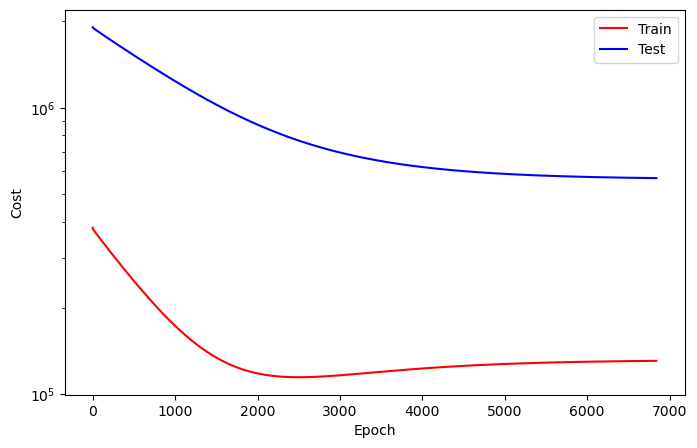

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6841
Train_cost  = 130930.7577 | Test_cost  = 567513.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6842
Train_cost  = 130931.5448 | Test_cost  = 567509.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6843
Train_cost  = 130932.3627 | Test_cost  = 567504.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6844
Train_cost  = 130933.1466 | Test_cost  = 567499.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6845
Train_cost  = 130933.9815 | Test_cost  = 567495.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6846
Train_cost  = 130934.7407 | Test_cost  = 567491.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6847
Train_cost  = 130935.5424 | Test_cost  = 567486.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6848
Train_cost  = 130936.3295 | Test_cost  = 567482.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6849
Train_cost  = 130937.1242 | Test_cost  = 567477.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6850
Train_cost  = 130937.9174 | Test_cost  = 567473.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6851
Train_cost  = 130938.7145 | Test_cost  = 567468.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6852
Train_cost  = 130939.5170 | Test_cost  = 567464.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6853
Train_cost  = 130940.3040 | Test_cost  = 567459.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6854
Train_cost  = 130941.1019 | Test_cost  = 567455.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6855
Train_cost  = 130941.8727 | Test_cost  = 567450.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6856
Train_cost  = 130942.6674 | Test_cost  = 567446.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6857
Train_cost  = 130943.4552 | Test_cost  = 567441.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6858
Train_cost  = 130944.2585 | Test_cost  = 567436.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6859
Train_cost  = 130945.0656 | Test_cost  = 567432.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6860
Train_cost  = 130945.8781 | Test_cost  = 567428.0250 | 


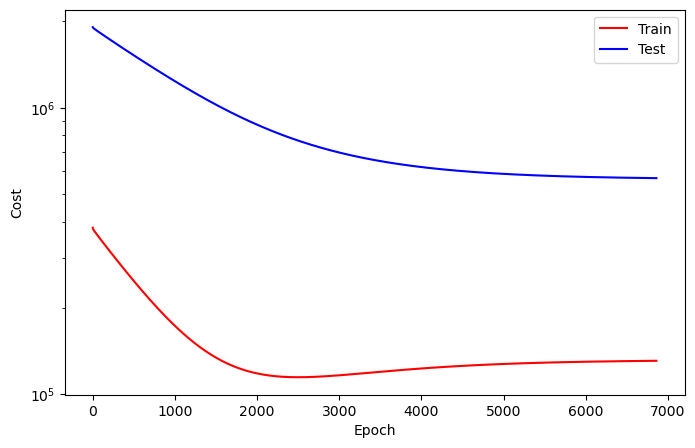

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6861
Train_cost  = 130946.6389 | Test_cost  = 567423.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6862
Train_cost  = 130947.4614 | Test_cost  = 567419.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6863
Train_cost  = 130948.2245 | Test_cost  = 567414.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6864
Train_cost  = 130949.0332 | Test_cost  = 567410.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6865
Train_cost  = 130949.8264 | Test_cost  = 567405.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6866
Train_cost  = 130950.6273 | Test_cost  = 567401.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6867
Train_cost  = 130951.4228 | Test_cost  = 567396.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6868
Train_cost  = 130952.1960 | Test_cost  = 567392.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6869
Train_cost  = 130953.0123 | Test_cost  = 567387.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6870
Train_cost  = 130953.7855 | Test_cost  = 567382.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6871
Train_cost  = 130954.6019 | Test_cost  = 567378.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6872
Train_cost  = 130955.3765 | Test_cost  = 567374.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6873
Train_cost  = 130956.1721 | Test_cost  = 567369.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6874
Train_cost  = 130956.9552 | Test_cost  = 567365.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6875
Train_cost  = 130957.7670 | Test_cost  = 567360.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6876
Train_cost  = 130958.5571 | Test_cost  = 567355.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6877
Train_cost  = 130959.3719 | Test_cost  = 567351.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6878
Train_cost  = 130960.1505 | Test_cost  = 567347.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6879
Train_cost  = 130960.9159 | Test_cost  = 567342.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6880
Train_cost  = 130961.7191 | Test_cost  = 567338.3000 | 


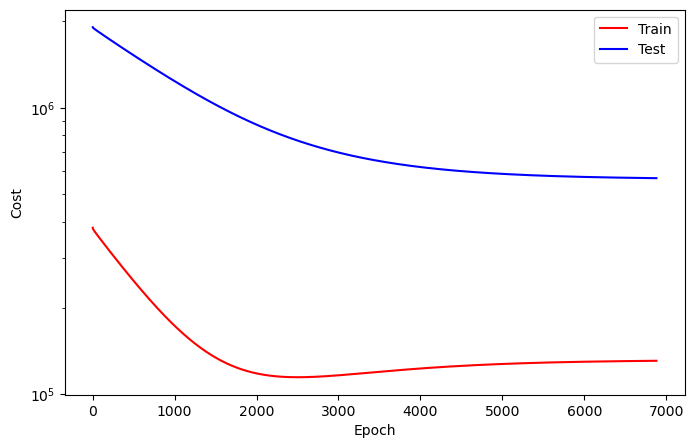

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6881
Train_cost  = 130962.4707 | Test_cost  = 567333.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6882
Train_cost  = 130963.2485 | Test_cost  = 567329.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6883
Train_cost  = 130964.0432 | Test_cost  = 567325.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6884
Train_cost  = 130964.8279 | Test_cost  = 567320.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6885
Train_cost  = 130965.5910 | Test_cost  = 567316.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6886
Train_cost  = 130966.3719 | Test_cost  = 567311.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6887
Train_cost  = 130967.1435 | Test_cost  = 567307.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6888
Train_cost  = 130967.9437 | Test_cost  = 567303.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6889
Train_cost  = 130968.7029 | Test_cost  = 567298.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6890
Train_cost  = 130969.4846 | Test_cost  = 567294.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6891
Train_cost  = 130970.2755 | Test_cost  = 567289.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6892
Train_cost  = 130971.0177 | Test_cost  = 567285.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6893
Train_cost  = 130971.7731 | Test_cost  = 567281.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6894
Train_cost  = 130972.5656 | Test_cost  = 567276.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6895
Train_cost  = 130973.3156 | Test_cost  = 567272.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6896
Train_cost  = 130974.0664 | Test_cost  = 567268.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6897
Train_cost  = 130974.8233 | Test_cost  = 567263.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6898
Train_cost  = 130975.5895 | Test_cost  = 567259.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6899
Train_cost  = 130976.3627 | Test_cost  = 567255.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6900
Train_cost  = 130977.1196 | Test_cost  = 567251.1250 | 


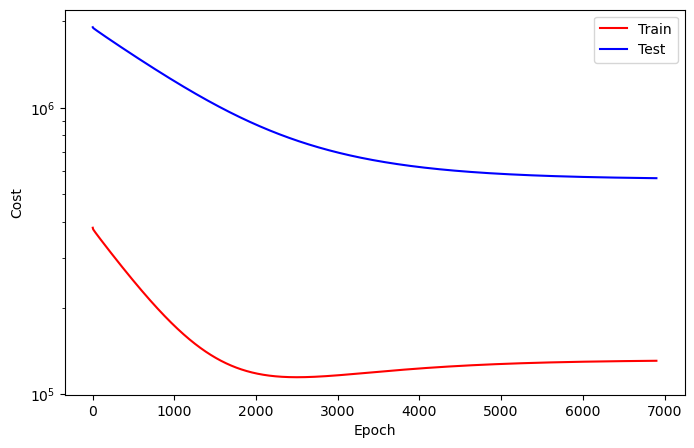

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6901
Train_cost  = 130977.8565 | Test_cost  = 567246.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6902
Train_cost  = 130978.6265 | Test_cost  = 567242.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6903
Train_cost  = 130979.3974 | Test_cost  = 567238.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6904
Train_cost  = 130980.1574 | Test_cost  = 567233.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6905
Train_cost  = 130980.8951 | Test_cost  = 567229.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6906
Train_cost  = 130981.6767 | Test_cost  = 567225.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6907
Train_cost  = 130982.4491 | Test_cost  = 567221.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6908
Train_cost  = 130983.2022 | Test_cost  = 567216.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6909
Train_cost  = 130983.9506 | Test_cost  = 567212.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6910
Train_cost  = 130984.7191 | Test_cost  = 567208.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6911
Train_cost  = 130985.4761 | Test_cost  = 567203.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6912
Train_cost  = 130986.2346 | Test_cost  = 567199.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6913
Train_cost  = 130986.9676 | Test_cost  = 567195.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6914
Train_cost  = 130987.7384 | Test_cost  = 567190.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6915
Train_cost  = 130988.5077 | Test_cost  = 567186.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6916
Train_cost  = 130989.2701 | Test_cost  = 567182.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6917
Train_cost  = 130990.0085 | Test_cost  = 567177.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6918
Train_cost  = 130990.7731 | Test_cost  = 567173.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6919
Train_cost  = 130991.5494 | Test_cost  = 567169.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6920
Train_cost  = 130992.3009 | Test_cost  = 567165.1750 | 


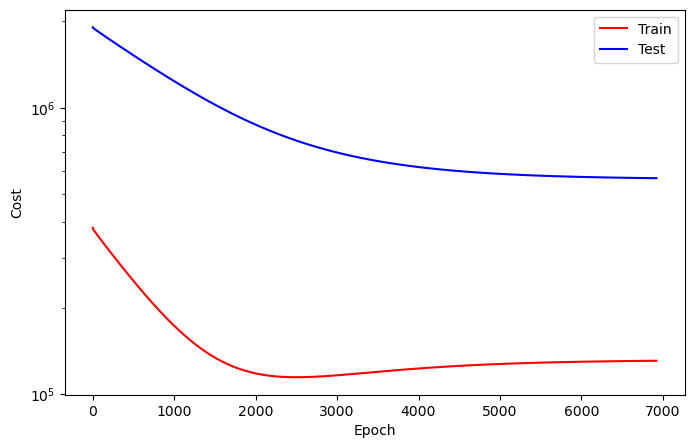

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6921
Train_cost  = 130993.0540 | Test_cost  = 567160.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6922
Train_cost  = 130993.8218 | Test_cost  = 567156.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6923
Train_cost  = 130994.6003 | Test_cost  = 567152.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6924
Train_cost  = 130995.3472 | Test_cost  = 567148.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6925
Train_cost  = 130996.0733 | Test_cost  = 567143.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6926
Train_cost  = 130996.8580 | Test_cost  = 567139.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6927
Train_cost  = 130997.6204 | Test_cost  = 567135.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6928
Train_cost  = 130998.3642 | Test_cost  = 567130.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6929
Train_cost  = 130999.1049 | Test_cost  = 567126.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6930
Train_cost  = 130999.8449 | Test_cost  = 567122.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6931
Train_cost  = 131000.6003 | Test_cost  = 567118.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6932
Train_cost  = 131001.3495 | Test_cost  = 567114.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6933
Train_cost  = 131002.0849 | Test_cost  = 567110.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6934
Train_cost  = 131002.7809 | Test_cost  = 567105.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6935
Train_cost  = 131003.5394 | Test_cost  = 567101.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6936
Train_cost  = 131004.2716 | Test_cost  = 567097.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6937
Train_cost  = 131004.9977 | Test_cost  = 567093.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6938
Train_cost  = 131005.7099 | Test_cost  = 567089.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6939
Train_cost  = 131006.4684 | Test_cost  = 567085.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6940
Train_cost  = 131007.1752 | Test_cost  = 567081.3000 | 


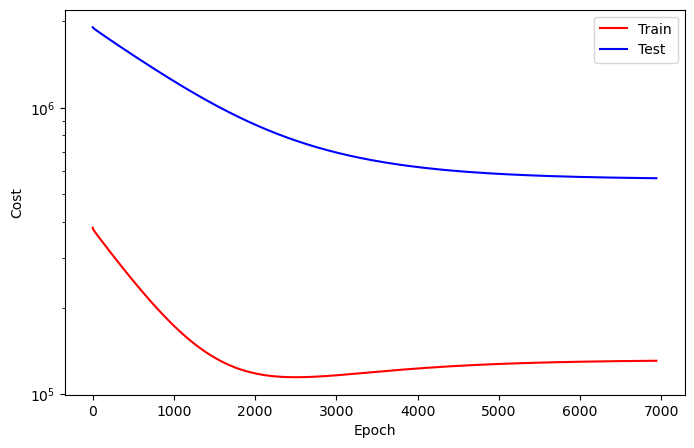

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6941
Train_cost  = 131007.8904 | Test_cost  = 567077.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6942
Train_cost  = 131008.6227 | Test_cost  = 567073.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6943
Train_cost  = 131009.3657 | Test_cost  = 567068.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6944
Train_cost  = 131010.0949 | Test_cost  = 567064.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6945
Train_cost  = 131010.8171 | Test_cost  = 567060.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6946
Train_cost  = 131011.5370 | Test_cost  = 567056.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6947
Train_cost  = 131012.2647 | Test_cost  = 567052.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6948
Train_cost  = 131012.9954 | Test_cost  = 567048.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6949
Train_cost  = 131013.7276 | Test_cost  = 567044.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6950
Train_cost  = 131014.4414 | Test_cost  = 567040.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6951
Train_cost  = 131015.1914 | Test_cost  = 567036.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6952
Train_cost  = 131015.9159 | Test_cost  = 567031.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6953
Train_cost  = 131016.6327 | Test_cost  = 567027.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6954
Train_cost  = 131017.3634 | Test_cost  = 567023.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6955
Train_cost  = 131018.1034 | Test_cost  = 567019.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6956
Train_cost  = 131018.7963 | Test_cost  = 567015.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6957
Train_cost  = 131019.5177 | Test_cost  = 567011.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6958
Train_cost  = 131020.2407 | Test_cost  = 567007.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6959
Train_cost  = 131020.9460 | Test_cost  = 567003.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6960
Train_cost  = 131021.6644 | Test_cost  = 566999.4750 | 


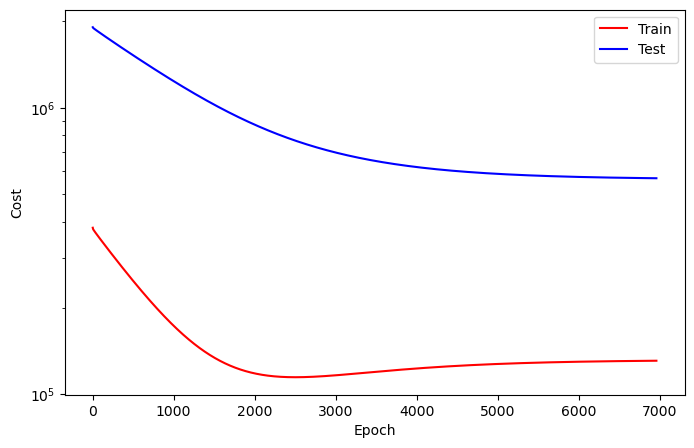

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6961
Train_cost  = 131022.3657 | Test_cost  = 566995.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6962
Train_cost  = 131023.0586 | Test_cost  = 566991.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6963
Train_cost  = 131023.7878 | Test_cost  = 566987.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6964
Train_cost  = 131024.5015 | Test_cost  = 566983.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6965
Train_cost  = 131025.1944 | Test_cost  = 566979.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6966
Train_cost  = 131025.9406 | Test_cost  = 566975.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6967
Train_cost  = 131026.6366 | Test_cost  = 566971.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6968
Train_cost  = 131027.3657 | Test_cost  = 566967.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6969
Train_cost  = 131028.0617 | Test_cost  = 566963.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6970
Train_cost  = 131028.7955 | Test_cost  = 566959.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6971
Train_cost  = 131029.5000 | Test_cost  = 566955.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6972
Train_cost  = 131030.2060 | Test_cost  = 566951.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6973
Train_cost  = 131030.9144 | Test_cost  = 566947.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6974
Train_cost  = 131031.6219 | Test_cost  = 566943.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6975
Train_cost  = 131032.3534 | Test_cost  = 566939.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6976
Train_cost  = 131033.0355 | Test_cost  = 566935.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6977
Train_cost  = 131033.7639 | Test_cost  = 566930.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6978
Train_cost  = 131034.4614 | Test_cost  = 566926.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6979
Train_cost  = 131035.1998 | Test_cost  = 566922.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6980
Train_cost  = 131035.9228 | Test_cost  = 566918.9750 | 


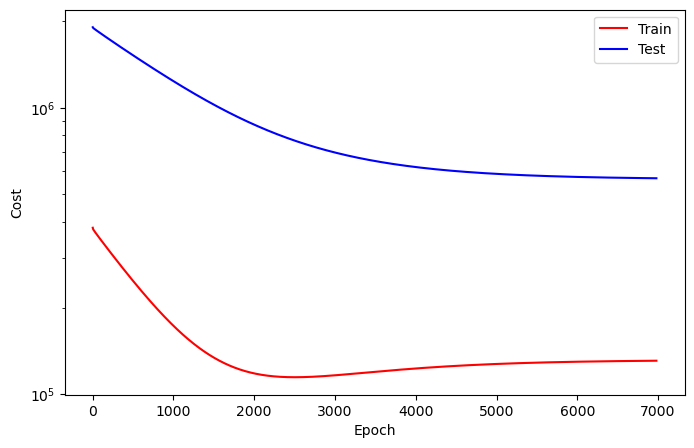

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6981
Train_cost  = 131036.6204 | Test_cost  = 566914.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6982
Train_cost  = 131037.3356 | Test_cost  = 566910.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6983
Train_cost  = 131038.0471 | Test_cost  = 566906.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6984
Train_cost  = 131038.7593 | Test_cost  = 566902.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6985
Train_cost  = 131039.4846 | Test_cost  = 566898.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6986
Train_cost  = 131040.1705 | Test_cost  = 566894.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6987
Train_cost  = 131040.9120 | Test_cost  = 566890.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6988
Train_cost  = 131041.5957 | Test_cost  = 566886.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6989
Train_cost  = 131042.2816 | Test_cost  = 566882.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6990
Train_cost  = 131042.9961 | Test_cost  = 566879.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6991
Train_cost  = 131043.6806 | Test_cost  = 566875.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6992
Train_cost  = 131044.3719 | Test_cost  = 566871.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6993
Train_cost  = 131045.0602 | Test_cost  = 566867.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6994
Train_cost  = 131045.7569 | Test_cost  = 566863.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6995
Train_cost  = 131046.4622 | Test_cost  = 566859.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6996
Train_cost  = 131047.1551 | Test_cost  = 566855.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6997
Train_cost  = 131047.8565 | Test_cost  = 566851.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6998
Train_cost  = 131048.5355 | Test_cost  = 566847.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  6999
Train_cost  = 131049.2446 | Test_cost  = 566843.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7000
Train_cost  = 131049.9360 | Test_cost  = 566839.6500 | 


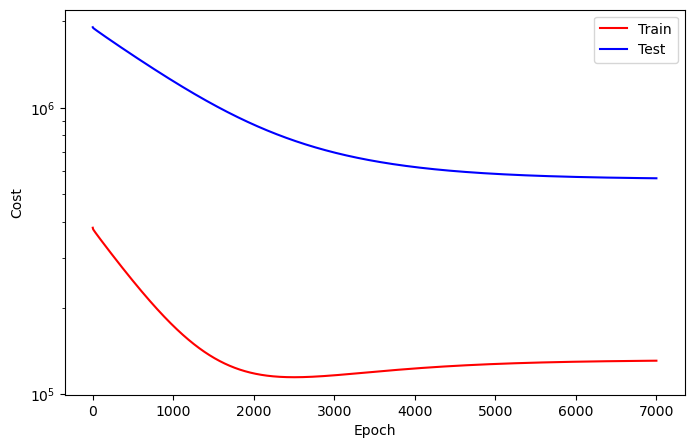

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7001
Train_cost  = 131050.6289 | Test_cost  = 566835.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7002
Train_cost  = 131051.3248 | Test_cost  = 566831.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7003
Train_cost  = 131052.0139 | Test_cost  = 566828.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7004
Train_cost  = 131052.7022 | Test_cost  = 566824.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7005
Train_cost  = 131053.4035 | Test_cost  = 566820.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7006
Train_cost  = 131054.1042 | Test_cost  = 566816.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7007
Train_cost  = 131054.7940 | Test_cost  = 566812.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7008
Train_cost  = 131055.4722 | Test_cost  = 566808.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7009
Train_cost  = 131056.1744 | Test_cost  = 566804.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7010
Train_cost  = 131056.8549 | Test_cost  = 566800.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7011
Train_cost  = 131057.5910 | Test_cost  = 566796.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7012
Train_cost  = 131058.2631 | Test_cost  = 566792.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7013
Train_cost  = 131058.9738 | Test_cost  = 566788.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7014
Train_cost  = 131059.6636 | Test_cost  = 566784.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7015
Train_cost  = 131060.3519 | Test_cost  = 566780.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7016
Train_cost  = 131061.0594 | Test_cost  = 566776.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7017
Train_cost  = 131061.7492 | Test_cost  = 566773.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7018
Train_cost  = 131062.4498 | Test_cost  = 566769.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7019
Train_cost  = 131063.1358 | Test_cost  = 566765.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7020
Train_cost  = 131063.8133 | Test_cost  = 566761.2250 | 


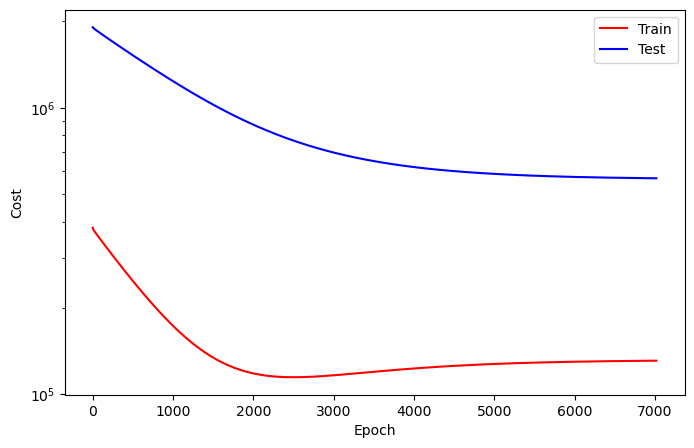

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7021
Train_cost  = 131064.5301 | Test_cost  = 566757.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7022
Train_cost  = 131065.2122 | Test_cost  = 566753.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7023
Train_cost  = 131065.9236 | Test_cost  = 566749.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7024
Train_cost  = 131066.6042 | Test_cost  = 566745.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7025
Train_cost  = 131067.2731 | Test_cost  = 566741.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7026
Train_cost  = 131067.9769 | Test_cost  = 566737.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7027
Train_cost  = 131068.6798 | Test_cost  = 566733.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7028
Train_cost  = 131069.3920 | Test_cost  = 566729.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7029
Train_cost  = 131070.0949 | Test_cost  = 566725.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7030
Train_cost  = 131070.7608 | Test_cost  = 566721.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7031
Train_cost  = 131071.4722 | Test_cost  = 566718.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7032
Train_cost  = 131072.1528 | Test_cost  = 566714.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7033
Train_cost  = 131072.8650 | Test_cost  = 566710.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7034
Train_cost  = 131073.5471 | Test_cost  = 566706.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7035
Train_cost  = 131074.2569 | Test_cost  = 566702.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7036
Train_cost  = 131074.9468 | Test_cost  = 566698.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7037
Train_cost  = 131075.6296 | Test_cost  = 566694.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7038
Train_cost  = 131076.3241 | Test_cost  = 566690.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7039
Train_cost  = 131077.0262 | Test_cost  = 566686.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7040
Train_cost  = 131077.7292 | Test_cost  = 566682.9000 | 


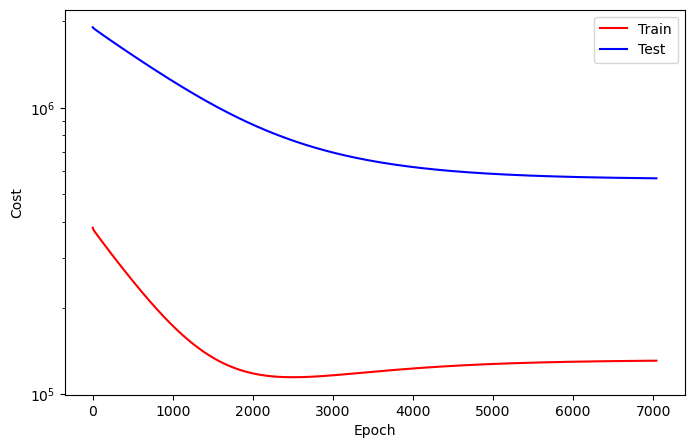

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7041
Train_cost  = 131078.4097 | Test_cost  = 566678.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7042
Train_cost  = 131079.1057 | Test_cost  = 566674.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7043
Train_cost  = 131079.8071 | Test_cost  = 566671.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7044
Train_cost  = 131080.4923 | Test_cost  = 566667.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7045
Train_cost  = 131081.2006 | Test_cost  = 566663.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7046
Train_cost  = 131081.9043 | Test_cost  = 566659.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7047
Train_cost  = 131082.5671 | Test_cost  = 566655.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7048
Train_cost  = 131083.2847 | Test_cost  = 566651.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7049
Train_cost  = 131083.9599 | Test_cost  = 566647.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7050
Train_cost  = 131084.6250 | Test_cost  = 566643.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7051
Train_cost  = 131085.3272 | Test_cost  = 566639.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7052
Train_cost  = 131085.9954 | Test_cost  = 566636.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7053
Train_cost  = 131086.6667 | Test_cost  = 566632.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7054
Train_cost  = 131087.3611 | Test_cost  = 566628.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7055
Train_cost  = 131088.0370 | Test_cost  = 566624.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7056
Train_cost  = 131088.7099 | Test_cost  = 566620.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7057
Train_cost  = 131089.3920 | Test_cost  = 566617.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7058
Train_cost  = 131090.0625 | Test_cost  = 566613.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7059
Train_cost  = 131090.7523 | Test_cost  = 566609.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7060
Train_cost  = 131091.4282 | Test_cost  = 566605.4750 | 


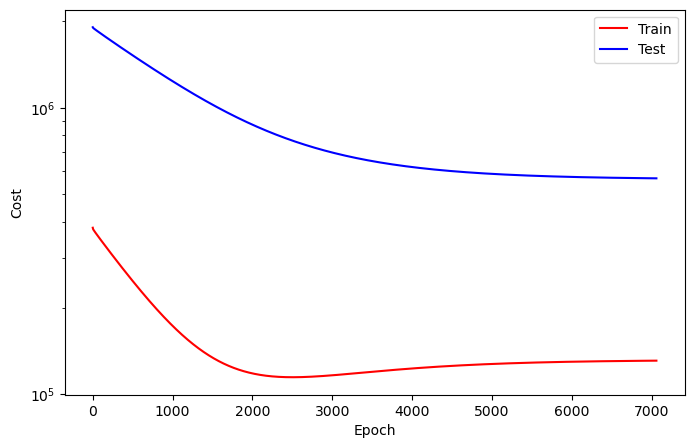

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7061
Train_cost  = 131092.0980 | Test_cost  = 566601.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7062
Train_cost  = 131092.7901 | Test_cost  = 566597.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7063
Train_cost  = 131093.4730 | Test_cost  = 566594.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7064
Train_cost  = 131094.1489 | Test_cost  = 566590.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7065
Train_cost  = 131094.8248 | Test_cost  = 566586.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7066
Train_cost  = 131095.5139 | Test_cost  = 566582.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7067
Train_cost  = 131096.1713 | Test_cost  = 566578.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7068
Train_cost  = 131096.8380 | Test_cost  = 566575.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7069
Train_cost  = 131097.4969 | Test_cost  = 566571.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7070
Train_cost  = 131098.1667 | Test_cost  = 566567.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7071
Train_cost  = 131098.8156 | Test_cost  = 566563.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7072
Train_cost  = 131099.5023 | Test_cost  = 566560.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7073
Train_cost  = 131100.1590 | Test_cost  = 566556.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7074
Train_cost  = 131100.7986 | Test_cost  = 566552.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7075
Train_cost  = 131101.4761 | Test_cost  = 566549.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7076
Train_cost  = 131102.1566 | Test_cost  = 566545.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7077
Train_cost  = 131102.8079 | Test_cost  = 566541.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7078
Train_cost  = 131103.4738 | Test_cost  = 566537.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7079
Train_cost  = 131104.1157 | Test_cost  = 566534.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7080
Train_cost  = 131104.8110 | Test_cost  = 566530.3250 | 


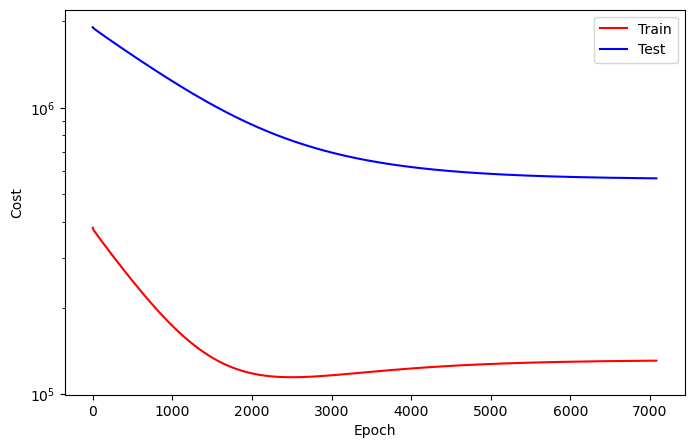

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7081
Train_cost  = 131105.4583 | Test_cost  = 566526.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7082
Train_cost  = 131106.1265 | Test_cost  = 566522.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7083
Train_cost  = 131106.7731 | Test_cost  = 566519.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7084
Train_cost  = 131107.4552 | Test_cost  = 566515.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7085
Train_cost  = 131108.1065 | Test_cost  = 566511.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7086
Train_cost  = 131108.7623 | Test_cost  = 566508.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7087
Train_cost  = 131109.4228 | Test_cost  = 566504.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7088
Train_cost  = 131110.1173 | Test_cost  = 566500.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7089
Train_cost  = 131110.7485 | Test_cost  = 566496.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7090
Train_cost  = 131111.4120 | Test_cost  = 566492.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7091
Train_cost  = 131112.0617 | Test_cost  = 566489.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7092
Train_cost  = 131112.7662 | Test_cost  = 566485.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7093
Train_cost  = 131113.4128 | Test_cost  = 566481.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7094
Train_cost  = 131114.0764 | Test_cost  = 566478.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7095
Train_cost  = 131114.7446 | Test_cost  = 566474.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7096
Train_cost  = 131115.4105 | Test_cost  = 566470.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7097
Train_cost  = 131116.0687 | Test_cost  = 566466.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7098
Train_cost  = 131116.7315 | Test_cost  = 566463.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7099
Train_cost  = 131117.3765 | Test_cost  = 566459.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7100
Train_cost  = 131118.0540 | Test_cost  = 566455.6000 | 


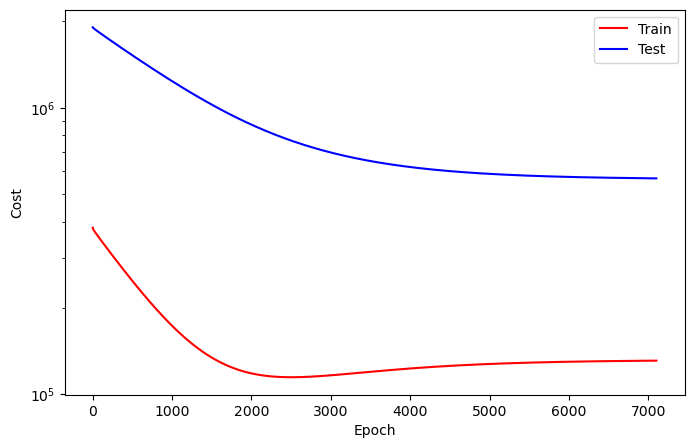

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7101
Train_cost  = 131118.7207 | Test_cost  = 566451.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7102
Train_cost  = 131119.3704 | Test_cost  = 566448.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7103
Train_cost  = 131120.0046 | Test_cost  = 566444.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7104
Train_cost  = 131120.6597 | Test_cost  = 566441.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7105
Train_cost  = 131121.3002 | Test_cost  = 566437.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7106
Train_cost  = 131121.9275 | Test_cost  = 566433.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7107
Train_cost  = 131122.6204 | Test_cost  = 566430.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7108
Train_cost  = 131123.2284 | Test_cost  = 566426.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7109
Train_cost  = 131123.9035 | Test_cost  = 566422.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7110
Train_cost  = 131124.4946 | Test_cost  = 566419.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7111
Train_cost  = 131125.1327 | Test_cost  = 566415.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7112
Train_cost  = 131125.7670 | Test_cost  = 566412.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7113
Train_cost  = 131126.4035 | Test_cost  = 566408.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7114
Train_cost  = 131127.0285 | Test_cost  = 566405.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7115
Train_cost  = 131127.6528 | Test_cost  = 566401.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7116
Train_cost  = 131128.2978 | Test_cost  = 566398.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7117
Train_cost  = 131128.9128 | Test_cost  = 566394.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7118
Train_cost  = 131129.5301 | Test_cost  = 566391.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7119
Train_cost  = 131130.1852 | Test_cost  = 566387.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7120
Train_cost  = 131130.8086 | Test_cost  = 566384.0750 | 


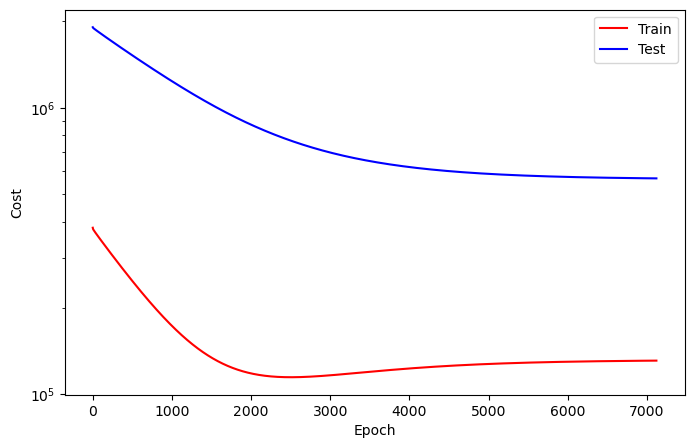

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7121
Train_cost  = 131131.4390 | Test_cost  = 566380.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7122
Train_cost  = 131132.0448 | Test_cost  = 566377.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7123
Train_cost  = 131132.6883 | Test_cost  = 566373.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7124
Train_cost  = 131133.3056 | Test_cost  = 566369.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7125
Train_cost  = 131133.9529 | Test_cost  = 566366.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7126
Train_cost  = 131134.5540 | Test_cost  = 566362.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7127
Train_cost  = 131135.1883 | Test_cost  = 566359.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7128
Train_cost  = 131135.8094 | Test_cost  = 566355.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7129
Train_cost  = 131136.4622 | Test_cost  = 566352.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7130
Train_cost  = 131137.0679 | Test_cost  = 566348.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7131
Train_cost  = 131137.7191 | Test_cost  = 566345.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7132
Train_cost  = 131138.3495 | Test_cost  = 566341.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7133
Train_cost  = 131138.9769 | Test_cost  = 566338.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7134
Train_cost  = 131139.5818 | Test_cost  = 566334.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7135
Train_cost  = 131140.2184 | Test_cost  = 566331.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7136
Train_cost  = 131140.8395 | Test_cost  = 566327.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7137
Train_cost  = 131141.4630 | Test_cost  = 566324.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7138
Train_cost  = 131142.0671 | Test_cost  = 566320.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7139
Train_cost  = 131142.6651 | Test_cost  = 566317.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7140
Train_cost  = 131143.2816 | Test_cost  = 566313.8250 | 


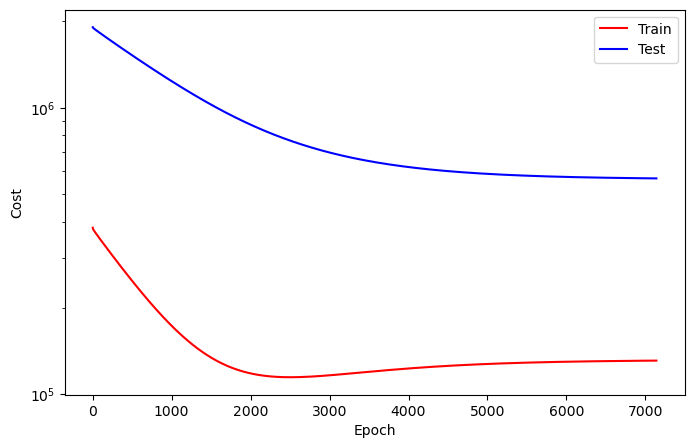

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7141
Train_cost  = 131143.8974 | Test_cost  = 566310.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7142
Train_cost  = 131144.5154 | Test_cost  = 566306.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7143
Train_cost  = 131145.1296 | Test_cost  = 566303.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7144
Train_cost  = 131145.7392 | Test_cost  = 566300.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7145
Train_cost  = 131146.3426 | Test_cost  = 566296.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7146
Train_cost  = 131146.9406 | Test_cost  = 566293.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7147
Train_cost  = 131147.5756 | Test_cost  = 566289.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7148
Train_cost  = 131148.1921 | Test_cost  = 566286.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7149
Train_cost  = 131148.7840 | Test_cost  = 566282.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7150
Train_cost  = 131149.3981 | Test_cost  = 566279.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7151
Train_cost  = 131150.0409 | Test_cost  = 566276.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7152
Train_cost  = 131150.6204 | Test_cost  = 566272.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7153
Train_cost  = 131151.2361 | Test_cost  = 566269.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7154
Train_cost  = 131151.8650 | Test_cost  = 566265.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7155
Train_cost  = 131152.4938 | Test_cost  = 566262.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7156
Train_cost  = 131153.0748 | Test_cost  = 566258.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7157
Train_cost  = 131153.6968 | Test_cost  = 566255.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7158
Train_cost  = 131154.3056 | Test_cost  = 566251.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7159
Train_cost  = 131154.9244 | Test_cost  = 566248.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7160
Train_cost  = 131155.5448 | Test_cost  = 566244.9750 | 


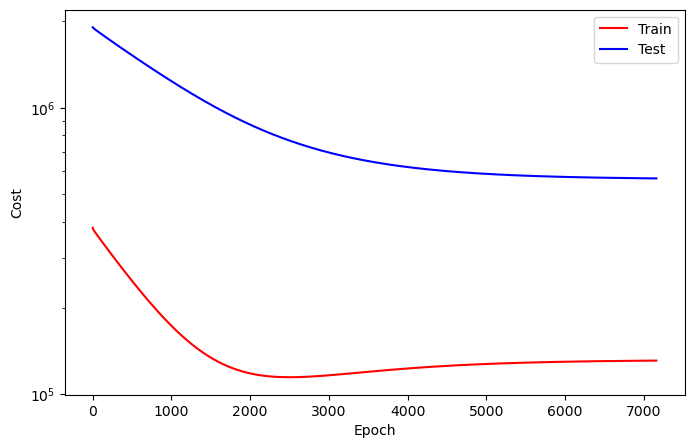

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7161
Train_cost  = 131156.1397 | Test_cost  = 566241.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7162
Train_cost  = 131156.7361 | Test_cost  = 566238.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7163
Train_cost  = 131157.3673 | Test_cost  = 566234.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7164
Train_cost  = 131157.9799 | Test_cost  = 566231.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7165
Train_cost  = 131158.5988 | Test_cost  = 566227.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7166
Train_cost  = 131159.2068 | Test_cost  = 566224.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7167
Train_cost  = 131159.8218 | Test_cost  = 566220.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7168
Train_cost  = 131160.4475 | Test_cost  = 566217.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7169
Train_cost  = 131161.0509 | Test_cost  = 566213.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7170
Train_cost  = 131161.6435 | Test_cost  = 566210.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7171
Train_cost  = 131162.2654 | Test_cost  = 566207.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7172
Train_cost  = 131162.8719 | Test_cost  = 566203.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7173
Train_cost  = 131163.4676 | Test_cost  = 566200.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7174
Train_cost  = 131164.1150 | Test_cost  = 566196.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7175
Train_cost  = 131164.7045 | Test_cost  = 566193.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7176
Train_cost  = 131165.3179 | Test_cost  = 566189.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7177
Train_cost  = 131165.9452 | Test_cost  = 566186.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7178
Train_cost  = 131166.5309 | Test_cost  = 566183.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7179
Train_cost  = 131167.1397 | Test_cost  = 566179.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7180
Train_cost  = 131167.7315 | Test_cost  = 566176.4000 | 


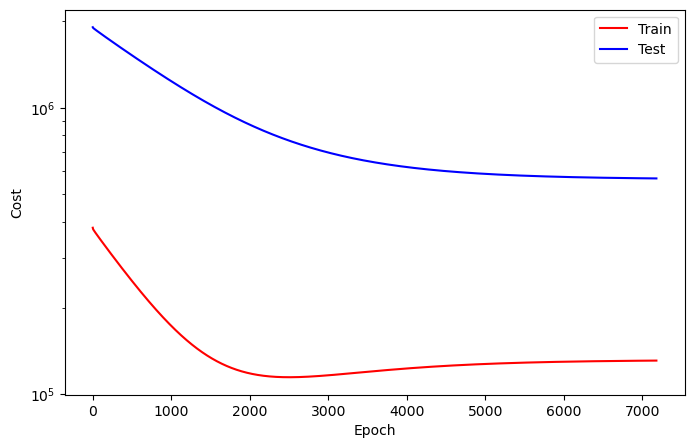

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7181
Train_cost  = 131168.3218 | Test_cost  = 566173.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7182
Train_cost  = 131168.9090 | Test_cost  = 566169.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7183
Train_cost  = 131169.5147 | Test_cost  = 566166.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7184
Train_cost  = 131170.1034 | Test_cost  = 566163.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7185
Train_cost  = 131170.6906 | Test_cost  = 566159.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7186
Train_cost  = 131171.3040 | Test_cost  = 566156.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7187
Train_cost  = 131171.9066 | Test_cost  = 566152.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7188
Train_cost  = 131172.4830 | Test_cost  = 566149.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7189
Train_cost  = 131173.0833 | Test_cost  = 566146.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7190
Train_cost  = 131173.6790 | Test_cost  = 566142.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7191
Train_cost  = 131174.2840 | Test_cost  = 566139.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7192
Train_cost  = 131174.8827 | Test_cost  = 566136.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7193
Train_cost  = 131175.4614 | Test_cost  = 566132.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7194
Train_cost  = 131176.0694 | Test_cost  = 566129.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7195
Train_cost  = 131176.6613 | Test_cost  = 566126.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7196
Train_cost  = 131177.2577 | Test_cost  = 566122.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7197
Train_cost  = 131177.8449 | Test_cost  = 566119.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7198
Train_cost  = 131178.4398 | Test_cost  = 566116.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7199
Train_cost  = 131179.0309 | Test_cost  = 566112.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7200
Train_cost  = 131179.6219 | Test_cost  = 566109.4750 | 


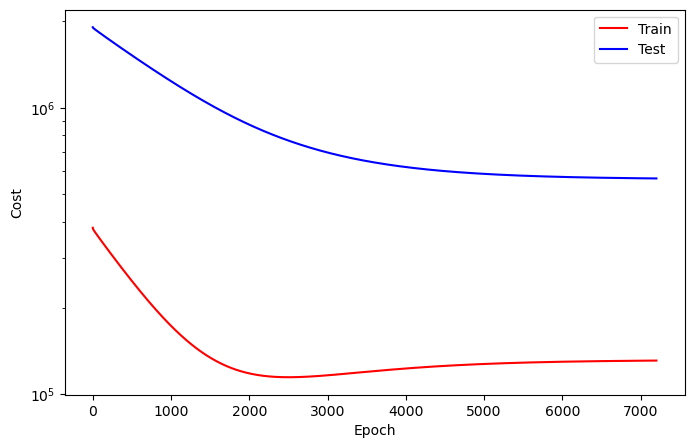

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7201
Train_cost  = 131180.2014 | Test_cost  = 566106.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7202
Train_cost  = 131180.8179 | Test_cost  = 566102.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7203
Train_cost  = 131181.4051 | Test_cost  = 566099.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7204
Train_cost  = 131181.9954 | Test_cost  = 566096.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7205
Train_cost  = 131182.6073 | Test_cost  = 566092.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7206
Train_cost  = 131183.1759 | Test_cost  = 566089.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7207
Train_cost  = 131183.7816 | Test_cost  = 566086.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7208
Train_cost  = 131184.3843 | Test_cost  = 566082.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7209
Train_cost  = 131184.9745 | Test_cost  = 566079.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7210
Train_cost  = 131185.5694 | Test_cost  = 566076.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7211
Train_cost  = 131186.1767 | Test_cost  = 566072.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7212
Train_cost  = 131186.7593 | Test_cost  = 566069.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7213
Train_cost  = 131187.3503 | Test_cost  = 566066.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7214
Train_cost  = 131187.9475 | Test_cost  = 566062.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7215
Train_cost  = 131188.5424 | Test_cost  = 566059.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7216
Train_cost  = 131189.1559 | Test_cost  = 566056.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7217
Train_cost  = 131189.7091 | Test_cost  = 566052.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7218
Train_cost  = 131190.3349 | Test_cost  = 566049.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7219
Train_cost  = 131190.9367 | Test_cost  = 566045.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7220
Train_cost  = 131191.5262 | Test_cost  = 566042.6250 | 


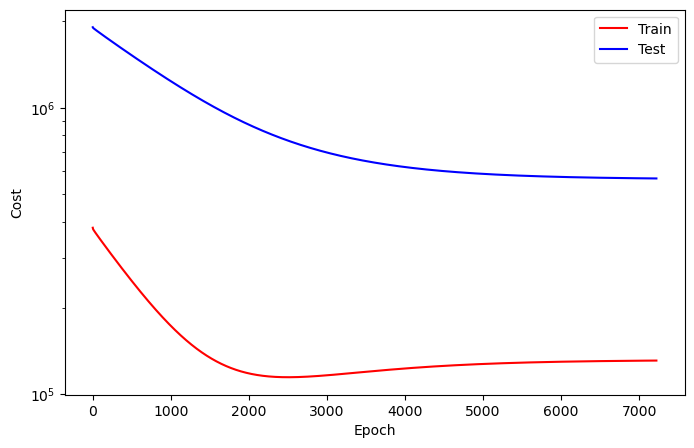

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7221
Train_cost  = 131192.1157 | Test_cost  = 566039.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7222
Train_cost  = 131192.7114 | Test_cost  = 566035.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7223
Train_cost  = 131193.3102 | Test_cost  = 566032.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7224
Train_cost  = 131193.9005 | Test_cost  = 566029.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7225
Train_cost  = 131194.4776 | Test_cost  = 566025.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7226
Train_cost  = 131195.1034 | Test_cost  = 566022.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7227
Train_cost  = 131195.6898 | Test_cost  = 566019.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7228
Train_cost  = 131196.2724 | Test_cost  = 566016.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7229
Train_cost  = 131196.8688 | Test_cost  = 566012.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7230
Train_cost  = 131197.4792 | Test_cost  = 566009.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7231
Train_cost  = 131198.0540 | Test_cost  = 566005.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7232
Train_cost  = 131198.6427 | Test_cost  = 566002.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7233
Train_cost  = 131199.2361 | Test_cost  = 565999.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7234
Train_cost  = 131199.8588 | Test_cost  = 565995.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7235
Train_cost  = 131200.4352 | Test_cost  = 565992.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7236
Train_cost  = 131201.0378 | Test_cost  = 565989.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7237
Train_cost  = 131201.6343 | Test_cost  = 565985.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7238
Train_cost  = 131202.2160 | Test_cost  = 565982.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7239
Train_cost  = 131202.7886 | Test_cost  = 565979.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7240
Train_cost  = 131203.3997 | Test_cost  = 565975.8750 | 


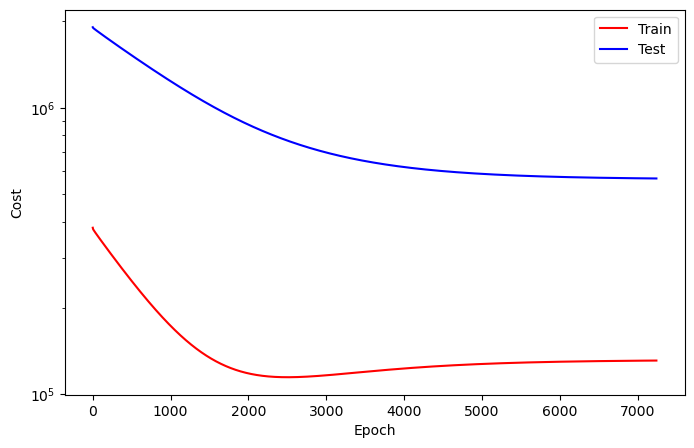

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7241
Train_cost  = 131204.0085 | Test_cost  = 565972.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7242
Train_cost  = 131204.5872 | Test_cost  = 565969.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7243
Train_cost  = 131205.1914 | Test_cost  = 565965.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7244
Train_cost  = 131205.7762 | Test_cost  = 565962.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7245
Train_cost  = 131206.3503 | Test_cost  = 565959.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7246
Train_cost  = 131206.9660 | Test_cost  = 565955.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7247
Train_cost  = 131207.5409 | Test_cost  = 565952.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7248
Train_cost  = 131208.1281 | Test_cost  = 565949.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7249
Train_cost  = 131208.7060 | Test_cost  = 565946.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7250
Train_cost  = 131209.2623 | Test_cost  = 565943.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7251
Train_cost  = 131209.8472 | Test_cost  = 565939.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7252
Train_cost  = 131210.4221 | Test_cost  = 565936.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7253
Train_cost  = 131211.0031 | Test_cost  = 565933.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7254
Train_cost  = 131211.5910 | Test_cost  = 565930.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7255
Train_cost  = 131212.1721 | Test_cost  = 565926.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7256
Train_cost  = 131212.7361 | Test_cost  = 565923.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7257
Train_cost  = 131213.3125 | Test_cost  = 565920.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7258
Train_cost  = 131213.8943 | Test_cost  = 565916.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7259
Train_cost  = 131214.4730 | Test_cost  = 565913.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7260
Train_cost  = 131215.0440 | Test_cost  = 565910.5500 | 


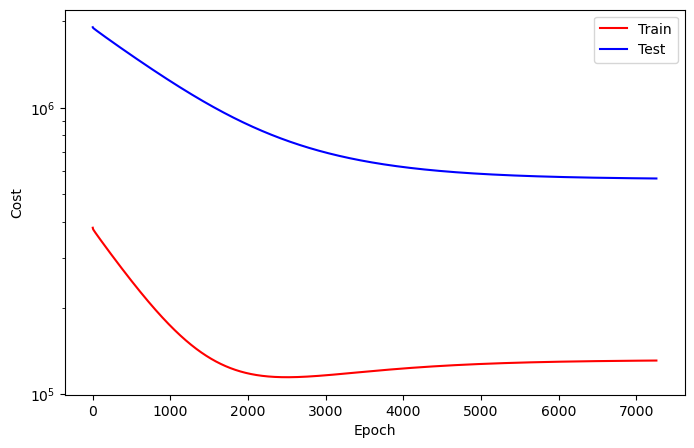

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7261
Train_cost  = 131215.6258 | Test_cost  = 565907.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7262
Train_cost  = 131216.2191 | Test_cost  = 565904.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7263
Train_cost  = 131216.7631 | Test_cost  = 565900.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7264
Train_cost  = 131217.3673 | Test_cost  = 565897.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7265
Train_cost  = 131217.9460 | Test_cost  = 565894.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7266
Train_cost  = 131218.5015 | Test_cost  = 565891.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7267
Train_cost  = 131219.0957 | Test_cost  = 565887.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7268
Train_cost  = 131219.6752 | Test_cost  = 565884.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7269
Train_cost  = 131220.2508 | Test_cost  = 565881.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7270
Train_cost  = 131220.8133 | Test_cost  = 565878.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7271
Train_cost  = 131221.3958 | Test_cost  = 565874.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7272
Train_cost  = 131221.9776 | Test_cost  = 565871.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7273
Train_cost  = 131222.5417 | Test_cost  = 565868.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7274
Train_cost  = 131223.1019 | Test_cost  = 565865.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7275
Train_cost  = 131223.6427 | Test_cost  = 565862.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7276
Train_cost  = 131224.2222 | Test_cost  = 565859.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7277
Train_cost  = 131224.7793 | Test_cost  = 565856.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7278
Train_cost  = 131225.3434 | Test_cost  = 565853.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7279
Train_cost  = 131225.9066 | Test_cost  = 565849.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7280
Train_cost  = 131226.4599 | Test_cost  = 565846.4750 | 


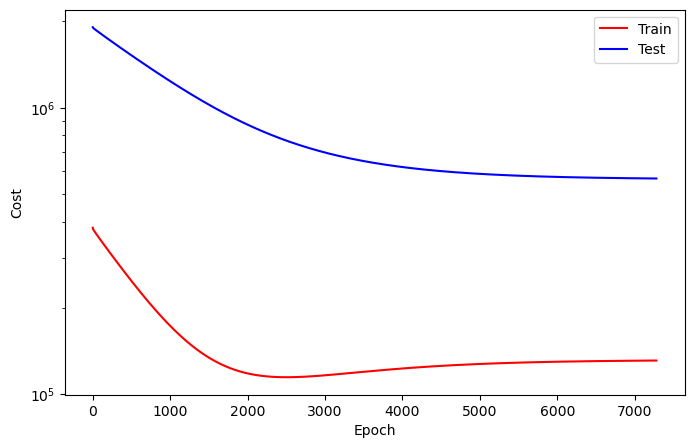

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7281
Train_cost  = 131227.0309 | Test_cost  = 565843.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7282
Train_cost  = 131227.5887 | Test_cost  = 565840.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7283
Train_cost  = 131228.1381 | Test_cost  = 565837.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7284
Train_cost  = 131228.7130 | Test_cost  = 565834.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7285
Train_cost  = 131229.2747 | Test_cost  = 565830.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7286
Train_cost  = 131229.8264 | Test_cost  = 565827.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7287
Train_cost  = 131230.3889 | Test_cost  = 565824.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7288
Train_cost  = 131230.9444 | Test_cost  = 565821.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7289
Train_cost  = 131231.5077 | Test_cost  = 565818.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7290
Train_cost  = 131232.0826 | Test_cost  = 565815.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7291
Train_cost  = 131232.6420 | Test_cost  = 565812.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7292
Train_cost  = 131233.1821 | Test_cost  = 565808.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7293
Train_cost  = 131233.7261 | Test_cost  = 565805.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7294
Train_cost  = 131234.3017 | Test_cost  = 565802.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7295
Train_cost  = 131234.8742 | Test_cost  = 565799.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7296
Train_cost  = 131235.4275 | Test_cost  = 565796.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7297
Train_cost  = 131235.9992 | Test_cost  = 565793.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7298
Train_cost  = 131236.5517 | Test_cost  = 565790.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7299
Train_cost  = 131237.1049 | Test_cost  = 565786.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7300
Train_cost  = 131237.6759 | Test_cost  = 565783.7500 | 


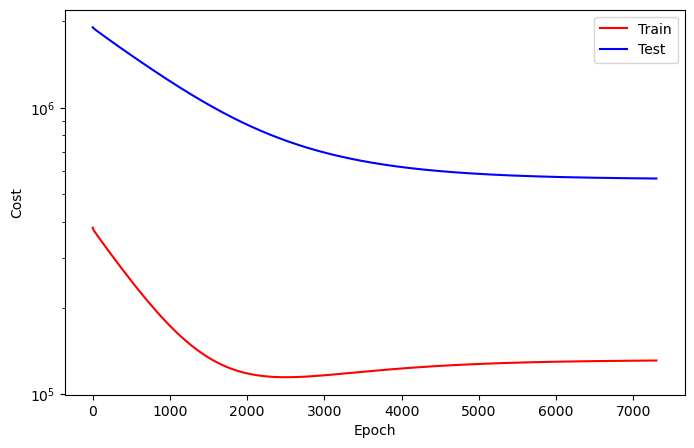

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7301
Train_cost  = 131238.2299 | Test_cost  = 565780.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7302
Train_cost  = 131238.7770 | Test_cost  = 565777.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7303
Train_cost  = 131239.3557 | Test_cost  = 565774.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7304
Train_cost  = 131239.9151 | Test_cost  = 565771.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7305
Train_cost  = 131240.4715 | Test_cost  = 565768.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7306
Train_cost  = 131241.0008 | Test_cost  = 565765.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7307
Train_cost  = 131241.5532 | Test_cost  = 565762.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7308
Train_cost  = 131242.0903 | Test_cost  = 565759.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7309
Train_cost  = 131242.6250 | Test_cost  = 565755.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7310
Train_cost  = 131243.1759 | Test_cost  = 565753.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7311
Train_cost  = 131243.7145 | Test_cost  = 565749.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7312
Train_cost  = 131244.2716 | Test_cost  = 565746.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7313
Train_cost  = 131244.8295 | Test_cost  = 565743.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7314
Train_cost  = 131245.3449 | Test_cost  = 565740.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7315
Train_cost  = 131245.8819 | Test_cost  = 565737.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7316
Train_cost  = 131246.4221 | Test_cost  = 565735.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7317
Train_cost  = 131246.9529 | Test_cost  = 565731.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7318
Train_cost  = 131247.4653 | Test_cost  = 565729.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7319
Train_cost  = 131247.9907 | Test_cost  = 565726.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7320
Train_cost  = 131248.5340 | Test_cost  = 565723.0750 | 


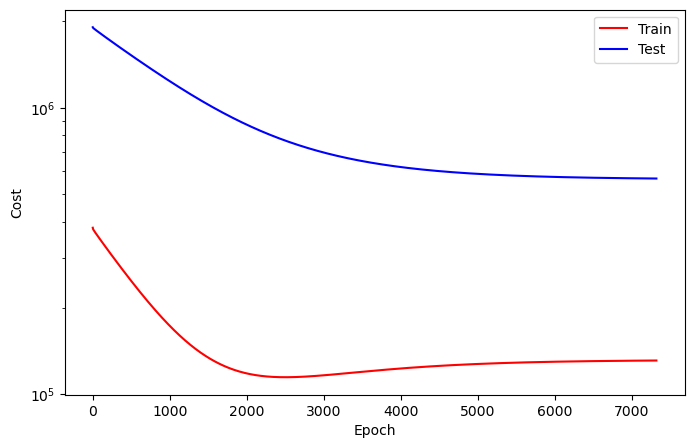

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7321
Train_cost  = 131249.0602 | Test_cost  = 565720.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7322
Train_cost  = 131249.5802 | Test_cost  = 565717.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7323
Train_cost  = 131250.1096 | Test_cost  = 565714.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7324
Train_cost  = 131250.6173 | Test_cost  = 565711.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7325
Train_cost  = 131251.1636 | Test_cost  = 565708.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7326
Train_cost  = 131251.6829 | Test_cost  = 565705.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7327
Train_cost  = 131252.2022 | Test_cost  = 565702.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7328
Train_cost  = 131252.7338 | Test_cost  = 565699.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7329
Train_cost  = 131253.2647 | Test_cost  = 565696.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7330
Train_cost  = 131253.7940 | Test_cost  = 565693.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7331
Train_cost  = 131254.3032 | Test_cost  = 565690.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7332
Train_cost  = 131254.8403 | Test_cost  = 565687.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7333
Train_cost  = 131255.3480 | Test_cost  = 565684.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7334
Train_cost  = 131255.8989 | Test_cost  = 565681.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7335
Train_cost  = 131256.4128 | Test_cost  = 565678.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7336
Train_cost  = 131256.9591 | Test_cost  = 565675.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7337
Train_cost  = 131257.4630 | Test_cost  = 565672.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7338
Train_cost  = 131257.9892 | Test_cost  = 565670.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7339
Train_cost  = 131258.5216 | Test_cost  = 565667.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7340
Train_cost  = 131259.0509 | Test_cost  = 565664.1750 | 


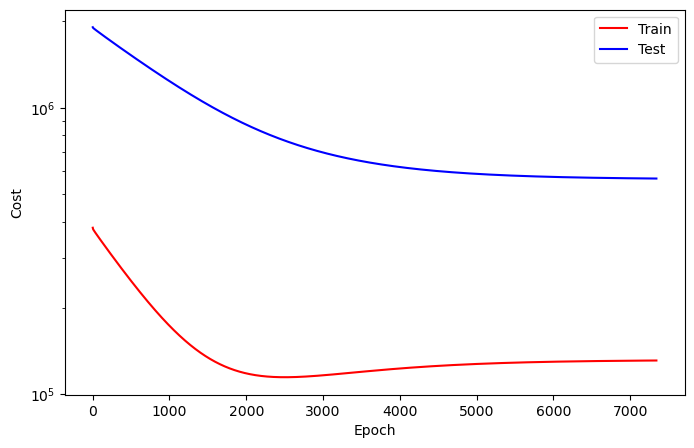

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7341
Train_cost  = 131259.5772 | Test_cost  = 565661.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7342
Train_cost  = 131260.1096 | Test_cost  = 565658.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7343
Train_cost  = 131260.6281 | Test_cost  = 565655.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7344
Train_cost  = 131261.1528 | Test_cost  = 565652.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7345
Train_cost  = 131261.6914 | Test_cost  = 565649.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7346
Train_cost  = 131262.2052 | Test_cost  = 565646.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7347
Train_cost  = 131262.7361 | Test_cost  = 565643.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7348
Train_cost  = 131263.2608 | Test_cost  = 565640.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7349
Train_cost  = 131263.7801 | Test_cost  = 565637.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7350
Train_cost  = 131264.2824 | Test_cost  = 565634.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7351
Train_cost  = 131264.8009 | Test_cost  = 565631.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7352
Train_cost  = 131265.3133 | Test_cost  = 565629.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7353
Train_cost  = 131265.8179 | Test_cost  = 565626.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7354
Train_cost  = 131266.3164 | Test_cost  = 565623.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7355
Train_cost  = 131266.8426 | Test_cost  = 565620.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7356
Train_cost  = 131267.3534 | Test_cost  = 565617.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7357
Train_cost  = 131267.8650 | Test_cost  = 565614.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7358
Train_cost  = 131268.3704 | Test_cost  = 565611.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7359
Train_cost  = 131268.8819 | Test_cost  = 565609.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7360
Train_cost  = 131269.3665 | Test_cost  = 565606.2500 | 


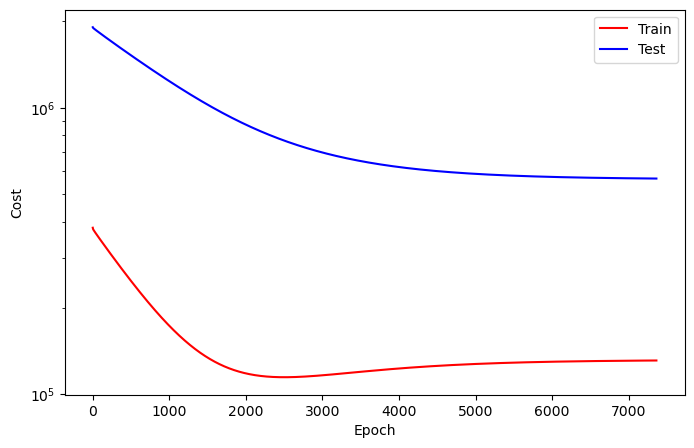

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7361
Train_cost  = 131269.9020 | Test_cost  = 565603.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7362
Train_cost  = 131270.3912 | Test_cost  = 565600.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7363
Train_cost  = 131270.9267 | Test_cost  = 565597.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7364
Train_cost  = 131271.4406 | Test_cost  = 565594.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7365
Train_cost  = 131271.9360 | Test_cost  = 565591.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7366
Train_cost  = 131272.4437 | Test_cost  = 565589.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7367
Train_cost  = 131272.9591 | Test_cost  = 565586.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7368
Train_cost  = 131273.4769 | Test_cost  = 565583.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7369
Train_cost  = 131274.0062 | Test_cost  = 565580.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7370
Train_cost  = 131274.4985 | Test_cost  = 565577.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7371
Train_cost  = 131275.0093 | Test_cost  = 565574.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7372
Train_cost  = 131275.5216 | Test_cost  = 565571.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7373
Train_cost  = 131276.0216 | Test_cost  = 565569.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7374
Train_cost  = 131276.5478 | Test_cost  = 565566.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7375
Train_cost  = 131277.0602 | Test_cost  = 565563.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7376
Train_cost  = 131277.5764 | Test_cost  = 565560.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7377
Train_cost  = 131278.0802 | Test_cost  = 565557.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7378
Train_cost  = 131278.5841 | Test_cost  = 565554.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7379
Train_cost  = 131279.1003 | Test_cost  = 565551.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7380
Train_cost  = 131279.6165 | Test_cost  = 565549.0000 | 


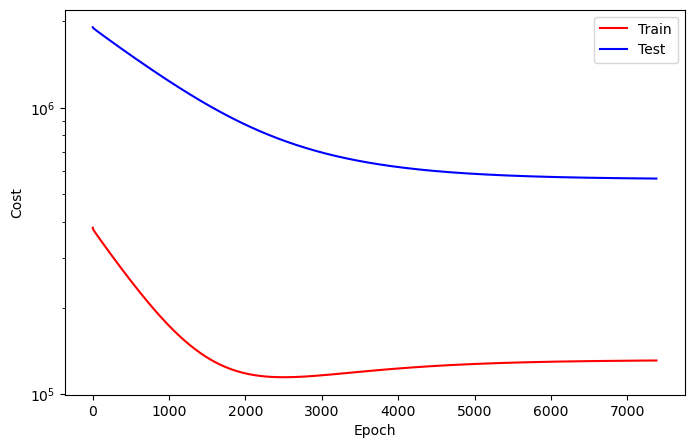

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7381
Train_cost  = 131280.1258 | Test_cost  = 565546.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7382
Train_cost  = 131280.6304 | Test_cost  = 565543.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7383
Train_cost  = 131281.1319 | Test_cost  = 565540.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7384
Train_cost  = 131281.6474 | Test_cost  = 565537.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7385
Train_cost  = 131282.1713 | Test_cost  = 565534.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7386
Train_cost  = 131282.6914 | Test_cost  = 565531.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7387
Train_cost  = 131283.1929 | Test_cost  = 565528.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7388
Train_cost  = 131283.7099 | Test_cost  = 565526.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7389
Train_cost  = 131284.2145 | Test_cost  = 565523.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7390
Train_cost  = 131284.7176 | Test_cost  = 565520.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7391
Train_cost  = 131285.2222 | Test_cost  = 565517.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7392
Train_cost  = 131285.7415 | Test_cost  = 565514.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7393
Train_cost  = 131286.2539 | Test_cost  = 565511.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7394
Train_cost  = 131286.7546 | Test_cost  = 565509.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7395
Train_cost  = 131287.2523 | Test_cost  = 565506.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7396
Train_cost  = 131287.7755 | Test_cost  = 565503.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7397
Train_cost  = 131288.2847 | Test_cost  = 565500.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7398
Train_cost  = 131288.8017 | Test_cost  = 565497.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7399
Train_cost  = 131289.2994 | Test_cost  = 565494.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7400
Train_cost  = 131289.8171 | Test_cost  = 565491.8250 | 


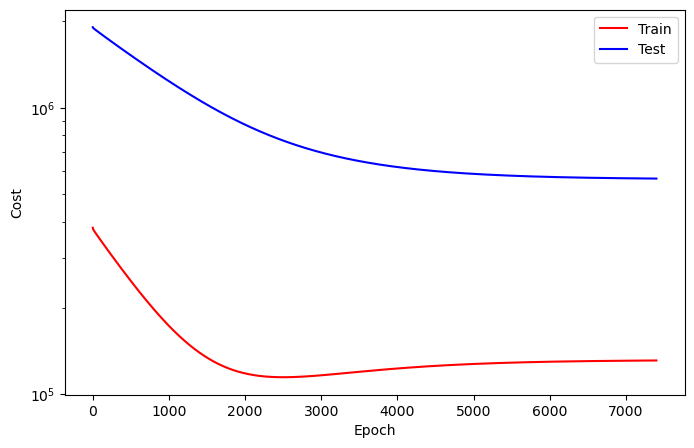

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7401
Train_cost  = 131290.3318 | Test_cost  = 565488.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7402
Train_cost  = 131290.8472 | Test_cost  = 565486.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7403
Train_cost  = 131291.3426 | Test_cost  = 565483.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7404
Train_cost  = 131291.8333 | Test_cost  = 565480.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7405
Train_cost  = 131292.3457 | Test_cost  = 565477.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7406
Train_cost  = 131292.8356 | Test_cost  = 565474.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7407
Train_cost  = 131293.3356 | Test_cost  = 565472.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7408
Train_cost  = 131293.8426 | Test_cost  = 565469.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7409
Train_cost  = 131294.3179 | Test_cost  = 565466.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7410
Train_cost  = 131294.8133 | Test_cost  = 565463.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7411
Train_cost  = 131295.2994 | Test_cost  = 565461.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7412
Train_cost  = 131295.7909 | Test_cost  = 565458.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7413
Train_cost  = 131296.2940 | Test_cost  = 565455.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7414
Train_cost  = 131296.7955 | Test_cost  = 565452.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7415
Train_cost  = 131297.2963 | Test_cost  = 565450.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7416
Train_cost  = 131297.7793 | Test_cost  = 565447.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7417
Train_cost  = 131298.2901 | Test_cost  = 565444.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7418
Train_cost  = 131298.7801 | Test_cost  = 565441.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7419
Train_cost  = 131299.2785 | Test_cost  = 565438.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7420
Train_cost  = 131299.7523 | Test_cost  = 565436.3000 | 


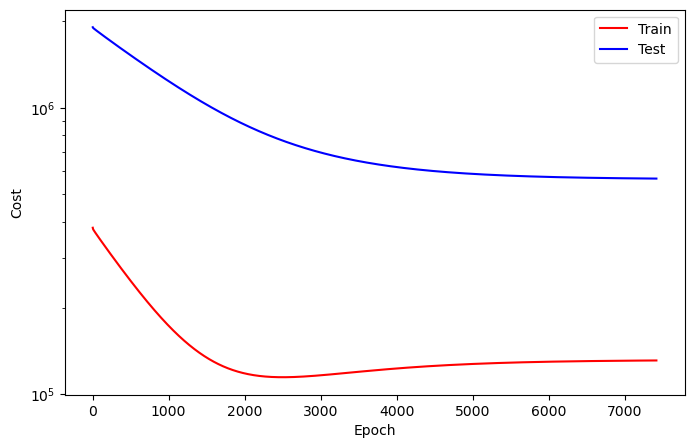

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7421
Train_cost  = 131300.2593 | Test_cost  = 565433.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7422
Train_cost  = 131300.7577 | Test_cost  = 565430.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7423
Train_cost  = 131301.2515 | Test_cost  = 565427.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7424
Train_cost  = 131301.7685 | Test_cost  = 565425.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7425
Train_cost  = 131302.2508 | Test_cost  = 565422.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7426
Train_cost  = 131302.7400 | Test_cost  = 565419.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7427
Train_cost  = 131303.2207 | Test_cost  = 565416.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7428
Train_cost  = 131303.7253 | Test_cost  = 565414.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7429
Train_cost  = 131304.2269 | Test_cost  = 565411.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7430
Train_cost  = 131304.7176 | Test_cost  = 565408.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7431
Train_cost  = 131305.2153 | Test_cost  = 565405.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7432
Train_cost  = 131305.6875 | Test_cost  = 565403.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7433
Train_cost  = 131306.2145 | Test_cost  = 565400.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7434
Train_cost  = 131306.7006 | Test_cost  = 565397.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7435
Train_cost  = 131307.1944 | Test_cost  = 565394.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7436
Train_cost  = 131307.6852 | Test_cost  = 565391.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7437
Train_cost  = 131308.2029 | Test_cost  = 565389.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7438
Train_cost  = 131308.6844 | Test_cost  = 565386.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7439
Train_cost  = 131309.1860 | Test_cost  = 565383.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7440
Train_cost  = 131309.6806 | Test_cost  = 565380.7500 | 


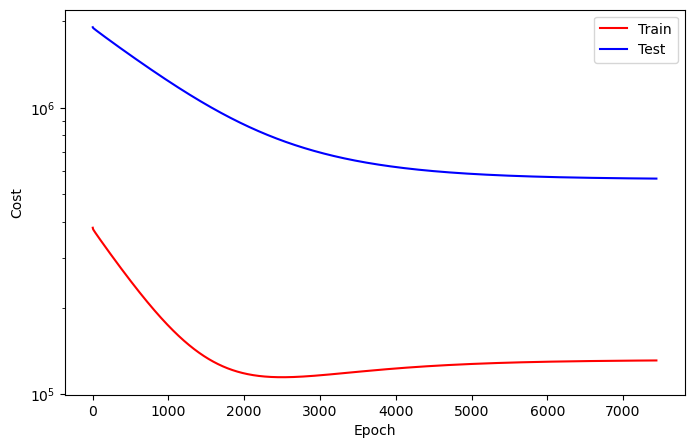

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7441
Train_cost  = 131310.1713 | Test_cost  = 565377.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7442
Train_cost  = 131310.6528 | Test_cost  = 565375.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7443
Train_cost  = 131311.1520 | Test_cost  = 565372.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7444
Train_cost  = 131311.6644 | Test_cost  = 565369.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7445
Train_cost  = 131312.1528 | Test_cost  = 565366.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7446
Train_cost  = 131312.6373 | Test_cost  = 565364.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7447
Train_cost  = 131313.1358 | Test_cost  = 565361.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7448
Train_cost  = 131313.6211 | Test_cost  = 565358.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7449
Train_cost  = 131314.1366 | Test_cost  = 565355.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7450
Train_cost  = 131314.6242 | Test_cost  = 565353.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7451
Train_cost  = 131315.1250 | Test_cost  = 565350.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7452
Train_cost  = 131315.5972 | Test_cost  = 565347.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7453
Train_cost  = 131316.1111 | Test_cost  = 565344.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7454
Train_cost  = 131316.6019 | Test_cost  = 565341.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7455
Train_cost  = 131317.1011 | Test_cost  = 565339.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7456
Train_cost  = 131317.6181 | Test_cost  = 565336.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7457
Train_cost  = 131318.0949 | Test_cost  = 565333.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7458
Train_cost  = 131318.5910 | Test_cost  = 565330.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7459
Train_cost  = 131319.0741 | Test_cost  = 565328.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7460
Train_cost  = 131319.5818 | Test_cost  = 565325.3750 | 


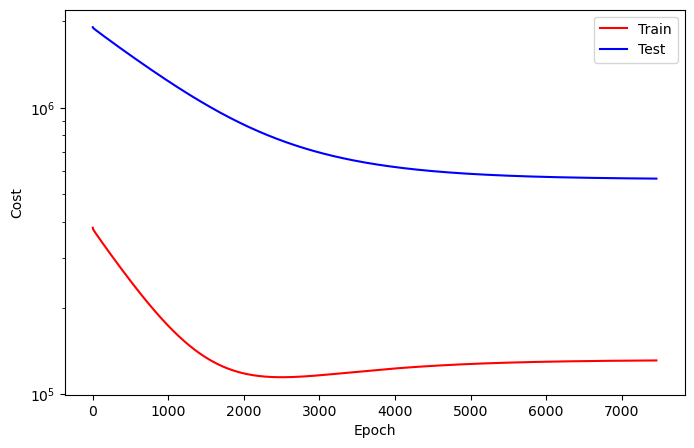

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7461
Train_cost  = 131320.0826 | Test_cost  = 565322.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7462
Train_cost  = 131320.5455 | Test_cost  = 565319.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7463
Train_cost  = 131321.0648 | Test_cost  = 565317.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7464
Train_cost  = 131321.5586 | Test_cost  = 565314.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7465
Train_cost  = 131322.0540 | Test_cost  = 565311.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7466
Train_cost  = 131322.5494 | Test_cost  = 565308.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7467
Train_cost  = 131323.0347 | Test_cost  = 565305.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7468
Train_cost  = 131323.5378 | Test_cost  = 565303.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7469
Train_cost  = 131324.0278 | Test_cost  = 565300.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7470
Train_cost  = 131324.5401 | Test_cost  = 565297.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7471
Train_cost  = 131325.0247 | Test_cost  = 565294.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7472
Train_cost  = 131325.5123 | Test_cost  = 565292.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7473
Train_cost  = 131326.0039 | Test_cost  = 565289.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7474
Train_cost  = 131326.4761 | Test_cost  = 565286.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7475
Train_cost  = 131326.9923 | Test_cost  = 565283.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7476
Train_cost  = 131327.4861 | Test_cost  = 565281.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7477
Train_cost  = 131327.9838 | Test_cost  = 565278.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7478
Train_cost  = 131328.4722 | Test_cost  = 565275.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7479
Train_cost  = 131328.9761 | Test_cost  = 565272.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7480
Train_cost  = 131329.4552 | Test_cost  = 565270.0500 | 


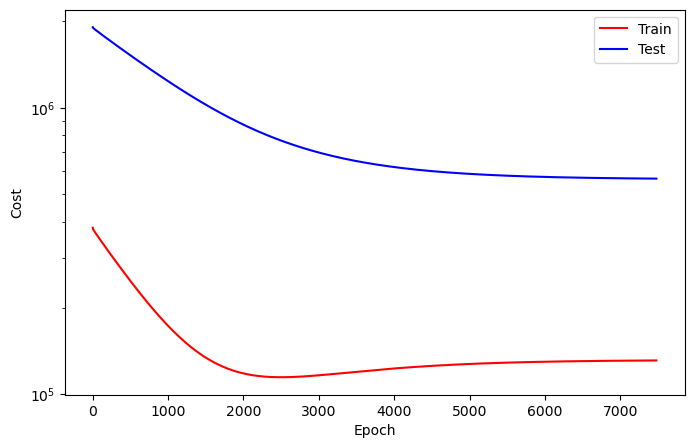

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7481
Train_cost  = 131329.9784 | Test_cost  = 565267.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7482
Train_cost  = 131330.4537 | Test_cost  = 565264.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7483
Train_cost  = 131330.9375 | Test_cost  = 565261.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7484
Train_cost  = 131331.4205 | Test_cost  = 565259.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7485
Train_cost  = 131331.8858 | Test_cost  = 565256.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7486
Train_cost  = 131332.3580 | Test_cost  = 565253.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7487
Train_cost  = 131332.8387 | Test_cost  = 565251.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7488
Train_cost  = 131333.3356 | Test_cost  = 565248.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7489
Train_cost  = 131333.8164 | Test_cost  = 565245.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7490
Train_cost  = 131334.2855 | Test_cost  = 565243.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7491
Train_cost  = 131334.7693 | Test_cost  = 565240.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7492
Train_cost  = 131335.2477 | Test_cost  = 565237.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7493
Train_cost  = 131335.7377 | Test_cost  = 565235.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7494
Train_cost  = 131336.2029 | Test_cost  = 565232.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7495
Train_cost  = 131336.6937 | Test_cost  = 565229.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7496
Train_cost  = 131337.1466 | Test_cost  = 565227.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7497
Train_cost  = 131337.6435 | Test_cost  = 565224.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7498
Train_cost  = 131338.1181 | Test_cost  = 565221.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7499
Train_cost  = 131338.5957 | Test_cost  = 565219.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7500
Train_cost  = 131339.0833 | Test_cost  = 565216.2500 | 


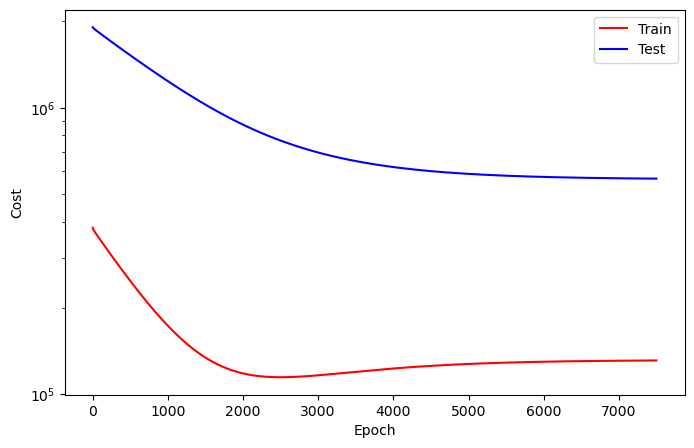

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7501
Train_cost  = 131339.5633 | Test_cost  = 565213.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7502
Train_cost  = 131340.0332 | Test_cost  = 565211.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7503
Train_cost  = 131340.4830 | Test_cost  = 565208.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7504
Train_cost  = 131340.9707 | Test_cost  = 565205.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7505
Train_cost  = 131341.4630 | Test_cost  = 565202.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7506
Train_cost  = 131341.9591 | Test_cost  = 565200.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7507
Train_cost  = 131342.4298 | Test_cost  = 565197.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7508
Train_cost  = 131342.9120 | Test_cost  = 565194.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7509
Train_cost  = 131343.3804 | Test_cost  = 565192.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7510
Train_cost  = 131343.8580 | Test_cost  = 565189.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7511
Train_cost  = 131344.3395 | Test_cost  = 565187.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7512
Train_cost  = 131344.8187 | Test_cost  = 565184.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7513
Train_cost  = 131345.2816 | Test_cost  = 565181.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7514
Train_cost  = 131345.7747 | Test_cost  = 565179.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7515
Train_cost  = 131346.2377 | Test_cost  = 565176.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7516
Train_cost  = 131346.7245 | Test_cost  = 565173.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7517
Train_cost  = 131347.1968 | Test_cost  = 565170.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7518
Train_cost  = 131347.6713 | Test_cost  = 565168.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7519
Train_cost  = 131348.1582 | Test_cost  = 565165.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7520
Train_cost  = 131348.6211 | Test_cost  = 565162.9750 | 


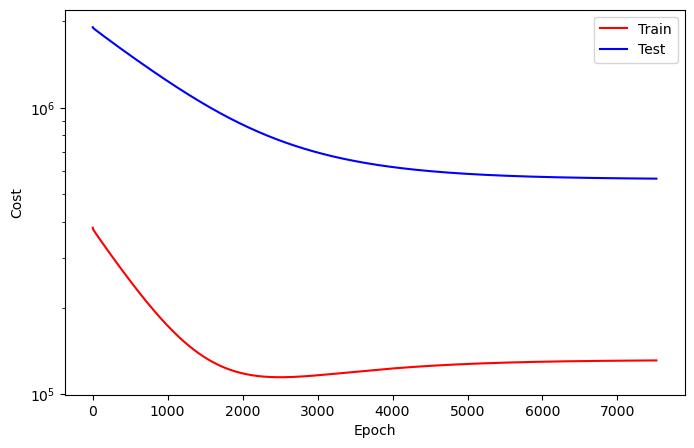

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7521
Train_cost  = 131349.1003 | Test_cost  = 565160.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7522
Train_cost  = 131349.5671 | Test_cost  = 565157.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7523
Train_cost  = 131350.0093 | Test_cost  = 565155.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7524
Train_cost  = 131350.4846 | Test_cost  = 565152.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7525
Train_cost  = 131350.9468 | Test_cost  = 565150.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7526
Train_cost  = 131351.3951 | Test_cost  = 565147.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7527
Train_cost  = 131351.8673 | Test_cost  = 565144.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7528
Train_cost  = 131352.3341 | Test_cost  = 565142.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7529
Train_cost  = 131352.7978 | Test_cost  = 565139.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7530
Train_cost  = 131353.2454 | Test_cost  = 565137.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7531
Train_cost  = 131353.7076 | Test_cost  = 565134.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7532
Train_cost  = 131354.1790 | Test_cost  = 565131.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7533
Train_cost  = 131354.6458 | Test_cost  = 565129.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7534
Train_cost  = 131355.0941 | Test_cost  = 565126.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7535
Train_cost  = 131355.5478 | Test_cost  = 565124.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7536
Train_cost  = 131356.0316 | Test_cost  = 565121.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7537
Train_cost  = 131356.4954 | Test_cost  = 565119.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7538
Train_cost  = 131356.9483 | Test_cost  = 565116.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7539
Train_cost  = 131357.4090 | Test_cost  = 565114.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7540
Train_cost  = 131357.8781 | Test_cost  = 565111.3000 | 


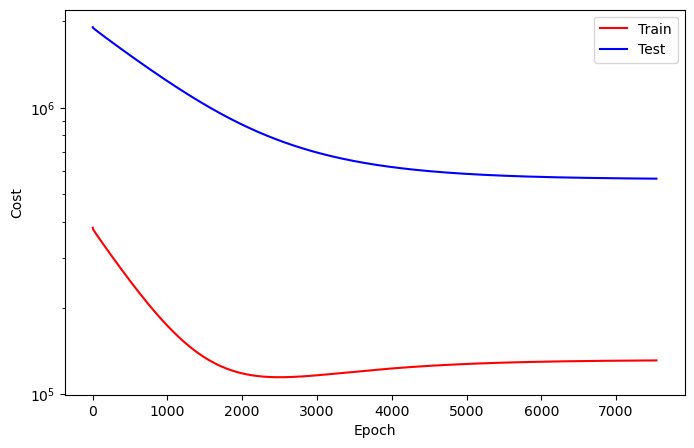

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7541
Train_cost  = 131358.3387 | Test_cost  = 565108.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7542
Train_cost  = 131358.8079 | Test_cost  = 565106.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7543
Train_cost  = 131359.2500 | Test_cost  = 565103.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7544
Train_cost  = 131359.7160 | Test_cost  = 565101.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7545
Train_cost  = 131360.1759 | Test_cost  = 565098.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7546
Train_cost  = 131360.6497 | Test_cost  = 565095.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7547
Train_cost  = 131361.1049 | Test_cost  = 565093.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7548
Train_cost  = 131361.5656 | Test_cost  = 565090.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7549
Train_cost  = 131362.0131 | Test_cost  = 565088.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7550
Train_cost  = 131362.4846 | Test_cost  = 565085.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7551
Train_cost  = 131362.9205 | Test_cost  = 565083.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7552
Train_cost  = 131363.3657 | Test_cost  = 565080.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7553
Train_cost  = 131363.8140 | Test_cost  = 565078.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7554
Train_cost  = 131364.2469 | Test_cost  = 565075.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7555
Train_cost  = 131364.6921 | Test_cost  = 565073.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7556
Train_cost  = 131365.1497 | Test_cost  = 565070.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7557
Train_cost  = 131365.5918 | Test_cost  = 565068.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7558
Train_cost  = 131366.0309 | Test_cost  = 565066.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7559
Train_cost  = 131366.4745 | Test_cost  = 565063.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7560
Train_cost  = 131366.9259 | Test_cost  = 565060.9750 | 


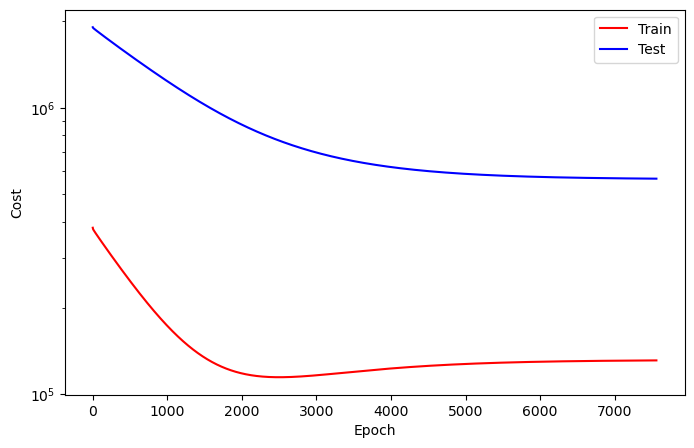

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7561
Train_cost  = 131367.3681 | Test_cost  = 565058.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7562
Train_cost  = 131367.8194 | Test_cost  = 565056.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7563
Train_cost  = 131368.2569 | Test_cost  = 565053.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7564
Train_cost  = 131368.7145 | Test_cost  = 565051.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7565
Train_cost  = 131369.1088 | Test_cost  = 565048.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7566
Train_cost  = 131369.5525 | Test_cost  = 565046.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7567
Train_cost  = 131369.9745 | Test_cost  = 565044.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7568
Train_cost  = 131370.4236 | Test_cost  = 565041.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7569
Train_cost  = 131370.8333 | Test_cost  = 565039.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7570
Train_cost  = 131371.2677 | Test_cost  = 565036.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7571
Train_cost  = 131371.7068 | Test_cost  = 565034.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7572
Train_cost  = 131372.1227 | Test_cost  = 565032.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7573
Train_cost  = 131372.5710 | Test_cost  = 565029.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7574
Train_cost  = 131372.9846 | Test_cost  = 565027.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7575
Train_cost  = 131373.3935 | Test_cost  = 565024.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7576
Train_cost  = 131373.8410 | Test_cost  = 565022.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7577
Train_cost  = 131374.2724 | Test_cost  = 565020.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7578
Train_cost  = 131374.6898 | Test_cost  = 565017.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7579
Train_cost  = 131375.1196 | Test_cost  = 565015.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7580
Train_cost  = 131375.5602 | Test_cost  = 565012.9500 | 


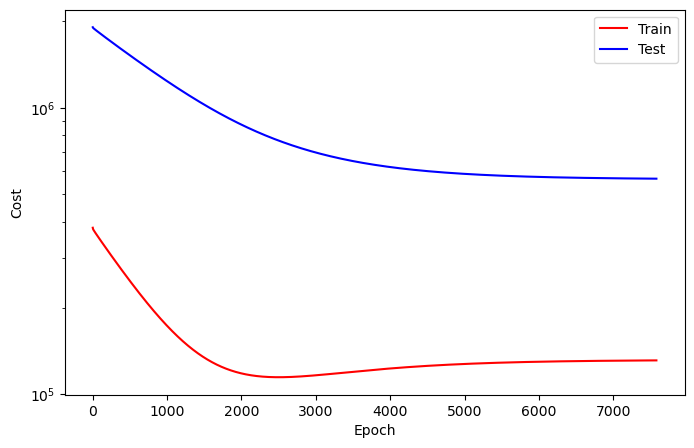

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7581
Train_cost  = 131375.9799 | Test_cost  = 565010.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7582
Train_cost  = 131376.4097 | Test_cost  = 565008.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7583
Train_cost  = 131376.8225 | Test_cost  = 565005.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7584
Train_cost  = 131377.2693 | Test_cost  = 565003.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7585
Train_cost  = 131377.6929 | Test_cost  = 565001.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7586
Train_cost  = 131378.0995 | Test_cost  = 564998.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7587
Train_cost  = 131378.5525 | Test_cost  = 564996.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7588
Train_cost  = 131378.9830 | Test_cost  = 564993.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7589
Train_cost  = 131379.3912 | Test_cost  = 564991.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7590
Train_cost  = 131379.8194 | Test_cost  = 564989.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7591
Train_cost  = 131380.2523 | Test_cost  = 564986.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7592
Train_cost  = 131380.6759 | Test_cost  = 564984.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7593
Train_cost  = 131381.1049 | Test_cost  = 564981.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7594
Train_cost  = 131381.5509 | Test_cost  = 564979.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7595
Train_cost  = 131381.9691 | Test_cost  = 564977.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7596
Train_cost  = 131382.3927 | Test_cost  = 564974.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7597
Train_cost  = 131382.8248 | Test_cost  = 564972.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7598
Train_cost  = 131383.2647 | Test_cost  = 564969.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7599
Train_cost  = 131383.6852 | Test_cost  = 564967.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7600
Train_cost  = 131384.1065 | Test_cost  = 564965.1500 | 


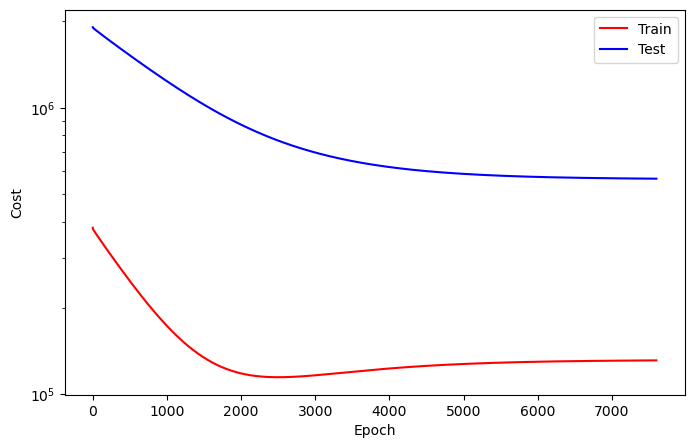

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7601
Train_cost  = 131384.5247 | Test_cost  = 564962.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7602
Train_cost  = 131384.9722 | Test_cost  = 564960.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7603
Train_cost  = 131385.3958 | Test_cost  = 564958.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7604
Train_cost  = 131385.8356 | Test_cost  = 564955.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7605
Train_cost  = 131386.2654 | Test_cost  = 564953.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7606
Train_cost  = 131386.6682 | Test_cost  = 564951.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7607
Train_cost  = 131387.0772 | Test_cost  = 564948.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7608
Train_cost  = 131387.4707 | Test_cost  = 564946.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7609
Train_cost  = 131387.8927 | Test_cost  = 564944.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7610
Train_cost  = 131388.3079 | Test_cost  = 564941.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7611
Train_cost  = 131388.7523 | Test_cost  = 564939.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7612
Train_cost  = 131389.1319 | Test_cost  = 564937.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7613
Train_cost  = 131389.5571 | Test_cost  = 564935.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7614
Train_cost  = 131389.9676 | Test_cost  = 564932.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7615
Train_cost  = 131390.3588 | Test_cost  = 564930.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7616
Train_cost  = 131390.7855 | Test_cost  = 564928.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7617
Train_cost  = 131391.2006 | Test_cost  = 564925.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7618
Train_cost  = 131391.6227 | Test_cost  = 564923.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7619
Train_cost  = 131392.0370 | Test_cost  = 564921.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7620
Train_cost  = 131392.4414 | Test_cost  = 564918.9250 | 


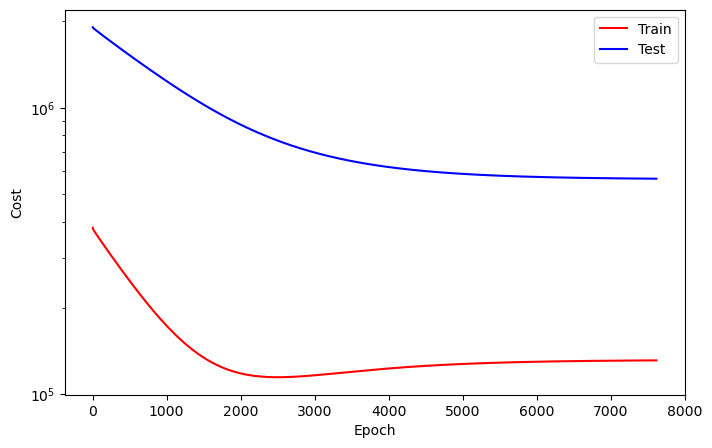

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7621
Train_cost  = 131392.8472 | Test_cost  = 564916.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7622
Train_cost  = 131393.2654 | Test_cost  = 564914.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7623
Train_cost  = 131393.6759 | Test_cost  = 564911.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7624
Train_cost  = 131394.0903 | Test_cost  = 564909.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7625
Train_cost  = 131394.4985 | Test_cost  = 564907.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7626
Train_cost  = 131394.9043 | Test_cost  = 564905.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7627
Train_cost  = 131395.3148 | Test_cost  = 564902.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7628
Train_cost  = 131395.7353 | Test_cost  = 564900.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7629
Train_cost  = 131396.1497 | Test_cost  = 564898.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7630
Train_cost  = 131396.5664 | Test_cost  = 564895.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7631
Train_cost  = 131396.9745 | Test_cost  = 564893.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7632
Train_cost  = 131397.3873 | Test_cost  = 564891.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7633
Train_cost  = 131397.8225 | Test_cost  = 564888.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7634
Train_cost  = 131398.2091 | Test_cost  = 564886.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7635
Train_cost  = 131398.6111 | Test_cost  = 564884.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7636
Train_cost  = 131399.0201 | Test_cost  = 564882.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7637
Train_cost  = 131399.4390 | Test_cost  = 564879.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7638
Train_cost  = 131399.8441 | Test_cost  = 564877.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7639
Train_cost  = 131400.2500 | Test_cost  = 564875.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7640
Train_cost  = 131400.6867 | Test_cost  = 564872.8250 | 


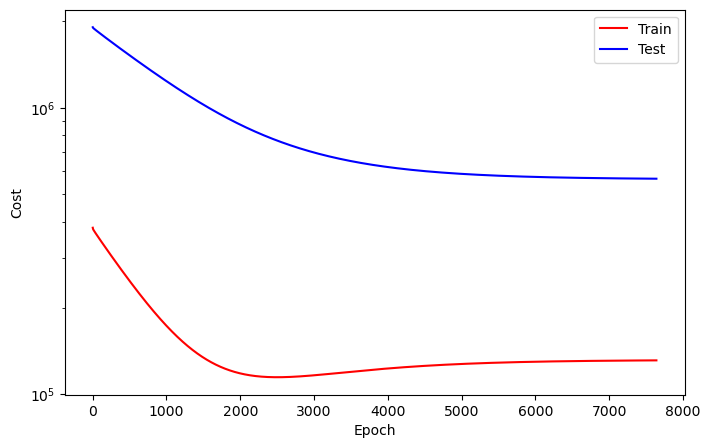

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7641
Train_cost  = 131401.0818 | Test_cost  = 564870.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7642
Train_cost  = 131401.5201 | Test_cost  = 564868.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7643
Train_cost  = 131401.9020 | Test_cost  = 564865.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7644
Train_cost  = 131402.3302 | Test_cost  = 564863.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7645
Train_cost  = 131402.7423 | Test_cost  = 564861.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7646
Train_cost  = 131403.1528 | Test_cost  = 564858.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7647
Train_cost  = 131403.5594 | Test_cost  = 564856.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7648
Train_cost  = 131404.0015 | Test_cost  = 564854.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7649
Train_cost  = 131404.3989 | Test_cost  = 564852.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7650
Train_cost  = 131404.8017 | Test_cost  = 564849.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7651
Train_cost  = 131405.2176 | Test_cost  = 564847.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7652
Train_cost  = 131405.6397 | Test_cost  = 564845.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7653
Train_cost  = 131406.0394 | Test_cost  = 564842.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7654
Train_cost  = 131406.4630 | Test_cost  = 564840.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7655
Train_cost  = 131406.8688 | Test_cost  = 564838.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7656
Train_cost  = 131407.2747 | Test_cost  = 564835.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7657
Train_cost  = 131407.6898 | Test_cost  = 564833.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7658
Train_cost  = 131408.1049 | Test_cost  = 564831.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7659
Train_cost  = 131408.5255 | Test_cost  = 564829.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7660
Train_cost  = 131408.9228 | Test_cost  = 564826.7750 | 


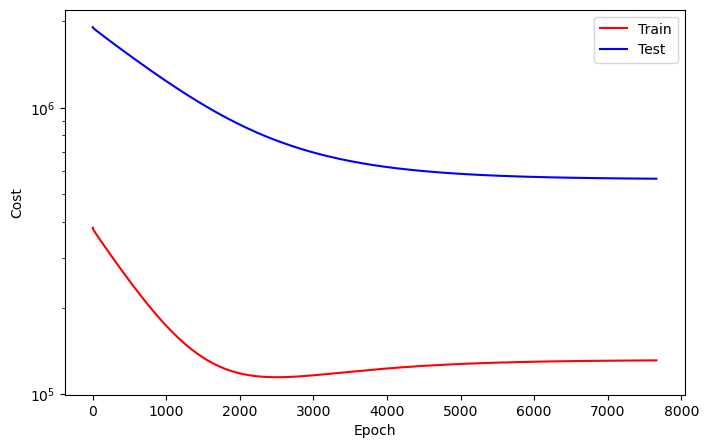

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7661
Train_cost  = 131409.3472 | Test_cost  = 564824.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7662
Train_cost  = 131409.7623 | Test_cost  = 564822.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7663
Train_cost  = 131410.1574 | Test_cost  = 564819.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7664
Train_cost  = 131410.5664 | Test_cost  = 564817.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7665
Train_cost  = 131410.9923 | Test_cost  = 564815.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7666
Train_cost  = 131411.3773 | Test_cost  = 564812.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7667
Train_cost  = 131411.8441 | Test_cost  = 564810.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7668
Train_cost  = 131412.2191 | Test_cost  = 564808.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7669
Train_cost  = 131412.6528 | Test_cost  = 564805.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7670
Train_cost  = 131413.0571 | Test_cost  = 564803.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7671
Train_cost  = 131413.4645 | Test_cost  = 564801.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7672
Train_cost  = 131413.8603 | Test_cost  = 564799.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7673
Train_cost  = 131414.2971 | Test_cost  = 564796.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7674
Train_cost  = 131414.7083 | Test_cost  = 564794.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7675
Train_cost  = 131415.1289 | Test_cost  = 564792.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7676
Train_cost  = 131415.5324 | Test_cost  = 564790.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7677
Train_cost  = 131415.9444 | Test_cost  = 564787.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7678
Train_cost  = 131416.3465 | Test_cost  = 564785.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7679
Train_cost  = 131416.7485 | Test_cost  = 564783.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7680
Train_cost  = 131417.1590 | Test_cost  = 564780.9500 | 


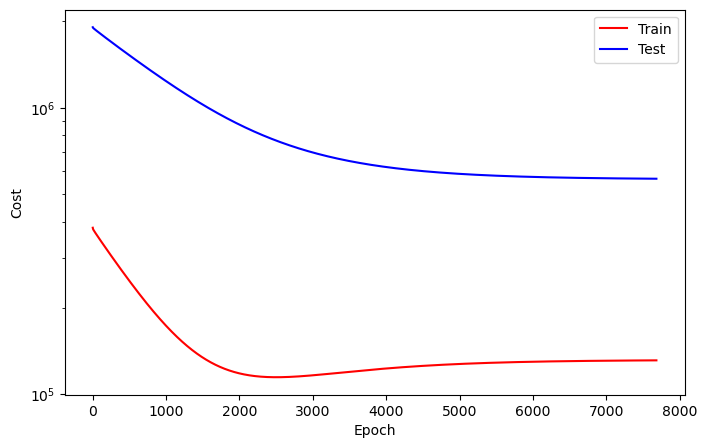

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7681
Train_cost  = 131417.5540 | Test_cost  = 564778.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7682
Train_cost  = 131417.9267 | Test_cost  = 564776.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7683
Train_cost  = 131418.3418 | Test_cost  = 564774.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7684
Train_cost  = 131418.7299 | Test_cost  = 564772.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7685
Train_cost  = 131419.1327 | Test_cost  = 564770.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7686
Train_cost  = 131419.5278 | Test_cost  = 564767.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7687
Train_cost  = 131419.9144 | Test_cost  = 564765.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7688
Train_cost  = 131420.3387 | Test_cost  = 564763.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7689
Train_cost  = 131420.7191 | Test_cost  = 564761.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7690
Train_cost  = 131421.1127 | Test_cost  = 564758.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7691
Train_cost  = 131421.5131 | Test_cost  = 564756.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7692
Train_cost  = 131421.9190 | Test_cost  = 564754.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7693
Train_cost  = 131422.3140 | Test_cost  = 564752.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7694
Train_cost  = 131422.7191 | Test_cost  = 564750.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7695
Train_cost  = 131423.0910 | Test_cost  = 564747.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7696
Train_cost  = 131423.5162 | Test_cost  = 564745.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7697
Train_cost  = 131423.8819 | Test_cost  = 564743.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7698
Train_cost  = 131424.2994 | Test_cost  = 564741.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7699
Train_cost  = 131424.6790 | Test_cost  = 564739.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7700
Train_cost  = 131425.0702 | Test_cost  = 564736.7250 | 


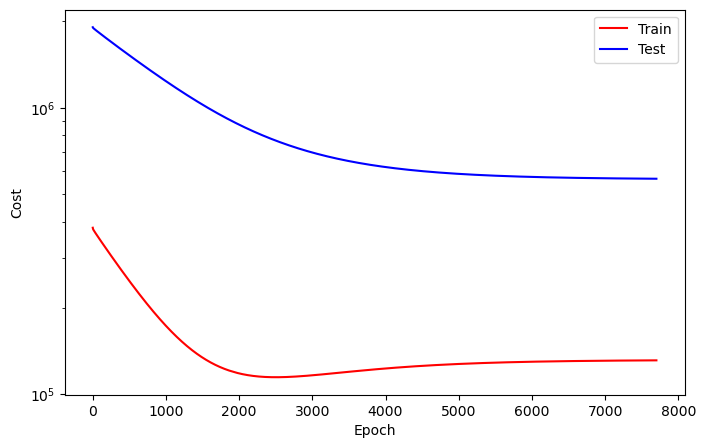

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7701
Train_cost  = 131425.4884 | Test_cost  = 564734.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7702
Train_cost  = 131425.8735 | Test_cost  = 564732.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7703
Train_cost  = 131426.2701 | Test_cost  = 564730.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7704
Train_cost  = 131426.6744 | Test_cost  = 564728.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7705
Train_cost  = 131427.0702 | Test_cost  = 564725.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7706
Train_cost  = 131427.4614 | Test_cost  = 564723.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7707
Train_cost  = 131427.8657 | Test_cost  = 564721.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7708
Train_cost  = 131428.2639 | Test_cost  = 564719.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7709
Train_cost  = 131428.6613 | Test_cost  = 564716.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7710
Train_cost  = 131429.0671 | Test_cost  = 564714.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7711
Train_cost  = 131429.4468 | Test_cost  = 564712.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7712
Train_cost  = 131429.8426 | Test_cost  = 564710.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7713
Train_cost  = 131430.2515 | Test_cost  = 564708.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7714
Train_cost  = 131430.6350 | Test_cost  = 564705.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7715
Train_cost  = 131431.0340 | Test_cost  = 564703.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7716
Train_cost  = 131431.4244 | Test_cost  = 564701.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7717
Train_cost  = 131431.8179 | Test_cost  = 564699.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7718
Train_cost  = 131432.2261 | Test_cost  = 564696.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7719
Train_cost  = 131432.6181 | Test_cost  = 564694.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7720
Train_cost  = 131433.0162 | Test_cost  = 564692.5750 | 


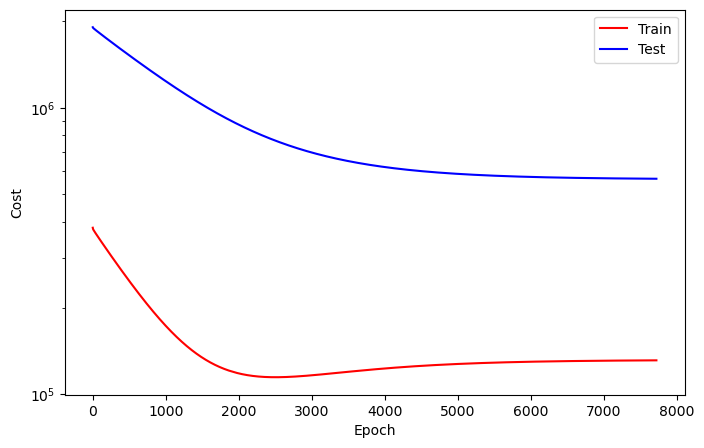

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7721
Train_cost  = 131433.4090 | Test_cost  = 564690.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7722
Train_cost  = 131433.8164 | Test_cost  = 564688.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7723
Train_cost  = 131434.1960 | Test_cost  = 564685.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7724
Train_cost  = 131434.6080 | Test_cost  = 564683.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7725
Train_cost  = 131435.0062 | Test_cost  = 564681.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7726
Train_cost  = 131435.3920 | Test_cost  = 564679.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7727
Train_cost  = 131435.7840 | Test_cost  = 564677.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7728
Train_cost  = 131436.2014 | Test_cost  = 564674.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7729
Train_cost  = 131436.5733 | Test_cost  = 564672.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7730
Train_cost  = 131436.9907 | Test_cost  = 564670.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7731
Train_cost  = 131437.3503 | Test_cost  = 564668.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7732
Train_cost  = 131437.7670 | Test_cost  = 564666.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7733
Train_cost  = 131438.1582 | Test_cost  = 564663.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7734
Train_cost  = 131438.5671 | Test_cost  = 564661.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7735
Train_cost  = 131438.9645 | Test_cost  = 564659.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7736
Train_cost  = 131439.3488 | Test_cost  = 564657.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7737
Train_cost  = 131439.7377 | Test_cost  = 564655.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7738
Train_cost  = 131440.1412 | Test_cost  = 564653.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7739
Train_cost  = 131440.5255 | Test_cost  = 564650.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7740
Train_cost  = 131440.9329 | Test_cost  = 564648.5000 | 


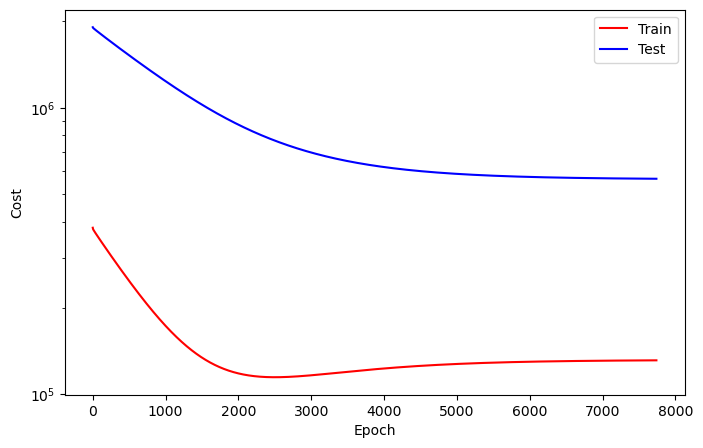

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7741
Train_cost  = 131441.3287 | Test_cost  = 564646.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7742
Train_cost  = 131441.7137 | Test_cost  = 564644.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7743
Train_cost  = 131442.0934 | Test_cost  = 564641.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7744
Train_cost  = 131442.5062 | Test_cost  = 564639.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7745
Train_cost  = 131442.9198 | Test_cost  = 564637.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7746
Train_cost  = 131443.2948 | Test_cost  = 564635.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7747
Train_cost  = 131443.6960 | Test_cost  = 564633.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7748
Train_cost  = 131444.0841 | Test_cost  = 564630.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7749
Train_cost  = 131444.4853 | Test_cost  = 564628.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7750
Train_cost  = 131444.8704 | Test_cost  = 564626.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7751
Train_cost  = 131445.2716 | Test_cost  = 564624.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7752
Train_cost  = 131445.6728 | Test_cost  = 564622.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7753
Train_cost  = 131446.0748 | Test_cost  = 564619.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7754
Train_cost  = 131446.4707 | Test_cost  = 564617.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7755
Train_cost  = 131446.8418 | Test_cost  = 564615.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7756
Train_cost  = 131447.2685 | Test_cost  = 564613.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7757
Train_cost  = 131447.6597 | Test_cost  = 564611.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7758
Train_cost  = 131448.0610 | Test_cost  = 564608.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7759
Train_cost  = 131448.4344 | Test_cost  = 564606.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7760
Train_cost  = 131448.8503 | Test_cost  = 564604.5000 | 


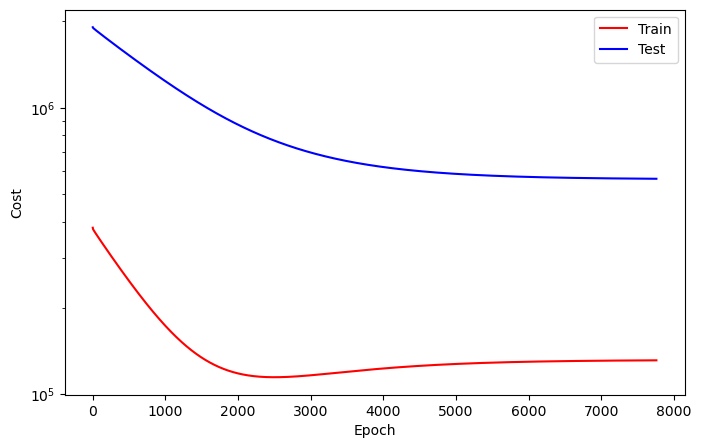

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7761
Train_cost  = 131449.2207 | Test_cost  = 564602.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7762
Train_cost  = 131449.6381 | Test_cost  = 564600.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7763
Train_cost  = 131450.0000 | Test_cost  = 564597.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7764
Train_cost  = 131450.4159 | Test_cost  = 564595.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7765
Train_cost  = 131450.8133 | Test_cost  = 564593.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7766
Train_cost  = 131451.2130 | Test_cost  = 564591.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7767
Train_cost  = 131451.6165 | Test_cost  = 564589.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7768
Train_cost  = 131451.9977 | Test_cost  = 564586.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7769
Train_cost  = 131452.3943 | Test_cost  = 564584.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7770
Train_cost  = 131452.7948 | Test_cost  = 564582.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7771
Train_cost  = 131453.1790 | Test_cost  = 564580.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7772
Train_cost  = 131453.6057 | Test_cost  = 564578.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7773
Train_cost  = 131453.9730 | Test_cost  = 564575.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7774
Train_cost  = 131454.3681 | Test_cost  = 564573.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7775
Train_cost  = 131454.7654 | Test_cost  = 564571.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7776
Train_cost  = 131455.1528 | Test_cost  = 564569.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7777
Train_cost  = 131455.5610 | Test_cost  = 564567.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7778
Train_cost  = 131455.9375 | Test_cost  = 564565.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7779
Train_cost  = 131456.3094 | Test_cost  = 564562.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7780
Train_cost  = 131456.6883 | Test_cost  = 564560.8750 | 


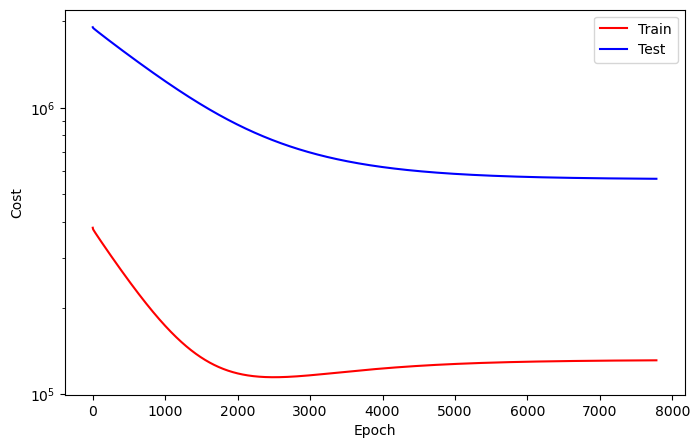

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7781
Train_cost  = 131457.0748 | Test_cost  = 564558.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7782
Train_cost  = 131457.4475 | Test_cost  = 564556.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7783
Train_cost  = 131457.8272 | Test_cost  = 564554.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7784
Train_cost  = 131458.1914 | Test_cost  = 564552.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7785
Train_cost  = 131458.5926 | Test_cost  = 564550.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7786
Train_cost  = 131458.9630 | Test_cost  = 564548.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7787
Train_cost  = 131459.3457 | Test_cost  = 564546.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7788
Train_cost  = 131459.7184 | Test_cost  = 564544.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7789
Train_cost  = 131460.0856 | Test_cost  = 564541.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7790
Train_cost  = 131460.5015 | Test_cost  = 564539.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7791
Train_cost  = 131460.8542 | Test_cost  = 564537.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7792
Train_cost  = 131461.2423 | Test_cost  = 564535.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7793
Train_cost  = 131461.6111 | Test_cost  = 564533.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7794
Train_cost  = 131461.9877 | Test_cost  = 564531.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7795
Train_cost  = 131462.3534 | Test_cost  = 564529.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7796
Train_cost  = 131462.7515 | Test_cost  = 564527.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7797
Train_cost  = 131463.1312 | Test_cost  = 564525.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7798
Train_cost  = 131463.5077 | Test_cost  = 564523.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7799
Train_cost  = 131463.8711 | Test_cost  = 564520.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7800
Train_cost  = 131464.2531 | Test_cost  = 564518.6500 | 


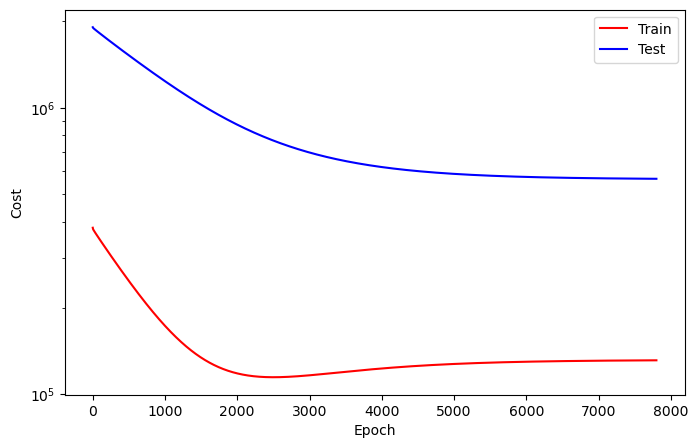

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7801
Train_cost  = 131464.6481 | Test_cost  = 564516.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7802
Train_cost  = 131465.0123 | Test_cost  = 564514.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7803
Train_cost  = 131465.3935 | Test_cost  = 564512.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7804
Train_cost  = 131465.7701 | Test_cost  = 564510.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7805
Train_cost  = 131466.1590 | Test_cost  = 564508.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7806
Train_cost  = 131466.5247 | Test_cost  = 564506.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7807
Train_cost  = 131466.8958 | Test_cost  = 564503.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7808
Train_cost  = 131467.2878 | Test_cost  = 564501.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7809
Train_cost  = 131467.6674 | Test_cost  = 564499.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7810
Train_cost  = 131468.0417 | Test_cost  = 564497.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7811
Train_cost  = 131468.4120 | Test_cost  = 564495.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7812
Train_cost  = 131468.7840 | Test_cost  = 564493.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7813
Train_cost  = 131469.1620 | Test_cost  = 564491.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7814
Train_cost  = 131469.5509 | Test_cost  = 564489.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7815
Train_cost  = 131469.9414 | Test_cost  = 564487.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7816
Train_cost  = 131470.2870 | Test_cost  = 564485.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7817
Train_cost  = 131470.6836 | Test_cost  = 564483.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7818
Train_cost  = 131471.0718 | Test_cost  = 564480.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7819
Train_cost  = 131471.4329 | Test_cost  = 564478.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7820
Train_cost  = 131471.8202 | Test_cost  = 564476.7250 | 


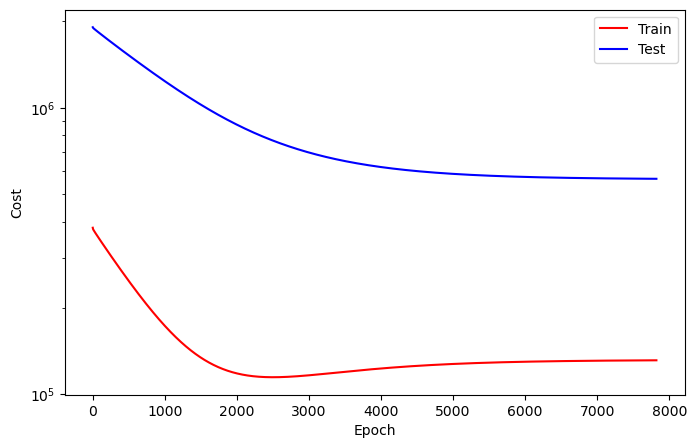

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7821
Train_cost  = 131472.2014 | Test_cost  = 564474.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7822
Train_cost  = 131472.5694 | Test_cost  = 564472.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7823
Train_cost  = 131472.9421 | Test_cost  = 564470.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7824
Train_cost  = 131473.3179 | Test_cost  = 564468.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7825
Train_cost  = 131473.7006 | Test_cost  = 564466.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7826
Train_cost  = 131474.0926 | Test_cost  = 564464.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7827
Train_cost  = 131474.4583 | Test_cost  = 564462.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7828
Train_cost  = 131474.8256 | Test_cost  = 564460.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7829
Train_cost  = 131475.1929 | Test_cost  = 564458.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7830
Train_cost  = 131475.5386 | Test_cost  = 564456.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7831
Train_cost  = 131475.9182 | Test_cost  = 564454.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7832
Train_cost  = 131476.2515 | Test_cost  = 564452.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7833
Train_cost  = 131476.6451 | Test_cost  = 564450.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7834
Train_cost  = 131476.9707 | Test_cost  = 564448.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7835
Train_cost  = 131477.3488 | Test_cost  = 564446.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7836
Train_cost  = 131477.7052 | Test_cost  = 564444.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7837
Train_cost  = 131478.0648 | Test_cost  = 564441.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7838
Train_cost  = 131478.4367 | Test_cost  = 564440.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7839
Train_cost  = 131478.7793 | Test_cost  = 564438.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7840
Train_cost  = 131479.1312 | Test_cost  = 564436.0250 | 


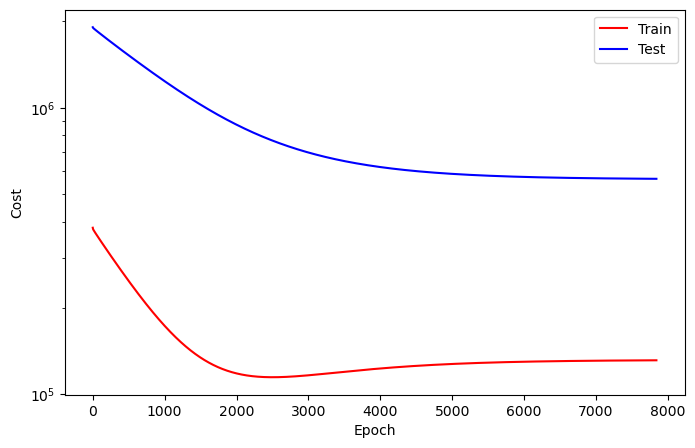

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7841
Train_cost  = 131479.5046 | Test_cost  = 564434.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7842
Train_cost  = 131479.8627 | Test_cost  = 564432.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7843
Train_cost  = 131480.2130 | Test_cost  = 564430.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7844
Train_cost  = 131480.5833 | Test_cost  = 564427.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7845
Train_cost  = 131480.9429 | Test_cost  = 564426.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7846
Train_cost  = 131481.2886 | Test_cost  = 564424.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7847
Train_cost  = 131481.6481 | Test_cost  = 564422.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7848
Train_cost  = 131482.0262 | Test_cost  = 564420.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7849
Train_cost  = 131482.3596 | Test_cost  = 564418.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7850
Train_cost  = 131482.7377 | Test_cost  = 564416.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7851
Train_cost  = 131483.0818 | Test_cost  = 564414.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7852
Train_cost  = 131483.4552 | Test_cost  = 564412.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7853
Train_cost  = 131483.8210 | Test_cost  = 564410.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7854
Train_cost  = 131484.1528 | Test_cost  = 564408.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7855
Train_cost  = 131484.5401 | Test_cost  = 564406.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7856
Train_cost  = 131484.8812 | Test_cost  = 564404.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7857
Train_cost  = 131485.2215 | Test_cost  = 564402.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7858
Train_cost  = 131485.5610 | Test_cost  = 564400.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7859
Train_cost  = 131485.9252 | Test_cost  = 564398.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7860
Train_cost  = 131486.2616 | Test_cost  = 564396.5500 | 


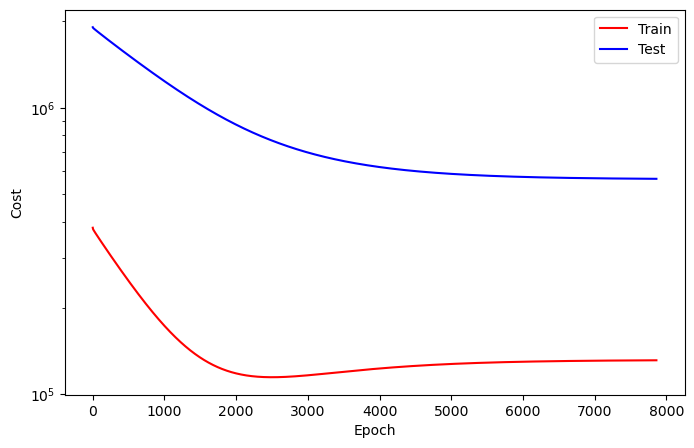

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7861
Train_cost  = 131486.6011 | Test_cost  = 564394.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7862
Train_cost  = 131486.9367 | Test_cost  = 564392.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7863
Train_cost  = 131487.2901 | Test_cost  = 564390.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7864
Train_cost  = 131487.6188 | Test_cost  = 564389.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7865
Train_cost  = 131487.9738 | Test_cost  = 564387.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7866
Train_cost  = 131488.3017 | Test_cost  = 564385.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7867
Train_cost  = 131488.6651 | Test_cost  = 564383.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7868
Train_cost  = 131489.0023 | Test_cost  = 564381.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7869
Train_cost  = 131489.3434 | Test_cost  = 564379.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7870
Train_cost  = 131489.7022 | Test_cost  = 564377.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7871
Train_cost  = 131490.0386 | Test_cost  = 564375.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7872
Train_cost  = 131490.3642 | Test_cost  = 564373.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7873
Train_cost  = 131490.7083 | Test_cost  = 564371.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7874
Train_cost  = 131491.0694 | Test_cost  = 564369.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7875
Train_cost  = 131491.3920 | Test_cost  = 564367.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7876
Train_cost  = 131491.7562 | Test_cost  = 564366.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7877
Train_cost  = 131492.0934 | Test_cost  = 564364.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7878
Train_cost  = 131492.4174 | Test_cost  = 564362.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7879
Train_cost  = 131492.7531 | Test_cost  = 564360.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7880
Train_cost  = 131493.0926 | Test_cost  = 564358.7250 | 


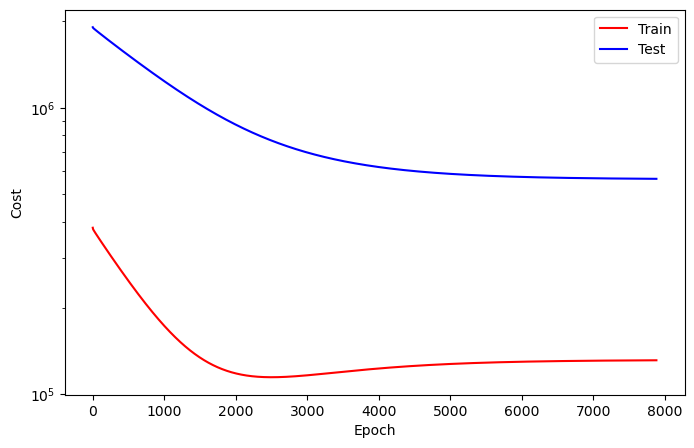

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7881
Train_cost  = 131493.4136 | Test_cost  = 564356.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7882
Train_cost  = 131493.7315 | Test_cost  = 564355.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7883
Train_cost  = 131494.0679 | Test_cost  = 564353.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7884
Train_cost  = 131494.3804 | Test_cost  = 564351.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7885
Train_cost  = 131494.7191 | Test_cost  = 564349.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7886
Train_cost  = 131495.0455 | Test_cost  = 564347.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7887
Train_cost  = 131495.3688 | Test_cost  = 564346.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7888
Train_cost  = 131495.7106 | Test_cost  = 564344.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7889
Train_cost  = 131496.0347 | Test_cost  = 564342.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7890
Train_cost  = 131496.3549 | Test_cost  = 564340.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7891
Train_cost  = 131496.6728 | Test_cost  = 564338.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7892
Train_cost  = 131497.0062 | Test_cost  = 564336.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7893
Train_cost  = 131497.3372 | Test_cost  = 564335.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7894
Train_cost  = 131497.6690 | Test_cost  = 564333.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7895
Train_cost  = 131497.9907 | Test_cost  = 564331.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7896
Train_cost  = 131498.3194 | Test_cost  = 564329.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7897
Train_cost  = 131498.6505 | Test_cost  = 564327.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7898
Train_cost  = 131498.9653 | Test_cost  = 564325.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7899
Train_cost  = 131499.2940 | Test_cost  = 564324.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7900
Train_cost  = 131499.6404 | Test_cost  = 564322.4000 | 


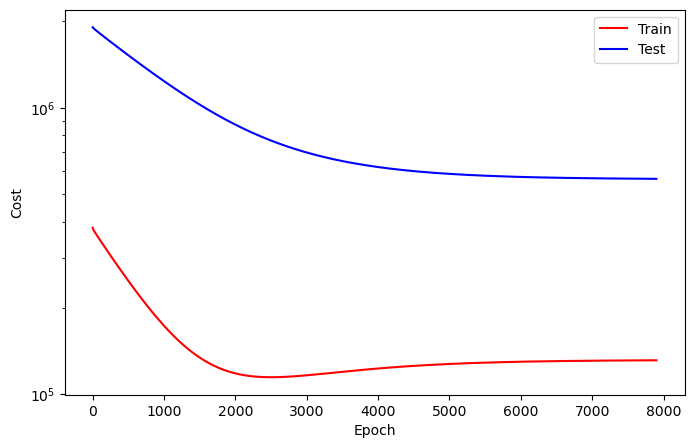

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7901
Train_cost  = 131499.9522 | Test_cost  = 564320.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7902
Train_cost  = 131500.2863 | Test_cost  = 564318.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7903
Train_cost  = 131500.6103 | Test_cost  = 564316.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7904
Train_cost  = 131500.9344 | Test_cost  = 564315.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7905
Train_cost  = 131501.2454 | Test_cost  = 564313.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7906
Train_cost  = 131501.5864 | Test_cost  = 564311.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7907
Train_cost  = 131501.9151 | Test_cost  = 564309.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7908
Train_cost  = 131502.2485 | Test_cost  = 564307.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7909
Train_cost  = 131502.5710 | Test_cost  = 564306.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7910
Train_cost  = 131502.8858 | Test_cost  = 564304.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7911
Train_cost  = 131503.2145 | Test_cost  = 564302.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7912
Train_cost  = 131503.5355 | Test_cost  = 564300.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7913
Train_cost  = 131503.8773 | Test_cost  = 564298.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7914
Train_cost  = 131504.1991 | Test_cost  = 564296.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7915
Train_cost  = 131504.5231 | Test_cost  = 564295.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7916
Train_cost  = 131504.8488 | Test_cost  = 564293.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7917
Train_cost  = 131505.1798 | Test_cost  = 564291.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7918
Train_cost  = 131505.5008 | Test_cost  = 564289.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7919
Train_cost  = 131505.8248 | Test_cost  = 564288.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7920
Train_cost  = 131506.1574 | Test_cost  = 564286.1750 | 


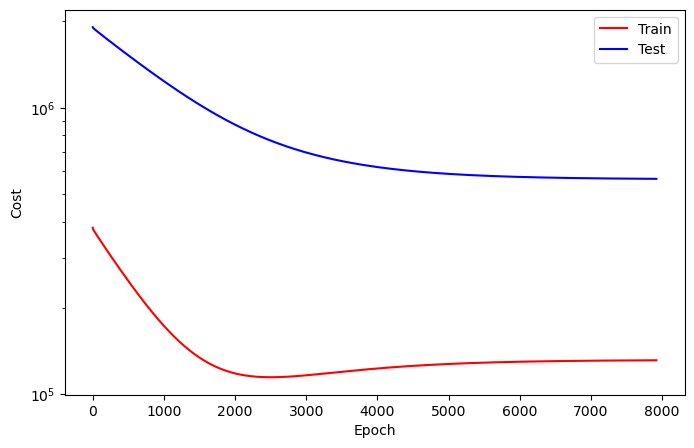

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7921
Train_cost  = 131506.4784 | Test_cost  = 564284.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7922
Train_cost  = 131506.8002 | Test_cost  = 564282.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7923
Train_cost  = 131507.1335 | Test_cost  = 564280.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7924
Train_cost  = 131507.4537 | Test_cost  = 564278.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7925
Train_cost  = 131507.7623 | Test_cost  = 564277.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7926
Train_cost  = 131508.1034 | Test_cost  = 564275.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7927
Train_cost  = 131508.4468 | Test_cost  = 564273.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7928
Train_cost  = 131508.7492 | Test_cost  = 564271.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7929
Train_cost  = 131509.0725 | Test_cost  = 564269.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7930
Train_cost  = 131509.4059 | Test_cost  = 564268.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7931
Train_cost  = 131509.7029 | Test_cost  = 564266.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7932
Train_cost  = 131510.0332 | Test_cost  = 564264.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7933
Train_cost  = 131510.3534 | Test_cost  = 564262.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7934
Train_cost  = 131510.6528 | Test_cost  = 564261.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7935
Train_cost  = 131510.9761 | Test_cost  = 564259.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7936
Train_cost  = 131511.2685 | Test_cost  = 564257.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7937
Train_cost  = 131511.5880 | Test_cost  = 564256.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7938
Train_cost  = 131511.8881 | Test_cost  = 564254.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7939
Train_cost  = 131512.1937 | Test_cost  = 564252.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7940
Train_cost  = 131512.5046 | Test_cost  = 564250.9250 | 


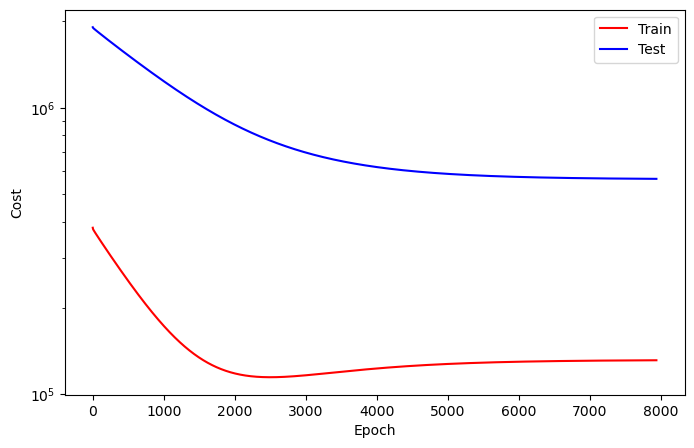

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7941
Train_cost  = 131512.8194 | Test_cost  = 564249.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7942
Train_cost  = 131513.1427 | Test_cost  = 564247.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7943
Train_cost  = 131513.4491 | Test_cost  = 564245.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7944
Train_cost  = 131513.7346 | Test_cost  = 564244.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7945
Train_cost  = 131514.0517 | Test_cost  = 564242.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7946
Train_cost  = 131514.3549 | Test_cost  = 564240.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7947
Train_cost  = 131514.6620 | Test_cost  = 564238.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7948
Train_cost  = 131514.9807 | Test_cost  = 564237.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7949
Train_cost  = 131515.2847 | Test_cost  = 564235.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7950
Train_cost  = 131515.5880 | Test_cost  = 564233.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7951
Train_cost  = 131515.9051 | Test_cost  = 564232.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7952
Train_cost  = 131516.1998 | Test_cost  = 564230.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7953
Train_cost  = 131516.5093 | Test_cost  = 564228.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7954
Train_cost  = 131516.8256 | Test_cost  = 564226.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7955
Train_cost  = 131517.1381 | Test_cost  = 564225.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7956
Train_cost  = 131517.4352 | Test_cost  = 564223.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7957
Train_cost  = 131517.7500 | Test_cost  = 564221.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7958
Train_cost  = 131518.0656 | Test_cost  = 564220.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7959
Train_cost  = 131518.3580 | Test_cost  = 564218.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7960
Train_cost  = 131518.6775 | Test_cost  = 564216.6000 | 


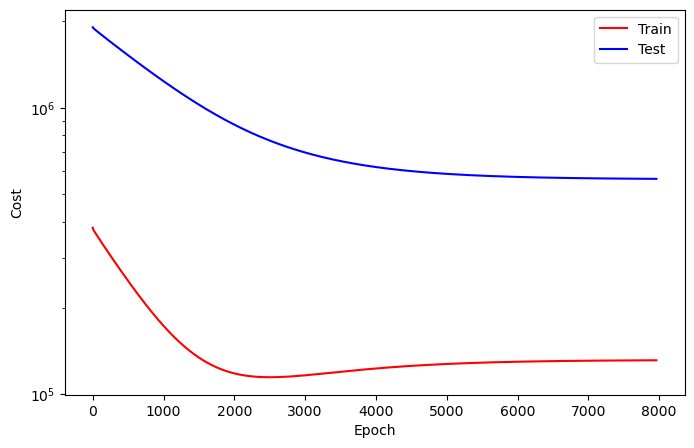

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7961
Train_cost  = 131518.9931 | Test_cost  = 564215.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7962
Train_cost  = 131519.2978 | Test_cost  = 564213.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7963
Train_cost  = 131519.5988 | Test_cost  = 564211.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7964
Train_cost  = 131519.9259 | Test_cost  = 564209.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7965
Train_cost  = 131520.2261 | Test_cost  = 564208.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7966
Train_cost  = 131520.5278 | Test_cost  = 564206.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7967
Train_cost  = 131520.8488 | Test_cost  = 564204.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7968
Train_cost  = 131521.1335 | Test_cost  = 564202.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7969
Train_cost  = 131521.4522 | Test_cost  = 564201.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7970
Train_cost  = 131521.7670 | Test_cost  = 564199.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7971
Train_cost  = 131522.0671 | Test_cost  = 564197.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7972
Train_cost  = 131522.3981 | Test_cost  = 564195.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7973
Train_cost  = 131522.6898 | Test_cost  = 564194.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7974
Train_cost  = 131522.9938 | Test_cost  = 564192.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7975
Train_cost  = 131523.3125 | Test_cost  = 564191.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7976
Train_cost  = 131523.6019 | Test_cost  = 564189.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7977
Train_cost  = 131523.9252 | Test_cost  = 564187.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7978
Train_cost  = 131524.2323 | Test_cost  = 564185.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7979
Train_cost  = 131524.5262 | Test_cost  = 564184.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7980
Train_cost  = 131524.8441 | Test_cost  = 564182.5000 | 


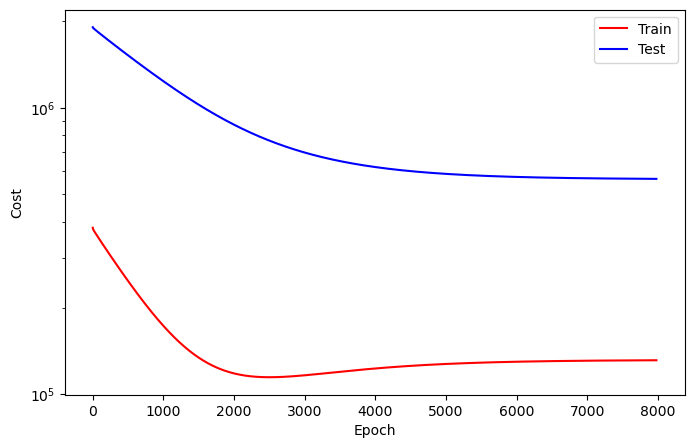

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7981
Train_cost  = 131525.1566 | Test_cost  = 564180.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7982
Train_cost  = 131525.4383 | Test_cost  = 564178.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7983
Train_cost  = 131525.7562 | Test_cost  = 564177.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7984
Train_cost  = 131526.0625 | Test_cost  = 564175.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7985
Train_cost  = 131526.3596 | Test_cost  = 564173.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7986
Train_cost  = 131526.6952 | Test_cost  = 564172.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7987
Train_cost  = 131526.9769 | Test_cost  = 564170.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7988
Train_cost  = 131527.3040 | Test_cost  = 564168.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7989
Train_cost  = 131527.6127 | Test_cost  = 564167.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7990
Train_cost  = 131527.9221 | Test_cost  = 564165.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7991
Train_cost  = 131528.2315 | Test_cost  = 564163.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7992
Train_cost  = 131528.5340 | Test_cost  = 564161.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7993
Train_cost  = 131528.8372 | Test_cost  = 564160.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7994
Train_cost  = 131529.1296 | Test_cost  = 564158.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7995
Train_cost  = 131529.4429 | Test_cost  = 564156.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7996
Train_cost  = 131529.7840 | Test_cost  = 564155.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7997
Train_cost  = 131530.0602 | Test_cost  = 564153.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7998
Train_cost  = 131530.3711 | Test_cost  = 564151.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  7999
Train_cost  = 131530.6983 | Test_cost  = 564150.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8000
Train_cost  = 131530.9923 | Test_cost  = 564148.2500 | 


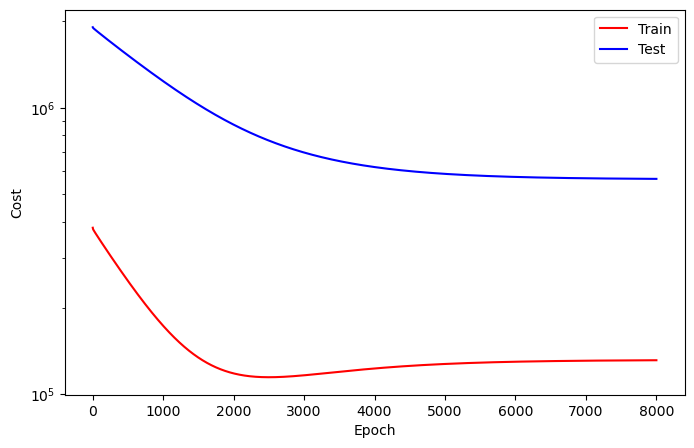

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8001
Train_cost  = 131531.2963 | Test_cost  = 564146.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8002
Train_cost  = 131531.5957 | Test_cost  = 564144.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8003
Train_cost  = 131531.9035 | Test_cost  = 564143.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8004
Train_cost  = 131532.2099 | Test_cost  = 564141.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8005
Train_cost  = 131532.5278 | Test_cost  = 564139.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8006
Train_cost  = 131532.8310 | Test_cost  = 564138.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8007
Train_cost  = 131533.1373 | Test_cost  = 564136.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8008
Train_cost  = 131533.4506 | Test_cost  = 564134.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8009
Train_cost  = 131533.7508 | Test_cost  = 564132.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8010
Train_cost  = 131534.0556 | Test_cost  = 564131.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8011
Train_cost  = 131534.3580 | Test_cost  = 564129.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8012
Train_cost  = 131534.6906 | Test_cost  = 564127.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8013
Train_cost  = 131534.9807 | Test_cost  = 564126.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8014
Train_cost  = 131535.2917 | Test_cost  = 564124.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8015
Train_cost  = 131535.5918 | Test_cost  = 564122.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8016
Train_cost  = 131535.9074 | Test_cost  = 564121.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8017
Train_cost  = 131536.2130 | Test_cost  = 564119.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8018
Train_cost  = 131536.5201 | Test_cost  = 564117.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8019
Train_cost  = 131536.8056 | Test_cost  = 564115.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8020
Train_cost  = 131537.1265 | Test_cost  = 564114.2250 | 


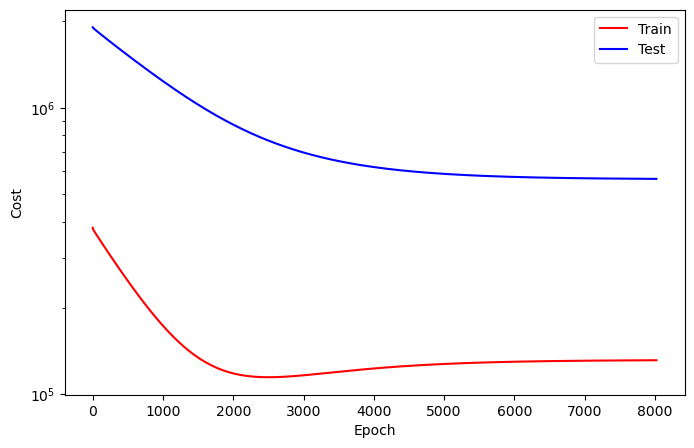

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8021
Train_cost  = 131537.4252 | Test_cost  = 564112.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8022
Train_cost  = 131537.7392 | Test_cost  = 564110.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8023
Train_cost  = 131538.0540 | Test_cost  = 564109.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8024
Train_cost  = 131538.3580 | Test_cost  = 564107.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8025
Train_cost  = 131538.6721 | Test_cost  = 564105.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8026
Train_cost  = 131538.9614 | Test_cost  = 564103.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8027
Train_cost  = 131539.2932 | Test_cost  = 564102.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8028
Train_cost  = 131539.6088 | Test_cost  = 564100.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8029
Train_cost  = 131539.8889 | Test_cost  = 564098.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8030
Train_cost  = 131540.2022 | Test_cost  = 564097.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8031
Train_cost  = 131540.5193 | Test_cost  = 564095.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8032
Train_cost  = 131540.8102 | Test_cost  = 564093.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8033
Train_cost  = 131541.1327 | Test_cost  = 564091.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8034
Train_cost  = 131541.4221 | Test_cost  = 564090.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8035
Train_cost  = 131541.7284 | Test_cost  = 564088.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8036
Train_cost  = 131542.0494 | Test_cost  = 564086.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8037
Train_cost  = 131542.3449 | Test_cost  = 564085.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8038
Train_cost  = 131542.6142 | Test_cost  = 564083.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8039
Train_cost  = 131542.9059 | Test_cost  = 564082.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8040
Train_cost  = 131543.2083 | Test_cost  = 564080.4750 | 


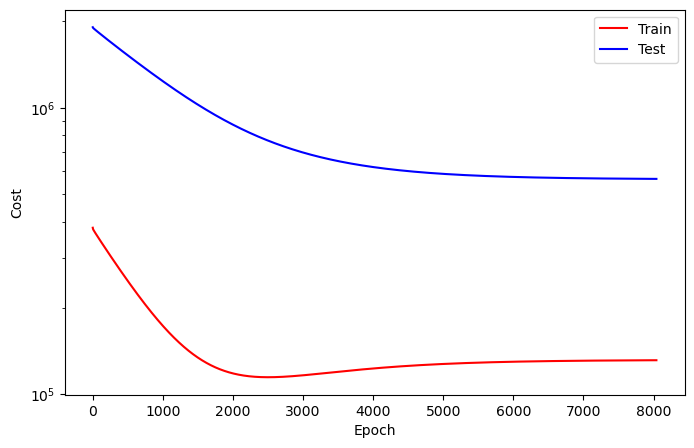

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8041
Train_cost  = 131543.5000 | Test_cost  = 564078.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8042
Train_cost  = 131543.7878 | Test_cost  = 564077.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8043
Train_cost  = 131544.0772 | Test_cost  = 564075.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8044
Train_cost  = 131544.3526 | Test_cost  = 564074.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8045
Train_cost  = 131544.6713 | Test_cost  = 564072.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8046
Train_cost  = 131544.9321 | Test_cost  = 564070.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8047
Train_cost  = 131545.2184 | Test_cost  = 564069.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8048
Train_cost  = 131545.5062 | Test_cost  = 564067.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8049
Train_cost  = 131545.8017 | Test_cost  = 564065.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8050
Train_cost  = 131546.1034 | Test_cost  = 564064.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8051
Train_cost  = 131546.4020 | Test_cost  = 564062.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8052
Train_cost  = 131546.6921 | Test_cost  = 564061.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8053
Train_cost  = 131546.9846 | Test_cost  = 564059.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8054
Train_cost  = 131547.2539 | Test_cost  = 564058.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8055
Train_cost  = 131547.5509 | Test_cost  = 564056.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8056
Train_cost  = 131547.8387 | Test_cost  = 564054.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8057
Train_cost  = 131548.1381 | Test_cost  = 564053.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8058
Train_cost  = 131548.4367 | Test_cost  = 564051.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8059
Train_cost  = 131548.7284 | Test_cost  = 564049.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8060
Train_cost  = 131549.0015 | Test_cost  = 564048.3250 | 


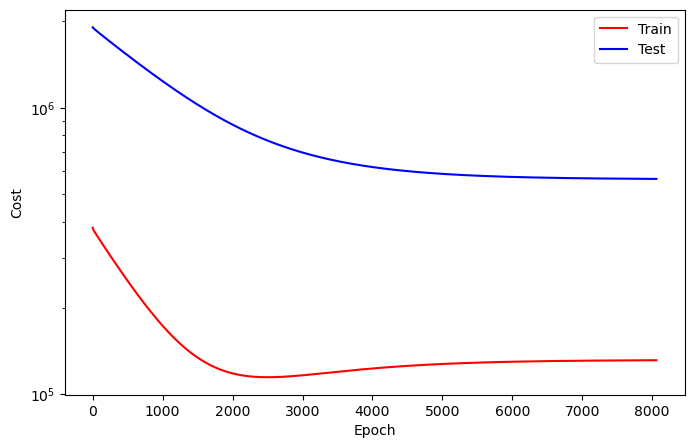

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8061
Train_cost  = 131549.2978 | Test_cost  = 564046.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8062
Train_cost  = 131549.5694 | Test_cost  = 564045.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8063
Train_cost  = 131549.8665 | Test_cost  = 564043.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8064
Train_cost  = 131550.1582 | Test_cost  = 564041.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8065
Train_cost  = 131550.4429 | Test_cost  = 564040.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8066
Train_cost  = 131550.7446 | Test_cost  = 564038.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8067
Train_cost  = 131551.0278 | Test_cost  = 564037.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8068
Train_cost  = 131551.3511 | Test_cost  = 564035.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8069
Train_cost  = 131551.6281 | Test_cost  = 564033.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8070
Train_cost  = 131551.8974 | Test_cost  = 564032.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8071
Train_cost  = 131552.1821 | Test_cost  = 564030.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8072
Train_cost  = 131552.4645 | Test_cost  = 564029.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8073
Train_cost  = 131552.7662 | Test_cost  = 564027.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8074
Train_cost  = 131553.0571 | Test_cost  = 564025.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8075
Train_cost  = 131553.3480 | Test_cost  = 564024.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8076
Train_cost  = 131553.6265 | Test_cost  = 564022.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8077
Train_cost  = 131553.9252 | Test_cost  = 564020.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8078
Train_cost  = 131554.2230 | Test_cost  = 564019.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8079
Train_cost  = 131554.4830 | Test_cost  = 564017.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8080
Train_cost  = 131554.8125 | Test_cost  = 564016.3500 | 


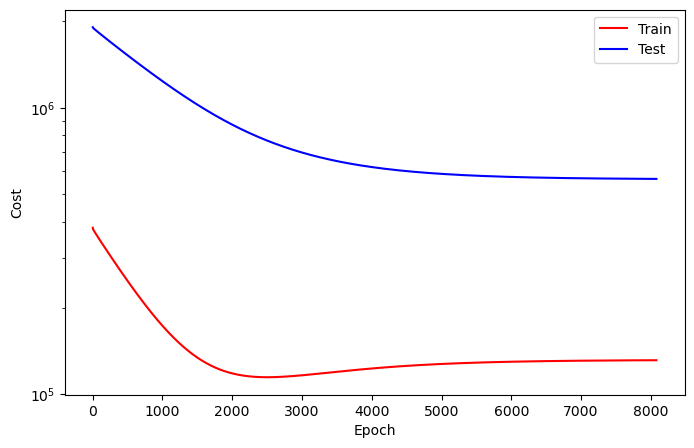

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8081
Train_cost  = 131555.0810 | Test_cost  = 564014.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8082
Train_cost  = 131555.3526 | Test_cost  = 564013.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8083
Train_cost  = 131555.6559 | Test_cost  = 564011.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8084
Train_cost  = 131555.9367 | Test_cost  = 564009.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8085
Train_cost  = 131556.2377 | Test_cost  = 564008.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8086
Train_cost  = 131556.5000 | Test_cost  = 564006.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8087
Train_cost  = 131556.8025 | Test_cost  = 564005.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8088
Train_cost  = 131557.1034 | Test_cost  = 564003.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8089
Train_cost  = 131557.3958 | Test_cost  = 564001.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8090
Train_cost  = 131557.6698 | Test_cost  = 564000.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8091
Train_cost  = 131557.9552 | Test_cost  = 563998.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8092
Train_cost  = 131558.2593 | Test_cost  = 563997.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8093
Train_cost  = 131558.5386 | Test_cost  = 563995.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8094
Train_cost  = 131558.8326 | Test_cost  = 563993.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8095
Train_cost  = 131559.1096 | Test_cost  = 563992.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8096
Train_cost  = 131559.4082 | Test_cost  = 563990.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8097
Train_cost  = 131559.6836 | Test_cost  = 563989.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8098
Train_cost  = 131559.9691 | Test_cost  = 563987.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8099
Train_cost  = 131560.2670 | Test_cost  = 563985.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8100
Train_cost  = 131560.5633 | Test_cost  = 563984.2500 | 


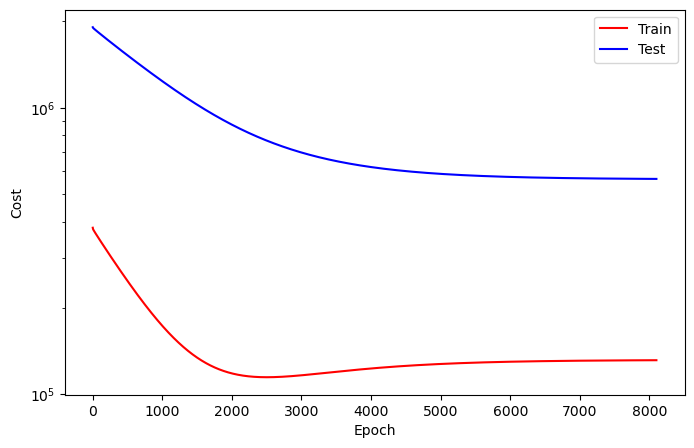

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8101
Train_cost  = 131560.8557 | Test_cost  = 563982.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8102
Train_cost  = 131561.1420 | Test_cost  = 563981.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8103
Train_cost  = 131561.4375 | Test_cost  = 563979.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8104
Train_cost  = 131561.7083 | Test_cost  = 563977.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8105
Train_cost  = 131561.9907 | Test_cost  = 563976.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8106
Train_cost  = 131562.3009 | Test_cost  = 563974.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8107
Train_cost  = 131562.5826 | Test_cost  = 563972.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8108
Train_cost  = 131562.8711 | Test_cost  = 563971.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8109
Train_cost  = 131563.1559 | Test_cost  = 563969.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8110
Train_cost  = 131563.4460 | Test_cost  = 563968.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8111
Train_cost  = 131563.7160 | Test_cost  = 563966.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8112
Train_cost  = 131564.0293 | Test_cost  = 563965.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8113
Train_cost  = 131564.3040 | Test_cost  = 563963.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8114
Train_cost  = 131564.5926 | Test_cost  = 563961.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8115
Train_cost  = 131564.8927 | Test_cost  = 563960.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8116
Train_cost  = 131565.1728 | Test_cost  = 563958.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8117
Train_cost  = 131565.4707 | Test_cost  = 563957.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8118
Train_cost  = 131565.7407 | Test_cost  = 563955.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8119
Train_cost  = 131566.0594 | Test_cost  = 563953.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8120
Train_cost  = 131566.3310 | Test_cost  = 563952.2000 | 


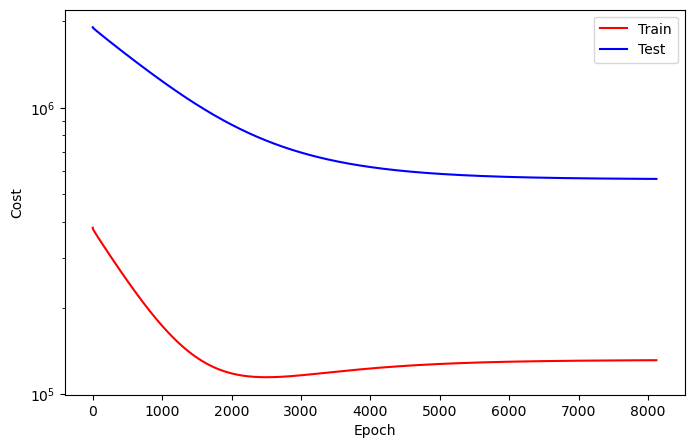

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8121
Train_cost  = 131566.6327 | Test_cost  = 563950.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8122
Train_cost  = 131566.8943 | Test_cost  = 563949.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8123
Train_cost  = 131567.1821 | Test_cost  = 563947.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8124
Train_cost  = 131567.4823 | Test_cost  = 563945.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8125
Train_cost  = 131567.7716 | Test_cost  = 563944.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8126
Train_cost  = 131568.0733 | Test_cost  = 563942.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8127
Train_cost  = 131568.3449 | Test_cost  = 563941.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8128
Train_cost  = 131568.6412 | Test_cost  = 563939.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8129
Train_cost  = 131568.9182 | Test_cost  = 563937.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8130
Train_cost  = 131569.2099 | Test_cost  = 563936.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8131
Train_cost  = 131569.5077 | Test_cost  = 563934.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8132
Train_cost  = 131569.8117 | Test_cost  = 563933.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8133
Train_cost  = 131570.0748 | Test_cost  = 563931.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8134
Train_cost  = 131570.3642 | Test_cost  = 563929.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8135
Train_cost  = 131570.6528 | Test_cost  = 563928.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8136
Train_cost  = 131570.9329 | Test_cost  = 563926.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8137
Train_cost  = 131571.2145 | Test_cost  = 563925.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8138
Train_cost  = 131571.5193 | Test_cost  = 563923.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8139
Train_cost  = 131571.7963 | Test_cost  = 563921.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8140
Train_cost  = 131572.0826 | Test_cost  = 563920.4000 | 


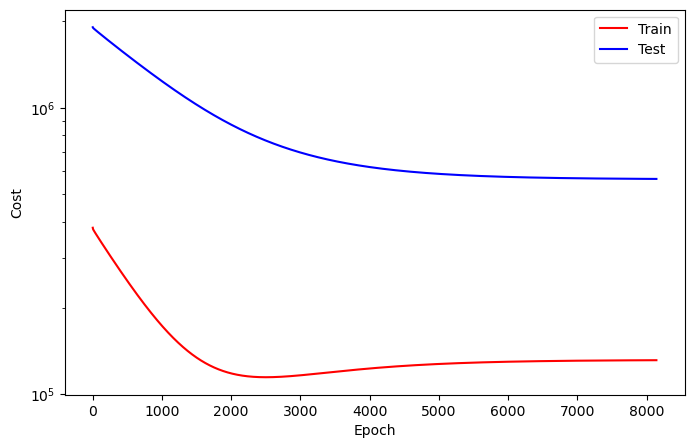

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8141
Train_cost  = 131572.3627 | Test_cost  = 563918.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8142
Train_cost  = 131572.6744 | Test_cost  = 563917.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8143
Train_cost  = 131572.9429 | Test_cost  = 563915.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8144
Train_cost  = 131573.2238 | Test_cost  = 563914.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8145
Train_cost  = 131573.5185 | Test_cost  = 563912.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8146
Train_cost  = 131573.7932 | Test_cost  = 563910.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8147
Train_cost  = 131574.0903 | Test_cost  = 563909.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8148
Train_cost  = 131574.3750 | Test_cost  = 563907.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8149
Train_cost  = 131574.6767 | Test_cost  = 563906.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8150
Train_cost  = 131574.9414 | Test_cost  = 563904.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8151
Train_cost  = 131575.2369 | Test_cost  = 563902.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8152
Train_cost  = 131575.5355 | Test_cost  = 563901.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8153
Train_cost  = 131575.8256 | Test_cost  = 563899.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8154
Train_cost  = 131576.1134 | Test_cost  = 563898.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8155
Train_cost  = 131576.3827 | Test_cost  = 563896.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8156
Train_cost  = 131576.6767 | Test_cost  = 563894.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8157
Train_cost  = 131576.9753 | Test_cost  = 563893.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8158
Train_cost  = 131577.2593 | Test_cost  = 563891.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8159
Train_cost  = 131577.5370 | Test_cost  = 563890.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8160
Train_cost  = 131577.8387 | Test_cost  = 563888.5750 | 


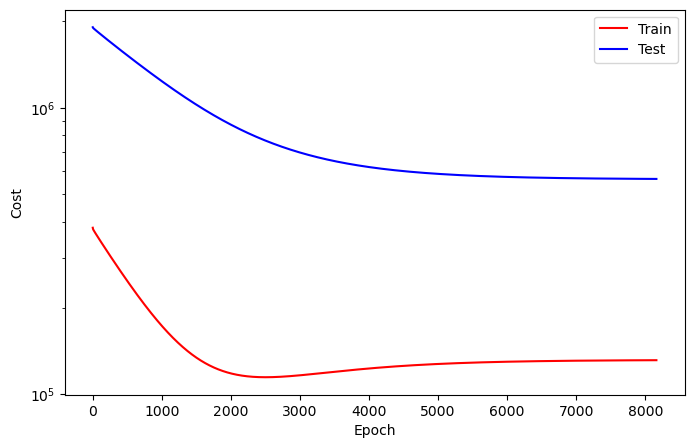

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8161
Train_cost  = 131578.1188 | Test_cost  = 563886.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8162
Train_cost  = 131578.4059 | Test_cost  = 563885.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8163
Train_cost  = 131578.6921 | Test_cost  = 563883.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8164
Train_cost  = 131578.9985 | Test_cost  = 563882.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8165
Train_cost  = 131579.2623 | Test_cost  = 563880.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8166
Train_cost  = 131579.5602 | Test_cost  = 563878.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8167
Train_cost  = 131579.8503 | Test_cost  = 563877.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8168
Train_cost  = 131580.1312 | Test_cost  = 563875.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8169
Train_cost  = 131580.4105 | Test_cost  = 563874.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8170
Train_cost  = 131580.6713 | Test_cost  = 563872.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8171
Train_cost  = 131580.9390 | Test_cost  = 563871.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8172
Train_cost  = 131581.2083 | Test_cost  = 563869.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8173
Train_cost  = 131581.4730 | Test_cost  = 563868.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8174
Train_cost  = 131581.7531 | Test_cost  = 563866.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8175
Train_cost  = 131582.0270 | Test_cost  = 563865.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8176
Train_cost  = 131582.2978 | Test_cost  = 563863.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8177
Train_cost  = 131582.5841 | Test_cost  = 563862.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8178
Train_cost  = 131582.8495 | Test_cost  = 563860.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8179
Train_cost  = 131583.1026 | Test_cost  = 563859.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8180
Train_cost  = 131583.3596 | Test_cost  = 563857.7250 | 


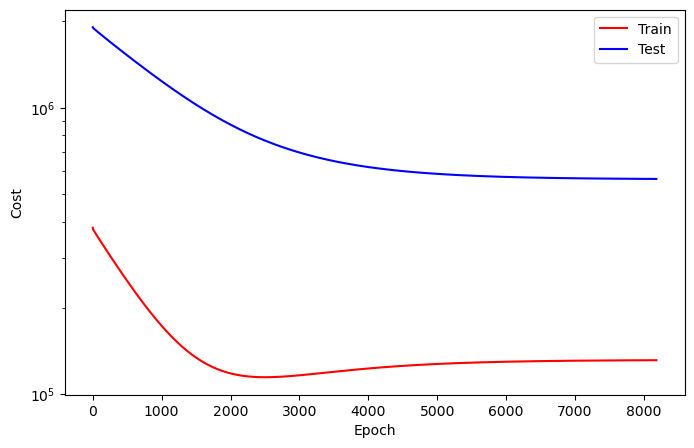

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8181
Train_cost  = 131583.6505 | Test_cost  = 563856.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8182
Train_cost  = 131583.9244 | Test_cost  = 563854.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8183
Train_cost  = 131584.1944 | Test_cost  = 563853.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8184
Train_cost  = 131584.4745 | Test_cost  = 563851.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8185
Train_cost  = 131584.7176 | Test_cost  = 563850.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8186
Train_cost  = 131585.0247 | Test_cost  = 563848.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8187
Train_cost  = 131585.2809 | Test_cost  = 563847.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8188
Train_cost  = 131585.5517 | Test_cost  = 563845.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8189
Train_cost  = 131585.8194 | Test_cost  = 563844.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8190
Train_cost  = 131586.1026 | Test_cost  = 563842.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8191
Train_cost  = 131586.3657 | Test_cost  = 563841.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8192
Train_cost  = 131586.6350 | Test_cost  = 563839.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8193
Train_cost  = 131586.9059 | Test_cost  = 563838.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8194
Train_cost  = 131587.1651 | Test_cost  = 563836.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8195
Train_cost  = 131587.4444 | Test_cost  = 563835.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8196
Train_cost  = 131587.6991 | Test_cost  = 563833.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8197
Train_cost  = 131587.9985 | Test_cost  = 563832.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8198
Train_cost  = 131588.2485 | Test_cost  = 563830.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8199
Train_cost  = 131588.5247 | Test_cost  = 563829.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8200
Train_cost  = 131588.7870 | Test_cost  = 563827.9500 | 


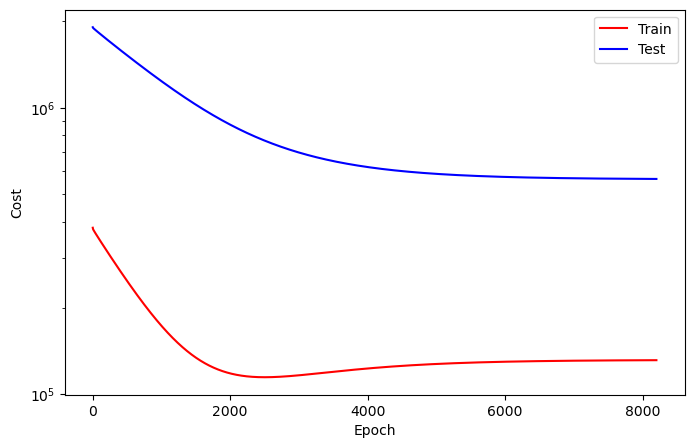

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8201
Train_cost  = 131589.0440 | Test_cost  = 563826.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8202
Train_cost  = 131589.3395 | Test_cost  = 563824.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8203
Train_cost  = 131589.5872 | Test_cost  = 563823.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8204
Train_cost  = 131589.8642 | Test_cost  = 563821.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8205
Train_cost  = 131590.1412 | Test_cost  = 563820.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8206
Train_cost  = 131590.4012 | Test_cost  = 563818.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8207
Train_cost  = 131590.6929 | Test_cost  = 563817.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8208
Train_cost  = 131590.9383 | Test_cost  = 563815.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8209
Train_cost  = 131591.2145 | Test_cost  = 563814.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8210
Train_cost  = 131591.4730 | Test_cost  = 563812.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8211
Train_cost  = 131591.7562 | Test_cost  = 563811.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8212
Train_cost  = 131592.0177 | Test_cost  = 563809.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8213
Train_cost  = 131592.2948 | Test_cost  = 563808.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8214
Train_cost  = 131592.5625 | Test_cost  = 563806.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8215
Train_cost  = 131592.8287 | Test_cost  = 563805.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8216
Train_cost  = 131593.0795 | Test_cost  = 563804.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8217
Train_cost  = 131593.3457 | Test_cost  = 563802.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8218
Train_cost  = 131593.6435 | Test_cost  = 563800.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8219
Train_cost  = 131593.8981 | Test_cost  = 563799.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8220
Train_cost  = 131594.1744 | Test_cost  = 563798.0000 | 


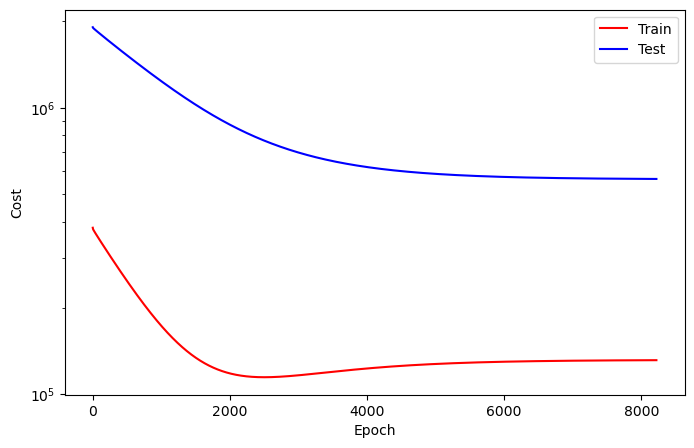

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8221
Train_cost  = 131594.4390 | Test_cost  = 563796.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8222
Train_cost  = 131594.7022 | Test_cost  = 563795.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8223
Train_cost  = 131594.9730 | Test_cost  = 563793.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8224
Train_cost  = 131595.2407 | Test_cost  = 563792.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8225
Train_cost  = 131595.5224 | Test_cost  = 563790.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8226
Train_cost  = 131595.7654 | Test_cost  = 563789.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8227
Train_cost  = 131596.0355 | Test_cost  = 563787.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8228
Train_cost  = 131596.3179 | Test_cost  = 563786.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8229
Train_cost  = 131596.5756 | Test_cost  = 563784.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8230
Train_cost  = 131596.8588 | Test_cost  = 563783.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8231
Train_cost  = 131597.1173 | Test_cost  = 563781.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8232
Train_cost  = 131597.3974 | Test_cost  = 563780.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8233
Train_cost  = 131597.6466 | Test_cost  = 563778.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8234
Train_cost  = 131597.9383 | Test_cost  = 563777.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8235
Train_cost  = 131598.1960 | Test_cost  = 563775.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8236
Train_cost  = 131598.4614 | Test_cost  = 563774.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8237
Train_cost  = 131598.7284 | Test_cost  = 563772.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8238
Train_cost  = 131599.0023 | Test_cost  = 563771.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8239
Train_cost  = 131599.2685 | Test_cost  = 563769.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8240
Train_cost  = 131599.5355 | Test_cost  = 563768.3000 | 


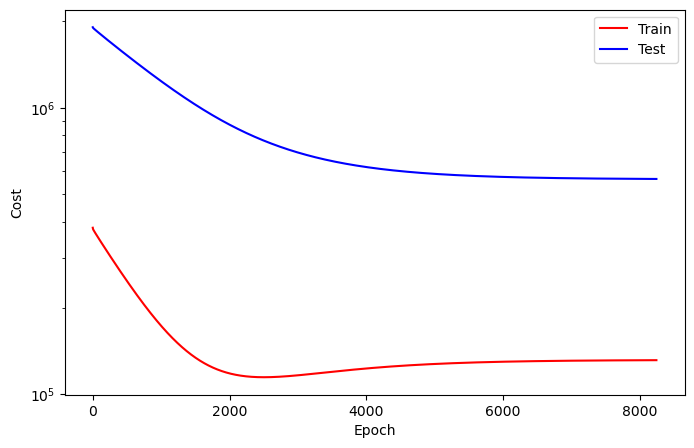

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8241
Train_cost  = 131599.7894 | Test_cost  = 563766.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8242
Train_cost  = 131600.0895 | Test_cost  = 563765.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8243
Train_cost  = 131600.3495 | Test_cost  = 563763.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8244
Train_cost  = 131600.6003 | Test_cost  = 563762.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8245
Train_cost  = 131600.8819 | Test_cost  = 563760.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8246
Train_cost  = 131601.1451 | Test_cost  = 563759.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8247
Train_cost  = 131601.4174 | Test_cost  = 563757.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8248
Train_cost  = 131601.6991 | Test_cost  = 563756.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8249
Train_cost  = 131601.9568 | Test_cost  = 563754.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8250
Train_cost  = 131602.2338 | Test_cost  = 563753.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8251
Train_cost  = 131602.4892 | Test_cost  = 563752.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8252
Train_cost  = 131602.7276 | Test_cost  = 563750.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8253
Train_cost  = 131602.9815 | Test_cost  = 563749.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8254
Train_cost  = 131603.2191 | Test_cost  = 563748.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8255
Train_cost  = 131603.4823 | Test_cost  = 563746.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8256
Train_cost  = 131603.7253 | Test_cost  = 563745.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8257
Train_cost  = 131603.9769 | Test_cost  = 563743.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8258
Train_cost  = 131604.2431 | Test_cost  = 563742.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8259
Train_cost  = 131604.5062 | Test_cost  = 563741.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8260
Train_cost  = 131604.7315 | Test_cost  = 563739.7000 | 


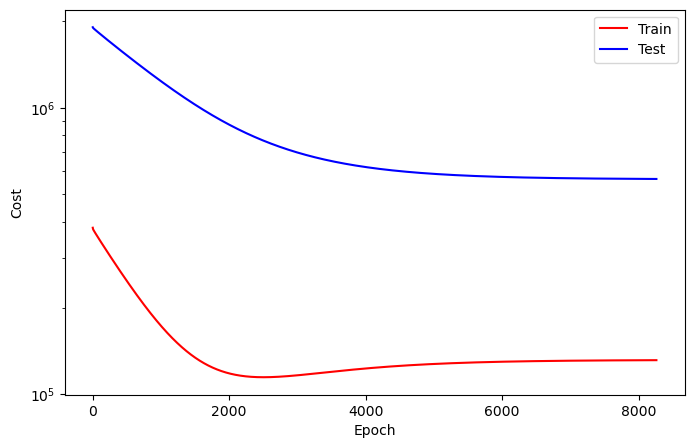

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8261
Train_cost  = 131604.9792 | Test_cost  = 563738.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8262
Train_cost  = 131605.2438 | Test_cost  = 563736.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8263
Train_cost  = 131605.4892 | Test_cost  = 563735.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8264
Train_cost  = 131605.7562 | Test_cost  = 563733.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8265
Train_cost  = 131606.0031 | Test_cost  = 563732.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8266
Train_cost  = 131606.2693 | Test_cost  = 563731.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8267
Train_cost  = 131606.5185 | Test_cost  = 563729.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8268
Train_cost  = 131606.7639 | Test_cost  = 563728.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8269
Train_cost  = 131607.0077 | Test_cost  = 563726.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8270
Train_cost  = 131607.2747 | Test_cost  = 563725.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8271
Train_cost  = 131607.5123 | Test_cost  = 563724.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8272
Train_cost  = 131607.7508 | Test_cost  = 563723.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8273
Train_cost  = 131607.9776 | Test_cost  = 563721.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8274
Train_cost  = 131608.1991 | Test_cost  = 563720.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8275
Train_cost  = 131608.4429 | Test_cost  = 563719.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8276
Train_cost  = 131608.6968 | Test_cost  = 563717.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8277
Train_cost  = 131608.9174 | Test_cost  = 563716.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8278
Train_cost  = 131609.1620 | Test_cost  = 563715.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8279
Train_cost  = 131609.3781 | Test_cost  = 563714.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8280
Train_cost  = 131609.6397 | Test_cost  = 563712.7000 | 


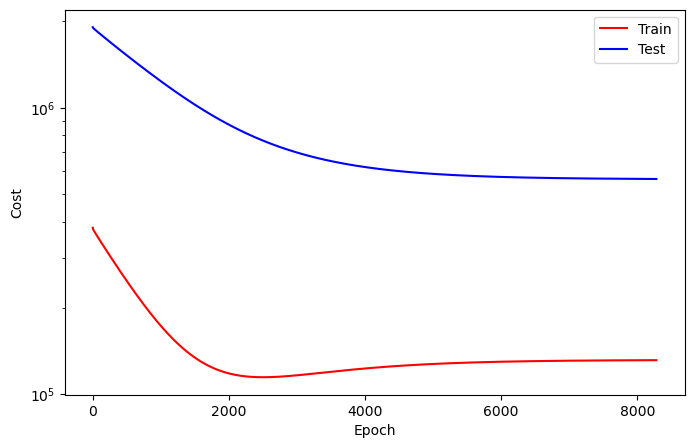

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8281
Train_cost  = 131609.8627 | Test_cost  = 563711.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8282
Train_cost  = 131610.0772 | Test_cost  = 563710.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8283
Train_cost  = 131610.3210 | Test_cost  = 563708.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8284
Train_cost  = 131610.5594 | Test_cost  = 563707.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8285
Train_cost  = 131610.8086 | Test_cost  = 563706.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8286
Train_cost  = 131611.0216 | Test_cost  = 563704.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8287
Train_cost  = 131611.2778 | Test_cost  = 563703.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8288
Train_cost  = 131611.5023 | Test_cost  = 563702.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8289
Train_cost  = 131611.7423 | Test_cost  = 563701.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8290
Train_cost  = 131611.9599 | Test_cost  = 563699.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8291
Train_cost  = 131612.1998 | Test_cost  = 563698.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8292
Train_cost  = 131612.4367 | Test_cost  = 563696.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8293
Train_cost  = 131612.6960 | Test_cost  = 563695.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8294
Train_cost  = 131612.9228 | Test_cost  = 563694.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8295
Train_cost  = 131613.1644 | Test_cost  = 563693.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8296
Train_cost  = 131613.3873 | Test_cost  = 563691.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8297
Train_cost  = 131613.6127 | Test_cost  = 563690.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8298
Train_cost  = 131613.8318 | Test_cost  = 563689.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8299
Train_cost  = 131614.0841 | Test_cost  = 563687.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8300
Train_cost  = 131614.3194 | Test_cost  = 563686.6250 | 


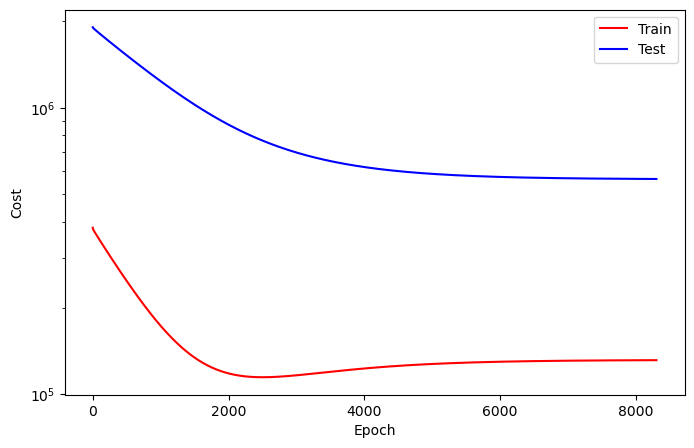

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8301
Train_cost  = 131614.5540 | Test_cost  = 563685.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8302
Train_cost  = 131614.7901 | Test_cost  = 563684.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8303
Train_cost  = 131615.0363 | Test_cost  = 563682.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8304
Train_cost  = 131615.2508 | Test_cost  = 563681.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8305
Train_cost  = 131615.4861 | Test_cost  = 563680.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8306
Train_cost  = 131615.7215 | Test_cost  = 563678.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8307
Train_cost  = 131615.9591 | Test_cost  = 563677.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8308
Train_cost  = 131616.1713 | Test_cost  = 563676.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8309
Train_cost  = 131616.4306 | Test_cost  = 563675.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8310
Train_cost  = 131616.6327 | Test_cost  = 563674.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8311
Train_cost  = 131616.8295 | Test_cost  = 563672.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8312
Train_cost  = 131617.0517 | Test_cost  = 563671.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8313
Train_cost  = 131617.2909 | Test_cost  = 563670.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8314
Train_cost  = 131617.5108 | Test_cost  = 563669.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8315
Train_cost  = 131617.7238 | Test_cost  = 563668.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8316
Train_cost  = 131617.9151 | Test_cost  = 563666.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8317
Train_cost  = 131618.1505 | Test_cost  = 563665.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8318
Train_cost  = 131618.3881 | Test_cost  = 563664.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8319
Train_cost  = 131618.5880 | Test_cost  = 563663.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8320
Train_cost  = 131618.8333 | Test_cost  = 563661.9250 | 


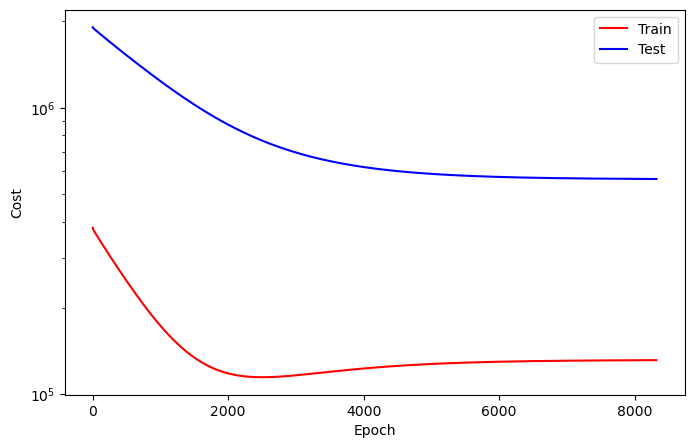

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8321
Train_cost  = 131619.0463 | Test_cost  = 563660.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8322
Train_cost  = 131619.2338 | Test_cost  = 563659.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8323
Train_cost  = 131619.4637 | Test_cost  = 563658.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8324
Train_cost  = 131619.6759 | Test_cost  = 563657.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8325
Train_cost  = 131619.9244 | Test_cost  = 563655.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8326
Train_cost  = 131620.1219 | Test_cost  = 563654.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8327
Train_cost  = 131620.3287 | Test_cost  = 563653.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8328
Train_cost  = 131620.5525 | Test_cost  = 563652.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8329
Train_cost  = 131620.7932 | Test_cost  = 563650.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8330
Train_cost  = 131621.0031 | Test_cost  = 563650.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8331
Train_cost  = 131621.2307 | Test_cost  = 563648.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8332
Train_cost  = 131621.4383 | Test_cost  = 563647.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8333
Train_cost  = 131621.6590 | Test_cost  = 563646.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8334
Train_cost  = 131621.8773 | Test_cost  = 563645.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8335
Train_cost  = 131622.0995 | Test_cost  = 563643.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8336
Train_cost  = 131622.3156 | Test_cost  = 563642.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8337
Train_cost  = 131622.5370 | Test_cost  = 563641.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8338
Train_cost  = 131622.7346 | Test_cost  = 563640.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8339
Train_cost  = 131622.9660 | Test_cost  = 563638.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8340
Train_cost  = 131623.1736 | Test_cost  = 563637.6750 | 


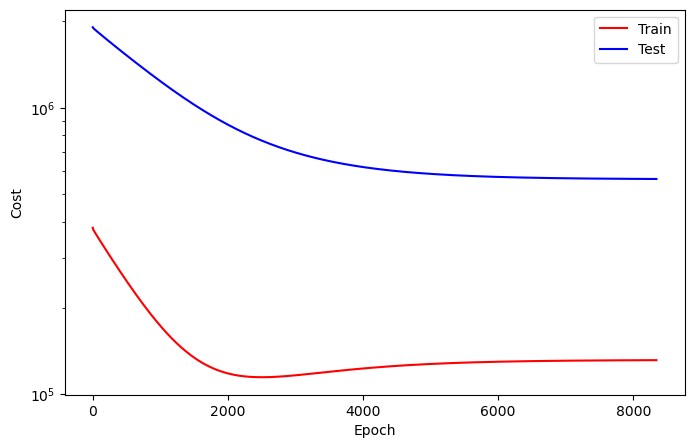

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8341
Train_cost  = 131623.4282 | Test_cost  = 563636.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8342
Train_cost  = 131623.6335 | Test_cost  = 563635.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8343
Train_cost  = 131623.8333 | Test_cost  = 563634.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8344
Train_cost  = 131624.0617 | Test_cost  = 563632.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8345
Train_cost  = 131624.2809 | Test_cost  = 563631.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8346
Train_cost  = 131624.4946 | Test_cost  = 563630.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8347
Train_cost  = 131624.7215 | Test_cost  = 563629.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8348
Train_cost  = 131624.8997 | Test_cost  = 563628.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8349
Train_cost  = 131625.1327 | Test_cost  = 563627.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8350
Train_cost  = 131625.3688 | Test_cost  = 563625.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8351
Train_cost  = 131625.5772 | Test_cost  = 563624.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8352
Train_cost  = 131625.8171 | Test_cost  = 563623.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8353
Train_cost  = 131626.0224 | Test_cost  = 563622.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8354
Train_cost  = 131626.2230 | Test_cost  = 563620.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8355
Train_cost  = 131626.4444 | Test_cost  = 563619.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8356
Train_cost  = 131626.6836 | Test_cost  = 563618.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8357
Train_cost  = 131626.8958 | Test_cost  = 563617.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8358
Train_cost  = 131627.0926 | Test_cost  = 563616.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8359
Train_cost  = 131627.3171 | Test_cost  = 563614.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8360
Train_cost  = 131627.5139 | Test_cost  = 563613.6250 | 


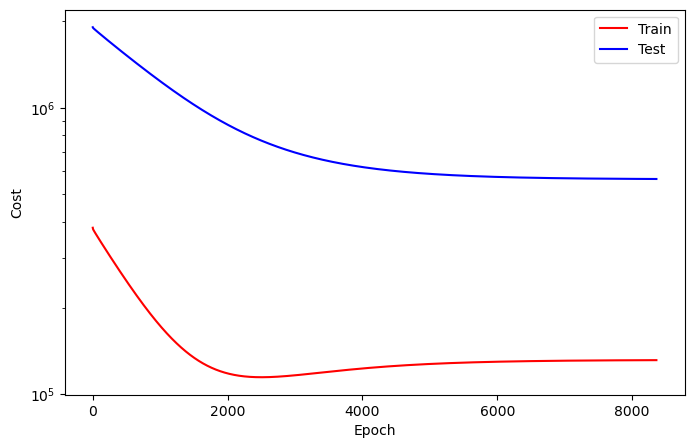

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8361
Train_cost  = 131627.7469 | Test_cost  = 563612.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8362
Train_cost  = 131627.9630 | Test_cost  = 563611.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8363
Train_cost  = 131628.1852 | Test_cost  = 563610.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8364
Train_cost  = 131628.3927 | Test_cost  = 563608.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8365
Train_cost  = 131628.6150 | Test_cost  = 563607.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8366
Train_cost  = 131628.8341 | Test_cost  = 563606.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8367
Train_cost  = 131629.0540 | Test_cost  = 563605.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8368
Train_cost  = 131629.2870 | Test_cost  = 563604.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8369
Train_cost  = 131629.4954 | Test_cost  = 563602.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8370
Train_cost  = 131629.7006 | Test_cost  = 563601.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8371
Train_cost  = 131629.9113 | Test_cost  = 563600.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8372
Train_cost  = 131630.1127 | Test_cost  = 563599.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8373
Train_cost  = 131630.3796 | Test_cost  = 563598.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8374
Train_cost  = 131630.5787 | Test_cost  = 563597.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8375
Train_cost  = 131630.7685 | Test_cost  = 563595.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8376
Train_cost  = 131631.0000 | Test_cost  = 563594.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8377
Train_cost  = 131631.2122 | Test_cost  = 563593.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8378
Train_cost  = 131631.4390 | Test_cost  = 563592.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8379
Train_cost  = 131631.6520 | Test_cost  = 563591.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8380
Train_cost  = 131631.8410 | Test_cost  = 563589.8000 | 


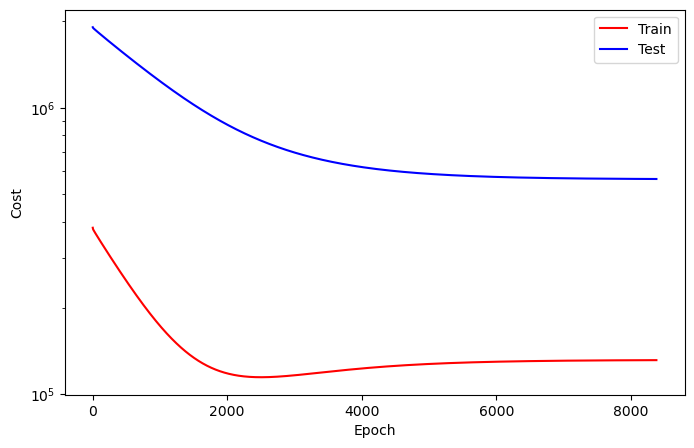

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8381
Train_cost  = 131632.0802 | Test_cost  = 563588.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8382
Train_cost  = 131632.2963 | Test_cost  = 563587.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8383
Train_cost  = 131632.5116 | Test_cost  = 563586.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8384
Train_cost  = 131632.7369 | Test_cost  = 563584.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8385
Train_cost  = 131632.9599 | Test_cost  = 563583.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8386
Train_cost  = 131633.1466 | Test_cost  = 563582.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8387
Train_cost  = 131633.3750 | Test_cost  = 563581.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8388
Train_cost  = 131633.5818 | Test_cost  = 563580.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8389
Train_cost  = 131633.8171 | Test_cost  = 563579.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8390
Train_cost  = 131634.0147 | Test_cost  = 563578.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8391
Train_cost  = 131634.1998 | Test_cost  = 563576.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8392
Train_cost  = 131634.4159 | Test_cost  = 563575.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8393
Train_cost  = 131634.6265 | Test_cost  = 563574.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8394
Train_cost  = 131634.7986 | Test_cost  = 563573.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8395
Train_cost  = 131634.9907 | Test_cost  = 563572.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8396
Train_cost  = 131635.2099 | Test_cost  = 563571.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8397
Train_cost  = 131635.4182 | Test_cost  = 563570.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8398
Train_cost  = 131635.5941 | Test_cost  = 563569.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8399
Train_cost  = 131635.8056 | Test_cost  = 563568.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8400
Train_cost  = 131636.0108 | Test_cost  = 563566.7750 | 


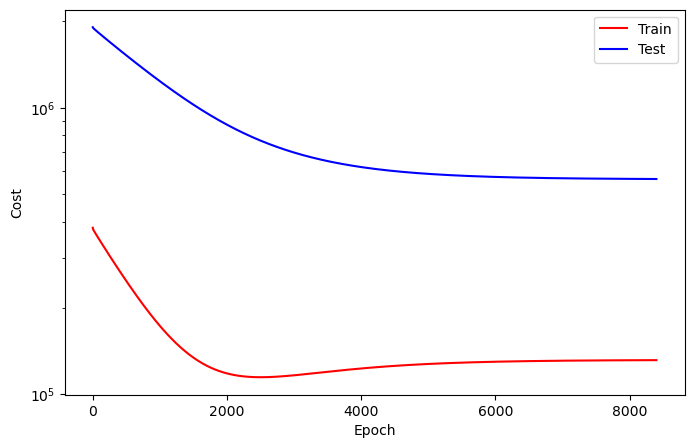

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8401
Train_cost  = 131636.2292 | Test_cost  = 563565.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8402
Train_cost  = 131636.4020 | Test_cost  = 563564.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8403
Train_cost  = 131636.6150 | Test_cost  = 563563.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8404
Train_cost  = 131636.7986 | Test_cost  = 563562.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8405
Train_cost  = 131637.0131 | Test_cost  = 563561.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8406
Train_cost  = 131637.1844 | Test_cost  = 563560.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8407
Train_cost  = 131637.3974 | Test_cost  = 563559.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8408
Train_cost  = 131637.6111 | Test_cost  = 563558.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8409
Train_cost  = 131637.8009 | Test_cost  = 563557.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8410
Train_cost  = 131637.9985 | Test_cost  = 563555.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8411
Train_cost  = 131638.1944 | Test_cost  = 563554.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8412
Train_cost  = 131638.4012 | Test_cost  = 563553.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8413
Train_cost  = 131638.6096 | Test_cost  = 563552.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8414
Train_cost  = 131638.8086 | Test_cost  = 563551.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8415
Train_cost  = 131638.9938 | Test_cost  = 563550.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8416
Train_cost  = 131639.1960 | Test_cost  = 563549.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8417
Train_cost  = 131639.4205 | Test_cost  = 563548.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8418
Train_cost  = 131639.5957 | Test_cost  = 563546.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8419
Train_cost  = 131639.8048 | Test_cost  = 563545.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8420
Train_cost  = 131640.0069 | Test_cost  = 563544.8000 | 


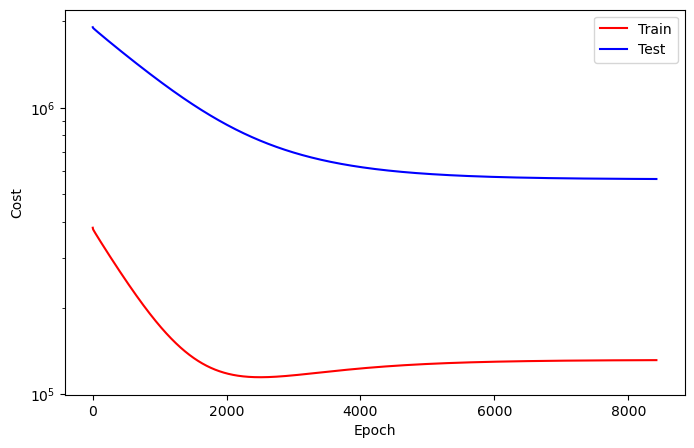

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8421
Train_cost  = 131640.2276 | Test_cost  = 563543.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8422
Train_cost  = 131640.4005 | Test_cost  = 563542.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8423
Train_cost  = 131640.6034 | Test_cost  = 563541.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8424
Train_cost  = 131640.8009 | Test_cost  = 563540.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8425
Train_cost  = 131641.0108 | Test_cost  = 563539.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8426
Train_cost  = 131641.1944 | Test_cost  = 563538.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8427
Train_cost  = 131641.3920 | Test_cost  = 563536.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8428
Train_cost  = 131641.6065 | Test_cost  = 563535.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8429
Train_cost  = 131641.8009 | Test_cost  = 563534.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8430
Train_cost  = 131642.0069 | Test_cost  = 563533.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8431
Train_cost  = 131642.1998 | Test_cost  = 563532.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8432
Train_cost  = 131642.4035 | Test_cost  = 563531.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8433
Train_cost  = 131642.6103 | Test_cost  = 563530.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8434
Train_cost  = 131642.7971 | Test_cost  = 563529.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8435
Train_cost  = 131642.9946 | Test_cost  = 563528.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8436
Train_cost  = 131643.1883 | Test_cost  = 563527.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8437
Train_cost  = 131643.4020 | Test_cost  = 563526.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8438
Train_cost  = 131643.5895 | Test_cost  = 563525.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8439
Train_cost  = 131643.7855 | Test_cost  = 563523.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8440
Train_cost  = 131643.9969 | Test_cost  = 563522.7250 | 


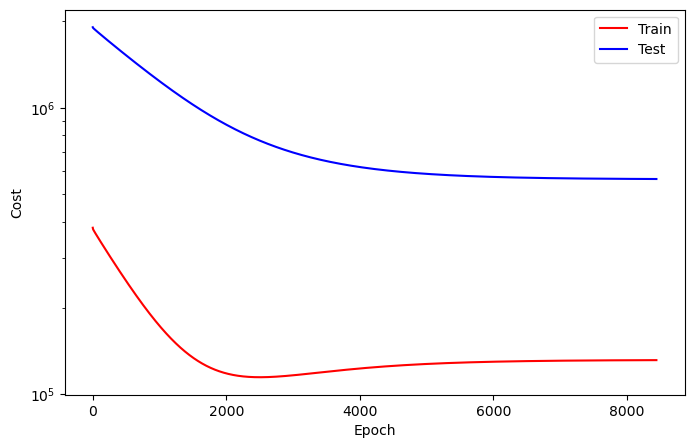

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8441
Train_cost  = 131644.2052 | Test_cost  = 563521.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8442
Train_cost  = 131644.3843 | Test_cost  = 563520.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8443
Train_cost  = 131644.5941 | Test_cost  = 563519.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8444
Train_cost  = 131644.7917 | Test_cost  = 563518.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8445
Train_cost  = 131645.0085 | Test_cost  = 563517.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8446
Train_cost  = 131645.1944 | Test_cost  = 563516.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8447
Train_cost  = 131645.3989 | Test_cost  = 563515.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8448
Train_cost  = 131645.5872 | Test_cost  = 563513.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8449
Train_cost  = 131645.8156 | Test_cost  = 563512.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8450
Train_cost  = 131646.0054 | Test_cost  = 563511.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8451
Train_cost  = 131646.1860 | Test_cost  = 563510.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8452
Train_cost  = 131646.4028 | Test_cost  = 563509.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8453
Train_cost  = 131646.6188 | Test_cost  = 563508.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8454
Train_cost  = 131646.7948 | Test_cost  = 563507.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8455
Train_cost  = 131646.9861 | Test_cost  = 563506.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8456
Train_cost  = 131647.2083 | Test_cost  = 563505.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8457
Train_cost  = 131647.4012 | Test_cost  = 563504.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8458
Train_cost  = 131647.5818 | Test_cost  = 563502.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8459
Train_cost  = 131647.7840 | Test_cost  = 563501.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8460
Train_cost  = 131648.0023 | Test_cost  = 563500.6500 | 


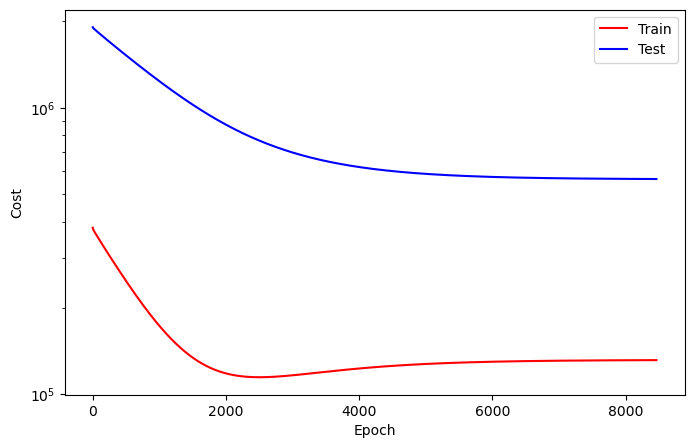

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8461
Train_cost  = 131648.1975 | Test_cost  = 563499.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8462
Train_cost  = 131648.3881 | Test_cost  = 563498.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8463
Train_cost  = 131648.5671 | Test_cost  = 563497.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8464
Train_cost  = 131648.7863 | Test_cost  = 563496.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8465
Train_cost  = 131649.0046 | Test_cost  = 563495.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8466
Train_cost  = 131649.1883 | Test_cost  = 563494.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8467
Train_cost  = 131649.3758 | Test_cost  = 563492.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8468
Train_cost  = 131649.6019 | Test_cost  = 563491.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8469
Train_cost  = 131649.7948 | Test_cost  = 563490.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8470
Train_cost  = 131649.9877 | Test_cost  = 563489.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8471
Train_cost  = 131650.1698 | Test_cost  = 563488.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8472
Train_cost  = 131650.3827 | Test_cost  = 563487.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8473
Train_cost  = 131650.5941 | Test_cost  = 563486.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8474
Train_cost  = 131650.7531 | Test_cost  = 563485.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8475
Train_cost  = 131650.9568 | Test_cost  = 563484.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8476
Train_cost  = 131651.1674 | Test_cost  = 563483.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8477
Train_cost  = 131651.3912 | Test_cost  = 563482.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8478
Train_cost  = 131651.5517 | Test_cost  = 563480.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8479
Train_cost  = 131651.7577 | Test_cost  = 563479.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8480
Train_cost  = 131651.9599 | Test_cost  = 563478.5500 | 


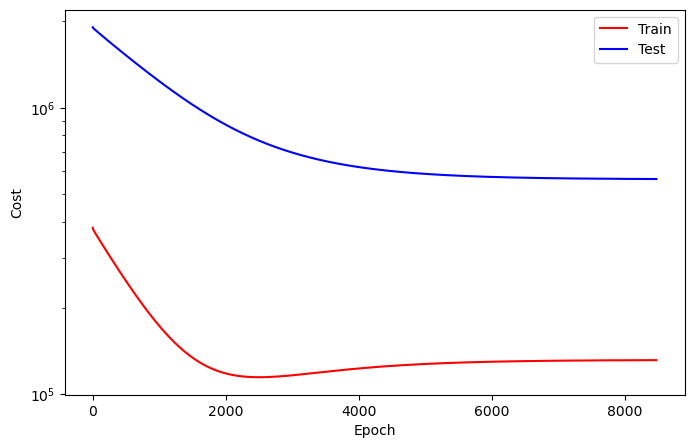

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8481
Train_cost  = 131652.1806 | Test_cost  = 563477.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8482
Train_cost  = 131652.3634 | Test_cost  = 563476.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8483
Train_cost  = 131652.5664 | Test_cost  = 563475.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8484
Train_cost  = 131652.7454 | Test_cost  = 563474.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8485
Train_cost  = 131652.9645 | Test_cost  = 563473.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8486
Train_cost  = 131653.1713 | Test_cost  = 563472.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8487
Train_cost  = 131653.3364 | Test_cost  = 563471.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8488
Train_cost  = 131653.5509 | Test_cost  = 563469.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8489
Train_cost  = 131653.7701 | Test_cost  = 563468.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8490
Train_cost  = 131653.9460 | Test_cost  = 563467.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8491
Train_cost  = 131654.1512 | Test_cost  = 563466.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8492
Train_cost  = 131654.3380 | Test_cost  = 563465.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8493
Train_cost  = 131654.5540 | Test_cost  = 563464.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8494
Train_cost  = 131654.7431 | Test_cost  = 563463.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8495
Train_cost  = 131654.9421 | Test_cost  = 563462.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8496
Train_cost  = 131655.1443 | Test_cost  = 563461.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8497
Train_cost  = 131655.3596 | Test_cost  = 563460.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8498
Train_cost  = 131655.5409 | Test_cost  = 563458.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8499
Train_cost  = 131655.7384 | Test_cost  = 563457.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8500
Train_cost  = 131655.9375 | Test_cost  = 563456.7000 | 


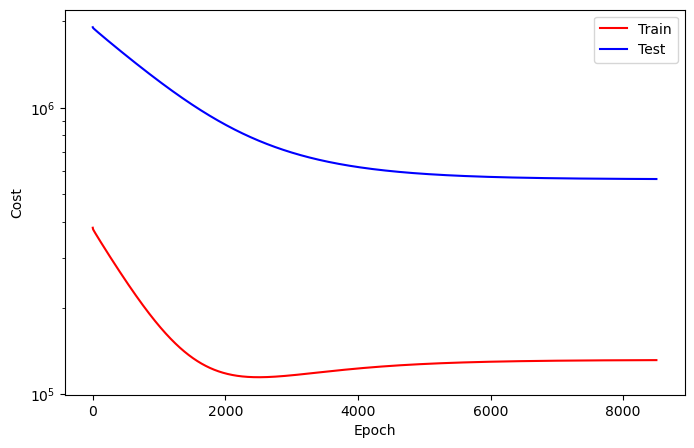

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8501
Train_cost  = 131656.1559 | Test_cost  = 563455.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8502
Train_cost  = 131656.3287 | Test_cost  = 563454.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8503
Train_cost  = 131656.5185 | Test_cost  = 563453.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8504
Train_cost  = 131656.7299 | Test_cost  = 563452.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8505
Train_cost  = 131656.9444 | Test_cost  = 563451.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8506
Train_cost  = 131657.1343 | Test_cost  = 563450.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8507
Train_cost  = 131657.3117 | Test_cost  = 563449.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8508
Train_cost  = 131657.5332 | Test_cost  = 563447.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8509
Train_cost  = 131657.7415 | Test_cost  = 563446.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8510
Train_cost  = 131657.9043 | Test_cost  = 563445.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8511
Train_cost  = 131658.0980 | Test_cost  = 563444.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8512
Train_cost  = 131658.3187 | Test_cost  = 563443.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8513
Train_cost  = 131658.5316 | Test_cost  = 563442.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8514
Train_cost  = 131658.7184 | Test_cost  = 563441.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8515
Train_cost  = 131658.9005 | Test_cost  = 563440.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8516
Train_cost  = 131659.1119 | Test_cost  = 563439.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8517
Train_cost  = 131659.3333 | Test_cost  = 563438.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8518
Train_cost  = 131659.5100 | Test_cost  = 563436.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8519
Train_cost  = 131659.7037 | Test_cost  = 563435.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8520
Train_cost  = 131659.9105 | Test_cost  = 563434.6750 | 


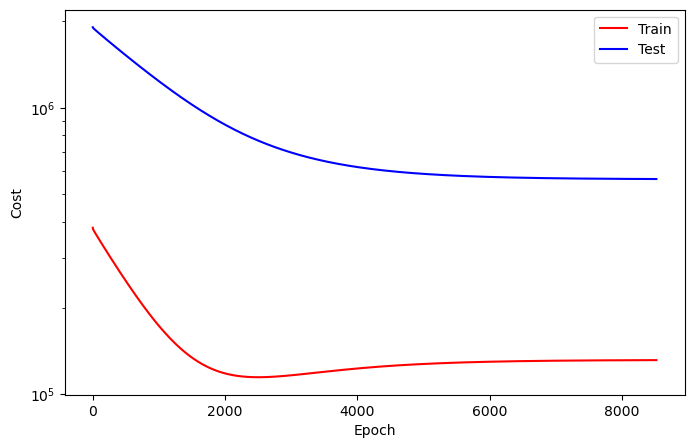

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8521
Train_cost  = 131660.1358 | Test_cost  = 563433.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8522
Train_cost  = 131660.2948 | Test_cost  = 563432.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8523
Train_cost  = 131660.4877 | Test_cost  = 563431.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8524
Train_cost  = 131660.7060 | Test_cost  = 563430.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8525
Train_cost  = 131660.9136 | Test_cost  = 563429.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8526
Train_cost  = 131661.0826 | Test_cost  = 563428.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8527
Train_cost  = 131661.2863 | Test_cost  = 563427.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8528
Train_cost  = 131661.4853 | Test_cost  = 563425.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8529
Train_cost  = 131661.7153 | Test_cost  = 563424.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8530
Train_cost  = 131661.8981 | Test_cost  = 563423.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8531
Train_cost  = 131662.0941 | Test_cost  = 563422.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8532
Train_cost  = 131662.3002 | Test_cost  = 563421.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8533
Train_cost  = 131662.4853 | Test_cost  = 563420.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8534
Train_cost  = 131662.6906 | Test_cost  = 563419.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8535
Train_cost  = 131662.8619 | Test_cost  = 563418.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8536
Train_cost  = 131663.0895 | Test_cost  = 563417.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8537
Train_cost  = 131663.2716 | Test_cost  = 563416.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8538
Train_cost  = 131663.4660 | Test_cost  = 563415.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8539
Train_cost  = 131663.6528 | Test_cost  = 563413.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8540
Train_cost  = 131663.8735 | Test_cost  = 563412.8250 | 


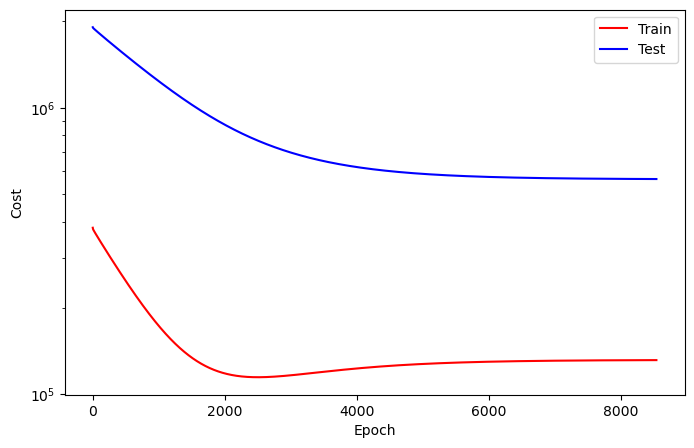

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8541
Train_cost  = 131664.0802 | Test_cost  = 563411.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8542
Train_cost  = 131664.2654 | Test_cost  = 563410.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8543
Train_cost  = 131664.4630 | Test_cost  = 563409.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8544
Train_cost  = 131664.6682 | Test_cost  = 563408.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8545
Train_cost  = 131664.8866 | Test_cost  = 563407.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8546
Train_cost  = 131665.0664 | Test_cost  = 563406.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8547
Train_cost  = 131665.2739 | Test_cost  = 563405.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8548
Train_cost  = 131665.4622 | Test_cost  = 563404.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8549
Train_cost  = 131665.6690 | Test_cost  = 563403.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8550
Train_cost  = 131665.8711 | Test_cost  = 563401.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8551
Train_cost  = 131666.0471 | Test_cost  = 563400.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8552
Train_cost  = 131666.2577 | Test_cost  = 563399.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8553
Train_cost  = 131666.4815 | Test_cost  = 563398.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8554
Train_cost  = 131666.6512 | Test_cost  = 563397.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8555
Train_cost  = 131666.8457 | Test_cost  = 563396.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8556
Train_cost  = 131667.0386 | Test_cost  = 563395.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8557
Train_cost  = 131667.2531 | Test_cost  = 563394.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8558
Train_cost  = 131667.4352 | Test_cost  = 563393.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8559
Train_cost  = 131667.6451 | Test_cost  = 563391.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8560
Train_cost  = 131667.8472 | Test_cost  = 563390.8250 | 


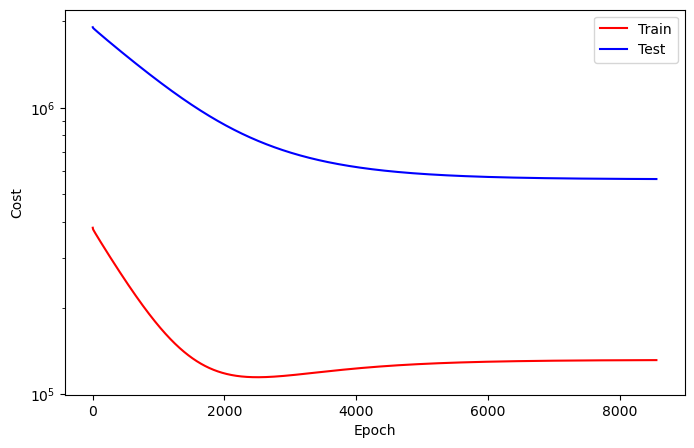

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8561
Train_cost  = 131668.0748 | Test_cost  = 563389.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8562
Train_cost  = 131668.2438 | Test_cost  = 563388.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8563
Train_cost  = 131668.4390 | Test_cost  = 563387.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8564
Train_cost  = 131668.6389 | Test_cost  = 563386.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8565
Train_cost  = 131668.8025 | Test_cost  = 563385.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8566
Train_cost  = 131668.9853 | Test_cost  = 563384.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8567
Train_cost  = 131669.1798 | Test_cost  = 563383.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8568
Train_cost  = 131669.3742 | Test_cost  = 563382.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8569
Train_cost  = 131669.5154 | Test_cost  = 563381.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8570
Train_cost  = 131669.7238 | Test_cost  = 563380.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8571
Train_cost  = 131669.9159 | Test_cost  = 563379.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8572
Train_cost  = 131670.0710 | Test_cost  = 563378.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8573
Train_cost  = 131670.2685 | Test_cost  = 563377.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8574
Train_cost  = 131670.4583 | Test_cost  = 563376.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8575
Train_cost  = 131670.6296 | Test_cost  = 563375.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8576
Train_cost  = 131670.8071 | Test_cost  = 563374.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8577
Train_cost  = 131670.9877 | Test_cost  = 563373.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8578
Train_cost  = 131671.1698 | Test_cost  = 563372.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8579
Train_cost  = 131671.3627 | Test_cost  = 563371.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8580
Train_cost  = 131671.5494 | Test_cost  = 563370.6000 | 


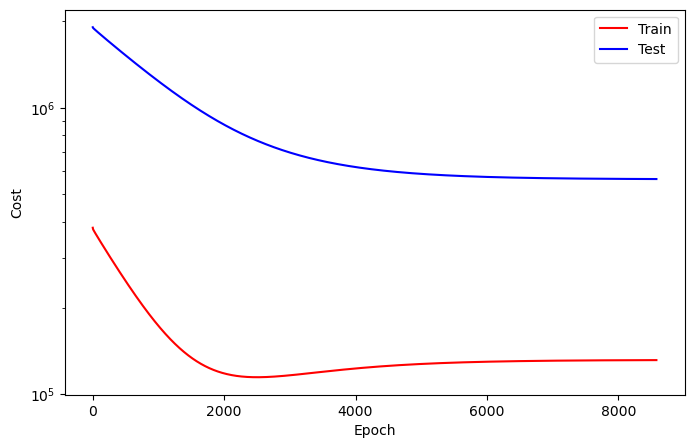

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8581
Train_cost  = 131671.7330 | Test_cost  = 563369.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8582
Train_cost  = 131671.8981 | Test_cost  = 563368.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8583
Train_cost  = 131672.1003 | Test_cost  = 563367.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8584
Train_cost  = 131672.2824 | Test_cost  = 563366.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8585
Train_cost  = 131672.4491 | Test_cost  = 563365.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8586
Train_cost  = 131672.6358 | Test_cost  = 563364.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8587
Train_cost  = 131672.8542 | Test_cost  = 563363.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8588
Train_cost  = 131672.9946 | Test_cost  = 563362.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8589
Train_cost  = 131673.1937 | Test_cost  = 563361.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8590
Train_cost  = 131673.3735 | Test_cost  = 563360.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8591
Train_cost  = 131673.5525 | Test_cost  = 563359.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8592
Train_cost  = 131673.7307 | Test_cost  = 563358.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8593
Train_cost  = 131673.9090 | Test_cost  = 563357.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8594
Train_cost  = 131674.1134 | Test_cost  = 563356.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8595
Train_cost  = 131674.2785 | Test_cost  = 563355.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8596
Train_cost  = 131674.4745 | Test_cost  = 563354.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8597
Train_cost  = 131674.6489 | Test_cost  = 563353.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8598
Train_cost  = 131674.8102 | Test_cost  = 563352.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8599
Train_cost  = 131675.0100 | Test_cost  = 563351.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8600
Train_cost  = 131675.2091 | Test_cost  = 563350.4250 | 


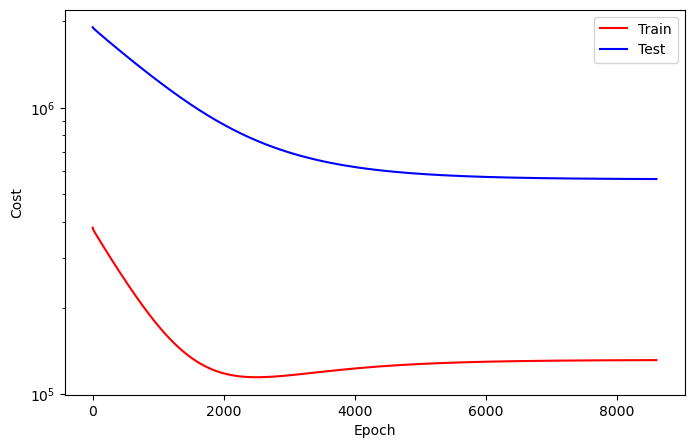

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8601
Train_cost  = 131675.3580 | Test_cost  = 563349.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8602
Train_cost  = 131675.5617 | Test_cost  = 563348.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8603
Train_cost  = 131675.7415 | Test_cost  = 563347.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8604
Train_cost  = 131675.9182 | Test_cost  = 563346.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8605
Train_cost  = 131676.1034 | Test_cost  = 563345.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8606
Train_cost  = 131676.2994 | Test_cost  = 563344.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8607
Train_cost  = 131676.4676 | Test_cost  = 563343.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8608
Train_cost  = 131676.6443 | Test_cost  = 563342.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8609
Train_cost  = 131676.8333 | Test_cost  = 563341.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8610
Train_cost  = 131677.0231 | Test_cost  = 563340.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8611
Train_cost  = 131677.1914 | Test_cost  = 563339.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8612
Train_cost  = 131677.3704 | Test_cost  = 563338.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8613
Train_cost  = 131677.5586 | Test_cost  = 563337.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8614
Train_cost  = 131677.7330 | Test_cost  = 563336.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8615
Train_cost  = 131677.9244 | Test_cost  = 563335.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8616
Train_cost  = 131678.1235 | Test_cost  = 563334.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8617
Train_cost  = 131678.2963 | Test_cost  = 563333.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8618
Train_cost  = 131678.4823 | Test_cost  = 563332.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8619
Train_cost  = 131678.6836 | Test_cost  = 563331.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8620
Train_cost  = 131678.8457 | Test_cost  = 563330.2000 | 


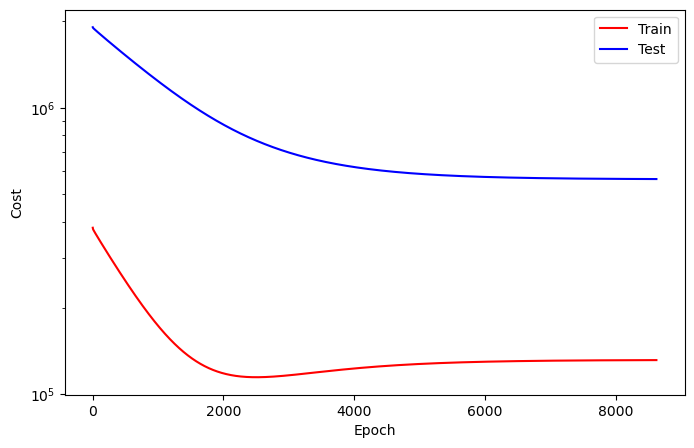

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8621
Train_cost  = 131679.0270 | Test_cost  = 563329.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8622
Train_cost  = 131679.2160 | Test_cost  = 563328.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8623
Train_cost  = 131679.4012 | Test_cost  = 563327.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8624
Train_cost  = 131679.5610 | Test_cost  = 563326.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8625
Train_cost  = 131679.7539 | Test_cost  = 563325.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8626
Train_cost  = 131679.9529 | Test_cost  = 563324.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8627
Train_cost  = 131680.1258 | Test_cost  = 563323.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8628
Train_cost  = 131680.3171 | Test_cost  = 563322.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8629
Train_cost  = 131680.4838 | Test_cost  = 563321.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8630
Train_cost  = 131680.6597 | Test_cost  = 563320.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8631
Train_cost  = 131680.8511 | Test_cost  = 563318.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8632
Train_cost  = 131681.0579 | Test_cost  = 563318.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8633
Train_cost  = 131681.1998 | Test_cost  = 563317.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8634
Train_cost  = 131681.3989 | Test_cost  = 563316.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8635
Train_cost  = 131681.5941 | Test_cost  = 563315.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8636
Train_cost  = 131681.7577 | Test_cost  = 563314.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8637
Train_cost  = 131681.9414 | Test_cost  = 563313.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8638
Train_cost  = 131682.1327 | Test_cost  = 563312.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8639
Train_cost  = 131682.3025 | Test_cost  = 563311.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8640
Train_cost  = 131682.4784 | Test_cost  = 563309.9000 | 


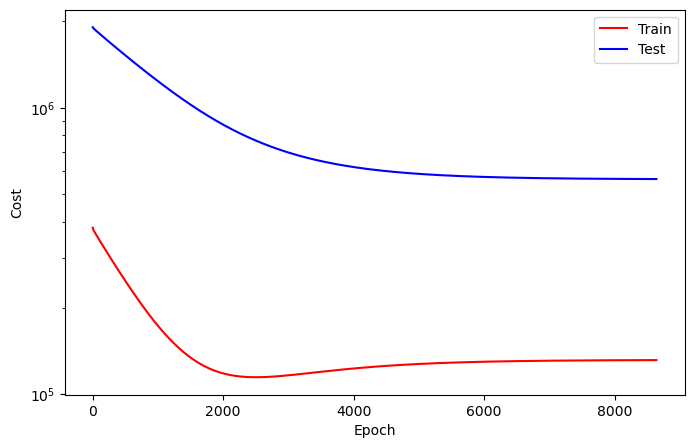

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8641
Train_cost  = 131682.6759 | Test_cost  = 563309.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8642
Train_cost  = 131682.8534 | Test_cost  = 563307.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8643
Train_cost  = 131683.0324 | Test_cost  = 563307.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8644
Train_cost  = 131683.2253 | Test_cost  = 563306.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8645
Train_cost  = 131683.4136 | Test_cost  = 563304.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8646
Train_cost  = 131683.5725 | Test_cost  = 563303.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8647
Train_cost  = 131683.7731 | Test_cost  = 563302.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8648
Train_cost  = 131683.9614 | Test_cost  = 563302.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8649
Train_cost  = 131684.1350 | Test_cost  = 563300.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8650
Train_cost  = 131684.3164 | Test_cost  = 563299.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8651
Train_cost  = 131684.5293 | Test_cost  = 563299.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8652
Train_cost  = 131684.6782 | Test_cost  = 563298.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8653
Train_cost  = 131684.8758 | Test_cost  = 563296.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8654
Train_cost  = 131685.0494 | Test_cost  = 563295.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8655
Train_cost  = 131685.2307 | Test_cost  = 563294.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8656
Train_cost  = 131685.4035 | Test_cost  = 563293.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8657
Train_cost  = 131685.5887 | Test_cost  = 563292.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8658
Train_cost  = 131685.7940 | Test_cost  = 563291.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8659
Train_cost  = 131685.9699 | Test_cost  = 563290.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8660
Train_cost  = 131686.1582 | Test_cost  = 563289.9000 | 


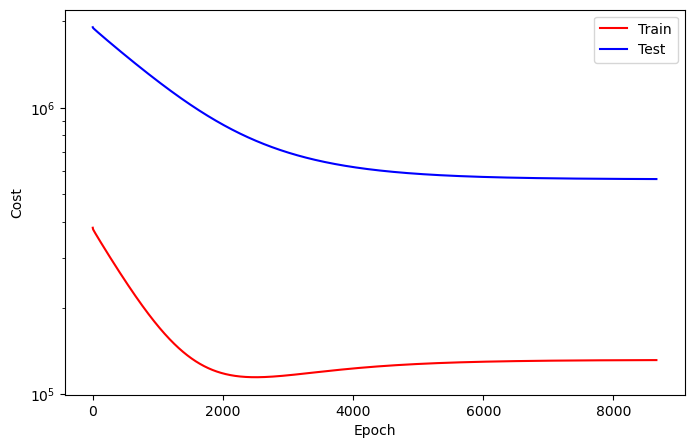

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8661
Train_cost  = 131686.3310 | Test_cost  = 563288.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8662
Train_cost  = 131686.4931 | Test_cost  = 563287.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8663
Train_cost  = 131686.6906 | Test_cost  = 563286.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8664
Train_cost  = 131686.8866 | Test_cost  = 563285.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8665
Train_cost  = 131687.0394 | Test_cost  = 563284.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8666
Train_cost  = 131687.2454 | Test_cost  = 563283.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8667
Train_cost  = 131687.4252 | Test_cost  = 563282.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8668
Train_cost  = 131687.6003 | Test_cost  = 563281.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8669
Train_cost  = 131687.7863 | Test_cost  = 563280.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8670
Train_cost  = 131687.9799 | Test_cost  = 563279.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8671
Train_cost  = 131688.1451 | Test_cost  = 563278.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8672
Train_cost  = 131688.3333 | Test_cost  = 563277.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8673
Train_cost  = 131688.5185 | Test_cost  = 563276.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8674
Train_cost  = 131688.7160 | Test_cost  = 563275.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8675
Train_cost  = 131688.8735 | Test_cost  = 563274.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8676
Train_cost  = 131689.0556 | Test_cost  = 563273.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8677
Train_cost  = 131689.2438 | Test_cost  = 563272.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8678
Train_cost  = 131689.4136 | Test_cost  = 563271.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8679
Train_cost  = 131689.6080 | Test_cost  = 563270.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8680
Train_cost  = 131689.8025 | Test_cost  = 563269.6750 | 


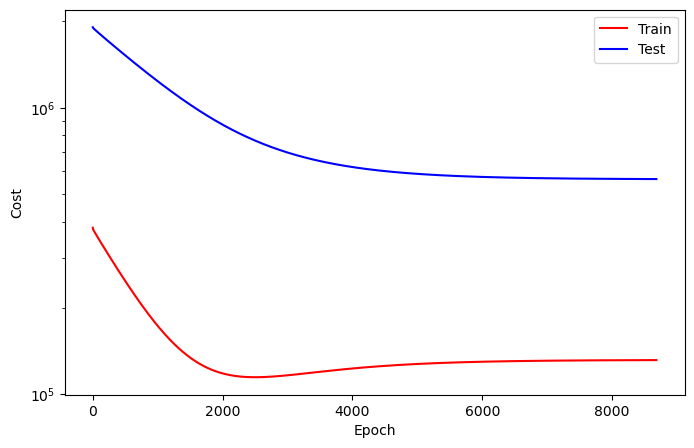

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8681
Train_cost  = 131689.9722 | Test_cost  = 563268.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8682
Train_cost  = 131690.1620 | Test_cost  = 563267.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8683
Train_cost  = 131690.3704 | Test_cost  = 563266.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8684
Train_cost  = 131690.5255 | Test_cost  = 563265.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8685
Train_cost  = 131690.7122 | Test_cost  = 563264.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8686
Train_cost  = 131690.8966 | Test_cost  = 563263.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8687
Train_cost  = 131691.0748 | Test_cost  = 563262.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8688
Train_cost  = 131691.2492 | Test_cost  = 563261.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8689
Train_cost  = 131691.4329 | Test_cost  = 563260.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8690
Train_cost  = 131691.6304 | Test_cost  = 563259.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8691
Train_cost  = 131691.8048 | Test_cost  = 563258.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8692
Train_cost  = 131691.9961 | Test_cost  = 563257.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8693
Train_cost  = 131692.1713 | Test_cost  = 563256.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8694
Train_cost  = 131692.3434 | Test_cost  = 563255.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8695
Train_cost  = 131692.5316 | Test_cost  = 563254.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8696
Train_cost  = 131692.7261 | Test_cost  = 563253.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8697
Train_cost  = 131692.8781 | Test_cost  = 563252.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8698
Train_cost  = 131693.0833 | Test_cost  = 563251.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8699
Train_cost  = 131693.2809 | Test_cost  = 563250.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8700
Train_cost  = 131693.4336 | Test_cost  = 563249.5750 | 


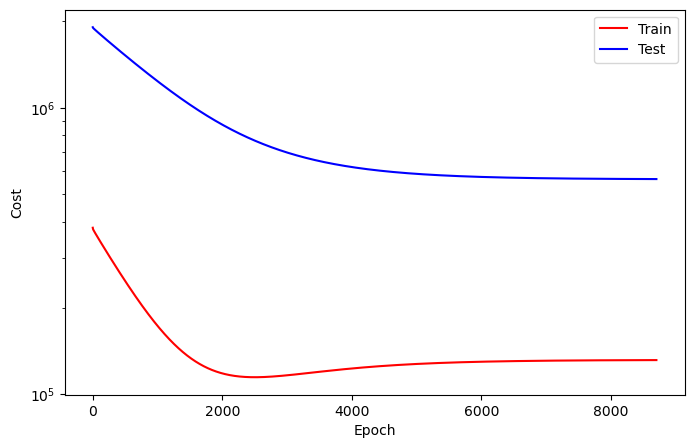

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8701
Train_cost  = 131693.6296 | Test_cost  = 563248.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8702
Train_cost  = 131693.8117 | Test_cost  = 563247.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8703
Train_cost  = 131693.9877 | Test_cost  = 563246.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8704
Train_cost  = 131694.1605 | Test_cost  = 563245.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8705
Train_cost  = 131694.3457 | Test_cost  = 563244.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8706
Train_cost  = 131694.5309 | Test_cost  = 563243.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8707
Train_cost  = 131694.7269 | Test_cost  = 563242.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8708
Train_cost  = 131694.9043 | Test_cost  = 563241.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8709
Train_cost  = 131695.0934 | Test_cost  = 563240.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8710
Train_cost  = 131695.2562 | Test_cost  = 563239.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8711
Train_cost  = 131695.4552 | Test_cost  = 563238.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8712
Train_cost  = 131695.6435 | Test_cost  = 563237.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8713
Train_cost  = 131695.8025 | Test_cost  = 563236.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8714
Train_cost  = 131695.9923 | Test_cost  = 563235.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8715
Train_cost  = 131696.2168 | Test_cost  = 563234.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8716
Train_cost  = 131696.3588 | Test_cost  = 563233.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8717
Train_cost  = 131696.5502 | Test_cost  = 563232.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8718
Train_cost  = 131696.7338 | Test_cost  = 563231.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8719
Train_cost  = 131696.9020 | Test_cost  = 563230.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8720
Train_cost  = 131697.0887 | Test_cost  = 563229.4000 | 


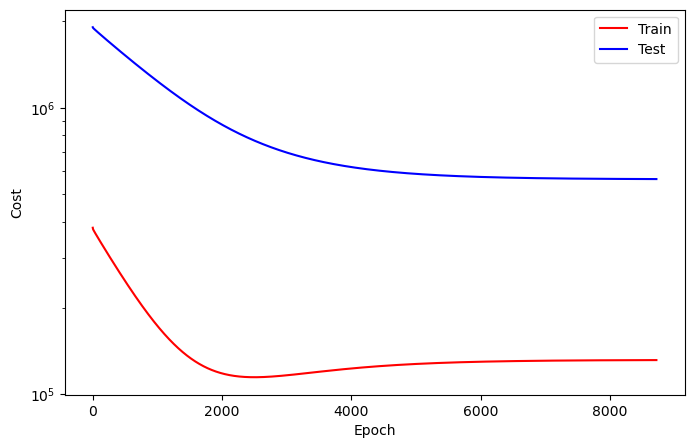

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8721
Train_cost  = 131697.2647 | Test_cost  = 563228.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8722
Train_cost  = 131697.4483 | Test_cost  = 563227.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8723
Train_cost  = 131697.6366 | Test_cost  = 563226.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8724
Train_cost  = 131697.8248 | Test_cost  = 563225.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8725
Train_cost  = 131698.0231 | Test_cost  = 563224.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8726
Train_cost  = 131698.1682 | Test_cost  = 563223.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8727
Train_cost  = 131698.3611 | Test_cost  = 563222.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8728
Train_cost  = 131698.5571 | Test_cost  = 563221.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8729
Train_cost  = 131698.7099 | Test_cost  = 563220.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8730
Train_cost  = 131698.8873 | Test_cost  = 563219.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8731
Train_cost  = 131699.0926 | Test_cost  = 563218.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8732
Train_cost  = 131699.2701 | Test_cost  = 563217.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8733
Train_cost  = 131699.4321 | Test_cost  = 563216.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8734
Train_cost  = 131699.6181 | Test_cost  = 563215.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8735
Train_cost  = 131699.7955 | Test_cost  = 563214.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8736
Train_cost  = 131699.9838 | Test_cost  = 563213.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8737
Train_cost  = 131700.1728 | Test_cost  = 563212.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8738
Train_cost  = 131700.3410 | Test_cost  = 563211.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8739
Train_cost  = 131700.5285 | Test_cost  = 563210.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8740
Train_cost  = 131700.7083 | Test_cost  = 563209.5500 | 


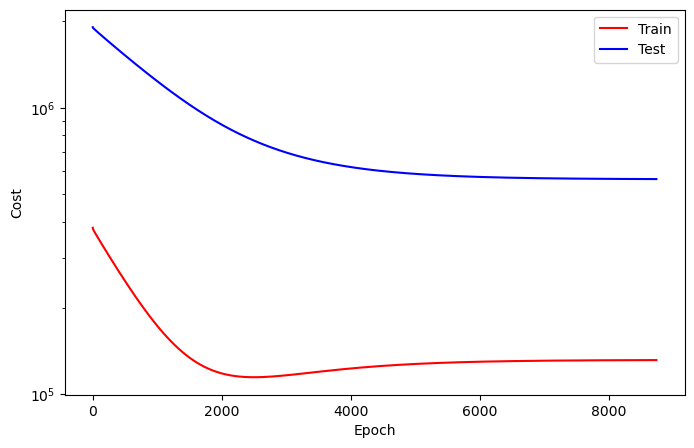

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8741
Train_cost  = 131700.8974 | Test_cost  = 563208.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8742
Train_cost  = 131701.0594 | Test_cost  = 563207.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8743
Train_cost  = 131701.2531 | Test_cost  = 563206.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8744
Train_cost  = 131701.4375 | Test_cost  = 563205.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8745
Train_cost  = 131701.5980 | Test_cost  = 563204.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8746
Train_cost  = 131701.7716 | Test_cost  = 563203.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8747
Train_cost  = 131701.9838 | Test_cost  = 563202.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8748
Train_cost  = 131702.1559 | Test_cost  = 563201.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8749
Train_cost  = 131702.3318 | Test_cost  = 563200.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8750
Train_cost  = 131702.5046 | Test_cost  = 563199.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8751
Train_cost  = 131702.6790 | Test_cost  = 563198.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8752
Train_cost  = 131702.8673 | Test_cost  = 563197.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8753
Train_cost  = 131703.0324 | Test_cost  = 563196.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8754
Train_cost  = 131703.2361 | Test_cost  = 563195.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8755
Train_cost  = 131703.4090 | Test_cost  = 563194.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8756
Train_cost  = 131703.5818 | Test_cost  = 563193.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8757
Train_cost  = 131703.7546 | Test_cost  = 563192.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8758
Train_cost  = 131703.9429 | Test_cost  = 563191.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8759
Train_cost  = 131704.1211 | Test_cost  = 563190.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8760
Train_cost  = 131704.3086 | Test_cost  = 563189.7500 | 


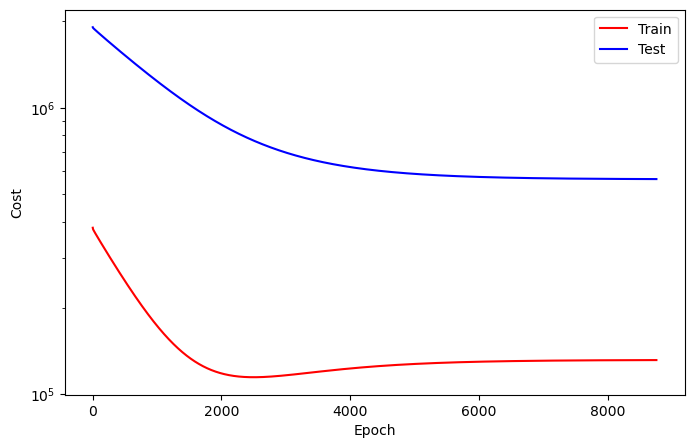

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8761
Train_cost  = 131704.4684 | Test_cost  = 563188.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8762
Train_cost  = 131704.6705 | Test_cost  = 563187.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8763
Train_cost  = 131704.8650 | Test_cost  = 563186.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8764
Train_cost  = 131705.0147 | Test_cost  = 563185.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8765
Train_cost  = 131705.1968 | Test_cost  = 563184.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8766
Train_cost  = 131705.3765 | Test_cost  = 563183.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8767
Train_cost  = 131705.5185 | Test_cost  = 563182.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8768
Train_cost  = 131705.7068 | Test_cost  = 563181.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8769
Train_cost  = 131705.8704 | Test_cost  = 563181.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8770
Train_cost  = 131706.0247 | Test_cost  = 563180.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8771
Train_cost  = 131706.1798 | Test_cost  = 563179.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8772
Train_cost  = 131706.3665 | Test_cost  = 563178.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8773
Train_cost  = 131706.5131 | Test_cost  = 563177.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8774
Train_cost  = 131706.6883 | Test_cost  = 563176.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8775
Train_cost  = 131706.8333 | Test_cost  = 563175.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8776
Train_cost  = 131707.0062 | Test_cost  = 563174.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8777
Train_cost  = 131707.1782 | Test_cost  = 563173.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8778
Train_cost  = 131707.3318 | Test_cost  = 563172.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8779
Train_cost  = 131707.4907 | Test_cost  = 563172.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8780
Train_cost  = 131707.6728 | Test_cost  = 563171.2500 | 


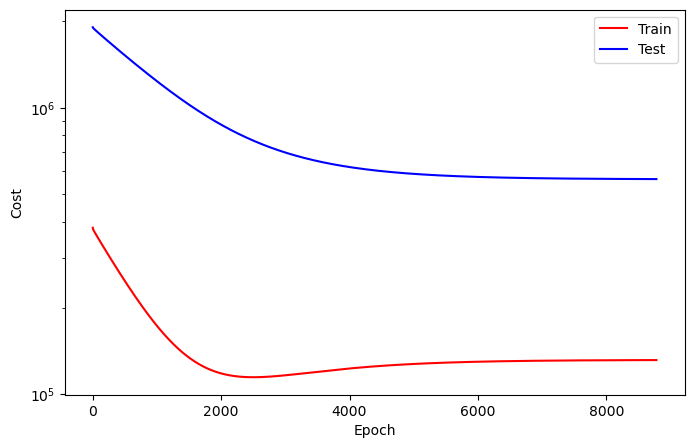

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8781
Train_cost  = 131707.8133 | Test_cost  = 563170.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8782
Train_cost  = 131708.0023 | Test_cost  = 563169.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8783
Train_cost  = 131708.1512 | Test_cost  = 563168.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8784
Train_cost  = 131708.3256 | Test_cost  = 563167.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8785
Train_cost  = 131708.4699 | Test_cost  = 563166.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8786
Train_cost  = 131708.6458 | Test_cost  = 563165.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8787
Train_cost  = 131708.8156 | Test_cost  = 563164.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8788
Train_cost  = 131708.9792 | Test_cost  = 563163.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8789
Train_cost  = 131709.1265 | Test_cost  = 563163.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8790
Train_cost  = 131709.3225 | Test_cost  = 563162.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8791
Train_cost  = 131709.4583 | Test_cost  = 563161.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8792
Train_cost  = 131709.6366 | Test_cost  = 563160.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8793
Train_cost  = 131709.7978 | Test_cost  = 563159.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8794
Train_cost  = 131709.9360 | Test_cost  = 563158.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8795
Train_cost  = 131710.1134 | Test_cost  = 563157.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8796
Train_cost  = 131710.2948 | Test_cost  = 563156.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8797
Train_cost  = 131710.4475 | Test_cost  = 563155.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8798
Train_cost  = 131710.5972 | Test_cost  = 563154.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8799
Train_cost  = 131710.7623 | Test_cost  = 563153.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8800
Train_cost  = 131710.9282 | Test_cost  = 563153.0500 | 


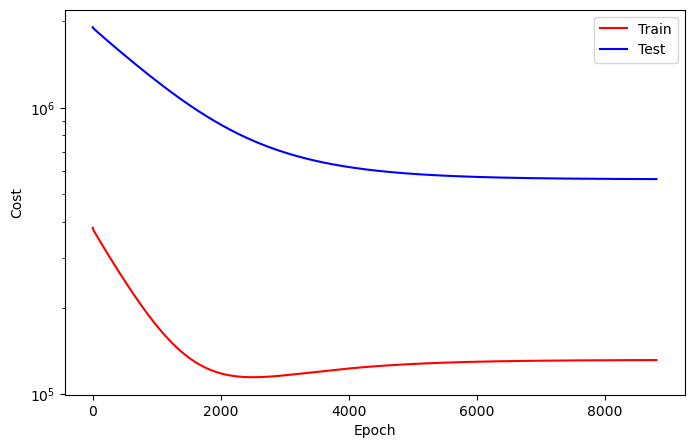

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8801
Train_cost  = 131711.1134 | Test_cost  = 563152.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8802
Train_cost  = 131711.2377 | Test_cost  = 563151.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8803
Train_cost  = 131711.4367 | Test_cost  = 563150.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8804
Train_cost  = 131711.5849 | Test_cost  = 563149.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8805
Train_cost  = 131711.7377 | Test_cost  = 563148.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8806
Train_cost  = 131711.9290 | Test_cost  = 563147.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8807
Train_cost  = 131712.0633 | Test_cost  = 563146.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8808
Train_cost  = 131712.2415 | Test_cost  = 563145.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8809
Train_cost  = 131712.4128 | Test_cost  = 563145.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8810
Train_cost  = 131712.5648 | Test_cost  = 563144.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8811
Train_cost  = 131712.7407 | Test_cost  = 563143.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8812
Train_cost  = 131712.8889 | Test_cost  = 563142.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8813
Train_cost  = 131713.0617 | Test_cost  = 563141.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8814
Train_cost  = 131713.2269 | Test_cost  = 563140.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8815
Train_cost  = 131713.3897 | Test_cost  = 563139.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8816
Train_cost  = 131713.5471 | Test_cost  = 563138.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8817
Train_cost  = 131713.7361 | Test_cost  = 563137.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8818
Train_cost  = 131713.8642 | Test_cost  = 563136.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8819
Train_cost  = 131714.0617 | Test_cost  = 563136.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8820
Train_cost  = 131714.1937 | Test_cost  = 563135.1750 | 


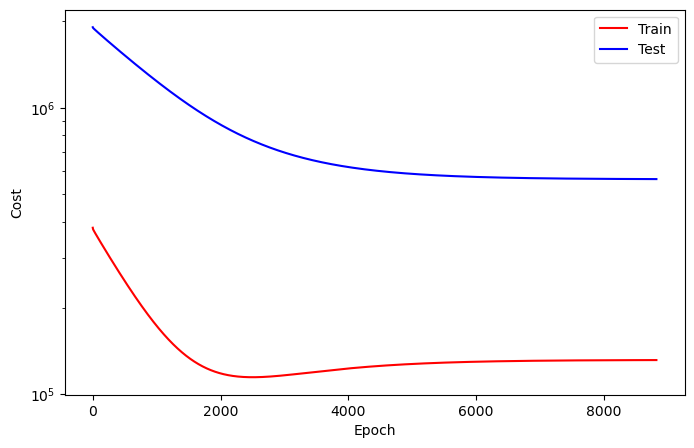

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8821
Train_cost  = 131714.3758 | Test_cost  = 563134.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8822
Train_cost  = 131714.5548 | Test_cost  = 563133.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8823
Train_cost  = 131714.7091 | Test_cost  = 563132.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8824
Train_cost  = 131714.8789 | Test_cost  = 563131.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8825
Train_cost  = 131715.0247 | Test_cost  = 563130.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8826
Train_cost  = 131715.1821 | Test_cost  = 563129.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8827
Train_cost  = 131715.3457 | Test_cost  = 563128.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8828
Train_cost  = 131715.5293 | Test_cost  = 563127.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8829
Train_cost  = 131715.6821 | Test_cost  = 563126.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8830
Train_cost  = 131715.8341 | Test_cost  = 563126.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8831
Train_cost  = 131715.9907 | Test_cost  = 563125.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8832
Train_cost  = 131716.1728 | Test_cost  = 563124.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8833
Train_cost  = 131716.3488 | Test_cost  = 563123.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8834
Train_cost  = 131716.4923 | Test_cost  = 563122.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8835
Train_cost  = 131716.6481 | Test_cost  = 563121.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8836
Train_cost  = 131716.8272 | Test_cost  = 563120.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8837
Train_cost  = 131716.9823 | Test_cost  = 563119.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8838
Train_cost  = 131717.1721 | Test_cost  = 563118.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8839
Train_cost  = 131717.3133 | Test_cost  = 563118.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8840
Train_cost  = 131717.4784 | Test_cost  = 563117.0250 | 


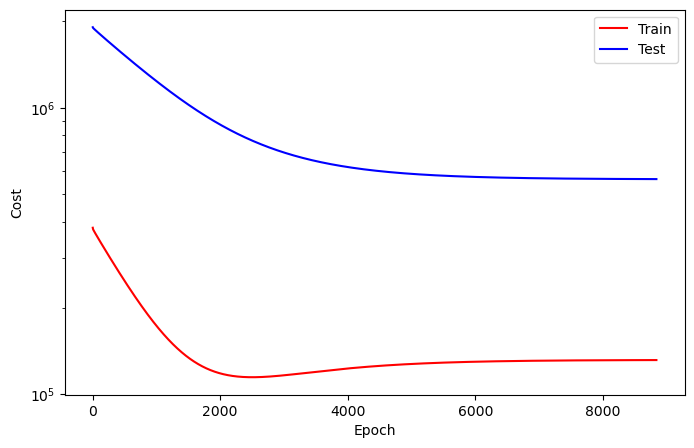

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8841
Train_cost  = 131717.6497 | Test_cost  = 563116.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8842
Train_cost  = 131717.8063 | Test_cost  = 563115.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8843
Train_cost  = 131717.9645 | Test_cost  = 563114.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8844
Train_cost  = 131718.1366 | Test_cost  = 563113.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8845
Train_cost  = 131718.2847 | Test_cost  = 563112.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8846
Train_cost  = 131718.4691 | Test_cost  = 563111.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8847
Train_cost  = 131718.6204 | Test_cost  = 563110.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8848
Train_cost  = 131718.7824 | Test_cost  = 563109.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8849
Train_cost  = 131718.9552 | Test_cost  = 563108.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8850
Train_cost  = 131719.1119 | Test_cost  = 563108.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8851
Train_cost  = 131719.2847 | Test_cost  = 563107.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8852
Train_cost  = 131719.4529 | Test_cost  = 563106.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8853
Train_cost  = 131719.5949 | Test_cost  = 563105.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8854
Train_cost  = 131719.7824 | Test_cost  = 563104.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8855
Train_cost  = 131719.9321 | Test_cost  = 563103.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8856
Train_cost  = 131720.1034 | Test_cost  = 563102.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8857
Train_cost  = 131720.2593 | Test_cost  = 563101.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8858
Train_cost  = 131720.3981 | Test_cost  = 563100.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8859
Train_cost  = 131720.5841 | Test_cost  = 563099.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8860
Train_cost  = 131720.7515 | Test_cost  = 563099.0500 | 


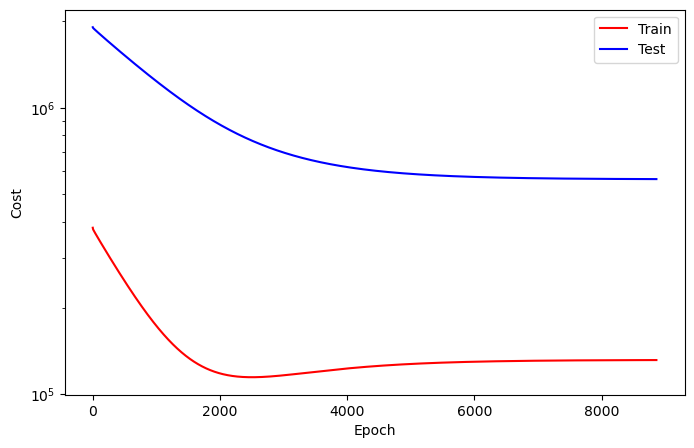

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8861
Train_cost  = 131720.9136 | Test_cost  = 563098.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8862
Train_cost  = 131721.0756 | Test_cost  = 563097.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8863
Train_cost  = 131721.2238 | Test_cost  = 563096.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8864
Train_cost  = 131721.4012 | Test_cost  = 563095.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8865
Train_cost  = 131721.5741 | Test_cost  = 563094.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8866
Train_cost  = 131721.7230 | Test_cost  = 563093.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8867
Train_cost  = 131721.8943 | Test_cost  = 563092.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8868
Train_cost  = 131722.0556 | Test_cost  = 563091.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8869
Train_cost  = 131722.2022 | Test_cost  = 563090.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8870
Train_cost  = 131722.4120 | Test_cost  = 563090.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8871
Train_cost  = 131722.5525 | Test_cost  = 563089.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8872
Train_cost  = 131722.7060 | Test_cost  = 563088.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8873
Train_cost  = 131722.8804 | Test_cost  = 563087.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8874
Train_cost  = 131723.0262 | Test_cost  = 563086.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8875
Train_cost  = 131723.2106 | Test_cost  = 563085.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8876
Train_cost  = 131723.3719 | Test_cost  = 563084.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8877
Train_cost  = 131723.5262 | Test_cost  = 563083.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8878
Train_cost  = 131723.7130 | Test_cost  = 563082.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8879
Train_cost  = 131723.8542 | Test_cost  = 563081.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8880
Train_cost  = 131724.0239 | Test_cost  = 563080.8250 | 


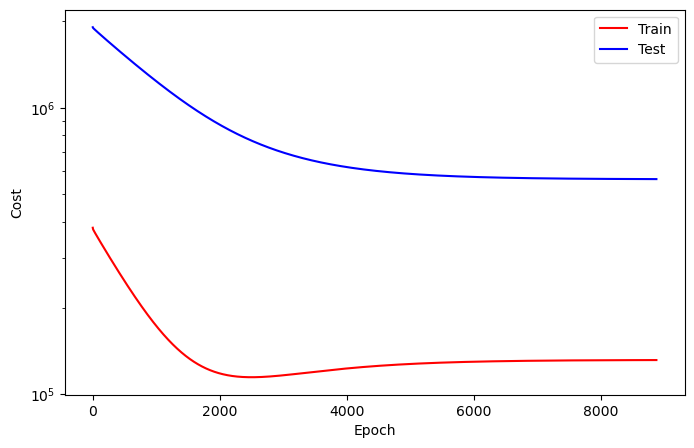

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8881
Train_cost  = 131724.2045 | Test_cost  = 563080.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8882
Train_cost  = 131724.3310 | Test_cost  = 563079.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8883
Train_cost  = 131724.5293 | Test_cost  = 563078.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8884
Train_cost  = 131724.6559 | Test_cost  = 563077.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8885
Train_cost  = 131724.8372 | Test_cost  = 563076.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8886
Train_cost  = 131725.0262 | Test_cost  = 563075.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8887
Train_cost  = 131725.1674 | Test_cost  = 563074.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8888
Train_cost  = 131725.3403 | Test_cost  = 563073.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8889
Train_cost  = 131725.5039 | Test_cost  = 563072.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8890
Train_cost  = 131725.6512 | Test_cost  = 563071.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8891
Train_cost  = 131725.8179 | Test_cost  = 563071.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8892
Train_cost  = 131725.9985 | Test_cost  = 563070.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8893
Train_cost  = 131726.1481 | Test_cost  = 563069.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8894
Train_cost  = 131726.3140 | Test_cost  = 563068.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8895
Train_cost  = 131726.4738 | Test_cost  = 563067.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8896
Train_cost  = 131726.6474 | Test_cost  = 563066.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8897
Train_cost  = 131726.8164 | Test_cost  = 563065.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8898
Train_cost  = 131726.9568 | Test_cost  = 563064.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8899
Train_cost  = 131727.1312 | Test_cost  = 563063.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8900
Train_cost  = 131727.3025 | Test_cost  = 563062.9750 | 


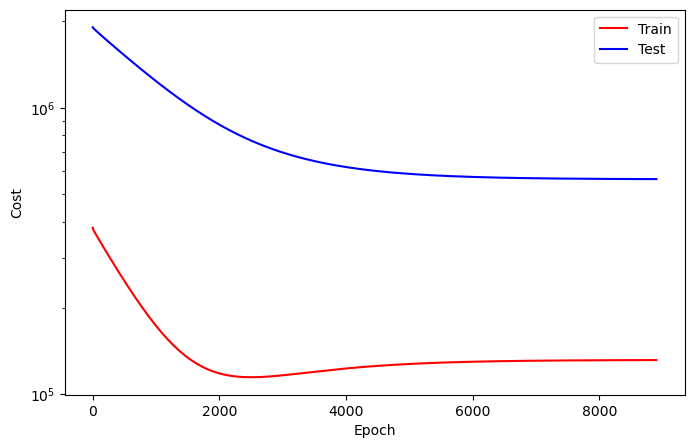

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8901
Train_cost  = 131727.4514 | Test_cost  = 563062.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8902
Train_cost  = 131727.6366 | Test_cost  = 563061.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8903
Train_cost  = 131727.7724 | Test_cost  = 563060.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8904
Train_cost  = 131727.9444 | Test_cost  = 563059.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8905
Train_cost  = 131728.1142 | Test_cost  = 563058.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8906
Train_cost  = 131728.2809 | Test_cost  = 563057.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8907
Train_cost  = 131728.4398 | Test_cost  = 563056.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8908
Train_cost  = 131728.6111 | Test_cost  = 563055.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8909
Train_cost  = 131728.7600 | Test_cost  = 563054.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8910
Train_cost  = 131728.9514 | Test_cost  = 563053.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8911
Train_cost  = 131729.0957 | Test_cost  = 563052.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8912
Train_cost  = 131729.2623 | Test_cost  = 563052.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8913
Train_cost  = 131729.4090 | Test_cost  = 563051.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8914
Train_cost  = 131729.5802 | Test_cost  = 563050.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8915
Train_cost  = 131729.7577 | Test_cost  = 563049.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8916
Train_cost  = 131729.8981 | Test_cost  = 563048.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8917
Train_cost  = 131730.0424 | Test_cost  = 563047.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8918
Train_cost  = 131730.2022 | Test_cost  = 563047.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8919
Train_cost  = 131730.3256 | Test_cost  = 563046.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8920
Train_cost  = 131730.5170 | Test_cost  = 563045.5250 | 


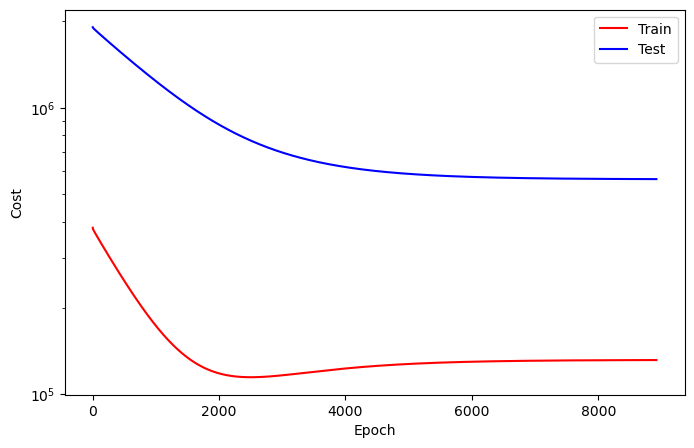

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8921
Train_cost  = 131730.6127 | Test_cost  = 563044.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8922
Train_cost  = 131730.7716 | Test_cost  = 563044.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8923
Train_cost  = 131730.8827 | Test_cost  = 563043.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8924
Train_cost  = 131731.0355 | Test_cost  = 563042.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8925
Train_cost  = 131731.1466 | Test_cost  = 563041.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8926
Train_cost  = 131731.3009 | Test_cost  = 563041.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8927
Train_cost  = 131731.4074 | Test_cost  = 563040.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8928
Train_cost  = 131731.5880 | Test_cost  = 563039.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8929
Train_cost  = 131731.6636 | Test_cost  = 563038.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8930
Train_cost  = 131731.8241 | Test_cost  = 563038.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8931
Train_cost  = 131731.9383 | Test_cost  = 563037.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8932
Train_cost  = 131732.0895 | Test_cost  = 563036.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8933
Train_cost  = 131732.2037 | Test_cost  = 563035.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8934
Train_cost  = 131732.3673 | Test_cost  = 563035.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8935
Train_cost  = 131732.4614 | Test_cost  = 563034.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8936
Train_cost  = 131732.6142 | Test_cost  = 563033.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8937
Train_cost  = 131732.7238 | Test_cost  = 563033.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8938
Train_cost  = 131732.8904 | Test_cost  = 563032.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8939
Train_cost  = 131732.9815 | Test_cost  = 563031.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8940
Train_cost  = 131733.1420 | Test_cost  = 563031.0250 | 


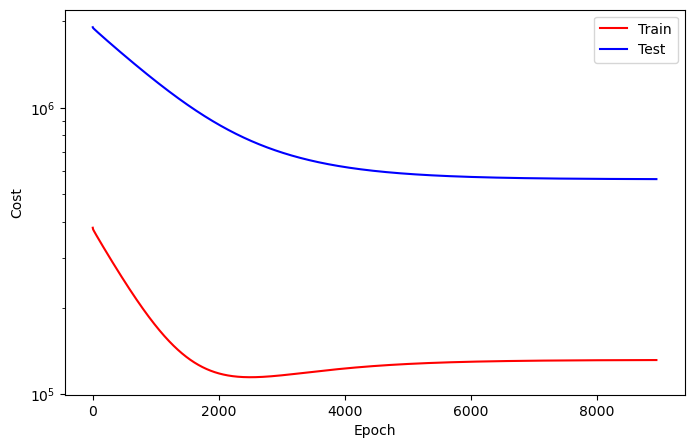

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8941
Train_cost  = 131733.2531 | Test_cost  = 563030.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8942
Train_cost  = 131733.3997 | Test_cost  = 563029.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8943
Train_cost  = 131733.5077 | Test_cost  = 563028.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8944
Train_cost  = 131733.6636 | Test_cost  = 563028.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8945
Train_cost  = 131733.7731 | Test_cost  = 563027.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8946
Train_cost  = 131733.9244 | Test_cost  = 563026.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8947
Train_cost  = 131734.0278 | Test_cost  = 563025.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8948
Train_cost  = 131734.1744 | Test_cost  = 563025.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8949
Train_cost  = 131734.3071 | Test_cost  = 563024.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8950
Train_cost  = 131734.4614 | Test_cost  = 563023.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8951
Train_cost  = 131734.5525 | Test_cost  = 563022.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8952
Train_cost  = 131734.7022 | Test_cost  = 563022.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8953
Train_cost  = 131734.8364 | Test_cost  = 563021.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8954
Train_cost  = 131734.9892 | Test_cost  = 563020.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8955
Train_cost  = 131735.0833 | Test_cost  = 563020.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8956
Train_cost  = 131735.2438 | Test_cost  = 563019.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8957
Train_cost  = 131735.3611 | Test_cost  = 563018.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8958
Train_cost  = 131735.4907 | Test_cost  = 563018.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8959
Train_cost  = 131735.5988 | Test_cost  = 563017.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8960
Train_cost  = 131735.7809 | Test_cost  = 563016.5000 | 


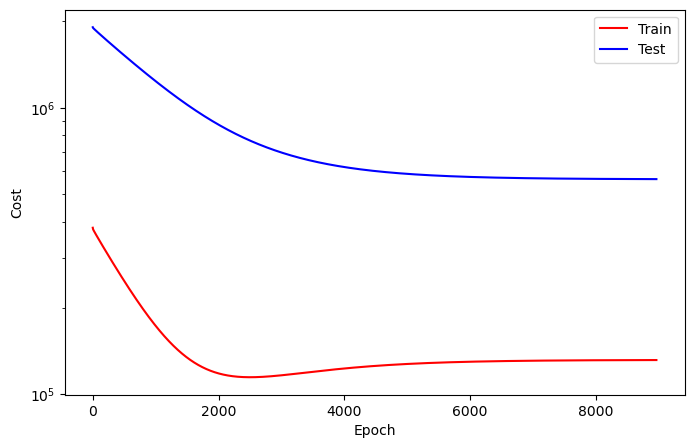

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8961
Train_cost  = 131735.8843 | Test_cost  = 563015.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8962
Train_cost  = 131736.0340 | Test_cost  = 563015.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8963
Train_cost  = 131736.1451 | Test_cost  = 563014.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8964
Train_cost  = 131736.2840 | Test_cost  = 563013.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8965
Train_cost  = 131736.3951 | Test_cost  = 563012.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8966
Train_cost  = 131736.5540 | Test_cost  = 563012.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8967
Train_cost  = 131736.6667 | Test_cost  = 563011.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8968
Train_cost  = 131736.8040 | Test_cost  = 563010.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8969
Train_cost  = 131736.9198 | Test_cost  = 563009.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8970
Train_cost  = 131737.0772 | Test_cost  = 563009.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8971
Train_cost  = 131737.1759 | Test_cost  = 563008.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8972
Train_cost  = 131737.3549 | Test_cost  = 563007.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8973
Train_cost  = 131737.4645 | Test_cost  = 563007.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8974
Train_cost  = 131737.6019 | Test_cost  = 563006.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8975
Train_cost  = 131737.7083 | Test_cost  = 563005.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8976
Train_cost  = 131737.8657 | Test_cost  = 563004.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8977
Train_cost  = 131737.9707 | Test_cost  = 563004.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8978
Train_cost  = 131738.1435 | Test_cost  = 563003.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8979
Train_cost  = 131738.2469 | Test_cost  = 563002.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8980
Train_cost  = 131738.3843 | Test_cost  = 563001.9250 | 


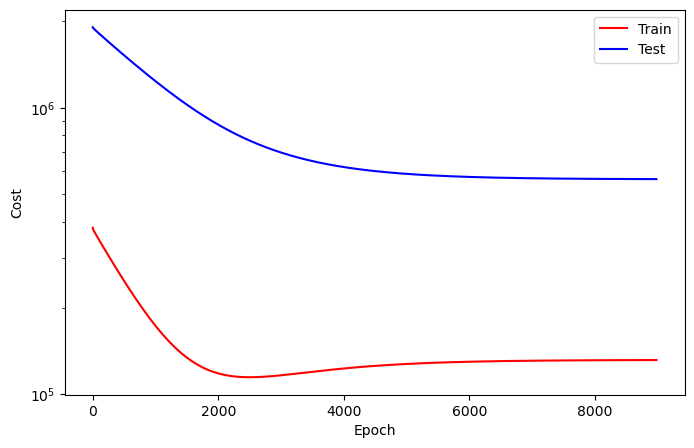

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8981
Train_cost  = 131738.5093 | Test_cost  = 563001.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8982
Train_cost  = 131738.6528 | Test_cost  = 563000.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8983
Train_cost  = 131738.7577 | Test_cost  = 562999.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8984
Train_cost  = 131738.9275 | Test_cost  = 562999.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8985
Train_cost  = 131739.0262 | Test_cost  = 562998.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8986
Train_cost  = 131739.1713 | Test_cost  = 562997.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8987
Train_cost  = 131739.2901 | Test_cost  = 562996.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8988
Train_cost  = 131739.4552 | Test_cost  = 562996.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8989
Train_cost  = 131739.5571 | Test_cost  = 562995.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8990
Train_cost  = 131739.7176 | Test_cost  = 562994.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8991
Train_cost  = 131739.8164 | Test_cost  = 562993.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8992
Train_cost  = 131739.9938 | Test_cost  = 562993.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8993
Train_cost  = 131740.0664 | Test_cost  = 562992.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8994
Train_cost  = 131740.2423 | Test_cost  = 562992.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8995
Train_cost  = 131740.3364 | Test_cost  = 562991.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8996
Train_cost  = 131740.4475 | Test_cost  = 562990.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8997
Train_cost  = 131740.5772 | Test_cost  = 562990.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8998
Train_cost  = 131740.6775 | Test_cost  = 562989.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  8999
Train_cost  = 131740.7994 | Test_cost  = 562988.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9000
Train_cost  = 131740.9105 | Test_cost  = 562988.2000 | 


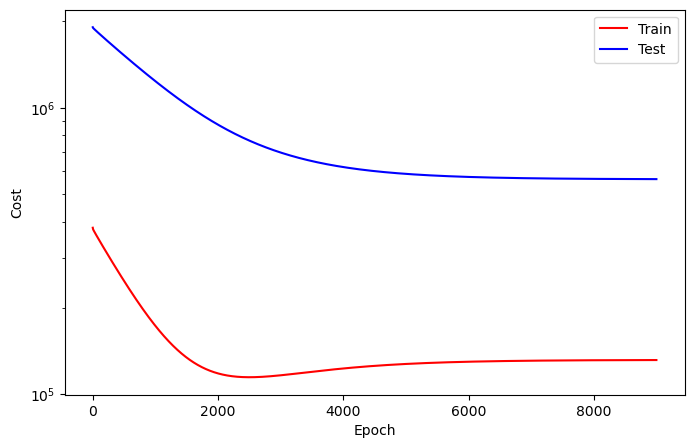

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9001
Train_cost  = 131741.0340 | Test_cost  = 562987.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9002
Train_cost  = 131741.1265 | Test_cost  = 562986.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9003
Train_cost  = 131741.2593 | Test_cost  = 562986.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9004
Train_cost  = 131741.3688 | Test_cost  = 562985.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9005
Train_cost  = 131741.4830 | Test_cost  = 562984.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9006
Train_cost  = 131741.5972 | Test_cost  = 562984.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9007
Train_cost  = 131741.7176 | Test_cost  = 562983.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9008
Train_cost  = 131741.8534 | Test_cost  = 562983.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9009
Train_cost  = 131741.9444 | Test_cost  = 562982.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9010
Train_cost  = 131742.0741 | Test_cost  = 562981.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9011
Train_cost  = 131742.1867 | Test_cost  = 562981.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9012
Train_cost  = 131742.2948 | Test_cost  = 562980.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9013
Train_cost  = 131742.4120 | Test_cost  = 562980.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9014
Train_cost  = 131742.5185 | Test_cost  = 562979.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9015
Train_cost  = 131742.6636 | Test_cost  = 562978.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9016
Train_cost  = 131742.7593 | Test_cost  = 562978.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9017
Train_cost  = 131742.8904 | Test_cost  = 562977.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9018
Train_cost  = 131742.9769 | Test_cost  = 562976.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9019
Train_cost  = 131743.1281 | Test_cost  = 562976.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9020
Train_cost  = 131743.2037 | Test_cost  = 562975.5500 | 


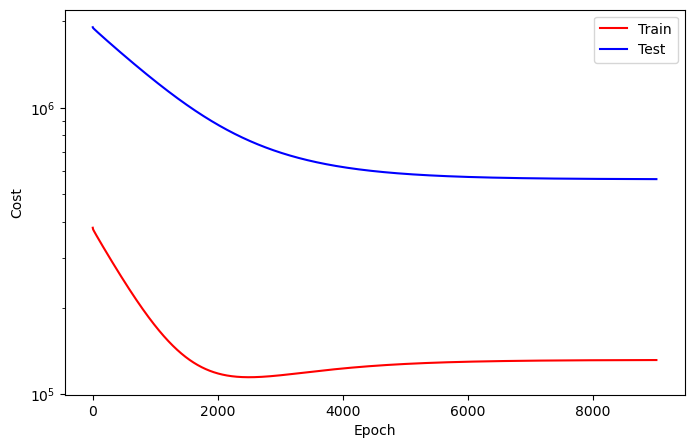

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9021
Train_cost  = 131743.3210 | Test_cost  = 562974.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9022
Train_cost  = 131743.4491 | Test_cost  = 562974.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9023
Train_cost  = 131743.5478 | Test_cost  = 562973.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9024
Train_cost  = 131743.7099 | Test_cost  = 562972.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9025
Train_cost  = 131743.7747 | Test_cost  = 562972.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9026
Train_cost  = 131743.9228 | Test_cost  = 562971.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9027
Train_cost  = 131744.0154 | Test_cost  = 562971.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9028
Train_cost  = 131744.1358 | Test_cost  = 562970.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9029
Train_cost  = 131744.2546 | Test_cost  = 562969.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9030
Train_cost  = 131744.3611 | Test_cost  = 562969.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9031
Train_cost  = 131744.4830 | Test_cost  = 562968.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9032
Train_cost  = 131744.5957 | Test_cost  = 562967.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9033
Train_cost  = 131744.7269 | Test_cost  = 562967.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9034
Train_cost  = 131744.8148 | Test_cost  = 562966.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9035
Train_cost  = 131744.9552 | Test_cost  = 562965.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9036
Train_cost  = 131745.0525 | Test_cost  = 562965.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9037
Train_cost  = 131745.1744 | Test_cost  = 562964.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9038
Train_cost  = 131745.2978 | Test_cost  = 562964.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9039
Train_cost  = 131745.3981 | Test_cost  = 562963.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9040
Train_cost  = 131745.5617 | Test_cost  = 562962.8250 | 


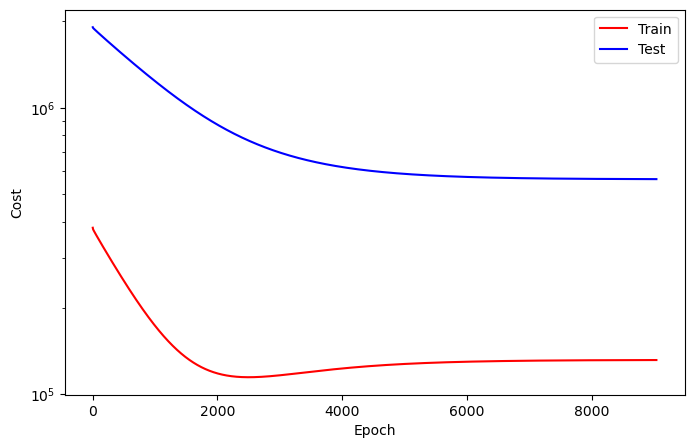

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9041
Train_cost  = 131745.6188 | Test_cost  = 562962.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9042
Train_cost  = 131745.7778 | Test_cost  = 562961.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9043
Train_cost  = 131745.8750 | Test_cost  = 562960.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9044
Train_cost  = 131745.9799 | Test_cost  = 562960.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9045
Train_cost  = 131746.0926 | Test_cost  = 562959.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9046
Train_cost  = 131746.1944 | Test_cost  = 562958.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9047
Train_cost  = 131746.3688 | Test_cost  = 562958.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9048
Train_cost  = 131746.4414 | Test_cost  = 562957.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9049
Train_cost  = 131746.5756 | Test_cost  = 562957.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9050
Train_cost  = 131746.6620 | Test_cost  = 562956.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9051
Train_cost  = 131746.8133 | Test_cost  = 562955.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9052
Train_cost  = 131746.8920 | Test_cost  = 562955.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9053
Train_cost  = 131747.0046 | Test_cost  = 562954.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9054
Train_cost  = 131747.1296 | Test_cost  = 562953.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9055
Train_cost  = 131747.2330 | Test_cost  = 562953.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9056
Train_cost  = 131747.3997 | Test_cost  = 562952.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9057
Train_cost  = 131747.4691 | Test_cost  = 562951.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9058
Train_cost  = 131747.6127 | Test_cost  = 562951.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9059
Train_cost  = 131747.7145 | Test_cost  = 562950.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9060
Train_cost  = 131747.8272 | Test_cost  = 562950.0750 | 


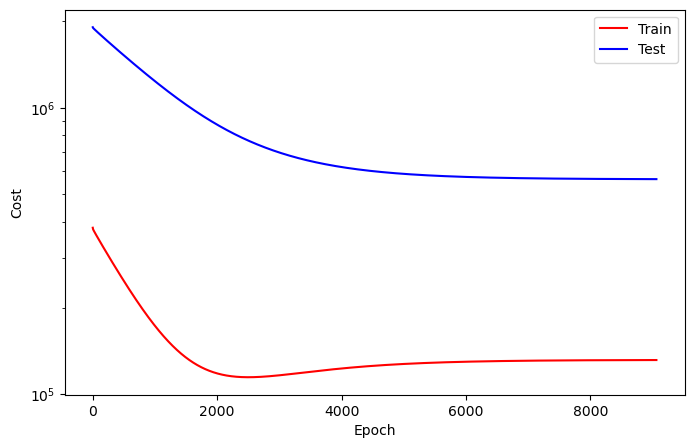

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9061
Train_cost  = 131747.9522 | Test_cost  = 562949.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9062
Train_cost  = 131748.0586 | Test_cost  = 562948.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9063
Train_cost  = 131748.1821 | Test_cost  = 562948.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9064
Train_cost  = 131748.2824 | Test_cost  = 562947.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9065
Train_cost  = 131748.4090 | Test_cost  = 562946.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9066
Train_cost  = 131748.5093 | Test_cost  = 562946.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9067
Train_cost  = 131748.6389 | Test_cost  = 562945.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9068
Train_cost  = 131748.7469 | Test_cost  = 562945.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9069
Train_cost  = 131748.8580 | Test_cost  = 562944.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9070
Train_cost  = 131748.9815 | Test_cost  = 562943.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9071
Train_cost  = 131749.0972 | Test_cost  = 562943.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9072
Train_cost  = 131749.2284 | Test_cost  = 562942.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9073
Train_cost  = 131749.3179 | Test_cost  = 562941.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9074
Train_cost  = 131749.4522 | Test_cost  = 562941.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9075
Train_cost  = 131749.5694 | Test_cost  = 562940.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9076
Train_cost  = 131749.6651 | Test_cost  = 562939.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9077
Train_cost  = 131749.7824 | Test_cost  = 562939.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9078
Train_cost  = 131749.8966 | Test_cost  = 562938.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9079
Train_cost  = 131750.0494 | Test_cost  = 562938.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9080
Train_cost  = 131750.1343 | Test_cost  = 562937.3250 | 


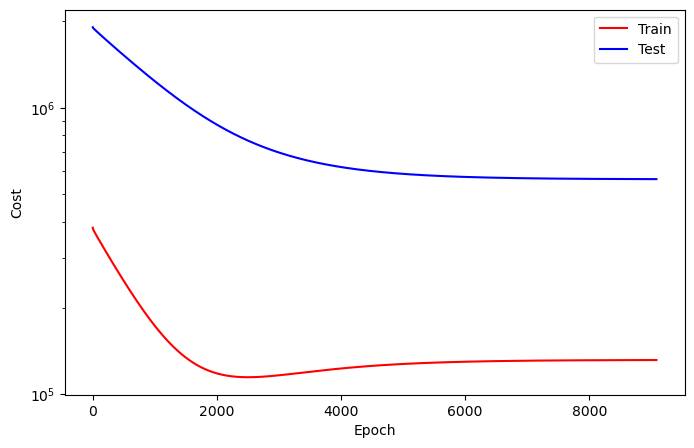

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9081
Train_cost  = 131750.2747 | Test_cost  = 562936.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9082
Train_cost  = 131750.3457 | Test_cost  = 562936.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9083
Train_cost  = 131750.5031 | Test_cost  = 562935.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9084
Train_cost  = 131750.5818 | Test_cost  = 562934.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9085
Train_cost  = 131750.6898 | Test_cost  = 562934.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9086
Train_cost  = 131750.8256 | Test_cost  = 562933.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9087
Train_cost  = 131750.9198 | Test_cost  = 562932.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9088
Train_cost  = 131751.0957 | Test_cost  = 562932.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9089
Train_cost  = 131751.1574 | Test_cost  = 562931.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9090
Train_cost  = 131751.2948 | Test_cost  = 562931.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9091
Train_cost  = 131751.4043 | Test_cost  = 562930.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9092
Train_cost  = 131751.5154 | Test_cost  = 562929.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9093
Train_cost  = 131751.6466 | Test_cost  = 562929.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9094
Train_cost  = 131751.7423 | Test_cost  = 562928.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9095
Train_cost  = 131751.8565 | Test_cost  = 562927.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9096
Train_cost  = 131751.9722 | Test_cost  = 562927.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9097
Train_cost  = 131752.1019 | Test_cost  = 562926.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9098
Train_cost  = 131752.1975 | Test_cost  = 562925.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9099
Train_cost  = 131752.3302 | Test_cost  = 562925.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9100
Train_cost  = 131752.4321 | Test_cost  = 562924.7000 | 


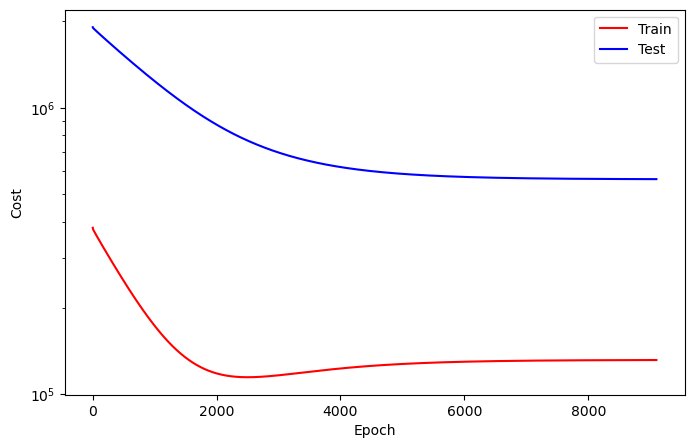

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9101
Train_cost  = 131752.5509 | Test_cost  = 562923.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9102
Train_cost  = 131752.6759 | Test_cost  = 562923.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9103
Train_cost  = 131752.7840 | Test_cost  = 562922.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9104
Train_cost  = 131752.9398 | Test_cost  = 562922.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9105
Train_cost  = 131753.0046 | Test_cost  = 562921.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9106
Train_cost  = 131753.1451 | Test_cost  = 562920.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9107
Train_cost  = 131753.2593 | Test_cost  = 562920.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9108
Train_cost  = 131753.3565 | Test_cost  = 562919.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9109
Train_cost  = 131753.4722 | Test_cost  = 562918.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9110
Train_cost  = 131753.5880 | Test_cost  = 562918.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9111
Train_cost  = 131753.7330 | Test_cost  = 562917.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9112
Train_cost  = 131753.8194 | Test_cost  = 562917.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9113
Train_cost  = 131753.9660 | Test_cost  = 562916.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9114
Train_cost  = 131754.0478 | Test_cost  = 562915.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9115
Train_cost  = 131754.1914 | Test_cost  = 562915.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9116
Train_cost  = 131754.2670 | Test_cost  = 562914.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9117
Train_cost  = 131754.3796 | Test_cost  = 562913.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9118
Train_cost  = 131754.5093 | Test_cost  = 562913.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9119
Train_cost  = 131754.6127 | Test_cost  = 562912.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9120
Train_cost  = 131754.7840 | Test_cost  = 562912.0000 | 


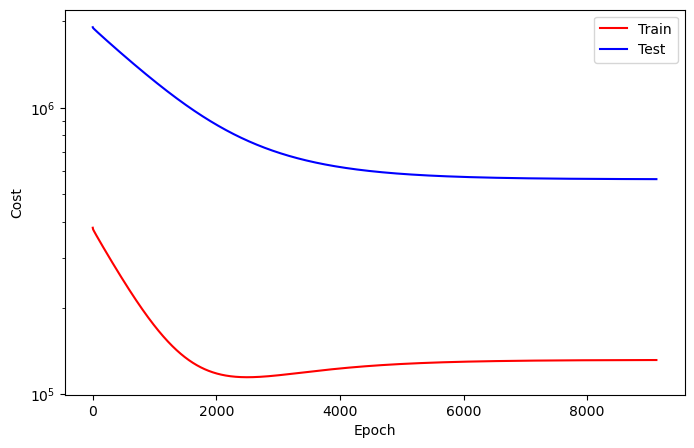

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9121
Train_cost  = 131754.8488 | Test_cost  = 562911.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9122
Train_cost  = 131754.9938 | Test_cost  = 562910.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9123
Train_cost  = 131755.0849 | Test_cost  = 562910.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9124
Train_cost  = 131755.2068 | Test_cost  = 562909.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9125
Train_cost  = 131755.3302 | Test_cost  = 562908.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9126
Train_cost  = 131755.4398 | Test_cost  = 562908.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9127
Train_cost  = 131755.5602 | Test_cost  = 562907.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9128
Train_cost  = 131755.6605 | Test_cost  = 562906.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9129
Train_cost  = 131755.7901 | Test_cost  = 562906.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9130
Train_cost  = 131755.8812 | Test_cost  = 562905.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9131
Train_cost  = 131756.0123 | Test_cost  = 562904.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9132
Train_cost  = 131756.1173 | Test_cost  = 562904.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9133
Train_cost  = 131756.2377 | Test_cost  = 562903.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9134
Train_cost  = 131756.3580 | Test_cost  = 562903.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9135
Train_cost  = 131756.4830 | Test_cost  = 562902.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9136
Train_cost  = 131756.6157 | Test_cost  = 562901.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9137
Train_cost  = 131756.6944 | Test_cost  = 562901.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9138
Train_cost  = 131756.8349 | Test_cost  = 562900.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9139
Train_cost  = 131756.9460 | Test_cost  = 562899.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9140
Train_cost  = 131757.0525 | Test_cost  = 562899.2000 | 


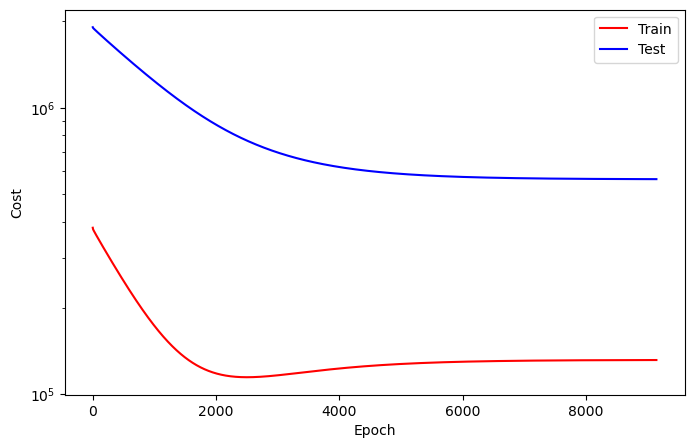

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9141
Train_cost  = 131757.1590 | Test_cost  = 562898.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9142
Train_cost  = 131757.2747 | Test_cost  = 562897.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9143
Train_cost  = 131757.4244 | Test_cost  = 562897.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9144
Train_cost  = 131757.5123 | Test_cost  = 562896.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9145
Train_cost  = 131757.6481 | Test_cost  = 562896.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9146
Train_cost  = 131757.7315 | Test_cost  = 562895.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9147
Train_cost  = 131757.8796 | Test_cost  = 562894.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9148
Train_cost  = 131757.9676 | Test_cost  = 562894.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9149
Train_cost  = 131758.0756 | Test_cost  = 562893.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9150
Train_cost  = 131758.2006 | Test_cost  = 562892.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9151
Train_cost  = 131758.2994 | Test_cost  = 562892.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9152
Train_cost  = 131758.4537 | Test_cost  = 562891.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9153
Train_cost  = 131758.5201 | Test_cost  = 562891.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9154
Train_cost  = 131758.6265 | Test_cost  = 562890.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9155
Train_cost  = 131758.7238 | Test_cost  = 562890.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9156
Train_cost  = 131758.8148 | Test_cost  = 562889.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9157
Train_cost  = 131758.9367 | Test_cost  = 562889.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9158
Train_cost  = 131759.0185 | Test_cost  = 562888.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9159
Train_cost  = 131759.1204 | Test_cost  = 562887.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9160
Train_cost  = 131759.2315 | Test_cost  = 562887.4000 | 


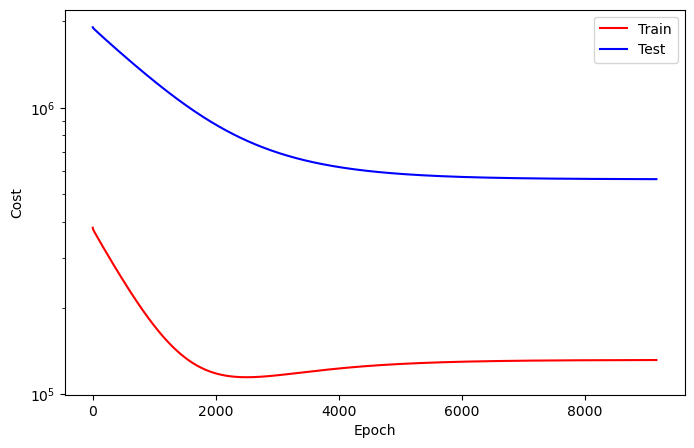

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9161
Train_cost  = 131759.3133 | Test_cost  = 562886.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9162
Train_cost  = 131759.4259 | Test_cost  = 562886.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9163
Train_cost  = 131759.5185 | Test_cost  = 562885.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9164
Train_cost  = 131759.6096 | Test_cost  = 562885.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9165
Train_cost  = 131759.7022 | Test_cost  = 562884.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9166
Train_cost  = 131759.8102 | Test_cost  = 562884.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9167
Train_cost  = 131759.8966 | Test_cost  = 562883.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9168
Train_cost  = 131760.0231 | Test_cost  = 562883.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9169
Train_cost  = 131760.0833 | Test_cost  = 562882.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9170
Train_cost  = 131760.1944 | Test_cost  = 562882.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9171
Train_cost  = 131760.3225 | Test_cost  = 562881.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9172
Train_cost  = 131760.3966 | Test_cost  = 562880.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9173
Train_cost  = 131760.5015 | Test_cost  = 562880.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9174
Train_cost  = 131760.5741 | Test_cost  = 562879.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9175
Train_cost  = 131760.6590 | Test_cost  = 562879.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9176
Train_cost  = 131760.8056 | Test_cost  = 562878.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9177
Train_cost  = 131760.8904 | Test_cost  = 562878.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9178
Train_cost  = 131760.9645 | Test_cost  = 562877.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9179
Train_cost  = 131761.0802 | Test_cost  = 562877.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9180
Train_cost  = 131761.1574 | Test_cost  = 562876.5000 | 


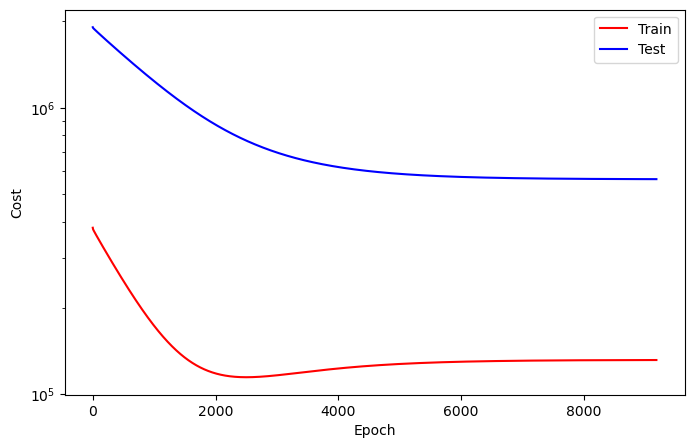

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9181
Train_cost  = 131761.2778 | Test_cost  = 562876.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9182
Train_cost  = 131761.3827 | Test_cost  = 562875.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9183
Train_cost  = 131761.4522 | Test_cost  = 562874.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9184
Train_cost  = 131761.6049 | Test_cost  = 562874.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9185
Train_cost  = 131761.6481 | Test_cost  = 562873.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9186
Train_cost  = 131761.7654 | Test_cost  = 562873.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9187
Train_cost  = 131761.8642 | Test_cost  = 562872.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9188
Train_cost  = 131761.9475 | Test_cost  = 562872.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9189
Train_cost  = 131762.0802 | Test_cost  = 562871.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9190
Train_cost  = 131762.1404 | Test_cost  = 562871.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9191
Train_cost  = 131762.2701 | Test_cost  = 562870.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9192
Train_cost  = 131762.3750 | Test_cost  = 562870.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9193
Train_cost  = 131762.4599 | Test_cost  = 562869.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9194
Train_cost  = 131762.5417 | Test_cost  = 562869.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9195
Train_cost  = 131762.6512 | Test_cost  = 562868.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9196
Train_cost  = 131762.7238 | Test_cost  = 562867.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9197
Train_cost  = 131762.8565 | Test_cost  = 562867.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9198
Train_cost  = 131762.9537 | Test_cost  = 562866.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9199
Train_cost  = 131763.0448 | Test_cost  = 562866.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9200
Train_cost  = 131763.1559 | Test_cost  = 562865.9250 | 


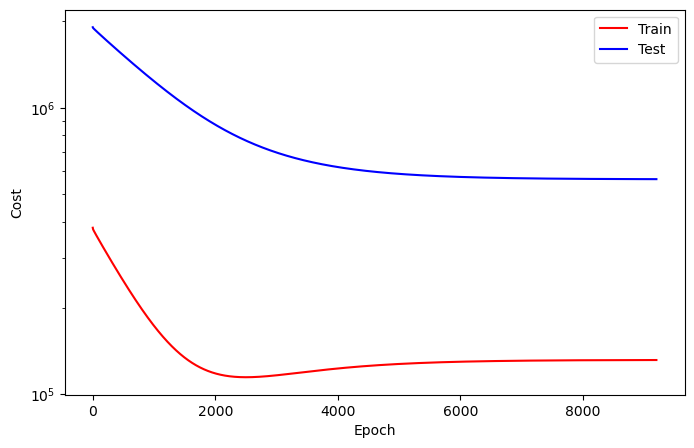

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9201
Train_cost  = 131763.2176 | Test_cost  = 562865.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9202
Train_cost  = 131763.3272 | Test_cost  = 562864.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9203
Train_cost  = 131763.4522 | Test_cost  = 562864.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9204
Train_cost  = 131763.5108 | Test_cost  = 562863.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9205
Train_cost  = 131763.6420 | Test_cost  = 562863.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9206
Train_cost  = 131763.7269 | Test_cost  = 562862.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9207
Train_cost  = 131763.8164 | Test_cost  = 562862.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9208
Train_cost  = 131763.9475 | Test_cost  = 562861.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9209
Train_cost  = 131764.0324 | Test_cost  = 562861.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9210
Train_cost  = 131764.0988 | Test_cost  = 562860.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9211
Train_cost  = 131764.2284 | Test_cost  = 562860.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9212
Train_cost  = 131764.2948 | Test_cost  = 562859.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9213
Train_cost  = 131764.4105 | Test_cost  = 562858.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9214
Train_cost  = 131764.5154 | Test_cost  = 562858.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9215
Train_cost  = 131764.6034 | Test_cost  = 562857.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9216
Train_cost  = 131764.7330 | Test_cost  = 562857.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9217
Train_cost  = 131764.7886 | Test_cost  = 562856.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9218
Train_cost  = 131764.8920 | Test_cost  = 562856.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9219
Train_cost  = 131765.0139 | Test_cost  = 562855.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9220
Train_cost  = 131765.0926 | Test_cost  = 562855.1000 | 


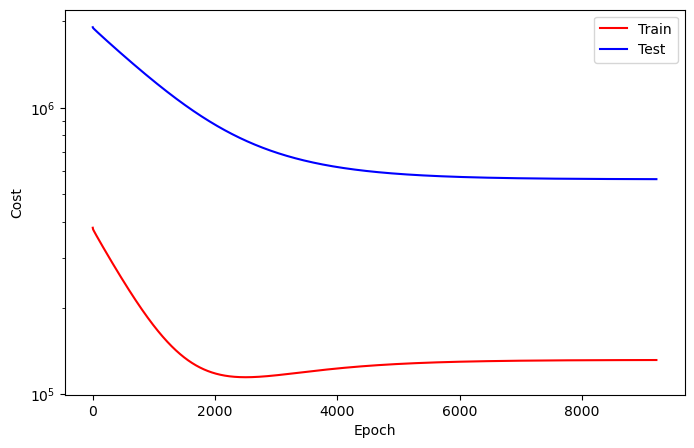

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9221
Train_cost  = 131765.2006 | Test_cost  = 562854.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9222
Train_cost  = 131765.2886 | Test_cost  = 562854.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9223
Train_cost  = 131765.3858 | Test_cost  = 562853.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9224
Train_cost  = 131765.4954 | Test_cost  = 562852.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9225
Train_cost  = 131765.5972 | Test_cost  = 562852.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9226
Train_cost  = 131765.6744 | Test_cost  = 562851.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9227
Train_cost  = 131765.7932 | Test_cost  = 562851.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9228
Train_cost  = 131765.8580 | Test_cost  = 562850.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9229
Train_cost  = 131765.9738 | Test_cost  = 562850.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9230
Train_cost  = 131766.0664 | Test_cost  = 562849.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9231
Train_cost  = 131766.1775 | Test_cost  = 562849.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9232
Train_cost  = 131766.2793 | Test_cost  = 562848.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9233
Train_cost  = 131766.3519 | Test_cost  = 562848.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9234
Train_cost  = 131766.4552 | Test_cost  = 562847.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9235
Train_cost  = 131766.5772 | Test_cost  = 562846.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9236
Train_cost  = 131766.6636 | Test_cost  = 562846.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9237
Train_cost  = 131766.7731 | Test_cost  = 562845.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9238
Train_cost  = 131766.8488 | Test_cost  = 562845.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9239
Train_cost  = 131766.9306 | Test_cost  = 562844.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9240
Train_cost  = 131767.0556 | Test_cost  = 562844.3500 | 


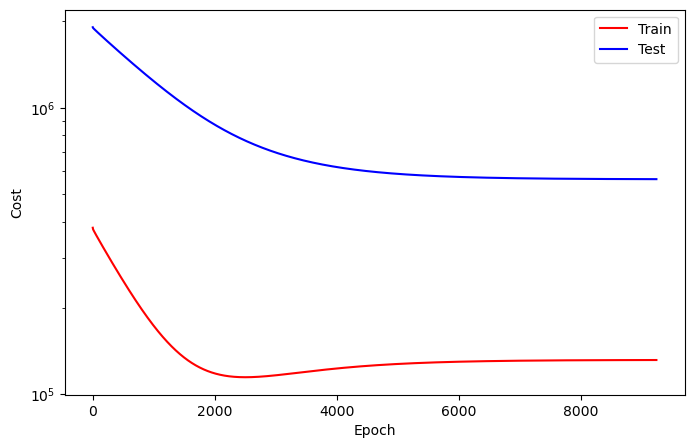

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9241
Train_cost  = 131767.1497 | Test_cost  = 562843.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9242
Train_cost  = 131767.2531 | Test_cost  = 562843.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9243
Train_cost  = 131767.3395 | Test_cost  = 562842.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9244
Train_cost  = 131767.4228 | Test_cost  = 562842.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9245
Train_cost  = 131767.5216 | Test_cost  = 562841.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9246
Train_cost  = 131767.6080 | Test_cost  = 562841.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9247
Train_cost  = 131767.7407 | Test_cost  = 562840.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9248
Train_cost  = 131767.8657 | Test_cost  = 562840.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9249
Train_cost  = 131767.9228 | Test_cost  = 562839.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9250
Train_cost  = 131768.0185 | Test_cost  = 562838.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9251
Train_cost  = 131768.1296 | Test_cost  = 562838.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9252
Train_cost  = 131768.1975 | Test_cost  = 562837.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9253
Train_cost  = 131768.3133 | Test_cost  = 562837.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9254
Train_cost  = 131768.4090 | Test_cost  = 562836.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9255
Train_cost  = 131768.5154 | Test_cost  = 562836.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9256
Train_cost  = 131768.6296 | Test_cost  = 562835.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9257
Train_cost  = 131768.7191 | Test_cost  = 562835.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9258
Train_cost  = 131768.7855 | Test_cost  = 562834.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9259
Train_cost  = 131768.9105 | Test_cost  = 562834.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9260
Train_cost  = 131768.9938 | Test_cost  = 562833.5000 | 


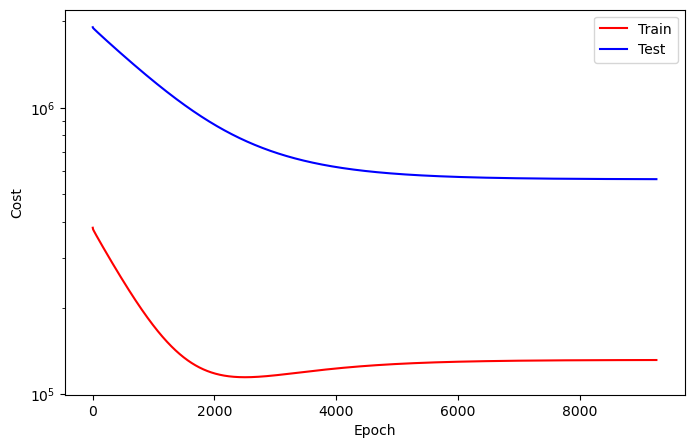

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9261
Train_cost  = 131769.1019 | Test_cost  = 562833.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9262
Train_cost  = 131769.2068 | Test_cost  = 562832.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9263
Train_cost  = 131769.2855 | Test_cost  = 562831.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9264
Train_cost  = 131769.4167 | Test_cost  = 562831.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9265
Train_cost  = 131769.4676 | Test_cost  = 562830.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9266
Train_cost  = 131769.5833 | Test_cost  = 562830.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9267
Train_cost  = 131769.7099 | Test_cost  = 562829.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9268
Train_cost  = 131769.7577 | Test_cost  = 562829.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9269
Train_cost  = 131769.8781 | Test_cost  = 562828.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9270
Train_cost  = 131769.9784 | Test_cost  = 562828.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9271
Train_cost  = 131770.0633 | Test_cost  = 562827.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9272
Train_cost  = 131770.2037 | Test_cost  = 562827.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9273
Train_cost  = 131770.2747 | Test_cost  = 562826.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9274
Train_cost  = 131770.3472 | Test_cost  = 562825.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9275
Train_cost  = 131770.4676 | Test_cost  = 562825.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9276
Train_cost  = 131770.5401 | Test_cost  = 562824.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9277
Train_cost  = 131770.6728 | Test_cost  = 562824.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9278
Train_cost  = 131770.7654 | Test_cost  = 562823.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9279
Train_cost  = 131770.8534 | Test_cost  = 562823.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9280
Train_cost  = 131770.9861 | Test_cost  = 562822.8250 | 


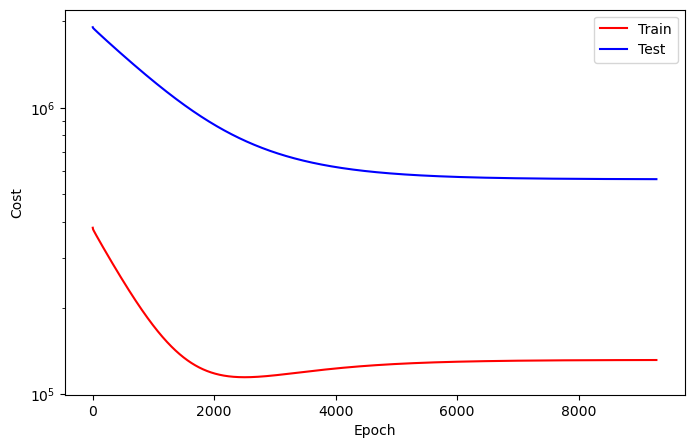

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9281
Train_cost  = 131771.0509 | Test_cost  = 562822.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9282
Train_cost  = 131771.1312 | Test_cost  = 562821.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9283
Train_cost  = 131771.2577 | Test_cost  = 562821.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9284
Train_cost  = 131771.3503 | Test_cost  = 562820.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9285
Train_cost  = 131771.4444 | Test_cost  = 562820.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9286
Train_cost  = 131771.5247 | Test_cost  = 562819.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9287
Train_cost  = 131771.6296 | Test_cost  = 562819.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9288
Train_cost  = 131771.7469 | Test_cost  = 562818.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9289
Train_cost  = 131771.8410 | Test_cost  = 562818.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9290
Train_cost  = 131771.9198 | Test_cost  = 562817.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9291
Train_cost  = 131772.0401 | Test_cost  = 562817.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9292
Train_cost  = 131772.1142 | Test_cost  = 562816.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9293
Train_cost  = 131772.2207 | Test_cost  = 562815.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9294
Train_cost  = 131772.3071 | Test_cost  = 562815.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9295
Train_cost  = 131772.3966 | Test_cost  = 562814.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9296
Train_cost  = 131772.5262 | Test_cost  = 562814.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9297
Train_cost  = 131772.5972 | Test_cost  = 562813.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9298
Train_cost  = 131772.7022 | Test_cost  = 562813.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9299
Train_cost  = 131772.7948 | Test_cost  = 562812.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9300
Train_cost  = 131772.8858 | Test_cost  = 562812.1000 | 


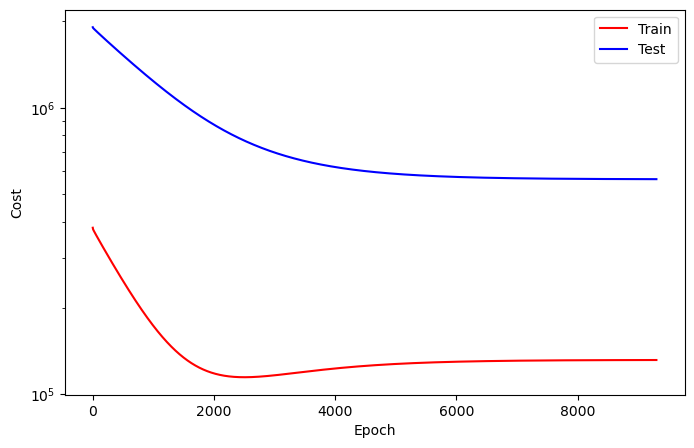

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9301
Train_cost  = 131773.0077 | Test_cost  = 562811.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9302
Train_cost  = 131773.0880 | Test_cost  = 562811.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9303
Train_cost  = 131773.1713 | Test_cost  = 562810.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9304
Train_cost  = 131773.3102 | Test_cost  = 562810.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9305
Train_cost  = 131773.3827 | Test_cost  = 562809.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9306
Train_cost  = 131773.4738 | Test_cost  = 562808.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9307
Train_cost  = 131773.5664 | Test_cost  = 562808.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9308
Train_cost  = 131773.6636 | Test_cost  = 562807.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9309
Train_cost  = 131773.7577 | Test_cost  = 562807.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9310
Train_cost  = 131773.8457 | Test_cost  = 562806.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9311
Train_cost  = 131773.9630 | Test_cost  = 562806.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9312
Train_cost  = 131774.0818 | Test_cost  = 562805.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9313
Train_cost  = 131774.1466 | Test_cost  = 562805.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9314
Train_cost  = 131774.2515 | Test_cost  = 562804.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9315
Train_cost  = 131774.3380 | Test_cost  = 562804.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9316
Train_cost  = 131774.4213 | Test_cost  = 562803.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9317
Train_cost  = 131774.5432 | Test_cost  = 562803.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9318
Train_cost  = 131774.6204 | Test_cost  = 562802.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9319
Train_cost  = 131774.7269 | Test_cost  = 562801.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9320
Train_cost  = 131774.8642 | Test_cost  = 562801.4750 | 


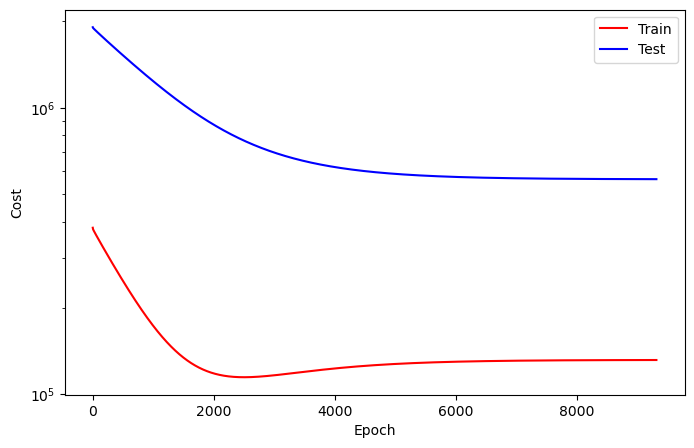

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9321
Train_cost  = 131774.9336 | Test_cost  = 562801.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9322
Train_cost  = 131774.9985 | Test_cost  = 562800.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9323
Train_cost  = 131775.1157 | Test_cost  = 562799.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9324
Train_cost  = 131775.1883 | Test_cost  = 562799.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9325
Train_cost  = 131775.3102 | Test_cost  = 562798.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9326
Train_cost  = 131775.4151 | Test_cost  = 562798.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9327
Train_cost  = 131775.4969 | Test_cost  = 562797.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9328
Train_cost  = 131775.6235 | Test_cost  = 562797.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9329
Train_cost  = 131775.6836 | Test_cost  = 562796.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9330
Train_cost  = 131775.7886 | Test_cost  = 562796.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9331
Train_cost  = 131775.9028 | Test_cost  = 562795.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9332
Train_cost  = 131775.9660 | Test_cost  = 562795.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9333
Train_cost  = 131776.0910 | Test_cost  = 562794.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9334
Train_cost  = 131776.1744 | Test_cost  = 562794.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9335
Train_cost  = 131776.2654 | Test_cost  = 562793.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9336
Train_cost  = 131776.4090 | Test_cost  = 562792.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9337
Train_cost  = 131776.4815 | Test_cost  = 562792.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9338
Train_cost  = 131776.5309 | Test_cost  = 562791.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9339
Train_cost  = 131776.6867 | Test_cost  = 562791.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9340
Train_cost  = 131776.7330 | Test_cost  = 562790.8750 | 


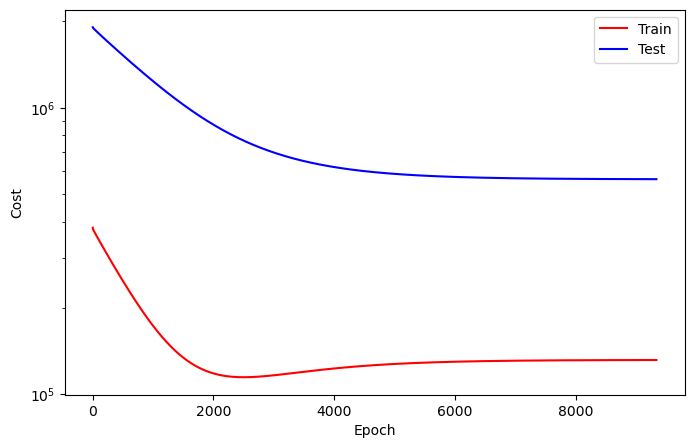

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9341
Train_cost  = 131776.8519 | Test_cost  = 562790.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9342
Train_cost  = 131776.9568 | Test_cost  = 562789.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9343
Train_cost  = 131777.0417 | Test_cost  = 562789.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9344
Train_cost  = 131777.1620 | Test_cost  = 562788.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9345
Train_cost  = 131777.2284 | Test_cost  = 562788.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9346
Train_cost  = 131777.3056 | Test_cost  = 562787.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9347
Train_cost  = 131777.4444 | Test_cost  = 562787.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9348
Train_cost  = 131777.5185 | Test_cost  = 562786.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9349
Train_cost  = 131777.6188 | Test_cost  = 562786.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9350
Train_cost  = 131777.7145 | Test_cost  = 562785.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9351
Train_cost  = 131777.8056 | Test_cost  = 562784.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9352
Train_cost  = 131777.9167 | Test_cost  = 562784.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9353
Train_cost  = 131778.0293 | Test_cost  = 562784.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9354
Train_cost  = 131778.0864 | Test_cost  = 562783.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9355
Train_cost  = 131778.2037 | Test_cost  = 562783.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9356
Train_cost  = 131778.2917 | Test_cost  = 562782.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9357
Train_cost  = 131778.4028 | Test_cost  = 562781.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9358
Train_cost  = 131778.4769 | Test_cost  = 562781.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9359
Train_cost  = 131778.5941 | Test_cost  = 562780.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9360
Train_cost  = 131778.6898 | Test_cost  = 562780.3250 | 


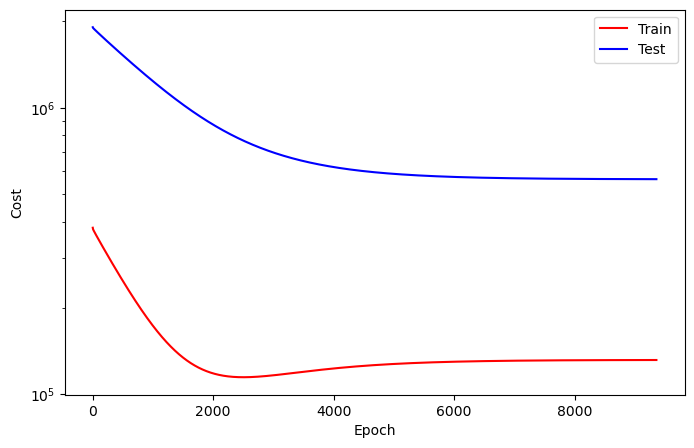

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9361
Train_cost  = 131778.7670 | Test_cost  = 562779.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9362
Train_cost  = 131778.8642 | Test_cost  = 562779.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9363
Train_cost  = 131778.9861 | Test_cost  = 562778.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9364
Train_cost  = 131779.0556 | Test_cost  = 562778.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9365
Train_cost  = 131779.1713 | Test_cost  = 562777.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9366
Train_cost  = 131779.2593 | Test_cost  = 562777.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9367
Train_cost  = 131779.3256 | Test_cost  = 562776.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9368
Train_cost  = 131779.4568 | Test_cost  = 562776.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9369
Train_cost  = 131779.5417 | Test_cost  = 562775.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9370
Train_cost  = 131779.6373 | Test_cost  = 562774.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9371
Train_cost  = 131779.7546 | Test_cost  = 562774.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9372
Train_cost  = 131779.8225 | Test_cost  = 562773.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9373
Train_cost  = 131779.9367 | Test_cost  = 562773.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9374
Train_cost  = 131780.0185 | Test_cost  = 562772.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9375
Train_cost  = 131780.1188 | Test_cost  = 562772.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9376
Train_cost  = 131780.2546 | Test_cost  = 562771.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9377
Train_cost  = 131780.2978 | Test_cost  = 562771.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9378
Train_cost  = 131780.4012 | Test_cost  = 562770.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9379
Train_cost  = 131780.5077 | Test_cost  = 562770.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9380
Train_cost  = 131780.5972 | Test_cost  = 562769.6250 | 


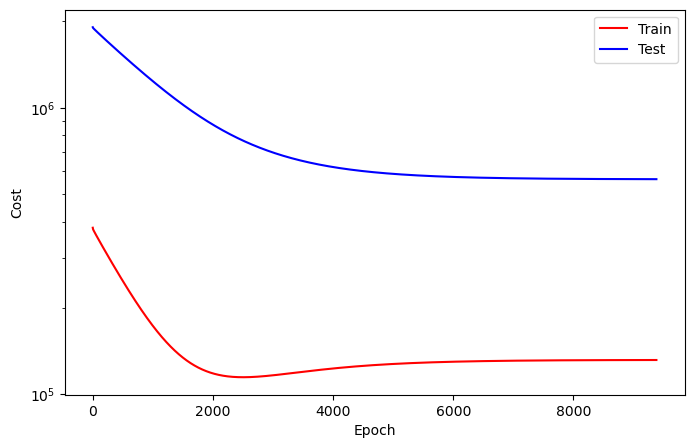

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9381
Train_cost  = 131780.6852 | Test_cost  = 562769.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9382
Train_cost  = 131780.7901 | Test_cost  = 562768.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9383
Train_cost  = 131780.9028 | Test_cost  = 562768.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9384
Train_cost  = 131781.0139 | Test_cost  = 562767.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9385
Train_cost  = 131781.0818 | Test_cost  = 562767.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9386
Train_cost  = 131781.1651 | Test_cost  = 562766.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9387
Train_cost  = 131781.2793 | Test_cost  = 562765.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9388
Train_cost  = 131781.3642 | Test_cost  = 562765.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9389
Train_cost  = 131781.4753 | Test_cost  = 562765.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9390
Train_cost  = 131781.5864 | Test_cost  = 562764.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9391
Train_cost  = 131781.6481 | Test_cost  = 562763.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9392
Train_cost  = 131781.7793 | Test_cost  = 562763.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9393
Train_cost  = 131781.8426 | Test_cost  = 562762.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9394
Train_cost  = 131781.9444 | Test_cost  = 562762.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9395
Train_cost  = 131782.0664 | Test_cost  = 562761.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9396
Train_cost  = 131782.1265 | Test_cost  = 562761.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9397
Train_cost  = 131782.2269 | Test_cost  = 562760.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9398
Train_cost  = 131782.3333 | Test_cost  = 562760.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9399
Train_cost  = 131782.4105 | Test_cost  = 562759.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9400
Train_cost  = 131782.5417 | Test_cost  = 562759.0000 | 


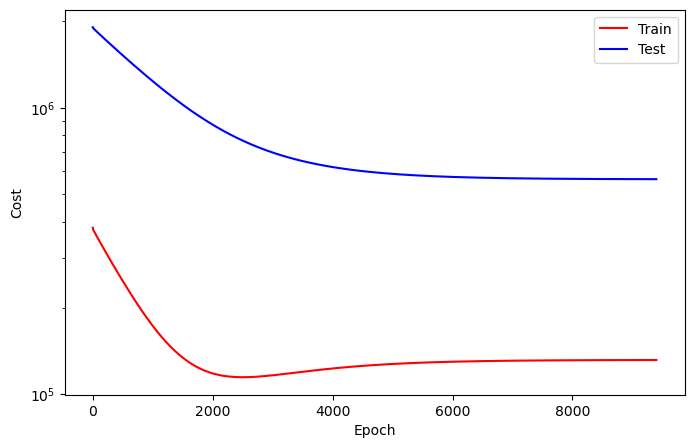

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9401
Train_cost  = 131782.6343 | Test_cost  = 562758.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9402
Train_cost  = 131782.7114 | Test_cost  = 562757.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9403
Train_cost  = 131782.8318 | Test_cost  = 562757.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9404
Train_cost  = 131782.8966 | Test_cost  = 562756.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9405
Train_cost  = 131782.9892 | Test_cost  = 562756.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9406
Train_cost  = 131783.0895 | Test_cost  = 562756.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9407
Train_cost  = 131783.1836 | Test_cost  = 562755.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9408
Train_cost  = 131783.3102 | Test_cost  = 562754.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9409
Train_cost  = 131783.3781 | Test_cost  = 562754.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9410
Train_cost  = 131783.4892 | Test_cost  = 562753.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9411
Train_cost  = 131783.5756 | Test_cost  = 562753.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9412
Train_cost  = 131783.6698 | Test_cost  = 562752.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9413
Train_cost  = 131783.7685 | Test_cost  = 562752.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9414
Train_cost  = 131783.8719 | Test_cost  = 562751.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9415
Train_cost  = 131783.9444 | Test_cost  = 562751.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9416
Train_cost  = 131784.0725 | Test_cost  = 562750.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9417
Train_cost  = 131784.1528 | Test_cost  = 562750.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9418
Train_cost  = 131784.2485 | Test_cost  = 562749.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9419
Train_cost  = 131784.3410 | Test_cost  = 562749.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9420
Train_cost  = 131784.4336 | Test_cost  = 562748.5250 | 


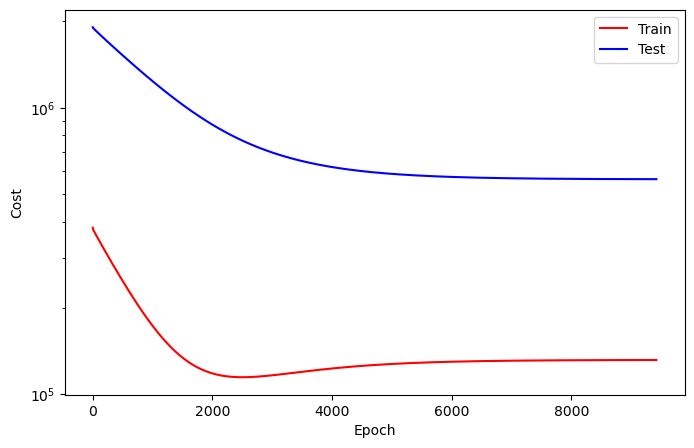

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9421
Train_cost  = 131784.5170 | Test_cost  = 562748.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9422
Train_cost  = 131784.6188 | Test_cost  = 562747.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9423
Train_cost  = 131784.7145 | Test_cost  = 562747.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9424
Train_cost  = 131784.8349 | Test_cost  = 562746.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9425
Train_cost  = 131784.8827 | Test_cost  = 562745.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9426
Train_cost  = 131785.0015 | Test_cost  = 562745.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9427
Train_cost  = 131785.1250 | Test_cost  = 562744.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9428
Train_cost  = 131785.1883 | Test_cost  = 562744.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9429
Train_cost  = 131785.2886 | Test_cost  = 562743.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9430
Train_cost  = 131785.3920 | Test_cost  = 562743.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9431
Train_cost  = 131785.4691 | Test_cost  = 562742.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9432
Train_cost  = 131785.5849 | Test_cost  = 562742.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9433
Train_cost  = 131785.6605 | Test_cost  = 562741.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9434
Train_cost  = 131785.7731 | Test_cost  = 562741.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9435
Train_cost  = 131785.8642 | Test_cost  = 562740.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9436
Train_cost  = 131785.9306 | Test_cost  = 562740.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9437
Train_cost  = 131786.0571 | Test_cost  = 562739.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9438
Train_cost  = 131786.1559 | Test_cost  = 562739.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9439
Train_cost  = 131786.2330 | Test_cost  = 562738.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9440
Train_cost  = 131786.3565 | Test_cost  = 562738.2000 | 


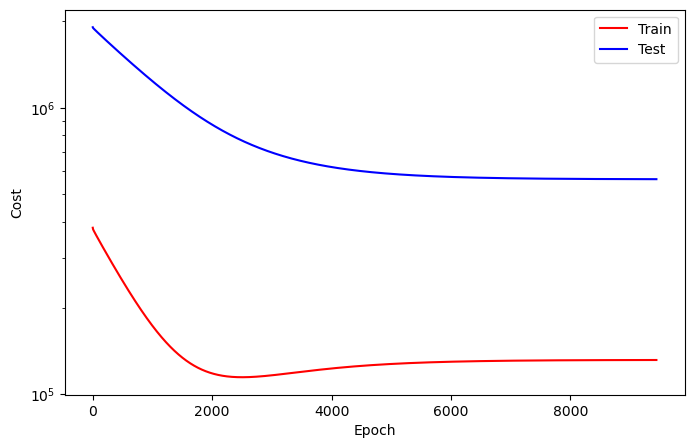

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9441
Train_cost  = 131786.4290 | Test_cost  = 562737.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9442
Train_cost  = 131786.5154 | Test_cost  = 562737.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9443
Train_cost  = 131786.6065 | Test_cost  = 562736.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9444
Train_cost  = 131786.6898 | Test_cost  = 562736.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9445
Train_cost  = 131786.8179 | Test_cost  = 562735.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9446
Train_cost  = 131786.8889 | Test_cost  = 562735.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9447
Train_cost  = 131787.0154 | Test_cost  = 562734.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9448
Train_cost  = 131787.1049 | Test_cost  = 562733.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9449
Train_cost  = 131787.1883 | Test_cost  = 562733.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9450
Train_cost  = 131787.2809 | Test_cost  = 562732.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9451
Train_cost  = 131787.3704 | Test_cost  = 562732.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9452
Train_cost  = 131787.4645 | Test_cost  = 562731.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9453
Train_cost  = 131787.5664 | Test_cost  = 562731.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9454
Train_cost  = 131787.6790 | Test_cost  = 562730.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9455
Train_cost  = 131787.7407 | Test_cost  = 562730.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9456
Train_cost  = 131787.8704 | Test_cost  = 562729.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9457
Train_cost  = 131787.9599 | Test_cost  = 562729.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9458
Train_cost  = 131788.0340 | Test_cost  = 562728.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9459
Train_cost  = 131788.1420 | Test_cost  = 562728.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9460
Train_cost  = 131788.2346 | Test_cost  = 562727.7750 | 


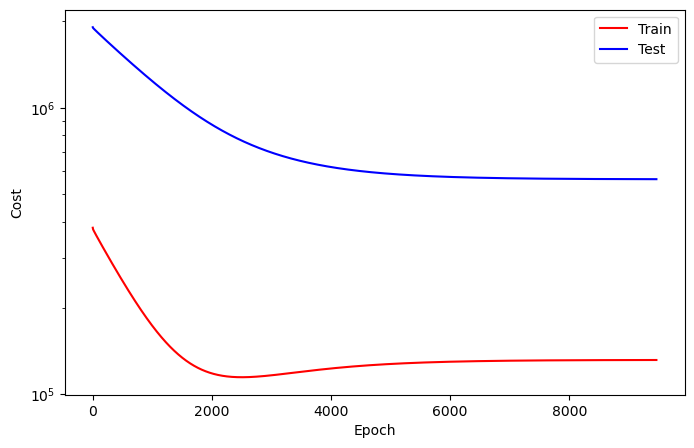

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9461
Train_cost  = 131788.3333 | Test_cost  = 562727.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9462
Train_cost  = 131788.4105 | Test_cost  = 562726.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9463
Train_cost  = 131788.5170 | Test_cost  = 562726.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9464
Train_cost  = 131788.6343 | Test_cost  = 562725.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9465
Train_cost  = 131788.7068 | Test_cost  = 562725.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9466
Train_cost  = 131788.7855 | Test_cost  = 562724.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9467
Train_cost  = 131788.9213 | Test_cost  = 562724.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9468
Train_cost  = 131788.9769 | Test_cost  = 562723.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9469
Train_cost  = 131789.0741 | Test_cost  = 562723.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9470
Train_cost  = 131789.1759 | Test_cost  = 562722.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9471
Train_cost  = 131789.2716 | Test_cost  = 562721.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9472
Train_cost  = 131789.4012 | Test_cost  = 562721.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9473
Train_cost  = 131789.4552 | Test_cost  = 562721.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9474
Train_cost  = 131789.5525 | Test_cost  = 562720.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9475
Train_cost  = 131789.6682 | Test_cost  = 562719.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9476
Train_cost  = 131789.7454 | Test_cost  = 562719.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9477
Train_cost  = 131789.8565 | Test_cost  = 562718.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9478
Train_cost  = 131789.9367 | Test_cost  = 562718.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9479
Train_cost  = 131790.0170 | Test_cost  = 562717.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9480
Train_cost  = 131790.1481 | Test_cost  = 562717.3500 | 


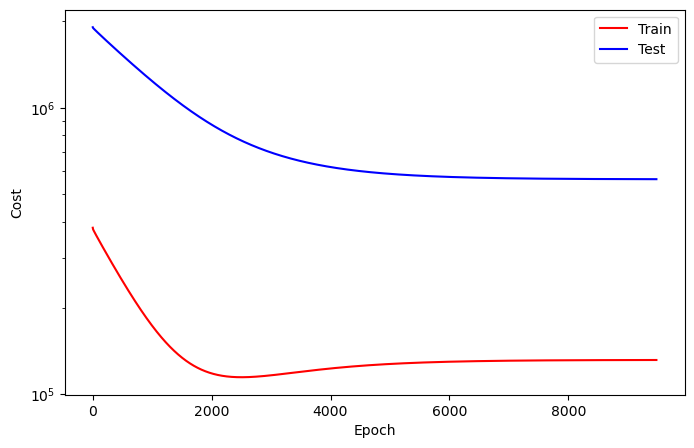

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9481
Train_cost  = 131790.2377 | Test_cost  = 562716.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9482
Train_cost  = 131790.3056 | Test_cost  = 562716.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9483
Train_cost  = 131790.4352 | Test_cost  = 562715.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9484
Train_cost  = 131790.4907 | Test_cost  = 562715.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9485
Train_cost  = 131790.5957 | Test_cost  = 562714.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9486
Train_cost  = 131790.6836 | Test_cost  = 562714.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9487
Train_cost  = 131790.7762 | Test_cost  = 562713.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9488
Train_cost  = 131790.9059 | Test_cost  = 562713.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9489
Train_cost  = 131790.9645 | Test_cost  = 562712.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9490
Train_cost  = 131791.0741 | Test_cost  = 562712.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9491
Train_cost  = 131791.1991 | Test_cost  = 562711.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9492
Train_cost  = 131791.2500 | Test_cost  = 562711.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9493
Train_cost  = 131791.3488 | Test_cost  = 562710.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9494
Train_cost  = 131791.4398 | Test_cost  = 562710.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9495
Train_cost  = 131791.5216 | Test_cost  = 562709.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9496
Train_cost  = 131791.6497 | Test_cost  = 562709.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9497
Train_cost  = 131791.7423 | Test_cost  = 562708.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9498
Train_cost  = 131791.8380 | Test_cost  = 562707.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9499
Train_cost  = 131791.9352 | Test_cost  = 562707.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9500
Train_cost  = 131792.0000 | Test_cost  = 562706.8500 | 


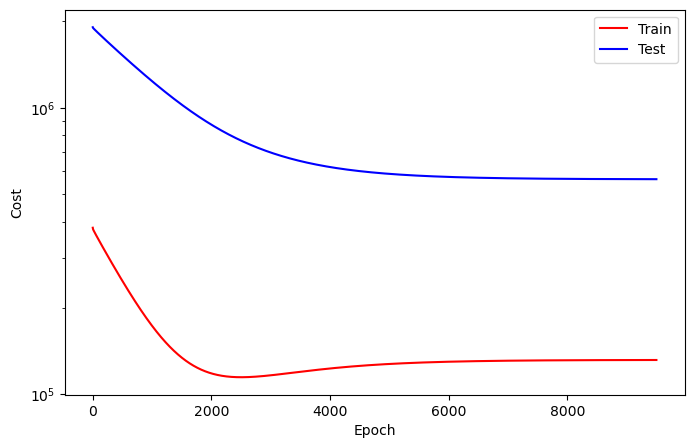

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9501
Train_cost  = 131792.1049 | Test_cost  = 562706.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9502
Train_cost  = 131792.2222 | Test_cost  = 562705.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9503
Train_cost  = 131792.2978 | Test_cost  = 562705.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9504
Train_cost  = 131792.4244 | Test_cost  = 562704.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9505
Train_cost  = 131792.4954 | Test_cost  = 562704.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9506
Train_cost  = 131792.5880 | Test_cost  = 562703.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9507
Train_cost  = 131792.6806 | Test_cost  = 562703.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9508
Train_cost  = 131792.7577 | Test_cost  = 562702.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9509
Train_cost  = 131792.8719 | Test_cost  = 562702.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9510
Train_cost  = 131792.9568 | Test_cost  = 562701.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9511
Train_cost  = 131793.0694 | Test_cost  = 562701.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9512
Train_cost  = 131793.1744 | Test_cost  = 562700.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9513
Train_cost  = 131793.2577 | Test_cost  = 562700.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9514
Train_cost  = 131793.3472 | Test_cost  = 562699.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9515
Train_cost  = 131793.4475 | Test_cost  = 562699.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9516
Train_cost  = 131793.5370 | Test_cost  = 562698.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9517
Train_cost  = 131793.6296 | Test_cost  = 562698.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9518
Train_cost  = 131793.7377 | Test_cost  = 562697.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9519
Train_cost  = 131793.8117 | Test_cost  = 562696.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9520
Train_cost  = 131793.9398 | Test_cost  = 562696.4250 | 


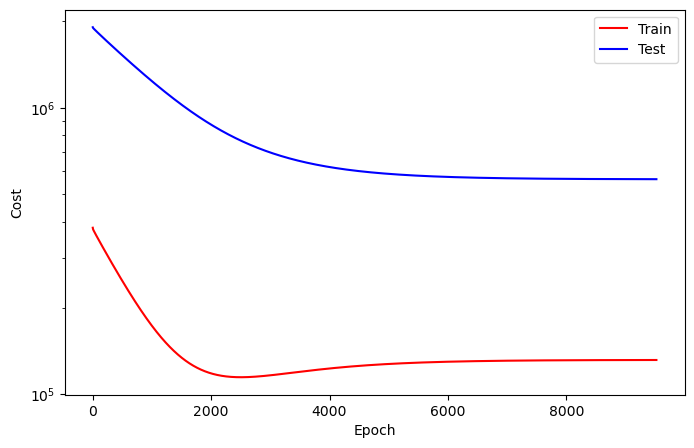

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9521
Train_cost  = 131794.0231 | Test_cost  = 562695.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9522
Train_cost  = 131794.1034 | Test_cost  = 562695.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9523
Train_cost  = 131794.2130 | Test_cost  = 562694.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9524
Train_cost  = 131794.2978 | Test_cost  = 562694.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9525
Train_cost  = 131794.4090 | Test_cost  = 562693.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9526
Train_cost  = 131794.4815 | Test_cost  = 562693.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9527
Train_cost  = 131794.5586 | Test_cost  = 562692.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9528
Train_cost  = 131794.6975 | Test_cost  = 562692.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9529
Train_cost  = 131794.7716 | Test_cost  = 562691.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9530
Train_cost  = 131794.8519 | Test_cost  = 562691.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9531
Train_cost  = 131794.9599 | Test_cost  = 562690.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9532
Train_cost  = 131795.0571 | Test_cost  = 562690.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9533
Train_cost  = 131795.1281 | Test_cost  = 562689.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9534
Train_cost  = 131795.2407 | Test_cost  = 562689.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9535
Train_cost  = 131795.2809 | Test_cost  = 562688.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9536
Train_cost  = 131795.3735 | Test_cost  = 562688.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9537
Train_cost  = 131795.4799 | Test_cost  = 562688.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9538
Train_cost  = 131795.5293 | Test_cost  = 562687.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9539
Train_cost  = 131795.6049 | Test_cost  = 562687.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9540
Train_cost  = 131795.6914 | Test_cost  = 562686.6750 | 


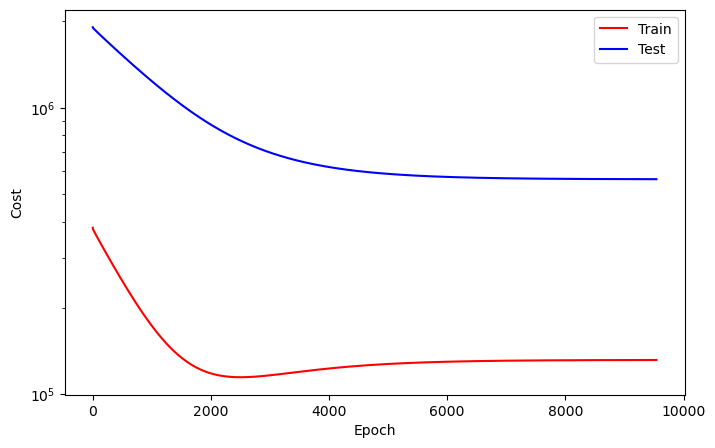

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9541
Train_cost  = 131795.7639 | Test_cost  = 562686.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9542
Train_cost  = 131795.8364 | Test_cost  = 562685.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9543
Train_cost  = 131795.9213 | Test_cost  = 562685.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9544
Train_cost  = 131796.0062 | Test_cost  = 562685.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9545
Train_cost  = 131796.0725 | Test_cost  = 562684.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9546
Train_cost  = 131796.1682 | Test_cost  = 562684.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9547
Train_cost  = 131796.2330 | Test_cost  = 562683.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9548
Train_cost  = 131796.2963 | Test_cost  = 562683.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9549
Train_cost  = 131796.4028 | Test_cost  = 562682.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9550
Train_cost  = 131796.4923 | Test_cost  = 562682.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9551
Train_cost  = 131796.5556 | Test_cost  = 562681.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9552
Train_cost  = 131796.6265 | Test_cost  = 562681.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9553
Train_cost  = 131796.7207 | Test_cost  = 562681.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9554
Train_cost  = 131796.7793 | Test_cost  = 562680.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9555
Train_cost  = 131796.8472 | Test_cost  = 562680.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9556
Train_cost  = 131796.9599 | Test_cost  = 562679.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9557
Train_cost  = 131797.0093 | Test_cost  = 562679.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9558
Train_cost  = 131797.1096 | Test_cost  = 562678.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9559
Train_cost  = 131797.2022 | Test_cost  = 562678.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9560
Train_cost  = 131797.2515 | Test_cost  = 562678.1250 | 


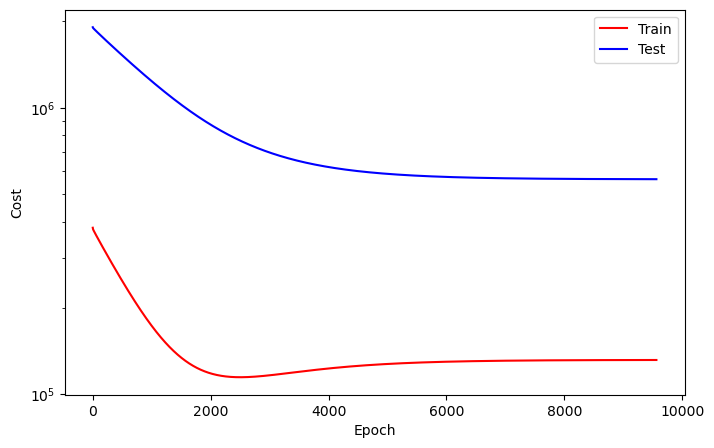

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9561
Train_cost  = 131797.3225 | Test_cost  = 562677.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9562
Train_cost  = 131797.4290 | Test_cost  = 562677.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9563
Train_cost  = 131797.4985 | Test_cost  = 562676.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9564
Train_cost  = 131797.5741 | Test_cost  = 562676.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9565
Train_cost  = 131797.6420 | Test_cost  = 562676.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9566
Train_cost  = 131797.7515 | Test_cost  = 562675.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9567
Train_cost  = 131797.8009 | Test_cost  = 562675.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9568
Train_cost  = 131797.8873 | Test_cost  = 562674.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9569
Train_cost  = 131797.9722 | Test_cost  = 562674.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9570
Train_cost  = 131798.0556 | Test_cost  = 562673.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9571
Train_cost  = 131798.1250 | Test_cost  = 562673.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9572
Train_cost  = 131798.1944 | Test_cost  = 562672.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9573
Train_cost  = 131798.2870 | Test_cost  = 562672.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9574
Train_cost  = 131798.3457 | Test_cost  = 562672.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9575
Train_cost  = 131798.4182 | Test_cost  = 562671.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9576
Train_cost  = 131798.5093 | Test_cost  = 562671.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9577
Train_cost  = 131798.5910 | Test_cost  = 562670.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9578
Train_cost  = 131798.6605 | Test_cost  = 562670.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9579
Train_cost  = 131798.7346 | Test_cost  = 562670.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9580
Train_cost  = 131798.8086 | Test_cost  = 562669.5500 | 


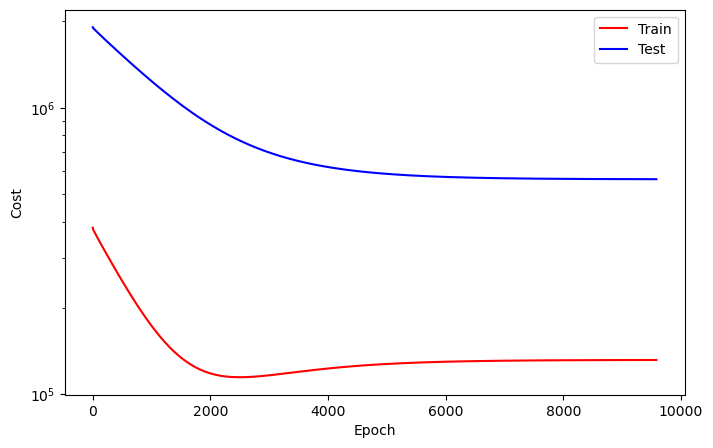

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9581
Train_cost  = 131798.9105 | Test_cost  = 562669.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9582
Train_cost  = 131798.9877 | Test_cost  = 562668.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9583
Train_cost  = 131799.0324 | Test_cost  = 562668.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9584
Train_cost  = 131799.1296 | Test_cost  = 562667.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9585
Train_cost  = 131799.2284 | Test_cost  = 562667.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9586
Train_cost  = 131799.2932 | Test_cost  = 562667.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9587
Train_cost  = 131799.3519 | Test_cost  = 562666.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9588
Train_cost  = 131799.4460 | Test_cost  = 562666.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9589
Train_cost  = 131799.5185 | Test_cost  = 562665.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9590
Train_cost  = 131799.6049 | Test_cost  = 562665.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9591
Train_cost  = 131799.6682 | Test_cost  = 562664.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9592
Train_cost  = 131799.7361 | Test_cost  = 562664.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9593
Train_cost  = 131799.8426 | Test_cost  = 562663.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9594
Train_cost  = 131799.9167 | Test_cost  = 562663.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9595
Train_cost  = 131799.9769 | Test_cost  = 562663.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9596
Train_cost  = 131800.0602 | Test_cost  = 562662.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9597
Train_cost  = 131800.1281 | Test_cost  = 562662.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9598
Train_cost  = 131800.2438 | Test_cost  = 562661.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9599
Train_cost  = 131800.2824 | Test_cost  = 562661.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9600
Train_cost  = 131800.3750 | Test_cost  = 562660.9500 | 


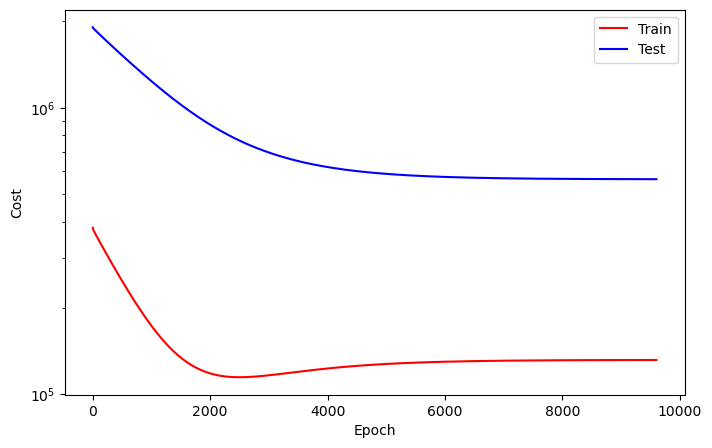

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9601
Train_cost  = 131800.4599 | Test_cost  = 562660.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9602
Train_cost  = 131800.5340 | Test_cost  = 562660.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9603
Train_cost  = 131800.6019 | Test_cost  = 562659.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9604
Train_cost  = 131800.6821 | Test_cost  = 562659.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9605
Train_cost  = 131800.7685 | Test_cost  = 562658.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9606
Train_cost  = 131800.8488 | Test_cost  = 562658.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9607
Train_cost  = 131800.9074 | Test_cost  = 562657.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9608
Train_cost  = 131800.9985 | Test_cost  = 562657.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9609
Train_cost  = 131801.0725 | Test_cost  = 562657.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9610
Train_cost  = 131801.1744 | Test_cost  = 562656.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9611
Train_cost  = 131801.2191 | Test_cost  = 562656.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9612
Train_cost  = 131801.2963 | Test_cost  = 562655.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9613
Train_cost  = 131801.3827 | Test_cost  = 562655.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9614
Train_cost  = 131801.4830 | Test_cost  = 562655.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9615
Train_cost  = 131801.5185 | Test_cost  = 562654.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9616
Train_cost  = 131801.6019 | Test_cost  = 562654.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9617
Train_cost  = 131801.6975 | Test_cost  = 562653.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9618
Train_cost  = 131801.7778 | Test_cost  = 562653.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9619
Train_cost  = 131801.8364 | Test_cost  = 562653.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9620
Train_cost  = 131801.9367 | Test_cost  = 562652.5750 | 


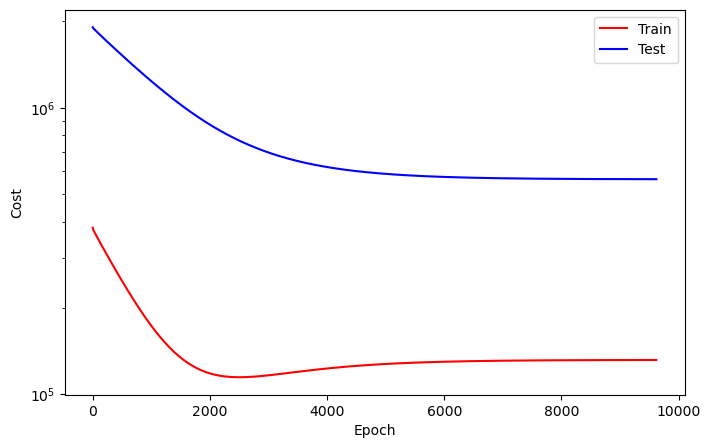

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9621
Train_cost  = 131801.9954 | Test_cost  = 562652.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9622
Train_cost  = 131802.0818 | Test_cost  = 562651.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9623
Train_cost  = 131802.1713 | Test_cost  = 562651.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9624
Train_cost  = 131802.2238 | Test_cost  = 562650.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9625
Train_cost  = 131802.2948 | Test_cost  = 562650.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9626
Train_cost  = 131802.3873 | Test_cost  = 562649.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9627
Train_cost  = 131802.4568 | Test_cost  = 562649.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9628
Train_cost  = 131802.5509 | Test_cost  = 562649.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9629
Train_cost  = 131802.6049 | Test_cost  = 562648.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9630
Train_cost  = 131802.6960 | Test_cost  = 562648.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9631
Train_cost  = 131802.7778 | Test_cost  = 562647.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9632
Train_cost  = 131802.8719 | Test_cost  = 562647.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9633
Train_cost  = 131802.9290 | Test_cost  = 562646.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9634
Train_cost  = 131802.9985 | Test_cost  = 562646.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9635
Train_cost  = 131803.0756 | Test_cost  = 562646.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9636
Train_cost  = 131803.1620 | Test_cost  = 562645.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9637
Train_cost  = 131803.2361 | Test_cost  = 562645.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9638
Train_cost  = 131803.2978 | Test_cost  = 562644.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9639
Train_cost  = 131803.3719 | Test_cost  = 562644.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9640
Train_cost  = 131803.4753 | Test_cost  = 562643.9750 | 


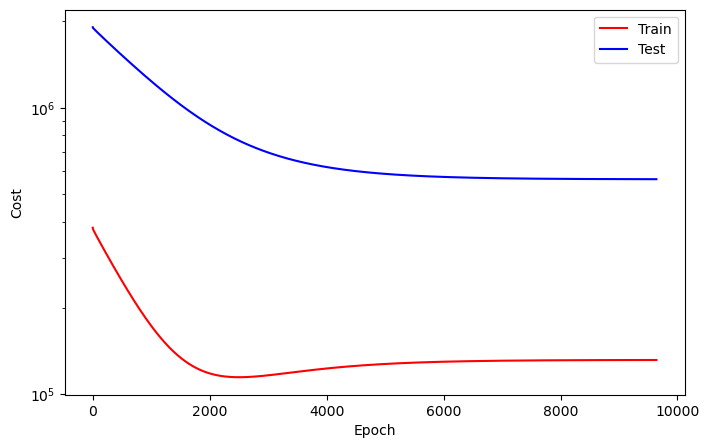

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9641
Train_cost  = 131803.5509 | Test_cost  = 562643.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9642
Train_cost  = 131803.6250 | Test_cost  = 562643.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9643
Train_cost  = 131803.6867 | Test_cost  = 562642.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9644
Train_cost  = 131803.7593 | Test_cost  = 562642.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9645
Train_cost  = 131803.8549 | Test_cost  = 562641.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9646
Train_cost  = 131803.9475 | Test_cost  = 562641.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9647
Train_cost  = 131804.0046 | Test_cost  = 562641.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9648
Train_cost  = 131804.0602 | Test_cost  = 562640.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9649
Train_cost  = 131804.1605 | Test_cost  = 562640.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9650
Train_cost  = 131804.2454 | Test_cost  = 562639.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9651
Train_cost  = 131804.3025 | Test_cost  = 562639.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9652
Train_cost  = 131804.3889 | Test_cost  = 562638.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9653
Train_cost  = 131804.4475 | Test_cost  = 562638.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9654
Train_cost  = 131804.5463 | Test_cost  = 562637.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9655
Train_cost  = 131804.6327 | Test_cost  = 562637.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9656
Train_cost  = 131804.6929 | Test_cost  = 562637.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9657
Train_cost  = 131804.7731 | Test_cost  = 562636.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9658
Train_cost  = 131804.8519 | Test_cost  = 562636.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9659
Train_cost  = 131804.9352 | Test_cost  = 562636.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9660
Train_cost  = 131805.0123 | Test_cost  = 562635.4250 | 


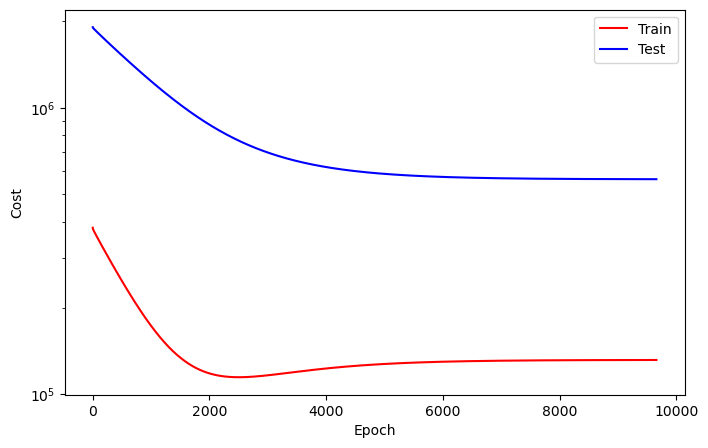

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9661
Train_cost  = 131805.0725 | Test_cost  = 562635.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9662
Train_cost  = 131805.1759 | Test_cost  = 562634.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9663
Train_cost  = 131805.2269 | Test_cost  = 562634.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9664
Train_cost  = 131805.3364 | Test_cost  = 562633.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9665
Train_cost  = 131805.4074 | Test_cost  = 562633.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9666
Train_cost  = 131805.4676 | Test_cost  = 562632.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9667
Train_cost  = 131805.5463 | Test_cost  = 562632.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9668
Train_cost  = 131805.6265 | Test_cost  = 562632.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9669
Train_cost  = 131805.6975 | Test_cost  = 562631.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9670
Train_cost  = 131805.7731 | Test_cost  = 562631.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9671
Train_cost  = 131805.8426 | Test_cost  = 562630.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9672
Train_cost  = 131805.9367 | Test_cost  = 562630.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9673
Train_cost  = 131806.0185 | Test_cost  = 562629.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9674
Train_cost  = 131806.0972 | Test_cost  = 562629.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9675
Train_cost  = 131806.1528 | Test_cost  = 562629.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9676
Train_cost  = 131806.2253 | Test_cost  = 562628.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9677
Train_cost  = 131806.3210 | Test_cost  = 562628.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9678
Train_cost  = 131806.4028 | Test_cost  = 562627.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9679
Train_cost  = 131806.4537 | Test_cost  = 562627.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9680
Train_cost  = 131806.5386 | Test_cost  = 562626.9000 | 


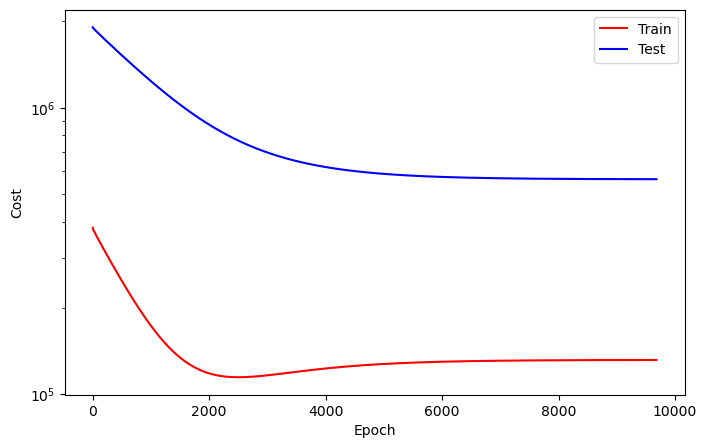

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9681
Train_cost  = 131806.6358 | Test_cost  = 562626.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9682
Train_cost  = 131806.7160 | Test_cost  = 562626.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9683
Train_cost  = 131806.7747 | Test_cost  = 562625.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9684
Train_cost  = 131806.8673 | Test_cost  = 562625.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9685
Train_cost  = 131806.9198 | Test_cost  = 562624.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9686
Train_cost  = 131807.0216 | Test_cost  = 562624.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9687
Train_cost  = 131807.1065 | Test_cost  = 562624.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9688
Train_cost  = 131807.1497 | Test_cost  = 562623.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9689
Train_cost  = 131807.2469 | Test_cost  = 562623.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9690
Train_cost  = 131807.3102 | Test_cost  = 562622.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9691
Train_cost  = 131807.3935 | Test_cost  = 562622.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9692
Train_cost  = 131807.4583 | Test_cost  = 562621.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9693
Train_cost  = 131807.5633 | Test_cost  = 562621.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9694
Train_cost  = 131807.6343 | Test_cost  = 562620.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9695
Train_cost  = 131807.7114 | Test_cost  = 562620.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9696
Train_cost  = 131807.7886 | Test_cost  = 562620.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9697
Train_cost  = 131807.8750 | Test_cost  = 562619.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9698
Train_cost  = 131807.9120 | Test_cost  = 562619.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9699
Train_cost  = 131808.0154 | Test_cost  = 562618.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9700
Train_cost  = 131808.0941 | Test_cost  = 562618.5500 | 


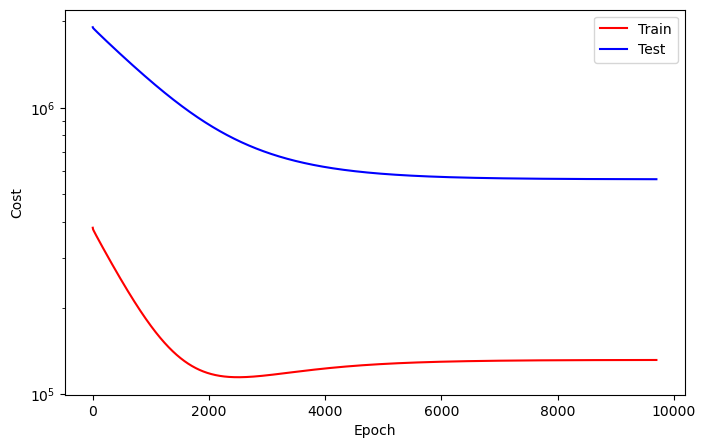

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9701
Train_cost  = 131808.1759 | Test_cost  = 562618.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9702
Train_cost  = 131808.2361 | Test_cost  = 562617.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9703
Train_cost  = 131808.2886 | Test_cost  = 562617.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9704
Train_cost  = 131808.3951 | Test_cost  = 562616.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9705
Train_cost  = 131808.4599 | Test_cost  = 562616.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9706
Train_cost  = 131808.5370 | Test_cost  = 562616.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9707
Train_cost  = 131808.6127 | Test_cost  = 562615.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9708
Train_cost  = 131808.6713 | Test_cost  = 562615.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9709
Train_cost  = 131808.7778 | Test_cost  = 562614.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9710
Train_cost  = 131808.8611 | Test_cost  = 562614.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9711
Train_cost  = 131808.9259 | Test_cost  = 562614.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9712
Train_cost  = 131808.9769 | Test_cost  = 562613.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9713
Train_cost  = 131809.0833 | Test_cost  = 562613.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9714
Train_cost  = 131809.1574 | Test_cost  = 562612.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9715
Train_cost  = 131809.2130 | Test_cost  = 562612.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9716
Train_cost  = 131809.2917 | Test_cost  = 562611.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9717
Train_cost  = 131809.3688 | Test_cost  = 562611.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9718
Train_cost  = 131809.4583 | Test_cost  = 562611.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9719
Train_cost  = 131809.5355 | Test_cost  = 562610.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9720
Train_cost  = 131809.6003 | Test_cost  = 562610.1250 | 


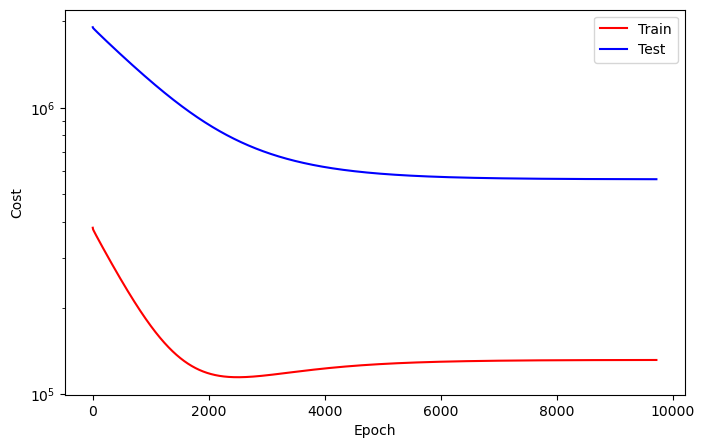

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9721
Train_cost  = 131809.6821 | Test_cost  = 562609.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9722
Train_cost  = 131809.7454 | Test_cost  = 562609.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9723
Train_cost  = 131809.8426 | Test_cost  = 562609.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9724
Train_cost  = 131809.8981 | Test_cost  = 562608.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9725
Train_cost  = 131809.9846 | Test_cost  = 562608.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9726
Train_cost  = 131810.0710 | Test_cost  = 562607.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9727
Train_cost  = 131810.1358 | Test_cost  = 562607.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9728
Train_cost  = 131810.2315 | Test_cost  = 562606.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9729
Train_cost  = 131810.2917 | Test_cost  = 562606.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9730
Train_cost  = 131810.3488 | Test_cost  = 562606.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9731
Train_cost  = 131810.4583 | Test_cost  = 562605.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9732
Train_cost  = 131810.5201 | Test_cost  = 562605.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9733
Train_cost  = 131810.6003 | Test_cost  = 562604.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9734
Train_cost  = 131810.6590 | Test_cost  = 562604.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9735
Train_cost  = 131810.7454 | Test_cost  = 562604.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9736
Train_cost  = 131810.8256 | Test_cost  = 562603.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9737
Train_cost  = 131810.8858 | Test_cost  = 562603.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9738
Train_cost  = 131810.9861 | Test_cost  = 562602.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9739
Train_cost  = 131811.0293 | Test_cost  = 562602.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9740
Train_cost  = 131811.1111 | Test_cost  = 562601.8250 | 


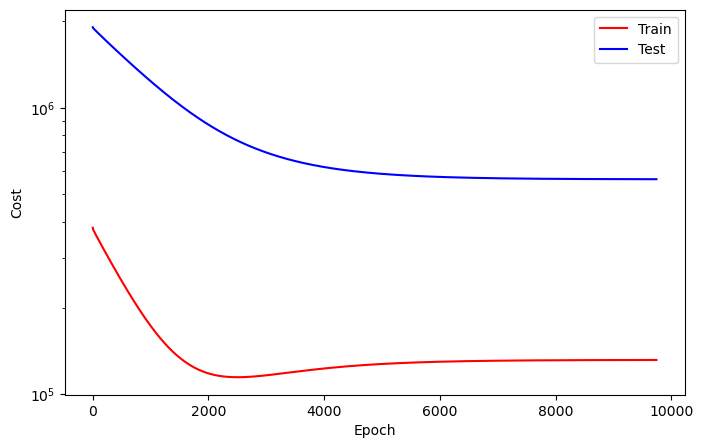

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9741
Train_cost  = 131811.2083 | Test_cost  = 562601.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9742
Train_cost  = 131811.2948 | Test_cost  = 562600.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9743
Train_cost  = 131811.3410 | Test_cost  = 562600.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9744
Train_cost  = 131811.4167 | Test_cost  = 562600.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9745
Train_cost  = 131811.5046 | Test_cost  = 562599.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9746
Train_cost  = 131811.5910 | Test_cost  = 562599.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9747
Train_cost  = 131811.6481 | Test_cost  = 562599.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9748
Train_cost  = 131811.7207 | Test_cost  = 562598.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9749
Train_cost  = 131811.8102 | Test_cost  = 562598.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9750
Train_cost  = 131811.8812 | Test_cost  = 562597.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9751
Train_cost  = 131811.9907 | Test_cost  = 562597.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9752
Train_cost  = 131812.0247 | Test_cost  = 562596.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9753
Train_cost  = 131812.1034 | Test_cost  = 562596.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9754
Train_cost  = 131812.1821 | Test_cost  = 562596.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9755
Train_cost  = 131812.2623 | Test_cost  = 562595.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9756
Train_cost  = 131812.3256 | Test_cost  = 562595.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9757
Train_cost  = 131812.3920 | Test_cost  = 562594.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9758
Train_cost  = 131812.4938 | Test_cost  = 562594.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9759
Train_cost  = 131812.5540 | Test_cost  = 562593.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9760
Train_cost  = 131812.6528 | Test_cost  = 562593.4750 | 


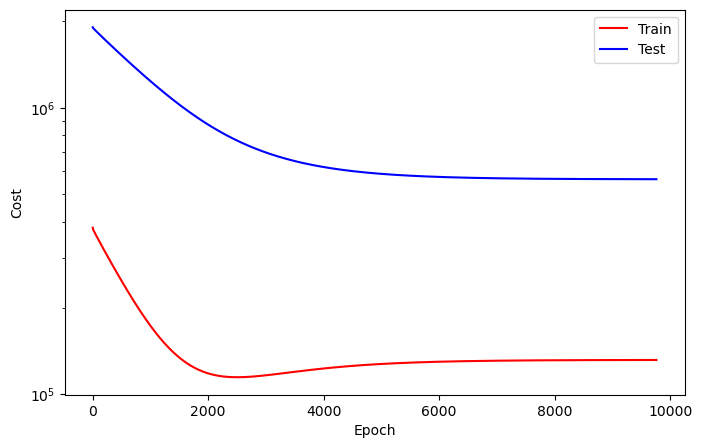

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9761
Train_cost  = 131812.7222 | Test_cost  = 562593.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9762
Train_cost  = 131812.7670 | Test_cost  = 562592.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9763
Train_cost  = 131812.8673 | Test_cost  = 562592.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9764
Train_cost  = 131812.9383 | Test_cost  = 562591.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9765
Train_cost  = 131813.0231 | Test_cost  = 562591.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9766
Train_cost  = 131813.0895 | Test_cost  = 562591.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9767
Train_cost  = 131813.1574 | Test_cost  = 562590.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9768
Train_cost  = 131813.2454 | Test_cost  = 562590.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9769
Train_cost  = 131813.3148 | Test_cost  = 562589.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9770
Train_cost  = 131813.3997 | Test_cost  = 562589.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9771
Train_cost  = 131813.4583 | Test_cost  = 562589.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9772
Train_cost  = 131813.5309 | Test_cost  = 562588.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9773
Train_cost  = 131813.6373 | Test_cost  = 562588.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9774
Train_cost  = 131813.7052 | Test_cost  = 562587.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9775
Train_cost  = 131813.7639 | Test_cost  = 562587.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9776
Train_cost  = 131813.8472 | Test_cost  = 562586.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9777
Train_cost  = 131813.9275 | Test_cost  = 562586.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9778
Train_cost  = 131814.0077 | Test_cost  = 562586.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9779
Train_cost  = 131814.0741 | Test_cost  = 562585.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9780
Train_cost  = 131814.1497 | Test_cost  = 562585.2500 | 


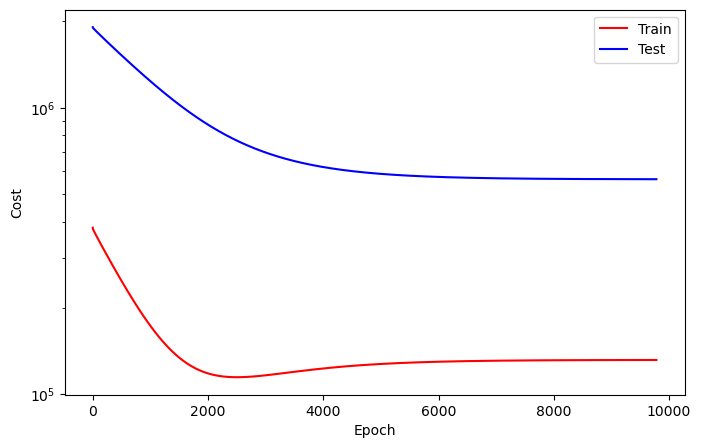

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9781
Train_cost  = 131814.2315 | Test_cost  = 562584.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9782
Train_cost  = 131814.3056 | Test_cost  = 562584.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9783
Train_cost  = 131814.4090 | Test_cost  = 562584.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9784
Train_cost  = 131814.4506 | Test_cost  = 562583.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9785
Train_cost  = 131814.5231 | Test_cost  = 562583.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9786
Train_cost  = 131814.5988 | Test_cost  = 562582.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9787
Train_cost  = 131814.6867 | Test_cost  = 562582.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9788
Train_cost  = 131814.7531 | Test_cost  = 562581.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9789
Train_cost  = 131814.8194 | Test_cost  = 562581.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9790
Train_cost  = 131814.9090 | Test_cost  = 562581.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9791
Train_cost  = 131814.9815 | Test_cost  = 562580.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9792
Train_cost  = 131815.0833 | Test_cost  = 562580.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9793
Train_cost  = 131815.1250 | Test_cost  = 562579.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9794
Train_cost  = 131815.1929 | Test_cost  = 562579.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9795
Train_cost  = 131815.2762 | Test_cost  = 562579.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9796
Train_cost  = 131815.3549 | Test_cost  = 562578.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9797
Train_cost  = 131815.4429 | Test_cost  = 562578.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9798
Train_cost  = 131815.5077 | Test_cost  = 562577.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9799
Train_cost  = 131815.5802 | Test_cost  = 562577.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9800
Train_cost  = 131815.6559 | Test_cost  = 562576.9500 | 


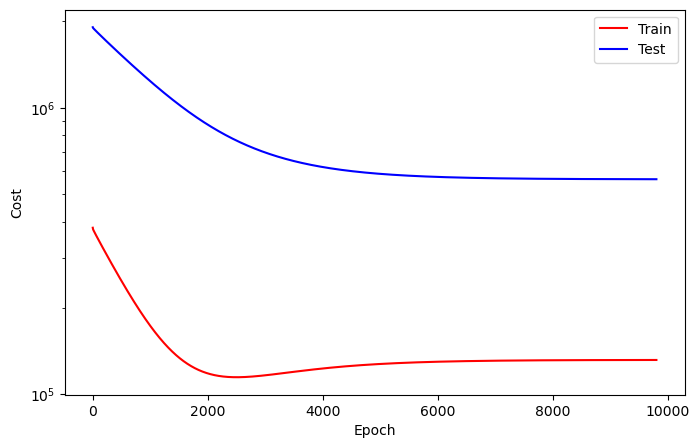

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9801
Train_cost  = 131815.7222 | Test_cost  = 562576.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9802
Train_cost  = 131815.8102 | Test_cost  = 562576.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9803
Train_cost  = 131815.8827 | Test_cost  = 562575.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9804
Train_cost  = 131815.9506 | Test_cost  = 562575.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9805
Train_cost  = 131816.0432 | Test_cost  = 562574.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9806
Train_cost  = 131816.1127 | Test_cost  = 562574.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9807
Train_cost  = 131816.1790 | Test_cost  = 562574.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9808
Train_cost  = 131816.2407 | Test_cost  = 562573.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9809
Train_cost  = 131816.3349 | Test_cost  = 562573.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9810
Train_cost  = 131816.4228 | Test_cost  = 562572.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9811
Train_cost  = 131816.4769 | Test_cost  = 562572.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9812
Train_cost  = 131816.5509 | Test_cost  = 562572.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9813
Train_cost  = 131816.6157 | Test_cost  = 562571.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9814
Train_cost  = 131816.7052 | Test_cost  = 562571.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9815
Train_cost  = 131816.7917 | Test_cost  = 562570.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9816
Train_cost  = 131816.8364 | Test_cost  = 562570.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9817
Train_cost  = 131816.9259 | Test_cost  = 562569.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9818
Train_cost  = 131817.0123 | Test_cost  = 562569.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9819
Train_cost  = 131817.0818 | Test_cost  = 562569.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9820
Train_cost  = 131817.1373 | Test_cost  = 562568.7250 | 


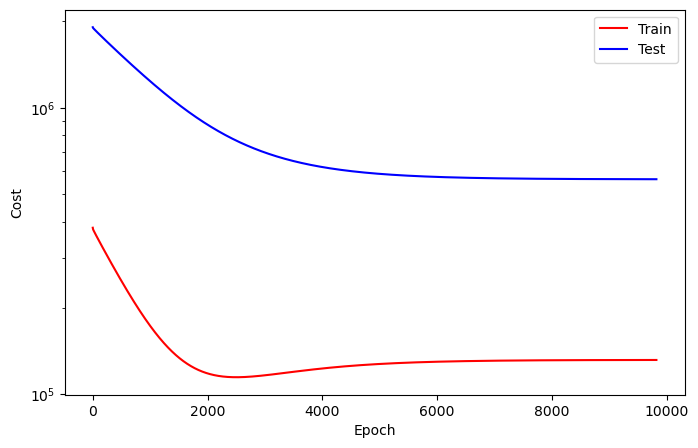

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9821
Train_cost  = 131817.2068 | Test_cost  = 562568.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9822
Train_cost  = 131817.3086 | Test_cost  = 562567.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9823
Train_cost  = 131817.3750 | Test_cost  = 562567.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9824
Train_cost  = 131817.4630 | Test_cost  = 562567.1500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9825
Train_cost  = 131817.5170 | Test_cost  = 562566.7250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9826
Train_cost  = 131817.5833 | Test_cost  = 562566.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9827
Train_cost  = 131817.6466 | Test_cost  = 562565.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9828
Train_cost  = 131817.7515 | Test_cost  = 562565.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9829
Train_cost  = 131817.8333 | Test_cost  = 562565.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9830
Train_cost  = 131817.8843 | Test_cost  = 562564.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9831
Train_cost  = 131817.9583 | Test_cost  = 562564.2500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9832
Train_cost  = 131818.0386 | Test_cost  = 562563.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9833
Train_cost  = 131818.1127 | Test_cost  = 562563.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9834
Train_cost  = 131818.1728 | Test_cost  = 562563.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9835
Train_cost  = 131818.2531 | Test_cost  = 562562.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9836
Train_cost  = 131818.3380 | Test_cost  = 562562.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9837
Train_cost  = 131818.4352 | Test_cost  = 562561.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9838
Train_cost  = 131818.4892 | Test_cost  = 562561.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9839
Train_cost  = 131818.5571 | Test_cost  = 562561.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9840
Train_cost  = 131818.6219 | Test_cost  = 562560.5000 | 


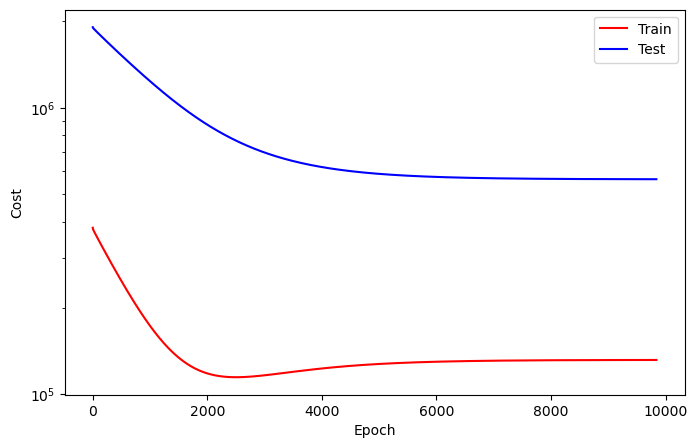

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9841
Train_cost  = 131818.7253 | Test_cost  = 562560.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9842
Train_cost  = 131818.7793 | Test_cost  = 562559.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9843
Train_cost  = 131818.8333 | Test_cost  = 562559.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9844
Train_cost  = 131818.9336 | Test_cost  = 562559.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9845
Train_cost  = 131818.9861 | Test_cost  = 562558.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9846
Train_cost  = 131819.0617 | Test_cost  = 562558.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9847
Train_cost  = 131819.1497 | Test_cost  = 562557.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9848
Train_cost  = 131819.2130 | Test_cost  = 562557.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9849
Train_cost  = 131819.2855 | Test_cost  = 562557.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9850
Train_cost  = 131819.3642 | Test_cost  = 562556.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9851
Train_cost  = 131819.4491 | Test_cost  = 562556.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9852
Train_cost  = 131819.4861 | Test_cost  = 562555.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9853
Train_cost  = 131819.5694 | Test_cost  = 562555.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9854
Train_cost  = 131819.6605 | Test_cost  = 562554.9500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9855
Train_cost  = 131819.7207 | Test_cost  = 562554.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9856
Train_cost  = 131819.8086 | Test_cost  = 562554.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9857
Train_cost  = 131819.8889 | Test_cost  = 562553.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9858
Train_cost  = 131819.9259 | Test_cost  = 562553.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9859
Train_cost  = 131820.0262 | Test_cost  = 562553.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9860
Train_cost  = 131820.0972 | Test_cost  = 562552.5750 | 


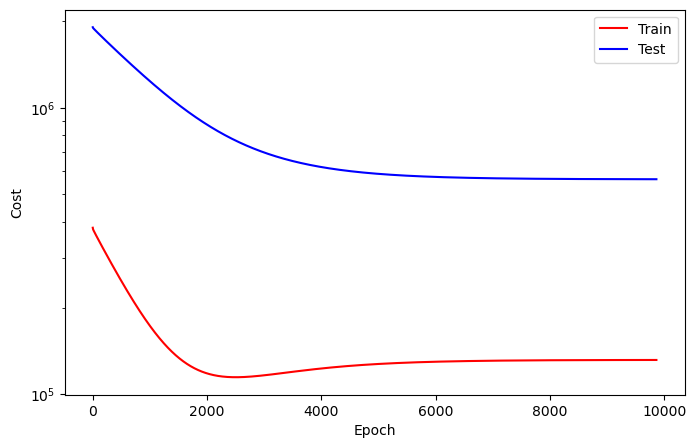

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9861
Train_cost  = 131820.1620 | Test_cost  = 562552.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9862
Train_cost  = 131820.2222 | Test_cost  = 562551.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9863
Train_cost  = 131820.2963 | Test_cost  = 562551.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9864
Train_cost  = 131820.3750 | Test_cost  = 562551.0500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9865
Train_cost  = 131820.4414 | Test_cost  = 562550.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9866
Train_cost  = 131820.5309 | Test_cost  = 562550.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9867
Train_cost  = 131820.5880 | Test_cost  = 562549.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9868
Train_cost  = 131820.6636 | Test_cost  = 562549.4500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9869
Train_cost  = 131820.7485 | Test_cost  = 562549.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9870
Train_cost  = 131820.8056 | Test_cost  = 562548.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9871
Train_cost  = 131820.8704 | Test_cost  = 562548.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9872
Train_cost  = 131820.9491 | Test_cost  = 562547.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9873
Train_cost  = 131821.0231 | Test_cost  = 562547.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9874
Train_cost  = 131821.0926 | Test_cost  = 562547.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9875
Train_cost  = 131821.1543 | Test_cost  = 562546.6500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9876
Train_cost  = 131821.2639 | Test_cost  = 562546.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9877
Train_cost  = 131821.3040 | Test_cost  = 562545.8500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9878
Train_cost  = 131821.3951 | Test_cost  = 562545.4250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9879
Train_cost  = 131821.4830 | Test_cost  = 562545.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9880
Train_cost  = 131821.5216 | Test_cost  = 562544.8000 | 


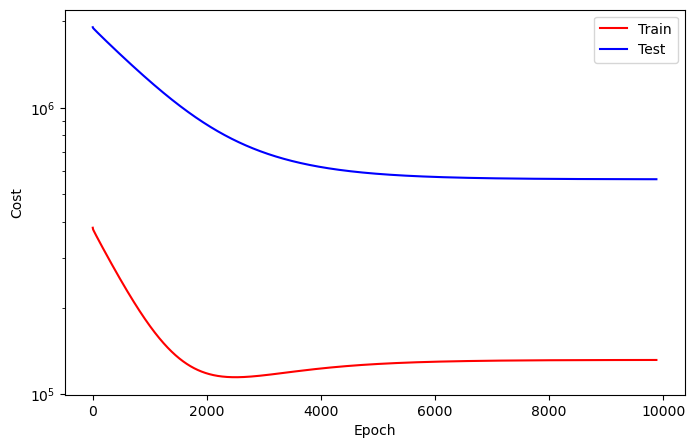

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9881
Train_cost  = 131821.5849 | Test_cost  = 562544.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9882
Train_cost  = 131821.6667 | Test_cost  = 562543.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9883
Train_cost  = 131821.7454 | Test_cost  = 562543.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9884
Train_cost  = 131821.8179 | Test_cost  = 562543.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9885
Train_cost  = 131821.8765 | Test_cost  = 562542.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9886
Train_cost  = 131821.9630 | Test_cost  = 562542.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9887
Train_cost  = 131822.0401 | Test_cost  = 562541.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9888
Train_cost  = 131822.1219 | Test_cost  = 562541.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9889
Train_cost  = 131822.1744 | Test_cost  = 562541.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9890
Train_cost  = 131822.2315 | Test_cost  = 562540.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9891
Train_cost  = 131822.3102 | Test_cost  = 562540.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9892
Train_cost  = 131822.4074 | Test_cost  = 562540.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9893
Train_cost  = 131822.4537 | Test_cost  = 562539.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9894
Train_cost  = 131822.5247 | Test_cost  = 562539.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9895
Train_cost  = 131822.6188 | Test_cost  = 562538.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9896
Train_cost  = 131822.6836 | Test_cost  = 562538.4000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9897
Train_cost  = 131822.7253 | Test_cost  = 562538.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9898
Train_cost  = 131822.8117 | Test_cost  = 562537.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9899
Train_cost  = 131822.8688 | Test_cost  = 562537.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9900
Train_cost  = 131822.9460 | Test_cost  = 562536.8000 | 


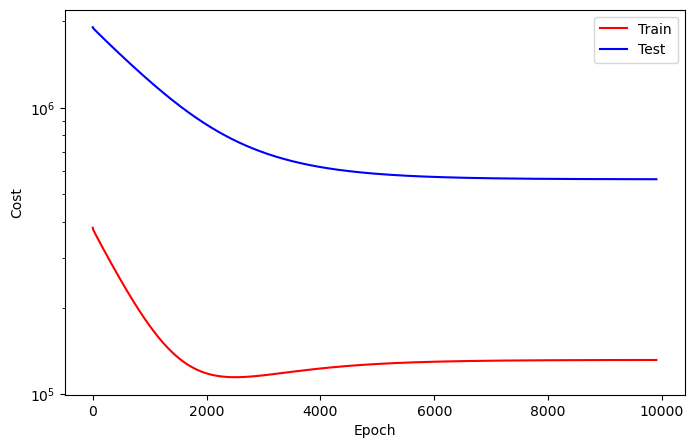

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9901
Train_cost  = 131823.0463 | Test_cost  = 562536.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9902
Train_cost  = 131823.0957 | Test_cost  = 562536.1000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9903
Train_cost  = 131823.1605 | Test_cost  = 562535.7000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9904
Train_cost  = 131823.2438 | Test_cost  = 562535.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9905
Train_cost  = 131823.3194 | Test_cost  = 562534.9250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9906
Train_cost  = 131823.3843 | Test_cost  = 562534.5250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9907
Train_cost  = 131823.4367 | Test_cost  = 562534.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9908
Train_cost  = 131823.5463 | Test_cost  = 562533.7750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9909
Train_cost  = 131823.5941 | Test_cost  = 562533.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9910
Train_cost  = 131823.6605 | Test_cost  = 562532.8750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9911
Train_cost  = 131823.7438 | Test_cost  = 562532.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9912
Train_cost  = 131823.8040 | Test_cost  = 562532.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9913
Train_cost  = 131823.8951 | Test_cost  = 562531.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9914
Train_cost  = 131823.9630 | Test_cost  = 562531.3500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9915
Train_cost  = 131824.0417 | Test_cost  = 562531.0750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9916
Train_cost  = 131824.0787 | Test_cost  = 562530.5750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9917
Train_cost  = 131824.1713 | Test_cost  = 562530.2750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9918
Train_cost  = 131824.2485 | Test_cost  = 562529.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9919
Train_cost  = 131824.3086 | Test_cost  = 562529.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9920
Train_cost  = 131824.3981 | Test_cost  = 562529.0750 | 


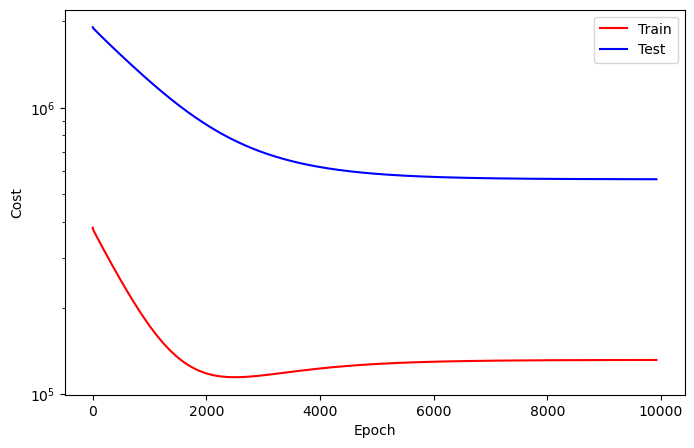

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9921
Train_cost  = 131824.4537 | Test_cost  = 562528.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9922
Train_cost  = 131824.5139 | Test_cost  = 562528.2250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9923
Train_cost  = 131824.6019 | Test_cost  = 562527.8000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9924
Train_cost  = 131824.6867 | Test_cost  = 562527.5000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9925
Train_cost  = 131824.7315 | Test_cost  = 562527.1250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9926
Train_cost  = 131824.8148 | Test_cost  = 562526.6750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9927
Train_cost  = 131824.8858 | Test_cost  = 562526.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9928
Train_cost  = 131824.9491 | Test_cost  = 562525.9000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9929
Train_cost  = 131825.0170 | Test_cost  = 562525.4750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9930
Train_cost  = 131825.1065 | Test_cost  = 562525.1750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9931
Train_cost  = 131825.1435 | Test_cost  = 562524.7500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9932
Train_cost  = 131825.2253 | Test_cost  = 562524.3000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9933
Train_cost  = 131825.2963 | Test_cost  = 562523.9750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9934
Train_cost  = 131825.3812 | Test_cost  = 562523.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9935
Train_cost  = 131825.4552 | Test_cost  = 562523.2000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9936
Train_cost  = 131825.5154 | Test_cost  = 562522.6250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9937
Train_cost  = 131825.5988 | Test_cost  = 562522.3750 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9938
Train_cost  = 131825.6651 | Test_cost  = 562522.0250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9939
Train_cost  = 131825.7083 | Test_cost  = 562521.6000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9940
Train_cost  = 131825.8133 | Test_cost  = 562521.2250 | 


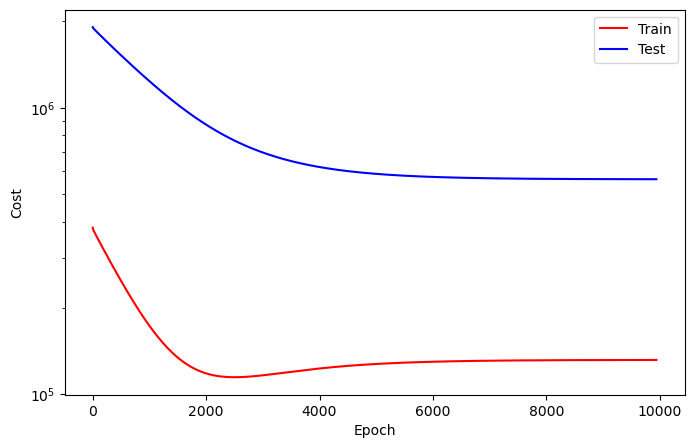

Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9941
Train_cost  = 131825.8688 | Test_cost  = 562520.8250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9942
Train_cost  = 131825.9429 | Test_cost  = 562520.3250 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9943
Train_cost  = 131826.0324 | Test_cost  = 562520.0000 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

Test:   0%|          | 0/2 [00:00<?, ?it/s]


Epoch  9944
Train_cost  = 131826.0802 | Test_cost  = 562519.5500 | 


Train:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
while True:
    train_cost = loop_fn("train", train_set, trainloader, model, criterion, optimizer, device)
    with torch.no_grad():
        test_cost = loop_fn("test", test_set, testloader, model, criterion, optimizer, device)
    
    # Logging
    callback.log(train_cost, test_cost)

    # Checkpoint
    callback.save_checkpoint()
        
    # Runtime Plotting
    callback.cost_runtime_plotting()
    
    # Early Stopping
    if callback.early_stopping(model, monitor="test_cost"):
        callback.plot_cost()
        break

## Sanity check

In [16]:
from utils import data4pred, pred4pred

In [17]:
train_forecast_set = TimeSeriesDataset(ts_train, 'United States(USD)', 1)
trainforecastloader = DataLoader(train_set)

test_forecast_set = TimeSeriesDataset(ts_test, 'United States(USD)', 1)
testforecastloader = DataLoader(test_set)

(N, S, F): (407, 1, 1)
Note: last 0 data excluded

(N, S, F): (102, 1, 1)
Note: last 0 data excluded



In [ ]:
plt.figure(figsize=(15,10))

plt.subplots(211)
data4pred(model, train_forecast_set, trainforecastloader, device)
plt.title('train')


plt.subplots(212)
data4pred(model, test_forecast_set, testforecastloader, device)
plt.title('test')